In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def train_epoch(model, data_loader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    progress_bar = tqdm(data_loader, desc='Training')
    for x, y in progress_bar:
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        logits = model(x)
        loss = criterion(logits.view(-1, logits.size(-1)), y.view(-1))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        progress_bar.set_postfix({'loss': loss.item()})
    return total_loss / len(data_loader)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
filepath = saved_corpus_path = "/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/saved_corpus.txt"

dataset = CharDataset(filepath, block_size=128)
vocab_size = len(dataset.vocab)
data_loader = DataLoader(dataset, batch_size=32, shuffle=True)

model = TransformerDecoder(vocab_size=vocab_size, d_model=1024, N=6, heads=16, d_ff=4096, dropout=0.1).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()
saved_model_path = '/content/drive/MyDrive/model_epoch_1.pth'
if os.path.isfile(saved_model_path):
    # Load the model state dictionary
    model.load_state_dict(torch.load(saved_model_path))

    # If your filename includes the epoch number, you might extract it for setting start_epoch
    # For this example, let's manually set the start_epoch assuming you know which epoch to start from
    start_epoch = 2  # Adjust based on your saved model's epoch
else:
    start_epoch = 1
# Load and continue training if checkpoint exists
'''saved_model_path = '/content/drive/MyDrive/model_epoch_1.pth'
if os.path.isfile(saved_model_path):
    checkpoint = torch.load(saved_model_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
else:
    start_epoch = 1'''

epochs = 10
for epoch in range(start_epoch, epochs + 1):
    avg_loss = train_epoch(model, data_loader, optimizer, criterion, device)
    print(f'Epoch {epoch}, Loss: {avg_loss}')
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': avg_loss,
    }, f'model_epoch_{epoch}.pth')


Training: 100%|██████████| 63873/63873 [3:04:06<00:00,  5.78it/s, loss=2.95]


Epoch 2, Loss: 2.9174285430177194


Training: 100%|██████████| 63873/63873 [3:03:46<00:00,  5.79it/s, loss=2.91]


Epoch 3, Loss: 2.9173853559181815


Training:   0%|          | 227/63873 [00:39<3:03:32,  5.78it/s, loss=2.91]


KeyboardInterrupt: 

In [ ]:
!pip install av
!pip install tqdm
!pip install SpeechRecognition
!pip install jiwer
!pip install keras_cv

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 51.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 32.8/32.8 MB 50.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 47.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 613.1/613.1 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 17.2 MB/s eta 0:00:00


In [ ]:
import speech_recognition as sr

recognizer = sr.Recognizer()

In [ ]:
%cd /content/drive/MyDrive/LRW

/content/drive/MyDrive/LRS


In [ ]:
!dir

drive  sample_data


In [ ]:
#!cat lrw-v1* > lrw-v1.tar


In [ ]:
!tar -xvf lrw-v1.tar --exclude=lipread_mp4/ABOUT --exclude=lipread_mp4/CERTAINLY --exclude=lipread_mp4/CONTROL --exclude=lipread_mp4/ABSOLUTELY --exclude=lipread_mp4/ABUSE --exclude=lipread_mp4/ACCESS --exclude=lipread_mp4/ACCORDING --exclude=lipread_mp4/ACCUSED --exclude=lipread_mp4/ACROSS --exclude=lipread_mp4/ACTION --exclude=lipread_mp4/ACTUALLY --exclude=lipread_mp4/AFFAIRS --exclude=lipread_mp4/AFFECTED --exclude=lipread_mp4/AFRICA --exclude=lipread_mp4/AFTER --exclude=lipread_mp4/AFTERNOON --exclude=lipread_mp4/AGAIN --exclude=lipread_mp4/AGAINST --exclude=lipread_mp4/AGREE --exclude=lipread_mp4/AGREEMENT --exclude=lipread_mp4/AHEAD --exclude=lipread_mp4/ALLEGATIONS --exclude=lipread_mp4/ALLOW --exclude=lipread_mp4/ALLOWED --exclude=lipread_mp4/ALMOST --exclude=lipread_mp4/ALREADY --exclude=lipread_mp4/ALWAYS --exclude=lipread_mp4/AMERICA --exclude=lipread_mp4/AMERICAN --exclude=lipread_mp4/AMONG --exclude=lipread_mp4/AMOUNT --exclude=lipread_mp4/ANNOUNCED --exclude=lipread_mp4/ANOTHER --exclude=lipread_mp4/ANSWER --exclude=lipread_mp4/ANYTHING --exclude=lipread_mp4/AREAS --exclude=lipread_mp4/AROUND --exclude=lipread_mp4/ARRESTED --exclude=lipread_mp4/ASKED --exclude=lipread_mp4/ATTACK --exclude=lipread_mp4/ASKING --exclude=lipread_mp4/ATTACKS --exclude=lipread_mp4/AUTHORITIES --exclude=lipread_mp4/BANKS --exclude=lipread_mp4/BECAUSE --exclude=lipread_mp4/BECOME --exclude=lipread_mp4/BEFORE --exclude=lipread_mp4/BEHIND --exclude=lipread_mp4/BEING --exclude=lipread_mp4/BELIEVE --exclude=lipread_mp4/BENEFIT --exclude=lipread_mp4/BENEFITS --exclude=lipread_mp4/BETTER --exclude=lipread_mp4/BETWEEN --exclude=lipread_mp4/BIGGEST --exclude=lipread_mp4/BILLION --exclude=lipread_mp4/BLACK --exclude=lipread_mp4/BORDER --exclude=lipread_mp4/BRING --exclude=lipread_mp4/BRITAIN --exclude=lipread_mp4/BRITISH --exclude=lipread_mp4/BROUGHT --exclude=lipread_mp4/BUDGET --exclude=lipread_mp4/BUILD --exclude=lipread_mp4/BUILDING --exclude=lipread_mp4/BUSINESS --exclude=lipread_mp4/BUSINESSES --exclude=lipread_mp4/CALLED --exclude=lipread_mp4/CAMERON --exclude=lipread_mp4/CAMPAIGN --exclude=lipread_mp4/CANCER --exclude=lipread_mp4/CANNOT --exclude=lipread_mp4/CAPITAL --exclude=lipread_mp4/CASES --exclude=lipread_mp4/CENTRAL --exclude=lipread_mp4/CERAINLY --exclude=lipread_mp4/CHALLENGE --exclude=lipread_mp4/CHANCE --exclude=lipread_mp4/CHANGE --exclude=lipread_mp4/CHANGES --exclude=lipread_mp4/CHARGES --exclude=lipread_mp4/CHARGE --exclude=lipread_mp4/CHIEF --exclude=lipread_mp4/CHILD --exclude=lipread_mp4/CHILDREN --exclude=lipread_mp4/CHINA --exclude=lipread_mp4/CLAIMS --exclude=lipread_mp4/CLEAR --exclude=lipread_mp4/CLOSE --exclude=lipread_mp4/CLOUD --exclude=lipread_mp4/COMES --exclude=lipread_mp4/COMING --exclude=lipread_mp4/COMMUNITY --exclude=lipread_mp4/COMPANIES --exclude=lipread_mp4/COMPANY --exclude=lipread_mp4/CONCERNS --exclude=lipread_mp4/CONFERENCE --exclude=lipread_mp4/CONFLICT --exclude=lipread_mp4/CONSERVATIVE --exclude=lipread_mp4/CONTINUE --exclude=lipread_mp4/CONROL --exclude=lipread_mp4/COULD --exclude=lipread_mp4/COUNCIL --exclude=lipread_mp4/COUNTRIES --exclude=lipread_mp4/COUNTRY --exclude=lipread_mp4/COUPLE --exclude=lipread_mp4/COURSE --exclude=lipread_mp4/COURT --exclude=lipread_mp4/CRIME --exclude=lipread_mp4/CRISIS --exclude=lipread_mp4/CURRENT --exclude=lipread_mp4/CUSTOMERS --exclude=lipread_mp4/DAVID --exclude=lipread_mp4/DEATH --exclude=lipread_mp4/DEBATE --exclude=lipread_mp4/DECIDED --exclude=lipread_mp4/DECISION --exclude=lipread_mp4/DEFICIT --exclude=lipread_mp4/DEGREES --exclude=lipread_mp4/DESCRIBED --exclude=lipread_mp4/DESPITE --exclude=lipread_mp4/DETAILS --exclude=lipread_mp4/DIFFERENCE --exclude=lipread_mp4/DIFFERENT --exclude=lipread_mp4/DIFFICULT --exclude=lipread_mp4/DOING --exclude=lipread_mp4/DURING --exclude=lipread_mp4/EARLY --exclude=lipread_mp4/EASTERN --exclude=lipread_mp4/ECONOMIC --exclude=lipread_mp4/ECONOMY --exclude=lipread_mp4/EDITOR --exclude=lipread_mp4/EDUCATION --exclude=lipread_mp4/ELECTION --exclude=lipread_mp4/EMERGENCY --exclude=lipread_mp4/ENERGY --exclude=lipread_mp4/ENGLAND --exclude=lipread_mp4/ENOUGH --exclude=lipread_mp4/EUROPE --exclude=lipread_mp4/EUROPEAN --exclude=lipread_mp4/EVENING --exclude=lipread_mp4/EVENTS --exclude=lipread_mp4/EVERY --exclude=lipread_mp4/EVERYBODY --exclude=lipread_mp4/EVERYONE --exclude=lipread_mp4/EVERYTHING --exclude=lipread_mp4/EVIDENCE --exclude=lipread_mp4/EXACTLY --exclude=lipread_mp4/EXAMPLE --exclude=lipread_mp4/EXPECT --exclude=lipread_mp4/EXPECTED --exclude=lipread_mp4/EXTRA --exclude=lipread_mp4/FACING --exclude=lipread_mp4/FAMILIES --exclude=lipread_mp4/FAMILY --exclude=lipread_mp4/FIGHT --exclude=lipread_mp4/FIGHTING --exclude=lipread_mp4/FIGURES --exclude=lipread_mp4/FINAL --exclude=lipread_mp4/FINANCIAL --exclude=lipread_mp4/FIRST --exclude=lipread_mp4/FOCUS --exclude=lipread_mp4/FOLLOWING --exclude=lipread_mp4/FOOTBALL --exclude=lipread_mp4/FORCE --exclude=lipread_mp4/FORCES --exclude=lipread_mp4/FOREIGN  --exclude=lipread_mp4/FORMER --exclude=lipread_mp4/FORWARD --exclude=lipread_mp4/FOUND --exclude=lipread_mp4/FRANCE --exclude=lipread_mp4/FRENCH --exclude=lipread_mp4/FRIDAY --exclude=lipread_mp4/FRONT --exclude=lipread_mp4/FURTHER --exclude=lipread_mp4/FUTURE --exclude=lipread_mp4/GAMES --exclude=lipread_mp4/GENERAL --exclude=lipread_mp4/GEORGE --exclude=lipread_mp4/GERMANY --exclude=lipread_mp4/GETTING --exclude=lipread_mp4/GIVEN --exclude=lipread_mp4/GIVING --exclude=lipread_mp4/GLOBAL --exclude=lipread_mp4/GOING --exclude=lipread_mp4/GOVERNMENT --exclude=lipread_mp4/GREAT --exclude=lipread_mp4/GREECE --exclude=lipread_mp4/GROUND --exclude=lipread_mp4/GROUP --exclude=lipread_mp4/GROWING --exclude=lipread_mp4/GROWTH --exclude=lipread_mp4/GUILTY --exclude=lipread_mp4/HAPPEN --exclude=lipread_mp4/HAPPENED --exclude=lipread_mp4/HAPPENING --exclude=lipread_mp4/HAVING --exclude=lipread_mp4/HEALTH --exclude=lipread_mp4/HEARD --exclude=lipread_mp4/HEART --exclude=lipread_mp4/HEAVY --exclude=lipread_mp4/HIGHER --exclude=lipread_mp4/HISTORY --exclude=lipread_mp4/HOMES --exclude=lipread_mp4/HOSPITAL --exclude=lipread_mp4/HOURS --exclude=lipread_mp4/HOUSE --exclude=lipread_mp4/HOUSING --exclude=lipread_mp4/HUMAN --exclude=lipread_mp4/HUNDREDS --exclude=lipread_mp4/IMMIGRATION --exclude=lipread_mp4/IMPACT --exclude=lipread_mp4/IMPORTANT --exclude=lipread_mp4/INCREASE --exclude=lipread_mp4/INDEPENDENT --exclude=lipread_mp4/INDUSTRY --exclude=lipread_mp4/INFLATION --exclude=lipread_mp4/INFORMATION --exclude=lipread_mp4/INQUIRY --exclude=lipread_mp4/INSIDE --exclude=lipread_mp4/INTEREST --exclude=lipread_mp4/INVESTMENT --exclude=lipread_mp4/INVOLVED --exclude=lipread_mp4/IRELAND --exclude=lipread_mp4/ISLAMIC --exclude=lipread_mp4/ISSUE --exclude=lipread_mp4/ISSUES --exclude=lipread_mp4/ITSELF --exclude=lipread_mp4/JAMES --exclude=lipread_mp4/JUDGE --exclude=lipread_mp4/JUSTICE --exclude=lipread_mp4/KILLED --exclude=lipread_mp4/KNOWN --exclude=lipread_mp4/LABOUR --exclude=lipread_mp4/LARGE --exclude=lipread_mp4/LATER --exclude=lipread_mp4/LATEST --exclude=lipread_mp4/LEADER --exclude=lipread_mp4/LEADERS --exclude=lipread_mp4/LEADERSHIP --exclude=lipread_mp4/LEAST --exclude=lipread_mp4/LEAVE --exclude=lipread_mp4/LEGAL --exclude=lipread_mp4/LEVEL --exclude=lipread_mp4/LEVELS --exclude=lipread_mp4/LIKELY --exclude=lipread_mp4/LITTLE --exclude=lipread_mp4/LIVES --exclude=lipread_mp4/LIVING --exclude=lipread_mp4/LOCAL --exclude=lipread_mp4/LONDON --exclude=lipread_mp4/LONGER --exclude=lipread_mp4/LOOKING --exclude=lipread_mp4/MAJOR --exclude=lipread_mp4/MAJORITY --exclude=lipread_mp4/MAKES --exclude=lipread_mp4/MAKING --exclude=lipread_mp4/MANCHESTER --exclude=lipread_mp4/MARKET --exclude=lipread_mp4/MASSIVE --exclude=lipread_mp4/MATTER --exclude=lipread_mp4/MAYBE --exclude=lipread_mp4/MEANS --exclude=lipread_mp4/MEASURES --exclude=lipread_mp4/MEDIA --skip-old-files --remove-files


Streaming output truncated to the last 5000 lines.
lipread_mp4/YEARS/train/YEARS_00745.txt
lipread_mp4/YEARS/train/YEARS_00795.mp4
lipread_mp4/YEARS/train/YEARS_00139.txt
lipread_mp4/YEARS/train/YEARS_00549.txt
lipread_mp4/YEARS/train/YEARS_00895.txt
lipread_mp4/YEARS/train/YEARS_00093.txt
lipread_mp4/YEARS/train/YEARS_00619.mp4
lipread_mp4/YEARS/train/YEARS_00955.mp4
lipread_mp4/YEARS/train/YEARS_00891.mp4
lipread_mp4/YEARS/train/YEARS_00227.txt
lipread_mp4/YEARS/train/YEARS_00065.mp4
lipread_mp4/YEARS/train/YEARS_00594.mp4
lipread_mp4/YEARS/train/YEARS_00701.mp4
lipread_mp4/YEARS/train/YEARS_00976.mp4
lipread_mp4/YEARS/train/YEARS_00059.txt
lipread_mp4/YEARS/train/YEARS_00618.mp4
lipread_mp4/YEARS/train/YEARS_00938.txt
lipread_mp4/YEARS/train/YEARS_00842.txt
lipread_mp4/YEARS/train/YEARS_00182.txt
lipread_mp4/YEARS/train/YEARS_00376.txt
lipread_mp4/YEARS/train/YEARS_00422.txt
lipread_mp4/YEARS/train/YEARS_00556.txt
lipread_mp4/YEARS/train/YEARS_00114.txt
lipread_mp4/YEARS/train/YEARS

In [ ]:
%%capture
!tar -xvf lrw-v1.tar --skip-old-files --remove-files


Streaming output truncated to the last 5000 lines.
lipread_mp4/YESTERDAY/train/YESTERDAY_00129.mp4
tar: lipread_mp4/YESTERDAY/train/YESTERDAY_00129.mp4: skipping existing file
lipread_mp4/YESTERDAY/train/YESTERDAY_00643.txt
tar: lipread_mp4/YESTERDAY/train/YESTERDAY_00643.txt: skipping existing file
lipread_mp4/YESTERDAY/train/YESTERDAY_00337.mp4
tar: lipread_mp4/YESTERDAY/train/YESTERDAY_00337.mp4: skipping existing file
lipread_mp4/YESTERDAY/train/YESTERDAY_00739.mp4
tar: lipread_mp4/YESTERDAY/train/YESTERDAY_00739.mp4: skipping existing file
lipread_mp4/YESTERDAY/train/YESTERDAY_00602.mp4
tar: lipread_mp4/YESTERDAY/train/YESTERDAY_00602.mp4: skipping existing file
lipread_mp4/YESTERDAY/train/YESTERDAY_00577.txt
tar: lipread_mp4/YESTERDAY/train/YESTERDAY_00577.txt: skipping existing file
lipread_mp4/YESTERDAY/train/YESTERDAY_00510.txt
tar: lipread_mp4/YESTERDAY/train/YESTERDAY_00510.txt: skipping existing file
lipread_mp4/YESTERDAY/train/YESTERDAY_00687.txt
tar: lipread_mp4/YESTERDAY

In [ ]:
%cd /content/drive/MyDrive/LRS

/content/drive/MyDrive/LRS


In [ ]:
!dir

20words_mean_face.npy  LRS2_landmarks	   lrs3_v0.4		   pretrain.txt		  val.txt
face_alignment	       LRS2_landmarks.zip  lrs3_v0.4_txt.zip	   test.txt
face_alignment.zip     lrs2_v1.tar	   mvlrs_v1		   train.txt
face_detection	       lrs3_test_v0.4.zip  preprocessed		   unigram5000.model
face_detection.zip     lrs3_trainval.zip   preprocess_lrs2lrs3.py  unigram5000_units.txt


In [ ]:
!unzip -n lrs3_test_v0.4.zip -d /content/drive/MyDrive/LRS/lrs3_v0.4


Archive:  lrs3_test_v0.4.zip


In [ ]:
!unzip -n LRS2_landmarks.zip


Streaming output truncated to the last 5000 lines.
  inflating: LRS2_landmarks/pretrain/5909052084016964405/00046.pkl  
  inflating: LRS2_landmarks/pretrain/5909052084016964405/00018.pkl  
  inflating: LRS2_landmarks/pretrain/5909052084016964405/00016.pkl  
  inflating: LRS2_landmarks/pretrain/5909052084016964405/00023.pkl  
  inflating: LRS2_landmarks/pretrain/5909052084016964405/00024.pkl  
  inflating: LRS2_landmarks/pretrain/5909052084016964405/00040.pkl  
  inflating: LRS2_landmarks/pretrain/5909052084016964405/00047.pkl  
  inflating: LRS2_landmarks/pretrain/5909052084016964405/00049.pkl  
  inflating: LRS2_landmarks/pretrain/5909052084016964405/00009.pkl  
   creating: LRS2_landmarks/pretrain/6210299801668267679/
  inflating: LRS2_landmarks/pretrain/6210299801668267679/00037.pkl  
  inflating: LRS2_landmarks/pretrain/6210299801668267679/00002.pkl  
  inflating: LRS2_landmarks/pretrain/6210299801668267679/00014.pkl  
  inflating: LRS2_landmarks/pretrain/6210299801668267679/00021.

In [ ]:
!wget https://www.doc.ic.ac.uk/~pm4115/tracker/face_detection.zip -O ./face_detection.zip
!unzip -o ./face_detection.zip -d ./
%cd face_detection
!pip install -e .
%cd ..

--2024-01-26 17:52:55--  https://www.doc.ic.ac.uk/~pm4115/tracker/face_detection.zip
Resolving www.doc.ic.ac.uk (www.doc.ic.ac.uk)... 146.169.13.6
Connecting to www.doc.ic.ac.uk (www.doc.ic.ac.uk)|146.169.13.6|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 186597226 (178M) [application/zip]
Saving to: ‘./face_detection.zip’

./face_detection.zi 100%[===================>] 177.95M  29.1MB/s    in 7.0s    

2024-01-26 17:53:03 (25.5 MB/s) - ‘./face_detection.zip’ saved [186597226/186597226]

Archive:  ./face_detection.zip
  inflating: ./face_detection/LICENSE  
  inflating: ./face_detection/README.md  
  inflating: ./face_detection/face_detection_test.py  
   creating: ./face_detection/ibug/
   creating: ./face_detection/ibug/face_detection/
   creating: ./face_detection/ibug/face_detection/__pycache__/
  inflating: ./face_detection/ibug/face_detection/__pycache__/__init__.cpython-38.pyc  
   creating: ./face_detection/ibug/face_detection/s3fd/
  inflating: ./fa

In [ ]:
!wget https://www.doc.ic.ac.uk/~pm4115/tracker/face_alignment.zip -O ./face_alignment.zip
!unzip -o ./face_alignment.zip -d ./
%cd face_alignment
!pip install -e .
%cd ..

--2024-01-26 17:53:46--  https://www.doc.ic.ac.uk/~pm4115/tracker/face_alignment.zip
Resolving www.doc.ic.ac.uk (www.doc.ic.ac.uk)... 146.169.13.6
Connecting to www.doc.ic.ac.uk (www.doc.ic.ac.uk)|146.169.13.6|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 178845242 (171M) [application/zip]
Saving to: ‘./face_alignment.zip’

./face_alignment.zi 100%[===================>] 170.56M  26.2MB/s    in 8.8s    

2024-01-26 17:53:56 (19.3 MB/s) - ‘./face_alignment.zip’ saved [178845242/178845242]

Archive:  ./face_alignment.zip
  inflating: ./face_alignment/LICENSE  
  inflating: ./face_alignment/README.md  
  inflating: ./face_alignment/face_alignment_test.py  
   creating: ./face_alignment/ibug/
   creating: ./face_alignment/ibug/face_alignment/
   creating: ./face_alignment/ibug/face_alignment/__pycache__/
  inflating: ./face_alignment/ibug/face_alignment/__pycache__/__init__.cpython-38.pyc  
   creating: ./face_alignment/ibug/face_alignment/fan/
  inflating: ./fac

In [ ]:
import os
from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip
import subprocess
import os

def ffmpeg_cut_video(video_path, start_time, end_time, output_video_path):
    """
    Uses ffmpeg directly to cut a video segment.
    """
    try:
        cmd = [
            'ffmpeg',
            '-y',  # Overwrites the output file if it exists
            '-i', video_path,  # Input file path
            '-ss', str(start_time),  # Start time
            '-to', str(end_time),  # End time
            '-vf', f'fps30',
            '-c', 'copy',  # Use the same codec for the output file
            '-an',
            output_video_path  # Output file path
        ]
        subprocess.run(cmd, stdout=subprocess.PIPE, stderr=subprocess.PIPE, check=True)
    except subprocess.CalledProcessError as e:
        print(f"Failed to cut video segment: {e}")

def segment_video(video_path, transcript_path, output_dir, base_filename):
    processing_started = False
    counter = 1  # Initialize the counter before its use in the loop

    with open(transcript_path, 'r') as transcript_file:
        for line in transcript_file:
            if "WORD START END ASDSCORE" in line:
                processing_started = True
                continue

            if not processing_started:
                continue

            parts = line.strip().split()
            # Adjust the condition based on your actual data structure
            if len(parts) < 4:
                continue

            # Assuming the format "WORD START END ASDSCORE", adjust as needed
            word, start_time, end_time = parts[0], float(parts[1]), float(parts[2])

            output_video_name = f"{base_filename}_{counter:03d}.mp4"
            output_video_path = os.path.join(output_dir, output_video_name)
            output_txt_name = f"{base_filename}_{counter:03d}.txt"
            output_txt_path = os.path.join(output_dir, output_txt_name)

            ffmpeg_cut_video(video_path, start_time, end_time, output_video_path)

            with open(output_txt_path, 'w') as text_file:
                text_file.write(word + '\n')

            print(f"Processed segment {counter} for {base_filename}: {word}")
            counter += 1  # Ensure the counter is incremented within the loop




def process_directory(input_base_path, output_base_path):
    for root, dirs, files in os.walk(input_base_path):
        for file in files:
            if file.endswith(".txt"):
                base_filename = file.replace('.txt', '')
                video_name = f"{base_filename}.mp4"
                video_path = os.path.join(root, video_name)
                transcript_path = os.path.join(root, file)

                # Determine output paths
                relative_path = os.path.relpath(root, input_base_path)
                output_dir = os.path.join(output_base_path, relative_path)
                os.makedirs(output_dir, exist_ok=True)

                if not os.path.exists(video_path):
                    print(f"Video file {video_path} does not exist.")
                    continue

                # Segment the video
                segment_video(video_path, transcript_path, output_dir, base_filename)

                print(f"Finished processing segments for {video_name}")

def segment_videos(input_base_path, output_base_path):
    subdirs = ['pretrain']
    for subdir in subdirs:
        subdir_path = os.path.join(input_base_path, subdir)
        output_subdir_path = os.path.join(output_base_path, subdir)
        os.makedirs(output_subdir_path, exist_ok=True)  # Ensure output subdirectory exists
        process_directory(subdir_path, output_subdir_path)

# Use the function like this
input_base_path = '/content/drive/MyDrive/LRS/mvlrs_v1'  # Replace with the actual base path to your 'lrs2' folder
output_base_path = '/content/drive/MyDrive/LRS/word_clips'  # Replace with the desired output base path
segment_videos(input_base_path, output_base_path)


Streaming output truncated to the last 5000 lines.
Processed segment 9 for 00015: ON
Processed segment 10 for 00015: TELEVISION
Processed segment 11 for 00015: AS
Processed segment 12 for 00015: LONG
Processed segment 13 for 00015: AS
Processed segment 14 for 00015: I'VE
Processed segment 15 for 00015: BEEN
Processed segment 16 for 00015: ON
Processed segment 17 for 00015: IT
Processed segment 18 for 00015: IF
Processed segment 19 for 00015: YOU
Processed segment 20 for 00015: DIDN'T
Processed segment 21 for 00015: GO
Processed segment 22 for 00015: DOWN
Processed segment 23 for 00015: YOU
Processed segment 24 for 00015: KNOW
Processed segment 25 for 00015: THE
Processed segment 26 for 00015: KIDS
Processed segment 27 for 00015: IN
Processed segment 28 for 00015: OUR
Processed segment 29 for 00015: COUNTRY
Processed segment 30 for 00015: THEY
Processed segment 31 for 00015: OWN
Processed segment 32 for 00015: THE
Processed segment 33 for 00015: KNOB
Processed segment 34 for 00015: ON
P

In [ ]:
import os
os.system('ffmpeg -version')

0

In [ ]:
!pip install tqdm
!pip install opencv-python
!pip install ffmpeg-python
!pip install sentencepiece
!pip install scikit-image

In [ ]:
!python preprocess_lrs2lrs3.py \
    --data-dir /content/drive/MyDrive/LRS/mvlrs_v1 \
    --landmarks-dir /content/drive/MyDrive/LRS/LRS2_landmarks \
    --root-dir /content/drive/MyDrive/LRS/preprocessed \
    --dataset lrs2 \
    --subset test \
    --groups 2 \
    --job-index 1

#3 - 20 not fully :(

Directory /content/drive/MyDrive/LRS/preprocessed/labels created
100% 621/621 [15:59<00:00,  1.55s/it]


In [ ]:
%cd /content/drive/MyDrive/LRS

/content/drive/MyDrive/LRS


In [ ]:
!pip install ffmpeg
!pip install av
!pip install sentencepiece

  Preparing metadata (setup.py) ... done
  Created wheel for ffmpeg: filename=ffmpeg-1.4-py3-none-any.whl size=6082 sha256=a64811c2c3549e02323f4e9927ef2f8dfa50f968b08f8593004527dc90fd0d53
  Stored in directory: /root/.cache/pip/wheels/8e/7a/69/cd6aeb83b126a7f04cbe7c9d929028dc52a6e7d525ff56003a
Successfully built ffmpeg
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 49.8 MB/s eta 0:00:00


In [ ]:
import os
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from torch.optim import Adam

def load_transcripts(directory):
    transcripts = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.endswith(".txt"):
                with open(os.path.join(root, file), "r") as f:
                    transcript = f.read()
                    transcripts.append(transcript)
    return "\n".join(transcripts)

transcripts_directory = "/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/main"
text_corpus = load_transcripts(transcripts_directory)

class TextDataset(Dataset):
    def __init__(self, text, sequence_length=128):
        self.text = text
        self.sequence_length = sequence_length
        self.chars = list(set(text))
        self.char_to_idx = {ch: idx for idx, ch in enumerate(self.chars)}
        self.idx_to_char = {idx: ch for idx, ch in enumerate(self.chars)}
        self.data = self._prepare_data()

    def __len__(self):
        return len(self.data) - self.sequence_length

    def __getitem__(self, idx):
        return (
            torch.tensor(self.data[idx:idx+self.sequence_length]),
            torch.tensor(self.data[idx+1:idx+self.sequence_length+1]),
        )

    def _prepare_data(self):
        return [self.char_to_idx[ch] for ch in self.text]

# Define hyperparameters
sequence_length = 128
batch_size = 64
num_epochs = 15
learning_rate = 0.001

# Initialize DataLoader
dataset = TextDataset(text_corpus, sequence_length=sequence_length)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Step 3: Train the Decoder (Character-level Language Model)
class CharLM(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, bi=True):
        super(CharLM, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.rnn = nn.LSTM(embedding_dim, hidden_dim, num_layers=2, batch_first=True)
        self.fc = nn.Linear(hidden_dim, vocab_size)
        self.bi=bi

    def forward(self, x):
        embedded = self.embedding(x)
        output, _ = self.rnn(embedded)
        output = self.fc(output)
        return output
class TextGenerate(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, n_layers=1, bi=True):
        super(TextGenerate, self).__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.n_layers = n_layers
        self.bi = bi

        self.encoder = nn.Embedding(input_size, hidden_size)
        self.lstm = nn.LSTM(hidden_size, hidden_size, n_layers, bidirectional=self.bi)
        if self.bi:
          self.decoder = nn.Linear(hidden_size*2, output_size)
        else:
          self.decoder = nn.Linear(hidden_size, output_size)
        self.out = nn.Linear(output_size, output_size)
        self.dropout = nn.Dropout(0.1)

    def forward(self, input, hidden, cell):

        # encoder
        input = self.encoder(input.view(1, -1))
        input = self.dropout(input)
        output, states = self.lstm(input.view(1, 1, -1), (hidden, cell))
        output = output.permute(1, 0, 2)

        # attention
        if self.bi:
          out1, out2 = output[:,:,:self.hidden_size], output[:,:,self.hidden_size:]
          h1, h2 = states[0][states[0].size()[0] - 2,:,:], states[0][states[0].size()[0] - 1,:,:]
          attn_wts_1 = F.softmax(torch.bmm(out1, h1.unsqueeze(2)).squeeze(2), 1)
          attn_wts_2 = F.softmax(torch.bmm(out2, h2.unsqueeze(2)).squeeze(2), 1)
          attn_1 = torch.bmm(out1.transpose(1, 2), attn_wts_1.unsqueeze(2)).squeeze(2)
          attn_2 = torch.bmm(out2.transpose(1, 2), attn_wts_2.unsqueeze(2)).squeeze(2)
          attn = torch.cat((attn_1, attn_2), 1)

        else:
          h = states.squeeze(0)
          attn_wts = F.softmax(torch.bmm(output, h.unsqueeze(2)).squeeze(2), 1)
          attn = torch.bmm(output.transpose(1, 2), attn_wts.unsqueeze(2)).squeeze(2)

        # decoder
        output = self.decoder(attn)
        output = self.dropout(output)
        output = self.out(output)

        return output, states

    def init_hidden(self):
        if self.bi:
          return Variable(torch.zeros(self.n_layers*2, 1, self.hidden_size))
        else:
          return Variable(torch.zeros(self.n_layers, 1, self.hidden_size))

    def init_cell(self):
        if self.bi:
          return Variable(torch.zeros(self.n_layers*2, 1, self.hidden_size))
        else:
          return Variable(torch.zeros(self.n_layers, 1, self.hidden_size))
vocab_size = len(dataset.chars)
embedding_dim = 256
hidden_dim = 512
decoder_model = CharLM(vocab_size, embedding_dim, hidden_dim)

# Define loss function and optimizer
#criterion = nn.CrossEntropyLoss()
device = torch.device("cuda")
optimizer = Adam(decoder_model.parameters(), lr=learning_rate)
decoder_model.to(device)
criterion = nn.CrossEntropyLoss().to(device)

# Initialize DataLoader with pin_memory=True for faster data transfer
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, pin_memory=True)

# Training loop
for epoch in range(num_epochs):
    for batch in dataloader:
        inputs, targets = batch
        inputs, targets = inputs.to(device), targets.to(device)  # Move data to GPU
        optimizer.zero_grad()
        outputs = decoder_model(inputs)
        loss = criterion(outputs.view(-1, vocab_size), targets.view(-1))
        loss.backward()
        optimizer.step()
    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {loss.item()}')

# Save the pre-trained decoder model for later use
torch.save(decoder_model.state_dict(), 'decoder_pretrained.pth')

Epoch 1/5, Loss: 0.1850542426109314
Epoch 2/5, Loss: 0.15219388902187347
Epoch 3/5, Loss: 0.13844333589076996
Epoch 4/5, Loss: 0.14733688533306122
Epoch 5/5, Loss: 0.14751601219177246


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import math

class TransformerDecoderLayer(nn.Module):
    def __init__(self, d_model, nhead, dim_feedforward=2048, dropout=0.1):
        super().__init__()
        self.self_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout)
        self.multihead_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout)  # FC layer, not pre-trained
        self.linear1 = nn.Linear(d_model, dim_feedforward)
        self.dropout = nn.Dropout(dropout)
        self.linear2 = nn.Linear(dim_feedforward, d_model)

        self.norm1 = nn.LayerNorm(d_model)
        self.norm2 = nn.LayerNorm(d_model)
        self.norm3 = nn.LayerNorm(d_model)
        self.dropout1 = nn.Dropout(dropout)
        self.dropout2 = nn.Dropout(dropout)
        self.dropout3 = nn.Dropout(dropout)

    def forward(self, tgt, memory, tgt_mask=None, memory_mask=None,
                tgt_key_padding_mask=None, memory_key_padding_mask=None):
        tgt2 = self.norm1(tgt + self.dropout1(self.self_attn(tgt, tgt, tgt, attn_mask=tgt_mask,
                                                              key_padding_mask=tgt_key_padding_mask)[0]))
        tgt2 = self.norm2(tgt2 + self.dropout2(self.multihead_attn(tgt2, memory, memory, attn_mask=memory_mask,
                                                                    key_padding_mask=memory_key_padding_mask)[0]))
        tgt2 = self.norm3(tgt2 + self.dropout3(self.linear2(self.dropout(F.relu(self.linear1(tgt2)))))
        return tgt2

class TransformerDecoder(nn.Module):
    def __init__(self, decoder_layer, num_layers, d_model, vocab_size):
        super().__init__()
        self.layers = nn.ModuleList([decoder_layer for _ in range(num_layers)])
        self.d_model = d_model
        self.embedding = nn.Embedding(vocab_size, d_model)
        self.positional_encoding = PositionalEncoding(d_model)
        self.final_linear = nn.Linear(d_model, vocab_size)

    def forward(self, tgt, memory, tgt_mask=None, memory_mask=None,
                tgt_key_padding_mask=None, memory_key_padding_mask=None):
        tgt = self.embedding(tgt) * math.sqrt(self.d_model)
        tgt = self.positional_encoding(tgt)
        for layer in self.layers:
            tgt = layer(tgt, memory, tgt_mask=tgt_mask, memory_mask=memory_mask,
                        tgt_key_padding_mask=tgt_key_padding_mask, memory_key_padding_mask=memory_key_padding_mask)
        output = self.final_linear(tgt)
        return F.log_softmax(output, dim=-1)

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, max_len=5000):
        super().__init__()
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0)]
        return x


In [ ]:
import os

def load_transcripts(directory):
    transcripts = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.endswith(".txt"):
                with open(os.path.join(root, file), "r") as f:
                    transcript = f.read()
                    transcripts.append(transcript)
    return "\n".join(transcripts)

# Using the provided directory path
transcripts_directory = "/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/main"
text_corpus = load_transcripts(transcripts_directory)


In [ ]:
from torch.utils.data import Dataset, DataLoader

class CharacterDataset(Dataset):
    """A dataset class for character-level inputs."""
    def __init__(self, text, sequence_length=100):
        self.chars = sorted(list(set(text)))
        self.char_to_idx = {ch: idx for idx, ch in enumerate(self.chars)}
        self.idx_to_char = {idx: ch for idx, ch in enumerate(self.chars)}
        self.data = [self.char_to_idx[ch] for ch in text]
        self.sequence_length = sequence_length

    def __len__(self):
        # Subtract sequence_length to avoid overflow
        return len(self.data) - self.sequence_length

    def __getitem__(self, idx):
        return (
            torch.tensor(self.data[idx:idx+self.sequence_length], dtype=torch.long),
            torch.tensor(self.data[idx+1:idx+self.sequence_length+1], dtype=torch.long),
        )

# Load your transcripts as a single string
# Assuming text_corpus is loaded using the load_transcripts function
sequence_length = 100  # Adjust based on your preference
dataset = CharacterDataset(text_corpus, sequence_length=sequence_length)

# Create a DataLoader
batch_size = 64  # Adjust based on your GPU memory
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)


In [ ]:
# Model instantiation
vocab_size = len(dataset.chars)  # Number of unique characters in your dataset
d_model = 512  # Size of the embeddings and the transformer model
num_layers = 6  # Number of transformer layers
nhead = 8  # Number of heads in the multiheadattention models

decoder_layer = TransformerDecoderLayer(d_model=d_model, nhead=nhead)
model = TransformerDecoder(decoder_layer, num_layers=num_layers, d_model=d_model, vocab_size=vocab_size)

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Training Loop
num_epochs = 10  # Adjust based on your dataset size and desired training time

# Model instantiation
vocab_size = len(dataset.chars)  # Number of unique characters in your dataset
d_model = 512  # Size of the embeddings and the transformer model
num_layers = 6  # Number of transformer layers
nhead = 8  # Number of heads in the multiheadattention models

decoder_layer = TransformerDecoderLayer(d_model=d_model, nhead=nhead)
model = TransformerDecoder(decoder_layer, num_layers=num_layers, d_model=d_model, vocab_size=vocab_size)

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Training Loop
model_save_path = '/content/drive/MyDrive/fyp/tranformer'  # Specify your save path here
os.makedirs(model_save_path, exist_ok=True)  # Create the directory if it does not exist

num_epochs = 10  # Or however many epochs you wish to train for

best_loss = float('inf')  # Initialize with a very high value

for epoch in range(num_epochs):
    model.train()
    total_loss = 0

    progress_bar = tqdm(dataloader, desc=f'Epoch {epoch+1}/{num_epochs}')

    for inputs, targets in progress_bar:
        inputs, targets = inputs.to(device), targets.to(device)

        optimizer.zero_grad()
        output = model(inputs, memory=None)
        loss = criterion(output.view(-1, vocab_size), targets.view(-1))
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        progress_bar.set_postfix({'Loss': total_loss / (progress_bar.n + 1)})

    average_loss = total_loss / len(dataloader)
    print(f'Average Loss: {average_loss:.4f}')

    # Save the model if it has the best loss so far
    if average_loss < best_loss:
        best_loss = average_loss
        model_filename = f'model_epoch_{epoch+1}_loss_{average_loss:.4f}.pt'
        save_path = os.path.join(model_save_path, model_filename)

        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': average_loss,
            'vocab_size': vocab_size,
            'd_model': d_model,
            # Add other relevant information here
        }, save_path)

        print(f'Model saved to {save_path}')

In [ ]:
# encoding: utf-8
import cv2
from turbojpeg import TurboJPEG, TJPF_GRAY, TJSAMP_GRAY, TJFLAG_PROGRESSIVE
import torch

import numpy as np
import glob
import time
import cv2
import os
from torch.utils.data import Dataset, DataLoader
import torch

jpeg = TurboJPEG()
def extract_opencv2(filename):
    video = []
    cap = cv2.VideoCapture(filename)
    while(cap.isOpened()):
        ret, frame = cap.read() # BGR
        if ret:
            frame = frame[115:211, 79:175]
            frame = jpeg.encode(frame)
            video.append(frame)
        else:
            break
    cap.release()
    return video

def extract_opencv(filename):
    video = []
    cap = cv2.VideoCapture(filename)

    while cap.isOpened():
        ret, frame = cap.read()  # BGR
        if ret:
            # Convert the frame to grayscale for facial landmark detection
            gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

            # Detect facial landmarks in the grayscale frame
            landmarks = predictor(gray, dlib.rectangle(0, 0, frame.shape[1], frame.shape[0]))

            # Extract the mouth region using keypoint information
            mouth_points = landmarks.parts()[48:68]  # Extract mouth keypoints (48-67)
            min_x = min(mouth_points, key=lambda x: x.x).x
            max_x = max(mouth_points, key=lambda x: x.x).x
            min_y = min(mouth_points, key=lambda x: x.y).y
            max_y = max(mouth_points, key=lambda x: x.y).y

            # Crop and encode the mouth region
            mouth_frame = frame[min_y:max_y, min_x:max_x]
            mouth_frame = jpeg.encode(mouth_frame)

            # Append the encoded mouth region to the video list
            video.append(mouth_frame)
        else:
            break

    cap.release()
    return video
target_dir = '/content/drive/MyDrive/LRW/preprocessed'

if(not os.path.exists(target_dir)):
    os.makedirs(target_dir)

class LRWDataset(Dataset):
    def __init__(self):

        with open('lrw_vocabulary.txt') as myfile:
            self.labels = myfile.read().splitlines()

        self.list = []

        for (i, label) in enumerate(self.labels[100:10]):
            files = glob.glob(os.path.join('lipread_mp4', label, '*', '*.mp4'))
            for file in files:
                savefile = file.replace('lipread_mp4', target_dir).replace('.mp4', '.pkl')
                savepath = os.path.split(savefile)[0]
                if(not os.path.exists(savepath)):
                    os.makedirs(savepath)

            files = sorted(files)


            self.list += [(file, i) for file in files]


    def __getitem__(self, idx):

        inputs = extract_opencv(self.list[idx][0])
        result = {}

        name = self.list[idx][0]
        duration = self.list[idx][0]
        labels = self.list[idx][1]


        result['video'] = inputs
        result['label'] = int(labels)
        result['duration'] = self.load_duration(duration.replace('.mp4', '.txt')).astype(np.bool)
        savename = self.list[idx][0].replace('lipread_mp4', target_dir).replace('.mp4', '.pkl')
        torch.save(result, savename)

        return result

    def __len__(self):
        return len(self.list)

    def load_duration(self, file):
        with open(file, 'r') as f:
            lines = f.readlines()
            for line in lines:
                if(line.find('Duration') != -1):
                    duration = float(line.split(' ')[1])

        tensor = np.zeros(29)
        mid = 29 / 2
        start = int(mid - duration / 2 * 25)
        end = int(mid + duration / 2 * 25)
        tensor[start:end] = 1.0
        return tensor

if(__name__ == '__main__'):
    loader = DataLoader(LRWDataset(),
            batch_size = 96,
            num_workers = 16,
            shuffle = False,
            drop_last = False)

    import time
    tic = time.time()
    for i, batch in enumerate(loader):
        toc = time.time()
        eta = ((toc - tic) / (i + 1) * (len(loader) - i)) / 3600.0
        print(f'eta:{eta:.5f}')

<ipython-input-12-b84d43cf571c>:69: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  result['duration'] = self.load_duration(duration.replace('.mp4', '.txt')).astype(np.bool)
<ipython-input-12-b84d43cf571c>:69: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  result['duration'] = self.load_duration(duration.replace('.mp4', '.txt')).astype(np.bool)
<ipyth

eta:15.28388
eta:7.84254
eta:5.32853
eta:3.99252
eta:3.19089
eta:2.65648
eta:2.27475
eta:1.98846
eta:1.76579
eta:1.58765
eta:1.44189
eta:1.32736
eta:1.22405
eta:1.13551
eta:1.05875
eta:0.99165
eta:2.01891
eta:1.94907
eta:1.88194
eta:1.78605
eta:1.69929
eta:1.62042
eta:1.54840
eta:1.48239
eta:1.42165
eta:1.36559
eta:1.32635
eta:1.27769
eta:1.23238
eta:1.19009
eta:1.15052
eta:1.11343
eta:1.67503
eta:1.65716
eta:1.66114
eta:1.61337
eta:1.56818
eta:1.52534
eta:1.48477
eta:1.44615
eta:1.40947
eta:1.37449
eta:1.35027
eta:1.31822
eta:1.28760
eta:1.25833
eta:1.23027
eta:1.20341
eta:1.51766
eta:1.50349
eta:1.52201
eta:1.49118
eta:1.46152
eta:1.43295
eta:1.40542
eta:1.37888
eta:1.35326
eta:1.34501
eta:1.32082
eta:1.29744
eta:1.27482
eta:1.25294
eta:1.23175
eta:1.21122
eta:1.41141
eta:1.40388
eta:1.42668
eta:1.40422
eta:1.38242
eta:1.36124
eta:1.34064
eta:1.32064
eta:1.30117
eta:1.30653
eta:1.28773
eta:1.26942
eta:1.25159
eta:1.23422
eta:1.21728
eta:1.20077
eta:1.38207
eta:1.37322
eta:1.40190
eta

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78731d5e9bd0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'

AssertionError: can only test a child processException ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78731d5e9bd0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

eta:0.13333
eta:0.13188
eta:0.13045
eta:0.12901
eta:0.12758
eta:0.12615
eta:0.12473
eta:0.12331


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78731d5e9bd0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78731d5e9bd0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

eta:0.12209
eta:0.12067
eta:0.11926
eta:0.11793


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78731d5e9bd0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78731d5e9bd0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

eta:0.11720
eta:0.11583


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78731d5e9bd0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78731d5e9bd0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

eta:0.11540
eta:0.11398
eta:0.11256
eta:0.11114
eta:0.10973
eta:0.10832
eta:0.10692
eta:0.10551
eta:0.10411
eta:0.10272
eta:0.10152
eta:0.10012
eta:0.09873


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78731d5e9bd0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78731d5e9bd0>Traceback (most recent call last):

  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

eta:0.09743
eta:0.09648
eta:0.09521


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78731d5e9bd0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78731d5e9bd0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

eta:0.09449
eta:0.09309
eta:0.09170
eta:0.09032
eta:0.08893
eta:0.08755
eta:0.08617
eta:0.08479
eta:0.08342
eta:0.08205
eta:0.08086
eta:0.07949
eta:0.07813
eta:0.07683
eta:0.07579
eta:0.07454
eta:0.07365
eta:0.07228
eta:0.07094
eta:0.06958
eta:0.06822
eta:0.06686
eta:0.06551
eta:0.06416
eta:0.06281
eta:0.06146
eta:0.06025
eta:0.05891
eta:0.05757
eta:0.05629
eta:0.05519
eta:0.05388
eta:0.05296
eta:0.05161
eta:0.05029
eta:0.04895
eta:0.04762
eta:0.04628
eta:0.04495
eta:0.04362
eta:0.04229
eta:0.04097
eta:0.03978
eta:0.03845
eta:0.03713
eta:0.03585
eta:0.03469
eta:0.03338
eta:0.03228
eta:0.03096
eta:0.02966
eta:0.02834
eta:0.02703
eta:0.02571
eta:0.02440
eta:0.02309
eta:0.02179
eta:0.02049
eta:0.01924
eta:0.01794
eta:0.01664
eta:0.01535
eta:0.01411
eta:0.01282
eta:0.01158
eta:0.01028
eta:0.00899
eta:0.00770
eta:0.00641
eta:0.00512
eta:0.00384
eta:0.00256
eta:0.00128


In [ ]:
import cv2
import numpy as np
import glob
import os
import torch
from torch.utils.data import Dataset, DataLoader




# Initialize GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define GPU-accelerated video frame extraction function
def extract_opencv_gpu(filename):
    video = []

    # Create GPU-based video capture object
    cap = cv2.cuda.VideoCapture(filename)

    while True:
        ret, frame = cap.read()
        if ret:
            # Extract the frame as a numpy array
            frame = frame.download()
            frame = frame[115:211, 79:175]
            frame = torch.tensor(frame, device=device)  # Move frame to GPU
            video.append(frame)
        else:
            break

    cap.release()
    return video

# Rest of your code (LRWDataset and DataLoader) remains the same.


# Define GPU-accelerated LRWDataset
class LRWDataset(Dataset):
    def __init__(self):
        with open('lrw_vocabulary.txt') as myfile:
            self.labels = myfile.read().splitlines()

        self.list = []

        for (i, label) in enumerate(self.labels[10:20]):
            files = glob.glob(os.path.join('lipread_mp4', label, '*', '*.mp4'))
            for file in files:
                savefile = file.replace('lipread_mp4', target_dir).replace('.mp4', '.pkl')
                savepath = os.path.split(savefile)[0]
                if(not os.path.exists(savepath)):
                    os.makedirs(savepath)

            files = sorted(files)

            self.list += [(file, i) for file in files]

    def __getitem__(self, idx):
        inputs = extract_opencv_gpu(self.list[idx][0])
        result = {}

        name = self.list[idx][0]
        duration = self.list[idx][0]
        labels = self.list[idx][1]

        result['video'] = inputs
        result['label'] = int(labels)
        result['duration'] = self.load_duration(duration.replace('.mp4', '.txt')).astype(np.bool)
        savename = self.list[idx][0].replace('lipread_mp4', target_dir).replace('.mp4', '.pkl')
        torch.save(result, savename)

        return result

    def __len__(self):
        return len(self.list)

    def load_duration(self, file):
        with open(file, 'r') as f:
            lines = f.readlines()
            for line in lines:
                if(line.find('Duration') != -1):
                    duration = float(line.split(' ')[1])

        tensor = np.zeros(29)
        mid = 29 / 2
        start = int(mid - duration / 2 * 25)
        end = int(mid + duration / 2 * 25)
        tensor[start:end] = 1.0
        return tensor

if(__name__ == '__main__'):
    loader = DataLoader(LRWDataset(),
                        batch_size=96,
                        num_workers=16,
                        shuffle=False,
                        drop_last=False)

    import time
    tic = time.time()
    for i, batch in enumerate(loader):
        toc = time.time()
        eta = ((toc - tic) / (i + 1) * (len(loader) - i)) / 3600.0
        print(f'eta:{eta:.5f}')


AttributeError: Caught AttributeError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/_utils/worker.py", line 308, in _worker_loop
    data = fetcher.fetch(index)
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/_utils/fetch.py", line 51, in fetch
    data = [self.dataset[idx] for idx in possibly_batched_index]
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/_utils/fetch.py", line 51, in <listcomp>
    data = [self.dataset[idx] for idx in possibly_batched_index]
  File "<ipython-input-10-76709c022103>", line 59, in __getitem__
    inputs = extract_opencv_gpu(self.list[idx][0])
  File "<ipython-input-10-76709c022103>", line 19, in extract_opencv_gpu
    cap = cv2.cuda.VideoCapture(filename)
AttributeError: module 'cv2.cuda' has no attribute 'VideoCapture'


In [ ]:
#! /usr/bin/env python
# -*- coding: utf-8 -*-

# Copyright 2023 Imperial College London (Pingchuan Ma)
# Apache 2.0  (http://www.apache.org/licenses/LICENSE-2.0)

import torch
import torchaudio
import torchvision


class AVSRDataLoader:
    def __init__(self, modality, detector="retinaface", convert_gray=True):
        self.modality = modality
        if modality == "video":
            if detector == "retinaface":
                #from detectors.retinaface.detector import LandmarksDetector
                #from detectors.retinaface.video_process import VideoProcess

                self.landmarks_detector = LandmarksDetector(device="cuda:0")
                self.video_process = VideoProcess(convert_gray=convert_gray)

            if detector == "mediapipe":
                #from detectors.mediapipe.detector import LandmarksDetector
                #from detectors.mediapipe.video_process import VideoProcess

                self.landmarks_detector = LandmarksDetector()
                self.video_process = VideoProcess(convert_gray=convert_gray)

    def load_data(self, data_filename, landmarks=None, transform=True):
        if self.modality == "audio":
            audio, sample_rate = self.load_audio(data_filename)
            audio = self.audio_process(audio, sample_rate)
            return audio
        if self.modality == "video":
            video = self.load_video(data_filename)
            if not landmarks:
                landmarks = self.landmarks_detector(video)
            video = self.video_process(video, landmarks)
            if video is None:
                raise TypeError("video cannot be None")
            video = torch.tensor(video)
            return video

    def load_audio(self, data_filename):
        waveform, sample_rate = torchaudio.load(data_filename, normalize=True)
        return waveform, sample_rate

    def load_video(self, data_filename):
        return torchvision.io.read_video(data_filename, pts_unit="sec")[0].numpy()

    def audio_process(self, waveform, sample_rate, target_sample_rate=16000):
        if sample_rate != target_sample_rate:
            waveform = torchaudio.functional.resample(
                waveform, sample_rate, target_sample_rate
            )
        waveform = torch.mean(waveform, dim=0, keepdim=True)
        return waveform

In [ ]:
!unzip -n lrs3_trainval.zip -d /content/drive/MyDrive/LRS/lrs3_v0.4


Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/LRS/lrs3_v0.4/trainval/eqDgt12m26c/50030.mp4  
  inflating: /content/drive/MyDrive/LRS/lrs3_v0.4/trainval/eqDgt12m26c/50034.mp4  
  inflating: /content/drive/MyDrive/LRS/lrs3_v0.4/trainval/eqDgt12m26c/50013.txt  
  inflating: /content/drive/MyDrive/LRS/lrs3_v0.4/trainval/eqDgt12m26c/50036.mp4  
  inflating: /content/drive/MyDrive/LRS/lrs3_v0.4/trainval/eqDgt12m26c/50039.mp4  
  inflating: /content/drive/MyDrive/LRS/lrs3_v0.4/trainval/eqDgt12m26c/50044.mp4  
  inflating: /content/drive/MyDrive/LRS/lrs3_v0.4/trainval/eqDgt12m26c/50044.txt  
  inflating: /content/drive/MyDrive/LRS/lrs3_v0.4/trainval/eqDgt12m26c/50003.mp4  
 extracting: /content/drive/MyDrive/LRS/lrs3_v0.4/trainval/eqDgt12m26c/50010.txt  
  inflating: /content/drive/MyDrive/LRS/lrs3_v0.4/trainval/eqDgt12m26c/50020.mp4  
  inflating: /content/drive/MyDrive/LRS/lrs3_v0.4/trainval/eqDgt12m26c/50037.mp4  
  inflating: /content/drive/MyDrive/

In [ ]:
!unzip -n lrs3_v0.4_txt.zip -d /content/drive/MyDrive/LRS


Archive:  lrs3_v0.4_txt.zip


In [ ]:
%cd lrs3_v0.4

[Errno 2] No such file or directory: 'lrs3_v0.4'
/content/drive/MyDrive/LRS/lrs3_v0.4


In [ ]:
import numpy as np
import os

In [ ]:
pretrain_dir='/content/drive/MyDrive/LRS/lrs3_v0.4/pretrain'
trainval_dir='/content/drive/MyDrive/LRS/lrs3_v0.4/trainval'
test_dir='/content/drive/MyDrive/LRS/lrs3_v0.4/test'

In [ ]:
n_test_vids=len(os.listdir(test_dir))
n_test_vids

413

In [ ]:
!sudo apt-get install curl -y
!curl -L https://yt-dl.org/latest/youtube-dl -o /usr/bin/youtube-dl
!sudo chmod 755 /usr/bin/youtube-dl

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
curl is already the newest version (7.81.0-1ubuntu1.15).
0 upgraded, 0 newly installed, 0 to remove and 30 not upgraded.
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   384  100   384    0     0    468      0 --:--:-- --:--:-- --:--:--   468


In [ ]:
!sudo apt install ffmpeg
!pip install ffmpy

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 30 not upgraded.
  Preparing metadata (setup.py) ... done
  Created wheel for ffmpy: filename=ffmpy-0.3.1-py3-none-any.whl size=5579 sha256=02e85b930f2e2754983799b71d7976d7b8ce62112425524ff0c35dbfa9eb741c
  Stored in directory: /root/.cache/pip/wheels/01/a6/d1/1c0828c304a4283b2c1639a09ad86f83d7c487ef34c6b4a1bf
Successfully built ffmpy


In [ ]:
#!cat lrs2_v1_parta* > lrs2_v1.tar


In [ ]:
!tar -xvf lrs2_v1.tar --exclude=mvlrs_v1/main --skip-old-files --remove-files


Streaming output truncated to the last 5000 lines.
mvlrs_v1/pretrain/6290125634335003107/00002.txt
mvlrs_v1/pretrain/6290125634335003107/00004.txt
mvlrs_v1/pretrain/6290125634335003107/00008.txt
mvlrs_v1/pretrain/6290125634335003107/00027.txt
mvlrs_v1/pretrain/6290125634335003107/00002.mp4
mvlrs_v1/pretrain/6290125634335003107/00026.txt
mvlrs_v1/pretrain/6290125634335003107/00011.mp4
mvlrs_v1/pretrain/6290125634335003107/00018.txt
mvlrs_v1/pretrain/6290125634335003107/00004.mp4
mvlrs_v1/pretrain/6290125634335003107/00025.mp4
mvlrs_v1/pretrain/6290125634335003107/00022.txt
mvlrs_v1/pretrain/6290125634335003107/00020.mp4
mvlrs_v1/pretrain/6290125634335003107/00019.txt
mvlrs_v1/pretrain/6290125634335003107/00017.mp4
mvlrs_v1/pretrain/6290125634335003107/00027.mp4
mvlrs_v1/pretrain/6290125634335003107/00010.mp4
mvlrs_v1/pretrain/6290125634335003107/00028.txt
mvlrs_v1/pretrain/6290125634335003107/00026.mp4
mvlrs_v1/pretrain/6290125634335003107/00022.mp4
mvlrs_v1/pretrain/6290125634335003107

In [ ]:
%cd /content/drive/MyDrive/LRW/lipread_mp4/YOUNG/train
!ls -l | wc -l



/content/drive/MyDrive/LRW/lipread_mp4/YOUNG/train
2001


In [ ]:
import os
import sys
import pdb
import glob
import argparse
import numpy as np
from tqdm import tqdm
from PIL import Image

import torch
import torchvision.transforms as transforms

In [ ]:
from IPython.display import HTML
from base64 import b64encode

def show_video(video_path, video_width = 600):

  video_file = open(video_path, "r+b").read()

  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
  return HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>""")


In [ ]:
show_video('/content/drive/MyDrive/LRW/lipread_mp4/RULES/test/RULES_00001.mp4')

In [ ]:
import argparse


def get_parser():
	parser = argparse.ArgumentParser()
	parser.add_argument('--name', type=str, default='lrw')
	parser.add_argument('--gpu', action='store_true')
	parser.add_argument('--gpus', action='store_true')

	parser.add_argument('--lrw_root', type=str, default='/content/drive/MyDrive/LRW/lipread_mp4')

	parser.add_argument('--dataset', type=str, default='lrw')

	parser.add_argument('--encode', type=str, default='233')
	parser.add_argument('--middle', type=str, default='tc')
	parser.add_argument('--decode', type=str, default='pass')
	parser.add_argument('--load', type=str, default='./save/lrw/check/model_12_4200.pth.tar')

	parser.add_argument('--epoches', type=int, default=60)
	parser.add_argument('--lr', type=float, default=3e-4)
	parser.add_argument('--loss_smooth', type=float, default=0.1)
	parser.add_argument('--weight_decay', type=float, default=2e-5)
	parser.add_argument('--batch_size', type=int, default=32)
	parser.add_argument('--validation_batch', type=int, default=3)
	parser.add_argument('--num_workers', type=int, default=8)
	parser.add_argument('--in_channel', type=int, default=1)
	parser.add_argument('--out_channel', type=int, default=500)
	parser.add_argument('--min_frame', type=int, default=75)
	parser.add_argument('--block_num', type=int, default=8)
	parser.add_argument('--dropout_attention', type=float, default=0.1)
	parser.add_argument('--dropout_embed', type=float, default=0.1)

	parser.add_argument('--s2s_embed_x_init', action='store_true')

	opt = parser.parse_args()

	return opt

In [ ]:


sys.path.append('./')


def crop_video(opt):
    assert os.path.exists(opt.lrw_root)
    filenames = glob.glob(os.path.join(opt.lrw_root, '*', '*', '*.mp4'))
    for filename in tqdm(filenames):
        if len(filename.split('/')[-1].split('_')) == 2:
            data = utils.get_imgs_from_video(filename, RGB=True)[:, 115:211, 79:175]
            path_to_save = os.path.join(filename[:-4] + '_mouth.npz')
            np.savez(path_to_save, data=data)


class LRWClassification:
    def __init__(self, args, mode='train'):
        self.mode = mode
        self.args = args

        if mode == 'train':
            self.cur_data = glob.glob(os.path.join(args.lrw_root, '*', 'train', '*_mouth.npz'))
        elif mode == 'val':
            self.cur_data = glob.glob(os.path.join(args.lrw_root, '*', 'val', '*_mouth.npz'))
        else:
            self.cur_data = glob.glob(os.path.join(args.lrw_root, '*', 'test', '*_mouth.npz'))

        self.transform = self.get_transform()
        self.label_idx_list = list(np.load('./repo/lrw_label.npy'))

    def __getitem__(self, index):
        item = self.cur_data[index]

        video = np.load(item)['data']
        array = [Image.fromarray(f) for f in video]
        array = [self.transform(im) for im in array]
        array = torch.stack(array)

        label = item.split('/')[-3]
        label_idx = self.label_idx_list.index(label)

        return array, label_idx, label, item

    def __len__(self):
        return len(self.cur_data)

    def get_transform(self):
        if self.mode == 'train':
            return transforms.Compose([
                transforms.Grayscale(),
                transforms.RandomCrop((88, 88)),
                transforms.RandomHorizontalFlip(0.5),
                transforms.ToTensor(),
            ])
        else:
            return transforms.Compose([
                transforms.Grayscale(),
                transforms.TenCrop((88, 88)),
                transforms.Lambda(lambda crops: torch.stack(
                    [transforms.ToTensor()(crop) for crop in crops])),
            ])




In [ ]:
import os
import sys
import warnings

# To ignore the deprecation warning from scikit-image
warnings.filterwarnings("ignore",category=UserWarning)

#############################################################
# PARAMS
#############################################################

PROCESS_LRW_DIR = os.path.dirname(os.path.realpath(__file__))

if PROCESS_LRW_DIR not in sys.path:
    sys.path.append(PROCESS_LRW_DIR)

LRW_DIR = os.path.normpath(os.path.join(PROCESS_LRW_DIR, ".."))

if LRW_DIR not in sys.path:
    sys.path.append(LRW_DIR)

if 'voletiv' in os.getcwd():
    # voletiv
    LRW_DATA_DIR = '/content/drive/MyDrive/LRW/lipread_mp4'
    LRW_SAVE_DIR = '/content/drive/MyDrive/LRW/preprocessed'

elif 'voleti.vikram' in os.getcwd():
    # fusor
    LRW_DATA_DIR = '/content/drive/MyDrive/LRW/lipread_mp4'
    LRW_SAVE_DIR = '/content/drive/MyDrive/LRW/lipread_mp4/PREPROCESS'
#############################################################
# CONSTANTS
#############################################################




NameError: name '__file__' is not defined

In [ ]:
!wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2


--2024-01-23 22:55:03--  http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Resolving dlib.net (dlib.net)... 107.180.26.78
Connecting to dlib.net (dlib.net)|107.180.26.78|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64040097 (61M)
Saving to: ‘shape_predictor_68_face_landmarks.dat.bz2’

shape_predictor_68_ 100%[===================>]  61.07M  7.84MB/s    in 17s     

2024-01-23 22:55:21 (3.49 MB/s) - ‘shape_predictor_68_face_landmarks.dat.bz2’ saved [64040097/64040097]



In [ ]:
!bzip2 -d shape_predictor_68_face_landmarks.dat.bz2


In [ ]:
!mv shape_predictor_68_face_landmarks.dat /content/drive/MyDrive/LRW/


mv: 'shape_predictor_68_face_landmarks.dat' and '/content/drive/MyDrive/LRW/shape_predictor_68_face_landmarks.dat' are the same file


In [ ]:
SHAPE_PREDICTOR_PATH = os.path.realpath('/content/drive/MyDrive/LRW/shape_predictor_68_face_landmarks.dat')

FACIAL_LANDMARKS_IDXS = dict([
    ("mouth", (48, 68)),
    ("right_eyebrow", (17, 22)),
    ("left_eyebrow", (22, 27)),
    ("right_eye", (36, 42)),
    ("left_eye", (42, 48)),
    ("nose", (27, 35)),
    ("jaw", (0, 17))
])

VIDEO_FPS = 25
VIDEO_FRAMES_PER_WORD = 30

MOUTH_SHAPE_FROM = FACIAL_LANDMARKS_IDXS["mouth"][0]
MOUTH_SHAPE_TO = FACIAL_LANDMARKS_IDXS["mouth"][1]

MOUTH_TO_FACE_RATIO = 0.65

#############################################################
# LOAD VOCAB LIST
#############################################################


def load_lrw_vocab_list(GRID_VOCAB_LIST_FILE):
    lrw_vocab = []
    with open(LRW_VOCAB_LIST_FILE) as f:
        for line in f:
            word = line.rstrip().split()[-1]
            lrw_vocab.append(word)
    return lrw_vocab

LRW_VOCAB_LIST_FILE = 'lrw_vocabulary.txt'

LRW_VOCAB = load_lrw_vocab_list(LRW_VOCAB_LIST_FILE)

In [ ]:
import sys


startSetWordNumber = 'train/WHOLE_00313'


process_lrw(dataDir=LRW_DATA_DIR,
    saveDir=LRW_SAVE_DIR,
    startExtracting=False,
    startSetWordNumber=startSetWordNumber,
    endSetWordNumber=None,
    copyTxtFile=True,
    extractAudioFromMp4=True,
    dontWriteAudioIfExists=False,
    extractFramesFromMp4=True,
    extractOnlyWordFrames=True,
    writeFrameImages=True,
    dontWriteFrameIfExists=False,
    detectAndSaveMouths=True,
    dontWriteMouthIfExists=False,
    verbose=False)

# # DEBUG
# process_lrw(dataDir=LRW_DATA_DIR, saveDir=LRW_SAVE_DIR, startExtracting=True, startSetWordNumber='train/ACCESS_00543', endSetWordNumber=None, copyTxtFile=True, extractAudioFromMp4=True, dontWriteAudioIfExists=False, extractFramesFromMp4=True, writeFrameImages=True, dontWriteFrameIfExists=False, detectAndSaveMouths=True, dontWriteMouthIfExists=False, verbose=True)

# # TEST
# process_lrw(dataDir=LRW_DATA_DIR, saveDir='/home/voletiv/LRW-test', startExtracting=False, startSetWordNumber='val/AFTER_00050', endSetWordNumber='test/AFTERNOON_00001', copyTxtFile=False, extractAudioFromMp4=False, dontWriteAudioIfExists=False, extractFramesFromMp4=False, writeFrameImages=False, dontWriteFrameIfExists=True, detectAndSaveMouths=True, dontWriteMouthIfExists=False, verbose=True)

  0%|          | 0/500 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ABOUT/
0.0 hr 0.0 min 0.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ABOUT/test/
0.0 hr 0.0 min 0.0 sec




100%|██████████| 50/50 [00:00<00:00, 281875.27it/s]


/content/drive/MyDrive/LRW/lipread_mp4/ABOUT/train/
0.0 hr 0.0 min 0.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1159929.20it/s]


/content/drive/MyDrive/LRW/lipread_mp4/ABOUT/val/
0.0 hr 0.0 min 0.0 sec




100%|██████████| 50/50 [00:00<00:00, 328707.21it/s]

  0%|          | 1/500 [00:00<01:16,  6.49it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ABSOLUTELY/
0.0 hr 0.0 min 0.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ABSOLUTELY/test/
0.0 hr 0.0 min 0.0 sec




100%|██████████| 50/50 [00:00<00:00, 326151.17it/s]


/content/drive/MyDrive/LRW/lipread_mp4/ABSOLUTELY/train/
0.0 hr 0.0 min 0.0 sec




100%|██████████| 959/959 [00:00<00:00, 1257373.41it/s]


/content/drive/MyDrive/LRW/lipread_mp4/ABSOLUTELY/val/
0.0 hr 0.0 min 0.0 sec




100%|██████████| 50/50 [00:00<00:00, 295790.13it/s]

  0%|          | 2/500 [00:00<01:21,  6.11it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ABUSE/
0.0 hr 0.0 min 0.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ABUSE/test/
0.0 hr 0.0 min 0.0 sec




100%|██████████| 50/50 [00:00<00:00, 307050.07it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ABUSE/train/


0.0 hr 0.0 min 0.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1185501.41it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  6.48it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ABUSE/val/
0.0 hr 0.0 min 0.0 sec




  1%|          | 3/500 [00:00<02:11,  3.79it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACCESS/
0.0 hr 0.0 min 0.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACCESS/test/
0.0 hr 0.0 min 0.0 sec




100%|██████████| 50/50 [00:00<00:00, 345494.56it/s]


/content/drive/MyDrive/LRW/lipread_mp4/ACCESS/train/
0.0 hr 0.0 min 0.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1223899.62it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  3.58it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACCESS/val/
0.0 hr 0.0 min 1.0 sec




  1%|          | 4/500 [00:01<03:23,  2.44it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACCORDING/
0.0 hr 0.0 min 1.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACCORDING/test/
0.0 hr 0.0 min 1.0 sec




100%|██████████| 50/50 [00:00<00:00, 320175.88it/s]


/content/drive/MyDrive/LRW/lipread_mp4/ACCORDING/train/
0.0 hr 0.0 min 1.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1154819.38it/s]

 67%|██████▋   | 2/3 [00:00<00:00, 17.71it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACCORDING/val/
0.0 hr 0.0 min 1.0 sec




  1%|          | 5/500 [00:01<02:39,  3.10it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACCUSED/
0.0 hr 0.0 min 1.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACCUSED/test/
0.0 hr 0.0 min 1.0 sec




100%|██████████| 50/50 [00:00<00:00, 328192.80it/s]


/content/drive/MyDrive/LRW/lipread_mp4/ACCUSED/train/
0.0 hr 0.0 min 1.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1200774.12it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  6.25it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACCUSED/val/
0.0 hr 0.0 min 1.0 sec




  1%|          | 6/500 [00:01<02:50,  2.90it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACROSS/
0.0 hr 0.0 min 2.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACROSS/test/
0.0 hr 0.0 min 2.0 sec




100%|██████████| 50/50 [00:00<00:00, 237772.34it/s]


/content/drive/MyDrive/LRW/lipread_mp4/ACROSS/train/
0.0 hr 0.0 min 2.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 155040.25it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  5.65it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACROSS/val/
0.0 hr 0.0 min 2.0 sec




  1%|▏         | 7/500 [00:02<03:02,  2.70it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACTION/
0.0 hr 0.0 min 2.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACTION/test/
0.0 hr 0.0 min 2.0 sec




100%|██████████| 50/50 [00:00<00:00, 335544.32it/s]


/content/drive/MyDrive/LRW/lipread_mp4/ACTION/train/
0.0 hr 0.0 min 2.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1138519.00it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  6.52it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACTION/val/
0.0 hr 0.0 min 2.0 sec




  2%|▏         | 8/500 [00:02<03:07,  2.62it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACTUALLY/
0.0 hr 0.0 min 2.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACTUALLY/test/
0.0 hr 0.0 min 2.0 sec




100%|██████████| 50/50 [00:00<00:00, 323634.57it/s]


/content/drive/MyDrive/LRW/lipread_mp4/ACTUALLY/train/
0.0 hr 0.0 min 2.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 966429.49it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  6.14it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ACTUALLY/val/
0.0 hr 0.0 min 3.0 sec




  2%|▏         | 9/500 [00:03<03:11,  2.57it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AFFAIRS/
0.0 hr 0.0 min 3.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AFFAIRS/test/
0.0 hr 0.0 min 3.0 sec




100%|██████████| 50/50 [00:00<00:00, 358487.52it/s]


/content/drive/MyDrive/LRW/lipread_mp4/AFFAIRS/train/
0.0 hr 0.0 min 3.0 sec




100%|██████████| 942/942 [00:00<00:00, 1165840.77it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  6.38it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AFFAIRS/val/
0.0 hr 0.0 min 3.0 sec




  2%|▏         | 10/500 [00:03<03:10,  2.58it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AFFECTED/
0.0 hr 0.0 min 3.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AFFECTED/test/
0.0 hr 0.0 min 3.0 sec




100%|██████████| 50/50 [00:00<00:00, 283398.92it/s]


/content/drive/MyDrive/LRW/lipread_mp4/AFFECTED/train/
0.0 hr 0.0 min 3.0 sec




100%|██████████| 810/810 [00:00<00:00, 1097701.53it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  6.67it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AFFECTED/val/
0.0 hr 0.0 min 3.0 sec




100%|██████████| 50/50 [00:00<00:00, 301748.49it/s]

  2%|▏         | 11/500 [00:03<03:21,  2.43it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AFRICA/
0.0 hr 0.0 min 4.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AFRICA/test/
0.0 hr 0.0 min 4.0 sec




100%|██████████| 50/50 [00:00<00:00, 351871.14it/s]


/content/drive/MyDrive/LRW/lipread_mp4/AFRICA/train/
0.0 hr 0.0 min 4.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1193258.61it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  5.51it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AFRICA/val/
0.0 hr 0.0 min 4.0 sec




  2%|▏         | 12/500 [00:04<03:30,  2.32it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AFTER/
0.0 hr 0.0 min 4.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AFTER/test/
0.0 hr 0.0 min 4.0 sec




100%|██████████| 50/50 [00:00<00:00, 332353.72it/s]


/content/drive/MyDrive/LRW/lipread_mp4/AFTER/train/
0.0 hr 0.0 min 4.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1147238.51it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  5.38it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AFTER/val/
0.0 hr 0.0 min 4.0 sec




  3%|▎         | 13/500 [00:04<03:30,  2.32it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AFTERNOON/
0.0 hr 0.0 min 5.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AFTERNOON/test/
0.0 hr 0.0 min 5.0 sec




100%|██████████| 50/50 [00:00<00:00, 349525.33it/s]


/content/drive/MyDrive/LRW/lipread_mp4/AFTERNOON/train/
0.0 hr 0.0 min 5.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1076290.48it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  5.56it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AFTERNOON/val/
0.0 hr 0.0 min 5.0 sec




  3%|▎         | 14/500 [00:05<03:30,  2.31it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AGAIN/
0.0 hr 0.0 min 5.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AGAIN/test/
0.0 hr 0.0 min 5.0 sec




100%|██████████| 50/50 [00:00<00:00, 376508.44it/s]


/content/drive/MyDrive/LRW/lipread_mp4/AGAIN/train/
0.0 hr 0.0 min 5.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 979062.56it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  5.27it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AGAIN/val/
0.0 hr 0.0 min 5.0 sec




  3%|▎         | 15/500 [00:05<03:31,  2.30it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AGAINST/
0.0 hr 0.0 min 5.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AGAINST/test/
0.0 hr 0.0 min 5.0 sec




100%|██████████| 50/50 [00:00<00:00, 322638.77it/s]


/content/drive/MyDrive/LRW/lipread_mp4/AGAINST/train/
0.0 hr 0.0 min 5.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 182004.95it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  5.33it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AGAINST/val/
0.0 hr 0.0 min 6.0 sec




  3%|▎         | 16/500 [00:06<03:32,  2.28it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AGREE/
0.0 hr 0.0 min 6.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AGREE/test/
0.0 hr 0.0 min 6.0 sec




100%|██████████| 50/50 [00:00<00:00, 275578.45it/s]


/content/drive/MyDrive/LRW/lipread_mp4/AGREE/train/
0.0 hr 0.0 min 6.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1191225.22it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  5.57it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AGREE/val/
0.0 hr 0.0 min 6.0 sec




  3%|▎         | 17/500 [00:06<03:31,  2.28it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AGREEMENT/
0.0 hr 0.0 min 6.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AGREEMENT/test/
0.0 hr 0.0 min 6.0 sec




100%|██████████| 50/50 [00:00<00:00, 304376.20it/s]


/content/drive/MyDrive/LRW/lipread_mp4/AGREEMENT/train/
0.0 hr 0.0 min 6.0 sec




100%|██████████| 852/852 [00:00<00:00, 1161373.74it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  6.60it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AGREEMENT/val/
0.0 hr 0.0 min 7.0 sec




  4%|▎         | 18/500 [00:07<03:20,  2.40it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AHEAD/
0.0 hr 0.0 min 7.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AHEAD/test/
0.0 hr 0.0 min 7.0 sec




100%|██████████| 50/50 [00:00<00:00, 286496.17it/s]


/content/drive/MyDrive/LRW/lipread_mp4/AHEAD/train/
0.0 hr 0.0 min 7.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1153866.30it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  6.05it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AHEAD/val/
0.0 hr 0.0 min 7.0 sec




  4%|▍         | 19/500 [00:07<03:18,  2.42it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALLEGATIONS/
0.0 hr 0.0 min 7.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALLEGATIONS/test/
0.0 hr 0.0 min 7.0 sec




100%|██████████| 50/50 [00:00<00:00, 351281.74it/s]


/content/drive/MyDrive/LRW/lipread_mp4/ALLEGATIONS/train/
0.0 hr 0.0 min 7.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1176852.97it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  5.73it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALLEGATIONS/val/
0.0 hr 0.0 min 7.0 sec




  4%|▍         | 20/500 [00:07<03:18,  2.42it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALLOW/
0.0 hr 0.0 min 7.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALLOW/test/
0.0 hr 0.0 min 7.0 sec




100%|██████████| 50/50 [00:00<00:00, 213125.20it/s]


/content/drive/MyDrive/LRW/lipread_mp4/ALLOW/train/
0.0 hr 0.0 min 8.0 sec




100%|██████████| 849/849 [00:00<00:00, 225949.50it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  6.55it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALLOW/val/
0.0 hr 0.0 min 8.0 sec




  4%|▍         | 21/500 [00:08<03:18,  2.41it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALLOWED/
0.0 hr 0.0 min 8.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALLOWED/test/
0.0 hr 0.0 min 8.0 sec




100%|██████████| 50/50 [00:00<00:00, 305262.30it/s]


/content/drive/MyDrive/LRW/lipread_mp4/ALLOWED/train/
0.0 hr 0.0 min 8.0 sec




100%|██████████| 812/812 [00:00<00:00, 1137913.41it/s]

 67%|██████▋   | 2/3 [00:00<00:00, 19.77it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALLOWED/val/
0.0 hr 0.0 min 8.0 sec




  4%|▍         | 22/500 [00:08<02:42,  2.94it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALMOST/
0.0 hr 0.0 min 8.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALMOST/test/
0.0 hr 0.0 min 8.0 sec




100%|██████████| 50/50 [00:00<00:00, 361577.93it/s]


/content/drive/MyDrive/LRW/lipread_mp4/ALMOST/train/
0.0 hr 0.0 min 8.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1072163.60it/s]

 67%|██████▋   | 2/3 [00:00<00:00, 14.36it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALMOST/val/
0.0 hr 0.0 min 8.0 sec




  5%|▍         | 23/500 [00:08<02:22,  3.35it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALREADY/
0.0 hr 0.0 min 8.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALREADY/test/
0.0 hr 0.0 min 8.0 sec




100%|██████████| 50/50 [00:00<00:00, 334474.00it/s]


/content/drive/MyDrive/LRW/lipread_mp4/ALREADY/train/
0.0 hr 0.0 min 8.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1158007.73it/s]

 67%|██████▋   | 2/3 [00:00<00:00, 17.69it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALREADY/val/
0.0 hr 0.0 min 8.0 sec




  5%|▍         | 24/500 [00:08<02:02,  3.89it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALWAYS/
0.0 hr 0.0 min 8.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALWAYS/test/
0.0 hr 0.0 min 8.0 sec




100%|██████████| 50/50 [00:00<00:00, 348943.76it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALWAYS/train/


0.0 hr 0.0 min 8.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 859664.69it/s]

 67%|██████▋   | 2/3 [00:00<00:00, 14.61it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ALWAYS/val/
0.0 hr 0.0 min 9.0 sec




  5%|▌         | 25/500 [00:08<01:55,  4.10it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AMERICA/
0.0 hr 0.0 min 9.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AMERICA/test/
0.0 hr 0.0 min 9.0 sec




100%|██████████| 50/50 [00:00<00:00, 179550.68it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.59s/it]

/content/drive/MyDrive/LRW/lipread_mp4/AMERICA/train/
0.0 hr 0.0 min 10.0 sec




100%|██████████| 924/924 [00:00<00:00, 1214521.12it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.36s/it]

/content/drive/MyDrive/LRW/lipread_mp4/AMERICA/val/
0.0 hr 0.0 min 22.0 sec




  5%|▌         | 26/500 [00:22<32:20,  4.09s/it]

/content/drive/MyDrive/LRW/lipread_mp4/AMERICAN/
0.0 hr 0.0 min 22.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AMERICAN/test/
0.0 hr 0.0 min 22.0 sec




100%|██████████| 50/50 [00:00<00:00, 355449.49it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.01it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AMERICAN/train/
0.0 hr 0.0 min 23.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1194618.06it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.10s/it]

/content/drive/MyDrive/LRW/lipread_mp4/AMERICAN/val/
0.0 hr 0.0 min 34.0 sec




100%|██████████| 50/50 [00:00<00:00, 230963.88it/s]

  5%|▌         | 27/500 [00:34<52:12,  6.62s/it]

/content/drive/MyDrive/LRW/lipread_mp4/AMONG/
0.0 hr 0.0 min 34.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AMONG/test/
0.0 hr 0.0 min 34.0 sec




100%|██████████| 50/50 [00:00<00:00, 345494.56it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.67s/it]

/content/drive/MyDrive/LRW/lipread_mp4/AMONG/train/
0.0 hr 0.0 min 36.0 sec




100%|██████████| 907/907 [00:00<00:00, 1206161.61it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.13s/it]

/content/drive/MyDrive/LRW/lipread_mp4/AMONG/val/
0.0 hr 0.0 min 47.0 sec




  6%|▌         | 28/500 [00:47<1:06:30,  8.45s/it]

/content/drive/MyDrive/LRW/lipread_mp4/AMOUNT/
0.0 hr 0.0 min 47.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AMOUNT/test/
0.0 hr 0.0 min 47.0 sec




100%|██████████| 50/50 [00:00<00:00, 304818.60it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.60s/it]

/content/drive/MyDrive/LRW/lipread_mp4/AMOUNT/train/
0.0 hr 0.0 min 49.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1111662.87it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.10s/it]

/content/drive/MyDrive/LRW/lipread_mp4/AMOUNT/val/
0.0 hr 1.0 min 0.0 sec




100%|██████████| 50/50 [00:00<00:00, 346064.69it/s]

  6%|▌         | 29/500 [01:00<1:16:44,  9.78s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ANNOUNCED/
0.0 hr 1.0 min 0.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ANNOUNCED/test/
0.0 hr 1.0 min 0.0 sec




100%|██████████| 50/50 [00:00<00:00, 275578.45it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.49s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ANNOUNCED/train/
0.0 hr 1.0 min 1.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1147552.39it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.36s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ANNOUNCED/val/
0.0 hr 1.0 min 13.0 sec




  6%|▌         | 30/500 [01:13<1:24:10, 10.74s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ANOTHER/
0.0 hr 1.0 min 13.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ANOTHER/test/
0.0 hr 1.0 min 13.0 sec




100%|██████████| 50/50 [00:00<00:00, 335008.31it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.09it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ANOTHER/train/
0.0 hr 1.0 min 14.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 405677.92it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.79s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ANOTHER/val/
0.0 hr 1.0 min 25.0 sec




  6%|▌         | 31/500 [01:25<1:26:38, 11.08s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ANSWER/
0.0 hr 1.0 min 25.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ANSWER/test/
0.0 hr 1.0 min 25.0 sec




100%|██████████| 50/50 [00:00<00:00, 225742.95it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.11it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ANSWER/train/
0.0 hr 1.0 min 26.0 sec




100%|██████████| 969/969 [00:00<00:00, 1150702.31it/s]

 67%|██████▋   | 2/3 [00:12<00:06,  6.95s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ANSWER/val/
0.0 hr 1.0 min 37.0 sec




  6%|▋         | 32/500 [01:37<1:29:01, 11.41s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ANYTHING/
0.0 hr 1.0 min 37.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ANYTHING/test/
0.0 hr 1.0 min 37.0 sec




100%|██████████| 50/50 [00:00<00:00, 323634.57it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.12it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ANYTHING/train/
0.0 hr 1.0 min 38.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1138519.00it/s]

 67%|██████▋   | 2/3 [00:13<00:07,  7.74s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ANYTHING/val/
0.0 hr 1.0 min 50.0 sec




  7%|▋         | 33/500 [01:50<1:33:41, 12.04s/it]

/content/drive/MyDrive/LRW/lipread_mp4/AREAS/
0.0 hr 1.0 min 50.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AREAS/test/
0.0 hr 1.0 min 50.0 sec




100%|██████████| 50/50 [00:00<00:00, 201843.31it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.11it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AREAS/train/
0.0 hr 1.0 min 51.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1150700.69it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.04s/it]

/content/drive/MyDrive/LRW/lipread_mp4/AREAS/val/
0.0 hr 2.0 min 3.0 sec




  7%|▋         | 34/500 [02:03<1:34:07, 12.12s/it]

/content/drive/MyDrive/LRW/lipread_mp4/AROUND/
0.0 hr 2.0 min 3.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AROUND/test/
0.0 hr 2.0 min 3.0 sec




100%|██████████| 50/50 [00:00<00:00, 73843.38it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.08it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AROUND/train/
0.0 hr 2.0 min 4.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1128107.58it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.24s/it]

/content/drive/MyDrive/LRW/lipread_mp4/AROUND/val/
0.0 hr 2.0 min 15.0 sec




  7%|▋         | 35/500 [02:15<1:35:09, 12.28s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ARRESTED/
0.0 hr 2.0 min 15.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ARRESTED/test/
0.0 hr 2.0 min 15.0 sec




100%|██████████| 50/50 [00:00<00:00, 354248.65it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.12it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ARRESTED/train/
0.0 hr 2.0 min 16.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 991092.63it/s]

 67%|██████▋   | 2/3 [00:13<00:07,  7.60s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ARRESTED/val/
0.0 hr 2.0 min 29.0 sec




  7%|▋         | 36/500 [02:28<1:37:17, 12.58s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ASKED/
0.0 hr 2.0 min 29.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ASKED/test/
0.0 hr 2.0 min 29.0 sec




100%|██████████| 50/50 [00:00<00:00, 248477.73it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.13it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ASKED/train/
0.0 hr 2.0 min 30.0 sec




100%|██████████| 905/905 [00:00<00:00, 943535.95it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.25s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ASKED/val/
0.0 hr 2.0 min 40.0 sec




  7%|▋         | 37/500 [02:39<1:33:22, 12.10s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ASKING/
0.0 hr 2.0 min 40.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ASKING/test/
0.0 hr 2.0 min 40.0 sec




100%|██████████| 50/50 [00:00<00:00, 246723.76it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.20it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ASKING/train/
0.0 hr 2.0 min 40.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1097410.78it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.80s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ASKING/val/
0.0 hr 2.0 min 51.0 sec




  8%|▊         | 38/500 [02:51<1:32:39, 12.03s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ATTACK/
0.0 hr 2.0 min 51.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ATTACK/test/
0.0 hr 2.0 min 51.0 sec




100%|██████████| 50/50 [00:00<00:00, 273066.67it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.20it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ATTACK/train/
0.0 hr 2.0 min 52.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 690193.19it/s]

 67%|██████▋   | 2/3 [00:12<00:06,  6.94s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ATTACK/val/
0.0 hr 3.0 min 4.0 sec




  8%|▊         | 39/500 [03:03<1:32:35, 12.05s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ATTACKS/
0.0 hr 3.0 min 4.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ATTACKS/test/
0.0 hr 3.0 min 4.0 sec




100%|██████████| 50/50 [00:00<00:00, 282635.04it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.33it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ATTACKS/train/
0.0 hr 3.0 min 4.0 sec




100%|██████████| 946/946 [00:00<00:00, 1076162.62it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.21s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ATTACKS/val/
0.0 hr 3.0 min 14.0 sec




  8%|▊         | 40/500 [03:14<1:29:37, 11.69s/it]

/content/drive/MyDrive/LRW/lipread_mp4/AUTHORITIES/
0.0 hr 3.0 min 14.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AUTHORITIES/test/
0.0 hr 3.0 min 14.0 sec




100%|██████████| 50/50 [00:00<00:00, 278876.60it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.21it/s]

/content/drive/MyDrive/LRW/lipread_mp4/AUTHORITIES/train/
0.0 hr 3.0 min 15.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1163145.87it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.24s/it]

/content/drive/MyDrive/LRW/lipread_mp4/AUTHORITIES/val/
0.0 hr 3.0 min 27.0 sec




  8%|▊         | 41/500 [03:27<1:31:38, 11.98s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BANKS/
0.0 hr 3.0 min 27.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BANKS/test/
0.0 hr 3.0 min 27.0 sec




100%|██████████| 50/50 [00:00<00:00, 293718.77it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.23it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BANKS/train/
0.0 hr 3.0 min 28.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1114024.97it/s]

 67%|██████▋   | 2/3 [00:12<00:06,  6.96s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BANKS/val/
0.0 hr 3.0 min 39.0 sec




  8%|▊         | 42/500 [03:39<1:31:50, 12.03s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BECAUSE/
0.0 hr 3.0 min 39.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BECAUSE/test/
0.0 hr 3.0 min 39.0 sec




100%|██████████| 50/50 [00:00<00:00, 324134.78it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.22it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BECAUSE/train/
0.0 hr 3.0 min 40.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1185166.43it/s]

 67%|██████▋   | 2/3 [00:13<00:07,  7.79s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BECAUSE/val/
0.0 hr 3.0 min 53.0 sec




  9%|▊         | 43/500 [03:53<1:35:08, 12.49s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BECOME/
0.0 hr 3.0 min 53.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BECOME/test/
0.0 hr 3.0 min 53.0 sec




100%|██████████| 50/50 [00:00<00:00, 322638.77it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.05it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BECOME/train/
0.0 hr 3.0 min 54.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1230001.17it/s]

 67%|██████▋   | 2/3 [00:13<00:07,  7.68s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BECOME/val/
0.0 hr 4.0 min 6.0 sec




  9%|▉         | 44/500 [04:06<1:37:05, 12.78s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BEFORE/
0.0 hr 4.0 min 6.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BEFORE/test/
0.0 hr 4.0 min 6.0 sec




100%|██████████| 50/50 [00:00<00:00, 256375.55it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.03it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BEFORE/train/
0.0 hr 4.0 min 7.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1181161.36it/s]

 67%|██████▋   | 2/3 [00:12<00:06,  6.96s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BEFORE/val/
0.0 hr 4.0 min 18.0 sec




  9%|▉         | 45/500 [04:18<1:35:34, 12.60s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BEHIND/
0.0 hr 4.0 min 18.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BEHIND/test/
0.0 hr 4.0 min 18.0 sec




100%|██████████| 50/50 [00:00<00:00, 330260.16it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.19it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BEHIND/train/
0.0 hr 4.0 min 19.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1096836.82it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.76s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BEHIND/val/
0.0 hr 4.0 min 30.0 sec




100%|██████████| 50/50 [00:00<00:00, 254817.98it/s]

  9%|▉         | 46/500 [04:30<1:33:56, 12.41s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BEING/
0.0 hr 4.0 min 30.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BEING/test/
0.0 hr 4.0 min 30.0 sec




100%|██████████| 50/50 [00:00<00:00, 200109.92it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.25it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BEING/train/
0.0 hr 4.0 min 31.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 918997.37it/s]

 67%|██████▋   | 2/3 [00:13<00:07,  7.65s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BEING/val/
0.0 hr 4.0 min 44.0 sec




  9%|▉         | 47/500 [04:44<1:35:48, 12.69s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BELIEVE/
0.0 hr 4.0 min 44.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BELIEVE/test/
0.0 hr 4.0 min 44.0 sec




100%|██████████| 50/50 [00:00<00:00, 323135.90it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.42s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BELIEVE/train/
0.0 hr 4.0 min 45.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1134822.51it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.23s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BELIEVE/val/
0.0 hr 4.0 min 55.0 sec




100%|██████████| 50/50 [00:00<00:00, 355449.49it/s]

 10%|▉         | 48/500 [04:55<1:32:10, 12.24s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BENEFIT/
0.0 hr 4.0 min 55.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BENEFIT/test/
0.0 hr 4.0 min 55.0 sec




100%|██████████| 50/50 [00:00<00:00, 359101.37it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.53s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BENEFIT/train/
0.0 hr 4.0 min 56.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 379953.26it/s]

 67%|██████▋   | 2/3 [00:14<00:08,  8.17s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BENEFIT/val/
0.0 hr 5.0 min 9.0 sec




 10%|▉         | 49/500 [05:09<1:36:56, 12.90s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BENEFITS/
0.0 hr 5.0 min 9.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BENEFITS/test/
0.0 hr 5.0 min 9.0 sec




100%|██████████| 50/50 [00:00<00:00, 315361.20it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.49s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BENEFITS/train/
0.0 hr 5.0 min 11.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1161213.73it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.50s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BENEFITS/val/
0.0 hr 5.0 min 21.0 sec




 10%|█         | 50/500 [05:21<1:33:53, 12.52s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BETTER/
0.0 hr 5.0 min 21.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BETTER/test/
0.0 hr 5.0 min 21.0 sec




100%|██████████| 50/50 [00:00<00:00, 270251.55it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.02s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BETTER/train/
0.0 hr 5.0 min 22.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1237257.82it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.25s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BETTER/val/
0.0 hr 5.0 min 34.0 sec




 10%|█         | 51/500 [05:34<1:34:09, 12.58s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BETWEEN/
0.0 hr 5.0 min 34.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BETWEEN/test/
0.0 hr 5.0 min 34.0 sec




100%|██████████| 50/50 [00:00<00:00, 280367.91it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.02it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BETWEEN/train/
0.0 hr 5.0 min 35.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1187851.60it/s]

 67%|██████▋   | 2/3 [00:13<00:07,  7.59s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BETWEEN/val/
0.0 hr 5.0 min 47.0 sec




 10%|█         | 52/500 [05:47<1:35:30, 12.79s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BIGGEST/
0.0 hr 5.0 min 47.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BIGGEST/test/
0.0 hr 5.0 min 47.0 sec




100%|██████████| 50/50 [00:00<00:00, 288070.33it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.05it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BIGGEST/train/
0.0 hr 5.0 min 48.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1123875.67it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.26s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BIGGEST/val/
0.0 hr 6.0 min 0.0 sec




 11%|█         | 53/500 [06:00<1:35:05, 12.76s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BILLION/
0.0 hr 6.0 min 0.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BILLION/test/
0.0 hr 6.0 min 0.0 sec




100%|██████████| 50/50 [00:00<00:00, 279247.94it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.04it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BILLION/train/
0.0 hr 6.0 min 1.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 370325.27it/s]

 67%|██████▋   | 2/3 [00:12<00:06,  6.94s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BILLION/val/
0.0 hr 6.0 min 12.0 sec




 11%|█         | 54/500 [06:12<1:33:30, 12.58s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BLACK/
0.0 hr 6.0 min 12.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BLACK/test/
0.0 hr 6.0 min 12.0 sec




100%|██████████| 50/50 [00:00<00:00, 223576.97it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.62s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BLACK/train/
0.0 hr 6.0 min 13.0 sec




100%|██████████| 853/853 [00:00<00:00, 1105264.54it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.28s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BLACK/val/
0.0 hr 6.0 min 23.0 sec




 11%|█         | 55/500 [06:23<1:30:17, 12.17s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BORDER/
0.0 hr 6.0 min 23.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BORDER/test/
0.0 hr 6.0 min 23.0 sec




100%|██████████| 50/50 [00:00<00:00, 284166.94it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.21it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BORDER/train/
0.0 hr 6.0 min 24.0 sec




100%|██████████| 995/995 [00:00<00:00, 856595.34it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.73s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BORDER/val/
0.0 hr 6.0 min 35.0 sec




 11%|█         | 56/500 [06:35<1:29:10, 12.05s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BRING/
0.0 hr 6.0 min 35.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BRING/test/
0.0 hr 6.0 min 35.0 sec




100%|██████████| 50/50 [00:00<00:00, 332881.27it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.56s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BRING/train/
0.0 hr 6.0 min 36.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 234554.52it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.34s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BRING/val/
0.0 hr 6.0 min 48.0 sec




 11%|█▏        | 57/500 [06:48<1:31:11, 12.35s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BRITAIN/
0.0 hr 6.0 min 48.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BRITAIN/test/
0.0 hr 6.0 min 48.0 sec




100%|██████████| 50/50 [00:00<00:00, 322143.16it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.13s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BRITAIN/train/
0.0 hr 6.0 min 49.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 975192.75it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.03s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BRITAIN/val/
0.0 hr 7.0 min 0.0 sec




 12%|█▏        | 58/500 [07:00<1:31:05, 12.36s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BRITISH/
0.0 hr 7.0 min 0.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BRITISH/test/
0.0 hr 7.0 min 0.0 sec




100%|██████████| 50/50 [00:00<00:00, 264458.01it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.10it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BRITISH/train/
0.0 hr 7.0 min 1.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 390131.52it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.69s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BRITISH/val/
0.0 hr 7.0 min 12.0 sec




 12%|█▏        | 59/500 [07:12<1:29:31, 12.18s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BROUGHT/
0.0 hr 7.0 min 12.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BROUGHT/test/
0.0 hr 7.0 min 12.0 sec




100%|██████████| 50/50 [00:00<00:00, 281875.27it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.20it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BROUGHT/train/
0.0 hr 7.0 min 13.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 989689.48it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.56s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BROUGHT/val/
0.0 hr 7.0 min 23.0 sec




100%|██████████| 50/50 [00:00<00:00, 273066.67it/s]

 12%|█▏        | 60/500 [07:24<1:28:45, 12.10s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BUDGET/
0.0 hr 7.0 min 24.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BUDGET/test/
0.0 hr 7.0 min 24.0 sec




100%|██████████| 50/50 [00:00<00:00, 318232.47it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.45it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BUDGET/train/
0.0 hr 7.0 min 25.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1253153.27it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.38s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BUDGET/val/
0.0 hr 7.0 min 37.0 sec




 12%|█▏        | 61/500 [07:37<1:30:16, 12.34s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BUILD/
0.0 hr 7.0 min 37.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BUILD/test/
0.0 hr 7.0 min 37.0 sec




100%|██████████| 50/50 [00:00<00:00, 344359.93it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.28it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BUILD/train/
0.0 hr 7.0 min 38.0 sec




100%|██████████| 814/814 [00:00<00:00, 1105622.88it/s]

 67%|██████▋   | 2/3 [00:09<00:05,  5.70s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BUILD/val/
0.0 hr 7.0 min 47.0 sec




 12%|█▏        | 62/500 [07:47<1:24:54, 11.63s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BUILDING/
0.0 hr 7.0 min 47.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BUILDING/test/
0.0 hr 7.0 min 47.0 sec




100%|██████████| 50/50 [00:00<00:00, 252973.70it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.15it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BUILDING/train/
0.0 hr 7.0 min 48.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 866233.79it/s]

 67%|██████▋   | 2/3 [00:13<00:07,  7.78s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BUILDING/val/
0.0 hr 8.0 min 0.0 sec




 13%|█▎        | 63/500 [08:00<1:28:57, 12.21s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BUSINESS/
0.0 hr 8.0 min 0.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BUSINESS/test/
0.0 hr 8.0 min 0.0 sec




100%|██████████| 50/50 [00:00<00:00, 344926.32it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.09it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BUSINESS/train/
0.0 hr 8.0 min 1.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1028015.69it/s]

 67%|██████▋   | 2/3 [00:13<00:07,  7.73s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BUSINESS/val/
0.0 hr 8.0 min 14.0 sec




100%|██████████| 50/50 [00:00<00:00, 283016.46it/s]

 13%|█▎        | 64/500 [08:14<1:31:48, 12.63s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BUSINESSES/
0.0 hr 8.0 min 14.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BUSINESSES/test/
0.0 hr 8.0 min 14.0 sec




100%|██████████| 50/50 [00:00<00:00, 257635.38it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.20it/s]

/content/drive/MyDrive/LRW/lipread_mp4/BUSINESSES/train/
0.0 hr 8.0 min 15.0 sec




100%|██████████| 830/830 [00:00<00:00, 1068530.48it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.15s/it]

/content/drive/MyDrive/LRW/lipread_mp4/BUSINESSES/val/
0.0 hr 8.0 min 25.0 sec




 13%|█▎        | 65/500 [08:25<1:27:33, 12.08s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CALLED/
0.0 hr 8.0 min 25.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CALLED/test/
0.0 hr 8.0 min 25.0 sec




100%|██████████| 50/50 [00:00<00:00, 251155.93it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.01s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CALLED/train/
0.0 hr 8.0 min 26.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 585714.84it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.80s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CALLED/val/
0.0 hr 8.0 min 37.0 sec




 13%|█▎        | 66/500 [08:37<1:27:02, 12.03s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CAMERON/
0.0 hr 8.0 min 37.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CAMERON/test/
0.0 hr 8.0 min 37.0 sec




100%|██████████| 50/50 [00:00<00:00, 230456.26it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.24it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CAMERON/train/
0.0 hr 8.0 min 38.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 132739.54it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.29s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CAMERON/val/
0.0 hr 8.0 min 49.0 sec




 13%|█▎        | 67/500 [08:49<1:28:17, 12.23s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CAMPAIGN/
0.0 hr 8.0 min 49.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CAMPAIGN/test/
0.0 hr 8.0 min 49.0 sec




100%|██████████| 50/50 [00:00<00:00, 260515.78it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.66s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CAMPAIGN/train/
0.0 hr 8.0 min 51.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1094546.97it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.35s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CAMPAIGN/val/
0.0 hr 9.0 min 1.0 sec




 14%|█▎        | 68/500 [09:01<1:26:16, 11.98s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CANCER/
0.0 hr 9.0 min 1.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CANCER/test/
0.0 hr 9.0 min 1.0 sec




100%|██████████| 50/50 [00:00<00:00, 251457.07it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.11it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CANCER/train/
0.0 hr 9.0 min 2.0 sec




100%|██████████| 833/833 [00:00<00:00, 1139548.35it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.12s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CANCER/val/
0.0 hr 9.0 min 12.0 sec




 14%|█▍        | 69/500 [09:11<1:23:24, 11.61s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CANNOT/
0.0 hr 9.0 min 12.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CANNOT/test/
0.0 hr 9.0 min 12.0 sec




100%|██████████| 50/50 [00:00<00:00, 210981.09it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.18it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CANNOT/train/
0.0 hr 9.0 min 12.0 sec




100%|██████████| 859/859 [00:00<00:00, 1093115.03it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.08s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CANNOT/val/
0.0 hr 9.0 min 22.0 sec




 14%|█▍        | 70/500 [09:22<1:21:13, 11.33s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CAPITAL/
0.0 hr 9.0 min 22.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CAPITAL/test/
0.0 hr 9.0 min 22.0 sec




100%|██████████| 50/50 [00:00<00:00, 322638.77it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.02s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CAPITAL/train/
0.0 hr 9.0 min 23.0 sec




100%|██████████| 969/969 [00:00<00:00, 273688.93it/s]

 67%|██████▋   | 2/3 [00:12<00:06,  6.97s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CAPITAL/val/
0.0 hr 9.0 min 34.0 sec




 14%|█▍        | 71/500 [09:34<1:23:00, 11.61s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CASES/
0.0 hr 9.0 min 35.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CASES/test/
0.0 hr 9.0 min 35.0 sec




100%|██████████| 50/50 [00:00<00:00, 326659.19it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.04it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CASES/train/
0.0 hr 9.0 min 35.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1109017.45it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.08s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CASES/val/
0.0 hr 9.0 min 45.0 sec




 14%|█▍        | 72/500 [09:45<1:20:51, 11.33s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CENTRAL/
0.0 hr 9.0 min 45.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CENTRAL/test/
0.0 hr 9.0 min 45.0 sec




100%|██████████| 50/50 [00:00<00:00, 160210.24it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.00it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CENTRAL/train/
0.0 hr 9.0 min 46.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1171920.65it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.40s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CENTRAL/val/
0.0 hr 9.0 min 56.0 sec




 15%|█▍        | 73/500 [09:56<1:20:30, 11.31s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CERTAINLY/
0.0 hr 9.0 min 56.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CERTAINLY/test/
0.0 hr 9.0 min 56.0 sec




100%|██████████| 50/50 [00:00<00:00, 283782.41it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.34it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CERTAINLY/train/
0.0 hr 9.0 min 57.0 sec




100%|██████████| 947/947 [00:00<00:00, 1103641.54it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.34s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CERTAINLY/val/
0.0 hr 10.0 min 7.0 sec




 15%|█▍        | 74/500 [10:07<1:19:45, 11.23s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHALLENGE/
0.0 hr 10.0 min 7.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHALLENGE/test/
0.0 hr 10.0 min 8.0 sec




100%|██████████| 50/50 [00:00<00:00, 301314.94it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.25it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHALLENGE/train/
0.0 hr 10.0 min 8.0 sec




100%|██████████| 898/898 [00:00<00:00, 1120644.15it/s]

 67%|██████▋   | 2/3 [00:09<00:05,  5.68s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHALLENGE/val/
0.0 hr 10.0 min 17.0 sec




 15%|█▌        | 75/500 [10:17<1:16:54, 10.86s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHANCE/
0.0 hr 10.0 min 17.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHANCE/test/
0.0 hr 10.0 min 17.0 sec




100%|██████████| 50/50 [00:00<00:00, 347210.60it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.10it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHANCE/train/
0.0 hr 10.0 min 18.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1240918.34it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.45s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHANCE/val/
0.0 hr 10.0 min 29.0 sec




 15%|█▌        | 76/500 [10:29<1:17:47, 11.01s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHANGE/
0.0 hr 10.0 min 29.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHANGE/test/
0.0 hr 10.0 min 29.0 sec




100%|██████████| 50/50 [00:00<00:00, 234318.66it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.10s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHANGE/train/
0.0 hr 10.0 min 30.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1251284.01it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.30s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHANGE/val/
0.0 hr 10.0 min 42.0 sec




 15%|█▌        | 77/500 [10:42<1:21:30, 11.56s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHANGES/
0.0 hr 10.0 min 42.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHANGES/test/
0.0 hr 10.0 min 42.0 sec




100%|██████████| 50/50 [00:00<00:00, 292898.32it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.11it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHANGES/train/
0.0 hr 10.0 min 43.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 609725.83it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.04s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHANGES/val/
0.0 hr 10.0 min 54.0 sec




 16%|█▌        | 78/500 [10:54<1:22:55, 11.79s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHARGE/
0.0 hr 10.0 min 54.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHARGE/test/
0.0 hr 10.0 min 54.0 sec




100%|██████████| 50/50 [00:00<00:00, 282254.64it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.14it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHARGE/train/
0.0 hr 10.0 min 55.0 sec




100%|██████████| 829/829 [00:00<00:00, 1175482.76it/s]

 67%|██████▋   | 2/3 [00:09<00:05,  5.41s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHARGE/val/
0.0 hr 11.0 min 4.0 sec




 16%|█▌        | 79/500 [11:03<1:17:57, 11.11s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHARGES/
0.0 hr 11.0 min 4.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHARGES/test/
0.0 hr 11.0 min 4.0 sec




100%|██████████| 50/50 [00:00<00:00, 288863.91it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.06it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHARGES/train/
0.0 hr 11.0 min 5.0 sec




100%|██████████| 980/980 [00:00<00:00, 1211440.59it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.85s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHARGES/val/
0.0 hr 11.0 min 14.0 sec




 16%|█▌        | 80/500 [11:14<1:16:08, 10.88s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHIEF/
0.0 hr 11.0 min 14.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHIEF/test/
0.0 hr 11.0 min 14.0 sec




100%|██████████| 50/50 [00:00<00:00, 268521.38it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.26it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHIEF/train/
0.0 hr 11.0 min 15.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 817762.53it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.17s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHIEF/val/
0.0 hr 11.0 min 25.0 sec




100%|██████████| 50/50 [00:00<00:00, 347786.40it/s]

 16%|█▌        | 81/500 [11:25<1:15:54, 10.87s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHILD/
0.0 hr 11.0 min 25.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHILD/test/
0.0 hr 11.0 min 25.0 sec




100%|██████████| 50/50 [00:00<00:00, 277401.06it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.20it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHILD/train/
0.0 hr 11.0 min 26.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 921217.66it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.90s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHILD/val/
0.0 hr 11.0 min 35.0 sec




 16%|█▋        | 82/500 [11:35<1:14:44, 10.73s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHILDREN/
0.0 hr 11.0 min 35.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHILDREN/test/
0.0 hr 11.0 min 35.0 sec




100%|██████████| 50/50 [00:00<00:00, 278136.87it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.52s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHILDREN/train/
0.0 hr 11.0 min 37.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1040512.03it/s]

 67%|██████▋   | 2/3 [00:13<00:07,  7.50s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHILDREN/val/
0.0 hr 11.0 min 48.0 sec




100%|██████████| 50/50 [00:00<00:00, 259548.51it/s]

 17%|█▋        | 83/500 [11:48<1:20:10, 11.53s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHINA/
0.0 hr 11.0 min 49.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHINA/test/
0.0 hr 11.0 min 49.0 sec




100%|██████████| 50/50 [00:00<00:00, 199919.16it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.22it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CHINA/train/
0.0 hr 11.0 min 49.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1071068.44it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.31s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CHINA/val/
0.0 hr 12.0 min 0.0 sec




 17%|█▋        | 84/500 [12:00<1:19:01, 11.40s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CLAIMS/
0.0 hr 12.0 min 0.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CLAIMS/test/
0.0 hr 12.0 min 0.0 sec




100%|██████████| 50/50 [00:00<00:00, 300451.58it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.17it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CLAIMS/train/
0.0 hr 12.0 min 1.0 sec




100%|██████████| 890/890 [00:00<00:00, 1134284.58it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.92s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CLAIMS/val/
0.0 hr 12.0 min 10.0 sec




 17%|█▋        | 85/500 [12:10<1:16:44, 11.10s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CLEAR/
0.0 hr 12.0 min 10.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CLEAR/test/
0.0 hr 12.0 min 10.0 sec




100%|██████████| 50/50 [00:00<00:00, 290062.52it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.23it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CLEAR/train/
0.0 hr 12.0 min 11.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 959794.97it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.81s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CLEAR/val/
0.0 hr 12.0 min 20.0 sec




 17%|█▋        | 86/500 [12:20<1:14:43, 10.83s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CLOSE/
0.0 hr 12.0 min 20.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CLOSE/test/
0.0 hr 12.0 min 20.0 sec




100%|██████████| 50/50 [00:00<00:00, 307500.29it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.32it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CLOSE/train/
0.0 hr 12.0 min 21.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 258779.86it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.16s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CLOSE/val/
0.0 hr 12.0 min 31.0 sec




 17%|█▋        | 87/500 [12:31<1:14:29, 10.82s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CLOUD/
0.0 hr 12.0 min 31.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CLOUD/test/
0.0 hr 12.0 min 31.0 sec




100%|██████████| 50/50 [00:00<00:00, 239948.74it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.05it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CLOUD/train/
0.0 hr 12.0 min 32.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1093405.63it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.56s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CLOUD/val/
0.0 hr 12.0 min 43.0 sec




 18%|█▊        | 88/500 [12:42<1:15:52, 11.05s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COMES/
0.0 hr 12.0 min 43.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COMES/test/
0.0 hr 12.0 min 43.0 sec




100%|██████████| 50/50 [00:00<00:00, 336621.51it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.32it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COMES/train/
0.0 hr 12.0 min 43.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1247562.17it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.43s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COMES/val/
0.0 hr 12.0 min 54.0 sec




 18%|█▊        | 89/500 [12:54<1:16:06, 11.11s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COMING/
0.0 hr 12.0 min 54.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COMING/test/
0.0 hr 12.0 min 54.0 sec




100%|██████████| 50/50 [00:00<00:00, 257952.28it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.23it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COMING/train/
0.0 hr 12.0 min 55.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1150700.69it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.73s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COMING/val/
0.0 hr 13.0 min 6.0 sec




 18%|█▊        | 90/500 [13:05<1:17:13, 11.30s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COMMUNITY/
0.0 hr 13.0 min 6.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COMMUNITY/test/
0.0 hr 13.0 min 6.0 sec




100%|██████████| 50/50 [00:00<00:00, 333410.49it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.16it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COMMUNITY/train/
0.0 hr 13.0 min 7.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1109604.23it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.45s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COMMUNITY/val/
0.0 hr 13.0 min 19.0 sec




 18%|█▊        | 91/500 [13:18<1:20:30, 11.81s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COMPANIES/
0.0 hr 13.0 min 19.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COMPANIES/test/
0.0 hr 13.0 min 19.0 sec




100%|██████████| 50/50 [00:00<00:00, 304818.60it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.32it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COMPANIES/train/
0.0 hr 13.0 min 19.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 986662.90it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.28s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COMPANIES/val/
0.0 hr 13.0 min 30.0 sec




 18%|█▊        | 92/500 [13:29<1:18:35, 11.56s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COMPANY/
0.0 hr 13.0 min 30.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COMPANY/test/
0.0 hr 13.0 min 30.0 sec




100%|██████████| 50/50 [00:00<00:00, 299593.14it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.06it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COMPANY/train/
0.0 hr 13.0 min 31.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1114913.34it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.54s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COMPANY/val/
0.0 hr 13.0 min 41.0 sec




 19%|█▊        | 93/500 [13:41<1:18:19, 11.55s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CONCERNS/
0.0 hr 13.0 min 41.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CONCERNS/test/
0.0 hr 13.0 min 41.0 sec




100%|██████████| 50/50 [00:00<00:00, 339344.98it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.63s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CONCERNS/train/
0.0 hr 13.0 min 43.0 sec




100%|██████████| 864/864 [00:00<00:00, 1036875.15it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.12s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CONCERNS/val/
0.0 hr 13.0 min 52.0 sec




100%|██████████| 50/50 [00:00<00:00, 299593.14it/s]

 19%|█▉        | 94/500 [13:52<1:17:06, 11.40s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CONFERENCE/
0.0 hr 13.0 min 52.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CONFERENCE/test/
0.0 hr 13.0 min 52.0 sec




100%|██████████| 50/50 [00:00<00:00, 272711.57it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.20it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CONFERENCE/train/
0.0 hr 13.0 min 53.0 sec




100%|██████████| 828/828 [00:00<00:00, 460839.13it/s]

 67%|██████▋   | 2/3 [00:09<00:05,  5.33s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CONFERENCE/val/
0.0 hr 14.0 min 2.0 sec




 19%|█▉        | 95/500 [14:01<1:12:52, 10.80s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CONFLICT/
0.0 hr 14.0 min 2.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CONFLICT/test/
0.0 hr 14.0 min 2.0 sec




100%|██████████| 50/50 [00:00<00:00, 276669.13it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.18it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CONFLICT/train/
0.0 hr 14.0 min 2.0 sec




100%|██████████| 917/917 [00:00<00:00, 479992.11it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.19s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CONFLICT/val/
0.0 hr 14.0 min 12.0 sec




100%|██████████| 50/50 [00:00<00:00, 292898.32it/s]

 19%|█▉        | 96/500 [14:12<1:12:59, 10.84s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CONSERVATIVE/
0.0 hr 14.0 min 12.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CONSERVATIVE/test/
0.0 hr 14.0 min 13.0 sec




100%|██████████| 50/50 [00:00<00:00, 269556.81it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.07it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CONSERVATIVE/train/
0.0 hr 14.0 min 13.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1047528.47it/s]

 67%|██████▋   | 2/3 [00:12<00:06,  6.95s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CONSERVATIVE/val/
0.0 hr 14.0 min 25.0 sec




100%|██████████| 50/50 [00:00<00:00, 280743.24it/s]

 19%|█▉        | 97/500 [14:25<1:15:43, 11.27s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CONTINUE/
0.0 hr 14.0 min 25.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CONTINUE/test/
0.0 hr 14.0 min 25.0 sec




100%|██████████| 50/50 [00:00<00:00, 279993.59it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.12it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CONTINUE/train/
0.0 hr 14.0 min 26.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1223185.77it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.01s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CONTINUE/val/
0.0 hr 14.0 min 37.0 sec




 20%|█▉        | 98/500 [14:37<1:17:38, 11.59s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CONTROL/
0.0 hr 14.0 min 37.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CONTROL/test/
0.0 hr 14.0 min 37.0 sec




100%|██████████| 50/50 [00:00<00:00, 323634.57it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.04it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CONTROL/train/
0.0 hr 14.0 min 38.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 215147.68it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.16s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CONTROL/val/
0.0 hr 14.0 min 48.0 sec




 20%|█▉        | 99/500 [14:48<1:15:56, 11.36s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COULD/
0.0 hr 14.0 min 48.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COULD/test/
0.0 hr 14.0 min 48.0 sec




100%|██████████| 50/50 [00:00<00:00, 323135.90it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.01s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COULD/train/
0.0 hr 14.0 min 49.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1030541.52it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.28s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COULD/val/
0.0 hr 15.0 min 1.0 sec




 20%|██        | 100/500 [15:01<1:18:32, 11.78s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COUNCIL/
0.0 hr 15.0 min 1.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COUNCIL/test/
0.0 hr 15.0 min 1.0 sec




100%|██████████| 50/50 [00:00<00:00, 236698.87it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.09it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COUNCIL/train/
0.0 hr 15.0 min 2.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1117289.29it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.06s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COUNCIL/val/
0.0 hr 15.0 min 13.0 sec




100%|██████████| 50/50 [00:00<00:00, 273779.63it/s]

 20%|██        | 101/500 [15:13<1:20:21, 12.08s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COUNTRIES/
0.0 hr 15.0 min 13.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COUNTRIES/test/
0.0 hr 15.0 min 13.0 sec




100%|██████████| 50/50 [00:00<00:00, 257952.28it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.14it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COUNTRIES/train/
0.0 hr 15.0 min 14.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1179832.35it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.97s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COUNTRIES/val/
0.0 hr 15.0 min 24.0 sec




 20%|██        | 102/500 [15:24<1:17:00, 11.61s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COUNTRY/
0.0 hr 15.0 min 24.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COUNTRY/test/
0.0 hr 15.0 min 24.0 sec




100%|██████████| 50/50 [00:00<00:00, 235635.06it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COUNTRY/train/
0.0 hr 15.0 min 25.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 220323.79it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.52s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COUNTRY/val/
0.0 hr 15.0 min 35.0 sec




100%|██████████| 50/50 [00:00<00:00, 323634.57it/s]

 21%|██        | 103/500 [15:35<1:16:30, 11.56s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COUPLE/
0.0 hr 15.0 min 35.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COUPLE/test/
0.0 hr 15.0 min 35.0 sec




100%|██████████| 50/50 [00:00<00:00, 332881.27it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.65s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COUPLE/train/
0.0 hr 15.0 min 37.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1147866.45it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.06s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COUPLE/val/
0.0 hr 15.0 min 48.0 sec




 21%|██        | 104/500 [15:48<1:18:23, 11.88s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COURSE/
0.0 hr 15.0 min 48.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COURSE/test/
0.0 hr 15.0 min 48.0 sec




100%|██████████| 50/50 [00:00<00:00, 326659.19it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.21s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COURSE/train/
0.0 hr 15.0 min 49.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1209081.58it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.15s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COURSE/val/
0.0 hr 16.0 min 1.0 sec




100%|██████████| 50/50 [00:00<00:00, 247305.66it/s]

 21%|██        | 105/500 [16:01<1:19:47, 12.12s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COURT/
0.0 hr 16.0 min 1.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COURT/test/
0.0 hr 16.0 min 1.0 sec




100%|██████████| 50/50 [00:00<00:00, 295373.52it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.19it/s]

/content/drive/MyDrive/LRW/lipread_mp4/COURT/train/
0.0 hr 16.0 min 2.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 889188.89it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.13s/it]

/content/drive/MyDrive/LRW/lipread_mp4/COURT/val/
0.0 hr 16.0 min 13.0 sec




 21%|██        | 106/500 [16:13<1:20:15, 12.22s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CRIME/
0.0 hr 16.0 min 13.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CRIME/test/
0.0 hr 16.0 min 13.0 sec




100%|██████████| 50/50 [00:00<00:00, 316790.33it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.56s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CRIME/train/
0.0 hr 16.0 min 15.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1151016.47it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.32s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CRIME/val/
0.0 hr 16.0 min 24.0 sec




 21%|██▏       | 107/500 [16:24<1:18:11, 11.94s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CRISIS/
0.0 hr 16.0 min 24.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CRISIS/test/
0.0 hr 16.0 min 24.0 sec




100%|██████████| 50/50 [00:00<00:00, 326659.19it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.22it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CRISIS/train/
0.0 hr 16.0 min 25.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1144421.28it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.45s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CRISIS/val/
0.0 hr 16.0 min 36.0 sec




 22%|██▏       | 108/500 [16:36<1:16:45, 11.75s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CURRENT/
0.0 hr 16.0 min 36.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CURRENT/test/
0.0 hr 16.0 min 36.0 sec




100%|██████████| 50/50 [00:00<00:00, 286105.32it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.24it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CURRENT/train/
0.0 hr 16.0 min 37.0 sec




100%|██████████| 841/841 [00:00<00:00, 1220134.79it/s]

 67%|██████▋   | 2/3 [00:09<00:05,  5.50s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CURRENT/val/
0.0 hr 16.0 min 45.0 sec




 22%|██▏       | 109/500 [16:45<1:12:30, 11.13s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CUSTOMERS/
0.0 hr 16.0 min 45.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CUSTOMERS/test/
0.0 hr 16.0 min 45.0 sec




100%|██████████| 50/50 [00:00<00:00, 28704.52it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.14it/s]

/content/drive/MyDrive/LRW/lipread_mp4/CUSTOMERS/train/
0.0 hr 16.0 min 46.0 sec




100%|██████████| 856/856 [00:00<00:00, 1119876.55it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.03s/it]

/content/drive/MyDrive/LRW/lipread_mp4/CUSTOMERS/val/
0.0 hr 16.0 min 56.0 sec




 22%|██▏       | 110/500 [16:56<1:11:18, 10.97s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DAVID/
0.0 hr 16.0 min 56.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DAVID/test/
0.0 hr 16.0 min 56.0 sec




100%|██████████| 50/50 [00:00<00:00, 300882.64it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.17it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DAVID/train/
0.0 hr 16.0 min 57.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1145984.70it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.38s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DAVID/val/
0.0 hr 17.0 min 9.0 sec




 22%|██▏       | 111/500 [17:09<1:14:49, 11.54s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DEATH/
0.0 hr 17.0 min 9.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DEATH/test/
0.0 hr 17.0 min 9.0 sec




100%|██████████| 50/50 [00:00<00:00, 277768.48it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.21it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DEATH/train/
0.0 hr 17.0 min 10.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 996271.73it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.20s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DEATH/val/
0.0 hr 17.0 min 20.0 sec




 22%|██▏       | 112/500 [17:20<1:13:19, 11.34s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DEBATE/
0.0 hr 17.0 min 20.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DEBATE/test/
0.0 hr 17.0 min 20.0 sec




100%|██████████| 50/50 [00:00<00:00, 360335.40it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.25it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DEBATE/train/
0.0 hr 17.0 min 21.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1109604.23it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.45s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DEBATE/val/
0.0 hr 17.0 min 31.0 sec




 23%|██▎       | 113/500 [17:31<1:13:03, 11.33s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DECIDED/
0.0 hr 17.0 min 31.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DECIDED/test/
0.0 hr 17.0 min 31.0 sec




100%|██████████| 50/50 [00:00<00:00, 229447.70it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.19it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DECIDED/train/
0.0 hr 17.0 min 32.0 sec




100%|██████████| 858/858 [00:00<00:00, 950782.78it/s]

 67%|██████▋   | 2/3 [00:09<00:05,  5.37s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DECIDED/val/
0.0 hr 17.0 min 41.0 sec




 23%|██▎       | 114/500 [17:40<1:09:22, 10.78s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DECISION/
0.0 hr 17.0 min 41.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DECISION/test/
0.0 hr 17.0 min 41.0 sec




100%|██████████| 50/50 [00:00<00:00, 333410.49it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.52it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DECISION/train/
0.0 hr 17.0 min 41.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 171841.36it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.21s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DECISION/val/
0.0 hr 17.0 min 51.0 sec




 23%|██▎       | 115/500 [17:51<1:09:21, 10.81s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DEFICIT/
0.0 hr 17.0 min 51.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DEFICIT/test/
0.0 hr 17.0 min 52.0 sec




100%|██████████| 50/50 [00:00<00:00, 303935.07it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.60s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DEFICIT/train/
0.0 hr 17.0 min 53.0 sec




100%|██████████| 882/882 [00:00<00:00, 204002.21it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.87s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DEFICIT/val/
0.0 hr 18.0 min 2.0 sec




 23%|██▎       | 116/500 [18:02<1:08:46, 10.74s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DEGREES/
0.0 hr 18.0 min 2.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DEGREES/test/
0.0 hr 18.0 min 2.0 sec




100%|██████████| 50/50 [00:00<00:00, 241607.37it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.13it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DEGREES/train/
0.0 hr 18.0 min 3.0 sec




100%|██████████| 951/951 [00:00<00:00, 1241837.83it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.27s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DEGREES/val/
0.0 hr 18.0 min 13.0 sec




 23%|██▎       | 117/500 [18:13<1:09:08, 10.83s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DESCRIBED/
0.0 hr 18.0 min 13.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DESCRIBED/test/
0.0 hr 18.0 min 13.0 sec




100%|██████████| 50/50 [00:00<00:00, 294130.72it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.14it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DESCRIBED/train/
0.0 hr 18.0 min 14.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1138519.00it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.47s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DESCRIBED/val/
0.0 hr 18.0 min 24.0 sec




 24%|██▎       | 118/500 [18:24<1:09:55, 10.98s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DESPITE/
0.0 hr 18.0 min 24.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DESPITE/test/
0.0 hr 18.0 min 24.0 sec




100%|██████████| 50/50 [00:00<00:00, 313475.64it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.53s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DESPITE/train/
0.0 hr 18.0 min 26.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1133902.14it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.53s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DESPITE/val/
0.0 hr 18.0 min 36.0 sec




 24%|██▍       | 119/500 [18:36<1:10:57, 11.17s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DETAILS/
0.0 hr 18.0 min 36.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DETAILS/test/
0.0 hr 18.0 min 36.0 sec




100%|██████████| 50/50 [00:00<00:00, 299165.76it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.24it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DETAILS/train/
0.0 hr 18.0 min 37.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1165084.44it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.12s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DETAILS/val/
0.0 hr 18.0 min 47.0 sec




 24%|██▍       | 120/500 [18:47<1:09:53, 11.03s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DIFFERENCE/
0.0 hr 18.0 min 47.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DIFFERENCE/test/
0.0 hr 18.0 min 47.0 sec




100%|██████████| 50/50 [00:00<00:00, 293718.77it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.55it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DIFFERENCE/train/
0.0 hr 18.0 min 47.0 sec




100%|██████████| 867/867 [00:00<00:00, 856444.08it/s]

 67%|██████▋   | 2/3 [00:09<00:05,  5.46s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DIFFERENCE/val/
0.0 hr 18.0 min 56.0 sec




 24%|██▍       | 121/500 [18:56<1:06:50, 10.58s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DIFFERENT/
0.0 hr 18.0 min 56.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DIFFERENT/test/
0.0 hr 18.0 min 56.0 sec




100%|██████████| 50/50 [00:00<00:00, 12969.40it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.17it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DIFFERENT/train/
0.0 hr 18.0 min 57.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1073810.55it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.82s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DIFFERENT/val/
0.0 hr 19.0 min 6.0 sec




 24%|██▍       | 122/500 [19:06<1:05:57, 10.47s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DIFFICULT/
0.0 hr 19.0 min 7.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DIFFICULT/test/
0.0 hr 19.0 min 7.0 sec




100%|██████████| 50/50 [00:00<00:00, 283398.92it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.26it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DIFFICULT/train/
0.0 hr 19.0 min 7.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1324377.64it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.25s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DIFFICULT/val/
0.0 hr 19.0 min 17.0 sec




100%|██████████| 50/50 [00:00<00:00, 246144.60it/s]

 25%|██▍       | 123/500 [19:17<1:06:56, 10.65s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DOING/
0.0 hr 19.0 min 18.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DOING/test/
0.0 hr 19.0 min 18.0 sec




100%|██████████| 50/50 [00:00<00:00, 292489.82it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.20it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DOING/train/
0.0 hr 19.0 min 19.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 977010.02it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.10s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DOING/val/
0.0 hr 19.0 min 30.0 sec




 25%|██▍       | 124/500 [19:30<1:10:21, 11.23s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DURING/
0.0 hr 19.0 min 30.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DURING/test/
0.0 hr 19.0 min 30.0 sec




100%|██████████| 50/50 [00:00<00:00, 284939.13it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

/content/drive/MyDrive/LRW/lipread_mp4/DURING/train/
0.0 hr 19.0 min 31.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 762184.99it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.15s/it]

/content/drive/MyDrive/LRW/lipread_mp4/DURING/val/
0.0 hr 19.0 min 41.0 sec




 25%|██▌       | 125/500 [19:41<1:09:14, 11.08s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EARLY/
0.0 hr 19.0 min 41.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EARLY/test/
0.0 hr 19.0 min 41.0 sec




100%|██████████| 50/50 [00:00<00:00, 302183.29it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.14it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EARLY/train/
0.0 hr 19.0 min 42.0 sec




100%|██████████| 999/999 [00:00<00:00, 1168137.63it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.09s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EARLY/val/
0.0 hr 19.0 min 53.0 sec




 25%|██▌       | 126/500 [19:53<1:11:35, 11.49s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EASTERN/
0.0 hr 19.0 min 53.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EASTERN/test/
0.0 hr 19.0 min 53.0 sec




100%|██████████| 50/50 [00:00<00:00, 278876.60it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.14it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EASTERN/train/
0.0 hr 19.0 min 54.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1151964.84it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.27s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EASTERN/val/
0.0 hr 20.0 min 4.0 sec




 25%|██▌       | 127/500 [20:04<1:10:36, 11.36s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ECONOMIC/
0.0 hr 20.0 min 4.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ECONOMIC/test/
0.0 hr 20.0 min 4.0 sec




100%|██████████| 50/50 [00:00<00:00, 278506.24it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.20it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ECONOMIC/train/
0.0 hr 20.0 min 5.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 151884.99it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.29s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ECONOMIC/val/
0.0 hr 20.0 min 15.0 sec




 26%|██▌       | 128/500 [20:15<1:09:48, 11.26s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ECONOMY/
0.0 hr 20.0 min 15.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ECONOMY/test/
0.0 hr 20.0 min 15.0 sec




100%|██████████| 50/50 [00:00<00:00, 331827.85it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.15it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ECONOMY/train/
0.0 hr 20.0 min 16.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1177183.27it/s]

 67%|██████▋   | 2/3 [00:13<00:07,  7.63s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ECONOMY/val/
0.0 hr 20.0 min 29.0 sec




100%|██████████| 50/50 [00:00<00:00, 292082.45it/s]

 26%|██▌       | 129/500 [20:29<1:13:34, 11.90s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EDITOR/
0.0 hr 20.0 min 29.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EDITOR/test/
0.0 hr 20.0 min 29.0 sec




100%|██████████| 50/50 [00:00<00:00, 261164.63it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.02s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EDITOR/train/
0.0 hr 20.0 min 30.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1014832.81it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.36s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EDITOR/val/
0.0 hr 20.0 min 40.0 sec




 26%|██▌       | 130/500 [20:40<1:12:05, 11.69s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EDUCATION/
0.0 hr 20.0 min 40.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EDUCATION/test/
0.0 hr 20.0 min 40.0 sec




100%|██████████| 50/50 [00:00<00:00, 318232.47it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.25it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EDUCATION/train/
0.0 hr 20.0 min 41.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 938533.01it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.36s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EDUCATION/val/
0.0 hr 20.0 min 51.0 sec




100%|██████████| 50/50 [00:00<00:00, 336082.05it/s]

 26%|██▌       | 131/500 [20:51<1:10:59, 11.54s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ELECTION/
0.0 hr 20.0 min 51.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ELECTION/test/
0.0 hr 20.0 min 51.0 sec




100%|██████████| 50/50 [00:00<00:00, 347210.60it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.38it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ELECTION/train/
0.0 hr 20.0 min 52.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1125081.55it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.38s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ELECTION/val/
0.0 hr 21.0 min 2.0 sec




 26%|██▋       | 132/500 [21:02<1:10:04, 11.43s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EMERGENCY/
0.0 hr 21.0 min 2.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EMERGENCY/test/
0.0 hr 21.0 min 2.0 sec




100%|██████████| 50/50 [00:00<00:00, 299165.76it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.17it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EMERGENCY/train/
0.0 hr 21.0 min 3.0 sec




100%|██████████| 809/809 [00:00<00:00, 973656.22it/s]

 67%|██████▋   | 2/3 [00:08<00:04,  4.75s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EMERGENCY/val/
0.0 hr 21.0 min 11.0 sec




 27%|██▋       | 133/500 [21:11<1:04:20, 10.52s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ENERGY/
0.0 hr 21.0 min 11.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ENERGY/test/
0.0 hr 21.0 min 11.0 sec




100%|██████████| 50/50 [00:00<00:00, 312076.19it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.23it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ENERGY/train/
0.0 hr 21.0 min 12.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1250910.83it/s]

 67%|██████▋   | 2/3 [00:09<00:05,  5.61s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ENERGY/val/
0.0 hr 21.0 min 21.0 sec




100%|██████████| 50/50 [00:00<00:00, 262801.00it/s]

 27%|██▋       | 134/500 [21:21<1:03:26, 10.40s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ENGLAND/
0.0 hr 21.0 min 21.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ENGLAND/test/
0.0 hr 21.0 min 21.0 sec




100%|██████████| 50/50 [00:00<00:00, 115228.13it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.01it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ENGLAND/train/
0.0 hr 21.0 min 22.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 791228.82it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.70s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ENGLAND/val/
0.0 hr 21.0 min 33.0 sec




 27%|██▋       | 135/500 [21:33<1:05:46, 10.81s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ENOUGH/
0.0 hr 21.0 min 33.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ENOUGH/test/
0.0 hr 21.0 min 33.0 sec




100%|██████████| 50/50 [00:00<00:00, 241607.37it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.46it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ENOUGH/train/
0.0 hr 21.0 min 33.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1138519.00it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.49s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ENOUGH/val/
0.0 hr 21.0 min 44.0 sec




 27%|██▋       | 136/500 [21:44<1:06:35, 10.98s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EUROPE/
0.0 hr 21.0 min 44.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EUROPE/test/
0.0 hr 21.0 min 44.0 sec




100%|██████████| 50/50 [00:00<00:00, 253892.49it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.18it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EUROPE/train/
0.0 hr 21.0 min 45.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1243862.40it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.97s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EUROPE/val/
0.0 hr 21.0 min 54.0 sec




100%|██████████| 50/50 [00:00<00:00, 276304.61it/s]

 27%|██▋       | 137/500 [21:54<1:05:40, 10.86s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EUROPEAN/
0.0 hr 21.0 min 55.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EUROPEAN/test/
0.0 hr 21.0 min 55.0 sec




100%|██████████| 50/50 [00:00<00:00, 302183.29it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.43it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EUROPEAN/train/
0.0 hr 21.0 min 55.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 937274.64it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.95s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EUROPEAN/val/
0.0 hr 22.0 min 5.0 sec




 28%|██▊       | 138/500 [22:05<1:04:42, 10.72s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EVENING/
0.0 hr 22.0 min 5.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EVENING/test/
0.0 hr 22.0 min 5.0 sec




100%|██████████| 50/50 [00:00<00:00, 272711.57it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.33it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EVENING/train/
0.0 hr 22.0 min 6.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1170939.14it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.06s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EVENING/val/
0.0 hr 22.0 min 16.0 sec




 28%|██▊       | 139/500 [22:16<1:04:20, 10.69s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EVENTS/
0.0 hr 22.0 min 16.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EVENTS/test/
0.0 hr 22.0 min 16.0 sec




100%|██████████| 50/50 [00:00<00:00, 234580.76it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.30it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EVENTS/train/
0.0 hr 22.0 min 17.0 sec




100%|██████████| 847/847 [00:00<00:00, 420224.21it/s]

 67%|██████▋   | 2/3 [00:09<00:05,  5.35s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EVENTS/val/
0.0 hr 22.0 min 25.0 sec




 28%|██▊       | 140/500 [22:25<1:01:53, 10.32s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EVERY/
0.0 hr 22.0 min 25.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EVERY/test/
0.0 hr 22.0 min 25.0 sec




100%|██████████| 50/50 [00:00<00:00, 326151.17it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.40it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EVERY/train/
0.0 hr 22.0 min 26.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1242756.74it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.17s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EVERY/val/
0.0 hr 22.0 min 36.0 sec




 28%|██▊       | 141/500 [22:36<1:02:34, 10.46s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EVERYBODY/
0.0 hr 22.0 min 36.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EVERYBODY/test/
0.0 hr 22.0 min 36.0 sec




100%|██████████| 50/50 [00:00<00:00, 296207.91it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.25it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EVERYBODY/train/
0.0 hr 22.0 min 37.0 sec




100%|██████████| 950/950 [00:00<00:00, 1189784.65it/s]

 67%|██████▋   | 2/3 [00:09<00:05,  5.65s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EVERYBODY/val/
0.0 hr 22.0 min 46.0 sec




 28%|██▊       | 142/500 [22:46<1:01:27, 10.30s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EVERYONE/
0.0 hr 22.0 min 46.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EVERYONE/test/
0.0 hr 22.0 min 46.0 sec




100%|██████████| 50/50 [00:00<00:00, 235106.73it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.18it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EVERYONE/train/
0.0 hr 22.0 min 47.0 sec




100%|██████████| 913/913 [00:00<00:00, 1045712.60it/s]

 67%|██████▋   | 2/3 [00:09<00:05,  5.44s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EVERYONE/val/
0.0 hr 22.0 min 55.0 sec




 29%|██▊       | 143/500 [22:55<59:58, 10.08s/it]  

/content/drive/MyDrive/LRW/lipread_mp4/EVERYTHING/
0.0 hr 22.0 min 55.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EVERYTHING/test/
0.0 hr 22.0 min 55.0 sec




100%|██████████| 50/50 [00:00<00:00, 308404.71it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.29it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EVERYTHING/train/
0.0 hr 22.0 min 56.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1180496.48it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.23s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EVERYTHING/val/
0.0 hr 23.0 min 6.0 sec




100%|██████████| 50/50 [00:00<00:00, 303056.65it/s]

 29%|██▉       | 144/500 [23:06<1:01:25, 10.35s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EVIDENCE/
0.0 hr 23.0 min 6.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EVIDENCE/test/
0.0 hr 23.0 min 6.0 sec




100%|██████████| 50/50 [00:00<00:00, 264791.92it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.17it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EVIDENCE/train/
0.0 hr 23.0 min 7.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1201806.30it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.30s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EVIDENCE/val/
0.0 hr 23.0 min 17.0 sec




100%|██████████| 50/50 [00:00<00:00, 302183.29it/s]

 29%|██▉       | 145/500 [23:17<1:02:44, 10.60s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EXACTLY/
0.0 hr 23.0 min 18.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EXACTLY/test/
0.0 hr 23.0 min 18.0 sec




100%|██████████| 50/50 [00:00<00:00, 262801.00it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.06s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EXACTLY/train/
0.0 hr 23.0 min 19.0 sec




100%|██████████| 903/903 [00:00<00:00, 1087412.15it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.93s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EXACTLY/val/
0.0 hr 23.0 min 28.0 sec




 29%|██▉       | 146/500 [23:28<1:02:23, 10.57s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EXAMPLE/
0.0 hr 23.0 min 28.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EXAMPLE/test/
0.0 hr 23.0 min 28.0 sec




100%|██████████| 50/50 [00:00<00:00, 216424.36it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.07it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EXAMPLE/train/
0.0 hr 23.0 min 29.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1066981.43it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.61s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EXAMPLE/val/
0.0 hr 23.0 min 40.0 sec




100%|██████████| 50/50 [00:00<00:00, 263792.70it/s]

 29%|██▉       | 147/500 [23:40<1:04:20, 10.94s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EXPECT/
0.0 hr 23.0 min 40.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EXPECT/test/
0.0 hr 23.0 min 40.0 sec




100%|██████████| 50/50 [00:00<00:00, 234318.66it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.02it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EXPECT/train/
0.0 hr 23.0 min 41.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1113138.00it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.19s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EXPECT/val/
0.0 hr 23.0 min 51.0 sec




 30%|██▉       | 148/500 [23:51<1:04:04, 10.92s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EXPECTED/
0.0 hr 23.0 min 51.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EXPECTED/test/
0.0 hr 23.0 min 51.0 sec




100%|██████████| 50/50 [00:00<00:00, 292082.45it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.25it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EXPECTED/train/
0.0 hr 23.0 min 52.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1041028.54it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.14s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EXPECTED/val/
0.0 hr 24.0 min 1.0 sec




 30%|██▉       | 149/500 [24:01<1:03:36, 10.87s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EXTRA/
0.0 hr 24.0 min 1.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/EXTRA/test/
0.0 hr 24.0 min 1.0 sec




100%|██████████| 50/50 [00:00<00:00, 315361.20it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.09s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EXTRA/train/
0.0 hr 24.0 min 3.0 sec




100%|██████████| 936/936 [00:00<00:00, 1053076.33it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.23s/it]

/content/drive/MyDrive/LRW/lipread_mp4/EXTRA/val/
0.0 hr 24.0 min 12.0 sec




 30%|███       | 150/500 [24:12<1:03:37, 10.91s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FACING/
0.0 hr 24.0 min 12.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FACING/test/
0.0 hr 24.0 min 12.0 sec




100%|██████████| 50/50 [00:00<00:00, 292489.82it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.29it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FACING/train/
0.0 hr 24.0 min 13.0 sec




100%|██████████| 977/977 [00:00<00:00, 1092173.51it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.76s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FACING/val/
0.0 hr 24.0 min 23.0 sec




100%|██████████| 50/50 [00:00<00:00, 374491.43it/s]

 30%|███       | 151/500 [24:23<1:02:10, 10.69s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FAMILIES/
0.0 hr 24.0 min 23.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FAMILIES/test/
0.0 hr 24.0 min 23.0 sec




100%|██████████| 50/50 [00:00<00:00, 273779.63it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.62s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FAMILIES/train/
0.0 hr 24.0 min 24.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 491021.31it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.73s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FAMILIES/val/
0.0 hr 24.0 min 35.0 sec




 30%|███       | 152/500 [24:35<1:04:17, 11.08s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FAMILY/
0.0 hr 24.0 min 35.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FAMILY/test/
0.0 hr 24.0 min 35.0 sec




100%|██████████| 50/50 [00:00<00:00, 324134.78it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FAMILY/train/
0.0 hr 24.0 min 35.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1122071.70it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.02s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FAMILY/val/
0.0 hr 24.0 min 47.0 sec




100%|██████████| 50/50 [00:00<00:00, 85843.31it/s]

 31%|███       | 153/500 [24:47<1:06:14, 11.45s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FIGHT/
0.0 hr 24.0 min 47.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FIGHT/test/
0.0 hr 24.0 min 47.0 sec




100%|██████████| 50/50 [00:00<00:00, 269556.81it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.05it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FIGHT/train/
0.0 hr 24.0 min 48.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1162823.40it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.11s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FIGHT/val/
0.0 hr 24.0 min 59.0 sec




100%|██████████| 50/50 [00:00<00:00, 267493.88it/s]

 31%|███       | 154/500 [24:59<1:08:04, 11.80s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FIGHTING/
0.0 hr 25.0 min 0.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FIGHTING/test/
0.0 hr 25.0 min 0.0 sec




100%|██████████| 50/50 [00:00<00:00, 236966.33it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.34it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FIGHTING/train/
0.0 hr 25.0 min 0.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 176870.37it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.76s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FIGHTING/val/
0.0 hr 25.0 min 11.0 sec




 31%|███       | 155/500 [25:11<1:07:53, 11.81s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FIGURES/
0.0 hr 25.0 min 11.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FIGURES/test/
0.0 hr 25.0 min 11.0 sec




100%|██████████| 50/50 [00:00<00:00, 298314.65it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.03it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FIGURES/train/
0.0 hr 25.0 min 12.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1200774.12it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.19s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FIGURES/val/
0.0 hr 25.0 min 22.0 sec




100%|██████████| 50/50 [00:00<00:00, 282635.04it/s]

 31%|███       | 156/500 [25:23<1:06:44, 11.64s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FINAL/
0.0 hr 25.0 min 23.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FINAL/test/
0.0 hr 25.0 min 23.0 sec




100%|██████████| 50/50 [00:00<00:00, 333941.40it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.28it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FINAL/train/
0.0 hr 25.0 min 23.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 466189.17it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.53s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FINAL/val/
0.0 hr 25.0 min 34.0 sec




 31%|███▏      | 157/500 [25:34<1:06:07, 11.57s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FINANCIAL/
0.0 hr 25.0 min 34.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FINANCIAL/test/
0.0 hr 25.0 min 34.0 sec




100%|██████████| 50/50 [00:00<00:00, 339894.98it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.46s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FINANCIAL/train/
0.0 hr 25.0 min 36.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 175098.27it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.87s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FINANCIAL/val/
0.0 hr 25.0 min 45.0 sec




 32%|███▏      | 158/500 [25:44<1:04:09, 11.25s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FIRST/
0.0 hr 25.0 min 45.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FIRST/test/
0.0 hr 25.0 min 45.0 sec




100%|██████████| 50/50 [00:00<00:00, 303495.22it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.06it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FIRST/train/
0.0 hr 25.0 min 46.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 144956.07it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.66s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FIRST/val/
0.0 hr 25.0 min 56.0 sec




100%|██████████| 50/50 [00:00<00:00, 253279.23it/s]

 32%|███▏      | 159/500 [25:56<1:04:59, 11.44s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FOCUS/
0.0 hr 25.0 min 56.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FOCUS/test/
0.0 hr 25.0 min 56.0 sec




100%|██████████| 50/50 [00:00<00:00, 239127.94it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.56s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FOCUS/train/
0.0 hr 25.0 min 58.0 sec




100%|██████████| 943/943 [00:00<00:00, 1020440.83it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.12s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FOCUS/val/
0.0 hr 26.0 min 7.0 sec




 32%|███▏      | 160/500 [26:07<1:04:04, 11.31s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FOLLOWING/
0.0 hr 26.0 min 7.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FOLLOWING/test/
0.0 hr 26.0 min 7.0 sec




100%|██████████| 50/50 [00:00<00:00, 286105.32it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.10it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FOLLOWING/train/
0.0 hr 26.0 min 8.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1165084.44it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.03s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FOLLOWING/val/
0.0 hr 26.0 min 20.0 sec




 32%|███▏      | 161/500 [26:20<1:05:37, 11.62s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FOOTBALL/
0.0 hr 26.0 min 20.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FOOTBALL/test/
0.0 hr 26.0 min 20.0 sec




100%|██████████| 50/50 [00:00<00:00, 295790.13it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FOOTBALL/train/
0.0 hr 26.0 min 21.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1009216.55it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.64s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FOOTBALL/val/
0.0 hr 26.0 min 31.0 sec




 32%|███▏      | 162/500 [26:31<1:05:22, 11.61s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FORCE/
0.0 hr 26.0 min 31.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FORCE/test/
0.0 hr 26.0 min 31.0 sec




100%|██████████| 50/50 [00:00<00:00, 273422.69it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.28it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FORCE/train/
0.0 hr 26.0 min 32.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1195980.61it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.11s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FORCE/val/
0.0 hr 26.0 min 44.0 sec




 33%|███▎      | 163/500 [26:44<1:06:36, 11.86s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FORCES/
0.0 hr 26.0 min 44.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FORCES/test/
0.0 hr 26.0 min 44.0 sec




100%|██████████| 50/50 [00:00<00:00, 278506.24it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.54s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FORCES/train/
0.0 hr 26.0 min 45.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 396586.99it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.76s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FORCES/val/
0.0 hr 26.0 min 54.0 sec




 33%|███▎      | 164/500 [26:54<1:03:52, 11.41s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FOREIGN/
0.0 hr 26.0 min 54.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FOREIGN/test/
0.0 hr 26.0 min 54.0 sec




100%|██████████| 50/50 [00:00<00:00, 262144.00it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.01it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FOREIGN/train/
0.0 hr 26.0 min 55.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 527917.43it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.63s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FOREIGN/val/
0.0 hr 27.0 min 6.0 sec




 33%|███▎      | 165/500 [27:06<1:04:05, 11.48s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FORMER/
0.0 hr 27.0 min 6.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FORMER/test/
0.0 hr 27.0 min 6.0 sec




100%|██████████| 50/50 [00:00<00:00, 258907.65it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.22it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FORMER/train/
0.0 hr 27.0 min 7.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1246820.45it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.63s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FORMER/val/
0.0 hr 27.0 min 17.0 sec




 33%|███▎      | 166/500 [27:17<1:04:08, 11.52s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FORWARD/
0.0 hr 27.0 min 17.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FORWARD/test/
0.0 hr 27.0 min 17.0 sec




100%|██████████| 50/50 [00:00<00:00, 269556.81it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.13it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FORWARD/train/
0.0 hr 27.0 min 18.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1135436.92it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.10s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FORWARD/val/
0.0 hr 27.0 min 28.0 sec




 33%|███▎      | 167/500 [27:28<1:02:35, 11.28s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FOUND/
0.0 hr 27.0 min 28.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FOUND/test/
0.0 hr 27.0 min 28.0 sec




100%|██████████| 50/50 [00:00<00:00, 335544.32it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.15it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FOUND/train/
0.0 hr 27.0 min 29.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 406897.94it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.29s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FOUND/val/
0.0 hr 27.0 min 39.0 sec




 34%|███▎      | 168/500 [27:39<1:01:59, 11.20s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FRANCE/
0.0 hr 27.0 min 39.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FRANCE/test/
0.0 hr 27.0 min 39.0 sec




100%|██████████| 50/50 [00:00<00:00, 294543.82it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.26it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FRANCE/train/
0.0 hr 27.0 min 40.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1117884.86it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.38s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FRANCE/val/
0.0 hr 27.0 min 50.0 sec




 34%|███▍      | 169/500 [27:50<1:01:42, 11.19s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FRENCH/
0.0 hr 27.0 min 50.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FRENCH/test/
0.0 hr 27.0 min 50.0 sec




100%|██████████| 50/50 [00:00<00:00, 315836.14it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.67s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FRENCH/train/
0.0 hr 27.0 min 52.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 933727.52it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.75s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FRENCH/val/
0.0 hr 28.0 min 2.0 sec




100%|██████████| 50/50 [00:00<00:00, 302183.29it/s]

 34%|███▍      | 170/500 [28:02<1:03:05, 11.47s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FRIDAY/
0.0 hr 28.0 min 2.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FRIDAY/test/
0.0 hr 28.0 min 2.0 sec




100%|██████████| 50/50 [00:00<00:00, 327168.80it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.23it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FRIDAY/train/
0.0 hr 28.0 min 3.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 148760.56it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.35s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FRIDAY/val/
0.0 hr 28.0 min 14.0 sec




 34%|███▍      | 171/500 [28:13<1:02:21, 11.37s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FRONT/
0.0 hr 28.0 min 14.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FRONT/test/
0.0 hr 28.0 min 14.0 sec




100%|██████████| 50/50 [00:00<00:00, 86551.88it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.07it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FRONT/train/
0.0 hr 28.0 min 15.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1115209.78it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.48s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FRONT/val/
0.0 hr 28.0 min 25.0 sec




 34%|███▍      | 172/500 [28:25<1:02:09, 11.37s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FURTHER/
0.0 hr 28.0 min 25.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FURTHER/test/
0.0 hr 28.0 min 25.0 sec




100%|██████████| 50/50 [00:00<00:00, 292489.82it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.09it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FURTHER/train/
0.0 hr 28.0 min 26.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 483549.00it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.35s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FURTHER/val/
0.0 hr 28.0 min 36.0 sec




 35%|███▍      | 173/500 [28:36<1:01:37, 11.31s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FUTURE/
0.0 hr 28.0 min 36.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FUTURE/test/
0.0 hr 28.0 min 36.0 sec




100%|██████████| 50/50 [00:00<00:00, 331303.63it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.15it/s]

/content/drive/MyDrive/LRW/lipread_mp4/FUTURE/train/
0.0 hr 28.0 min 37.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1143173.62it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.78s/it]

/content/drive/MyDrive/LRW/lipread_mp4/FUTURE/val/
0.0 hr 28.0 min 48.0 sec




 35%|███▍      | 174/500 [28:48<1:02:20, 11.47s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GAMES/
0.0 hr 28.0 min 48.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GAMES/test/
0.0 hr 28.0 min 48.0 sec




100%|██████████| 50/50 [00:00<00:00, 321649.08it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.01s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GAMES/train/
0.0 hr 28.0 min 49.0 sec




100%|██████████| 964/964 [00:00<00:00, 1275491.82it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.08s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GAMES/val/
0.0 hr 29.0 min 0.0 sec




 35%|███▌      | 175/500 [29:00<1:03:47, 11.78s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GENERAL/
0.0 hr 29.0 min 0.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GENERAL/test/
0.0 hr 29.0 min 0.0 sec




100%|██████████| 50/50 [00:00<00:00, 310689.19it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GENERAL/train/
0.0 hr 29.0 min 1.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1123273.70it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.38s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GENERAL/val/
0.0 hr 29.0 min 12.0 sec




 35%|███▌      | 176/500 [29:12<1:02:39, 11.60s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GEORGE/
0.0 hr 29.0 min 12.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GEORGE/test/
0.0 hr 29.0 min 12.0 sec




100%|██████████| 34/34 [00:00<00:00, 227080.15it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.50it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GEORGE/train/
0.0 hr 29.0 min 12.0 sec




100%|██████████| 998/998 [00:00<00:00, 934356.11it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.29s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GEORGE/val/
0.0 hr 29.0 min 23.0 sec




0it [00:00, ?it/s]
 35%|███▌      | 177/500 [29:23<1:01:29, 11.42s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GERMANY/
0.0 hr 29.0 min 23.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GERMANY/test/
0.0 hr 29.0 min 23.0 sec




0it [00:00, ?it/s]

 33%|███▎      | 1/3 [00:00<00:00,  3.32it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GERMANY/train/
0.0 hr 29.0 min 23.0 sec




0it [00:00, ?it/s]


/content/drive/MyDrive/LRW/lipread_mp4/GERMANY/val/
0.0 hr 29.0 min 23.0 sec




0it [00:00, ?it/s]
 36%|███▌      | 178/500 [29:23<43:35,  8.12s/it]  

/content/drive/MyDrive/LRW/lipread_mp4/GETTING/
0.0 hr 29.0 min 23.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GETTING/test/
0.0 hr 29.0 min 23.0 sec




0it [00:00, ?it/s]

 33%|███▎      | 1/3 [00:00<00:00,  2.71it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GETTING/train/
0.0 hr 29.0 min 24.0 sec




0it [00:00, ?it/s]


/content/drive/MyDrive/LRW/lipread_mp4/GETTING/val/
0.0 hr 29.0 min 24.0 sec




0it [00:00, ?it/s]

 36%|███▌      | 179/500 [29:23<31:14,  5.84s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GIVEN/
0.0 hr 29.0 min 24.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GIVEN/test/
0.0 hr 29.0 min 24.0 sec




0it [00:00, ?it/s]

 33%|███▎      | 1/3 [00:00<00:00,  2.96it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GIVEN/train/
0.0 hr 29.0 min 24.0 sec




0it [00:00, ?it/s]


/content/drive/MyDrive/LRW/lipread_mp4/GIVEN/val/
0.0 hr 29.0 min 24.0 sec




0it [00:00, ?it/s]
 36%|███▌      | 180/500 [29:24<22:29,  4.22s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GIVING/
0.0 hr 29.0 min 24.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GIVING/test/
0.0 hr 29.0 min 24.0 sec




0it [00:00, ?it/s]

 33%|███▎      | 1/3 [00:00<00:00,  3.88it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GIVING/train/
0.0 hr 29.0 min 24.0 sec




0it [00:00, ?it/s]

 67%|██████▋   | 2/3 [00:00<00:00,  4.94it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GIVING/val/
0.0 hr 29.0 min 24.0 sec




0it [00:00, ?it/s]
 36%|███▌      | 181/500 [29:24<16:32,  3.11s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GLOBAL/
0.0 hr 29.0 min 25.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GLOBAL/test/
0.0 hr 29.0 min 25.0 sec




100%|██████████| 8/8 [00:00<00:00, 47866.52it/s]

 33%|███▎      | 1/3 [00:00<00:00,  2.79it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GLOBAL/train/
0.0 hr 29.0 min 25.0 sec




0it [00:00, ?it/s]


/content/drive/MyDrive/LRW/lipread_mp4/GLOBAL/val/
0.0 hr 29.0 min 25.0 sec




0it [00:00, ?it/s]
 36%|███▋      | 182/500 [29:25<12:16,  2.32s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GOING/
0.0 hr 29.0 min 25.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GOING/test/
0.0 hr 29.0 min 25.0 sec




100%|██████████| 50/50 [00:00<00:00, 290464.27it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.04it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GOING/train/
0.0 hr 29.0 min 26.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1236892.95it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.51s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GOING/val/
0.0 hr 29.0 min 36.0 sec




 37%|███▋      | 183/500 [29:36<26:39,  5.04s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GOVERNMENT/
0.0 hr 29.0 min 36.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GOVERNMENT/test/
0.0 hr 29.0 min 36.0 sec




100%|██████████| 50/50 [00:00<00:00, 180633.25it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.02it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GOVERNMENT/train/
0.0 hr 29.0 min 37.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1090279.18it/s]

 67%|██████▋   | 2/3 [00:09<00:05,  5.69s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GOVERNMENT/val/
0.0 hr 29.0 min 46.0 sec




 37%|███▋      | 184/500 [29:46<34:33,  6.56s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GREAT/
0.0 hr 29.0 min 47.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GREAT/test/
0.0 hr 29.0 min 47.0 sec




100%|██████████| 50/50 [00:00<00:00, 312076.19it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.04s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GREAT/train/
0.0 hr 29.0 min 48.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 261571.81it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.19s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GREAT/val/
0.0 hr 29.0 min 57.0 sec




 37%|███▋      | 185/500 [29:57<41:20,  7.88s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GREECE/
0.0 hr 29.0 min 57.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GREECE/test/
0.0 hr 29.0 min 57.0 sec




100%|██████████| 50/50 [00:00<00:00, 310689.19it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.26it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GREECE/train/
0.0 hr 29.0 min 58.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1250165.13it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.42s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GREECE/val/
0.0 hr 30.0 min 9.0 sec




100%|██████████| 50/50 [00:00<00:00, 286496.17it/s]

 37%|███▋      | 186/500 [30:09<46:43,  8.93s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GROUND/
0.0 hr 30.0 min 9.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GROUND/test/
0.0 hr 30.0 min 9.0 sec




100%|██████████| 50/50 [00:00<00:00, 287281.10it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.48it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GROUND/train/
0.0 hr 30.0 min 10.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1110191.64it/s]

 67%|██████▋   | 2/3 [00:09<00:05,  5.58s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GROUND/val/
0.0 hr 30.0 min 19.0 sec




 37%|███▋      | 187/500 [30:18<47:52,  9.18s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GROUP/
0.0 hr 30.0 min 19.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GROUP/test/
0.0 hr 30.0 min 19.0 sec




100%|██████████| 50/50 [00:00<00:00, 288466.57it/s]

 33%|███▎      | 1/3 [00:01<00:03,  1.53s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GROUP/train/
0.0 hr 30.0 min 20.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1172903.80it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.73s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GROUP/val/
0.0 hr 30.0 min 29.0 sec




 38%|███▊      | 188/500 [30:29<49:25,  9.51s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GROWING/
0.0 hr 30.0 min 29.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GROWING/test/
0.0 hr 30.0 min 29.0 sec




100%|██████████| 50/50 [00:00<00:00, 319687.80it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GROWING/train/
0.0 hr 30.0 min 30.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 374190.74it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.41s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GROWING/val/
0.0 hr 30.0 min 40.0 sec




 38%|███▊      | 189/500 [30:40<51:53, 10.01s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GROWTH/
0.0 hr 30.0 min 40.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GROWTH/test/
0.0 hr 30.0 min 40.0 sec




100%|██████████| 50/50 [00:00<00:00, 229950.88it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.30s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GROWTH/train/
0.0 hr 30.0 min 41.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1074911.33it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.46s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GROWTH/val/
0.0 hr 30.0 min 51.0 sec




 38%|███▊      | 190/500 [30:51<54:01, 10.46s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GUILTY/
0.0 hr 30.0 min 52.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GUILTY/test/
0.0 hr 30.0 min 52.0 sec




100%|██████████| 50/50 [00:00<00:00, 367277.06it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.04it/s]

/content/drive/MyDrive/LRW/lipread_mp4/GUILTY/train/
0.0 hr 30.0 min 53.0 sec




100%|██████████| 861/861 [00:00<00:00, 187716.80it/s]

 67%|██████▋   | 2/3 [00:09<00:05,  5.51s/it]

/content/drive/MyDrive/LRW/lipread_mp4/GUILTY/val/
0.0 hr 31.0 min 1.0 sec




100%|██████████| 50/50 [00:00<00:00, 299593.14it/s]

 38%|███▊      | 191/500 [31:01<52:51, 10.26s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HAPPEN/
0.0 hr 31.0 min 1.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HAPPEN/test/
0.0 hr 31.0 min 1.0 sec




100%|██████████| 50/50 [00:00<00:00, 264791.92it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.21it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HAPPEN/train/
0.0 hr 31.0 min 2.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1158967.67it/s]

 67%|██████▋   | 2/3 [00:12<00:06,  6.94s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HAPPEN/val/
0.0 hr 31.0 min 13.0 sec




 38%|███▊      | 192/500 [31:13<55:33, 10.82s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HAPPENED/
0.0 hr 31.0 min 13.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HAPPENED/test/
0.0 hr 31.0 min 14.0 sec




100%|██████████| 50/50 [00:00<00:00, 290062.52it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.49s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HAPPENED/train/
0.0 hr 31.0 min 15.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1128714.75it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.73s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HAPPENED/val/
0.0 hr 31.0 min 25.0 sec




 39%|███▊      | 193/500 [31:25<57:07, 11.16s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HAPPENING/
0.0 hr 31.0 min 25.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HAPPENING/test/
0.0 hr 31.0 min 25.0 sec




100%|██████████| 50/50 [00:00<00:00, 270600.26it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.15it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HAPPENING/train/
0.0 hr 31.0 min 26.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1151648.54it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.69s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HAPPENING/val/
0.0 hr 31.0 min 37.0 sec




 39%|███▉      | 194/500 [31:37<57:45, 11.33s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HAVING/
0.0 hr 31.0 min 37.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HAVING/test/
0.0 hr 31.0 min 37.0 sec




100%|██████████| 50/50 [00:00<00:00, 252364.86it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.11it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HAVING/train/
0.0 hr 31.0 min 38.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1034608.78it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.42s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HAVING/val/
0.0 hr 31.0 min 48.0 sec




 39%|███▉      | 195/500 [31:48<57:27, 11.30s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HEALTH/
0.0 hr 31.0 min 48.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HEALTH/test/
0.0 hr 31.0 min 48.0 sec




100%|██████████| 50/50 [00:00<00:00, 272004.15it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.27it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HEALTH/train/
0.0 hr 31.0 min 49.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1356940.80it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.54s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HEALTH/val/
0.0 hr 32.0 min 0.0 sec




 39%|███▉      | 196/500 [32:00<57:29, 11.35s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HEARD/
0.0 hr 32.0 min 0.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HEARD/test/
0.0 hr 32.0 min 0.0 sec




100%|██████████| 50/50 [00:00<00:00, 245856.04it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.39it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HEARD/train/
0.0 hr 32.0 min 1.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1092551.19it/s]

 67%|██████▋   | 2/3 [00:09<00:05,  5.61s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HEARD/val/
0.0 hr 32.0 min 10.0 sec




 39%|███▉      | 197/500 [32:10<54:59, 10.89s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HEART/
0.0 hr 32.0 min 10.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HEART/test/
0.0 hr 32.0 min 10.0 sec




100%|██████████| 50/50 [00:00<00:00, 268865.64it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.29it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HEART/train/
0.0 hr 32.0 min 11.0 sec




100%|██████████| 905/905 [00:00<00:00, 1234822.75it/s]

 67%|██████▋   | 2/3 [00:09<00:05,  5.62s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HEART/val/
0.0 hr 32.0 min 19.0 sec




 40%|███▉      | 198/500 [32:19<53:14, 10.58s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HEAVY/
0.0 hr 32.0 min 20.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HEAVY/test/
0.0 hr 32.0 min 20.0 sec




100%|██████████| 50/50 [00:00<00:00, 320665.44it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.47it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HEAVY/train/
0.0 hr 32.0 min 20.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1094546.97it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.48s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HEAVY/val/
0.0 hr 32.0 min 31.0 sec




 40%|███▉      | 199/500 [32:31<54:11, 10.80s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HIGHER/
0.0 hr 32.0 min 31.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HIGHER/test/
0.0 hr 32.0 min 31.0 sec




100%|██████████| 50/50 [00:00<00:00, 325644.72it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.29it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HIGHER/train/
0.0 hr 32.0 min 32.0 sec




100%|██████████| 894/894 [00:00<00:00, 1144250.16it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.03s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HIGHER/val/
0.0 hr 32.0 min 41.0 sec




 40%|████      | 200/500 [32:41<53:38, 10.73s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HISTORY/
0.0 hr 32.0 min 41.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HISTORY/test/
0.0 hr 32.0 min 41.0 sec




100%|██████████| 50/50 [00:00<00:00, 253892.49it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.27it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HISTORY/train/
0.0 hr 32.0 min 42.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 94649.64it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.40s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HISTORY/val/
0.0 hr 32.0 min 53.0 sec




 40%|████      | 201/500 [32:52<54:09, 10.87s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HOMES/
0.0 hr 32.0 min 53.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HOMES/test/
0.0 hr 32.0 min 53.0 sec




100%|██████████| 50/50 [00:00<00:00, 292489.82it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HOMES/train/
0.0 hr 32.0 min 53.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 927532.95it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.31s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HOMES/val/
0.0 hr 33.0 min 4.0 sec




 40%|████      | 202/500 [33:04<54:12, 10.91s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HOSPITAL/
0.0 hr 33.0 min 4.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HOSPITAL/test/
0.0 hr 33.0 min 4.0 sec




100%|██████████| 50/50 [00:00<00:00, 322638.77it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.03it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HOSPITAL/train/
0.0 hr 33.0 min 5.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1187515.29it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.35s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HOSPITAL/val/
0.0 hr 33.0 min 16.0 sec




 41%|████      | 203/500 [33:16<56:56, 11.50s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HOURS/
0.0 hr 33.0 min 17.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HOURS/test/
0.0 hr 33.0 min 17.0 sec




100%|██████████| 50/50 [00:00<00:00, 288070.33it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.00it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HOURS/train/
0.0 hr 33.0 min 18.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1071068.44it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.32s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HOURS/val/
0.0 hr 33.0 min 29.0 sec




 41%|████      | 204/500 [33:29<58:40, 11.89s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HOUSE/
0.0 hr 33.0 min 29.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HOUSE/test/
0.0 hr 33.0 min 29.0 sec




100%|██████████| 50/50 [00:00<00:00, 337162.70it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.10s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HOUSE/train/
0.0 hr 33.0 min 30.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1140996.74it/s]

 67%|██████▋   | 2/3 [00:12<00:06,  6.99s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HOUSE/val/
0.0 hr 33.0 min 42.0 sec




 41%|████      | 205/500 [33:42<59:04, 12.02s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HOUSING/
0.0 hr 33.0 min 42.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HOUSING/test/
0.0 hr 33.0 min 42.0 sec




100%|██████████| 50/50 [00:00<00:00, 292489.82it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HOUSING/train/
0.0 hr 33.0 min 42.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1122071.70it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.07s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HOUSING/val/
0.0 hr 33.0 min 54.0 sec




 41%|████      | 206/500 [33:54<59:20, 12.11s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HUMAN/
0.0 hr 33.0 min 54.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HUMAN/test/
0.0 hr 33.0 min 54.0 sec




100%|██████████| 50/50 [00:00<00:00, 275941.05it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.06s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HUMAN/train/
0.0 hr 33.0 min 55.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1173231.89it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.76s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HUMAN/val/
0.0 hr 34.0 min 6.0 sec




 41%|████▏     | 207/500 [34:06<58:48, 12.04s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HUNDREDS/
0.0 hr 34.0 min 6.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/HUNDREDS/test/
0.0 hr 34.0 min 6.0 sec




100%|██████████| 50/50 [00:00<00:00, 309771.34it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.02s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HUNDREDS/train/
0.0 hr 34.0 min 7.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1107260.82it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.06s/it]

/content/drive/MyDrive/LRW/lipread_mp4/HUNDREDS/val/
0.0 hr 34.0 min 18.0 sec




 42%|████▏     | 208/500 [34:18<59:04, 12.14s/it]

/content/drive/MyDrive/LRW/lipread_mp4/IMMIGRATION/
0.0 hr 34.0 min 18.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/IMMIGRATION/test/
0.0 hr 34.0 min 18.0 sec




100%|██████████| 50/50 [00:00<00:00, 264458.01it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.45s/it]

/content/drive/MyDrive/LRW/lipread_mp4/IMMIGRATION/train/
0.0 hr 34.0 min 20.0 sec




100%|██████████| 946/946 [00:00<00:00, 469341.33it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.56s/it]

/content/drive/MyDrive/LRW/lipread_mp4/IMMIGRATION/val/
0.0 hr 34.0 min 30.0 sec




 42%|████▏     | 209/500 [34:30<58:12, 12.00s/it]

/content/drive/MyDrive/LRW/lipread_mp4/IMPACT/
0.0 hr 34.0 min 30.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/IMPACT/test/
0.0 hr 34.0 min 30.0 sec




100%|██████████| 50/50 [00:00<00:00, 252668.92it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.27it/s]

/content/drive/MyDrive/LRW/lipread_mp4/IMPACT/train/
0.0 hr 34.0 min 31.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1173888.61it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.68s/it]

/content/drive/MyDrive/LRW/lipread_mp4/IMPACT/val/
0.0 hr 34.0 min 42.0 sec




 42%|████▏     | 210/500 [34:41<57:31, 11.90s/it]

/content/drive/MyDrive/LRW/lipread_mp4/IMPORTANT/
0.0 hr 34.0 min 42.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/IMPORTANT/test/
0.0 hr 34.0 min 42.0 sec




100%|██████████| 50/50 [00:00<00:00, 330260.16it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.13s/it]

/content/drive/MyDrive/LRW/lipread_mp4/IMPORTANT/train/
0.0 hr 34.0 min 43.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1232169.21it/s]

 67%|██████▋   | 2/3 [00:13<00:07,  7.62s/it]

/content/drive/MyDrive/LRW/lipread_mp4/IMPORTANT/val/
0.0 hr 34.0 min 55.0 sec




100%|██████████| 50/50 [00:00<00:00, 306601.17it/s]

 42%|████▏     | 211/500 [34:55<59:33, 12.36s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INCREASE/
0.0 hr 34.0 min 55.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/INCREASE/test/
0.0 hr 34.0 min 55.0 sec




100%|██████████| 50/50 [00:00<00:00, 272357.40it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.02it/s]

/content/drive/MyDrive/LRW/lipread_mp4/INCREASE/train/
0.0 hr 34.0 min 56.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 913791.72it/s]

 67%|██████▋   | 2/3 [00:12<00:07,  7.04s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INCREASE/val/
0.0 hr 35.0 min 7.0 sec




 42%|████▏     | 212/500 [35:07<59:21, 12.37s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INDEPENDENT/
0.0 hr 35.0 min 7.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/INDEPENDENT/test/
0.0 hr 35.0 min 7.0 sec




100%|██████████| 50/50 [00:00<00:00, 230203.29it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.26it/s]

/content/drive/MyDrive/LRW/lipread_mp4/INDEPENDENT/train/
0.0 hr 35.0 min 8.0 sec


100%|██████████| 988/988 [00:00<00:00, 1107421.79it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.80s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INDEPENDENT/val/
0.0 hr 35.0 min 17.0 sec




 43%|████▎     | 213/500 [35:17<56:01, 11.71s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INDUSTRY/
0.0 hr 35.0 min 18.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/INDUSTRY/test/
0.0 hr 35.0 min 18.0 sec




100%|██████████| 50/50 [00:00<00:00, 250555.79it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

/content/drive/MyDrive/LRW/lipread_mp4/INDUSTRY/train/
0.0 hr 35.0 min 18.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1160571.11it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.24s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INDUSTRY/val/
0.0 hr 35.0 min 28.0 sec




 43%|████▎     | 214/500 [35:28<54:40, 11.47s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INFLATION/
0.0 hr 35.0 min 28.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/INFLATION/test/
0.0 hr 35.0 min 28.0 sec




100%|██████████| 50/50 [00:00<00:00, 258269.95it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.24it/s]

/content/drive/MyDrive/LRW/lipread_mp4/INFLATION/train/
0.0 hr 35.0 min 29.0 sec




100%|██████████| 820/820 [00:00<00:00, 348039.80it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.11s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INFLATION/val/
0.0 hr 35.0 min 39.0 sec




 43%|████▎     | 215/500 [35:39<53:27, 11.26s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INFORMATION/
0.0 hr 35.0 min 39.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/INFORMATION/test/
0.0 hr 35.0 min 39.0 sec




100%|██████████| 50/50 [00:00<00:00, 301314.94it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.04s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INFORMATION/train/
0.0 hr 35.0 min 40.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 927943.36it/s]

 67%|██████▋   | 2/3 [00:10<00:06,  6.05s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INFORMATION/val/
0.0 hr 35.0 min 50.0 sec




 43%|████▎     | 216/500 [35:50<52:29, 11.09s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INQUIRY/
0.0 hr 35.0 min 50.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/INQUIRY/test/
0.0 hr 35.0 min 50.0 sec




100%|██████████| 50/50 [00:00<00:00, 261816.73it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.14it/s]

/content/drive/MyDrive/LRW/lipread_mp4/INQUIRY/train/
0.0 hr 35.0 min 51.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1106384.60it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.99s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INQUIRY/val/
0.0 hr 36.0 min 0.0 sec




 43%|████▎     | 217/500 [36:00<51:30, 10.92s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INSIDE/
0.0 hr 36.0 min 0.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/INSIDE/test/
0.0 hr 36.0 min 0.0 sec




100%|██████████| 50/50 [00:00<00:00, 279620.27it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.12it/s]

/content/drive/MyDrive/LRW/lipread_mp4/INSIDE/train/
0.0 hr 36.0 min 1.0 sec




100%|██████████| 936/936 [00:00<00:00, 1234938.20it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.78s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INSIDE/val/
0.0 hr 36.0 min 11.0 sec




 44%|████▎     | 218/500 [36:11<50:18, 10.70s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INTEREST/
0.0 hr 36.0 min 11.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/INTEREST/test/
0.0 hr 36.0 min 11.0 sec




100%|██████████| 50/50 [00:00<00:00, 268521.38it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.04s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INTEREST/train/
0.0 hr 36.0 min 12.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1170285.71it/s]

 67%|██████▋   | 2/3 [00:12<00:06,  6.99s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INTEREST/val/
0.0 hr 36.0 min 23.0 sec




 44%|████▍     | 219/500 [36:23<52:19, 11.17s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INVESTMENT/
0.0 hr 36.0 min 23.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/INVESTMENT/test/
0.0 hr 36.0 min 23.0 sec




100%|██████████| 50/50 [00:00<00:00, 281496.91it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.10it/s]

/content/drive/MyDrive/LRW/lipread_mp4/INVESTMENT/train/
0.0 hr 36.0 min 24.0 sec




100%|██████████| 817/817 [00:00<00:00, 1066525.48it/s]

 67%|██████▋   | 2/3 [00:08<00:05,  5.08s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INVESTMENT/val/
0.0 hr 36.0 min 32.0 sec




 44%|████▍     | 220/500 [36:32<49:03, 10.51s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INVOLVED/
0.0 hr 36.0 min 32.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/INVOLVED/test/
0.0 hr 36.0 min 32.0 sec




100%|██████████| 50/50 [00:00<00:00, 257952.28it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.00s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INVOLVED/train/
0.0 hr 36.0 min 33.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1151964.84it/s]

 67%|██████▋   | 2/3 [00:12<00:06,  6.93s/it]

/content/drive/MyDrive/LRW/lipread_mp4/INVOLVED/val/
0.0 hr 36.0 min 44.0 sec




 44%|████▍     | 221/500 [36:44<51:13, 11.01s/it]

/content/drive/MyDrive/LRW/lipread_mp4/IRELAND/
0.0 hr 36.0 min 44.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/IRELAND/test/
0.0 hr 36.0 min 44.0 sec




100%|██████████| 50/50 [00:00<00:00, 256689.35it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.03s/it]

/content/drive/MyDrive/LRW/lipread_mp4/IRELAND/train/
0.0 hr 36.0 min 45.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 229900.46it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.34s/it]

/content/drive/MyDrive/LRW/lipread_mp4/IRELAND/val/
0.0 hr 36.0 min 55.0 sec




 44%|████▍     | 222/500 [36:55<51:15, 11.06s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ISLAMIC/
0.0 hr 36.0 min 55.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ISLAMIC/test/
0.0 hr 36.0 min 55.0 sec




100%|██████████| 50/50 [00:00<00:00, 286105.32it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.05s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ISLAMIC/train/
0.0 hr 36.0 min 56.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 816966.11it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.29s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ISLAMIC/val/
0.0 hr 37.0 min 6.0 sec




 45%|████▍     | 223/500 [37:06<51:06, 11.07s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ISSUE/
0.0 hr 37.0 min 6.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ISSUE/test/
0.0 hr 37.0 min 6.0 sec




100%|██████████| 50/50 [00:00<00:00, 228697.06it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.10s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ISSUE/train/
0.0 hr 37.0 min 7.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1156092.61it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.51s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ISSUE/val/
0.0 hr 37.0 min 18.0 sec




 45%|████▍     | 224/500 [37:18<51:27, 11.19s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ISSUES/
0.0 hr 37.0 min 18.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ISSUES/test/
0.0 hr 37.0 min 18.0 sec




100%|██████████| 50/50 [00:00<00:00, 303495.22it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.06it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ISSUES/train/
0.0 hr 37.0 min 19.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 956729.93it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.95s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ISSUES/val/
0.0 hr 37.0 min 28.0 sec




 45%|████▌     | 225/500 [37:28<50:21, 10.99s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ITSELF/
0.0 hr 37.0 min 28.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ITSELF/test/
0.0 hr 37.0 min 28.0 sec




100%|██████████| 50/50 [00:00<00:00, 304376.20it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.19it/s]

/content/drive/MyDrive/LRW/lipread_mp4/ITSELF/train/
0.0 hr 37.0 min 29.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 1088298.91it/s]

 67%|██████▋   | 2/3 [00:12<00:06,  6.98s/it]

/content/drive/MyDrive/LRW/lipread_mp4/ITSELF/val/
0.0 hr 37.0 min 40.0 sec




 45%|████▌     | 226/500 [37:40<51:53, 11.36s/it]

/content/drive/MyDrive/LRW/lipread_mp4/JAMES/
0.0 hr 37.0 min 41.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/JAMES/test/
0.0 hr 37.0 min 41.0 sec




100%|██████████| 50/50 [00:00<00:00, 278876.60it/s]

 33%|███▎      | 1/3 [00:01<00:02,  1.01s/it]

/content/drive/MyDrive/LRW/lipread_mp4/JAMES/train/
0.0 hr 37.0 min 42.0 sec




100%|██████████| 848/848 [00:00<00:00, 1176958.90it/s]

 67%|██████▋   | 2/3 [00:10<00:05,  5.75s/it]

/content/drive/MyDrive/LRW/lipread_mp4/JAMES/val/
0.0 hr 37.0 min 51.0 sec




 45%|████▌     | 227/500 [37:51<50:04, 11.01s/it]

/content/drive/MyDrive/LRW/lipread_mp4/JUDGE/
0.0 hr 37.0 min 51.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/JUDGE/test/
0.0 hr 37.0 min 51.0 sec




100%|██████████| 50/50 [00:00<00:00, 231218.52it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.27it/s]

/content/drive/MyDrive/LRW/lipread_mp4/JUDGE/train/
0.0 hr 37.0 min 52.0 sec




100%|██████████| 842/842 [00:00<00:00, 1152988.56it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.48s/it]

/content/drive/MyDrive/LRW/lipread_mp4/JUDGE/val/
0.0 hr 38.0 min 2.0 sec




 46%|████▌     | 228/500 [38:02<50:23, 11.11s/it]

/content/drive/MyDrive/LRW/lipread_mp4/JUSTICE/
0.0 hr 38.0 min 2.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/JUSTICE/test/
0.0 hr 38.0 min 2.0 sec




100%|██████████| 50/50 [00:00<00:00, 297047.03it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.32it/s]

/content/drive/MyDrive/LRW/lipread_mp4/JUSTICE/train/
0.0 hr 38.0 min 3.0 sec




100%|██████████| 926/926 [00:00<00:00, 1084895.39it/s]

 67%|██████▋   | 2/3 [00:11<00:06,  6.82s/it]

/content/drive/MyDrive/LRW/lipread_mp4/JUSTICE/val/
0.0 hr 38.0 min 14.0 sec




 46%|████▌     | 229/500 [38:14<51:19, 11.36s/it]

/content/drive/MyDrive/LRW/lipread_mp4/KILLED/
0.0 hr 38.0 min 14.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/KILLED/test/
0.0 hr 38.0 min 14.0 sec




100%|██████████| 50/50 [00:00<00:00, 279247.94it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.02it/s]

/content/drive/MyDrive/LRW/lipread_mp4/KILLED/train/
0.0 hr 38.0 min 15.0 sec




100%|██████████| 1000/1000 [00:00<00:00, 67678.45it/s]

 67%|██████▋   | 2/3 [00:14<00:08,  8.31s/it]

/content/drive/MyDrive/LRW/lipread_mp4/KILLED/val/
0.0 hr 38.0 min 29.0 sec




100%|██████████| 50/50 [00:00<00:00, 263130.74it/s]

 46%|████▌     | 230/500 [38:29<56:01, 12.45s/it]

/content/drive/MyDrive/LRW/lipread_mp4/KNOWN/
0.0 hr 38.0 min 29.0 sec



  0%|          | 0/3 [00:00<?, ?it/s]

/content/drive/MyDrive/LRW/lipread_mp4/KNOWN/test/
0.0 hr 38.0 min 29.0 sec




100%|██████████| 50/50 [00:00<00:00, 214432.72it/s]

 33%|███▎      | 1/3 [00:00<00:01,  1.05it/s]

/content/drive/MyDrive/LRW/lipread_mp4/KNOWN/train/
0.0 hr 38.0 min 30.0 sec


 46%|████▌     | 230/500 [38:42<45:25, 10.10s/it]


KeyboardInterrupt: 

In [ ]:
import os, sys, math
from shutil import copyfile
import cv2
import numpy as np
import torch
import itertools
import multiprocessing as mp
def extract_opencv(filename):
    """Using cv2 extract video frames.

        Args:
            filename (str): The video file name.
    """
    video = []
    cap = cv2.VideoCapture(filename)

    while(cap.isOpened()):
        ret, frame = cap.read() # BGR
        if ret:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            video.append(frame)
        else:
            break
    cap.release()

    video = np.array(video)
    return video #[...,::-1]
def segvideo(sourcedir, filelist, savedir,dset, filedict):
    """Segment video file for pretrain set, save data in pt files.

        Args:
            sourcedir (str): The LRS2 dataset dir.
            filelist (str): The dir of the mp4 file, it should be like '5535415699068794046/00001'
            savedir (str): Save the segmented video files.
            dset (str): Which set.
            filedict (dict): Dict saves the segment information.
    """
    mp4filedir = sourcedir + '/' + filelist + '.mp4'
    print(mp4filedir)
    pics = extract_opencv(mp4filedir)[:, 55: 125, 45: 115]

    ####### if you want check the video segment, you should block this part #######
    pics = pics / 255.
    pics = [cv2.resize(pics[i,:,:], (96, 96)) for i in range(len(pics))]
    pics = np.array(pics)
    mean = 0.4161
    std = 0.1688
    pics = (pics - mean) / std
    ####### if you want check the video segment, you should block this part #######


    segdata = filedict[filelist]
    filelist = filelist.split('/')




    if segdata == '':
        ifsegment = 0
    else:
        segdata = segdata.split(' ')
        seginfo = [float(x) for x in segdata]
        ifsegment = len(seginfo)

    savedir1 = savedir
    exist = os.path.exists(savedir1)
    if exist == 1:
        pass
    else:
        os.mkdir(savedir1)
    savedir2 = savedir1 + '/' + filelist[0]
    exist = os.path.exists(savedir2)
    if exist == 1:
        pass
    else:
        os.mkdir(savedir2)




    if ifsegment > 2:
        cutpoint = [float(x) * 25 for x in seginfo]
        for j in range(len(cutpoint) - 1):
            savedir3 = savedir2 + '/' + filelist[1] + '_' + str(j + 1).zfill(2)
            exist = os.path.exists(savedir3 + '.pt')
            if exist is True:
                pass
            else:
                start = int(math.floor(cutpoint[j]))
                end = int(math.ceil(cutpoint[j + 1]))
                newVideo = pics[start: end]
                torch.save(newVideo, savedir3 + '.pt')
                print(savedir3)

    else:
        savedir3 = savedir2 + '/' + filelist[1] + '_' + str(0).zfill(2)
        exist = os.path.exists(savedir3 + '.pt')
        if exist is True:
            pass
        else:
            torch.save(pics, savedir3 + '.pt')
            print(savedir3)





def product_helper(args):
    return segvideo(*args)
def main(sourcedir, savedir,  dset, ifmulticore):
    """Segment video file for pretrain set, save data in pt files.

        Args:
            sourcedir (str): The LRS2 dataset dir.
            savedir (str): Save the segmented video files.
            dset (str): Which set.
            ifmulticore: If use multi processes.
    """
    ifmulticore = bool(ifmulticore)
    sourcedir = sourcedir + '/main'
    filelistdir = '/content/drive/MyDrive/LRS/pretrain.txt'

    savedir = savedir + '/video/' + dset + '_segment'
    exist = os.path.exists(savedir)
    if exist == 1:
        pass
    else:
        os.makedirs(savedir)



    with open(filelistdir) as filelists:
        filelist = filelists.readlines()

    filedict = {}
    for i in range(len(filelist)):
        filelist[i] = filelist[i].strip('\n')
        filelist[i] = filelist[i].split(' ')
        segdata = ''.join(filelist[i][1:])
        filedict[filelist[i][0]] = segdata

    usefilelist = list(filedict.keys())

    if ifmulticore is True:
        pool = mp.Pool()
        job_args = [(sourcedir, i, savedir, dset, filedict) for i in usefilelist]
        pool.map(product_helper, job_args)
    else:
        for i in usefilelist:
            segvideo(sourcedir, i, savedir, dset, filedict)





main('/content/drive/MyDrive/LRS/mvlrs_v1','/content/drive/MyDrive/LRS/mvlrs_v1/pretrain','pretrain',False)

/content/drive/MyDrive/LRS/mvlrs_v1/main/5535415699068794046/00001.mp4
/content/drive/MyDrive/LRS/mvlrs_v1/main/5535415699068794046/00002.mp4
/content/drive/MyDrive/LRS/mvlrs_v1/main/5535415699068794046/00003.mp4
/content/drive/MyDrive/LRS/mvlrs_v1/main/5535415699068794046/00005.mp4


IndexError: too many indices for array: array is 1-dimensional, but 3 were indexed

In [ ]:
import argparse
import glob
import math
import os
import pickle
import shutil
import warnings

import cv2
import numpy as np
from face_alignment.ibug.face_alignment import FANPredictor
from face_detection.ibug.face_detection import RetinaFacePredictor
import ffmpeg
#from data.data_module import AVSRDataLoader
from tqdm import tqdm

#!pip install sentencepiece
import os
import random

import sentencepiece
import torch
import torchaudio
import torchvision




SP_MODEL_PATH = '/content/drive/MyDrive/LRS/unigram5000.model'


DICT_PATH = '/content/drive/MyDrive/LRS/unigram5000_units.txt'



class FunctionalModule(torch.nn.Module):
    def __init__(self, functional):
        super().__init__()
        self.functional = functional

    def forward(self, input):
        return self.functional(input)


class AdaptiveTimeMask(torch.nn.Module):
    def __init__(self, window, stride):
        super().__init__()
        self.window = window
        self.stride = stride

    def forward(self, x):
        # x: [T, ...]
        cloned = x.clone()
        length = cloned.size(0)
        n_mask = int((length + self.stride - 0.1) // self.stride)
        ts = torch.randint(0, self.window, size=(n_mask, 2))
        for t, t_end in ts:
            if length - t <= 0:
                continue
            t_start = random.randrange(0, length - t)
            if t_start == t_start + t:
                continue
            t_end += t_start
            cloned[t_start:t_end] = 0
        return cloned

def create_tfrecord_example(video_frames):
    example = tf.train.Example(features=tf.train.Features(feature={
        'height': tf.train.Feature(int64_list=tf.train.Int64List(value=[video_frames.shape[1]])),
        'width': tf.train.Feature(int64_list=tf.train.Int64List(value=[video_frames.shape[2]])),
        'frames': tf.train.Feature(
            bytes_list=tf.train.BytesList(value=[video_frames.tostring()])
        ),
    }))
    return example

'''class AddNoise(torch.nn.Module):
    def __init__(
        self,
        noise_filename=NOISE_FILENAME,
        snr_target=None,
    ):
        super().__init__()
        self.snr_levels = [snr_target] if snr_target else [-5, 0, 5, 10, 15, 20, 999999]
        self.noise, sample_rate = torchaudio.load(noise_filename)
        assert sample_rate == 16000

    def forward(self, speech):
        # speech: T x 1
        # return: T x 1
        speech = speech.t()
        start_idx = random.randint(0, self.noise.shape[1] - speech.shape[1])
        noise_segment = self.noise[:, start_idx : start_idx + speech.shape[1]]
        snr_level = torch.tensor([random.choice(self.snr_levels)])
        noisy_speech = torchaudio.functional.add_noise(speech, noise_segment, snr_level)
        return noisy_speech.t()


class VideoTransform:
    def __init__(self, subset):
        if subset == "train":
            self.video_pipeline = torch.nn.Sequential(
                FunctionalModule(lambda x: x / 255.0),
                torchvision.transforms.RandomCrop(88),
                torchvision.transforms.Grayscale(),
                AdaptiveTimeMask(10, 25),
                torchvision.transforms.Normalize(0.421, 0.165),
            )
        elif subset == "val" or subset == "test":
            self.video_pipeline = torch.nn.Sequential(
                FunctionalModule(lambda x: x / 255.0),
                torchvision.transforms.CenterCrop(88),
                torchvision.transforms.Grayscale(),
                torchvision.transforms.Normalize(0.421, 0.165),
            )

    def __call__(self, sample):
        # sample: T x C x H x W
        # rtype: T x 1 x H x W
        return self.video_pipeline(sample)


class AudioTransform:
    def __init__(self, subset, snr_target=None):
        if subset == "train":
            self.audio_pipeline = torch.nn.Sequential(
                AdaptiveTimeMask(6400, 16000),
                AddNoise(),
                FunctionalModule(
                    lambda x: torch.nn.functional.layer_norm(x, x.shape, eps=1e-8)
                ),
            )
        elif subset == "val" or subset == "test":
            self.audio_pipeline = torch.nn.Sequential(
                AddNoise(snr_target=snr_target)
                if snr_target is not None
                else FunctionalModule(lambda x: x),
                FunctionalModule(
                    lambda x: torch.nn.functional.layer_norm(x, x.shape, eps=1e-8)
                ),
            )

    def __call__(self, sample):
        # sample: T x 1
        # rtype: T x 1
        return self.audio_pipeline(sample)'''


class TextTransform:
    """Mapping Dictionary Class for SentencePiece tokenization."""

    def __init__(
        self,
        sp_model_path=SP_MODEL_PATH,
        dict_path=DICT_PATH,
    ):

        # Load SentencePiece model
        self.spm = sentencepiece.SentencePieceProcessor(model_file=sp_model_path)

        # Load units and create dictionary
        units = open(dict_path, encoding='utf8').read().splitlines()
        self.hashmap = {unit.split()[0]: unit.split()[-1] for unit in units}
        # 0 will be used for "blank" in CTC
        self.token_list = ["<blank>"] + list(self.hashmap.keys()) + ["<eos>"]
        self.ignore_id = -1

    def tokenize(self, text):
        tokens = self.spm.EncodeAsPieces(text)
        token_ids = [self.hashmap.get(token, self.hashmap["<unk>"]) for token in tokens]
        return torch.tensor(list(map(int, token_ids)))

    def post_process(self, token_ids):
        token_ids = token_ids[token_ids != -1]
        text = self._ids_to_str(token_ids, self.token_list)
        text = text.replace("\u2581", " ").strip()
        return text

    def _ids_to_str(self, token_ids, char_list):
        token_as_list = [char_list[idx] for idx in token_ids]
        return "".join(token_as_list).replace("<space>", " ")
import os

import torchaudio
import torchvision


def split_file(filename, max_frames=600, fps=25.0):

    lines = open(filename).read().splitlines()

    flag = 0
    stack = []
    res = []

    tmp = 0
    start_timestamp = 0.0

    threshold = max_frames / fps

    for line in lines:
        if "WORD START END ASDSCORE" in line:
            flag = 1
            continue
        if flag:
            word, start, end, score = line.split(" ")
            start, end, score = float(start), float(end), float(score)
            if end < tmp + threshold:
                stack.append(word)
                last_timestamp = end
            else:
                res.append(
                    [
                        " ".join(stack),
                        start_timestamp,
                        last_timestamp,
                        last_timestamp - start_timestamp,
                    ]
                )
                tmp = start
                start_timestamp = start
                stack = [word]
    if stack:
        res.append([" ".join(stack), start_timestamp, end, end - start_timestamp])
    return res


def save_vid_txt(
    dst_vid_filename, dst_txt_filename, trim_video_data, content, video_fps=25
):
    # -- save video
    save2vid(dst_vid_filename, trim_video_data, video_fps)
    # -- save text
    os.makedirs(os.path.dirname(dst_txt_filename), exist_ok=True)
    f = open(dst_txt_filename, "w")
    f.write(f"{content}")
    f.close()


def save_vid_aud(
    dst_vid_filename,
    dst_aud_filename,
    trim_vid_data,
    trim_aud_data,
    video_fps=25,
    audio_sample_rate=16000,
):
    # -- save video
    save2vid(dst_vid_filename, trim_vid_data, video_fps)
    # -- save audio
    save2aud(dst_aud_filename, trim_aud_data, audio_sample_rate)


def save_vid_aud_txt(
    dst_vid_filename,
    dst_aud_filename,
    dst_txt_filename,
    trim_vid_data,
    trim_aud_data,
    content,
    video_fps=25,
    audio_sample_rate=16000,
):
    # -- save video
    if dst_vid_filename is not None:
        save2vid(dst_vid_filename, trim_vid_data, video_fps)
    # -- save audio
    if dst_aud_filename is not None:
        save2aud(dst_aud_filename, trim_aud_data, audio_sample_rate)
    # -- save text
    os.makedirs(os.path.dirname(dst_txt_filename), exist_ok=True)
    f = open(dst_txt_filename, "w")
    f.write(f"{content}")
    f.close()

class LandmarksDetector:
    def __init__(self, device="cuda:0", model_name="resnet50"):
        self.face_detector = RetinaFacePredictor(
            device=device,
            threshold=0.8,
            model=RetinaFacePredictor.get_model(model_name),
        )
        self.landmark_detector = FANPredictor(device=device, model=None)

    def __call__(self, video_frames):
        landmarks = []
        for frame in video_frames:
            detected_faces = self.face_detector(frame, rgb=False)
            face_points, _ = self.landmark_detector(frame, detected_faces, rgb=True)
            if len(detected_faces) == 0:
                landmarks.append(None)
            else:
                max_id, max_size = 0, 0
                for idx, bbox in enumerate(detected_faces):
                    bbox_size = (bbox[2] - bbox[0]) + (bbox[3] - bbox[1])
                    if bbox_size > max_size:
                        max_id, max_size = idx, bbox_size
                landmarks.append(face_points[max_id])
        return landmarks
#! /usr/bin/env python
# -*- coding: utf-8 -*-

# Copyright 2023 Imperial College London (Pingchuan Ma)
# Apache 2.0  (http://www.apache.org/licenses/LICENSE-2.0)

import os

import cv2
import numpy as np
from skimage import transform as tf


def linear_interpolate(landmarks, start_idx, stop_idx):
    start_landmarks = landmarks[start_idx]
    stop_landmarks = landmarks[stop_idx]
    delta = stop_landmarks - start_landmarks
    for idx in range(1, stop_idx - start_idx):
        landmarks[start_idx + idx] = (
            start_landmarks + idx / float(stop_idx - start_idx) * delta
        )
    return landmarks


def warp_img(src, dst, img, std_size):
    tform = tf.estimate_transform("similarity", src, dst)
    warped = tf.warp(img, inverse_map=tform.inverse, output_shape=std_size)
    warped = (warped * 255).astype("uint8")
    return warped, tform


def apply_transform(transform, img, std_size):
    warped = tf.warp(img, inverse_map=transform.inverse, output_shape=std_size)
    warped = (warped * 255).astype("uint8")
    return warped


def cut_patch(img, landmarks, height, width, threshold=5):
    center_x, center_y = np.mean(landmarks, axis=0)
    if abs(center_y - img.shape[0] / 2) > height + threshold:
        raise OverflowError("too much bias in height")
    if abs(center_x - img.shape[1] / 2) > width + threshold:
        raise OverflowError("too much bias in width")
    y_min = int(round(np.clip(center_y - height, 0, img.shape[0])))
    y_max = int(round(np.clip(center_y + height, 0, img.shape[0])))
    x_min = int(round(np.clip(center_x - width, 0, img.shape[1])))
    x_max = int(round(np.clip(center_x + width, 0, img.shape[1])))
    cutted_img = np.copy(img[y_min:y_max, x_min:x_max])
    return cutted_img


class VideoProcess:
    def __init__(
        self,
        mean_face_path="20words_mean_face.npy",
        crop_width=96,
        crop_height=96,
        start_idx=48,
        stop_idx=68,
        window_margin=12,
        convert_gray=True,
    ):
        self.reference = np.load(
            os.path.join(os.path.dirname(__file__), mean_face_path)
        )
        self.crop_width = crop_width
        self.crop_height = crop_height
        self.start_idx = start_idx
        self.stop_idx = stop_idx
        self.window_margin = window_margin
        self.convert_gray = convert_gray

    def __call__(self, video, landmarks):
        # Pre-process landmarks: interpolate frames that are not detected
        preprocessed_landmarks = self.interpolate_landmarks(landmarks)
        # Exclude corner cases: no landmark in all frames or number of frames is less than window length
        if (
            not preprocessed_landmarks
            or len(preprocessed_landmarks) < self.window_margin
        ):
            return
        # Affine transformation and crop patch
        sequence = self.crop_patch(video, preprocessed_landmarks)
        assert sequence is not None, "crop an empty patch."
        return sequence

    def crop_patch(self, video, landmarks):
        sequence = []
        for frame_idx, frame in enumerate(video):
            window_margin = min(
                self.window_margin // 2, frame_idx, len(landmarks) - 1 - frame_idx
            )
            smoothed_landmarks = np.mean(
                [
                    landmarks[x]
                    for x in range(
                        frame_idx - window_margin, frame_idx + window_margin + 1
                    )
                ],
                axis=0,
            )
            smoothed_landmarks += landmarks[frame_idx].mean(
                axis=0
            ) - smoothed_landmarks.mean(axis=0)
            transformed_frame, transformed_landmarks = self.affine_transform(
                frame, smoothed_landmarks, self.reference, grayscale=self.convert_gray
            )
            patch = cut_patch(
                transformed_frame,
                transformed_landmarks[self.start_idx : self.stop_idx],
                self.crop_height // 2,
                self.crop_width // 2,
            )
            sequence.append(patch)
        return np.array(sequence)

    def interpolate_landmarks(self, landmarks):
        valid_frames_idx = [idx for idx, lm in enumerate(landmarks) if lm is not None]

        if not valid_frames_idx:
            return None

        for idx in range(1, len(valid_frames_idx)):
            if valid_frames_idx[idx] - valid_frames_idx[idx - 1] > 1:
                landmarks = linear_interpolate(
                    landmarks, valid_frames_idx[idx - 1], valid_frames_idx[idx]
                )

        valid_frames_idx = [idx for idx, lm in enumerate(landmarks) if lm is not None]
        if valid_frames_idx:
            landmarks[: valid_frames_idx[0]] = [
                landmarks[valid_frames_idx[0]]
            ] * valid_frames_idx[0]
            landmarks[valid_frames_idx[-1] :] = [landmarks[valid_frames_idx[-1]]] * (
                len(landmarks) - valid_frames_idx[-1]
            )

        assert all(lm is not None for lm in landmarks), "not every frame has landmark"

        return landmarks

    def affine_transform(
        self,
        frame,
        landmarks,
        reference,
        grayscale=True,
        target_size=(256, 256),
        reference_size=(256, 256),
        stable_points=(28, 33, 36, 39, 42, 45, 48, 54),
        interpolation=cv2.INTER_LINEAR,
        border_mode=cv2.BORDER_CONSTANT,
        border_value=0,
    ):
        if grayscale:
            frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
        stable_reference = self.get_stable_reference(
            reference, stable_points, reference_size, target_size
        )
        transform = self.estimate_affine_transform(
            landmarks, stable_points, stable_reference
        )
        transformed_frame, transformed_landmarks = self.apply_affine_transform(
            frame,
            landmarks,
            transform,
            target_size,
            interpolation,
            border_mode,
            border_value,
        )

        return transformed_frame, transformed_landmarks

    def get_stable_reference(
        self, reference, stable_points, reference_size, target_size
    ):
        stable_reference = np.vstack([reference[x] for x in stable_points])
        stable_reference[:, 0] -= (reference_size[0] - target_size[0]) / 2.0
        stable_reference[:, 1] -= (reference_size[1] - target_size[1]) / 2.0
        return stable_reference

    def estimate_affine_transform(self, landmarks, stable_points, stable_reference):
        return cv2.estimateAffinePartial2D(
            np.vstack([landmarks[x] for x in stable_points]),
            stable_reference,
            method=cv2.LMEDS,
        )[0]

    def apply_affine_transform(
        self,
        frame,
        landmarks,
        transform,
        target_size,
        interpolation,
        border_mode,
        border_value,
    ):
        transformed_frame = cv2.warpAffine(
            frame,
            transform,
            dsize=(target_size[0], target_size[1]),
            flags=interpolation,
            borderMode=border_mode,
            borderValue=border_value,
        )
        transformed_landmarks = (
            np.matmul(landmarks, transform[:, :2].transpose())
            + transform[:, 2].transpose()
        )
        return transformed_frame, transformed_landmarks

class AVSRDataLoader:
    def __init__(self, modality, detector="retinaface", convert_gray=True):
        self.modality = modality
        if modality == "video":
            if detector == "retinaface":
                #from detectors.retinaface.detector import LandmarksDetector
                #from detectors.retinaface.video_process import VideoProcess

                self.landmarks_detector = LandmarksDetector(device="cuda:0")
                self.video_process = VideoProcess(convert_gray=convert_gray)

            if detector == "mediapipe":
                #from detectors.mediapipe.detector import LandmarksDetector
                #from detectors.mediapipe.video_process import VideoProcess

                self.landmarks_detector = LandmarksDetector()
                self.video_process = VideoProcess(convert_gray=convert_gray)

    def load_data(self, data_filename, landmarks=None, transform=True):
        if self.modality == "audio":
            audio, sample_rate = self.load_audio(data_filename)
            audio = self.audio_process(audio, sample_rate)
            return audio
        if self.modality == "video":
            video = self.load_video(data_filename)
            if not landmarks:
                landmarks = self.landmarks_detector(video)
            video = self.video_process(video, landmarks)
            if video is None:
                raise TypeError("video cannot be None")
            video = torch.tensor(video)
            return video

    def load_audio(self, data_filename):
        waveform, sample_rate = torchaudio.load(data_filename, normalize=True)
        return waveform, sample_rate

    def load_video(self, data_filename):
        return torchvision.io.read_video(data_filename, pts_unit="sec")[0].numpy()

    def audio_process(self, waveform, sample_rate, target_sample_rate=16000):
        if sample_rate != target_sample_rate:
            waveform = torchaudio.functional.resample(
                waveform, sample_rate, target_sample_rate
            )
        waveform = torch.mean(waveform, dim=0, keepdim=True)
        return waveform


def save2vid(filename, vid, frames_per_second):
    os.makedirs(os.path.dirname(filename), exist_ok=True)
    torchvision.io.write_video(filename, vid, frames_per_second)


def save2aud(filename, aud, sample_rate):
    os.makedirs(os.path.dirname(filename), exist_ok=True)
    torchaudio.save(filename, aud, sample_rate)

warnings.filterwarnings("ignore")

# Argument Parsing
parser = argparse.ArgumentParser(description="LRS2LRS3 Preprocessing")
parser.add_argument(
    "--data-dir",
    type=str,
    required=True,
    help="Directory of original dataset",
)
parser.add_argument(
    "--detector",
    type=str,
    default="retinaface",
    help="Type of face detector. (Default: retinaface)",
)
parser.add_argument(
    "--landmarks-dir",
    type=str,
    default=None,
    help="Directory of landmarks",
)
parser.add_argument(
    "--root-dir",
    type=str,
    required=True,
    help="Root directory of preprocessed dataset",
)
parser.add_argument(
    "--subset",
    type=str,
    required=True,
    help="Subset of dataset",
)
parser.add_argument(
    "--dataset",
    type=str,
    required=True,
    help="Name of dataset",
)
parser.add_argument(
    "--seg-duration",
    type=int,
    default=24,
    help="Max duration (second) for each segment, (Default: 24)",
)
parser.add_argument(
    "--combine-av",
    type=lambda x: (str(x).lower() == "true"),
    default=False,
    help="Merges the audio and video components to a media file.",
)
parser.add_argument(
    "--groups",
    type=int,
    default=1,
    help="Number of threads to be used in parallel.",
)
parser.add_argument(
    "--job-index",
    type=int,
    default=0,
    help="Index to identify separate jobs (useful for parallel processing).",
)
args = parser.parse_args()

seg_duration = args.seg_duration
dataset = args.dataset
text_transform = TextTransform()

# Load Data
args.data_dir = os.path.normpath(args.data_dir)
vid_dataloader = AVSRDataLoader(
    modality="video", detector=args.detector, convert_gray=False
)
aud_dataloader = AVSRDataLoader(modality="audio")

seg_vid_len = seg_duration * 25
seg_aud_len = seg_duration * 16000

# Label filename
label_filename = os.path.join(
    args.root_dir,
    "labels",
    f"{dataset}_{args.subset}_transcript_lengths_seg{seg_duration}s.csv"
    if args.groups <= 1
    else f"{dataset}_{args.subset}_transcript_lengths_seg{seg_duration}s.{args.groups}.{args.job_index}.csv",
)
os.makedirs(os.path.dirname(label_filename), exist_ok=True)
print(f"Directory {os.path.dirname(label_filename)} created")

f = open(label_filename, "w")
# Step 2, extract mouth patches from segments.
dst_vid_dir = os.path.join(
    args.root_dir, dataset, dataset + f"_video_seg{seg_duration}s"
)
dst_txt_dir = os.path.join(
    args.root_dir, dataset, dataset + f"_text_seg{seg_duration}s"
)
if dataset == "lrs3":
    if args.subset == "test":
        filenames = glob.glob(
            os.path.join(args.data_dir, args.subset, "**", "*.mp4"), recursive=True
        )
    elif args.subset == "train":
        filenames = glob.glob(
            os.path.join(args.data_dir, "trainval", "**", "*.mp4"), recursive=True
        )
        filenames.extend(
            glob.glob(
                os.path.join(args.data_dir, "pretrain", "**", "*.mp4"), recursive=True
            )
        )
        filenames.sort()
    else:
        raise NotImplementedError
elif dataset == "lrs2":
    if args.subset in ["val", "test"]:
        filenames = [
            os.path.join(args.data_dir, "main", _.split()[0] + ".mp4")
            for _ in open(
                os.path.join(os.path.dirname(args.data_dir), args.subset) + ".txt"
            )
            .read()
            .splitlines()
        ]
    elif args.subset == "train":
        filenames = [
            os.path.join(args.data_dir, "main", _.split()[0] + ".mp4")
            for _ in open(
                os.path.join(os.path.dirname(args.data_dir), args.subset) + ".txt"
            )
            .read()
            .splitlines()
        ]
        pretrain_filenames = [
            os.path.join(args.data_dir, "pretrain", _.split()[0] + ".mp4")
            for _ in open(os.path.join(os.path.dirname(args.data_dir), "pretrain.txt"))
            .read()
            .splitlines()
        ]
        filenames.extend(pretrain_filenames)
        filenames.sort()
    else:
        raise NotImplementedError

unit = math.ceil(len(filenames) * 1.0 / args.groups)
filenames = filenames[args.job_index * unit : (args.job_index + 1) * unit]

for data_filename in tqdm(filenames):
    if args.landmarks_dir:
        landmarks_filename = (
            data_filename.replace(args.data_dir, args.landmarks_dir)[:-4] + ".pkl"
        )
        landmarks = pickle.load(open(landmarks_filename, "rb"))
    else:
        landmarks = None
    try:
        video_data = vid_dataloader.load_data(data_filename, landmarks)
        audio_data = aud_dataloader.load_data(data_filename)
    except (UnboundLocalError, TypeError, OverflowError, AssertionError):
        continue

    if os.path.normpath(data_filename).split(os.sep)[-3] in [
        "trainval",
        "test",
        "main",
    ]:
        dst_vid_filename = (
            f"{data_filename.replace(args.data_dir, dst_vid_dir)[:-4]}.mp4"
        )
        dst_aud_filename = (
            f"{data_filename.replace(args.data_dir, dst_vid_dir)[:-4]}.wav"
        )
        dst_txt_filename = (
            f"{data_filename.replace(args.data_dir, dst_txt_dir)[:-4]}.txt"
        )
        trim_vid_data, trim_aud_data = video_data, audio_data
        text_line_list = (
            open(data_filename[:-4] + ".txt", "r").read().splitlines()[0].split(" ")
        )
        text_line = " ".join(text_line_list[2:])
        content = text_line.replace("}", "").replace("{", "")

        if trim_vid_data is None or trim_aud_data is None:
            continue
        video_length = len(trim_vid_data)
        audio_length = trim_aud_data.size(1)
        if video_length == 0 or audio_length == 0:
            continue
        # if audio_length/video_length < 560. or audio_length/video_length > 720. or video_length < 12:
        #    continue
        save_vid_aud_txt(
            dst_vid_filename,
            dst_aud_filename,
            dst_txt_filename,
            trim_vid_data,
            trim_aud_data,
            content,
            video_fps=25,
            audio_sample_rate=16000,
        )

        if args.combine_av:
            in1 = ffmpeg.input(dst_vid_filename)
            in2 = ffmpeg.input(dst_aud_filename)
            out = ffmpeg.output(
                in1["v"],
                in2["a"],
                dst_vid_filename[:-4] + ".av.mp4",
                vcodec="copy",
                acodec="aac",
                strict="experimental",
                loglevel="panic",
            )
            out.run()
            shutil.move(dst_vid_filename[:-4] + ".av.mp4", dst_vid_filename)

        basename = os.path.relpath(
            dst_vid_filename, start=os.path.join(args.root_dir, dataset)
        )
        token_id_str = " ".join(
            map(str, [_.item() for _ in text_transform.tokenize(content)])
        )
        f.write(
            "{}\n".format(
                f"{dataset},{basename},{trim_vid_data.shape[0]},{token_id_str}"
            )
        )
        continue

    splitted = split_file(data_filename[:-4] + ".txt", max_frames=seg_vid_len)
    for i in range(len(splitted)):
        if len(splitted) == 1:
            content, start, end, duration = splitted[i]
            trim_vid_data, trim_aud_data = video_data, audio_data
        else:
            content, start, end, duration = splitted[i]
            start_idx, end_idx = int(start * 25), int(end * 25)
            try:
                trim_vid_data, trim_aud_data = (
                    video_data[start_idx:end_idx],
                    audio_data[:, start_idx * 640 : end_idx * 640],
                )
            except TypeError:
                continue
        dst_vid_filename = (
            f"{data_filename.replace(args.data_dir, dst_vid_dir)[:-4]}_{i:02d}.mp4"
        )
        dst_aud_filename = (
            f"{data_filename.replace(args.data_dir, dst_vid_dir)[:-4]}_{i:02d}.wav"
        )
        dst_txt_filename = (
            f"{data_filename.replace(args.data_dir, dst_txt_dir)[:-4]}_{i:02d}.txt"
        )

        if trim_vid_data is None or trim_aud_data is None:
            continue
        video_length = len(trim_vid_data)
        audio_length = trim_aud_data.size(1)
        if video_length == 0 or audio_length == 0:
            continue
        save_vid_aud_txt(
            dst_vid_filename,
            dst_aud_filename,
            dst_txt_filename,
            trim_vid_data,
            trim_aud_data,
            content,
            video_fps=25,
            audio_sample_rate=16000,
        )

        if args.combine_av:
            in1 = ffmpeg.input(dst_vid_filename)
            in2 = ffmpeg.input(dst_aud_filename)
            out = ffmpeg.output(
                in1["v"],
                in2["a"],
                dst_vid_filename[:-4] + ".av.mp4",
                vcodec="copy",
                acodec="aac",
                strict="experimental",
                loglevel="panic",
            )
            out.run()
            os.remove(dst_aud_filename)
            shutil.move(dst_vid_filename[:-4] + ".av.mp4", dst_vid_filename)

         tfrecord_filename = dst_vid_filename[:-4] + ".tfrecord"
         video_frames = [cv2.cvtColor(frame, cv2.COLOR_RGB2BGR) for frame in trim_vid_data]

         with tf.io.TFRecordWriter(tfrecord_filename) as writer:
            for frame in video_frames:
                example = create_tfrecord_example(frame)
                writer.write(example.SerializeToString())

         basename = os.path.relpath(
            dst_vid_filename, start=os.path.join(args.root_dir, dataset)
         )
         token_id_str = " ".join(
            map(str, [_.item() for _ in text_transform.tokenize(content)])
         )
         if token_id_str:
            f.write(
                "{}\n".format(
                    f"{dataset},{basename},{trim_vid_data.shape[0]},{token_id_str}"
                )
            )
f.close()


resnet50

In [ ]:
#permutation of nmc to cnm
import torch
import torch.nn as nn
import torch.nn.functional as F

class block(nn.Module):
    def __init__(self, in_channels, intermediate_channels, identity_downsample=None, stride=1):
        super(block, self).__init__()
        self.expansion = 4
        self.conv1 = nn.Conv2d(in_channels, intermediate_channels, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn1 = nn.BatchNorm2d(intermediate_channels)
        self.conv2 = nn.Conv2d(intermediate_channels, intermediate_channels, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(intermediate_channels)
        self.conv3 = nn.Conv2d(intermediate_channels, intermediate_channels * self.expansion, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn3 = nn.BatchNorm2d(intermediate_channels * self.expansion)
        self.relu = nn.ReLU(inplace=True)
        self.identity_downsample = identity_downsample
        self.stride = stride

    def forward(self, x):
        identity = x

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)
        x = self.conv3(x)
        x = self.bn3(x)

        if self.identity_downsample is not None:
            identity = self.identity_downsample(identity)

        x += identity
        x = self.relu(x)
        return x

class ResNet(nn.Module):
    def __init__(self, block, layers, image_channels, num_classes):
        super(ResNet, self).__init__()
        self.in_channels = 64
        self.conv1 = nn.Conv2d(image_channels, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        # ResNet layers
        self.layer1 = self._make_layer(block, layers[0], intermediate_channels=64, stride=1)
        self.layer2 = self._make_layer(block, layers[1], intermediate_channels=128, stride=2)
        self.layer3 = self._make_layer(block, layers[2], intermediate_channels=256, stride=2)
        self.layer4 = self._make_layer(block, layers[3], intermediate_channels=512, stride=2)

        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512 * 4, num_classes)

    def _make_layer(self, block, num_residual_blocks, intermediate_channels, stride):
        identity_downsample = None
        layers = []

        if stride != 1 or self.in_channels != intermediate_channels * 4:
            identity_downsample = nn.Sequential(
                nn.Conv2d(self.in_channels, intermediate_channels * 4, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(intermediate_channels * 4),
            )

        layers.append(block(self.in_channels, intermediate_channels, identity_downsample, stride))
        self.in_channels = intermediate_channels * 4

        for i in range(1, num_residual_blocks):
            layers.append(block(self.in_channels, intermediate_channels))  # Identity downsample is only used in the first block

        return nn.Sequential(*layers)

    def _forward_impl(self, x):
        # Helper method to process a single frame through all layers and collect outputs
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        outputs = [x]
        x = self.layer1(x)
        outputs.append(x)
        x = self.layer2(x)
        outputs.append(x)
        x = self.layer3(x)
        outputs.append(x)
        x = self.layer4(x)
        outputs.append(x)

        return outputs

    def forward(self, x):
        batch_size, time_steps, C, H, W = x.size()
        all_outputs = []

        for t in range(time_steps):
            frame = x[:, t, :, :, :]
            frame_outputs = self._forward_impl(frame)
            if not all_outputs:
                all_outputs = [[o.unsqueeze(1)] for o in frame_outputs]  # Initialize time dimension
            else:
                for i, o in enumerate(frame_outputs):
                    all_outputs[i].append(o.unsqueeze(1))  # Append along time dimension

        # Now, stack along the time dimension for each block's output
        for i in range(len(all_outputs)):
            all_outputs[i] = torch.cat(all_outputs[i], dim=1)  # Concatenate along the time dimension
            # Permute the tensor to have dimensions [batch, time_steps, channels, ni, mi]
            #all_outputs[i] = all_outputs[i].permute(0, 1, 4, 2, 3)
            print(all_outputs[i].shape)

        return all_outputs  # List of tensors with shapes [batch, time_steps, channels, ni, mi] for each scale


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [ ]:
class LPABlock(nn.Module):
    def __init__(self, t, ni, mi, ci, n_prime, m_prime, c_tilde, pool_kernel, pool_stride, num_heads, hidden_dim, conv_out_channels, conv_kernel_size, conv_stride):
        super(LPABlock, self).__init__()
        self.pool = nn.MaxPool2d(kernel_size=pool_kernel, stride=pool_stride)
        self.conv = nn.Conv2d(ci, conv_out_channels, kernel_size=conv_kernel_size, stride=conv_stride, padding=conv_kernel_size // 2)  # Ensure padding keeps dimensions if needed
        self.fc = nn.Linear(n_prime * m_prime * conv_out_channels, n_prime * m_prime * c_tilde)
        self.position_encodings = nn.Parameter(torch.randn(1, t, n_prime * m_prime * c_tilde))
        self.ln = nn.LayerNorm(n_prime * m_prime * c_tilde)
        self.self_attention = nn.MultiheadAttention(embed_dim=hidden_dim, num_heads=num_heads)

    def forward(self, x):
        batch, t, ni, mi, ci = x.size()
        x = x.view(batch * t, ni, mi, ci)
        x = self.pool(x)
        print('i think??')
        x = self.conv(x)
        print('am i right??')
        x = x.view(batch, t, -1)  # Flatten
        x = self.fc(x)
        x = x + self.position_encodings
        x = self.ln(x)
        x = x.permute(1, 0, 2)  # Prepare for multi-head attention
        attn_output, _ = self.self_attention(x, x, x)
        x = x + attn_output
        x = x.permute(1, 0, 2).view(batch, t, -1)
        return x





class ResNetWithLPA(ResNet):
    def __init__(self, block, layers, image_channels, num_classes, t, conv_out_channels=128, conv_kernel_size=3, conv_stride=1):
        super(ResNetWithLPA, self).__init__(block, layers, image_channels, num_classes)
        self.lpa_blocks = nn.ModuleList([
            LPABlock(t=t, ni=64, mi=56, ci=64, n_prime=28, m_prime=28, c_tilde=256, pool_kernel=(2, 2), pool_stride=(2, 2), num_heads=16, hidden_dim=1024, conv_out_channels=conv_out_channels, conv_kernel_size=conv_kernel_size, conv_stride=conv_stride),
            LPABlock(t=t, ni=128, mi=28, ci=128, n_prime=14, m_prime=14, c_tilde=512, pool_kernel=(4, 4), pool_stride=(4, 4), num_heads=16, hidden_dim=1024, conv_out_channels=conv_out_channels, conv_kernel_size=conv_kernel_size, conv_stride=conv_stride),
            LPABlock(t=t, ni=256, mi=14, ci=256, n_prime=7, m_prime=7, c_tilde=1024, pool_kernel=(2, 4), pool_stride=(2, 4), num_heads=16, hidden_dim=1024, conv_out_channels=conv_out_channels, conv_kernel_size=conv_kernel_size, conv_stride=conv_stride),
            LPABlock(t=t, ni=512, mi=7, ci=512, n_prime=4, m_prime=4, c_tilde=2048, pool_kernel=(2, 2), pool_stride=(2, 2), num_heads=16, hidden_dim=1024, conv_out_channels=conv_out_channels, conv_kernel_size=conv_kernel_size, conv_stride=conv_stride),
            LPABlock(t=t, ni=1024, mi=4, ci=1024, n_prime=2, m_prime=2, c_tilde=4096, pool_kernel=(1, 1), pool_stride=(1, 1), num_heads=16, hidden_dim=1024, conv_out_channels=conv_out_channels, conv_kernel_size=conv_kernel_size, conv_stride=conv_stride),
        ])

    def forward(self, x):
        scale_outputs = super().forward
        lpa_outputs = [lpa_block(scale_output) for lpa_block, scale_output in zip(self.lpa_blocks, scale_outputs)]
        return lpa_outputs

#model=ResNetWithLPA(block, [3, 4, 6, 3], 3, 1000, 16).to(device)



In [ ]:
#FINAL CODE
import torch
import torch.nn as nn
import torch.nn.functional as F
import math

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, max_len=5000):
        super(PositionalEncoding, self).__init__()
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :]
        return x

class ScaledDotProductAttention(nn.Module):
    def __init__(self, d_model, d_k, d_v):
        super(ScaledDotProductAttention, self).__init__()
        self.d_k = d_k
        self.query = nn.Linear(d_model, d_k)
        self.key = nn.Linear(d_model, d_k)
        self.value = nn.Linear(d_model, d_v)

    def forward(self, q, k, v):
        scores = torch.matmul(q, k.transpose(-2, -1)) / math.sqrt(self.d_k)
        attn = F.softmax(scores, dim=-1)
        output = torch.matmul(attn, v)
        return output
class LPABlock(nn.Module):
    def __init__(self, num_channels, input_height, input_width, max_pool_kernel, d_k=16, d_v=1024, d_model=1024):
        super(LPABlock, self).__init__()
        self.max_pool = nn.MaxPool2d(kernel_size=max_pool_kernel, stride=max_pool_kernel)
        self.flatten = nn.Flatten(start_dim=1)
        # Adjust the in_features based on the expected flattened shape after pooling
        pool_out_height = input_height // max_pool_kernel[0]
        pool_out_width = input_width // max_pool_kernel[1]
        self.input_proj = nn.Linear(num_channels * pool_out_height * pool_out_width, d_model)
        self.pos_enc = PositionalEncoding(d_model=d_model)
        self.layer_norm = nn.LayerNorm(d_model)
        self.attention = ScaledDotProductAttention(d_model, d_k, d_v)

    def forward(self, x):
        batch_size, time_steps, C, H, W = x.size()
        print("1: Input received")
        print(f"2: Input shape {x.size()}")
        x = x.view(-1, x.size(2), x.size(3), x.size(4))
        print(f"3: Reshaped for pooling {x.size()}")
        x = self.max_pool(x)
        print(f"4: After pooling {x.size()}")
        x = self.flatten(x)
        print(f"5: After flattening {x.size()}")

        # Ensure the input projection layer matches the flattened tensor's dimensions
        x = self.input_proj(x)
        print(f'6: After input projection {x.shape}')

        # Split batch and time dimensions again and proceed
        x = x.view(batch_size, time_steps, -1)
        print(f'7: After reshaping back {x.shape}')
        x = self.pos_enc(x)

        x = self.layer_norm(x)
        q, k, v = x, x, x  # Queries, Keys, and Values for self-attention
        x = self.attention(q, k, v)
        return x



class CombinedModelWithWDA(nn.Module):
    def __init__(self, resnet, decoder_dim):
        super(CombinedModelWithWDA, self).__init__()
        self.resnet = resnet  # Use the passed-in ResNet instance

        # Assuming the output channels of the ResNet blocks are 256, 512, 1024, and 2048 respectively
        self.lpa_blocks = nn.ModuleList([
            LPABlock(num_channels=64, input_height=56, input_width=56, max_pool_kernel=(1, 1)),  # Adjusting for first output
            LPABlock(num_channels=256, input_height=56, input_width=56, max_pool_kernel=(4, 4)),  # Adjusting for second output
            LPABlock(num_channels=512, input_height=28, input_width=28, max_pool_kernel=(2, 4)),  # Adjusting for third output
            LPABlock(num_channels=1024, input_height=14, input_width=14, max_pool_kernel=(2, 2)),  # Adjusting for fourth output
            LPABlock(num_channels=2048, input_height=7, input_width=7, max_pool_kernel=(1, 1))   # Adjusting for final output
        ])

        # Weighted Dynamic Aggregation
        self.lambda_weights = nn.Parameter(torch.ones(len(self.lpa_blocks)))  # Learnable weights for each LPA block
        self.output_projection = nn.Linear(decoder_dim, decoder_dim)  # Woutput projection

        # Post-FFN
        self.ffn1 = nn.Linear(decoder_dim, decoder_dim * 4)
        self.ffn2 = nn.Linear(decoder_dim * 4, decoder_dim)
        self.relu = nn.ReLU()

    def forward(self, x):
        # The ResNet instance `self.resnet` is now used directly
        resnet_outputs = self.resnet(x)
        lpa_outputs = []

        for i, output in enumerate(resnet_outputs):
            lpa_output = self.lpa_blocks[i](output)
            lpa_outputs.append(lpa_output)

        # Weighted Dynamic Aggregation
        print(lpa_outputs)
        wda = sum(self.lambda_weights[i] * lpa_outputs[i] for i in range(len(lpa_outputs)))
        wda = self.output_projection(wda)

        # Post-FFN
        print('reached ffn')
        mc = self.ffn1(wda)
        mc = self.relu(mc)
        print('Shape of tensor before self.ffn2:', mc.shape)
        mc = self.ffn2(mc)
        print('Shape of tensor after self.ffn2:', mc.shape)
        print(mc)
        return mc


# Instantiate your model with an example configuration
# Adjust 'image_channels', 'num_classes', and 'decoder_dim' based on your specific needs
#combined_model_with_wda = CombinedModelWithWDA(ResNet, num_classes=1000, image_channels=3, decoder_dim=1024)



In [ ]:
#!pip install mediapy
#VIDEO INTERPOLATION
import cv2
import tensorflow as tf
import tensorflow_hub as hub
import requests
import numpy as np
import mediapy as media
from typing import Generator, Iterable, List, Optional

# Load the FILM model from TFHub
model = hub.load("https://tfhub.dev/google/film/1")

def _pad_to_align(x, align):

  assert np.ndim(x) == 4
  assert align > 0, 'align must be a positive number.'

  height, width = x.shape[-3:-1]
  height_to_pad = (align - height % align) if height % align != 0 else 0
  width_to_pad = (align - width % align) if width % align != 0 else 0

  bbox_to_pad = {
      'offset_height': height_to_pad // 2,
      'offset_width': width_to_pad // 2,
      'target_height': height + height_to_pad,
      'target_width': width + width_to_pad
  }
  padded_x = tf.image.pad_to_bounding_box(x, **bbox_to_pad)
  bbox_to_crop = {
      'offset_height': height_to_pad // 2,
      'offset_width': width_to_pad // 2,
      'target_height': height,
      'target_width': width
  }
  return padded_x, bbox_to_crop


class Interpolator:
  """A class for generating interpolated frames between two input frames.

  Uses the Film model from TFHub
  """

  def __init__(self, align: int = 64) -> None:

    self._model = hub.load("https://tfhub.dev/google/film/1")
    self._align = align

  def __call__(self, x0: np.ndarray, x1: np.ndarray,
               dt: np.ndarray) -> np.ndarray:
    """Generates an interpolated frame between given two batches of frames.

    All inputs should be np.float32 datatype.

    Args:
      x0: First image batch. Dimensions: (batch_size, height, width, channels)
      x1: Second image batch. Dimensions: (batch_size, height, width, channels)
      dt: Sub-frame time. Range [0,1]. Dimensions: (batch_size,)

    Returns:
      The result with dimensions (batch_size, height, width, channels).
    """
    if self._align is not None:
      x0, bbox_to_crop = _pad_to_align(x0, self._align)
      x1, _ = _pad_to_align(x1, self._align)

    inputs = {'x0': x0, 'x1': x1, 'time': dt[..., np.newaxis]}
    result = self._model(inputs, training=False)
    image = result['image']

    if self._align is not None:
      image = tf.image.crop_to_bounding_box(image, **bbox_to_crop)
    return image.numpy()

def _recursive_generator(
    frame1: np.ndarray, frame2: np.ndarray, num_recursions: int,
    interpolator: Interpolator) -> Generator[np.ndarray, None, None]:
  """Splits halfway to repeatedly generate more frames.

  Args:
    frame1: Input image 1.
    frame2: Input image 2.
    num_recursions: How many times to interpolate the consecutive image pairs.
    interpolator: The frame interpolator instance.

  Yields:
    The interpolated frames, including the first frame (frame1), but excluding
    the final frame2.
  """
  if num_recursions == 0:
    yield frame1
  else:
    # Adds the batch dimension to all inputs before calling the interpolator,
    # and remove it afterwards.
    time = np.full(shape=(1,), fill_value=0.5, dtype=np.float32)
    mid_frame = interpolator(
        np.expand_dims(frame1, axis=0), np.expand_dims(frame2, axis=0), time)[0]
    yield from _recursive_generator(frame1, mid_frame, num_recursions - 1,
                                    interpolator)
    yield from _recursive_generator(mid_frame, frame2, num_recursions - 1,
                                    interpolator)


def interpolate_recursively(
    frames: List[np.ndarray], num_recursions: int,
    interpolator: Interpolator) -> Iterable[np.ndarray]:
  """Generates interpolated frames by repeatedly interpolating the midpoint.

  Args:
    frames: List of input frames. Expected shape (H, W, 3). The colors should be
      in the range[0, 1] and in gamma space.
    num_recursions: Number of times to do recursive midpoint
      interpolation.
    interpolator: The frame interpolation model to use.

  Yields:
    The interpolated frames (including the inputs).
  """
  n = len(frames)
  print(num_recursions)
  for i in range(1, n):
    yield from _recursive_generator(frames[i - 1], frames[i],
                                    int(num_recursions), interpolator)
  # Separately yield the final frame.
  yield frames[-1]



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 10.6 MB/s eta 0:00:00


In [ ]:
import cv2
import torch
import os

def interpolate_frames(frames, target_frame_count):
    # Open the video file
    fr=frames.shape[0]
    interpolation_factor = target_frame_count / frames.shape[0]
    interpolation_factor+=1
    interpolator = Interpolator()

    # Initialize list to store interpolated frames
    interpolated_frames = []


    frames=list(frames)
    prev_frame=frames[0]
    # Read and interpolate subsequent frames
    for i in range(1,fr):
        next_frame=frames[i]
        print('test')
        print(frames[i].shape)
        print(prev_frame.unsqueeze(0).numpy().astype(np.float32).shape)
        f=list(interpolate_recursively([prev_frame.numpy().astype(np.float32),next_frame.numpy().astype(np.float32)], interpolation_factor-1,interpolator))
            #interpolated_frame = cv2.addWeighted(prev_frame, (interpolation_factor - i) / interpolation_factor, next_frame, i / interpolation_factor, 0)
            #interpolated_frames.append(interpolated_frame)
        print(':)')

        # Save the original frame
        interpolated_frames+=f
        interpolated_frames=interpolated_frames[:-1]
        # Update previous frame
        prev_frame = next_frame
    interpolated_frames.append(frames[-1])

    # Convert list of frames to tensor
    interpolated_frames = torch.tensor(interpolated_frames)


    return interpolated_frames

# Example usage


In [ ]:
!rm -d -r /tmp/processed_videos

In [ ]:
def get_max_word_length(corpus_file):
    max_length = 0
    with open(corpus_file, 'r') as file:
        for line in file:
            word = line.strip()
            if len(word) > max_length:
                max_length = len(word)
    return max_length

# Example usage
corpus_file = "/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/pretrain_corpus.txt"
#max_word_length = get_max_word_length(corpus_file)


In [ ]:
#FINAL DATASET INTERPOLATED AND PADDED AS PER CONDITIONS
import os
import torch
from torch.utils.data import Dataset
from torchvision.io import read_video
from torchvision.transforms import Compose, Resize, Normalize, ToTensor
import cv2

class VideoDataset(Dataset):
    def __init__(self, root_dir, char_dataset, transform=None, cache_dir="/tmp/processed_videos", max_video_length=30):
        super(VideoDataset, self).__init__()
        self.cache_dir = cache_dir
        os.makedirs(self.cache_dir, exist_ok=True)
        self.max_video_length = max_video_length

        # Use the character-to-integer mapping from the CharDataset
        self.char_dataset=char_dataset
        #self.char_to_int = {char: i+2 for i, char in enumerate(sorted(set("ABCDEFGHIJKLMNOPQRSTUVWXYZ")))}  # Start indices from 2
        #self.char_to_int["UNK"] = 1  # Unknown characters
        #self.char_to_int["<PAD>"] = 0  # Padding token

        self.video_files = []
        self.labels = []
        i=0
        for dirname, _, filenames in os.walk(root_dir):
            for filename in filenames:

                if filename.endswith('.mp4'):
                    print(i)
                    if i==10:
                      break
                    video_file = os.path.join(dirname, filename)
                    frames, _, _ = read_video(video_file, pts_unit='sec')
                    if frames.nelement() == 0 or frames.shape[0] == 0 or frames.shape == torch.Size([0, 1, 1, 3]):
                        continue
                    if frames.nelement() == 1 or frames.shape[0] == 1 or frames.shape == torch.Size([1, 160, 160, 3]):
                        continue
                    label_file = video_file.replace('.mp4', '.txt')

                    if os.path.exists(label_file):
                        with open(label_file, 'r') as f:
                            label = f.read().strip()
                        self.video_files.append(video_file)
                        self.labels.append(label)
                        #print(label)
                    i+=1


        self.transform = transform if transform else Compose([
            Resize((224, 224)),
            ToTensor(),
            Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    def __len__(self):
        return len(self.video_files)

    def __getitem__(self, idx):
        video_file = self.video_files[idx]
        label = self.labels[idx]

        #print(label_tensor)

        frames, _, _ = read_video(video_file, pts_unit='sec')
        label_indices = [self.char_dataset.stoi.get(char) for char in label]
        print("beforeproc:" ,frames.shape)
        print("is this working: ",len(label_indices))
        # Interpolate frames if the number of frames is less than the length of the transcript
        if frames.shape[0] < len(label_indices):
            frames = interpolate_frames(frames, len(label_indices))
            print('after inpll: ',frames.size())

        # Ensure label tensor is padded or trimmed to max_word_length
        label_indices += [0] * (frames.shape[0] - len(label_indices))
        label_tensor = torch.tensor(label_indices, dtype=torch.long)
        print('debugging:',frames.shape[0],"??",len(label_indices))
        if frames.nelement() == 0 or frames.shape[0] == 0:
            frames= torch.zeros(1,self.max_video_length, 3, 224, 224)
            return torch.zeros(self.max_video_length, 3, 224, 224),label_tensor

        if self.transform:
            # Apply transformations
            frames = frames.permute(0, 3, 1, 2)  # Convert frames from T H W C to T C H W format
            frames = self.transform(frames.float())

        print(frames.shape)
        return frames, label_tensor



In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from tqdm import tqdm
from torchvision.transforms import Compose, Resize, Normalize, ToTensor

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Assuming ResNetWithLPAAndWDA is defined as per your previous messages
# Assuming VideoDataset is defined as per your previous messages
class VideoNormalize(nn.Module):
    def __init__(self, mean, std):
        super(VideoNormalize, self).__init__()
        self.mean = mean
        self.std = std

    def forward(self, tensor):
        """
        Args:
            tensor (Tensor): Video tensor to be normalized.

        Returns:
            Tensor: Normalized video tensor.
        """
        # Normalize across the channel dimension
        for t in range(tensor.size(0)):  # Loop through time dimension
            for i, (mean, std) in enumerate(zip(self.mean, self.std)):
                tensor[t, i] = (tensor[t, i] - mean) / std
        return tensor

# Transform for preprocessing the video frames
transform = Compose([
    Resize((224, 224)),
    #ToTensor(),
    VideoNormalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Instantiate Dataset
root_dir = '/content/drive/MyDrive/LRS/word_clips/pretrain'  # Update this path
video_dataset = VideoDataset(root_dir, char_dataset=d, transform=transform)

# DataLoader
from torch.nn.utils.rnn import pad_sequence

def custom_collate_fn(batch):
    # Separate video tensors and labels from the batch
    videos, labels = zip(*batch)

    # Pad video tensors to have the same sequence length
    # Assuming videos is a list of TxCxHxW tensors
    videos_padded = pad_sequence(videos, batch_first=True, padding_value=0)

    # Stack labels (you might need to handle labels differently depending on your setup)
    labels = torch.stack(labels, 0)

    return videos_padded, labels

In [ ]:
import torch
from torch.nn.utils.rnn import pad_sequence

def custom_collate_fn(batch):
    videos, labels_list = zip(*batch)  # Transpose the batch (list of tuples to tuple of lists)

    # Stack videos if they are already padded to the same shape
    videos = torch.stack(videos, dim=0)

    # Convert labels into tensors and pad them
    labels = torch.stack([torch.tensor(label, dtype=torch.long) for label in labels_list], dim=0)

    return videos, labels

def custom_collates_fn(batch):
    videos, labels_list = zip(*batch)  # Transpose the batch (list of tuples to tuple of lists)

    # Stack videos if they are already padded to the same shape
    videos = torch.stack(videos, dim=0)

    # Pad labels to match the length of videos
    max_video_length = videos.size(1)  # Assuming videos have the same length
    padded_labels = pad_sequence([torch.tensor(label, dtype=torch.long) for label in labels_list], batch_first=True, padding_value=0)  # Using 0 as the padding token index

    # Trim or pad videos to ensure they have the same length
    #if padded_labels.size(1) > max_video_length:
    #    padded_labels = padded_labels[:, :max_video_length]
    if padded_labels.size(1) < max_video_length:
        padding = torch.full((padded_labels.size(0), max_video_length - padded_labels.size(1)), 0, dtype=torch.long)  # Using 0 as the padding token index
        padded_labels = torch.cat([padded_labels, padding], dim=1)

# When creating your DataLoader, specify the custom collate function
data_loader = DataLoader(video_dataset, batch_size=1, shuffle=True, collate_fn=custom_collate_fn)

# Instantiate the Visual Module
#visual_module = ResNetWithLPAAndWDA(block, [3, 4, 6, 3], 3, 1000, t=2, d_model=1024, num_lpa_blocks=5).to(device)


In [ ]:
# Load pre-trained decoder model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

decoder_checkpoint = torch.load('/content/drive/MyDrive/LRS/model_checkpoints/dec_model_epoch_1.pth', map_location=device)
decoder_model = TransformerDecoder(vocab_size=41, d_model=1024, N=6, heads=16, d_ff=4096, dropout=0.1).to(device)


# Load state_dict into the model
decoder_model.load_state_dict(decoder_checkpoint['model_state_dict'])

# Extract only the softmax layer
softmax_layer = decoder_model.out


In [ ]:
class VisualModuleWithGRU(nn.Module):
    def __init__(self, visual_module, hidden_size, output_size, d_model, num_layers=1, softmax_layer=None):
        super(VisualModuleWithGRU, self).__init__()
        self.visual_module = visual_module
        # Ensure the input size to GRU matches the d_model of the visual module
        self.gru = nn.GRU(input_size=d_model, hidden_size=hidden_size, num_layers=num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

        # Assign the pre-trained softmax layer
        self.softmax_layer = softmax_layer

        # Freeze the softmax layer if it's provided
        if self.softmax_layer is not None:
            for param in self.softmax_layer.parameters():
                param.requires_grad = False

    def forward(self, x):
        # Ensure x is correctly reshaped or preprocessed to match what visual_module expects
        print('Input shape:', x.shape)
        visual_output = self.visual_module(x)  # Ensure this output matches GRU's input size expectation
        print('Visual output shape:', visual_output.shape)
        gru_output, _ = self.gru(visual_output)
        print('GRU output shape:', gru_output.shape)
        fc_output = self.fc(gru_output)
        print('FC output shape:', fc_output.shape)
        print("Shape of softmax layer weight matrix:", self.softmax_layer.weight.shape)
        if self.softmax_layer is not None:
            softmax_output = self.softmax_layer(fc_output)
        else:
            softmax_output = F.log_softmax(fc_output, dim=-1)  # Fallback if no softmax layer is provided

        return softmax_output


In [ ]:
# Instantiate the ResNet model with a specific configuration, for example, ResNet50
resnet_instance = ResNet(block, [3, 4, 6, 3], image_channels=3, num_classes=1000).to(device)

# Create the combined model with the ResNet instance
decoder_dim = 1024  # Example decoder dimension
visual_module = CombinedModelWithWDA(resnet_instance, decoder_dim).to(device)


In [ ]:
# When initializing VisualModuleWithGRU, pass the d_model of ResNetWithLPAAndWDA
visual_model_with_gru = VisualModuleWithGRU(visual_module, hidden_size=1024, output_size=1024, d_model=1024, softmax_layer=softmax_layer).to(device)


In [ ]:
import torch
from torch.utils.data import DataLoader
from tqdm import tqdm

# Assuming softmax_layer is extracted from the pre-trained decoder as shown earlier
#visual_model_with_gru = VisualModuleWithGRU(visual_module, hidden_size=256, output_size=vocab_size, softmax_layer=softmax_layer).to(device)


# Define your loss function and optimizer
criterion = torch.nn.CrossEntropyLoss()  # Assuming you're using CrossEntropyLoss, adjust as needed
optimizer = torch.optim.Adam(visual_model_with_gru.parameters(), lr=1e-4)

# Number of training epochs
num_epochs = 10

for epoch in range(num_epochs):
    visual_model_with_gru.train()  # Set model to training mode
    total_loss = 0.0

    # Wrap your data_loader with tqdm for a progress bar
    progress_bar = tqdm(data_loader, desc=f'Epoch {epoch+1}/{num_epochs}')

    for videos, targets in progress_bar:
        videos, targets = videos.to(device), targets.to(device)
        #print(videos[0])
        optimizer.zero_grad()
        print(targets)
        # Forward pass through your model
        outputs = visual_model_with_gru(videos)
        print("Output batch size:", outputs.size(0))
        print("Target batch size:", targets.size(0))

        # Calculate loss; you might need to adjust targets' shape to fit your needs
        loss = criterion(outputs.view(-1, outputs.size(-1)), targets.view(-1))

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        progress_bar.set_postfix(loss=total_loss / len(progress_bar))

    # Optionally save your model after each epoch
    torch.save({
        'epoch': epoch,
        'model_state_dict': visual_model_with_gru.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': total_loss / len(data_loader),
    }, f'visual_module_with_gru_epoch_{epoch+1}.pth')

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {total_loss / len(data_loader):.4f}')


Epoch 1/10:   0%|          | 0/1021 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
<ipython-input-29-30f10d550c95>:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
 

beforeproc: torch.Size([6, 160, 160, 3])
is this working:  3
debugging: 6 ?? 6
torch.Size([6, 3, 224, 224])
tensor([[26, 27, 32,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 6, 3, 224, 224])
torch.Size([1, 6, 64, 56, 56])
torch.Size([1, 6, 256, 56, 56])
torch.Size([1, 6, 512, 28, 28])
torch.Size([1, 6, 1024, 14, 14])
torch.Size([1, 6, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 6, 64, 56, 56])
3: Reshaped for pooling torch.Size([6, 64, 56, 56])
4: After pooling torch.Size([6, 64, 56, 56])
5: After flattening torch.Size([6, 200704])
6: After input projection torch.Size([6, 1024])
7: After reshaping back torch.Size([1, 6, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 6, 256, 56, 56])
3: Reshaped for pooling torch.Size([6, 256, 56, 56])
4: After pooling torch.Size([6, 256, 14, 14])
5: After flattening torch.Size([6, 50176])
6: After input projection torch.Size([6, 1024])
7

Epoch 1/10:   0%|          | 1/1021 [00:00<04:17,  3.96it/s, loss=0.00262]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  7
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.75
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.75
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.75
:)


<ipython-input-54-62c416e8477a>:37: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:261.)
  interpolated_frames = torch.tensor(interpolated_frames)


after inpll:  torch.Size([7, 160, 160, 3])
debugging: 7 ?? 7
torch.Size([7, 3, 224, 224])
tensor([[13, 26, 27, 32, 20, 17, 30]], device='cuda:0')
Input shape: torch.Size([1, 7, 3, 224, 224])
torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 7, 256, 56, 56])
3: Reshaped for pooling torch.Size([7, 256, 56, 56])
4: After pooling torch.Size([7, 256, 14, 14])
5: After flattening torch.Size([7, 50176])
6: After input projection torch.Size([7, 1024])
7: After reshap

Epoch 1/10:   0%|          | 2/1021 [00:05<56:25,  3.32s/it, loss=0.00587]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  4
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.0
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[31, 17, 17, 25,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14]

Epoch 1/10:   0%|          | 3/1021 [00:11<1:18:45,  4.64s/it, loss=0.00833]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  5
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.666666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.666666666666667
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[15, 27, 33, 24, 16]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped fo

Epoch 1/10:   0%|          | 4/1021 [00:17<1:23:19,  4.92s/it, loss=0.0121]

beforeproc: torch.Size([5, 160, 160, 3])
is this working:  5
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[18, 30, 27, 26, 32]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14])
5: After flattening torch.Size([5, 50176])
6: After input projection torch.Size([5, 1024])
7: Af

Epoch 1/10:   0%|          | 5/1021 [00:18<59:37,  3.52s/it, loss=0.0153]  

beforeproc: torch.Size([12, 160, 160, 3])
is this working:  7
debugging: 12 ?? 12
torch.Size([12, 3, 224, 224])
tensor([[15, 33, 24, 32, 33, 30, 17,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 12, 3, 224, 224])
torch.Size([1, 12, 64, 56, 56])
torch.Size([1, 12, 256, 56, 56])
torch.Size([1, 12, 512, 28, 28])
torch.Size([1, 12, 1024, 14, 14])
torch.Size([1, 12, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 12, 64, 56, 56])
3: Reshaped for pooling torch.Size([12, 64, 56, 56])
4: After pooling torch.Size([12, 64, 56, 56])
5: After flattening torch.Size([12, 200704])
6: After input projection torch.Size([12, 1024])
7: After reshaping back torch.Size([1, 12, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 12, 256, 56, 56])
3: Reshaped for pooling torch.Size([12, 256, 56, 56])
4: After pooling torch.Size([12, 256, 14, 14])
5: After flattening torch.Size([12, 50176])
6: Af

Epoch 1/10:   1%|          | 6/1021 [00:18<41:31,  2.45s/it, loss=0.0179]

beforeproc: torch.Size([5, 160, 160, 3])
is this working:  5
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[15, 13, 33, 31, 17]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14])
5: After flattening torch.Size([5, 50176])
6: After input projection torch.Size([5, 1024])
7: Af

Epoch 1/10:   1%|          | 7/1021 [00:18<29:10,  1.73s/it, loss=0.0209]

beforeproc: torch.Size([5, 160, 160, 3])
is this working:  8
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.6
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.6
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.6
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.6
:)
after inpll:  torch.Size([9, 160, 160, 3])
debugging: 9 ?? 9
torch.Size([9, 3, 224, 224])
tensor([[31, 32, 33, 16, 37, 21, 26, 19,  0]], device='cuda:0')
Input shape: torch.Size([1, 9, 3, 224, 224])
torch.Size([1, 9, 64, 56, 56])
torch.Size([1, 9, 256, 56, 56])
torch.Size([1, 9, 512, 28, 28])
torch.Size([1, 9, 1024, 14, 14])
torch.Size([1, 9, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 9, 64, 56, 56])
3: Reshaped for pooling torch.Size([9, 64, 56, 56])
4: After pooling torch.Size([9, 64, 56, 56])
5: After flattening torch.Size([9, 200704])
6: After input projection torch.Size([9, 1024])
7: After reshaping back torch.Size([1, 9, 1024])
8: After positional encoding
9: After layer normalization
1

Epoch 1/10:   1%|          | 8/1021 [00:24<49:09,  2.91s/it, loss=0.0241]

beforeproc: torch.Size([13, 160, 160, 3])
is this working:  5
debugging: 13 ?? 13
torch.Size([13, 3, 224, 224])
tensor([[18, 27, 30, 25, 31,  0,  0,  0,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 13, 3, 224, 224])
torch.Size([1, 13, 64, 56, 56])
torch.Size([1, 13, 256, 56, 56])
torch.Size([1, 13, 512, 28, 28])
torch.Size([1, 13, 1024, 14, 14])
torch.Size([1, 13, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 13, 64, 56, 56])
3: Reshaped for pooling torch.Size([13, 64, 56, 56])
4: After pooling torch.Size([13, 64, 56, 56])
5: After flattening torch.Size([13, 200704])
6: After input projection torch.Size([13, 1024])
7: After reshaping back torch.Size([1, 13, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 13, 256, 56, 56])
3: Reshaped for pooling torch.Size([13, 256, 56, 56])
4: After pooling torch.Size([13, 256, 14, 14])
5: After flattening torch.Size([13, 50176])
6

Epoch 1/10:   1%|          | 9/1021 [00:24<35:56,  2.13s/it, loss=0.0261]

tensor([[[-0.9619, -1.0796,  2.9846,  ..., -5.3534, -0.1426,  0.4889],
         [-0.9619, -1.0795,  2.9846,  ..., -5.3534, -0.1426,  0.4889],
         [-0.9619, -1.0796,  2.9846,  ..., -5.3534, -0.1426,  0.4890],
         ...,
         [-0.9619, -1.0795,  2.9846,  ..., -5.3533, -0.1427,  0.4890],
         [-0.9618, -1.0794,  2.9846,  ..., -5.3532, -0.1427,  0.4889],
         [-0.9618, -1.0794,  2.9846,  ..., -5.3532, -0.1427,  0.4889]]],
       device='cuda:0', grad_fn=<ViewBackward0>)
Visual output shape: torch.Size([1, 13, 1024])
GRU output shape: torch.Size([1, 13, 1024])
FC output shape: torch.Size([1, 13, 1024])
Shape of softmax layer weight matrix: torch.Size([39, 1024])
Output batch size: 1
Target batch size: 1
beforeproc: torch.Size([4, 160, 160, 3])
is this working:  4
debugging: 4 ?? 4
torch.Size([4, 3, 224, 224])
tensor([[32, 20, 17, 37]], device='cuda:0')
Input shape: torch.Size([1, 4, 3, 224, 224])
torch.Size([1, 4, 64, 56, 56])
torch.Size([1, 4, 256, 56, 56])
torch.Size([

Epoch 1/10:   1%|          | 10/1021 [00:25<29:02,  1.72s/it, loss=0.0292]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  4
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.0
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[14, 17, 17, 26,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14]

Epoch 1/10:   1%|          | 11/1021 [00:30<46:59,  2.79s/it, loss=0.032]

beforeproc: torch.Size([6, 160, 160, 3])
is this working:  3
debugging: 6 ?? 6
torch.Size([6, 3, 224, 224])
tensor([[13, 26, 16,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 6, 3, 224, 224])
torch.Size([1, 6, 64, 56, 56])
torch.Size([1, 6, 256, 56, 56])
torch.Size([1, 6, 512, 28, 28])
torch.Size([1, 6, 1024, 14, 14])
torch.Size([1, 6, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 6, 64, 56, 56])
3: Reshaped for pooling torch.Size([6, 64, 56, 56])
4: After pooling torch.Size([6, 64, 56, 56])
5: After flattening torch.Size([6, 200704])
6: After input projection torch.Size([6, 1024])
7: After reshaping back torch.Size([1, 6, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 6, 256, 56, 56])
3: Reshaped for pooling torch.Size([6, 256, 56, 56])
4: After pooling torch.Size([6, 256, 14, 14])
5: After flattening torch.Size([6, 50176])
6: After input projection torch.Size([6, 1024])
7

Epoch 1/10:   1%|          | 12/1021 [00:31<33:50,  2.01s/it, loss=0.034]

beforeproc: torch.Size([6, 160, 160, 3])
is this working:  2
debugging: 6 ?? 6
torch.Size([6, 3, 224, 224])
tensor([[26, 27,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 6, 3, 224, 224])
torch.Size([1, 6, 64, 56, 56])
torch.Size([1, 6, 256, 56, 56])
torch.Size([1, 6, 512, 28, 28])
torch.Size([1, 6, 1024, 14, 14])
torch.Size([1, 6, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 6, 64, 56, 56])
3: Reshaped for pooling torch.Size([6, 64, 56, 56])
4: After pooling torch.Size([6, 64, 56, 56])
5: After flattening torch.Size([6, 200704])
6: After input projection torch.Size([6, 1024])
7: After reshaping back torch.Size([1, 6, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 6, 256, 56, 56])
3: Reshaped for pooling torch.Size([6, 256, 56, 56])
4: After pooling torch.Size([6, 256, 14, 14])
5: After flattening torch.Size([6, 50176])
6: After input projection torch.Size([6, 1024])
7

Epoch 1/10:   1%|▏         | 13/1021 [00:31<24:49,  1.48s/it, loss=0.0354]

beforeproc: torch.Size([8, 160, 160, 3])
is this working:  6
debugging: 8 ?? 8
torch.Size([8, 3, 224, 224])
tensor([[28, 33, 26, 21, 31, 20,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 8, 3, 224, 224])
torch.Size([1, 8, 64, 56, 56])
torch.Size([1, 8, 256, 56, 56])
torch.Size([1, 8, 512, 28, 28])
torch.Size([1, 8, 1024, 14, 14])
torch.Size([1, 8, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 8, 64, 56, 56])
3: Reshaped for pooling torch.Size([8, 64, 56, 56])
4: After pooling torch.Size([8, 64, 56, 56])
5: After flattening torch.Size([8, 200704])
6: After input projection torch.Size([8, 1024])
7: After reshaping back torch.Size([1, 8, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 8, 256, 56, 56])
3: Reshaped for pooling torch.Size([8, 256, 56, 56])
4: After pooling torch.Size([8, 256, 14, 14])
5: After flattening torch.Size([8, 50176])
6: After input projection torch.Size([8, 

Epoch 1/10:   1%|▏         | 14/1021 [00:31<18:50,  1.12s/it, loss=0.0386]

beforeproc: torch.Size([7, 160, 160, 3])
is this working:  4
debugging: 7 ?? 7
torch.Size([7, 3, 224, 224])
tensor([[25, 33, 15, 20,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 7, 3, 224, 224])
torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 7, 256, 56, 56])
3: Reshaped for pooling torch.Size([7, 256, 56, 56])
4: After pooling torch.Size([7, 256, 14, 14])
5: After flattening torch.Size([7, 50176])
6: After input projection torch.Size([7, 1024

Epoch 1/10:   1%|▏         | 15/1021 [00:32<17:18,  1.03s/it, loss=0.0408]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  7
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.3333333333333335
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.3333333333333335
:)
after inpll:  torch.Size([9, 160, 160, 3])
debugging: 9 ?? 9
torch.Size([9, 3, 224, 224])
tensor([[14, 27, 26, 16, 13, 19, 17,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 9, 3, 224, 224])
torch.Size([1, 9, 64, 56, 56])
torch.Size([1, 9, 256, 56, 56])
torch.Size([1, 9, 512, 28, 28])
torch.Size([1, 9, 1024, 14, 14])
torch.Size([1, 9, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 9, 64, 56, 56])
3: Reshaped for pooling torch.Size([9, 64, 56, 56])
4: After pooling torch.Size([9, 64, 56, 56])
5: After flattening torch.Size([9, 200704])
6: After input projection torch.Size([9, 1024])
7: After reshaping back torch.Size([1, 9, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 9, 256, 56, 5

Epoch 1/10:   2%|▏         | 16/1021 [00:38<41:07,  2.46s/it, loss=0.0439]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  4
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.0
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[32, 13, 23, 17,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14]

Epoch 1/10:   2%|▏         | 17/1021 [00:44<59:28,  3.55s/it, loss=0.0467]

beforeproc: torch.Size([8, 160, 160, 3])
is this working:  5
debugging: 8 ?? 8
torch.Size([8, 3, 224, 224])
tensor([[24, 21, 26, 17, 31,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 8, 3, 224, 224])
torch.Size([1, 8, 64, 56, 56])
torch.Size([1, 8, 256, 56, 56])
torch.Size([1, 8, 512, 28, 28])
torch.Size([1, 8, 1024, 14, 14])
torch.Size([1, 8, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 8, 64, 56, 56])
3: Reshaped for pooling torch.Size([8, 64, 56, 56])
4: After pooling torch.Size([8, 64, 56, 56])
5: After flattening torch.Size([8, 200704])
6: After input projection torch.Size([8, 1024])
7: After reshaping back torch.Size([1, 8, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 8, 256, 56, 56])
3: Reshaped for pooling torch.Size([8, 256, 56, 56])
4: After pooling torch.Size([8, 256, 14, 14])
5: After flattening torch.Size([8, 50176])
6: After input projection torch.Size([8, 

Epoch 1/10:   2%|▏         | 19/1021 [00:44<31:01,  1.86s/it, loss=0.0515]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  3
debugging: 4 ?? 4
torch.Size([4, 3, 224, 224])
tensor([[33, 31, 17,  0]], device='cuda:0')
Input shape: torch.Size([1, 4, 3, 224, 224])
torch.Size([1, 4, 64, 56, 56])
torch.Size([1, 4, 256, 56, 56])
torch.Size([1, 4, 512, 28, 28])
torch.Size([1, 4, 1024, 14, 14])
torch.Size([1, 4, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 4, 64, 56, 56])
3: Reshaped for pooling torch.Size([4, 64, 56, 56])
4: After pooling torch.Size([4, 64, 56, 56])
5: After flattening torch.Size([4, 200704])
6: After input projection torch.Size([4, 1024])
7: After reshaping back torch.Size([1, 4, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 4, 256, 56, 56])
3: Reshaped for pooling torch.Size([4, 256, 56, 56])
4: After pooling torch.Size([4, 256, 14, 14])
5: After flattening torch.Size([4, 50176])
6: After input projection torch.Size([4, 1024])
7: After 

Epoch 1/10:   2%|▏         | 20/1021 [00:45<25:44,  1.54s/it, loss=0.0552]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  4
debugging: 4 ?? 4
torch.Size([4, 3, 224, 224])
tensor([[21, 32,  2, 31]], device='cuda:0')
Input shape: torch.Size([1, 4, 3, 224, 224])
torch.Size([1, 4, 64, 56, 56])
torch.Size([1, 4, 256, 56, 56])
torch.Size([1, 4, 512, 28, 28])
torch.Size([1, 4, 1024, 14, 14])
torch.Size([1, 4, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 4, 64, 56, 56])
3: Reshaped for pooling torch.Size([4, 64, 56, 56])
4: After pooling torch.Size([4, 64, 56, 56])
5: After flattening torch.Size([4, 200704])
6: After input projection torch.Size([4, 1024])
7: After reshaping back torch.Size([1, 4, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 4, 256, 56, 56])
3: Reshaped for pooling torch.Size([4, 256, 56, 56])
4: After pooling torch.Size([4, 256, 14, 14])
5: After flattening torch.Size([4, 50176])
6: After input projection torch.Size([4, 1024])
7: After 

Epoch 1/10:   2%|▏         | 22/1021 [00:46<15:05,  1.10it/s, loss=0.0615]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  3
debugging: 4 ?? 4
torch.Size([4, 3, 224, 224])
tensor([[21,  2, 25,  0]], device='cuda:0')
Input shape: torch.Size([1, 4, 3, 224, 224])
torch.Size([1, 4, 64, 56, 56])
torch.Size([1, 4, 256, 56, 56])
torch.Size([1, 4, 512, 28, 28])
torch.Size([1, 4, 1024, 14, 14])
torch.Size([1, 4, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 4, 64, 56, 56])
3: Reshaped for pooling torch.Size([4, 64, 56, 56])
4: After pooling torch.Size([4, 64, 56, 56])
5: After flattening torch.Size([4, 200704])
6: After input projection torch.Size([4, 1024])
7: After reshaping back torch.Size([1, 4, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 4, 256, 56, 56])
3: Reshaped for pooling torch.Size([4, 256, 56, 56])
4: After pooling torch.Size([4, 256, 14, 14])
5: After flattening torch.Size([4, 50176])
6: After input projection torch.Size([4, 1024])
7: After 

Epoch 1/10:   2%|▏         | 23/1021 [00:46<12:20,  1.35it/s, loss=0.0645]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  6
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.5
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.5
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.5
:)
after inpll:  torch.Size([7, 160, 160, 3])
debugging: 7 ?? 7
torch.Size([7, 3, 224, 224])
tensor([[25, 13, 23, 21, 26, 19,  0]], device='cuda:0')
Input shape: torch.Size([1, 7, 3, 224, 224])
torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size(

Epoch 1/10:   2%|▏         | 24/1021 [00:52<37:02,  2.23s/it, loss=0.0676]

beforeproc: torch.Size([11, 160, 160, 3])
is this working:  4
debugging: 11 ?? 11
torch.Size([11, 3, 224, 224])
tensor([[32, 27, 24, 16,  0,  0,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 11, 3, 224, 224])
torch.Size([1, 11, 64, 56, 56])
torch.Size([1, 11, 256, 56, 56])
torch.Size([1, 11, 512, 28, 28])
torch.Size([1, 11, 1024, 14, 14])
torch.Size([1, 11, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 11, 64, 56, 56])
3: Reshaped for pooling torch.Size([11, 64, 56, 56])
4: After pooling torch.Size([11, 64, 56, 56])
5: After flattening torch.Size([11, 200704])
6: After input projection torch.Size([11, 1024])
7: After reshaping back torch.Size([1, 11, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 11, 256, 56, 56])
3: Reshaped for pooling torch.Size([11, 256, 56, 56])
4: After pooling torch.Size([11, 256, 14, 14])
5: After flattening torch.Size([11, 50176])
6: After 

Epoch 1/10:   2%|▏         | 25/1021 [00:53<30:58,  1.87s/it, loss=0.0694]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  5
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.25
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.25
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.25
:)
after inpll:  torch.Size([7, 160, 160, 3])
debugging: 7 ?? 7
torch.Size([7, 3, 224, 224])
tensor([[35, 27, 30, 31, 17,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 7, 3, 224, 224])
torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Si

Epoch 1/10:   3%|▎         | 26/1021 [00:58<48:38,  2.93s/it, loss=0.0721]

beforeproc: torch.Size([10, 160, 160, 3])
is this working:  8
debugging: 10 ?? 10
torch.Size([10, 3, 224, 224])
tensor([[17, 16, 33, 15, 13, 32, 17, 16,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 10, 3, 224, 224])
torch.Size([1, 10, 64, 56, 56])
torch.Size([1, 10, 256, 56, 56])
torch.Size([1, 10, 512, 28, 28])
torch.Size([1, 10, 1024, 14, 14])
torch.Size([1, 10, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 10, 64, 56, 56])
3: Reshaped for pooling torch.Size([10, 64, 56, 56])
4: After pooling torch.Size([10, 64, 56, 56])
5: After flattening torch.Size([10, 200704])
6: After input projection torch.Size([10, 1024])
7: After reshaping back torch.Size([1, 10, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 10, 256, 56, 56])
3: Reshaped for pooling torch.Size([10, 256, 56, 56])
4: After pooling torch.Size([10, 256, 14, 14])
5: After flattening torch.Size([10, 50176])
6: After inpu

Epoch 1/10:   3%|▎         | 27/1021 [00:59<35:45,  2.16s/it, loss=0.0751]

beforeproc: torch.Size([6, 160, 160, 3])
is this working:  4
debugging: 6 ?? 6
torch.Size([6, 3, 224, 224])
tensor([[24, 21, 27, 26,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 6, 3, 224, 224])
torch.Size([1, 6, 64, 56, 56])
torch.Size([1, 6, 256, 56, 56])
torch.Size([1, 6, 512, 28, 28])
torch.Size([1, 6, 1024, 14, 14])
torch.Size([1, 6, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 6, 64, 56, 56])
3: Reshaped for pooling torch.Size([6, 64, 56, 56])
4: After pooling torch.Size([6, 64, 56, 56])
5: After flattening torch.Size([6, 200704])
6: After input projection torch.Size([6, 1024])
7: After reshaping back torch.Size([1, 6, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 6, 256, 56, 56])
3: Reshaped for pooling torch.Size([6, 256, 56, 56])
4: After pooling torch.Size([6, 256, 14, 14])
5: After flattening torch.Size([6, 50176])
6: After input projection torch.Size([6, 1024])
7

Epoch 1/10:   3%|▎         | 28/1021 [00:59<26:12,  1.58s/it, loss=0.0776]

beforeproc: torch.Size([8, 160, 160, 3])
is this working:  4
debugging: 8 ?? 8
torch.Size([8, 3, 224, 224])
tensor([[31, 27, 25, 17,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 8, 3, 224, 224])
torch.Size([1, 8, 64, 56, 56])
torch.Size([1, 8, 256, 56, 56])
torch.Size([1, 8, 512, 28, 28])
torch.Size([1, 8, 1024, 14, 14])
torch.Size([1, 8, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 8, 64, 56, 56])
3: Reshaped for pooling torch.Size([8, 64, 56, 56])
4: After pooling torch.Size([8, 64, 56, 56])
5: After flattening torch.Size([8, 200704])
6: After input projection torch.Size([8, 1024])
7: After reshaping back torch.Size([1, 8, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 8, 256, 56, 56])
3: Reshaped for pooling torch.Size([8, 256, 56, 56])
4: After pooling torch.Size([8, 256, 14, 14])
5: After flattening torch.Size([8, 50176])
6: After input projection torch.Size([8, 

Epoch 1/10:   3%|▎         | 30/1021 [01:00<17:31,  1.06s/it, loss=0.0822]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  3
debugging: 3 ?? 3
torch.Size([3, 3, 224, 224])
tensor([[27, 26, 17]], device='cuda:0')
Input shape: torch.Size([1, 3, 3, 224, 224])
torch.Size([1, 3, 64, 56, 56])
torch.Size([1, 3, 256, 56, 56])
torch.Size([1, 3, 512, 28, 28])
torch.Size([1, 3, 1024, 14, 14])
torch.Size([1, 3, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 3, 64, 56, 56])
3: Reshaped for pooling torch.Size([3, 64, 56, 56])
4: After pooling torch.Size([3, 64, 56, 56])
5: After flattening torch.Size([3, 200704])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.Size([1, 3, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 256, 56, 56])
3: Reshaped for pooling torch.Size([3, 256, 56, 56])
4: After pooling torch.Size([3, 256, 14, 14])
5: After flattening torch.Size([3, 50176])
6: After input projection torch.Size([3, 1024])
7: After resh

Epoch 1/10:   3%|▎         | 31/1021 [01:00<13:26,  1.23it/s, loss=0.0845]

torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14])
5: After flattening torch.Size([5, 50176])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 512, 28, 28])
3: Reshaped fo

Epoch 1/10:   3%|▎         | 32/1021 [01:00<10:33,  1.56it/s, loss=0.0862]

torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14])
5: After flattening torch.Size([5, 50176])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 512, 28, 28])
3: Reshaped fo

Epoch 1/10:   3%|▎         | 33/1021 [01:01<08:42,  1.89it/s, loss=0.0891]

torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 7, 256, 56, 56])
3: Reshaped for pooling torch.Size([7, 256, 56, 56])
4: After pooling torch.Size([7, 256, 14, 14])
5: After flattening torch.Size([7, 50176])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 7, 512, 28, 28])
3: Reshaped fo

Epoch 1/10:   3%|▎         | 34/1021 [01:06<34:00,  2.07s/it, loss=0.0916]

beforeproc: torch.Size([9, 160, 160, 3])
is this working:  2
debugging: 9 ?? 9
torch.Size([9, 3, 224, 224])
tensor([[32, 27,  0,  0,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 9, 3, 224, 224])
torch.Size([1, 9, 64, 56, 56])
torch.Size([1, 9, 256, 56, 56])
torch.Size([1, 9, 512, 28, 28])
torch.Size([1, 9, 1024, 14, 14])
torch.Size([1, 9, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 9, 64, 56, 56])
3: Reshaped for pooling torch.Size([9, 64, 56, 56])
4: After pooling torch.Size([9, 64, 56, 56])
5: After flattening torch.Size([9, 200704])
6: After input projection torch.Size([9, 1024])
7: After reshaping back torch.Size([1, 9, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 9, 256, 56, 56])
3: Reshaped for pooling torch.Size([9, 256, 56, 56])
4: After pooling torch.Size([9, 256, 14, 14])
5: After flattening torch.Size([9, 50176])
6: After input projection torch.Size(

Epoch 1/10:   3%|▎         | 35/1021 [01:07<28:15,  1.72s/it, loss=0.0926]

beforeproc: torch.Size([7, 160, 160, 3])
is this working:  5
debugging: 7 ?? 7
torch.Size([7, 3, 224, 224])
tensor([[32, 20, 21, 26, 19,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 7, 3, 224, 224])
torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 7, 256, 56, 56])
3: Reshaped for pooling torch.Size([7, 256, 56, 56])
4: After pooling torch.Size([7, 256, 14, 14])
5: After flattening torch.Size([7, 50176])
6: After input projection torch.Size([7, 1024

Epoch 1/10:   4%|▎         | 36/1021 [01:07<21:05,  1.28s/it, loss=0.0952]

beforeproc: torch.Size([5, 160, 160, 3])
is this working:  9
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.7999999999999998
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.7999999999999998
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.7999999999999998
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.7999999999999998
:)
after inpll:  torch.Size([9, 160, 160, 3])
debugging: 9 ?? 9
torch.Size([9, 3, 224, 224])
tensor([[16, 17, 19, 30, 13, 16, 21, 26, 19]], device='cuda:0')
Input shape: torch.Size([1, 9, 3, 224, 224])
torch.Size([1, 9, 64, 56, 56])
torch.Size([1, 9, 256, 56, 56])
torch.Size([1, 9, 512, 28, 28])
torch.Size([1, 9, 1024, 14, 14])
torch.Size([1, 9, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 9, 64, 56, 56])
3: Reshaped for pooling torch.Size([9, 64, 56, 56])
4: After pooling torch.Size([9, 64, 56, 56])
5: After flattening torch.Size([9, 200704])
6: After input projection torch.Size([9, 1024])
7: After reshaping back torch.Size([1, 9, 1024])

Epoch 1/10:   4%|▎         | 38/1021 [01:13<30:13,  1.84s/it, loss=0.102]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  4
debugging: 4 ?? 4
torch.Size([4, 3, 224, 224])
tensor([[32, 20, 13, 32]], device='cuda:0')
Input shape: torch.Size([1, 4, 3, 224, 224])
torch.Size([1, 4, 64, 56, 56])
torch.Size([1, 4, 256, 56, 56])
torch.Size([1, 4, 512, 28, 28])
torch.Size([1, 4, 1024, 14, 14])
torch.Size([1, 4, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 4, 64, 56, 56])
3: Reshaped for pooling torch.Size([4, 64, 56, 56])
4: After pooling torch.Size([4, 64, 56, 56])
5: After flattening torch.Size([4, 200704])
6: After input projection torch.Size([4, 1024])
7: After reshaping back torch.Size([1, 4, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 4, 256, 56, 56])
3: Reshaped for pooling torch.Size([4, 256, 56, 56])
4: After pooling torch.Size([4, 256, 14, 14])
5: After flattening torch.Size([4, 50176])
6: After input projection torch.Size([4, 1024])
7: After 

Epoch 1/10:   4%|▍         | 40/1021 [01:21<44:09,  2.70s/it, loss=0.109]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  2
debugging: 4 ?? 4
torch.Size([4, 3, 224, 224])
tensor([[16, 22,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 4, 3, 224, 224])
torch.Size([1, 4, 64, 56, 56])
torch.Size([1, 4, 256, 56, 56])
torch.Size([1, 4, 512, 28, 28])
torch.Size([1, 4, 1024, 14, 14])
torch.Size([1, 4, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 4, 64, 56, 56])
3: Reshaped for pooling torch.Size([4, 64, 56, 56])
4: After pooling torch.Size([4, 64, 56, 56])
5: After flattening torch.Size([4, 200704])
6: After input projection torch.Size([4, 1024])
7: After reshaping back torch.Size([1, 4, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 4, 256, 56, 56])
3: Reshaped for pooling torch.Size([4, 256, 56, 56])
4: After pooling torch.Size([4, 256, 14, 14])
5: After flattening torch.Size([4, 50176])
6: After input projection torch.Size([4, 1024])
7: After 

Epoch 1/10:   4%|▍         | 41/1021 [01:22<32:52,  2.01s/it, loss=0.111]

beforeproc: torch.Size([13, 160, 160, 3])
is this working:  6
debugging: 13 ?? 13
torch.Size([13, 3, 224, 224])
tensor([[14, 13, 14, 21, 17, 31,  0,  0,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 13, 3, 224, 224])
torch.Size([1, 13, 64, 56, 56])
torch.Size([1, 13, 256, 56, 56])
torch.Size([1, 13, 512, 28, 28])
torch.Size([1, 13, 1024, 14, 14])
torch.Size([1, 13, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 13, 64, 56, 56])
3: Reshaped for pooling torch.Size([13, 64, 56, 56])
4: After pooling torch.Size([13, 64, 56, 56])
5: After flattening torch.Size([13, 200704])
6: After input projection torch.Size([13, 1024])
7: After reshaping back torch.Size([1, 13, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 13, 256, 56, 56])
3: Reshaped for pooling torch.Size([13, 256, 56, 56])
4: After pooling torch.Size([13, 256, 14, 14])
5: After flattening torch.Size([13, 50176])
6

Epoch 1/10:   4%|▍         | 42/1021 [01:22<24:56,  1.53s/it, loss=0.113]

beforeproc: torch.Size([12, 160, 160, 3])
is this working:  4
debugging: 12 ?? 12
torch.Size([12, 3, 224, 224])
tensor([[18, 27, 27, 16,  0,  0,  0,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 12, 3, 224, 224])
torch.Size([1, 12, 64, 56, 56])
torch.Size([1, 12, 256, 56, 56])
torch.Size([1, 12, 512, 28, 28])
torch.Size([1, 12, 1024, 14, 14])
torch.Size([1, 12, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 12, 64, 56, 56])
3: Reshaped for pooling torch.Size([12, 64, 56, 56])
4: After pooling torch.Size([12, 64, 56, 56])
5: After flattening torch.Size([12, 200704])
6: After input projection torch.Size([12, 1024])
7: After reshaping back torch.Size([1, 12, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 12, 256, 56, 56])
3: Reshaped for pooling torch.Size([12, 256, 56, 56])
4: After pooling torch.Size([12, 256, 14, 14])
5: After flattening torch.Size([12, 50176])
6: Af

Epoch 1/10:   4%|▍         | 44/1021 [01:23<14:26,  1.13it/s, loss=0.118]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  4
debugging: 4 ?? 4
torch.Size([4, 3, 224, 224])
tensor([[22, 33, 31, 32]], device='cuda:0')
Input shape: torch.Size([1, 4, 3, 224, 224])
torch.Size([1, 4, 64, 56, 56])
torch.Size([1, 4, 256, 56, 56])
torch.Size([1, 4, 512, 28, 28])
torch.Size([1, 4, 1024, 14, 14])
torch.Size([1, 4, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 4, 64, 56, 56])
3: Reshaped for pooling torch.Size([4, 64, 56, 56])
4: After pooling torch.Size([4, 64, 56, 56])
5: After flattening torch.Size([4, 200704])
6: After input projection torch.Size([4, 1024])
7: After reshaping back torch.Size([1, 4, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 4, 256, 56, 56])
3: Reshaped for pooling torch.Size([4, 256, 56, 56])
4: After pooling torch.Size([4, 256, 14, 14])
5: After flattening torch.Size([4, 50176])
6: After input projection torch.Size([4, 1024])
7: After 

Epoch 1/10:   4%|▍         | 45/1021 [01:29<38:28,  2.37s/it, loss=0.121]

beforeproc: torch.Size([7, 160, 160, 3])
is this working:  5
debugging: 7 ?? 7
torch.Size([7, 3, 224, 224])
tensor([[17, 34, 17, 30, 37,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 7, 3, 224, 224])
torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 7, 256, 56, 56])
3: Reshaped for pooling torch.Size([7, 256, 56, 56])
4: After pooling torch.Size([7, 256, 14, 14])
5: After flattening torch.Size([7, 50176])
6: After input projection torch.Size([7, 1024

Epoch 1/10:   5%|▍         | 46/1021 [01:29<28:17,  1.74s/it, loss=0.124]

beforeproc: torch.Size([19, 160, 160, 3])
is this working:  9
debugging: 19 ?? 19
torch.Size([19, 3, 224, 224])
tensor([[21, 26, 15, 24, 33, 31, 21, 34, 17,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0]], device='cuda:0')
Input shape: torch.Size([1, 19, 3, 224, 224])
torch.Size([1, 19, 64, 56, 56])
torch.Size([1, 19, 256, 56, 56])
torch.Size([1, 19, 512, 28, 28])
torch.Size([1, 19, 1024, 14, 14])
torch.Size([1, 19, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 19, 64, 56, 56])
3: Reshaped for pooling torch.Size([19, 64, 56, 56])
4: After pooling torch.Size([19, 64, 56, 56])
5: After flattening torch.Size([19, 200704])
6: After input projection torch.Size([19, 1024])
7: After reshaping back torch.Size([1, 19, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 19, 256, 56, 56])
3: Reshaped for pooling torch.Size([19, 256, 56, 56])
4: After pooling torch.Size([19, 256, 14, 14])
5: After fla

Epoch 1/10:   5%|▍         | 47/1021 [01:29<22:29,  1.39s/it, loss=0.126]

beforeproc: torch.Size([9, 160, 160, 3])
is this working:  10
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.1111111111111112
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.1111111111111112
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.1111111111111112
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.1111111111111112
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.1111111111111112
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.1111111111111112
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.1111111111111112
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.1111111111111112
:)
after inpll:  torch.Size([17, 160, 160, 3])
debugging: 17 ?? 17
torch.Size([17, 3, 224, 224])
tensor([[13, 32, 25, 27, 31, 28, 20, 17, 30, 17,  0,  0,  0,  0,  0,  0,  0]],
       device='cuda:0')
Input shape: torch.Size([1, 17, 3, 224, 224])
torch.Size([1, 17, 64, 56, 56])
torch.Size([1, 17, 256, 56, 56])
torch.Size([1, 17, 512, 28, 28])
torch.Size([1, 17, 1024, 14, 14])
tor

Epoch 1/10:   5%|▍         | 49/1021 [01:36<35:02,  2.16s/it, loss=0.132]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  2
debugging: 2 ?? 2
torch.Size([2, 3, 224, 224])
tensor([[27, 18]], device='cuda:0')
Input shape: torch.Size([1, 2, 3, 224, 224])
torch.Size([1, 2, 64, 56, 56])
torch.Size([1, 2, 256, 56, 56])
torch.Size([1, 2, 512, 28, 28])
torch.Size([1, 2, 1024, 14, 14])
torch.Size([1, 2, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 2, 64, 56, 56])
3: Reshaped for pooling torch.Size([2, 64, 56, 56])
4: After pooling torch.Size([2, 64, 56, 56])
5: After flattening torch.Size([2, 200704])
6: After input projection torch.Size([2, 1024])
7: After reshaping back torch.Size([1, 2, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 2, 256, 56, 56])
3: Reshaped for pooling torch.Size([2, 256, 56, 56])
4: After pooling torch.Size([2, 256, 14, 14])
5: After flattening torch.Size([2, 50176])
6: After input projection torch.Size([2, 1024])
7: After reshapin

Epoch 1/10:   5%|▍         | 50/1021 [01:37<29:22,  1.82s/it, loss=0.134]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  4
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.0
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[32, 17, 24, 24,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14]

Epoch 1/10:   5%|▍         | 51/1021 [01:43<46:02,  2.85s/it, loss=0.137]

beforeproc: torch.Size([8, 160, 160, 3])
is this working:  8
debugging: 8 ?? 8
torch.Size([8, 3, 224, 224])
tensor([[31, 27, 15, 21, 17, 32, 13, 24]], device='cuda:0')
Input shape: torch.Size([1, 8, 3, 224, 224])
torch.Size([1, 8, 64, 56, 56])
torch.Size([1, 8, 256, 56, 56])
torch.Size([1, 8, 512, 28, 28])
torch.Size([1, 8, 1024, 14, 14])
torch.Size([1, 8, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 8, 64, 56, 56])
3: Reshaped for pooling torch.Size([8, 64, 56, 56])
4: After pooling torch.Size([8, 64, 56, 56])
5: After flattening torch.Size([8, 200704])
6: After input projection torch.Size([8, 1024])
7: After reshaping back torch.Size([1, 8, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 8, 256, 56, 56])
3: Reshaped for pooling torch.Size([8, 256, 56, 56])
4: After pooling torch.Size([8, 256, 14, 14])
5: After flattening torch.Size([8, 50176])
6: After input projection torch.Size([8, 

Epoch 1/10:   5%|▌         | 53/1021 [01:43<24:22,  1.51s/it, loss=0.143]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  3
debugging: 3 ?? 3
torch.Size([3, 3, 224, 224])
tensor([[18, 27, 30]], device='cuda:0')
Input shape: torch.Size([1, 3, 3, 224, 224])
torch.Size([1, 3, 64, 56, 56])
torch.Size([1, 3, 256, 56, 56])
torch.Size([1, 3, 512, 28, 28])
torch.Size([1, 3, 1024, 14, 14])
torch.Size([1, 3, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 3, 64, 56, 56])
3: Reshaped for pooling torch.Size([3, 64, 56, 56])
4: After pooling torch.Size([3, 64, 56, 56])
5: After flattening torch.Size([3, 200704])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.Size([1, 3, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 256, 56, 56])
3: Reshaped for pooling torch.Size([3, 256, 56, 56])
4: After pooling torch.Size([3, 256, 14, 14])
5: After flattening torch.Size([3, 50176])
6: After input projection torch.Size([3, 1024])
7: After resh

Epoch 1/10:   5%|▌         | 54/1021 [01:43<18:13,  1.13s/it, loss=0.146]

torch.Size([1, 6, 64, 56, 56])
torch.Size([1, 6, 256, 56, 56])
torch.Size([1, 6, 512, 28, 28])
torch.Size([1, 6, 1024, 14, 14])
torch.Size([1, 6, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 6, 64, 56, 56])
3: Reshaped for pooling torch.Size([6, 64, 56, 56])
4: After pooling torch.Size([6, 64, 56, 56])
5: After flattening torch.Size([6, 200704])
6: After input projection torch.Size([6, 1024])
7: After reshaping back torch.Size([1, 6, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 6, 256, 56, 56])
3: Reshaped for pooling torch.Size([6, 256, 56, 56])
4: After pooling torch.Size([6, 256, 14, 14])
5: After flattening torch.Size([6, 50176])
6: After input projection torch.Size([6, 1024])
7: After reshaping back torch.Size([1, 6, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 6, 512, 28, 28])
3: Reshaped fo

Epoch 1/10:   5%|▌         | 55/1021 [01:44<16:32,  1.03s/it, loss=0.149]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  3
debugging: 3 ?? 3
torch.Size([3, 3, 224, 224])
tensor([[24, 27, 35]], device='cuda:0')
Input shape: torch.Size([1, 3, 3, 224, 224])
torch.Size([1, 3, 64, 56, 56])
torch.Size([1, 3, 256, 56, 56])
torch.Size([1, 3, 512, 28, 28])
torch.Size([1, 3, 1024, 14, 14])
torch.Size([1, 3, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 3, 64, 56, 56])
3: Reshaped for pooling torch.Size([3, 64, 56, 56])
4: After pooling torch.Size([3, 64, 56, 56])
5: After flattening torch.Size([3, 200704])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.Size([1, 3, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 256, 56, 56])
3: Reshaped for pooling torch.Size([3, 256, 56, 56])
4: After pooling torch.Size([3, 256, 14, 14])
5: After flattening torch.Size([3, 50176])
6: After input projection torch.Size([3, 1024])
7: After resh

Epoch 1/10:   6%|▌         | 57/1021 [01:45<10:26,  1.54it/s, loss=0.154]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  2
debugging: 2 ?? 2
torch.Size([2, 3, 224, 224])
tensor([[21, 32]], device='cuda:0')
Input shape: torch.Size([1, 2, 3, 224, 224])
torch.Size([1, 2, 64, 56, 56])
torch.Size([1, 2, 256, 56, 56])
torch.Size([1, 2, 512, 28, 28])
torch.Size([1, 2, 1024, 14, 14])
torch.Size([1, 2, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 2, 64, 56, 56])
3: Reshaped for pooling torch.Size([2, 64, 56, 56])
4: After pooling torch.Size([2, 64, 56, 56])
5: After flattening torch.Size([2, 200704])
6: After input projection torch.Size([2, 1024])
7: After reshaping back torch.Size([1, 2, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 2, 256, 56, 56])
3: Reshaped for pooling torch.Size([2, 256, 56, 56])
4: After pooling torch.Size([2, 256, 14, 14])
5: After flattening torch.Size([2, 50176])
6: After input projection torch.Size([2, 1024])
7: After reshapin

Epoch 1/10:   6%|▌         | 58/1021 [01:50<32:44,  2.04s/it, loss=0.157]

beforeproc: torch.Size([6, 160, 160, 3])
is this working:  5
debugging: 6 ?? 6
torch.Size([6, 3, 224, 224])
tensor([[26, 13, 23, 17, 16,  0]], device='cuda:0')
Input shape: torch.Size([1, 6, 3, 224, 224])
torch.Size([1, 6, 64, 56, 56])
torch.Size([1, 6, 256, 56, 56])
torch.Size([1, 6, 512, 28, 28])
torch.Size([1, 6, 1024, 14, 14])
torch.Size([1, 6, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 6, 64, 56, 56])
3: Reshaped for pooling torch.Size([6, 64, 56, 56])
4: After pooling torch.Size([6, 64, 56, 56])
5: After flattening torch.Size([6, 200704])
6: After input projection torch.Size([6, 1024])
7: After reshaping back torch.Size([1, 6, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 6, 256, 56, 56])
3: Reshaped for pooling torch.Size([6, 256, 56, 56])
4: After pooling torch.Size([6, 256, 14, 14])
5: After flattening torch.Size([6, 50176])
6: After input projection torch.Size([6, 1024])
7

Epoch 1/10:   6%|▌         | 59/1021 [01:50<24:05,  1.50s/it, loss=0.16]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  4
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.0
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[30, 17, 13, 16,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14]

Epoch 1/10:   6%|▌         | 60/1021 [01:56<45:25,  2.84s/it, loss=0.163]

beforeproc: torch.Size([9, 160, 160, 3])
is this working:  5
debugging: 9 ?? 9
torch.Size([9, 3, 224, 224])
tensor([[14, 24, 13, 16, 17,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 9, 3, 224, 224])
torch.Size([1, 9, 64, 56, 56])
torch.Size([1, 9, 256, 56, 56])
torch.Size([1, 9, 512, 28, 28])
torch.Size([1, 9, 1024, 14, 14])
torch.Size([1, 9, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 9, 64, 56, 56])
3: Reshaped for pooling torch.Size([9, 64, 56, 56])
4: After pooling torch.Size([9, 64, 56, 56])
5: After flattening torch.Size([9, 200704])
6: After input projection torch.Size([9, 1024])
7: After reshaping back torch.Size([1, 9, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 9, 256, 56, 56])
3: Reshaped for pooling torch.Size([9, 256, 56, 56])
4: After pooling torch.Size([9, 256, 14, 14])
5: After flattening torch.Size([9, 50176])
6: After input projection torch.Size(

Epoch 1/10:   6%|▌         | 61/1021 [01:57<33:16,  2.08s/it, loss=0.166]

beforeproc: torch.Size([8, 160, 160, 3])
is this working:  13
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.625
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.625
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.625
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.625
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.625
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.625
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.625
:)
after inpll:  torch.Size([15, 160, 160, 3])
debugging: 15 ?? 15
torch.Size([15, 3, 224, 224])
tensor([[27, 28, 28, 27, 30, 32, 33, 26, 21, 32, 21, 17, 31,  0,  0]],
       device='cuda:0')
Input shape: torch.Size([1, 15, 3, 224, 224])
torch.Size([1, 15, 64, 56, 56])
torch.Size([1, 15, 256, 56, 56])
torch.Size([1, 15, 512, 28, 28])
torch.Size([1, 15, 1024, 14, 14])
torch.Size([1, 15, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 15, 64, 56, 56])
3: Reshaped for pooling torch.Size([15, 64, 56, 56])
4: After pooling torch

Epoch 1/10:   6%|▌         | 62/1021 [02:03<55:59,  3.50s/it, loss=0.168]

beforeproc: torch.Size([5, 160, 160, 3])
is this working:  4
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[32, 20, 17, 25,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14])
5: After flattening torch.Size([5, 50176])
6: After input projection torch.Size([5, 1024])
7: Af

Epoch 1/10:   6%|▌         | 63/1021 [02:04<40:11,  2.52s/it, loss=0.171]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  4
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.0
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[32, 21, 25, 17,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14]

Epoch 1/10:   6%|▋         | 64/1021 [02:09<54:11,  3.40s/it, loss=0.174]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  6
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.5
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.5
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.5
:)
after inpll:  torch.Size([7, 160, 160, 3])
debugging: 7 ?? 7
torch.Size([7, 3, 224, 224])
tensor([[16, 17, 15, 17, 26, 32,  0]], device='cuda:0')
Input shape: torch.Size([1, 7, 3, 224, 224])
torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size(

Epoch 1/10:   6%|▋         | 65/1021 [02:15<1:08:14,  4.28s/it, loss=0.177]

beforeproc: torch.Size([8, 160, 160, 3])
is this working:  7
debugging: 8 ?? 8
torch.Size([8, 3, 224, 224])
tensor([[22, 33, 31, 32, 21, 15, 17,  0]], device='cuda:0')
Input shape: torch.Size([1, 8, 3, 224, 224])
torch.Size([1, 8, 64, 56, 56])
torch.Size([1, 8, 256, 56, 56])
torch.Size([1, 8, 512, 28, 28])
torch.Size([1, 8, 1024, 14, 14])
torch.Size([1, 8, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 8, 64, 56, 56])
3: Reshaped for pooling torch.Size([8, 64, 56, 56])
4: After pooling torch.Size([8, 64, 56, 56])
5: After flattening torch.Size([8, 200704])
6: After input projection torch.Size([8, 1024])
7: After reshaping back torch.Size([1, 8, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 8, 256, 56, 56])
3: Reshaped for pooling torch.Size([8, 256, 56, 56])
4: After pooling torch.Size([8, 256, 14, 14])
5: After flattening torch.Size([8, 50176])
6: After input projection torch.Size([8, 

Epoch 1/10:   6%|▋         | 66/1021 [02:16<49:06,  3.09s/it, loss=0.18]  

beforeproc: torch.Size([8, 160, 160, 3])
is this working:  3
debugging: 8 ?? 8
torch.Size([8, 3, 224, 224])
tensor([[31, 20, 17,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 8, 3, 224, 224])
torch.Size([1, 8, 64, 56, 56])
torch.Size([1, 8, 256, 56, 56])
torch.Size([1, 8, 512, 28, 28])
torch.Size([1, 8, 1024, 14, 14])
torch.Size([1, 8, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 8, 64, 56, 56])
3: Reshaped for pooling torch.Size([8, 64, 56, 56])
4: After pooling torch.Size([8, 64, 56, 56])
5: After flattening torch.Size([8, 200704])
6: After input projection torch.Size([8, 1024])
7: After reshaping back torch.Size([1, 8, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 8, 256, 56, 56])
3: Reshaped for pooling torch.Size([8, 256, 56, 56])
4: After pooling torch.Size([8, 256, 14, 14])
5: After flattening torch.Size([8, 50176])
6: After input projection torch.Size([8, 

Epoch 1/10:   7%|▋         | 67/1021 [02:16<35:49,  2.25s/it, loss=0.182]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  4
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.0
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[24, 13, 16, 37,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14]

Epoch 1/10:   7%|▋         | 68/1021 [02:22<53:37,  3.38s/it, loss=0.184]

beforeproc: torch.Size([5, 160, 160, 3])
is this working:  5
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[27, 32, 20, 17, 30]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14])
5: After flattening torch.Size([5, 50176])
6: After input projection torch.Size([5, 1024])
7: Af

Epoch 1/10:   7%|▋         | 69/1021 [02:22<38:35,  2.43s/it, loss=0.187]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  8
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.6666666666666665
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.6666666666666665
:)
after inpll:  torch.Size([9, 160, 160, 3])
debugging: 9 ?? 9
torch.Size([9, 3, 224, 224])
tensor([[13, 26, 37, 35, 20, 17, 30, 17,  0]], device='cuda:0')
Input shape: torch.Size([1, 9, 3, 224, 224])
torch.Size([1, 9, 64, 56, 56])
torch.Size([1, 9, 256, 56, 56])
torch.Size([1, 9, 512, 28, 28])
torch.Size([1, 9, 1024, 14, 14])
torch.Size([1, 9, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 9, 64, 56, 56])
3: Reshaped for pooling torch.Size([9, 64, 56, 56])
4: After pooling torch.Size([9, 64, 56, 56])
5: After flattening torch.Size([9, 200704])
6: After input projection torch.Size([9, 1024])
7: After reshaping back torch.Size([1, 9, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 9, 256, 56, 5

Epoch 1/10:   7%|▋         | 70/1021 [02:29<57:17,  3.61s/it, loss=0.191]

beforeproc: torch.Size([10, 160, 160, 3])
is this working:  7
debugging: 10 ?? 10
torch.Size([10, 3, 224, 224])
tensor([[25, 27, 25, 17, 26, 32, 31,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 10, 3, 224, 224])
torch.Size([1, 10, 64, 56, 56])
torch.Size([1, 10, 256, 56, 56])
torch.Size([1, 10, 512, 28, 28])
torch.Size([1, 10, 1024, 14, 14])
torch.Size([1, 10, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 10, 64, 56, 56])
3: Reshaped for pooling torch.Size([10, 64, 56, 56])
4: After pooling torch.Size([10, 64, 56, 56])
5: After flattening torch.Size([10, 200704])
6: After input projection torch.Size([10, 1024])
7: After reshaping back torch.Size([1, 10, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 10, 256, 56, 56])
3: Reshaped for pooling torch.Size([10, 256, 56, 56])
4: After pooling torch.Size([10, 256, 14, 14])
5: After flattening torch.Size([10, 50176])
6: After inpu

Epoch 1/10:   7%|▋         | 71/1021 [02:29<41:44,  2.64s/it, loss=0.193]

beforeproc: torch.Size([10, 160, 160, 3])
is this working:  3
debugging: 10 ?? 10
torch.Size([10, 3, 224, 224])
tensor([[37, 27, 33,  0,  0,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 10, 3, 224, 224])
torch.Size([1, 10, 64, 56, 56])
torch.Size([1, 10, 256, 56, 56])
torch.Size([1, 10, 512, 28, 28])
torch.Size([1, 10, 1024, 14, 14])
torch.Size([1, 10, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 10, 64, 56, 56])
3: Reshaped for pooling torch.Size([10, 64, 56, 56])
4: After pooling torch.Size([10, 64, 56, 56])
5: After flattening torch.Size([10, 200704])
6: After input projection torch.Size([10, 1024])
7: After reshaping back torch.Size([1, 10, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 10, 256, 56, 56])
3: Reshaped for pooling torch.Size([10, 256, 56, 56])
4: After pooling torch.Size([10, 256, 14, 14])
5: After flattening torch.Size([10, 50176])
6: After inpu

Epoch 1/10:   7%|▋         | 72/1021 [02:29<30:48,  1.95s/it, loss=0.195]

beforeproc: torch.Size([12, 160, 160, 3])
is this working:  7
debugging: 12 ?? 12
torch.Size([12, 3, 224, 224])
tensor([[13, 31, 31, 13, 33, 24, 32,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 12, 3, 224, 224])
torch.Size([1, 12, 64, 56, 56])
torch.Size([1, 12, 256, 56, 56])
torch.Size([1, 12, 512, 28, 28])
torch.Size([1, 12, 1024, 14, 14])
torch.Size([1, 12, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 12, 64, 56, 56])
3: Reshaped for pooling torch.Size([12, 64, 56, 56])
4: After pooling torch.Size([12, 64, 56, 56])
5: After flattening torch.Size([12, 200704])
6: After input projection torch.Size([12, 1024])
7: After reshaping back torch.Size([1, 12, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 12, 256, 56, 56])
3: Reshaped for pooling torch.Size([12, 256, 56, 56])
4: After pooling torch.Size([12, 256, 14, 14])
5: After flattening torch.Size([12, 50176])
6: Af

Epoch 1/10:   7%|▋         | 74/1021 [02:30<17:06,  1.08s/it, loss=0.199]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  1
debugging: 3 ?? 3
torch.Size([3, 3, 224, 224])
tensor([[21,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 3, 3, 224, 224])
torch.Size([1, 3, 64, 56, 56])
torch.Size([1, 3, 256, 56, 56])
torch.Size([1, 3, 512, 28, 28])
torch.Size([1, 3, 1024, 14, 14])
torch.Size([1, 3, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 3, 64, 56, 56])
3: Reshaped for pooling torch.Size([3, 64, 56, 56])
4: After pooling torch.Size([3, 64, 56, 56])
5: After flattening torch.Size([3, 200704])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.Size([1, 3, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 256, 56, 56])
3: Reshaped for pooling torch.Size([3, 256, 56, 56])
4: After pooling torch.Size([3, 256, 14, 14])
5: After flattening torch.Size([3, 50176])
6: After input projection torch.Size([3, 1024])
7: After resh

Epoch 1/10:   7%|▋         | 75/1021 [02:36<41:25,  2.63s/it, loss=0.202]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  4
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.333333333333333
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.333333333333333
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[32, 20, 17, 26,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped fo

Epoch 1/10:   7%|▋         | 76/1021 [02:42<57:03,  3.62s/it, loss=0.204]

beforeproc: torch.Size([7, 160, 160, 3])
is this working:  7
debugging: 7 ?? 7
torch.Size([7, 3, 224, 224])
tensor([[15, 17, 21, 24, 21, 26, 19]], device='cuda:0')
Input shape: torch.Size([1, 7, 3, 224, 224])
torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 7, 256, 56, 56])
3: Reshaped for pooling torch.Size([7, 256, 56, 56])
4: After pooling torch.Size([7, 256, 14, 14])
5: After flattening torch.Size([7, 50176])
6: After input projection torch.Size([7, 1024

Epoch 1/10:   8%|▊         | 78/1021 [02:43<29:47,  1.90s/it, loss=0.21]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  3
debugging: 4 ?? 4
torch.Size([4, 3, 224, 224])
tensor([[13, 26, 16,  0]], device='cuda:0')
Input shape: torch.Size([1, 4, 3, 224, 224])
torch.Size([1, 4, 64, 56, 56])
torch.Size([1, 4, 256, 56, 56])
torch.Size([1, 4, 512, 28, 28])
torch.Size([1, 4, 1024, 14, 14])
torch.Size([1, 4, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 4, 64, 56, 56])
3: Reshaped for pooling torch.Size([4, 64, 56, 56])
4: After pooling torch.Size([4, 64, 56, 56])
5: After flattening torch.Size([4, 200704])
6: After input projection torch.Size([4, 1024])
7: After reshaping back torch.Size([1, 4, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 4, 256, 56, 56])
3: Reshaped for pooling torch.Size([4, 256, 56, 56])
4: After pooling torch.Size([4, 256, 14, 14])
5: After flattening torch.Size([4, 50176])
6: After input projection torch.Size([4, 1024])
7: After 

Epoch 1/10:   8%|▊         | 79/1021 [02:43<21:31,  1.37s/it, loss=0.212]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  1
debugging: 2 ?? 2
torch.Size([2, 3, 224, 224])
tensor([[21,  0]], device='cuda:0')
Input shape: torch.Size([1, 2, 3, 224, 224])
torch.Size([1, 2, 64, 56, 56])
torch.Size([1, 2, 256, 56, 56])
torch.Size([1, 2, 512, 28, 28])
torch.Size([1, 2, 1024, 14, 14])
torch.Size([1, 2, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 2, 64, 56, 56])
3: Reshaped for pooling torch.Size([2, 64, 56, 56])
4: After pooling torch.Size([2, 64, 56, 56])
5: After flattening torch.Size([2, 200704])
6: After input projection torch.Size([2, 1024])
7: After reshaping back torch.Size([1, 2, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 2, 256, 56, 56])
3: Reshaped for pooling torch.Size([2, 256, 56, 56])
4: After pooling torch.Size([2, 256, 14, 14])
5: After flattening torch.Size([2, 50176])
6: After input projection torch.Size([2, 1024])
7: After reshapin

Epoch 1/10:   8%|▊         | 80/1021 [02:43<18:34,  1.18s/it, loss=0.214]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  1
debugging: 2 ?? 2
torch.Size([2, 3, 224, 224])
tensor([[21,  0]], device='cuda:0')
Input shape: torch.Size([1, 2, 3, 224, 224])
torch.Size([1, 2, 64, 56, 56])
torch.Size([1, 2, 256, 56, 56])
torch.Size([1, 2, 512, 28, 28])
torch.Size([1, 2, 1024, 14, 14])
torch.Size([1, 2, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 2, 64, 56, 56])
3: Reshaped for pooling torch.Size([2, 64, 56, 56])
4: After pooling torch.Size([2, 64, 56, 56])
5: After flattening torch.Size([2, 200704])
6: After input projection torch.Size([2, 1024])
7: After reshaping back torch.Size([1, 2, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 2, 256, 56, 56])
3: Reshaped for pooling torch.Size([2, 256, 56, 56])
4: After pooling torch.Size([2, 256, 14, 14])
5: After flattening torch.Size([2, 50176])
6: After input projection torch.Size([2, 1024])
7: After reshapin

Epoch 1/10:   8%|▊         | 81/1021 [02:44<13:49,  1.13it/s, loss=0.218]

9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 512, 28, 28])
3: Reshaped for pooling torch.Size([3, 512, 28, 28])
4: After pooling torch.Size([3, 512, 14, 7])
5: After flattening torch.Size([3, 50176])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.Size([1, 3, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 1024, 14, 14])
3: Reshaped for pooling torch.Size([3, 1024, 14, 14])
4: After pooling torch.Size([3, 1024, 7, 7])
5: After flattening torch.Size([3, 50176])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.Size([1, 3, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 2048, 7, 7])
3: Reshaped for pooling torch.Size([3, 2048, 7, 7])
4: After pooling torch.Size([3, 2048, 7, 7])
5: After flattening torch.

Epoch 1/10:   8%|▊         | 82/1021 [02:49<35:42,  2.28s/it, loss=0.221]

beforeproc: torch.Size([9, 160, 160, 3])
is this working:  11
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2222222222222223
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2222222222222223
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2222222222222223
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2222222222222223
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2222222222222223
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2222222222222223
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2222222222222223
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2222222222222223
:)
after inpll:  torch.Size([17, 160, 160, 3])
debugging: 17 ?? 17
torch.Size([17, 3, 224, 224])
tensor([[24, 17, 19, 21, 31, 24, 13, 32, 33, 30, 17,  0,  0,  0,  0,  0,  0]],
       device='cuda:0')
Input shape: torch.Size([1, 17, 3, 224, 224])
torch.Size([1, 17, 64, 56, 56])
torch.Size([1, 17, 256, 56, 56])
torch.Size([1, 17, 512, 28, 28])
torch.Size([1, 17, 1024, 14, 14])
tor

Epoch 1/10:   8%|▊         | 83/1021 [02:56<57:27,  3.68s/it, loss=0.223]

beforeproc: torch.Size([9, 160, 160, 3])
is this working:  6
debugging: 9 ?? 9
torch.Size([9, 3, 224, 224])
tensor([[24, 21, 32, 13, 26, 37,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 9, 3, 224, 224])
torch.Size([1, 9, 64, 56, 56])
torch.Size([1, 9, 256, 56, 56])
torch.Size([1, 9, 512, 28, 28])
torch.Size([1, 9, 1024, 14, 14])
torch.Size([1, 9, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 9, 64, 56, 56])
3: Reshaped for pooling torch.Size([9, 64, 56, 56])
4: After pooling torch.Size([9, 64, 56, 56])
5: After flattening torch.Size([9, 200704])
6: After input projection torch.Size([9, 1024])
7: After reshaping back torch.Size([1, 9, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 9, 256, 56, 56])
3: Reshaped for pooling torch.Size([9, 256, 56, 56])
4: After pooling torch.Size([9, 256, 14, 14])
5: After flattening torch.Size([9, 50176])
6: After input projection torch.Size(

Epoch 1/10:   8%|▊         | 84/1021 [02:56<41:40,  2.67s/it, loss=0.225]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  5
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.5
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[19, 21, 30, 24, 31]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14]

Epoch 1/10:   8%|▊         | 85/1021 [03:02<57:20,  3.68s/it, loss=0.229]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  5
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.5
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[19, 27, 21, 26, 19]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14]

Epoch 1/10:   8%|▊         | 86/1021 [03:08<1:08:27,  4.39s/it, loss=0.232]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  4
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.0
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[32, 20, 17, 37,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14]

Epoch 1/10:   9%|▊         | 87/1021 [03:14<1:12:50,  4.68s/it, loss=0.235]

beforeproc: torch.Size([12, 160, 160, 3])
is this working:  3
debugging: 12 ?? 12
torch.Size([12, 3, 224, 224])
tensor([[13, 26, 16,  0,  0,  0,  0,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 12, 3, 224, 224])
torch.Size([1, 12, 64, 56, 56])
torch.Size([1, 12, 256, 56, 56])
torch.Size([1, 12, 512, 28, 28])
torch.Size([1, 12, 1024, 14, 14])
torch.Size([1, 12, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 12, 64, 56, 56])
3: Reshaped for pooling torch.Size([12, 64, 56, 56])
4: After pooling torch.Size([12, 64, 56, 56])
5: After flattening torch.Size([12, 200704])
6: After input projection torch.Size([12, 1024])
7: After reshaping back torch.Size([1, 12, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 12, 256, 56, 56])
3: Reshaped for pooling torch.Size([12, 256, 56, 56])
4: After pooling torch.Size([12, 256, 14, 14])
5: After flattening torch.Size([12, 50176])
6: Af

Epoch 1/10:   9%|▊         | 88/1021 [03:14<52:47,  3.39s/it, loss=0.237]  

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  7
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.75
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.75
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.75
:)
after inpll:  torch.Size([7, 160, 160, 3])
debugging: 7 ?? 7
torch.Size([7, 3, 224, 224])
tensor([[26, 13, 32, 21, 27, 26, 31]], device='cuda:0')
Input shape: torch.Size([1, 7, 3, 224, 224])
torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Si

Epoch 1/10:   9%|▊         | 89/1021 [03:21<1:06:47,  4.30s/it, loss=0.24]

beforeproc: torch.Size([6, 160, 160, 3])
is this working:  7
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.166666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.166666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.166666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.166666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.166666666666667
:)
after inpll:  torch.Size([11, 160, 160, 3])
debugging: 11 ?? 11
torch.Size([11, 3, 224, 224])
tensor([[31, 33, 28, 28, 27, 30, 32,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 11, 3, 224, 224])
torch.Size([1, 11, 64, 56, 56])
torch.Size([1, 11, 256, 56, 56])
torch.Size([1, 11, 512, 28, 28])
torch.Size([1, 11, 1024, 14, 14])
torch.Size([1, 11, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 11, 64, 56, 56])
3: Reshaped for pooling torch.Size([11, 64, 56, 56])
4: After pooling torch.Size([11, 64, 56, 56])
5: After flattening torch.Size([11, 200704])
6: After 

Epoch 1/10:   9%|▉         | 90/1021 [03:27<1:16:04,  4.90s/it, loss=0.242]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  3
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.5
:)


Epoch 1/10:   9%|▉         | 91/1021 [03:33<1:20:00,  5.16s/it, loss=0.245]

after inpll:  torch.Size([3, 160, 160, 3])
debugging: 3 ?? 3
torch.Size([3, 3, 224, 224])
tensor([[35, 20, 27]], device='cuda:0')
Input shape: torch.Size([1, 3, 3, 224, 224])
torch.Size([1, 3, 64, 56, 56])
torch.Size([1, 3, 256, 56, 56])
torch.Size([1, 3, 512, 28, 28])
torch.Size([1, 3, 1024, 14, 14])
torch.Size([1, 3, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 3, 64, 56, 56])
3: Reshaped for pooling torch.Size([3, 64, 56, 56])
4: After pooling torch.Size([3, 64, 56, 56])
5: After flattening torch.Size([3, 200704])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.Size([1, 3, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 256, 56, 56])
3: Reshaped for pooling torch.Size([3, 256, 56, 56])
4: After pooling torch.Size([3, 256, 14, 14])
5: After flattening torch.Size([3, 50176])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.S

Epoch 1/10:   9%|▉         | 92/1021 [03:38<1:21:11,  5.24s/it, loss=0.249]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  5
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.25
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.25
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.25
:)
after inpll:  torch.Size([7, 160, 160, 3])
debugging: 7 ?? 7
torch.Size([7, 3, 224, 224])
tensor([[24, 21, 26, 17, 31,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 7, 3, 224, 224])
torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Si

Epoch 1/10:   9%|▉         | 93/1021 [03:45<1:26:23,  5.59s/it, loss=0.251]

beforeproc: torch.Size([5, 160, 160, 3])
is this working:  6
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2000000000000002
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2000000000000002
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2000000000000002
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2000000000000002
:)
after inpll:  torch.Size([9, 160, 160, 3])
debugging: 9 ?? 9
torch.Size([9, 3, 224, 224])
tensor([[33, 26, 24, 17, 31, 31,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 9, 3, 224, 224])
torch.Size([1, 9, 64, 56, 56])
torch.Size([1, 9, 256, 56, 56])
torch.Size([1, 9, 512, 28, 28])
torch.Size([1, 9, 1024, 14, 14])
torch.Size([1, 9, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 9, 64, 56, 56])
3: Reshaped for pooling torch.Size([9, 64, 56, 56])
4: After pooling torch.Size([9, 64, 56, 56])
5: After flattening torch.Size([9, 200704])
6: After input projection torch.Size([9, 1024])
7: After reshaping back torch.Size([1, 9, 1024])

Epoch 1/10:   9%|▉         | 94/1021 [03:50<1:27:02,  5.63s/it, loss=0.253]

beforeproc: torch.Size([11, 160, 160, 3])
is this working:  7
debugging: 11 ?? 11
torch.Size([11, 3, 224, 224])
tensor([[17, 36, 32, 30, 17, 25, 17,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 11, 3, 224, 224])
torch.Size([1, 11, 64, 56, 56])
torch.Size([1, 11, 256, 56, 56])
torch.Size([1, 11, 512, 28, 28])
torch.Size([1, 11, 1024, 14, 14])
torch.Size([1, 11, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 11, 64, 56, 56])
3: Reshaped for pooling torch.Size([11, 64, 56, 56])
4: After pooling torch.Size([11, 64, 56, 56])
5: After flattening torch.Size([11, 200704])
6: After input projection torch.Size([11, 1024])
7: After reshaping back torch.Size([1, 11, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 11, 256, 56, 56])
3: Reshaped for pooling torch.Size([11, 256, 56, 56])
4: After pooling torch.Size([11, 256, 14, 14])
5: After flattening torch.Size([11, 50176])
6: After 

Epoch 1/10:   9%|▉         | 95/1021 [03:51<1:06:22,  4.30s/it, loss=0.256]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  4
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.0
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[32, 20, 21, 31,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14]

Epoch 1/10:   9%|▉         | 96/1021 [03:57<1:10:51,  4.60s/it, loss=0.258]

beforeproc: torch.Size([6, 160, 160, 3])
is this working:  10
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.666666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.666666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.666666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.666666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.666666666666667
:)
after inpll:  torch.Size([11, 160, 160, 3])
debugging: 11 ?? 11
torch.Size([11, 3, 224, 224])
tensor([[13, 19, 19, 30, 17, 31, 31, 21, 34, 17,  0]], device='cuda:0')
Input shape: torch.Size([1, 11, 3, 224, 224])
torch.Size([1, 11, 64, 56, 56])
torch.Size([1, 11, 256, 56, 56])
torch.Size([1, 11, 512, 28, 28])
torch.Size([1, 11, 1024, 14, 14])
torch.Size([1, 11, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 11, 64, 56, 56])
3: Reshaped for pooling torch.Size([11, 64, 56, 56])
4: After pooling torch.Size([11, 64, 56, 56])
5: After flattening torch.Size([11, 200704])
6: After

Epoch 1/10:  10%|▉         | 97/1021 [04:03<1:20:27,  5.22s/it, loss=0.262]

beforeproc: torch.Size([6, 160, 160, 3])
is this working:  5
debugging: 6 ?? 6
torch.Size([6, 3, 224, 224])
tensor([[35, 27, 25, 13, 26,  0]], device='cuda:0')
Input shape: torch.Size([1, 6, 3, 224, 224])
torch.Size([1, 6, 64, 56, 56])
torch.Size([1, 6, 256, 56, 56])
torch.Size([1, 6, 512, 28, 28])
torch.Size([1, 6, 1024, 14, 14])
torch.Size([1, 6, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 6, 64, 56, 56])
3: Reshaped for pooling torch.Size([6, 64, 56, 56])
4: After pooling torch.Size([6, 64, 56, 56])
5: After flattening torch.Size([6, 200704])
6: After input projection torch.Size([6, 1024])
7: After reshaping back torch.Size([1, 6, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 6, 256, 56, 56])
3: Reshaped for pooling torch.Size([6, 256, 56, 56])
4: After pooling torch.Size([6, 256, 14, 14])
5: After flattening torch.Size([6, 50176])
6: After input projection torch.Size([6, 1024])
7

Epoch 1/10:  10%|▉         | 98/1021 [04:04<57:21,  3.73s/it, loss=0.264]  

beforeproc: torch.Size([18, 160, 160, 3])
is this working:  7
debugging: 18 ?? 18
torch.Size([18, 3, 224, 224])
tensor([[31, 27, 15, 21, 17, 32, 37,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0]],
       device='cuda:0')
Input shape: torch.Size([1, 18, 3, 224, 224])
torch.Size([1, 18, 64, 56, 56])
torch.Size([1, 18, 256, 56, 56])
torch.Size([1, 18, 512, 28, 28])
torch.Size([1, 18, 1024, 14, 14])
torch.Size([1, 18, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 18, 64, 56, 56])
3: Reshaped for pooling torch.Size([18, 64, 56, 56])
4: After pooling torch.Size([18, 64, 56, 56])
5: After flattening torch.Size([18, 200704])
6: After input projection torch.Size([18, 1024])
7: After reshaping back torch.Size([1, 18, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 18, 256, 56, 56])
3: Reshaped for pooling torch.Size([18, 256, 56, 56])
4: After pooling torch.Size([18, 256, 14, 14])
5: After flattenin

Epoch 1/10:  10%|▉         | 100/1021 [04:05<33:14,  2.17s/it, loss=0.268]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  3
debugging: 3 ?? 3
torch.Size([3, 3, 224, 224])
tensor([[31, 17, 17]], device='cuda:0')
Input shape: torch.Size([1, 3, 3, 224, 224])
torch.Size([1, 3, 64, 56, 56])
torch.Size([1, 3, 256, 56, 56])
torch.Size([1, 3, 512, 28, 28])
torch.Size([1, 3, 1024, 14, 14])
torch.Size([1, 3, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 3, 64, 56, 56])
3: Reshaped for pooling torch.Size([3, 64, 56, 56])
4: After pooling torch.Size([3, 64, 56, 56])
5: After flattening torch.Size([3, 200704])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.Size([1, 3, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 256, 56, 56])
3: Reshaped for pooling torch.Size([3, 256, 56, 56])
4: After pooling torch.Size([3, 256, 14, 14])
5: After flattening torch.Size([3, 50176])
6: After input projection torch.Size([3, 1024])
7: After resh

Epoch 1/10:  10%|▉         | 101/1021 [04:05<24:02,  1.57s/it, loss=0.271]

torch.Size([1, 3, 64, 56, 56])
torch.Size([1, 3, 256, 56, 56])
torch.Size([1, 3, 512, 28, 28])
torch.Size([1, 3, 1024, 14, 14])
torch.Size([1, 3, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 3, 64, 56, 56])
3: Reshaped for pooling torch.Size([3, 64, 56, 56])
4: After pooling torch.Size([3, 64, 56, 56])
5: After flattening torch.Size([3, 200704])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.Size([1, 3, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 256, 56, 56])
3: Reshaped for pooling torch.Size([3, 256, 56, 56])
4: After pooling torch.Size([3, 256, 14, 14])
5: After flattening torch.Size([3, 50176])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.Size([1, 3, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 512, 28, 28])
3: Reshaped fo

Epoch 1/10:  10%|█         | 103/1021 [04:11<29:46,  1.95s/it, loss=0.277]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  3
debugging: 4 ?? 4
torch.Size([4, 3, 224, 224])
tensor([[21,  2, 25,  0]], device='cuda:0')
Input shape: torch.Size([1, 4, 3, 224, 224])
torch.Size([1, 4, 64, 56, 56])
torch.Size([1, 4, 256, 56, 56])
torch.Size([1, 4, 512, 28, 28])
torch.Size([1, 4, 1024, 14, 14])
torch.Size([1, 4, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 4, 64, 56, 56])
3: Reshaped for pooling torch.Size([4, 64, 56, 56])
4: After pooling torch.Size([4, 64, 56, 56])
5: After flattening torch.Size([4, 200704])
6: After input projection torch.Size([4, 1024])
7: After reshaping back torch.Size([1, 4, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 4, 256, 56, 56])
3: Reshaped for pooling torch.Size([4, 256, 56, 56])
4: After pooling torch.Size([4, 256, 14, 14])
5: After flattening torch.Size([4, 50176])
6: After input projection torch.Size([4, 1024])
7: After 

Epoch 1/10:  10%|█         | 104/1021 [04:11<22:35,  1.48s/it, loss=0.279]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  4
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.333333333333333
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.333333333333333
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[32, 20, 13, 32,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped fo

Epoch 1/10:  10%|█         | 105/1021 [04:17<43:09,  2.83s/it, loss=0.282]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  9
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
3.0
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
3.0
:)
after inpll:  torch.Size([17, 160, 160, 3])
debugging: 17 ?? 17
torch.Size([17, 3, 224, 224])
tensor([[17, 25, 27, 32, 21, 27, 26, 13, 24,  0,  0,  0,  0,  0,  0,  0,  0]],
       device='cuda:0')
Input shape: torch.Size([1, 17, 3, 224, 224])
torch.Size([1, 17, 64, 56, 56])
torch.Size([1, 17, 256, 56, 56])
torch.Size([1, 17, 512, 28, 28])
torch.Size([1, 17, 1024, 14, 14])
torch.Size([1, 17, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 17, 64, 56, 56])
3: Reshaped for pooling torch.Size([17, 64, 56, 56])
4: After pooling torch.Size([17, 64, 56, 56])
5: After flattening torch.Size([17, 200704])
6: After input projection torch.Size([17, 1024])
7: After reshaping back torch.Size([1, 17, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape tor

Epoch 1/10:  10%|█         | 106/1021 [04:24<1:03:12,  4.14s/it, loss=0.284]

beforeproc: torch.Size([5, 160, 160, 3])
is this working:  4
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[32, 20, 17, 37,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14])
5: After flattening torch.Size([5, 50176])
6: After input projection torch.Size([5, 1024])
7: Af

Epoch 1/10:  10%|█         | 107/1021 [04:24<45:13,  2.97s/it, loss=0.286]  

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  4
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.0
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[24, 27, 27, 23,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14]

Epoch 1/10:  11%|█         | 108/1021 [04:30<56:01,  3.68s/it, loss=0.289]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  5
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.5
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[37, 27, 33, 26, 19]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14]

Epoch 1/10:  11%|█         | 109/1021 [04:36<1:08:01,  4.47s/it, loss=0.293]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  5
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.666666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.666666666666667
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[23, 13, 32, 21, 17]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped fo

Epoch 1/10:  11%|█         | 111/1021 [04:42<52:51,  3.49s/it, loss=0.298]  

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  3
debugging: 4 ?? 4
torch.Size([4, 3, 224, 224])
tensor([[35, 13, 31,  0]], device='cuda:0')
Input shape: torch.Size([1, 4, 3, 224, 224])
torch.Size([1, 4, 64, 56, 56])
torch.Size([1, 4, 256, 56, 56])
torch.Size([1, 4, 512, 28, 28])
torch.Size([1, 4, 1024, 14, 14])
torch.Size([1, 4, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 4, 64, 56, 56])
3: Reshaped for pooling torch.Size([4, 64, 56, 56])
4: After pooling torch.Size([4, 64, 56, 56])
5: After flattening torch.Size([4, 200704])
6: After input projection torch.Size([4, 1024])
7: After reshaping back torch.Size([1, 4, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 4, 256, 56, 56])
3: Reshaped for pooling torch.Size([4, 256, 56, 56])
4: After pooling torch.Size([4, 256, 14, 14])
5: After flattening torch.Size([4, 50176])
6: After input projection torch.Size([4, 1024])
7: After 

Epoch 1/10:  11%|█         | 112/1021 [04:48<1:04:57,  4.29s/it, loss=0.301]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  4
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.0
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[32, 20, 17, 37,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14]

Epoch 1/10:  11%|█         | 114/1021 [04:54<49:18,  3.26s/it, loss=0.307]  

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  3
debugging: 3 ?? 3
torch.Size([3, 3, 224, 224])
tensor([[35, 13, 31]], device='cuda:0')
Input shape: torch.Size([1, 3, 3, 224, 224])
torch.Size([1, 3, 64, 56, 56])
torch.Size([1, 3, 256, 56, 56])
torch.Size([1, 3, 512, 28, 28])
torch.Size([1, 3, 1024, 14, 14])
torch.Size([1, 3, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 3, 64, 56, 56])
3: Reshaped for pooling torch.Size([3, 64, 56, 56])
4: After pooling torch.Size([3, 64, 56, 56])
5: After flattening torch.Size([3, 200704])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.Size([1, 3, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 256, 56, 56])
3: Reshaped for pooling torch.Size([3, 256, 56, 56])
4: After pooling torch.Size([3, 256, 14, 14])
5: After flattening torch.Size([3, 50176])
6: After input projection torch.Size([3, 1024])
7: After resh

Epoch 1/10:  11%|█▏        | 115/1021 [05:00<1:03:54,  4.23s/it, loss=0.31]

beforeproc: torch.Size([9, 160, 160, 3])
is this working:  8
debugging: 9 ?? 9
torch.Size([9, 3, 224, 224])
tensor([[21, 26, 34, 27, 24, 34, 17, 16,  0]], device='cuda:0')
Input shape: torch.Size([1, 9, 3, 224, 224])
torch.Size([1, 9, 64, 56, 56])
torch.Size([1, 9, 256, 56, 56])
torch.Size([1, 9, 512, 28, 28])
torch.Size([1, 9, 1024, 14, 14])
torch.Size([1, 9, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 9, 64, 56, 56])
3: Reshaped for pooling torch.Size([9, 64, 56, 56])
4: After pooling torch.Size([9, 64, 56, 56])
5: After flattening torch.Size([9, 200704])
6: After input projection torch.Size([9, 1024])
7: After reshaping back torch.Size([1, 9, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 9, 256, 56, 56])
3: Reshaped for pooling torch.Size([9, 256, 56, 56])
4: After pooling torch.Size([9, 256, 14, 14])
5: After flattening torch.Size([9, 50176])
6: After input projection torch.Size(

Epoch 1/10:  11%|█▏        | 116/1021 [05:01<46:09,  3.06s/it, loss=0.313]  

beforeproc: torch.Size([10, 160, 160, 3])
is this working:  9
debugging: 10 ?? 10
torch.Size([10, 3, 224, 224])
tensor([[17, 36, 17, 30, 15, 21, 31, 17, 16,  0]], device='cuda:0')
Input shape: torch.Size([1, 10, 3, 224, 224])
torch.Size([1, 10, 64, 56, 56])
torch.Size([1, 10, 256, 56, 56])
torch.Size([1, 10, 512, 28, 28])
torch.Size([1, 10, 1024, 14, 14])
torch.Size([1, 10, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 10, 64, 56, 56])
3: Reshaped for pooling torch.Size([10, 64, 56, 56])
4: After pooling torch.Size([10, 64, 56, 56])
5: After flattening torch.Size([10, 200704])
6: After input projection torch.Size([10, 1024])
7: After reshaping back torch.Size([1, 10, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 10, 256, 56, 56])
3: Reshaped for pooling torch.Size([10, 256, 56, 56])
4: After pooling torch.Size([10, 256, 14, 14])
5: After flattening torch.Size([10, 50176])
6: After inpu

Epoch 1/10:  11%|█▏        | 117/1021 [05:01<33:48,  2.24s/it, loss=0.316]

beforeproc: torch.Size([15, 160, 160, 3])
is this working:  7
debugging: 15 ?? 15
torch.Size([15, 3, 224, 224])
tensor([[31, 33, 28, 28, 27, 31, 17,  0,  0,  0,  0,  0,  0,  0,  0]],
       device='cuda:0')
Input shape: torch.Size([1, 15, 3, 224, 224])
torch.Size([1, 15, 64, 56, 56])
torch.Size([1, 15, 256, 56, 56])
torch.Size([1, 15, 512, 28, 28])
torch.Size([1, 15, 1024, 14, 14])
torch.Size([1, 15, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 15, 64, 56, 56])
3: Reshaped for pooling torch.Size([15, 64, 56, 56])
4: After pooling torch.Size([15, 64, 56, 56])
5: After flattening torch.Size([15, 200704])
6: After input projection torch.Size([15, 1024])
7: After reshaping back torch.Size([1, 15, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 15, 256, 56, 56])
3: Reshaped for pooling torch.Size([15, 256, 56, 56])
4: After pooling torch.Size([15, 256, 14, 14])
5: After flattening torch.Size

Epoch 1/10:  12%|█▏        | 118/1021 [05:01<25:41,  1.71s/it, loss=0.318]

beforeproc: torch.Size([8, 160, 160, 3])
is this working:  4
debugging: 8 ?? 8
torch.Size([8, 3, 224, 224])
tensor([[32, 21, 25, 17,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 8, 3, 224, 224])
torch.Size([1, 8, 64, 56, 56])
torch.Size([1, 8, 256, 56, 56])
torch.Size([1, 8, 512, 28, 28])
torch.Size([1, 8, 1024, 14, 14])
torch.Size([1, 8, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 8, 64, 56, 56])
3: Reshaped for pooling torch.Size([8, 64, 56, 56])
4: After pooling torch.Size([8, 64, 56, 56])
5: After flattening torch.Size([8, 200704])
6: After input projection torch.Size([8, 1024])
7: After reshaping back torch.Size([1, 8, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 8, 256, 56, 56])
3: Reshaped for pooling torch.Size([8, 256, 56, 56])
4: After pooling torch.Size([8, 256, 14, 14])
5: After flattening torch.Size([8, 50176])
6: After input projection torch.Size([8, 

Epoch 1/10:  12%|█▏        | 119/1021 [05:02<19:17,  1.28s/it, loss=0.321]

beforeproc: torch.Size([9, 160, 160, 3])
is this working:  8
debugging: 9 ?? 9
torch.Size([9, 3, 224, 224])
tensor([[28, 30, 13, 15, 32, 21, 15, 17,  0]], device='cuda:0')
Input shape: torch.Size([1, 9, 3, 224, 224])
torch.Size([1, 9, 64, 56, 56])
torch.Size([1, 9, 256, 56, 56])
torch.Size([1, 9, 512, 28, 28])
torch.Size([1, 9, 1024, 14, 14])
torch.Size([1, 9, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 9, 64, 56, 56])
3: Reshaped for pooling torch.Size([9, 64, 56, 56])
4: After pooling torch.Size([9, 64, 56, 56])
5: After flattening torch.Size([9, 200704])
6: After input projection torch.Size([9, 1024])
7: After reshaping back torch.Size([1, 9, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 9, 256, 56, 56])
3: Reshaped for pooling torch.Size([9, 256, 56, 56])
4: After pooling torch.Size([9, 256, 14, 14])
5: After flattening torch.Size([9, 50176])
6: After input projection torch.Size(

Epoch 1/10:  12%|█▏        | 120/1021 [05:03<17:35,  1.17s/it, loss=0.324]

beforeproc: torch.Size([11, 160, 160, 3])
is this working:  6
debugging: 11 ?? 11
torch.Size([11, 3, 224, 224])
tensor([[28, 27, 24, 21, 15, 37,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 11, 3, 224, 224])
torch.Size([1, 11, 64, 56, 56])
torch.Size([1, 11, 256, 56, 56])
torch.Size([1, 11, 512, 28, 28])
torch.Size([1, 11, 1024, 14, 14])
torch.Size([1, 11, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 11, 64, 56, 56])
3: Reshaped for pooling torch.Size([11, 64, 56, 56])
4: After pooling torch.Size([11, 64, 56, 56])
5: After flattening torch.Size([11, 200704])
6: After input projection torch.Size([11, 1024])
7: After reshaping back torch.Size([1, 11, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 11, 256, 56, 56])
3: Reshaped for pooling torch.Size([11, 256, 56, 56])
4: After pooling torch.Size([11, 256, 14, 14])
5: After flattening torch.Size([11, 50176])
6: After 

Epoch 1/10:  12%|█▏        | 121/1021 [05:03<13:54,  1.08it/s, loss=0.326]

beforeproc: torch.Size([5, 160, 160, 3])
is this working:  3
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[13, 26, 16,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14])
5: After flattening torch.Size([5, 50176])
6: After input projection torch.Size([5, 1024])
7: Af

Epoch 1/10:  12%|█▏        | 123/1021 [05:03<08:21,  1.79it/s, loss=0.33]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  2
debugging: 4 ?? 4
torch.Size([4, 3, 224, 224])
tensor([[27, 30,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 4, 3, 224, 224])
torch.Size([1, 4, 64, 56, 56])
torch.Size([1, 4, 256, 56, 56])
torch.Size([1, 4, 512, 28, 28])
torch.Size([1, 4, 1024, 14, 14])
torch.Size([1, 4, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 4, 64, 56, 56])
3: Reshaped for pooling torch.Size([4, 64, 56, 56])
4: After pooling torch.Size([4, 64, 56, 56])
5: After flattening torch.Size([4, 200704])
6: After input projection torch.Size([4, 1024])
7: After reshaping back torch.Size([1, 4, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 4, 256, 56, 56])
3: Reshaped for pooling torch.Size([4, 256, 56, 56])
4: After pooling torch.Size([4, 256, 14, 14])
5: After flattening torch.Size([4, 50176])
6: After input projection torch.Size([4, 1024])
7: After 

Epoch 1/10:  12%|█▏        | 124/1021 [05:10<35:27,  2.37s/it, loss=0.333]

beforeproc: torch.Size([15, 160, 160, 3])
is this working:  10
debugging: 15 ?? 15
torch.Size([15, 3, 224, 224])
tensor([[15, 21, 19, 13, 30, 17, 32, 32, 17, 31,  0,  0,  0,  0,  0]],
       device='cuda:0')
Input shape: torch.Size([1, 15, 3, 224, 224])
torch.Size([1, 15, 64, 56, 56])
torch.Size([1, 15, 256, 56, 56])
torch.Size([1, 15, 512, 28, 28])
torch.Size([1, 15, 1024, 14, 14])
torch.Size([1, 15, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 15, 64, 56, 56])
3: Reshaped for pooling torch.Size([15, 64, 56, 56])
4: After pooling torch.Size([15, 64, 56, 56])
5: After flattening torch.Size([15, 200704])
6: After input projection torch.Size([15, 1024])
7: After reshaping back torch.Size([1, 15, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 15, 256, 56, 56])
3: Reshaped for pooling torch.Size([15, 256, 56, 56])
4: After pooling torch.Size([15, 256, 14, 14])
5: After flattening torch.Siz

Epoch 1/10:  12%|█▏        | 125/1021 [05:11<29:27,  1.97s/it, loss=0.336]

beforeproc: torch.Size([14, 160, 160, 3])
is this working:  13
debugging: 14 ?? 14
torch.Size([14, 3, 224, 224])
tensor([[15, 27, 26, 34, 17, 30, 31, 13, 32, 21, 27, 26, 31,  0]],
       device='cuda:0')
Input shape: torch.Size([1, 14, 3, 224, 224])
torch.Size([1, 14, 64, 56, 56])
torch.Size([1, 14, 256, 56, 56])
torch.Size([1, 14, 512, 28, 28])
torch.Size([1, 14, 1024, 14, 14])
torch.Size([1, 14, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 14, 64, 56, 56])
3: Reshaped for pooling torch.Size([14, 64, 56, 56])
4: After pooling torch.Size([14, 64, 56, 56])
5: After flattening torch.Size([14, 200704])
6: After input projection torch.Size([14, 1024])
7: After reshaping back torch.Size([1, 14, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 14, 256, 56, 56])
3: Reshaped for pooling torch.Size([14, 256, 56, 56])
4: After pooling torch.Size([14, 256, 14, 14])
5: After flattening torch.Size([1

Epoch 1/10:  12%|█▏        | 126/1021 [05:12<22:42,  1.52s/it, loss=0.34]

beforeproc: torch.Size([7, 160, 160, 3])
is this working:  6
debugging: 7 ?? 7
torch.Size([7, 3, 224, 224])
tensor([[26, 13, 16, 21, 26, 17,  0]], device='cuda:0')
Input shape: torch.Size([1, 7, 3, 224, 224])
torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 7, 256, 56, 56])
3: Reshaped for pooling torch.Size([7, 256, 56, 56])
4: After pooling torch.Size([7, 256, 14, 14])
5: After flattening torch.Size([7, 50176])
6: After input projection torch.Size([7, 1024

Epoch 1/10:  12%|█▏        | 127/1021 [05:12<17:05,  1.15s/it, loss=0.343]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  4
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.333333333333333
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.333333333333333
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[32, 20, 13, 32,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped fo

Epoch 1/10:  13%|█▎        | 128/1021 [05:17<35:17,  2.37s/it, loss=0.345]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  5
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.666666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.666666666666667
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[19, 27, 21, 26, 19]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped fo

Epoch 1/10:  13%|█▎        | 129/1021 [05:23<51:51,  3.49s/it, loss=0.348]

beforeproc: torch.Size([13, 160, 160, 3])
is this working:  11
debugging: 13 ?? 13
torch.Size([13, 3, 224, 224])
tensor([[21, 25, 25, 17, 16, 21, 13, 32, 17, 24, 37,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 13, 3, 224, 224])
torch.Size([1, 13, 64, 56, 56])
torch.Size([1, 13, 256, 56, 56])
torch.Size([1, 13, 512, 28, 28])
torch.Size([1, 13, 1024, 14, 14])
torch.Size([1, 13, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 13, 64, 56, 56])
3: Reshaped for pooling torch.Size([13, 64, 56, 56])
4: After pooling torch.Size([13, 64, 56, 56])
5: After flattening torch.Size([13, 200704])
6: After input projection torch.Size([13, 1024])
7: After reshaping back torch.Size([1, 13, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 13, 256, 56, 56])
3: Reshaped for pooling torch.Size([13, 256, 56, 56])
4: After pooling torch.Size([13, 256, 14, 14])
5: After flattening torch.Size([13, 50176])


Epoch 1/10:  13%|█▎        | 130/1021 [05:24<40:44,  2.74s/it, loss=0.351]

beforeproc: torch.Size([7, 160, 160, 3])
is this working:  3
debugging: 7 ?? 7
torch.Size([7, 3, 224, 224])
tensor([[17, 30, 25,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 7, 3, 224, 224])
torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 7, 256, 56, 56])
3: Reshaped for pooling torch.Size([7, 256, 56, 56])
4: After pooling torch.Size([7, 256, 14, 14])
5: After flattening torch.Size([7, 50176])
6: After input projection torch.Size([7, 1024

Epoch 1/10:  13%|█▎        | 131/1021 [05:24<29:42,  2.00s/it, loss=0.355]

beforeproc: torch.Size([7, 160, 160, 3])
is this working:  9
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2857142857142856
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2857142857142856
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2857142857142856
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2857142857142856
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2857142857142856
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.2857142857142856
:)
after inpll:  torch.Size([13, 160, 160, 3])
debugging: 13 ?? 13
torch.Size([13, 3, 224, 224])
tensor([[31, 33, 18, 18, 17, 30, 21, 26, 19,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 13, 3, 224, 224])
torch.Size([1, 13, 64, 56, 56])
torch.Size([1, 13, 256, 56, 56])
torch.Size([1, 13, 512, 28, 28])
torch.Size([1, 13, 1024, 14, 14])
torch.Size([1, 13, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 13, 64, 56, 56])
3: Reshaped for pooling torch.Size([13, 64, 56, 56])
4: After pooling 

Epoch 1/10:  13%|█▎        | 132/1021 [05:30<46:57,  3.17s/it, loss=0.358]

[tensor([[[-1.3130, -0.1275,  0.1267,  ..., -0.3642,  0.0304, -0.4380],
         [-1.2682, -0.1077, -0.2494,  ..., -0.3237,  0.3542, -0.1602],
         [-1.3130, -0.1275,  0.1267,  ..., -0.3642,  0.0304, -0.4381],
         ...,
         [-1.3131, -0.1277,  0.1267,  ..., -0.3642,  0.0304, -0.4381],
         [-1.3000, -0.0714, -0.2044,  ..., -0.4294,  0.2561, -0.1186],
         [-1.3131, -0.1277,  0.1268,  ..., -0.3642,  0.0304, -0.4382]]],
       device='cuda:0', grad_fn=<UnsafeViewBackward0>), tensor([[[-0.5016, -0.3285,  0.0713,  ...,  0.6930,  0.2731, -0.4340],
         [-0.4563, -0.2664,  0.1084,  ...,  0.7361,  0.3612, -0.4312],
         [-0.5017, -0.3287,  0.0712,  ...,  0.6930,  0.2728, -0.4340],
         ...,
         [-0.5021, -0.3293,  0.0709,  ...,  0.6928,  0.2721, -0.4341],
         [-0.4703, -0.2727,  0.1002,  ...,  0.7096,  0.3451, -0.4279],
         [-0.5021, -0.3292,  0.0709,  ...,  0.6927,  0.2722, -0.4340]]],
       device='cuda:0', grad_fn=<UnsafeViewBackward0>), ten

Epoch 1/10:  13%|█▎        | 134/1021 [05:31<24:44,  1.67s/it, loss=0.363]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  3
debugging: 4 ?? 4
torch.Size([4, 3, 224, 224])
tensor([[13, 26, 16,  0]], device='cuda:0')
Input shape: torch.Size([1, 4, 3, 224, 224])
torch.Size([1, 4, 64, 56, 56])
torch.Size([1, 4, 256, 56, 56])
torch.Size([1, 4, 512, 28, 28])
torch.Size([1, 4, 1024, 14, 14])
torch.Size([1, 4, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 4, 64, 56, 56])
3: Reshaped for pooling torch.Size([4, 64, 56, 56])
4: After pooling torch.Size([4, 64, 56, 56])
5: After flattening torch.Size([4, 200704])
6: After input projection torch.Size([4, 1024])
7: After reshaping back torch.Size([1, 4, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 4, 256, 56, 56])
3: Reshaped for pooling torch.Size([4, 256, 56, 56])
4: After pooling torch.Size([4, 256, 14, 14])
5: After flattening torch.Size([4, 50176])
6: After input projection torch.Size([4, 1024])
7: After 

Epoch 1/10:  13%|█▎        | 135/1021 [05:32<20:47,  1.41s/it, loss=0.366]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  4
debugging: 4 ?? 4
torch.Size([4, 3, 224, 224])
tensor([[25, 13, 30, 23]], device='cuda:0')
Input shape: torch.Size([1, 4, 3, 224, 224])
torch.Size([1, 4, 64, 56, 56])
torch.Size([1, 4, 256, 56, 56])
torch.Size([1, 4, 512, 28, 28])
torch.Size([1, 4, 1024, 14, 14])
torch.Size([1, 4, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 4, 64, 56, 56])
3: Reshaped for pooling torch.Size([4, 64, 56, 56])
4: After pooling torch.Size([4, 64, 56, 56])
5: After flattening torch.Size([4, 200704])
6: After input projection torch.Size([4, 1024])
7: After reshaping back torch.Size([1, 4, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 4, 256, 56, 56])
3: Reshaped for pooling torch.Size([4, 256, 56, 56])
4: After pooling torch.Size([4, 256, 14, 14])
5: After flattening torch.Size([4, 50176])
6: After input projection torch.Size([4, 1024])
7: After 

Epoch 1/10:  13%|█▎        | 136/1021 [05:32<15:26,  1.05s/it, loss=0.37]

torch.Size([4, 3, 224, 224])
tensor([[21,  2, 24, 24]], device='cuda:0')
Input shape: torch.Size([1, 4, 3, 224, 224])
torch.Size([1, 4, 64, 56, 56])
torch.Size([1, 4, 256, 56, 56])
torch.Size([1, 4, 512, 28, 28])
torch.Size([1, 4, 1024, 14, 14])
torch.Size([1, 4, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 4, 64, 56, 56])
3: Reshaped for pooling torch.Size([4, 64, 56, 56])
4: After pooling torch.Size([4, 64, 56, 56])
5: After flattening torch.Size([4, 200704])
6: After input projection torch.Size([4, 1024])
7: After reshaping back torch.Size([1, 4, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 4, 256, 56, 56])
3: Reshaped for pooling torch.Size([4, 256, 56, 56])
4: After pooling torch.Size([4, 256, 14, 14])
5: After flattening torch.Size([4, 50176])
6: After input projection torch.Size([4, 1024])
7: After reshaping back torch.Size([1, 4, 1024])
8: After positional encoding
9: After l

Epoch 1/10:  13%|█▎        | 137/1021 [05:32<11:47,  1.25it/s, loss=0.373]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  6
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.5
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.5
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.5
:)
after inpll:  torch.Size([7, 160, 160, 3])
debugging: 7 ?? 7
torch.Size([7, 3, 224, 224])
tensor([[32, 30, 37, 21, 26, 19,  0]], device='cuda:0')
Input shape: torch.Size([1, 7, 3, 224, 224])
torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size(

Epoch 1/10:  14%|█▎        | 138/1021 [05:38<32:54,  2.24s/it, loss=0.376]

beforeproc: torch.Size([6, 160, 160, 3])
is this working:  3
debugging: 6 ?? 6
torch.Size([6, 3, 224, 224])
tensor([[18, 27, 30,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 6, 3, 224, 224])
torch.Size([1, 6, 64, 56, 56])
torch.Size([1, 6, 256, 56, 56])
torch.Size([1, 6, 512, 28, 28])
torch.Size([1, 6, 1024, 14, 14])
torch.Size([1, 6, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 6, 64, 56, 56])
3: Reshaped for pooling torch.Size([6, 64, 56, 56])
4: After pooling torch.Size([6, 64, 56, 56])
5: After flattening torch.Size([6, 200704])
6: After input projection torch.Size([6, 1024])
7: After reshaping back torch.Size([1, 6, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 6, 256, 56, 56])
3: Reshaped for pooling torch.Size([6, 256, 56, 56])
4: After pooling torch.Size([6, 256, 14, 14])
5: After flattening torch.Size([6, 50176])
6: After input projection torch.Size([6, 1024])
7

Epoch 1/10:  14%|█▎        | 140/1021 [05:39<20:07,  1.37s/it, loss=0.381]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  2
debugging: 2 ?? 2
torch.Size([2, 3, 224, 224])
tensor([[27, 26]], device='cuda:0')
Input shape: torch.Size([1, 2, 3, 224, 224])
torch.Size([1, 2, 64, 56, 56])
torch.Size([1, 2, 256, 56, 56])
torch.Size([1, 2, 512, 28, 28])
torch.Size([1, 2, 1024, 14, 14])
torch.Size([1, 2, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 2, 64, 56, 56])
3: Reshaped for pooling torch.Size([2, 64, 56, 56])
4: After pooling torch.Size([2, 64, 56, 56])
5: After flattening torch.Size([2, 200704])
6: After input projection torch.Size([2, 1024])
7: After reshaping back torch.Size([1, 2, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 2, 256, 56, 56])
3: Reshaped for pooling torch.Size([2, 256, 56, 56])
4: After pooling torch.Size([2, 256, 14, 14])
5: After flattening torch.Size([2, 50176])
6: After input projection torch.Size([2, 1024])
7: After reshapin

Epoch 1/10:  14%|█▍        | 141/1021 [05:39<15:38,  1.07s/it, loss=0.383]

torch.Size([1, 11, 64, 56, 56])
torch.Size([1, 11, 256, 56, 56])
torch.Size([1, 11, 512, 28, 28])
torch.Size([1, 11, 1024, 14, 14])
torch.Size([1, 11, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 11, 64, 56, 56])
3: Reshaped for pooling torch.Size([11, 64, 56, 56])
4: After pooling torch.Size([11, 64, 56, 56])
5: After flattening torch.Size([11, 200704])
6: After input projection torch.Size([11, 1024])
7: After reshaping back torch.Size([1, 11, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 11, 256, 56, 56])
3: Reshaped for pooling torch.Size([11, 256, 56, 56])
4: After pooling torch.Size([11, 256, 14, 14])
5: After flattening torch.Size([11, 50176])
6: After input projection torch.Size([11, 1024])
7: After reshaping back torch.Size([1, 11, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 11, 512, 28, 2

Epoch 1/10:  14%|█▍        | 142/1021 [05:39<12:24,  1.18it/s, loss=0.386]

beforeproc: torch.Size([11, 160, 160, 3])
is this working:  4
debugging: 11 ?? 11
torch.Size([11, 3, 224, 224])
tensor([[26, 17, 36, 32,  0,  0,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 11, 3, 224, 224])
torch.Size([1, 11, 64, 56, 56])
torch.Size([1, 11, 256, 56, 56])
torch.Size([1, 11, 512, 28, 28])
torch.Size([1, 11, 1024, 14, 14])
torch.Size([1, 11, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 11, 64, 56, 56])
3: Reshaped for pooling torch.Size([11, 64, 56, 56])
4: After pooling torch.Size([11, 64, 56, 56])
5: After flattening torch.Size([11, 200704])
6: After input projection torch.Size([11, 1024])
7: After reshaping back torch.Size([1, 11, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 11, 256, 56, 56])
3: Reshaped for pooling torch.Size([11, 256, 56, 56])
4: After pooling torch.Size([11, 256, 14, 14])
5: After flattening torch.Size([11, 50176])
6: After 

Epoch 1/10:  14%|█▍        | 143/1021 [05:40<10:16,  1.42it/s, loss=0.388]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  10
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.5
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.5
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.5
:)
after inpll:  torch.Size([13, 160, 160, 3])
debugging: 13 ?? 13
torch.Size([13, 3, 224, 224])
tensor([[17, 34, 17, 30, 37, 32, 20, 21, 26, 19,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 13, 3, 224, 224])
torch.Size([1, 13, 64, 56, 56])
torch.Size([1, 13, 256, 56, 56])
torch.Size([1, 13, 512, 28, 28])
torch.Size([1, 13, 1024, 14, 14])
torch.Size([1, 13, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 13, 64, 56, 56])
3: Reshaped for pooling torch.Size([13, 64, 56, 56])
4: After pooling torch.Size([13, 64, 56, 56])
5: After flattening torch.Size([13, 200704])
6: After input projection torch.Size([13, 1024])
7: After reshaping back torch.Size([1, 13, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: 

Epoch 1/10:  14%|█▍        | 144/1021 [05:46<34:10,  2.34s/it, loss=0.391]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  6
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
3.0
:)
after inpll:  torch.Size([9, 160, 160, 3])
debugging: 9 ?? 9
torch.Size([9, 3, 224, 224])
tensor([[28, 17, 27, 28, 24, 17,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 9, 3, 224, 224])
torch.Size([1, 9, 64, 56, 56])
torch.Size([1, 9, 256, 56, 56])
torch.Size([1, 9, 512, 28, 28])
torch.Size([1, 9, 1024, 14, 14])
torch.Size([1, 9, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 9, 64, 56, 56])
3: Reshaped for pooling torch.Size([9, 64, 56, 56])
4: After pooling torch.Size([9, 64, 56, 56])
5: After flattening torch.Size([9, 200704])
6: After input projection torch.Size([9, 1024])
7: After reshaping back torch.Size([1, 9, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 9, 256, 56, 56])
3: Reshaped for pooling torch.Size([9, 256, 56, 56])
4: After pooling torch.Size(

Epoch 1/10:  14%|█▍        | 145/1021 [05:52<51:46,  3.55s/it, loss=0.393]

beforeproc: torch.Size([17, 160, 160, 3])
is this working:  10
debugging: 17 ?? 17
torch.Size([17, 3, 224, 224])
tensor([[34, 21, 31, 21, 14, 21, 24, 21, 32, 37,  0,  0,  0,  0,  0,  0,  0]],
       device='cuda:0')
Input shape: torch.Size([1, 17, 3, 224, 224])
torch.Size([1, 17, 64, 56, 56])
torch.Size([1, 17, 256, 56, 56])
torch.Size([1, 17, 512, 28, 28])
torch.Size([1, 17, 1024, 14, 14])
torch.Size([1, 17, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 17, 64, 56, 56])
3: Reshaped for pooling torch.Size([17, 64, 56, 56])
4: After pooling torch.Size([17, 64, 56, 56])
5: After flattening torch.Size([17, 200704])
6: After input projection torch.Size([17, 1024])
7: After reshaping back torch.Size([1, 17, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 17, 256, 56, 56])
3: Reshaped for pooling torch.Size([17, 256, 56, 56])
4: After pooling torch.Size([17, 256, 14, 14])
5: After flattening t

Epoch 1/10:  14%|█▍        | 146/1021 [05:53<38:29,  2.64s/it, loss=0.395]

beforeproc: torch.Size([5, 160, 160, 3])
is this working:  4
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[31, 13, 21, 16,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14])
5: After flattening torch.Size([5, 50176])
6: After input projection torch.Size([5, 1024])
7: Af

Epoch 1/10:  14%|█▍        | 147/1021 [05:53<28:02,  1.92s/it, loss=0.398]

beforeproc: torch.Size([7, 160, 160, 3])
is this working:  6
debugging: 7 ?? 7
torch.Size([7, 3, 224, 224])
tensor([[20, 27, 26, 17, 31, 32,  0]], device='cuda:0')
Input shape: torch.Size([1, 7, 3, 224, 224])
torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 7, 256, 56, 56])
3: Reshaped for pooling torch.Size([7, 256, 56, 56])
4: After pooling torch.Size([7, 256, 14, 14])
5: After flattening torch.Size([7, 50176])
6: After input projection torch.Size([7, 1024

Epoch 1/10:  14%|█▍        | 148/1021 [05:53<20:56,  1.44s/it, loss=0.401]

beforeproc: torch.Size([12, 160, 160, 3])
is this working:  3
debugging: 12 ?? 12
torch.Size([12, 3, 224, 224])
tensor([[31, 13, 37,  0,  0,  0,  0,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 12, 3, 224, 224])
torch.Size([1, 12, 64, 56, 56])
torch.Size([1, 12, 256, 56, 56])
torch.Size([1, 12, 512, 28, 28])
torch.Size([1, 12, 1024, 14, 14])
torch.Size([1, 12, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 12, 64, 56, 56])
3: Reshaped for pooling torch.Size([12, 64, 56, 56])
4: After pooling torch.Size([12, 64, 56, 56])
5: After flattening torch.Size([12, 200704])
6: After input projection torch.Size([12, 1024])
7: After reshaping back torch.Size([1, 12, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 12, 256, 56, 56])
3: Reshaped for pooling torch.Size([12, 256, 56, 56])
4: After pooling torch.Size([12, 256, 14, 14])
5: After flattening torch.Size([12, 50176])
6: Af

Epoch 1/10:  15%|█▍        | 149/1021 [05:54<16:26,  1.13s/it, loss=0.402]

[tensor([[[-0.6948, -0.2925, -0.1664,  ...,  0.2632, -0.5764,  0.0805],
         [-0.6948, -0.2925, -0.1665,  ...,  0.2632, -0.5765,  0.0805],
         [-0.6949, -0.2923, -0.1668,  ...,  0.2632, -0.5769,  0.0807],
         ...,
         [-0.6950, -0.2922, -0.1670,  ...,  0.2632, -0.5773,  0.0809],
         [-0.6950, -0.2922, -0.1670,  ...,  0.2632, -0.5772,  0.0809],
         [-0.6950, -0.2923, -0.1669,  ...,  0.2632, -0.5772,  0.0809]]],
       device='cuda:0', grad_fn=<UnsafeViewBackward0>), tensor([[[ 0.2173, -0.5044, -0.2945,  ...,  1.0842, -0.2100, -0.0721],
         [ 0.2173, -0.5044, -0.2945,  ...,  1.0842, -0.2100, -0.0721],
         [ 0.2173, -0.5044, -0.2945,  ...,  1.0842, -0.2100, -0.0721],
         ...,
         [ 0.2173, -0.5044, -0.2945,  ...,  1.0842, -0.2100, -0.0721],
         [ 0.2173, -0.5044, -0.2945,  ...,  1.0842, -0.2100, -0.0721],
         [ 0.2173, -0.5044, -0.2945,  ...,  1.0842, -0.2100, -0.0721]]],
       device='cuda:0', grad_fn=<UnsafeViewBackward0>), ten

Epoch 1/10:  15%|█▍        | 150/1021 [05:55<15:26,  1.06s/it, loss=0.404]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  4
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.333333333333333
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.333333333333333
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[35, 21, 32, 20,  0]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped fo

Epoch 1/10:  15%|█▍        | 151/1021 [06:00<34:18,  2.37s/it, loss=0.406]

beforeproc: torch.Size([6, 160, 160, 3])
is this working:  3
debugging: 6 ?? 6
torch.Size([6, 3, 224, 224])
tensor([[27, 26, 17,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 6, 3, 224, 224])
torch.Size([1, 6, 64, 56, 56])
torch.Size([1, 6, 256, 56, 56])
torch.Size([1, 6, 512, 28, 28])
torch.Size([1, 6, 1024, 14, 14])
torch.Size([1, 6, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 6, 64, 56, 56])
3: Reshaped for pooling torch.Size([6, 64, 56, 56])
4: After pooling torch.Size([6, 64, 56, 56])
5: After flattening torch.Size([6, 200704])
6: After input projection torch.Size([6, 1024])
7: After reshaping back torch.Size([1, 6, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 6, 256, 56, 56])
3: Reshaped for pooling torch.Size([6, 256, 56, 56])
4: After pooling torch.Size([6, 256, 14, 14])
5: After flattening torch.Size([6, 50176])
6: After input projection torch.Size([6, 1024])
7

Epoch 1/10:  15%|█▍        | 152/1021 [06:00<25:03,  1.73s/it, loss=0.408]

beforeproc: torch.Size([14, 160, 160, 3])
is this working:  7
debugging: 14 ?? 14
torch.Size([14, 3, 224, 224])
tensor([[14, 17, 15, 13, 33, 31, 17,  0,  0,  0,  0,  0,  0,  0]],
       device='cuda:0')
Input shape: torch.Size([1, 14, 3, 224, 224])
torch.Size([1, 14, 64, 56, 56])
torch.Size([1, 14, 256, 56, 56])
torch.Size([1, 14, 512, 28, 28])
torch.Size([1, 14, 1024, 14, 14])
torch.Size([1, 14, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 14, 64, 56, 56])
3: Reshaped for pooling torch.Size([14, 64, 56, 56])
4: After pooling torch.Size([14, 64, 56, 56])
5: After flattening torch.Size([14, 200704])
6: After input projection torch.Size([14, 1024])
7: After reshaping back torch.Size([1, 14, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 14, 256, 56, 56])
3: Reshaped for pooling torch.Size([14, 256, 56, 56])
4: After pooling torch.Size([14, 256, 14, 14])
5: After flattening torch.Size([14

Epoch 1/10:  15%|█▍        | 153/1021 [06:01<19:34,  1.35s/it, loss=0.41]

beforeproc: torch.Size([8, 160, 160, 3])
is this working:  7
debugging: 8 ?? 8
torch.Size([8, 3, 224, 224])
tensor([[17, 16, 33, 15, 13, 32, 17,  0]], device='cuda:0')
Input shape: torch.Size([1, 8, 3, 224, 224])
torch.Size([1, 8, 64, 56, 56])
torch.Size([1, 8, 256, 56, 56])
torch.Size([1, 8, 512, 28, 28])
torch.Size([1, 8, 1024, 14, 14])
torch.Size([1, 8, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 8, 64, 56, 56])
3: Reshaped for pooling torch.Size([8, 64, 56, 56])
4: After pooling torch.Size([8, 64, 56, 56])
5: After flattening torch.Size([8, 200704])
6: After input projection torch.Size([8, 1024])
7: After reshaping back torch.Size([1, 8, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 8, 256, 56, 56])
3: Reshaped for pooling torch.Size([8, 256, 56, 56])
4: After pooling torch.Size([8, 256, 14, 14])
5: After flattening torch.Size([8, 50176])
6: After input projection torch.Size([8, 

Epoch 1/10:  15%|█▌        | 155/1021 [06:02<13:54,  1.04it/s, loss=0.417]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  3
debugging: 3 ?? 3
torch.Size([3, 3, 224, 224])
tensor([[35, 13, 31]], device='cuda:0')
Input shape: torch.Size([1, 3, 3, 224, 224])
torch.Size([1, 3, 64, 56, 56])
torch.Size([1, 3, 256, 56, 56])
torch.Size([1, 3, 512, 28, 28])
torch.Size([1, 3, 1024, 14, 14])
torch.Size([1, 3, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 3, 64, 56, 56])
3: Reshaped for pooling torch.Size([3, 64, 56, 56])
4: After pooling torch.Size([3, 64, 56, 56])
5: After flattening torch.Size([3, 200704])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.Size([1, 3, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 256, 56, 56])
3: Reshaped for pooling torch.Size([3, 256, 56, 56])
4: After pooling torch.Size([3, 256, 14, 14])
5: After flattening torch.Size([3, 50176])
6: After input projection torch.Size([3, 1024])
7: After resh

Epoch 1/10:  15%|█▌        | 156/1021 [06:02<10:22,  1.39it/s, loss=0.42]

torch.Size([1, 2, 64, 56, 56])
torch.Size([1, 2, 256, 56, 56])
torch.Size([1, 2, 512, 28, 28])
torch.Size([1, 2, 1024, 14, 14])
torch.Size([1, 2, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 2, 64, 56, 56])
3: Reshaped for pooling torch.Size([2, 64, 56, 56])
4: After pooling torch.Size([2, 64, 56, 56])
5: After flattening torch.Size([2, 200704])
6: After input projection torch.Size([2, 1024])
7: After reshaping back torch.Size([1, 2, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 2, 256, 56, 56])
3: Reshaped for pooling torch.Size([2, 256, 56, 56])
4: After pooling torch.Size([2, 256, 14, 14])
5: After flattening torch.Size([2, 50176])
6: After input projection torch.Size([2, 1024])
7: After reshaping back torch.Size([1, 2, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 2, 512, 28, 28])
3: Reshaped fo

Epoch 1/10:  15%|█▌        | 157/1021 [06:02<08:18,  1.73it/s, loss=0.423]

torch.Size([1, 6, 1024, 14, 14])
torch.Size([1, 6, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 6, 64, 56, 56])
3: Reshaped for pooling torch.Size([6, 64, 56, 56])
4: After pooling torch.Size([6, 64, 56, 56])
5: After flattening torch.Size([6, 200704])
6: After input projection torch.Size([6, 1024])
7: After reshaping back torch.Size([1, 6, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 6, 256, 56, 56])
3: Reshaped for pooling torch.Size([6, 256, 56, 56])
4: After pooling torch.Size([6, 256, 14, 14])
5: After flattening torch.Size([6, 50176])
6: After input projection torch.Size([6, 1024])
7: After reshaping back torch.Size([1, 6, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 6, 512, 28, 28])
3: Reshaped for pooling torch.Size([6, 512, 28, 28])
4: After pooling torch.Size([6, 512, 14, 7])
5: After fl

Epoch 1/10:  15%|█▌        | 158/1021 [06:02<07:00,  2.05it/s, loss=0.425]

torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 7, 256, 56, 56])
3: Reshaped for pooling torch.Size([7, 256, 56, 56])
4: After pooling torch.Size([7, 256, 14, 14])
5: After flattening torch.Size([7, 50176])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 7, 512, 28, 28])
3: Reshaped fo

Epoch 1/10:  16%|█▌        | 159/1021 [06:03<06:11,  2.32it/s, loss=0.428]

torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 7, 256, 56, 56])
3: Reshaped for pooling torch.Size([7, 256, 56, 56])
4: After pooling torch.Size([7, 256, 14, 14])
5: After flattening torch.Size([7, 50176])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 7, 512, 28, 28])
3: Reshaped fo

Epoch 1/10:  16%|█▌        | 160/1021 [06:09<29:03,  2.03s/it, loss=0.43]

beforeproc: torch.Size([14, 160, 160, 3])
is this working:  9
debugging: 14 ?? 14
torch.Size([14, 3, 224, 224])
tensor([[16, 17, 31, 15, 30, 21, 14, 17, 16,  0,  0,  0,  0,  0]],
       device='cuda:0')
Input shape: torch.Size([1, 14, 3, 224, 224])
torch.Size([1, 14, 64, 56, 56])
torch.Size([1, 14, 256, 56, 56])
torch.Size([1, 14, 512, 28, 28])
torch.Size([1, 14, 1024, 14, 14])
torch.Size([1, 14, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 14, 64, 56, 56])
3: Reshaped for pooling torch.Size([14, 64, 56, 56])
4: After pooling torch.Size([14, 64, 56, 56])
5: After flattening torch.Size([14, 200704])
6: After input projection torch.Size([14, 1024])
7: After reshaping back torch.Size([1, 14, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 14, 256, 56, 56])
3: Reshaped for pooling torch.Size([14, 256, 56, 56])
4: After pooling torch.Size([14, 256, 14, 14])
5: After flattening torch.Size([14

Epoch 1/10:  16%|█▌        | 161/1021 [06:09<22:12,  1.55s/it, loss=0.433]

beforeproc: torch.Size([8, 160, 160, 3])
is this working:  8
debugging: 8 ?? 8
torch.Size([8, 3, 224, 224])
tensor([[13, 16, 34, 27, 15, 13, 15, 37]], device='cuda:0')
Input shape: torch.Size([1, 8, 3, 224, 224])
torch.Size([1, 8, 64, 56, 56])
torch.Size([1, 8, 256, 56, 56])
torch.Size([1, 8, 512, 28, 28])
torch.Size([1, 8, 1024, 14, 14])
torch.Size([1, 8, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 8, 64, 56, 56])
3: Reshaped for pooling torch.Size([8, 64, 56, 56])
4: After pooling torch.Size([8, 64, 56, 56])
5: After flattening torch.Size([8, 200704])
6: After input projection torch.Size([8, 1024])
7: After reshaping back torch.Size([1, 8, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 8, 256, 56, 56])
3: Reshaped for pooling torch.Size([8, 256, 56, 56])
4: After pooling torch.Size([8, 256, 14, 14])
5: After flattening torch.Size([8, 50176])
6: After input projection torch.Size([8, 

Epoch 1/10:  16%|█▌        | 162/1021 [06:09<16:53,  1.18s/it, loss=0.436]

beforeproc: torch.Size([12, 160, 160, 3])
is this working:  11
debugging: 12 ?? 12
torch.Size([12, 3, 224, 224])
tensor([[15, 27, 25, 25, 33, 26, 21, 32, 21, 17, 31,  0]], device='cuda:0')
Input shape: torch.Size([1, 12, 3, 224, 224])
torch.Size([1, 12, 64, 56, 56])
torch.Size([1, 12, 256, 56, 56])
torch.Size([1, 12, 512, 28, 28])
torch.Size([1, 12, 1024, 14, 14])
torch.Size([1, 12, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 12, 64, 56, 56])
3: Reshaped for pooling torch.Size([12, 64, 56, 56])
4: After pooling torch.Size([12, 64, 56, 56])
5: After flattening torch.Size([12, 200704])
6: After input projection torch.Size([12, 1024])
7: After reshaping back torch.Size([1, 12, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 12, 256, 56, 56])
3: Reshaped for pooling torch.Size([12, 256, 56, 56])
4: After pooling torch.Size([12, 256, 14, 14])
5: After flattening torch.Size([12, 50176])
6: A

Epoch 1/10:  16%|█▌        | 163/1021 [06:10<13:34,  1.05it/s, loss=0.439]

[tensor([[[-0.4557, -0.5748, -0.0391,  ...,  0.3817, -0.4258, -0.0390],
         [-0.4556, -0.5748, -0.0390,  ...,  0.3817, -0.4258, -0.0390],
         [-0.4557, -0.5748, -0.0391,  ...,  0.3817, -0.4258, -0.0390],
         ...,
         [-0.4556, -0.5747, -0.0391,  ...,  0.3816, -0.4258, -0.0390],
         [-0.4556, -0.5747, -0.0390,  ...,  0.3816, -0.4258, -0.0390],
         [-0.4556, -0.5747, -0.0390,  ...,  0.3816, -0.4258, -0.0390]]],
       device='cuda:0', grad_fn=<UnsafeViewBackward0>), tensor([[[ 0.2404, -0.4716, -0.4242,  ...,  1.0425, -0.3468,  0.0288],
         [ 0.2404, -0.4716, -0.4242,  ...,  1.0425, -0.3468,  0.0288],
         [ 0.2404, -0.4716, -0.4242,  ...,  1.0425, -0.3468,  0.0288],
         ...,
         [ 0.2404, -0.4716, -0.4242,  ...,  1.0425, -0.3468,  0.0288],
         [ 0.2404, -0.4716, -0.4242,  ...,  1.0425, -0.3468,  0.0288],
         [ 0.2404, -0.4716, -0.4242,  ...,  1.0425, -0.3469,  0.0288]]],
       device='cuda:0', grad_fn=<UnsafeViewBackward0>), ten

Epoch 1/10:  16%|█▌        | 164/1021 [06:16<36:49,  2.58s/it, loss=0.442]

beforeproc: torch.Size([6, 160, 160, 3])
is this working:  5
debugging: 6 ?? 6
torch.Size([6, 3, 224, 224])
tensor([[19, 21, 30, 24, 31,  0]], device='cuda:0')
Input shape: torch.Size([1, 6, 3, 224, 224])
torch.Size([1, 6, 64, 56, 56])
torch.Size([1, 6, 256, 56, 56])
torch.Size([1, 6, 512, 28, 28])
torch.Size([1, 6, 1024, 14, 14])
torch.Size([1, 6, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 6, 64, 56, 56])
3: Reshaped for pooling torch.Size([6, 64, 56, 56])
4: After pooling torch.Size([6, 64, 56, 56])
5: After flattening torch.Size([6, 200704])
6: After input projection torch.Size([6, 1024])
7: After reshaping back torch.Size([1, 6, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 6, 256, 56, 56])
3: Reshaped for pooling torch.Size([6, 256, 56, 56])
4: After pooling torch.Size([6, 256, 14, 14])
5: After flattening torch.Size([6, 50176])
6: After input projection torch.Size([6, 1024])
7

Epoch 1/10:  16%|█▌        | 165/1021 [06:17<29:25,  2.06s/it, loss=0.445]

beforeproc: torch.Size([6, 160, 160, 3])
is this working:  4
debugging: 6 ?? 6
torch.Size([6, 3, 224, 224])
tensor([[24, 21, 23, 17,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 6, 3, 224, 224])
torch.Size([1, 6, 64, 56, 56])
torch.Size([1, 6, 256, 56, 56])
torch.Size([1, 6, 512, 28, 28])
torch.Size([1, 6, 1024, 14, 14])
torch.Size([1, 6, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 6, 64, 56, 56])
3: Reshaped for pooling torch.Size([6, 64, 56, 56])
4: After pooling torch.Size([6, 64, 56, 56])
5: After flattening torch.Size([6, 200704])
6: After input projection torch.Size([6, 1024])
7: After reshaping back torch.Size([1, 6, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 6, 256, 56, 56])
3: Reshaped for pooling torch.Size([6, 256, 56, 56])
4: After pooling torch.Size([6, 256, 14, 14])
5: After flattening torch.Size([6, 50176])
6: After input projection torch.Size([6, 1024])
7

Epoch 1/10:  16%|█▋        | 167/1021 [06:17<15:59,  1.12s/it, loss=0.454]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  4
debugging: 4 ?? 4
torch.Size([4, 3, 224, 224])
tensor([[ 5,  4, 31, 32]], device='cuda:0')
Input shape: torch.Size([1, 4, 3, 224, 224])
torch.Size([1, 4, 64, 56, 56])
torch.Size([1, 4, 256, 56, 56])
torch.Size([1, 4, 512, 28, 28])
torch.Size([1, 4, 1024, 14, 14])
torch.Size([1, 4, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 4, 64, 56, 56])
3: Reshaped for pooling torch.Size([4, 64, 56, 56])
4: After pooling torch.Size([4, 64, 56, 56])
5: After flattening torch.Size([4, 200704])
6: After input projection torch.Size([4, 1024])
7: After reshaping back torch.Size([1, 4, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 4, 256, 56, 56])
3: Reshaped for pooling torch.Size([4, 256, 56, 56])
4: After pooling torch.Size([4, 256, 14, 14])
5: After flattening torch.Size([4, 50176])
6: After input projection torch.Size([4, 1024])
7: After 

Epoch 1/10:  16%|█▋        | 168/1021 [06:18<12:09,  1.17it/s, loss=0.457]

beforeproc: torch.Size([16, 160, 160, 3])
is this working:  10
debugging: 16 ?? 16
torch.Size([16, 3, 224, 224])
tensor([[17, 26, 32, 20, 33, 31, 21, 13, 31, 25,  0,  0,  0,  0,  0,  0]],
       device='cuda:0')
Input shape: torch.Size([1, 16, 3, 224, 224])
torch.Size([1, 16, 64, 56, 56])
torch.Size([1, 16, 256, 56, 56])
torch.Size([1, 16, 512, 28, 28])
torch.Size([1, 16, 1024, 14, 14])
torch.Size([1, 16, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 16, 64, 56, 56])
3: Reshaped for pooling torch.Size([16, 64, 56, 56])
4: After pooling torch.Size([16, 64, 56, 56])
5: After flattening torch.Size([16, 200704])
6: After input projection torch.Size([16, 1024])
7: After reshaping back torch.Size([1, 16, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 16, 256, 56, 56])
3: Reshaped for pooling torch.Size([16, 256, 56, 56])
4: After pooling torch.Size([16, 256, 14, 14])
5: After flattening torch

Epoch 1/10:  17%|█▋        | 169/1021 [06:18<10:31,  1.35it/s, loss=0.459]

beforeproc: torch.Size([13, 160, 160, 3])
is this working:  7
debugging: 13 ?? 13
torch.Size([13, 3, 224, 224])
tensor([[20, 21, 19, 20, 17, 31, 32,  0,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 13, 3, 224, 224])
torch.Size([1, 13, 64, 56, 56])
torch.Size([1, 13, 256, 56, 56])
torch.Size([1, 13, 512, 28, 28])
torch.Size([1, 13, 1024, 14, 14])
torch.Size([1, 13, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 13, 64, 56, 56])
3: Reshaped for pooling torch.Size([13, 64, 56, 56])
4: After pooling torch.Size([13, 64, 56, 56])
5: After flattening torch.Size([13, 200704])
6: After input projection torch.Size([13, 1024])
7: After reshaping back torch.Size([1, 13, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 13, 256, 56, 56])
3: Reshaped for pooling torch.Size([13, 256, 56, 56])
4: After pooling torch.Size([13, 256, 14, 14])
5: After flattening torch.Size([13, 50176])
6

Epoch 1/10:  17%|█▋        | 170/1021 [06:19<10:46,  1.32it/s, loss=0.461]

beforeproc: torch.Size([10, 160, 160, 3])
is this working:  8
debugging: 10 ?? 10
torch.Size([10, 3, 224, 224])
tensor([[28, 30, 27, 14, 24, 17, 25, 31,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 10, 3, 224, 224])
torch.Size([1, 10, 64, 56, 56])
torch.Size([1, 10, 256, 56, 56])
torch.Size([1, 10, 512, 28, 28])
torch.Size([1, 10, 1024, 14, 14])
torch.Size([1, 10, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 10, 64, 56, 56])
3: Reshaped for pooling torch.Size([10, 64, 56, 56])
4: After pooling torch.Size([10, 64, 56, 56])
5: After flattening torch.Size([10, 200704])
6: After input projection torch.Size([10, 1024])
7: After reshaping back torch.Size([1, 10, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 10, 256, 56, 56])
3: Reshaped for pooling torch.Size([10, 256, 56, 56])
4: After pooling torch.Size([10, 256, 14, 14])
5: After flattening torch.Size([10, 50176])
6: After inpu

Epoch 1/10:  17%|█▋        | 171/1021 [06:19<09:00,  1.57it/s, loss=0.464]

beforeproc: torch.Size([10, 160, 160, 3])
is this working:  2
debugging: 10 ?? 10
torch.Size([10, 3, 224, 224])
tensor([[27, 23,  0,  0,  0,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 10, 3, 224, 224])
torch.Size([1, 10, 64, 56, 56])
torch.Size([1, 10, 256, 56, 56])
torch.Size([1, 10, 512, 28, 28])
torch.Size([1, 10, 1024, 14, 14])
torch.Size([1, 10, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 10, 64, 56, 56])
3: Reshaped for pooling torch.Size([10, 64, 56, 56])
4: After pooling torch.Size([10, 64, 56, 56])
5: After flattening torch.Size([10, 200704])
6: After input projection torch.Size([10, 1024])
7: After reshaping back torch.Size([1, 10, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 10, 256, 56, 56])
3: Reshaped for pooling torch.Size([10, 256, 56, 56])
4: After pooling torch.Size([10, 256, 14, 14])
5: After flattening torch.Size([10, 50176])
6: After inpu

Epoch 1/10:  17%|█▋        | 172/1021 [06:20<07:46,  1.82it/s, loss=0.466]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  7
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
3.5
:)
after inpll:  torch.Size([9, 160, 160, 3])
debugging: 9 ?? 9
torch.Size([9, 3, 224, 224])
tensor([[16, 17, 31, 28, 21, 32, 17,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 9, 3, 224, 224])
torch.Size([1, 9, 64, 56, 56])
torch.Size([1, 9, 256, 56, 56])
torch.Size([1, 9, 512, 28, 28])
torch.Size([1, 9, 1024, 14, 14])
torch.Size([1, 9, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 9, 64, 56, 56])
3: Reshaped for pooling torch.Size([9, 64, 56, 56])
4: After pooling torch.Size([9, 64, 56, 56])
5: After flattening torch.Size([9, 200704])
6: After input projection torch.Size([9, 1024])
7: After reshaping back torch.Size([1, 9, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 9, 256, 56, 56])
3: Reshaped for pooling torch.Size([9, 256, 56, 56])
4: After pooling torch.Size(

Epoch 1/10:  17%|█▋        | 173/1021 [06:25<29:47,  2.11s/it, loss=0.468]

beforeproc: torch.Size([6, 160, 160, 3])
is this working:  6
debugging: 6 ?? 6
torch.Size([6, 3, 224, 224])
tensor([[30, 21, 19, 20, 32, 31]], device='cuda:0')
Input shape: torch.Size([1, 6, 3, 224, 224])
torch.Size([1, 6, 64, 56, 56])
torch.Size([1, 6, 256, 56, 56])
torch.Size([1, 6, 512, 28, 28])
torch.Size([1, 6, 1024, 14, 14])
torch.Size([1, 6, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 6, 64, 56, 56])
3: Reshaped for pooling torch.Size([6, 64, 56, 56])
4: After pooling torch.Size([6, 64, 56, 56])
5: After flattening torch.Size([6, 200704])
6: After input projection torch.Size([6, 1024])
7: After reshaping back torch.Size([1, 6, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 6, 256, 56, 56])
3: Reshaped for pooling torch.Size([6, 256, 56, 56])
4: After pooling torch.Size([6, 256, 14, 14])
5: After flattening torch.Size([6, 50176])
6: After input projection torch.Size([6, 1024])
7

Epoch 1/10:  17%|█▋        | 174/1021 [06:26<21:52,  1.55s/it, loss=0.472]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  6
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
3.0
:)
after inpll:  torch.Size([9, 160, 160, 3])
debugging: 9 ?? 9
torch.Size([9, 3, 224, 224])
tensor([[35, 13, 26, 32, 17, 16,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 9, 3, 224, 224])
torch.Size([1, 9, 64, 56, 56])
torch.Size([1, 9, 256, 56, 56])
torch.Size([1, 9, 512, 28, 28])
torch.Size([1, 9, 1024, 14, 14])
torch.Size([1, 9, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 9, 64, 56, 56])
3: Reshaped for pooling torch.Size([9, 64, 56, 56])
4: After pooling torch.Size([9, 64, 56, 56])
5: After flattening torch.Size([9, 200704])
6: After input projection torch.Size([9, 1024])
7: After reshaping back torch.Size([1, 9, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 9, 256, 56, 56])
3: Reshaped for pooling torch.Size([9, 256, 56, 56])
4: After pooling torch.Size(

Epoch 1/10:  17%|█▋        | 175/1021 [06:32<41:31,  2.95s/it, loss=0.474]

beforeproc: torch.Size([16, 160, 160, 3])
is this working:  10
debugging: 16 ?? 16
torch.Size([16, 3, 224, 224])
tensor([[28, 27, 28, 33, 24, 13, 32, 21, 27, 26,  0,  0,  0,  0,  0,  0]],
       device='cuda:0')
Input shape: torch.Size([1, 16, 3, 224, 224])
torch.Size([1, 16, 64, 56, 56])
torch.Size([1, 16, 256, 56, 56])
torch.Size([1, 16, 512, 28, 28])
torch.Size([1, 16, 1024, 14, 14])
torch.Size([1, 16, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 16, 64, 56, 56])
3: Reshaped for pooling torch.Size([16, 64, 56, 56])
4: After pooling torch.Size([16, 64, 56, 56])
5: After flattening torch.Size([16, 200704])
6: After input projection torch.Size([16, 1024])
7: After reshaping back torch.Size([1, 16, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 16, 256, 56, 56])
3: Reshaped for pooling torch.Size([16, 256, 56, 56])
4: After pooling torch.Size([16, 256, 14, 14])
5: After flattening torch

Epoch 1/10:  17%|█▋        | 176/1021 [06:32<31:11,  2.22s/it, loss=0.477]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  6
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.0
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.0
:)
after inpll:  torch.Size([9, 160, 160, 3])
debugging: 9 ?? 9
torch.Size([9, 3, 224, 224])
tensor([[16, 13, 26, 19, 17, 30,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 9, 3, 224, 224])
torch.Size([1, 9, 64, 56, 56])
torch.Size([1, 9, 256, 56, 56])
torch.Size([1, 9, 512, 28, 28])
torch.Size([1, 9, 1024, 14, 14])
torch.Size([1, 9, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 9, 64, 56, 56])
3: Reshaped for pooling torch.Size([9, 64, 56, 56])
4: After pooling torch.Size([9, 64, 56, 56])
5: After flattening torch.Size([9, 200704])
6: After input projection torch.Size([9, 1024])
7: After reshaping back torch.Size([1, 9, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 9, 256, 56, 56])
3: Reshaped for pooling to

Epoch 1/10:  17%|█▋        | 177/1021 [06:39<48:50,  3.47s/it, loss=0.479]

beforeproc: torch.Size([6, 160, 160, 3])
is this working:  7
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.166666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.166666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.166666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.166666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.166666666666667
:)
after inpll:  torch.Size([11, 160, 160, 3])
debugging: 11 ?? 11
torch.Size([11, 3, 224, 224])
tensor([[25, 27, 25, 17, 26, 32, 31,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 11, 3, 224, 224])
torch.Size([1, 11, 64, 56, 56])
torch.Size([1, 11, 256, 56, 56])
torch.Size([1, 11, 512, 28, 28])
torch.Size([1, 11, 1024, 14, 14])
torch.Size([1, 11, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 11, 64, 56, 56])
3: Reshaped for pooling torch.Size([11, 64, 56, 56])
4: After pooling torch.Size([11, 64, 56, 56])
5: After flattening torch.Size([11, 200704])
6: After 

Epoch 1/10:  17%|█▋        | 178/1021 [06:45<58:58,  4.20s/it, loss=0.482]

GRU output shape: torch.Size([1, 11, 1024])
FC output shape: torch.Size([1, 11, 1024])
Shape of softmax layer weight matrix: torch.Size([39, 1024])
Output batch size: 1
Target batch size: 1
beforeproc: torch.Size([2, 160, 160, 3])
is this working:  3
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.5
:)


Epoch 1/10:  18%|█▊        | 179/1021 [06:51<1:06:59,  4.77s/it, loss=0.485]

after inpll:  torch.Size([3, 160, 160, 3])
debugging: 3 ?? 3
torch.Size([3, 3, 224, 224])
tensor([[20, 13, 16]], device='cuda:0')
Input shape: torch.Size([1, 3, 3, 224, 224])
torch.Size([1, 3, 64, 56, 56])
torch.Size([1, 3, 256, 56, 56])
torch.Size([1, 3, 512, 28, 28])
torch.Size([1, 3, 1024, 14, 14])
torch.Size([1, 3, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 3, 64, 56, 56])
3: Reshaped for pooling torch.Size([3, 64, 56, 56])
4: After pooling torch.Size([3, 64, 56, 56])
5: After flattening torch.Size([3, 200704])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.Size([1, 3, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 256, 56, 56])
3: Reshaped for pooling torch.Size([3, 256, 56, 56])
4: After pooling torch.Size([3, 256, 14, 14])
5: After flattening torch.Size([3, 50176])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.S

Epoch 1/10:  18%|█▊        | 180/1021 [06:57<1:12:29,  5.17s/it, loss=0.487]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  3
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.5
:)


Epoch 1/10:  18%|█▊        | 181/1021 [07:03<1:15:09,  5.37s/it, loss=0.49]

after inpll:  torch.Size([3, 160, 160, 3])
debugging: 3 ?? 3
torch.Size([3, 3, 224, 224])
tensor([[13, 26, 16]], device='cuda:0')
Input shape: torch.Size([1, 3, 3, 224, 224])
torch.Size([1, 3, 64, 56, 56])
torch.Size([1, 3, 256, 56, 56])
torch.Size([1, 3, 512, 28, 28])
torch.Size([1, 3, 1024, 14, 14])
torch.Size([1, 3, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 3, 64, 56, 56])
3: Reshaped for pooling torch.Size([3, 64, 56, 56])
4: After pooling torch.Size([3, 64, 56, 56])
5: After flattening torch.Size([3, 200704])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.Size([1, 3, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 256, 56, 56])
3: Reshaped for pooling torch.Size([3, 256, 56, 56])
4: After pooling torch.Size([3, 256, 14, 14])
5: After flattening torch.Size([3, 50176])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.S

Epoch 1/10:  18%|█▊        | 182/1021 [07:03<53:41,  3.84s/it, loss=0.493]  

beforeproc: torch.Size([7, 160, 160, 3])
is this working:  4
debugging: 7 ?? 7
torch.Size([7, 3, 224, 224])
tensor([[31, 33, 15, 20,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 7, 3, 224, 224])
torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 7, 256, 56, 56])
3: Reshaped for pooling torch.Size([7, 256, 56, 56])
4: After pooling torch.Size([7, 256, 14, 14])
5: After flattening torch.Size([7, 50176])
6: After input projection torch.Size([7, 1024

Epoch 1/10:  18%|█▊        | 184/1021 [07:03<27:50,  2.00s/it, loss=0.499]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  3
debugging: 3 ?? 3
torch.Size([3, 3, 224, 224])
tensor([[13, 26, 16]], device='cuda:0')
Input shape: torch.Size([1, 3, 3, 224, 224])
torch.Size([1, 3, 64, 56, 56])
torch.Size([1, 3, 256, 56, 56])
torch.Size([1, 3, 512, 28, 28])
torch.Size([1, 3, 1024, 14, 14])
torch.Size([1, 3, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 3, 64, 56, 56])
3: Reshaped for pooling torch.Size([3, 64, 56, 56])
4: After pooling torch.Size([3, 64, 56, 56])
5: After flattening torch.Size([3, 200704])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.Size([1, 3, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 256, 56, 56])
3: Reshaped for pooling torch.Size([3, 256, 56, 56])
4: After pooling torch.Size([3, 256, 14, 14])
5: After flattening torch.Size([3, 50176])
6: After input projection torch.Size([3, 1024])
7: After resh

Epoch 1/10:  18%|█▊        | 185/1021 [07:04<23:14,  1.67s/it, loss=0.501]

beforeproc: torch.Size([10, 160, 160, 3])
is this working:  9
debugging: 10 ?? 10
torch.Size([10, 3, 224, 224])
tensor([[17, 36, 17, 15, 33, 32, 21, 26, 19,  0]], device='cuda:0')
Input shape: torch.Size([1, 10, 3, 224, 224])
torch.Size([1, 10, 64, 56, 56])
torch.Size([1, 10, 256, 56, 56])
torch.Size([1, 10, 512, 28, 28])
torch.Size([1, 10, 1024, 14, 14])
torch.Size([1, 10, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 10, 64, 56, 56])
3: Reshaped for pooling torch.Size([10, 64, 56, 56])
4: After pooling torch.Size([10, 64, 56, 56])
5: After flattening torch.Size([10, 200704])
6: After input projection torch.Size([10, 1024])
7: After reshaping back torch.Size([1, 10, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 10, 256, 56, 56])
3: Reshaped for pooling torch.Size([10, 256, 56, 56])
4: After pooling torch.Size([10, 256, 14, 14])
5: After flattening torch.Size([10, 50176])
6: After inpu

Epoch 1/10:  18%|█▊        | 186/1021 [07:05<17:42,  1.27s/it, loss=0.505]

beforeproc: torch.Size([11, 160, 160, 3])
is this working:  5
debugging: 11 ?? 11
torch.Size([11, 3, 224, 224])
tensor([[18, 13, 21, 32, 20,  0,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 11, 3, 224, 224])
torch.Size([1, 11, 64, 56, 56])
torch.Size([1, 11, 256, 56, 56])
torch.Size([1, 11, 512, 28, 28])
torch.Size([1, 11, 1024, 14, 14])
torch.Size([1, 11, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 11, 64, 56, 56])
3: Reshaped for pooling torch.Size([11, 64, 56, 56])
4: After pooling torch.Size([11, 64, 56, 56])
5: After flattening torch.Size([11, 200704])
6: After input projection torch.Size([11, 1024])
7: After reshaping back torch.Size([1, 11, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 11, 256, 56, 56])
3: Reshaped for pooling torch.Size([11, 256, 56, 56])
4: After pooling torch.Size([11, 256, 14, 14])
5: After flattening torch.Size([11, 50176])
6: After 

Epoch 1/10:  18%|█▊        | 187/1021 [07:05<13:57,  1.00s/it, loss=0.507]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  5
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
2.5
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[35, 17,  2, 34, 17]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped for pooling torch.Size([5, 256, 56, 56])
4: After pooling torch.Size([5, 256, 14, 14]

Epoch 1/10:  19%|█▊        | 189/1021 [07:10<23:01,  1.66s/it, loss=0.513]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  2
debugging: 3 ?? 3
torch.Size([3, 3, 224, 224])
tensor([[21, 26,  0]], device='cuda:0')
Input shape: torch.Size([1, 3, 3, 224, 224])
torch.Size([1, 3, 64, 56, 56])
torch.Size([1, 3, 256, 56, 56])
torch.Size([1, 3, 512, 28, 28])
torch.Size([1, 3, 1024, 14, 14])
torch.Size([1, 3, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 3, 64, 56, 56])
3: Reshaped for pooling torch.Size([3, 64, 56, 56])
4: After pooling torch.Size([3, 64, 56, 56])
5: After flattening torch.Size([3, 200704])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.Size([1, 3, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 256, 56, 56])
3: Reshaped for pooling torch.Size([3, 256, 56, 56])
4: After pooling torch.Size([3, 256, 14, 14])
5: After flattening torch.Size([3, 50176])
6: After input projection torch.Size([3, 1024])
7: After resh

Epoch 1/10:  19%|█▊        | 190/1021 [07:11<19:34,  1.41s/it, loss=0.516]

beforeproc: torch.Size([2, 160, 160, 3])
is this working:  3
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.5
:)


Epoch 1/10:  19%|█▊        | 191/1021 [07:17<35:14,  2.55s/it, loss=0.519]

after inpll:  torch.Size([3, 160, 160, 3])
debugging: 3 ?? 3
torch.Size([3, 3, 224, 224])
tensor([[26, 27, 35]], device='cuda:0')
Input shape: torch.Size([1, 3, 3, 224, 224])
torch.Size([1, 3, 64, 56, 56])
torch.Size([1, 3, 256, 56, 56])
torch.Size([1, 3, 512, 28, 28])
torch.Size([1, 3, 1024, 14, 14])
torch.Size([1, 3, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 3, 64, 56, 56])
3: Reshaped for pooling torch.Size([3, 64, 56, 56])
4: After pooling torch.Size([3, 64, 56, 56])
5: After flattening torch.Size([3, 200704])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.Size([1, 3, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 3, 256, 56, 56])
3: Reshaped for pooling torch.Size([3, 256, 56, 56])
4: After pooling torch.Size([3, 256, 14, 14])
5: After flattening torch.Size([3, 50176])
6: After input projection torch.Size([3, 1024])
7: After reshaping back torch.S

Epoch 1/10:  19%|█▉        | 192/1021 [07:17<26:35,  1.92s/it, loss=0.521]

beforeproc: torch.Size([11, 160, 160, 3])
is this working:  4
debugging: 11 ?? 11
torch.Size([11, 3, 224, 224])
tensor([[13, 24, 31, 27,  0,  0,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 11, 3, 224, 224])
torch.Size([1, 11, 64, 56, 56])
torch.Size([1, 11, 256, 56, 56])
torch.Size([1, 11, 512, 28, 28])
torch.Size([1, 11, 1024, 14, 14])
torch.Size([1, 11, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 11, 64, 56, 56])
3: Reshaped for pooling torch.Size([11, 64, 56, 56])
4: After pooling torch.Size([11, 64, 56, 56])
5: After flattening torch.Size([11, 200704])
6: After input projection torch.Size([11, 1024])
7: After reshaping back torch.Size([1, 11, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 11, 256, 56, 56])
3: Reshaped for pooling torch.Size([11, 256, 56, 56])
4: After pooling torch.Size([11, 256, 14, 14])
5: After flattening torch.Size([11, 50176])
6: After 

Epoch 1/10:  19%|█▉        | 193/1021 [07:17<20:05,  1.46s/it, loss=0.523]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  5
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.666666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.666666666666667
:)
after inpll:  torch.Size([5, 160, 160, 3])
debugging: 5 ?? 5
torch.Size([5, 3, 224, 224])
tensor([[19, 30, 27, 33, 28]], device='cuda:0')
Input shape: torch.Size([1, 5, 3, 224, 224])
torch.Size([1, 5, 64, 56, 56])
torch.Size([1, 5, 256, 56, 56])
torch.Size([1, 5, 512, 28, 28])
torch.Size([1, 5, 1024, 14, 14])
torch.Size([1, 5, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 5, 64, 56, 56])
3: Reshaped for pooling torch.Size([5, 64, 56, 56])
4: After pooling torch.Size([5, 64, 56, 56])
5: After flattening torch.Size([5, 200704])
6: After input projection torch.Size([5, 1024])
7: After reshaping back torch.Size([1, 5, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 5, 256, 56, 56])
3: Reshaped fo

Epoch 1/10:  19%|█▉        | 194/1021 [07:23<39:10,  2.84s/it, loss=0.526]

beforeproc: torch.Size([6, 160, 160, 3])
is this working:  7
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.166666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.166666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.166666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.166666666666667
:)
test
torch.Size([160, 160, 3])
(1, 160, 160, 3)
1.166666666666667
:)
after inpll:  torch.Size([11, 160, 160, 3])
debugging: 11 ?? 11
torch.Size([11, 3, 224, 224])
tensor([[18, 27, 30, 17, 21, 19, 26,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 11, 3, 224, 224])
torch.Size([1, 11, 64, 56, 56])
torch.Size([1, 11, 256, 56, 56])
torch.Size([1, 11, 512, 28, 28])
torch.Size([1, 11, 1024, 14, 14])
torch.Size([1, 11, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 11, 64, 56, 56])
3: Reshaped for pooling torch.Size([11, 64, 56, 56])
4: After pooling torch.Size([11, 64, 56, 56])
5: After flattening torch.Size([11, 200704])
6: After 

Epoch 1/10:  19%|█▉        | 195/1021 [07:30<53:57,  3.92s/it, loss=0.529]

beforeproc: torch.Size([10, 160, 160, 3])
is this working:  7
debugging: 10 ?? 10
torch.Size([10, 3, 224, 224])
tensor([[28, 30, 27, 32, 17, 15, 32,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 10, 3, 224, 224])
torch.Size([1, 10, 64, 56, 56])
torch.Size([1, 10, 256, 56, 56])
torch.Size([1, 10, 512, 28, 28])
torch.Size([1, 10, 1024, 14, 14])
torch.Size([1, 10, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 10, 64, 56, 56])
3: Reshaped for pooling torch.Size([10, 64, 56, 56])
4: After pooling torch.Size([10, 64, 56, 56])
5: After flattening torch.Size([10, 200704])
6: After input projection torch.Size([10, 1024])
7: After reshaping back torch.Size([1, 10, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 10, 256, 56, 56])
3: Reshaped for pooling torch.Size([10, 256, 56, 56])
4: After pooling torch.Size([10, 256, 14, 14])
5: After flattening torch.Size([10, 50176])
6: After inpu

Epoch 1/10:  19%|█▉        | 196/1021 [07:30<39:12,  2.85s/it, loss=0.531]

beforeproc: torch.Size([6, 160, 160, 3])
is this working:  4
debugging: 6 ?? 6
torch.Size([6, 3, 224, 224])
tensor([[32, 20, 21, 31,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 6, 3, 224, 224])
torch.Size([1, 6, 64, 56, 56])
torch.Size([1, 6, 256, 56, 56])
torch.Size([1, 6, 512, 28, 28])
torch.Size([1, 6, 1024, 14, 14])
torch.Size([1, 6, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 6, 64, 56, 56])
3: Reshaped for pooling torch.Size([6, 64, 56, 56])
4: After pooling torch.Size([6, 64, 56, 56])
5: After flattening torch.Size([6, 200704])
6: After input projection torch.Size([6, 1024])
7: After reshaping back torch.Size([1, 6, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 6, 256, 56, 56])
3: Reshaped for pooling torch.Size([6, 256, 56, 56])
4: After pooling torch.Size([6, 256, 14, 14])
5: After flattening torch.Size([6, 50176])
6: After input projection torch.Size([6, 1024])
7

Epoch 1/10:  19%|█▉        | 197/1021 [07:30<28:33,  2.08s/it, loss=0.534]

beforeproc: torch.Size([7, 160, 160, 3])
is this working:  4
debugging: 7 ?? 7
torch.Size([7, 3, 224, 224])
tensor([[32, 20, 13, 32,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 7, 3, 224, 224])
torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 7, 256, 56, 56])
3: Reshaped for pooling torch.Size([7, 256, 56, 56])
4: After pooling torch.Size([7, 256, 14, 14])
5: After flattening torch.Size([7, 50176])
6: After input projection torch.Size([7, 1024

Epoch 1/10:  19%|█▉        | 198/1021 [07:31<21:14,  1.55s/it, loss=0.536]

beforeproc: torch.Size([11, 160, 160, 3])
is this working:  4
debugging: 11 ?? 11
torch.Size([11, 3, 224, 224])
tensor([[26, 19, 27, 31,  0,  0,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 11, 3, 224, 224])
torch.Size([1, 11, 64, 56, 56])
torch.Size([1, 11, 256, 56, 56])
torch.Size([1, 11, 512, 28, 28])
torch.Size([1, 11, 1024, 14, 14])
torch.Size([1, 11, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 11, 64, 56, 56])
3: Reshaped for pooling torch.Size([11, 64, 56, 56])
4: After pooling torch.Size([11, 64, 56, 56])
5: After flattening torch.Size([11, 200704])
6: After input projection torch.Size([11, 1024])
7: After reshaping back torch.Size([1, 11, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 11, 256, 56, 56])
3: Reshaped for pooling torch.Size([11, 256, 56, 56])
4: After pooling torch.Size([11, 256, 14, 14])
5: After flattening torch.Size([11, 50176])
6: After 

Epoch 1/10:  19%|█▉        | 199/1021 [07:31<16:23,  1.20s/it, loss=0.537]

beforeproc: torch.Size([24, 160, 160, 3])
is this working:  7
debugging: 24 ?? 24
torch.Size([24, 3, 224, 224])
tensor([[20, 17, 13, 30, 21, 26, 19,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 24, 3, 224, 224])
torch.Size([1, 24, 64, 56, 56])
torch.Size([1, 24, 256, 56, 56])
torch.Size([1, 24, 512, 28, 28])
torch.Size([1, 24, 1024, 14, 14])
torch.Size([1, 24, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 24, 64, 56, 56])
3: Reshaped for pooling torch.Size([24, 64, 56, 56])
4: After pooling torch.Size([24, 64, 56, 56])
5: After flattening torch.Size([24, 200704])
6: After input projection torch.Size([24, 1024])
7: After reshaping back torch.Size([1, 24, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 24, 256, 56, 56])
3: Reshaped for pooling torch.Size([24, 256, 56, 56])
4: After pooling torch.Size([24, 256, 1

Epoch 1/10:  20%|█▉        | 200/1021 [07:33<16:56,  1.24s/it, loss=0.538]

beforeproc: torch.Size([7, 160, 160, 3])
is this working:  4
debugging: 7 ?? 7
torch.Size([7, 3, 224, 224])
tensor([[16, 27, 35, 26,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 7, 3, 224, 224])
torch.Size([1, 7, 64, 56, 56])
torch.Size([1, 7, 256, 56, 56])
torch.Size([1, 7, 512, 28, 28])
torch.Size([1, 7, 1024, 14, 14])
torch.Size([1, 7, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7, 64, 56, 56])
3: Reshaped for pooling torch.Size([7, 64, 56, 56])
4: After pooling torch.Size([7, 64, 56, 56])
5: After flattening torch.Size([7, 200704])
6: After input projection torch.Size([7, 1024])
7: After reshaping back torch.Size([1, 7, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 7, 256, 56, 56])
3: Reshaped for pooling torch.Size([7, 256, 56, 56])
4: After pooling torch.Size([7, 256, 14, 14])
5: After flattening torch.Size([7, 50176])
6: After input projection torch.Size([7, 1024

Epoch 1/10:  20%|█▉        | 202/1021 [07:33<09:56,  1.37it/s, loss=0.543]

beforeproc: torch.Size([4, 160, 160, 3])
is this working:  4
debugging: 4 ?? 4
torch.Size([4, 3, 224, 224])
tensor([[28, 13, 30, 32]], device='cuda:0')
Input shape: torch.Size([1, 4, 3, 224, 224])
torch.Size([1, 4, 64, 56, 56])
torch.Size([1, 4, 256, 56, 56])
torch.Size([1, 4, 512, 28, 28])
torch.Size([1, 4, 1024, 14, 14])
torch.Size([1, 4, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 4, 64, 56, 56])
3: Reshaped for pooling torch.Size([4, 64, 56, 56])
4: After pooling torch.Size([4, 64, 56, 56])
5: After flattening torch.Size([4, 200704])
6: After input projection torch.Size([4, 1024])
7: After reshaping back torch.Size([1, 4, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 4, 256, 56, 56])
3: Reshaped for pooling torch.Size([4, 256, 56, 56])
4: After pooling torch.Size([4, 256, 14, 14])
5: After flattening torch.Size([4, 50176])
6: After input projection torch.Size([4, 1024])
7: After 

Epoch 1/10:  20%|█▉        | 203/1021 [07:38<28:47,  2.11s/it, loss=0.547]

beforeproc: torch.Size([12, 160, 160, 3])
is this working:  9
debugging: 12 ?? 12
torch.Size([12, 3, 224, 224])
tensor([[26, 17, 35, 15, 13, 31, 32, 24, 17,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 12, 3, 224, 224])
torch.Size([1, 12, 64, 56, 56])
torch.Size([1, 12, 256, 56, 56])
torch.Size([1, 12, 512, 28, 28])
torch.Size([1, 12, 1024, 14, 14])
torch.Size([1, 12, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 12, 64, 56, 56])
3: Reshaped for pooling torch.Size([12, 64, 56, 56])
4: After pooling torch.Size([12, 64, 56, 56])
5: After flattening torch.Size([12, 200704])
6: After input projection torch.Size([12, 1024])
7: After reshaping back torch.Size([1, 12, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 12, 256, 56, 56])
3: Reshaped for pooling torch.Size([12, 256, 56, 56])
4: After pooling torch.Size([12, 256, 14, 14])
5: After flattening torch.Size([12, 50176])
6: Af

Epoch 1/10:  20%|█▉        | 204/1021 [07:39<21:44,  1.60s/it, loss=0.55]

beforeproc: torch.Size([10, 160, 160, 3])
is this working:  3
debugging: 10 ?? 10
torch.Size([10, 3, 224, 224])
tensor([[37, 27, 33,  0,  0,  0,  0,  0,  0,  0]], device='cuda:0')
Input shape: torch.Size([1, 10, 3, 224, 224])
torch.Size([1, 10, 64, 56, 56])
torch.Size([1, 10, 256, 56, 56])
torch.Size([1, 10, 512, 28, 28])
torch.Size([1, 10, 1024, 14, 14])
torch.Size([1, 10, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 10, 64, 56, 56])
3: Reshaped for pooling torch.Size([10, 64, 56, 56])
4: After pooling torch.Size([10, 64, 56, 56])
5: After flattening torch.Size([10, 200704])
6: After input projection torch.Size([10, 1024])
7: After reshaping back torch.Size([1, 10, 1024])
8: After positional encoding
9: After layer normalization
10: After attention
1: Input received
2: Input shape torch.Size([1, 10, 256, 56, 56])
3: Reshaped for pooling torch.Size([10, 256, 56, 56])
4: After pooling torch.Size([10, 256, 14, 14])
5: After flattening torch.Size([10, 50176])
6: After inpu

Epoch 1/10:  20%|██        | 205/1021 [07:40<19:03,  1.40s/it, loss=0.552]

beforeproc: torch.Size([3, 160, 160, 3])
is this working:  5


Epoch 1/10:  20%|██        | 205/1021 [07:40<30:33,  2.25s/it, loss=0.552]


KeyboardInterrupt: 

In [ ]:
import torch
from torch.utils.data import DataLoader
from tqdm import tqdm
import os
import sys
import warnings

# Assuming softmax_layer is extracted from the pre-trained decoder as shown earlier
#visual_model_with_gru = VisualModuleWithGRU(visual_module, hidden_size=256, output_size=vocab_size, softmax_layer=softmax_layer).to(device)


# Define your loss function and optimizer
criterion = torch.nn.CrossEntropyLoss()  # Assuming you're using CrossEntropyLoss, adjust as needed
optimizer = torch.optim.Adam(visual_model_with_gru.parameters(), lr=1e-4)

# Number of training epochs
num_epochs = 10
null_device = open(os.devnull, 'w')
warnings.filterwarnings("ignore", category=UserWarning)

for epoch in range(num_epochs):
    visual_model_with_gru.train()  # Set model to training mode
    total_loss = 0.0

    # Wrap your data_loader with tqdm for a progress bar
    progress_bar = tqdm(data_loader, desc=f'Epoch {epoch+1}/{num_epochs}')

    for videos, targets in progress_bar:
        sys.stdout = null_device
        videos, targets = videos.to(device), targets.to(device)
        #print(videos[0])
        optimizer.zero_grad()
        print(targets)
        # Forward pass through your model
        outputs = visual_model_with_gru(videos)
        print("Output batch size:", outputs.size(0))
        print("Target batch size:", targets.size(0))

        # Calculate loss; you might need to adjust targets' shape to fit your needs
        loss = criterion(outputs.view(-1, outputs.size(-1)), targets.view(-1))

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        sys.stdout = sys.__stdout__
        progress_bar.set_postfix(loss=total_loss / len(progress_bar))

    # Optionally save your model after each epoch
    torch.save({
        'epoch': epoch,
        'model_state_dict': visual_model_with_gru.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': total_loss / len(data_loader),
    }, f'visual_module_with_gru_epoch_{epoch+1}.pth')

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {total_loss / len(data_loader):.4f}')


Epoch 4/10:  63%|██████▎   | 648/1021 [23:01<13:15,  2.13s/it, loss=1.54]


KeyboardInterrupt: 

In [ ]:
import shutil

source_path = '/content/visual_module_with_gru_epoch_3.pth'
destination_path = '/content/drive/MyDrive/LRS/visual_module'

shutil.move(source_path, destination_path)

'/content/drive/MyDrive/LRS/visual_module/visual_module_with_gru_epoch_3.pth'

In [ ]:
!mv '/content/visual_module_with_gru_epoch_1.pth' '/content/drive/MyDrive/LRS/visual_module/visual_module_with_gru_epoch_1.pth'

In [ ]:
torch.cuda.empty_cache()

In [ ]:
import gc
gc.collect()

8

visual module

In [ ]:
class ProbabilityGenerator(nn.Module):
    def __init__(self, input_dim, hidden_dim, vocab_size):
        super(ProbabilityGenerator, self).__init__()
        self.gru = nn.GRU(input_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, vocab_size)
        self.softmax = nn.LogSoftmax(dim=2)

    def forward(self, visual_features):
        gru_out, _ = self.gru(visual_features)
        fc_out = self.fc(gru_out)
        probabilities = self.softmax(fc_out)
        return probabilities
# Assuming visual_module and probability_generator have been instantiated and moved to the correct device

criterion = nn.NLLLoss()  # Negative log likelihood loss
optimizer = torch.optim.Adam(list(visual_module.parameters()) + list(probability_generator.parameters()), lr=0.001)

# Assuming you have a function that loads your dataset of video clips and associated character sequences
video_clips, char_sequences = load_dataset()  # This function needs to be implemented

for epoch in range(num_epochs):
    for i, (video_clip, char_sequence) in enumerate(zip(video_clips, char_sequences)):
        video_clip, char_sequence = video_clip.to(device), char_sequence.to(device)

        # Forward pass through the visual module
        visual_features = visual_module(video_clip)

        # Reshape visual features to be compatible with GRU input
        visual_features = visual_features.view(len(video_clip), 1, -1)  # Reshape to (batch_size, seq_len, feature_size)

        # Forward pass through the probability generator
        probabilities = probability_generator(visual_features)

        # Calculate loss
        loss = criterion(probabilities, char_sequence)

        # Backward pass and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(video_clips)}], Loss: {loss.item()}')

        # Save the model
        if i % save_interval == 0:
            torch.save({
                'visual_module_state_dict': visual_module.state_dict(),
                'probability_generator_state_dict': probability_generator.state_dict(),
            }, 'visual_module_pretrain.pth')


In [ ]:
import torch
import av

# Assuming the VisualModule and ProbabilityGenerator classes are defined as provided

# Set the number of epochs for training
num_epochs = 10  # Example: Adjust based on your experiment

# Device configuration - uses a GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize the visual module and probability generator
num_classes = 1000  # Adjust this based on your dataset
resnet_layers = [3, 4, 6, 3]  # Example configuration
input_dim = 512  # Example input dimension to the ProbabilityGenerator

visual_module = VisualModule(num_classes=num_classes, resnet_layers=resnet_layers).to(device)
prob_generator = ProbabilityGenerator(input_dim=input_dim, hidden_dim=256, vocab_size=num_classes).to(device)
softmax_layer = nn.Linear(num_classes, num_classes).to(device)  # Acts as the Osoftmax layer

# Freeze the weights of the pre-trained softmax layer
for param in softmax_layer.parameters():
    param.requires_grad = False

# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(list(visual_module.parameters()) + list(prob_generator.parameters()), lr=0.001)

# Data loader setup
# Make sure to define or load your 'data_loader' here
# data_loader = DataLoader(...)

# Training loop
for epoch in range(num_epochs):
    for video_clip, target_characters in data_loader:
        video_clip = video_clip.to(device)
        target_characters = target_characters.to(device)  # Ensure target characters are properly processed for loss calculation

        optimizer.zero_grad()

        # Forward pass through visual module and probability generator
        visual_features = visual_module(video_clip)
        character_logits = prob_generator(visual_features)

        # Apply the softmax layer (assumed to be pre-trained and frozen)
        character_logits = softmax_layer(character_logits)

        # Calculate and backpropagate loss
        loss = criterion(character_logits.view(-1, num_classes), target_characters.view(-1))
        loss.backward()
        optimizer.step()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

# Save the trained model state
torch.save({
    'visual_module_state_dict': visual_module.state_dict(),
    'prob_generator_state_dict': prob_generator.state_dict(),
}, 'visual_module_pretrain.pth')


In [ ]:
!pip install av --no-binary av

In [ ]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.io import read_video
import glob

class VideoWordDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        """
        Args:
            root_dir (string): Directory with all the subdirectories containing video clips and transcripts.
            transform (callable, optional): Optional transform to be applied on a video clip.
        """
        self.root_dir = root_dir
        self.transform = transform
        self.samples = self._load_samples()

    def _load_samples(self):
        samples = []
        for folder_path in glob.glob(os.path.join(self.root_dir, '*')):
            video_files = glob.glob(os.path.join(folder_path, '*.mp4'))
            for video_path in video_files:
                transcript_path = video_path.replace('.mp4', '.txt')
                if os.path.exists(transcript_path):
                    with open(transcript_path, 'r') as f:
                        transcript = f.read().strip()
                    samples.append((video_path, transcript))
        return samples

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        video_path, transcript = self.samples[idx]
        video, _, _ = read_video(video_path, pts_unit='sec')

        if self.transform:
            video = self.transform(video)

        return video, transcript

# Define any necessary transforms
# For demonstration, let's assume no transform is applied.
transform = None

# Instantiate the dataset
dataset = VideoWordDataset(root_dir='/content/drive/MyDrive/LRS/word_clips/pretrain', transform=transform)

# Create the DataLoader
data_loader = DataLoader(dataset, batch_size=4, shuffle=True, num_workers=4)


In [ ]:
import torch
import torch.nn as nn

class AuxiliaryProbabilityGenerator(nn.Module):
    def __init__(self, input_dim, hidden_dim, vocab_size):
        super(AuxiliaryProbabilityGenerator, self).__init__()
        self.gru = nn.GRU(input_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, vocab_size)
        # Assuming you want to apply a softmax to the output, but remember,
        # for the loss calculation (nn.CrossEntropyLoss) you need raw logits.

    def forward(self, x):
        out, _ = self.gru(x)
        out = self.fc(out)
        return out


In [ ]:
# Instantiate the visual module
#visual_module = VisualModule(...)  # Add necessary parameters
import av
# Instantiate the auxiliary probability generator
auxiliary_generator = AuxiliaryProbabilityGenerator(input_dim=512, hidden_dim=256, vocab_size=1000)  # Adjust parameters as needed

# Combine both in a PyTorch Sequential model for pretraining
pretraining_model = nn.Sequential(
    visual_module,
    auxiliary_generator
)
device='cuda'
# Move the model to the appropriate device
pretraining_model = pretraining_model.to(device)

# Define your optimizer and loss function
optimizer = torch.optim.Adam(pretraining_model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

# Pretraining loop
num_epochs=10
for epoch in range(num_epochs):
    for video_clips, target_characters in data_loader:  # Assuming data_loader is defined
        video_clips = video_clips.to(device)
        target_characters = target_characters.to(device).view(-1)  # Flatten target characters if needed

        # Forward pass
        character_logits = pretraining_model(video_clips)
        character_logits = character_logits.view(-1, character_logits.size(-1))  # Adjust shape for loss calculation

        # Loss calculation and backpropagation
        loss = criterion(character_logits, target_characters)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Logging
        if batch_idx % 100 == 0:
            print(f'Epoch: {epoch}, Loss: {loss.item()}')


In [ ]:
import tensorflow as tf

def _bytes_feature(value):
    """Returns a bytes feature for use in a TFRecord file."""
    if isinstance(value, type(tf.constant(0))):
        value = value.numpy()
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

def serialize_example(video_tensor, transcript):
    """
    Creates a tf.train.Example message ready to be written to a file.
    """
    # Create a dictionary mapping the feature name to the tf.train.Feature
    feature = {
        'height': _int64_feature(video_tensor.shape[1]),
        'width': _int64_feature(video_tensor.shape[2]),
        'depth': _int64_feature(video_tensor.shape[3]),
        'video': _bytes_feature(tf.io.serialize_tensor(video_tensor)),
        'transcript': _bytes_feature(tf.io.serialize_tensor(transcript)),
    }
    # Create a Features message using tf.train.Example
    example_proto = tf.train.Example(features=tf.train.Features(feature=feature))
    return example_proto.SerializeToString()

# Assuming `data_loader` is defined and loaded
for i, (videos, transcripts) in enumerate(data_loader):
    tfrecord_filename = f'/content/drive/MyDrive/LRS/tfrecords/video_batch_{i}.tfrecord'
    with tf.io.TFRecordWriter(tfrecord_filename) as writer:
        for video_tensor, transcript in zip(videos, transcripts):
            example = serialize_example(video_tensor, transcript)
            writer.write(example)


In [ ]:
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image

# Fetch the first batch of videos
first_batch_videos, _ = next(iter(data_loader))

# Select the first video
first_video = first_batch_videos[0]  # Shape: [T, H, W, C]

# Display the first few frames of the first video
fig, axes = plt.subplots(1, 5, figsize=(15, 3))
for i, ax in enumerate(axes):
    # Convert tensor to PIL image for easy visualization
    frame = to_pil_image(first_video[i])
    ax.imshow(frame)
    ax.axis('off')
plt.show()


decoder

In [ ]:
#4/20/2024 new code
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import math
import os
# Positional Encoding
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :]
        return self.dropout(x)
class DecoderFFN(nn.Module):
    def __init__(self, d_model, d_ff, dropout):
        super(DecoderFFN, self).__init__()
        self.linear1 = nn.Linear(d_model, d_ff)
        self.dropout = nn.Dropout(dropout)
        self.linear2 = nn.Linear(d_ff, d_model)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.dropout(self.relu(self.linear1(x)))
        x = self.linear2(x)
        return x

class TransformerDecoderLayer(nn.Module):
    def __init__(self, d_model, heads, d_ff, dropout):
        super(TransformerDecoderLayer, self).__init__()
        # Self-attention layer
        self.self_attn = nn.MultiheadAttention(d_model, heads, dropout=dropout, batch_first=True)
        self.norm1 = nn.LayerNorm(d_model)
        self.dropout1 = nn.Dropout(dropout)

        # Source-target attention layer initialized but not necessarily used
        self.cross_attn = nn.MultiheadAttention(d_model, heads, dropout=dropout,batch_first=True)
        self.norm2 = nn.LayerNorm(d_model)
        self.dropout2 = nn.Dropout(dropout)

        # Feed-forward network
        self.ffn = DecoderFFN(d_model, d_ff, dropout)
        self.norm3 = nn.LayerNorm(d_model)
        self.dropout3 = nn.Dropout(dropout)

    def forward(self, src, memory=None, use_cross_attention=False, src_mask=None, src_key_padding_mask=None, memory_mask=None, memory_key_padding_mask=None):
    # Self-attention on the targets (decoder's inputs)
        src2 = self.self_attn(src, src, src, attn_mask=src_mask,
                              key_padding_mask=src_key_padding_mask)[0]
        src = src + self.dropout1(src2)
        src = self.norm1(src)
        if use_cross_attention and memory is not None:
            # Cross-attention layer where memory is the encoder's output
            print("Memory tensor size:", memory.shape)
            src2 = self.cross_attn(src, memory, memory, attn_mask=memory_mask,
                                  key_padding_mask=memory_key_padding_mask)[0]
            src = src + self.dropout2(src2)
            src = self.norm2(src)
        # Feed-forward network
        src2 = self.ffn(src)
        src = src + self.dropout3(src2)
        src = self.norm3(src)
        return src


class TransformerDecoder(nn.Module):
    def __init__(self, vocab_size, d_model, N, heads, d_ff, dropout):
        super(TransformerDecoder, self).__init__()
        self.embed = nn.Embedding(vocab_size, d_model)
        self.pos_encoder = PositionalEncoding(d_model, dropout)
        self.layers = nn.ModuleList([TransformerDecoderLayer(d_model, heads, d_ff, dropout) for _ in range(N)])
        self.norm = nn.LayerNorm(d_model)
        self.out = nn.Linear(d_model, vocab_size)
        self.d_model = d_model

    def forward(self, src, memory=None, use_cross_attention=False, src_mask=None, src_key_padding_mask=None, memory_mask=None, memory_key_padding_mask=None):
        src = self.embed(src) * math.sqrt(self.d_model)
        src = self.pos_encoder(src)
        for layer in self.layers:
            src = layer(src, memory, use_cross_attention, src_mask, src_key_padding_mask, memory_mask, memory_key_padding_mask)
        src = self.norm(src)
        output = self.out(src)
        return F.log_softmax(output, dim=-1)


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import math
import os

# Positional Encoding
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :]
        return self.dropout(x)

# Decoder Feed-Forward Network
class DecoderFFN(nn.Module):
    def __init__(self, d_model, d_ff, dropout):
        super(DecoderFFN, self).__init__()
        self.linear1 = nn.Linear(d_model, d_ff)
        self.dropout = nn.Dropout(dropout)
        self.linear2 = nn.Linear(d_ff, d_model)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.dropout(self.relu(self.linear1(x)))
        x = self.linear2(x)
        return x

# Transformer Decoder Layer
class TransformerDecoderLayer(nn.Module):
    def __init__(self, d_model, heads, d_ff, dropout):
        super(TransformerDecoderLayer, self).__init__()
        self.self_attn = nn.MultiheadAttention(d_model, heads, dropout=dropout)
        self.norm1 = nn.LayerNorm(d_model)
        self.dropout1 = nn.Dropout(dropout)
        self.ffn = DecoderFFN(d_model, d_ff, dropout)
        self.norm2 = nn.LayerNorm(d_model)
        self.dropout2 = nn.Dropout(dropout)

    def forward(self, src, src_mask=None, src_key_padding_mask=None):
        src2 = self.self_attn(src, src, src, attn_mask=src_mask,
                              key_padding_mask=src_key_padding_mask)[0]
        src = src + self.dropout1(src2)
        src = self.norm1(src)
        src2 = self.ffn(src)
        src = src + self.dropout2(src2)
        src = self.norm2(src)
        return src

# Transformer Decoder
class TransformerDecoder(nn.Module):
    def __init__(self, vocab_size, d_model, N, heads, d_ff, dropout):
        super(TransformerDecoder, self).__init__()
        self.embed = nn.Embedding(vocab_size, d_model)
        self.pos_encoder = PositionalEncoding(d_model, dropout)
        self.layers = nn.ModuleList([TransformerDecoderLayer(d_model, heads, d_ff, dropout) for _ in range(N)])
        self.norm = nn.LayerNorm(d_model)
        self.out = nn.Linear(d_model, vocab_size)
        self.d_model = d_model

    def forward(self, src, src_mask=None, src_key_padding_mask=None):
        src = self.embed(src) * math.sqrt(self.d_model)
        src = self.pos_encoder(src)
        for layer in self.layers:
            src = layer(src, src_mask, src_key_padding_mask)
        src = self.norm(src)
        output = self.out(src)
        return F.log_softmax(output, dim=-1)

# Dataset Preparation
class CharDataset(Dataset):
    def __init__(self, filepath, block_size):
        with open(filepath, 'r', encoding='utf-8') as f:
            text = f.read()
        self.vocab = sorted(set(text))
        self.stoi = {ch: i for i, ch in enumerate(self.vocab)}
        self.itos = {i: ch for i, ch in enumerate(self.vocab)}
        self.block_size = block_size
        self.data = [self.stoi[ch] for ch in text]

    def __len__(self):
        return len(self.data) - self.block_size

    def __getitem__(self, idx):
        chunk = self.data[idx:idx+self.block_size+1]
        x = torch.tensor(chunk[:-1], dtype=torch.long)
        y = torch.tensor(chunk[1:], dtype=torch.long)
        return x, y

In [ ]:


# Pretraining Loop
def train_epoch(model, data_loader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    for x, y in data_loader:
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        logits = model(x)
        loss = criterion(logits.view(-1, logits.size(-1)), y.view(-1))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(data_loader)

# Model, Optimizer, and Loss Function Setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
filepath = saved_corpus_path = "/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/saved_corpus.txt"



dset = CharDataset(filepath, block_size=128)
#data_loader = DataLoader(dataset, batch_size=32, shuffle=True)

vocab_size = len(dset.vocab)
'''model = TransformerDecoder(vocab_size, d_model=1024, N=6, heads=16, d_ff=4096, dropout=0.1).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

# Pretraining Execution
epochs = 10
for epoch in range(epochs):
    loss = train_epoch(model, data_loader, optimizer, criterion, device)
    print(f'Epoch {epoch+1}, Loss: {loss}')
    torch.save(model.state_dict(), f'model_epoch_{epoch+1}.pth')'''
vocab_size


39

In [ ]:
def train_epoch(model, data_loader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    progress_bar = tqdm(data_loader, desc='Training')
    for x, y in progress_bar:
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        logits = model(x)
        loss = criterion(logits.view(-1, logits.size(-1)), y.view(-1))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        progress_bar.set_postfix({'loss': loss.item()})
    return total_loss / len(data_loader)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
filepath = saved_corpus_path = "/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/saved_corpus.txt"

dataset = CharDataset(filepath, block_size=128)
vocab_size = len(dataset.vocab)
data_loader = DataLoader(dataset, batch_size=32, shuffle=True)

model = TransformerDecoder(vocab_size=vocab_size, d_model=1024, N=6, heads=16, d_ff=4096, dropout=0.1).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()
saved_model_path = '/content/drive/MyDrive/model_epoch_1.pth'
if os.path.isfile(saved_model_path):
    # Load the model state dictionary
    model.load_state_dict(torch.load(saved_model_path))

    # If your filename includes the epoch number, you might extract it for setting start_epoch
    # For this example, let's manually set the start_epoch assuming you know which epoch to start from
    start_epoch = 2  # Adjust based on your saved model's epoch
else:
    start_epoch = 1
# Load and continue training if checkpoint exists
'''saved_model_path = '/content/drive/MyDrive/model_epoch_1.pth'
if os.path.isfile(saved_model_path):
    checkpoint = torch.load(saved_model_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
else:
    start_epoch = 1'''

epochs = 10
for epoch in range(start_epoch, epochs + 1):
    avg_loss = train_epoch(model, data_loader, optimizer, criterion, device)
    print(f'Epoch {epoch}, Loss: {avg_loss}')
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': avg_loss,
    }, f'model_epoch_{epoch}.pth')


In [ ]:
!pip install tqdm
from tqdm import tqdm

In [ ]:
class CharacterDecoderWithEmbedding(nn.Module):
    def __init__(self, vocab_size, d_model, N, heads, d_ff, dropout):
        super(CharacterDecoderWithEmbedding, self).__init__()
        self.embed = nn.Embedding(vocab_size, d_model)
        self.pos_encoder = PositionalEncoding(d_model, dropout)
        self.decoder = TransformerDecoder(d_model, N, heads, d_ff, dropout)
        self.out = nn.Linear(d_model, vocab_size)

    def forward(self, src):
        src = self.embed(src) * math.sqrt(self.d_model)
        src = self.pos_encoder(src)
        output = self.decoder(src)
        output = self.out(output)
        return F.log_softmax(output, dim=-1)


In [ ]:
from torch.utils.data import Dataset, DataLoader
import torch

class CharDataset(Dataset):
    def __init__(self, filepath, block_size):
        with open(filepath, 'r', encoding='utf-8') as f:
            text = f.read()

        self.vocab = sorted(set(text))
        self.stoi = {ch: i for i, ch in enumerate(self.vocab)}
        self.itos = {i: ch for i, ch in enumerate(self.vocab)}
        self.data = [self.stoi[ch] for ch in text]
        self.block_size = block_size

    def __len__(self):
        return len(self.data) - self.block_size

    def __getitem__(self, idx):
        chunk = self.data[idx:idx+self.block_size+1]
        x = torch.tensor(chunk[:-1], dtype=torch.long)
        y = torch.tensor(chunk[1:], dtype=torch.long)
        return x, y


In [ ]:
from torch.utils.data import DataLoader
import os

import os
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from torch.optim import Adam




In [ ]:
# Function to load transcripts
def load_transcripts(directory):
    transcripts = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.endswith(".txt"):
                with open(os.path.join(root, file), "r") as f:
                    transcript = f.read()
                    transcripts.append(transcript)
    return "\n".join(transcripts)

# Load the text corpus from the specified directory
transcripts_directory = "/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/pretrain"
text_corpus = load_transcripts(transcripts_directory)


In [ ]:
import os

def load_and_save_transcripts(directory, save_path):
    transcripts = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.endswith(".txt"):
                with open(os.path.join(root, file), "r") as f:
                    transcript = f.read().strip().replace(' ', ' [SPACE] ')
                    # Encapsulate each transcript with [SOS] and [EOS]
                    transcripts.append(f"[SOS] {transcript} [EOS]")
    # Join all transcripts and save to file
    concatenated_corpus = "\n".join(transcripts)
    with open(save_path, "w", encoding="utf-8") as f:
        f.write(concatenated_corpus)
    return concatenated_corpus

# Usage example
transcripts_directory = "/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/pretrain"
saved_corpus_path = "/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/pretrain_corpus.txt"
#text_corpus = load_and_save_transcripts(transcripts_directory, saved_corpus_path)


In [ ]:
import torch
from torch.utils.data import Dataset

class CharDataset(Dataset):
    def __init__(self, filepath, block_size):
        with open(filepath, 'r', encoding='utf-8') as f:
            text = f.read()

        # Define characters set
        digits = set('0123456789')
        uppercase_letters = set('ABCDEFGHIJKLMNOPQRSTUVWXYZ')
        special_tokens = {'[SPACE]', '[SOS]', '[EOS]', '[PAD]'}
        allowed_characters = digits | uppercase_letters | {"'"}

        self.vocab = sorted(allowed_characters | special_tokens)
        self.stoi = {ch: i for i, ch in enumerate(self.vocab)}
        self.itos = {i: ch for i, ch in enumerate(self.vocab)}
        self.block_size = block_size

        # Convert formatted text into indices
        self.data = [self.stoi[ch] for ch in text if ch in self.stoi]

        print(self.data[:200])
        if len(self.data) == 0:
            print("Warning: No valid characters found in text based on the current vocabulary.")

    def __len__(self):
        return max(0, len(self.data) - self.block_size)

    def __getitem__(self, idx):
        if idx + self.block_size + 1 > len(self.data):
            raise IndexError("Index out of bound")

        chunk = self.data[idx:idx + self.block_size + 1]
        x = torch.tensor(chunk[:-1], dtype=torch.long)
        y = torch.tensor(chunk[1:], dtype=torch.long)
        return x, y



In [ ]:
# Create an instance of the CharDataset class
saved_corpus_path = "/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/pretrain_corpus.txt"

d = CharDataset(saved_corpus_path, block_size=128)

# Access the mapping dictionaries
char_to_index = d.stoi
index_to_char = d.itos

# Print the mappings
print("Character to Index Mapping:")
for char, index in char_to_index.items():
    print(f"{char}: {index}")

print("\nIndex to Character Mapping:")
for index, char in index_to_char.items():
    print(f"{index}: {char}")


[29, 25, 29, 30, 18, 15, 29, 15, 29, 26, 11, 13, 15, 14, 11, 35, 29, 29, 26, 11, 13, 15, 33, 18, 15, 24, 29, 26, 11, 13, 15, 35, 25, 31, 0, 28, 15, 29, 26, 11, 13, 15, 13, 25, 25, 21, 19, 24, 17, 29, 26, 11, 13, 15, 13, 18, 19, 26, 29, 29, 26, 11, 13, 15, 11, 30, 29, 26, 11, 13, 15, 18, 25, 23, 15, 29, 26, 11, 13, 15, 30, 18, 15, 29, 26, 11, 13, 15, 30, 28, 11, 14, 19, 30, 19, 25, 24, 11, 22, 29, 26, 11, 13, 15, 13, 18, 19, 26, 29, 26, 11, 13, 15, 26, 11, 24, 29, 26, 11, 13, 15, 25, 16, 30, 15, 24, 29, 26, 11, 13, 15, 29, 30, 11, 35, 29, 29, 26, 11, 13, 15, 25, 24, 29, 26, 11, 13, 15, 30, 18, 15, 29, 26, 11, 13, 15, 29, 18, 15, 22, 16, 29, 26, 11, 13, 15, 19, 24, 29, 26, 11, 13, 15, 16, 11, 32, 25, 31, 28, 29, 26, 11, 13, 15, 25, 16, 29, 26, 11, 13, 15, 11, 29, 26, 11, 13, 15, 12, 11, 21]
Character to Index Mapping:
': 0
0: 1
1: 2
2: 3
3: 4
4: 5
5: 6
6: 7
7: 8
8: 9
9: 10
A: 11
B: 12
C: 13
D: 14
E: 15
F: 16
G: 17
H: 18
I: 19
J: 20
K: 21
L: 22
M: 23
N: 24
O: 25
P: 26
Q: 27
R: 28
S: 29
T:

In [ ]:
import torch
from torch.utils.data import Dataset

class CharDataset(Dataset):
    def __init__(self, filepath, block_size):
        with open(filepath, 'r', encoding='utf-8') as f:
            text = f.read()

        # Split text into chunks using newline characters as separators
        chunks = text.split('\n')

        # Define characters set
        digits = set('0123456789')
        uppercase_letters = set('ABCDEFGHIJKLMNOPQRSTUVWXYZ')
        special_tokens = {'[SPACE]', '[SOS]', '[EOS]', '[PAD]'}
        allowed_characters = digits | uppercase_letters | {"'"}

        self.vocab = sorted(allowed_characters | special_tokens)
        self.stoi = {ch: i for i, ch in enumerate(self.vocab)}
        self.itos = {i: ch for i, ch in enumerate(self.vocab)}
        self.block_size = block_size

        # Convert formatted text into indices
        self.data = []
        for chunk in chunks:
            #seq=[self.stoi['[SOS]']]
            #words=chunk.sp
            self.data.extend(self.tokenize_transcript(chunk))
        self.d=[]
        sp=0
        seq=[]
        for i in self.data:
            seq.append(i)
            #print(seq)
            if i==self.stoi['[SOS]']:
              continue
            self.d.append(seq.copy())
            if i==self.stoi['[SPACE]']:
              sp+=1
            if sp==4:
              sp-=1
              seq=seq[seq.index(self.stoi['[SPACE]'])+1:]
            if i==self.stoi['[EOS]']:
              seq=[]
              sp=0

        print(self.data[:200])
        if len(self.data) == 0:
            print("Warning: No valid characters found in text based on the current vocabulary.")

    def tokenize_transcript(self, transcript):
        tokens = [self.stoi.get(ch, self.stoi['[SPACE]']) for ch in transcript]
        tokens = [self.stoi['[SOS]']] + tokens + [self.stoi['[EOS]']]
        #print(tokens)
        return tokens

    def __len__(self):
        return max(0, len(self.data) - self.block_size)

    def __getitem__(self, idx):
        #print(len(self.d))
        sequence = self.d[idx]
        x = torch.tensor(sequence[:-1], dtype=torch.long)
        y = torch.tensor(sequence[-1:], dtype=torch.long)
        return x, y


In [ ]:
# Create an instance of the CharDataset class
saved_corpus_path = "/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/saved_corpus.txt"

d = CharDataset(saved_corpus_path, block_size=128)

# Access the mapping dictionaries
char_to_index = d.stoi
index_to_char = d.itos

# Print the mappings
print("Character to Index Mapping:")
for char, index in char_to_index.items():
    print(f"{char}: {index}")

print("\nIndex to Character Mapping:")
for index, char in index_to_char.items():
    print(f"{index}: {char}")


[39, 30, 18, 15, 29, 15, 40, 14, 11, 35, 29, 40, 33, 18, 15, 24, 40, 35, 25, 31, 0, 28, 15, 40, 13, 25, 25, 21, 19, 24, 17, 40, 13, 18, 19, 26, 29, 40, 11, 30, 40, 18, 25, 23, 15, 40, 30, 18, 15, 40, 30, 28, 11, 14, 19, 30, 19, 25, 24, 11, 22, 40, 13, 18, 19, 26, 40, 26, 11, 24, 40, 25, 16, 30, 15, 24, 40, 29, 30, 11, 35, 29, 40, 25, 24, 40, 30, 18, 15, 40, 29, 18, 15, 22, 16, 40, 19, 24, 40, 16, 11, 32, 25, 31, 28, 40, 25, 16, 40, 11, 40, 12, 11, 21, 19, 24, 17, 40, 30, 28, 11, 35, 40, 11, 24, 14, 40, 11, 40, 12, 11, 17, 40, 25, 16, 40, 16, 28, 25, 36, 15, 24, 40, 25, 32, 15, 24, 37, 39, 30, 18, 15, 40, 16, 11, 13, 30, 25, 28, 35, 40, 30, 18, 15, 35, 40, 31, 29, 15, 40, 11, 40, 29, 22, 19, 13, 19, 24, 17, 40, 23, 11, 13, 18, 19, 24, 15, 40, 13, 11, 22, 22, 15, 14, 40, 11, 40, 18, 35, 14]
Character to Index Mapping:
': 0
0: 1
1: 2
2: 3
3: 4
4: 5
5: 6
6: 7
7: 8
8: 9
9: 10
A: 11
B: 12
C: 13
D: 14
E: 15
F: 16
G: 17
H: 18
I: 19
J: 20
K: 21
L: 22
M: 23
N: 24
O: 25
P: 26
Q: 27
R: 28
S: 29
T:

In [ ]:
i=0
for x,y in d:
  if i==50:
    break
  print(x,y)
  i+=1

tensor([39]) tensor([30])
tensor([39, 30]) tensor([18])
tensor([39, 30, 18]) tensor([15])
tensor([39, 30, 18, 15]) tensor([29])
tensor([39, 30, 18, 15, 29]) tensor([15])
tensor([39, 30, 18, 15, 29, 15]) tensor([40])
tensor([39, 30, 18, 15, 29, 15, 40]) tensor([14])
tensor([39, 30, 18, 15, 29, 15, 40, 14]) tensor([11])
tensor([39, 30, 18, 15, 29, 15, 40, 14, 11]) tensor([35])
tensor([39, 30, 18, 15, 29, 15, 40, 14, 11, 35]) tensor([29])
tensor([39, 30, 18, 15, 29, 15, 40, 14, 11, 35, 29]) tensor([40])
tensor([39, 30, 18, 15, 29, 15, 40, 14, 11, 35, 29, 40]) tensor([33])
tensor([39, 30, 18, 15, 29, 15, 40, 14, 11, 35, 29, 40, 33]) tensor([18])
tensor([39, 30, 18, 15, 29, 15, 40, 14, 11, 35, 29, 40, 33, 18]) tensor([15])
tensor([39, 30, 18, 15, 29, 15, 40, 14, 11, 35, 29, 40, 33, 18, 15]) tensor([24])
tensor([39, 30, 18, 15, 29, 15, 40, 14, 11, 35, 29, 40, 33, 18, 15, 24]) tensor([40])
tensor([39, 30, 18, 15, 29, 15, 40, 14, 11, 35, 29, 40, 33, 18, 15, 24, 40]) tensor([35])
tensor([39, 30

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
from tqdm import tqdm
import os

# Assuming the TransformerDecoder and associated classes are defined above
# as well as the CharDataset class

def train_epoch(model, data_loader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    progress_bar = tqdm(data_loader, desc='Training')
    for x, y in progress_bar:
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        # Ensure that cross-attention is not used during pre-training
        logits = model(x, use_cross_attention=False)
        loss = criterion(logits.view(-1, logits.size(-1)), y.view(-1))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        progress_bar.set_postfix({'loss': loss.item()})
    return total_loss / len(data_loader)

def save_model(epoch, model, optimizer, training_loss, scheduler=None, path="model_checkpoints"):
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'training_loss': training_loss
    }

    # Save the scheduler state if there is one
    if scheduler:
        checkpoint['scheduler_state_dict'] = scheduler.state_dict()

    if not os.path.exists(path):
        os.makedirs(path)

    save_path = os.path.join(path, f'dec_model_epoch_{epoch}.pth')
    torch.save(checkpoint, save_path)
    print(f"Model saved: {save_path}")

# Setup for training
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
filepath = "/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/pretrain_corpus.txt"

dataset = CharDataset(filepath, block_size=128)
vocab_size = len(dataset.vocab)

data_loader = DataLoader(dataset, batch_size=32, shuffle=True)

model = TransformerDecoder(vocab_size=vocab_size, d_model=1024, N=6, heads=16, d_ff=4096, dropout=0.1).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

# Number of epochs to train
num_epochs = 10

# Run training for multiple epochs
for epoch in range(1, num_epochs + 1):
    print(f"Starting epoch {epoch}/{num_epochs}")
    avg_loss = train_epoch(model, data_loader, optimizer, criterion, device)
    print(f'Average Training Loss: {avg_loss:.4f}')
    save_model(epoch, model, optimizer, avg_loss)


Starting epoch 1/10


Training:   1%|          | 1563/164570 [04:27<7:44:12,  5.85it/s, loss=2.76]


KeyboardInterrupt: 

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
from tqdm import tqdm
import os

def train_epoch(model, data_loader, optimizer, criterion, device, min_loss=0.1):
    model.train()
    total_loss = 0
    progress_bar = tqdm(data_loader, desc='Training')
    for x, y in progress_bar:
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        logits = model(x, use_cross_attention=False)  # Ensuring cross-attention is not used
        loss = criterion(logits.view(-1, logits.size(-1)), y.view(-1))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        progress_bar.set_postfix({'loss': loss.item()})

        # Early stopping if loss is below the threshold
        if loss.item() < min_loss:
            print(f"Stopping early due to low loss: {loss.item()}")
            return total_loss / len(progress_bar), True
    return total_loss / len(progress_bar), False

def save_model(epoch, model, optimizer, training_loss, path="/content/drive/MyDrive/LRS/model_checkpoints"):
    if not os.path.exists(path):
        os.makedirs(path)
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'training_loss': training_loss
    }
    save_path = os.path.join(path, f'f_dec_model_epoch_{epoch}.pth')
    torch.save(checkpoint, save_path)
    print(f"Model saved: {save_path}")

# Set up for training
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
filepath = "/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/saved_corpus.txt"
dataset = CharDataset(filepath, block_size=128)
data_loader = DataLoader(dataset, batch_size=32, shuffle=True)

model = TransformerDecoder(vocab_size=len(dataset.vocab), d_model=1024, N=6, heads=16, d_ff=4096, dropout=0.1).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

# Train for a fixed number of epochs or stop early
num_epochs = 10
for epoch in range(1, num_epochs + 1):
    print(f"Starting epoch {epoch}/{num_epochs}")
    avg_loss, should_stop = train_epoch(model, data_loader, optimizer, criterion, device)
    print(f'Average Training Loss: {avg_loss:.4f}')
    save_model(epoch, model, optimizer, avg_loss)

    if should_stop:
        break


Starting epoch 1/10


Training: 100%|██████████| 164570/164570 [7:45:35<00:00,  5.89it/s, loss=2.73]


Average Training Loss: 2.7586
Model saved: model_checkpoints/dec_model_epoch_1.pth
Starting epoch 2/10


Training:   0%|          | 541/164570 [01:32<7:45:30,  5.87it/s, loss=2.78]


KeyboardInterrupt: 

In [ ]:
filepath = "/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/saved_corpus.txt"

ds = CharDataset(filepath, block_size=128)
filepath = "/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/saved_corpus.txt"
t = DataLoader(ds, batch_size=32, shuffle=True)
i=0
for x,y in t:
  print(x,y)
  i+=1
  if i==10:
    break

tensor([[ 1, 32, 27,  ..., 35,  1, 19],
        [32, 20, 17,  ..., 32,  1, 21],
        [ 1, 32, 27,  ...,  1, 13, 26],
        ...,
        [24, 17, 32,  ..., 24, 17, 19],
        [ 1, 19, 30,  ...,  1, 30, 17],
        [27, 33, 31,  ..., 33, 25,  1]]) tensor([[32, 27,  1,  ...,  1, 19, 27],
        [20, 17, 30,  ...,  1, 21,  2],
        [32, 27,  1,  ..., 13, 26,  1],
        ...,
        [17, 32,  2,  ..., 17, 19, 17],
        [19, 30, 21,  ..., 30, 17, 15],
        [33, 31,  1,  ..., 25,  1, 18]])
tensor([[33, 24, 17,  ...,  1, 13, 30],
        [32, 27,  1,  ..., 16, 25, 21],
        [32,  1, 21,  ...,  0, 13, 31],
        ...,
        [13, 26, 16,  ...,  1, 13, 26],
        [13, 32, 15,  ..., 20, 17,  0],
        [26, 32,  1,  ..., 15, 27, 24]]) tensor([[24, 17, 26,  ..., 13, 30, 32],
        [27,  1, 19,  ..., 25, 21, 30],
        [ 1, 21, 26,  ..., 13, 31,  1],
        ...,
        [26, 16,  1,  ..., 13, 26, 16],
        [32, 15, 20,  ..., 17,  0, 25],
        [32,  1, 13,  ...

In [ ]:
save_model(1, model, optimizer,2.78)

Model saved: /content/drive/MyDrive/LRS/model_checkpoints/f_dec_model_epoch_1.pth


In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
from tqdm import tqdm
import os

def train_epoch(model, data_loader, optimizer, criterion, device, min_loss=0.1):
    model.train()
    total_loss = 0
    progress_bar = tqdm(data_loader, desc='Training')
    for x, y in progress_bar:
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        logits = model(x, use_cross_attention=False)  # Ensuring cross-attention is not used
        #print(logits.view(-1, logits.size(-1)), y.view(-1))
        loss = criterion(logits.view(-1, logits.size(-1)), y.view(-1))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        progress_bar.set_postfix({'loss': loss.item()})

        # Early stopping if loss is below the threshold
        if loss.item() < min_loss:
            print(f"Stopping early due to low loss: {loss.item()}")
            return total_loss / len(progress_bar), True
    return total_loss / len(progress_bar), False

def save_model(epoch, model, optimizer, training_loss, path="/content/drive/MyDrive/LRS/model_checkpoints"):
    if not os.path.exists(path):
        os.makedirs(path)
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'training_loss': training_loss
    }
    save_path = os.path.join(path, f'f_dec_model_epoch_{epoch}.pth')
    torch.save(checkpoint, save_path)
    print(f"Model saved: {save_path}")

# Set up for training
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
filepath = "/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/saved_corpus.txt"
dataset = CharDataset(filepath, block_size=128)
data_loader = DataLoader(dataset, batch_size=128, shuffle=True)

model = TransformerDecoder(vocab_size=len(dataset.vocab), d_model=1024, N=6, heads=16, d_ff=4096, dropout=0.1).to(device)


Starting epoch 1/10


Training:  22%|██▏       | 3498/15969 [58:18<3:27:51,  1.00s/it, loss=2.93]


KeyboardInterrupt: 

In [ ]:
new_learning_rate = 0.01  # Set your new learning rate here
for param_group in optimizer.param_groups:
    param_group['lr'] = new_learning_rate
# Train for a fixed number of epochs or stop early
num_epochs = 10
for epoch in range(1, num_epochs + 1):
    print(f"Starting epoch {epoch}/{num_epochs}")
    avg_loss, should_stop = train_epoch(model, data_loader, optimizer, criterion, device)
    print(f'Average Training Loss: {avg_loss:.4f}')
    save_model(epoch, model, optimizer, avg_loss)

    if should_stop:
        break


Starting epoch 1/10


Training:   0%|          | 67/15969 [01:08<4:31:02,  1.02s/it, loss=2.92]


KeyboardInterrupt: 

In [ ]:
!cp 'model_checkpoints/dec_model_epoch_1.pth' '/content/drive/MyDrive/LRS/dec_model_epoch_1.pth'

In [ ]:
# Specify the path for the saved corpus
saved_corpus_path = "/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/pretrain_corpus.txt"




In [ ]:
from torch.utils.data import Dataset, DataLoader
import torch

class CharDataset(Dataset):
    def __init__(self, filepath, block_size=128):
        with open(filepath, 'r', encoding='utf-8') as f:
            text = f.read()

        self.chars = sorted(list(set(text)))
        self.stoi = {ch: i for i, ch in enumerate(self.chars)}
        self.itos = {i: ch for i, ch in enumerate(self.chars)}
        self.block_size = block_size
        self.data = [self.stoi[ch] for ch in text]

    def __len__(self):
        return len(self.data) - self.block_size

    def __getitem__(self, idx):
        chunk = self.data[idx:idx+self.block_size+1]
        x = torch.tensor(chunk[:-1], dtype=torch.long)
        y = torch.tensor(chunk[1:], dtype=torch.long)
        return x, y


In [ ]:
# Load the text corpus from the saved file
def load_saved_corpus(saved_corpus_path):
    with open(saved_corpus_path, "r") as f:
        text_corpus = f.read()
    return text_corpus

# Use the function to load the corpus
text_corpus = load_saved_corpus(saved_corpus_path)


In [ ]:
# Assuming the vocabulary size is known or calculated

import torch.optim as optim
vocab_size = 256  # Example size for ASCII range; adjust as needed

# Initialize the decoder
decoder = CharacterDecoderWithEmbedding(vocab_size=vocab_size, d_model=1024, N=6, heads=16, d_ff=4096, dropout=0.1)

# Assuming `data_loader` is prepared as described, with sequences of characters
optimizer = optim.Adam(decoder.parameters(), lr=0.001)
criterion = nn.NLLLoss()

# Train the decoder
# Note: `device` configuration is essential for utilizing GPU acceleration if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
decoder.to(device)

#epochs = 10  # Number of epochs for pre-training
#for epoch in range(epochs):
 #   loss = train_epoch(decoder, data_loader, optimizer, criterion, device)
  #  print(f"Epoch {epoch+1}, Loss: {loss}")


In [ ]:
import os
import torch

def save_checkpoint(state, filename="decoder_checkpoint.pth.tar"):
    print("=> Saving checkpoint")
    torch.save(state, filename)

def train_epoch(decoder, data_loader, optimizer, criterion, device):
    decoder.train()
    total_loss = 0

    for inputs, targets in data_loader:
        inputs, targets = inputs.to(device), targets.to(device)

        optimizer.zero_grad()
        output = decoder(inputs)  # Adjusted call

        output_flat = output.view(-1, output.size(-1))
        targets_flat = targets.view(-1)

        loss = criterion(output_flat, targets_flat)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    return total_loss / len(data_loader)


# Assuming `decoder`, `data_loader`, `optimizer`, `criterion`, and `device` are already defined
epochs = 10  # Number of epochs for pre-training
best_loss = float("inf")

for epoch in range(epochs):
    loss = train_epoch(decoder, data_loader, optimizer, criterion, device)
    print(f"Epoch {epoch+1}, Loss: {loss}")

    # Save the model if it has improved
    if loss < best_loss:
        best_loss = loss
        save_checkpoint({
            'epoch': epoch + 1,
            'state_dict': decoder.state_dict(),
            'optimizer': optimizer.state_dict(),
            'loss': loss,
        }, filename="decoder_pretrained.pth.tar")


In [ ]:
file_path = '/content/drive/MyDrive/LRS/preprocessed/lrs2/lrs2_text_seg24s/pretrain_corpus.txt'  # Replace 'path/to/transcripts.txt' with the actual file path
def tokenize_string(string, tokenizer_dict):
    """
    Tokenize a string using a given tokenizer dictionary.

    Args:
        string (str): The input string to tokenize.
        tokenizer_dict (dict): The tokenizer dictionary mapping characters to indices.

    Returns:
        list: The list of tokens representing the input string.
    """
    tokens = []
    for char in string:
        # Use the tokenizer dictionary to map each character to its corresponding index
        token = tokenizer_dict.get(char, tokenizer_dict['[PAD]'])  # Default to '[SPACE]' if character not found
        if token!=tokenizer_dict['[PAD]']:
          tokens.append(token)
    return tokens
# Read the file and split the content by newline (\n) to get individual transcripts
with open(file_path, 'r') as file:
    transcripts = file.read().strip().split('\n')

# Initialize variables to store the longest sequence and its length
longest_sequence = ''
max_sequence_length = 0

# Iterate through each transcript to find the longest sequence
for transcript in transcripts:
    # Remove [SOS] and [EOS] tokens and split the transcript by [SPACE] to get individual words
    words = transcript.replace('[SOS]', '').replace('[EOS]', '').replace(' [SPACE] ',' ')
    #tokens=tokenize_string(transcript,d.stoi)
    print(words)
    # Calculate the sequence length (excluding [SOS] and [EOS] tokens)
    sequence_length = len(words)
    # Update the longest sequence and its length if the current sequence is longer
    if sequence_length > max_sequence_length:
        max_sequence_length = sequence_length
        longest_sequence = transcript

# Print the longest sequence and its length
print("Longest Sequence:", longest_sequence)
print("Sequence Length:", max_sequence_length)

Streaming output truncated to the last 5000 lines.
 CLOTHING HAS REMAINED INTACT SO WE CAN STILL SEE THE SANDALS WE CAN STILL SEE THE CLOTHES HOW CAN THAT HAVE HAPPENED ONE OF THE 
 SURGE MOVING DOWN THE SIDE OF THE VOLCANO AND OVER POMPEII AT A VELOCITY OF ABOUT 40 MILES AN 
 KILLED BY HEAT THEN THEIR CLOTHING WOULD HAVE BEEN DESTROYED BUT THIS EXPERIMENT HAS SHOWN THAT A WAVE OF HEAT AT 300 DEGREES WILL LEAVE THE CLOTHING INTACT 
 MUST HAVE BEEN PRETTY NERVE RACKING CHIPPING AWAY THAT ROCK TO SEE WHAT THEY WOULD FIND BUT INCREDIBLY EXCITING WHEN THE WHOLE HUMAN SHAPE 
 TAKING X RAYS OF CASTS IT'S MUCH MORE DIFFICULT THAN I THOUGHT IT WOULD BE BUT I THINK FINALLY WE'VE ACTUALLY GOT 
 WE'VE GOT A SERIES OF X RAYS RICHARD CAN WORK FROM AND THAT'S GREAT 
 THE BELLA DONNA YES AND I THINK SHE IS 
 THESE WERE ALL INDIVIDUALS BUT LOOKING AT HER AND 
 THAT THAT ACTUALLY IS WHAT THE PERSON WHOSE 
 ARE INSIDE THAT PLASTER BUT IT DOESN'T SEEM TO ME REALLY LIKE A REAL 
 HERE AT POMPEII ARCHAEOLOG

Model Fusion

In [ ]:
!jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10

|DEBUG|Paths used for configuration of jupyter_notebook_config: 
    	/etc/jupyter/jupyter_notebook_config.json
|DEBUG|Paths used for configuration of jupyter_notebook_config: 
    	/usr/local/etc/jupyter/jupyter_notebook_config.d/panel-client-jupyter.json
    	/usr/local/etc/jupyter/jupyter_notebook_config.json
|DEBUG|Paths used for configuration of jupyter_notebook_config: 
    	/usr/etc/jupyter/jupyter_notebook_config.json
|DEBUG|Paths used for configuration of jupyter_notebook_config: 
    	/root/.local/etc/jupyter/jupyter_notebook_config.json
|DEBUG|Paths used for configuration of jupyter_notebook_config: 
    	/root/.jupyter/jupyter_notebook_config.json

  _   _          _      _
 | | | |_ __  __| |__ _| |_ ___
 | |_| | '_ \/ _` / _` |  _/ -_)
  \___/| .__/\__,_\__,_|\__\___|
       |_|
                       
Read the migration plan to Notebook 7 to learn about the new features and the actions to take if you are using extensions.

https://jupyter-notebook.readthedocs.io/en/lates

In [ ]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
import torchaudio
import torchvision.io as iov

import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import json
from tqdm import tqdm
import glob
from torchvision.transforms import Compose, Resize, Normalize, ToTensor
#import ffmpeg

# Assuming ResNetWithLPAAndWDA is defined as per your previous messages
# Assuming VideoDataset is defined as per your previous messages
class VideoNormalize(nn.Module):
    def __init__(self, mean, std):
        super(VideoNormalize, self).__init__()
        self.mean = mean
        self.std = std

    def forward(self, tensor):
        """
        Args:
            tensor (Tensor): Video tensor to be normalized.

        Returns:
            Tensor: Normalized video tensor.
        """
        # Normalize across the channel dimension
        for t in range(tensor.size(0)):  # Loop through time dimension
            for i, (mean, std) in enumerate(zip(self.mean, self.std)):
                tensor[t, i] = (tensor[t, i] - mean) / std
        return tensor

class PreprocessedDataset(Dataset):
    def __init__(self, root_dir, dataset, subset, stoi):
        self.root_dir = root_dir
        self.dataset = dataset
        self.subset = subset
        self.stoi = stoi  # Dictionary mapping characters to indices
        self.labels_dir = os.path.join(root_dir, 'labels')
        self.video_dir = os.path.join(root_dir, dataset, f'{dataset}_video_seg24s/')
        self.text_dir = os.path.join(root_dir, dataset, f'{dataset}_text_seg24s/')

        self.data = self._load_data()
        #self.max_frames = self._get_max_frames()  # Store the maximum number of frames in a video
        self.transform = transforms.Compose([
            transforms.Lambda(lambda x: x.permute(0, 3, 1, 2)),
            transforms.Resize((224, 224)),  # Adjust the dimension to NCHW
            VideoNormalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    def _get_max_frames(self):
        max_frames = 0
        for video_path, _ in self.data:
            try:
                info = ffmpeg.probe(video_path)
                num_frames = int(info['streams'][0]['nb_frames'])
                max_frames = max(max_frames, num_frames)
            except ffmpeg.Error as e:
                print(f"Warning: Unable to get frame count for {video_path}: {e.stderr}")
        return max_frames

    def _video_to_transcript_path(self, video_path):
        relative_video_path = video_path.replace(self.video_dir, "")
        transcript_path = os.path.join(self.text_dir, relative_video_path).replace(".mp4", ".txt")
        return transcript_path

    def _load_data(self):
        data = []
        label_files = glob.glob(os.path.join(self.labels_dir, f'{self.dataset}_{self.subset}_transcript_lengths_seg24s*.csv'))
        #print(len(label_files))
        label_files=label_files[0:3]
        #print(label_files)
        for label_file in label_files:
            with open(label_file, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    parts = line.strip().split(',')
                    video_name = parts[1].strip()
                    video_path = os.path.join(self.root_dir, self.dataset, video_name)
                    transcript_path = self._video_to_transcript_path(video_path)
                    if os.path.exists(video_path):
                        data.append((video_path, transcript_path))
                    else:
                        print(f"Warning: Video file not found at {video_path}")
        return data

    def tokenize_transcript(self, transcript):
        tokens = [self.stoi['[SOS]']] + [self.stoi[ch] if ch in self.stoi else self.stoi['[SPACE]'] for ch in transcript] + [self.stoi['[EOS]']]
        print(tokens)
        return torch.tensor(tokens, dtype=torch.long)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        video_path, transcript_path = self.data[idx]

        video_frames, _, _ = iov.read_video(video_path, pts_unit='sec')
        print(f"Video frames shape: {video_frames.shape}")
        video_frames = video_frames.float() / 255.0
        video_frames = self.transform(video_frames.float())  # Apply transformations
        print(f"Video frames shape: {video_frames.shape}")
        with open(transcript_path, 'r') as f:
            transcript = f.read().strip()
            print(transcript)
            tokenized_transcript = self.tokenize_transcript(transcript)
            print(tokenized_transcript)

        return video_frames, tokenized_transcript

root_dir = '/content/drive/MyDrive/LRS/preprocessed'
#dataset = 'lrs2'
#subset = 'train'

preprocessed_dataset = PreprocessedDataset(root_dir, 'lrs2', 'train', stoi=d.stoi)
dataloader = DataLoader(preprocessed_dataset, batch_size=1, shuffle=True)

    # videos: CUDA tensor of shape (batch_size, num_frames, height, width, channels)
    # transcripts: List of transcripts for each video in the batch




In [ ]:
!pip install ffmpeg-python

In [ ]:
i=0
for x,y in dataloader:
  print(x.size())
  if i==5:
    break
  print(y.size())
  i+=1


Video frames shape: torch.Size([44, 96, 96, 3])
Video frames shape: torch.Size([44, 3, 224, 224])
I THINK THIS WILL SELL
[39, 19, 40, 30, 18, 19, 24, 21, 40, 30, 18, 19, 29, 40, 33, 19, 22, 22, 40, 29, 15, 22, 22, 37]
tensor([39, 19, 40, 30, 18, 19, 24, 21, 40, 30, 18, 19, 29, 40, 33, 19, 22, 22,
        40, 29, 15, 22, 22, 37])
torch.Size([1, 44, 3, 224, 224])
torch.Size([1, 24])
Video frames shape: torch.Size([56, 96, 96, 3])
Video frames shape: torch.Size([56, 3, 224, 224])
HOW TO WRITE BASIC ARABIC
[39, 18, 25, 33, 40, 30, 25, 40, 33, 28, 19, 30, 15, 40, 12, 11, 29, 19, 13, 40, 11, 28, 11, 12, 19, 13, 37]
tensor([39, 18, 25, 33, 40, 30, 25, 40, 33, 28, 19, 30, 15, 40, 12, 11, 29, 19,
        13, 40, 11, 28, 11, 12, 19, 13, 37])
torch.Size([1, 56, 3, 224, 224])
torch.Size([1, 27])
Video frames shape: torch.Size([49, 96, 96, 3])
Video frames shape: torch.Size([49, 3, 224, 224])
BUT IT WAS FAR FROM PERFECT
[39, 12, 31, 30, 40, 19, 30, 40, 33, 11, 29, 40, 16, 11, 28, 40, 16, 28, 25, 23

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from tqdm import tqdm

# Assuming the necessary imports for CombinedModelWithWDA, TransformerDecoder, ResNet, LPABlock, PreprocessedDataset

def load_visual_module_from_combined(pretrained_path, combined_model):
    saved_state_dict = torch.load(pretrained_path)['model_state_dict']
    visual_module_state_dict = {}
    prefix = 'visual_module.'  # Prefix to identify visual module parameters

    for key, value in saved_state_dict.items():
        if key.startswith(prefix) and 'gru' not in key:  # Exclude GRU parameters
            new_key = key[len(prefix):]
            visual_module_state_dict[new_key] = value

    combined_model.visual_module.load_state_dict(visual_module_state_dict, strict=False)
    print("Visual module loaded successfully without GRU.")

In [ ]:
def init_target_tensor(batch_size, sos_token_id, device):
    # Assuming `sos_token_id` is the token ID for the start-of-sequence token
    return torch.full((1, batch_size), sos_token_id, dtype=torch.long, device=device)

if __name__ == "__main__":
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    vocab_size = len(d.vocab)  # This needs to be defined correctly before use
    decoder_instance = TransformerDecoder(vocab_size=vocab_size, d_model=1024, N=6, heads=16, d_ff=4096, dropout=0.1).to(device)

    decoder_checkpoint = torch.load('/content/drive/MyDrive/LRS/dec_model_epoch_1.pth', map_location=device)
    decoder_instance.load_state_dict(decoder_checkpoint['model_state_dict'])

    softmax_layer=decoder_instance.out


In [ ]:
resnet_instance = ResNet(block, [3, 4, 6, 3], image_channels=3, num_classes=1000).to(device)
decoder_dim=1024
visual_module_instance = CombinedModelWithWDA(resnet_instance, decoder_dim).to(device)  # Assuming instantiation details are handled


combined_model = VisualModuleWithGRU(visual_module_instance, hidden_size=1024, output_size=1024, d_model=1024, softmax_layer=softmax_layer).to(device)

load_visual_module_from_combined('/content/drive/MyDrive/LRS/visual_module/visual_module_with_gru_epoch_3.pth', combined_model)

visual_module=combined_model.visual_module

# Training setup
optimizer = optim.Adam(list(visual_module.parameters()) + list(decoder_instance.parameters()), lr=0.001)
criterion = nn.CTCLoss(blank=0, zero_infinity=True).to(device)  # Or any other suitable loss function

# Dataset and DataLoader setup
#dataset = PreprocessedDataset('path_to_dataset', 'lrs2', 'train')
#dataloader = DataLoader(dataset, batch_size=4, shuffle=True)
sos_token_id = 39
# Training loop


Visual module loaded successfully without GRU.


In [ ]:
optimizer = optim.Adam(list(visual_module.parameters()) + list(decoder_instance.parameters()), lr=0.001)
criterion = nn.CTCLoss(blank=0, zero_infinity=True).to(device)  # Or any other suitable loss function


In [ ]:
import os
import sys
null_device = open(os.devnull, 'w')

epochs = 10
for epoch in range(epochs):
    visual_module.train()
    decoder_instance.train()
    total_loss = 0.0
    #sys.stdout = null_device
    for video_frames, transcripts in tqdm(dataloader):
        #sys.stdout = sys.__stdout__
        print(video_frames.size(),transcripts.size())
        #if video_frames.size(1)<transcripts.size(1):
            #continue
        #print(video_frames,transcripts)
        #transcripts = tokenize_transcript(transcripts[0], dataset.stoi)  # Assuming dataset.stoi is accessible
        #transcripts = torch.tensor(transcripts, dtype=torch.long).to(device).unsqueeze(0)  # Add batch dimension if needed
        #sys.stdout = null_device
        torch.autograd.set_detect_anomaly(True)
        video_frames, transcripts = video_frames.to(device), transcripts.to(device)
        #print(transcripts)
        torch.cuda.empty_cache()
        # Initialize the input for the auto-regressive generation
        #target_input = init_target_tensor(transcripts.size(0), sos_token_id, device)

        optimizer.zero_grad()

        # Get the multi-motion-informed context from the visual module
        MC = visual_module(video_frames)
        if torch.isnan(MC).any():
            print("NaN detected in MC, skipping batch")
            continue  # Skip this batch

        print('mc',MC)
        print(MC.size())
        MC = MC.transpose(0, 1)

        # Sequentially predict each character
        target_input = init_target_tensor(transcripts.size(0), sos_token_id, device)

        predictions = []
        for i in range(video_frames.size(1)+20):  # Assuming transcripts have been properly padded
            if i == 0:
                # Start the sequence with [SOS] token
                output = decoder_instance(target_input, MC, use_cross_attention=True)
            else:
                last_token_indices = output[:, -1, :].max(dim=-1)[1].unsqueeze(1).type(torch.long)

                # Continue the sequence with the last predicted token
                output = decoder_instance(last_token_indices, MC, use_cross_attention=True)

            predictions.append(output)

        # Concatenate predictions along the sequence dimension
        predictions = torch.cat(predictions, dim=1)
        predictions = predictions.transpose(0, 1)  # Change it to (T, N, C)
        input_lengths = torch.tensor([predictions.size(1)], dtype=torch.long, device=device)  # Length of the sequence, not batch
        target_lengths = torch.tensor([transcripts.size(1)], dtype=torch.long, device=device)  # Length of each target transcript
# Calculate loss
        loss = criterion(predictions,  # Log softmax along vocabulary dimension
                         transcripts,
                         input_lengths,
                         target_lengths)
        if torch.isnan(loss):
            print("NaN detected in loss, skipping batch")
            continue  # Skip this batch on NaN loss

        loss.backward()  # Compute gradients
        torch.nn.utils.clip_grad_norm_(decoder_instance.parameters(), max_norm=1)

        optimizer.step()  # Update parameters
        #sys.stdout = sys.__stdout__
        total_loss += loss.item()


    print(f'Epoch {epoch+1}, Loss: {total_loss / len(dataloader)}')

    # Save the model
    torch.save({
        'epoch': epoch,
        'visual_module_state_dict': visual_module.state_dict(),
        'decoder_state_dict': decoder_instance.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': total_loss / len(dataloader),
    }, f'/content/drive/MyDrive/LRS/finalmodel_epoch_{epoch+1}.pth')

  0%|          | 0/23340 [00:00<?, ?it/s]

Video frames shape: torch.Size([53, 96, 96, 3])
Video frames shape: torch.Size([53, 3, 224, 224])
THE DAILY MAIL WAS A REALLY BIG
[39, 30, 18, 15, 40, 14, 11, 19, 22, 35, 40, 23, 11, 19, 22, 40, 33, 11, 29, 40, 11, 40, 28, 15, 11, 22, 22, 35, 40, 12, 19, 17, 37]
tensor([39, 30, 18, 15, 40, 14, 11, 19, 22, 35, 40, 23, 11, 19, 22, 40, 33, 11,
        29, 40, 11, 40, 28, 15, 11, 22, 22, 35, 40, 12, 19, 17, 37])
torch.Size([1, 53, 3, 224, 224]) torch.Size([1, 33])
torch.Size([1, 53, 64, 56, 56])
torch.Size([1, 53, 256, 56, 56])
torch.Size([1, 53, 512, 28, 28])
torch.Size([1, 53, 1024, 14, 14])
torch.Size([1, 53, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 53, 64, 56, 56])
3: Reshaped for pooling torch.Size([53, 64, 56, 56])
4: After pooling torch.Size([53, 64, 56, 56])
5: After flattening torch.Size([53, 200704])
6: After input projection torch.Size([53, 1024])
7: After reshaping back torch.Size([1, 53, 1024])
1: Input received
2: Input shape torch.Size([1, 53, 256, 56, 56

  0%|          | 1/23340 [00:23<150:06:10, 23.15s/it]

Video frames shape: torch.Size([37, 96, 96, 3])
Video frames shape: torch.Size([37, 3, 224, 224])
AND ORIGINALLY WHEN IT WAS MADE
[39, 11, 24, 14, 40, 25, 28, 19, 17, 19, 24, 11, 22, 22, 35, 40, 33, 18, 15, 24, 40, 19, 30, 40, 33, 11, 29, 40, 23, 11, 14, 15, 37]
tensor([39, 11, 24, 14, 40, 25, 28, 19, 17, 19, 24, 11, 22, 22, 35, 40, 33, 18,
        15, 24, 40, 19, 30, 40, 33, 11, 29, 40, 23, 11, 14, 15, 37])
torch.Size([1, 37, 3, 224, 224]) torch.Size([1, 33])
torch.Size([1, 37, 64, 56, 56])
torch.Size([1, 37, 256, 56, 56])
torch.Size([1, 37, 512, 28, 28])
torch.Size([1, 37, 1024, 14, 14])
torch.Size([1, 37, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 37, 64, 56, 56])
3: Reshaped for pooling torch.Size([37, 64, 56, 56])
4: After pooling torch.Size([37, 64, 56, 56])
5: After flattening torch.Size([37, 200704])
6: After input projection torch.Size([37, 1024])
7: After reshaping back torch.Size([1, 37, 1024])
1: Input received
2: Input shape torch.Size([1, 37, 256, 56, 56

  0%|          | 2/23340 [00:41<130:41:07, 20.16s/it]

Video frames shape: torch.Size([62, 96, 96, 3])
Video frames shape: torch.Size([62, 3, 224, 224])
IS ONE OF THE RAREST FISH IN BRITAIN
[39, 19, 29, 40, 25, 24, 15, 40, 25, 16, 40, 30, 18, 15, 40, 28, 11, 28, 15, 29, 30, 40, 16, 19, 29, 18, 40, 19, 24, 40, 12, 28, 19, 30, 11, 19, 24, 37]
tensor([39, 19, 29, 40, 25, 24, 15, 40, 25, 16, 40, 30, 18, 15, 40, 28, 11, 28,
        15, 29, 30, 40, 16, 19, 29, 18, 40, 19, 24, 40, 12, 28, 19, 30, 11, 19,
        24, 37])
torch.Size([1, 62, 3, 224, 224]) torch.Size([1, 38])
torch.Size([1, 62, 64, 56, 56])
torch.Size([1, 62, 256, 56, 56])
torch.Size([1, 62, 512, 28, 28])
torch.Size([1, 62, 1024, 14, 14])
torch.Size([1, 62, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 62, 64, 56, 56])
3: Reshaped for pooling torch.Size([62, 64, 56, 56])
4: After pooling torch.Size([62, 64, 56, 56])
5: After flattening torch.Size([62, 200704])
6: After input projection torch.Size([62, 1024])
7: After reshaping back torch.Size([1, 62, 1024])
1: Input r

  0%|          | 3/23340 [01:07<147:34:29, 22.77s/it]

Video frames shape: torch.Size([24, 96, 96, 3])
Video frames shape: torch.Size([24, 3, 224, 224])
ONLY TROUBLE IS
[39, 25, 24, 22, 35, 40, 30, 28, 25, 31, 12, 22, 15, 40, 19, 29, 37]
tensor([39, 25, 24, 22, 35, 40, 30, 28, 25, 31, 12, 22, 15, 40, 19, 29, 37])
torch.Size([1, 24, 3, 224, 224]) torch.Size([1, 17])
torch.Size([1, 24, 64, 56, 56])
torch.Size([1, 24, 256, 56, 56])
torch.Size([1, 24, 512, 28, 28])
torch.Size([1, 24, 1024, 14, 14])
torch.Size([1, 24, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 24, 64, 56, 56])
3: Reshaped for pooling torch.Size([24, 64, 56, 56])
4: After pooling torch.Size([24, 64, 56, 56])
5: After flattening torch.Size([24, 200704])
6: After input projection torch.Size([24, 1024])
7: After reshaping back torch.Size([1, 24, 1024])
1: Input received
2: Input shape torch.Size([1, 24, 256, 56, 56])
3: Reshaped for pooling torch.Size([24, 256, 56, 56])
4: After pooling torch.Size([24, 256, 14, 14])
5: After flattening torch.Size([24, 50176])
6: A

  0%|          | 4/23340 [01:20<123:28:39, 19.05s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
AND THIS IS A FRESH BATCH
[39, 11, 24, 14, 40, 30, 18, 19, 29, 40, 19, 29, 40, 11, 40, 16, 28, 15, 29, 18, 40, 12, 11, 30, 13, 18, 37]
tensor([39, 11, 24, 14, 40, 30, 18, 19, 29, 40, 19, 29, 40, 11, 40, 16, 28, 15,
        29, 18, 40, 12, 11, 30, 13, 18, 37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 27])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshaping back torch.Size([1, 33, 1024])
1: Input received
2: Input shape torch.Size([1, 33, 256, 56, 56])
3: Reshaped for pooling torch.Size([33, 256, 56, 56

  0%|          | 5/23340 [01:36<116:07:04, 17.91s/it]

Video frames shape: torch.Size([28, 96, 96, 3])
Video frames shape: torch.Size([28, 3, 224, 224])
PLENTY TO PLAY FOR
[39, 26, 22, 15, 24, 30, 35, 40, 30, 25, 40, 26, 22, 11, 35, 40, 16, 25, 28, 37]
tensor([39, 26, 22, 15, 24, 30, 35, 40, 30, 25, 40, 26, 22, 11, 35, 40, 16, 25,
        28, 37])
torch.Size([1, 28, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 28, 64, 56, 56])
torch.Size([1, 28, 256, 56, 56])
torch.Size([1, 28, 512, 28, 28])
torch.Size([1, 28, 1024, 14, 14])
torch.Size([1, 28, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 28, 64, 56, 56])
3: Reshaped for pooling torch.Size([28, 64, 56, 56])
4: After pooling torch.Size([28, 64, 56, 56])
5: After flattening torch.Size([28, 200704])
6: After input projection torch.Size([28, 1024])
7: After reshaping back torch.Size([1, 28, 1024])
1: Input received
2: Input shape torch.Size([1, 28, 256, 56, 56])
3: Reshaped for pooling torch.Size([28, 256, 56, 56])
4: After pooling torch.Size([28, 256, 14, 14])
5: After flat

  0%|          | 6/23340 [01:51<108:58:31, 16.81s/it]

Video frames shape: torch.Size([32, 96, 96, 3])
Video frames shape: torch.Size([32, 3, 224, 224])
THAT IS MINUS 80
[39, 30, 18, 11, 30, 40, 19, 29, 40, 23, 19, 24, 31, 29, 40, 9, 1, 37]
tensor([39, 30, 18, 11, 30, 40, 19, 29, 40, 23, 19, 24, 31, 29, 40,  9,  1, 37])
torch.Size([1, 32, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 32, 64, 56, 56])
torch.Size([1, 32, 256, 56, 56])
torch.Size([1, 32, 512, 28, 28])
torch.Size([1, 32, 1024, 14, 14])
torch.Size([1, 32, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 32, 64, 56, 56])
3: Reshaped for pooling torch.Size([32, 64, 56, 56])
4: After pooling torch.Size([32, 64, 56, 56])
5: After flattening torch.Size([32, 200704])
6: After input projection torch.Size([32, 1024])
7: After reshaping back torch.Size([1, 32, 1024])
1: Input received
2: Input shape torch.Size([1, 32, 256, 56, 56])
3: Reshaped for pooling torch.Size([32, 256, 56, 56])
4: After pooling torch.Size([32, 256, 14, 14])
5: After flattening torch.Size([32, 50176

  0%|          | 7/23340 [02:06<105:06:49, 16.22s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
SO LOOK FOR QUALITY
[39, 29, 25, 40, 22, 25, 25, 21, 40, 16, 25, 28, 40, 27, 31, 11, 22, 19, 30, 35, 37]
tensor([39, 29, 25, 40, 22, 25, 25, 21, 40, 16, 25, 28, 40, 27, 31, 11, 22, 19,
        30, 35, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for pooling torch.Size([30, 256, 56, 56])
4: After pooling torch.Size([30, 256, 14, 14])
5: A

  0%|          | 8/23340 [02:20<102:31:42, 15.82s/it]

Video frames shape: torch.Size([53, 96, 96, 3])
Video frames shape: torch.Size([53, 3, 224, 224])
STEP OUTSIDE AND THE DOGS WILL RUN TO YOU
[39, 29, 30, 15, 26, 40, 25, 31, 30, 29, 19, 14, 15, 40, 11, 24, 14, 40, 30, 18, 15, 40, 14, 25, 17, 29, 40, 33, 19, 22, 22, 40, 28, 31, 24, 40, 30, 25, 40, 35, 25, 31, 37]
tensor([39, 29, 30, 15, 26, 40, 25, 31, 30, 29, 19, 14, 15, 40, 11, 24, 14, 40,
        30, 18, 15, 40, 14, 25, 17, 29, 40, 33, 19, 22, 22, 40, 28, 31, 24, 40,
        30, 25, 40, 35, 25, 31, 37])
torch.Size([1, 53, 3, 224, 224]) torch.Size([1, 43])
torch.Size([1, 53, 64, 56, 56])
torch.Size([1, 53, 256, 56, 56])
torch.Size([1, 53, 512, 28, 28])
torch.Size([1, 53, 1024, 14, 14])
torch.Size([1, 53, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 53, 64, 56, 56])
3: Reshaped for pooling torch.Size([53, 64, 56, 56])
4: After pooling torch.Size([53, 64, 56, 56])
5: After flattening torch.Size([53, 200704])
6: After input projection torch.Size([53, 1024])
7: After reshap

  0%|          | 9/23340 [02:43<116:16:42, 17.94s/it]

Video frames shape: torch.Size([71, 96, 96, 3])
Video frames shape: torch.Size([71, 3, 224, 224])
THE LEVEL OF THE WORLD'S SEAS ROSE
[39, 30, 18, 15, 40, 22, 15, 32, 15, 22, 40, 25, 16, 40, 30, 18, 15, 40, 33, 25, 28, 22, 14, 0, 29, 40, 29, 15, 11, 29, 40, 28, 25, 29, 15, 37]
tensor([39, 30, 18, 15, 40, 22, 15, 32, 15, 22, 40, 25, 16, 40, 30, 18, 15, 40,
        33, 25, 28, 22, 14,  0, 29, 40, 29, 15, 11, 29, 40, 28, 25, 29, 15, 37])
torch.Size([1, 71, 3, 224, 224]) torch.Size([1, 36])
torch.Size([1, 71, 64, 56, 56])
torch.Size([1, 71, 256, 56, 56])
torch.Size([1, 71, 512, 28, 28])
torch.Size([1, 71, 1024, 14, 14])
torch.Size([1, 71, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 71, 64, 56, 56])
3: Reshaped for pooling torch.Size([71, 64, 56, 56])
4: After pooling torch.Size([71, 64, 56, 56])
5: After flattening torch.Size([71, 200704])
6: After input projection torch.Size([71, 1024])
7: After reshaping back torch.Size([1, 71, 1024])
1: Input received
2: Input shape torc

  0%|          | 10/23340 [03:11<136:30:22, 21.06s/it]

Video frames shape: torch.Size([62, 96, 96, 3])
Video frames shape: torch.Size([62, 3, 224, 224])
HANGING ONTO THE WALL WITH THESE BACK LEGS
[39, 18, 11, 24, 17, 19, 24, 17, 40, 25, 24, 30, 25, 40, 30, 18, 15, 40, 33, 11, 22, 22, 40, 33, 19, 30, 18, 40, 30, 18, 15, 29, 15, 40, 12, 11, 13, 21, 40, 22, 15, 17, 29, 37]
tensor([39, 18, 11, 24, 17, 19, 24, 17, 40, 25, 24, 30, 25, 40, 30, 18, 15, 40,
        33, 11, 22, 22, 40, 33, 19, 30, 18, 40, 30, 18, 15, 29, 15, 40, 12, 11,
        13, 21, 40, 22, 15, 17, 29, 37])
torch.Size([1, 62, 3, 224, 224]) torch.Size([1, 44])
torch.Size([1, 62, 64, 56, 56])
torch.Size([1, 62, 256, 56, 56])
torch.Size([1, 62, 512, 28, 28])
torch.Size([1, 62, 1024, 14, 14])
torch.Size([1, 62, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 62, 64, 56, 56])
3: Reshaped for pooling torch.Size([62, 64, 56, 56])
4: After pooling torch.Size([62, 64, 56, 56])
5: After flattening torch.Size([62, 200704])
6: After input projection torch.Size([62, 1024])
7: Aft

  0%|          | 11/23340 [03:37<145:24:36, 22.44s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
BUT MAYBE NOT JUST YET
[39, 12, 31, 30, 40, 23, 11, 35, 12, 15, 40, 24, 25, 30, 40, 20, 31, 29, 30, 40, 35, 15, 30, 37]
tensor([39, 12, 31, 30, 40, 23, 11, 35, 12, 15, 40, 24, 25, 30, 40, 20, 31, 29,
        30, 40, 35, 15, 30, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 24])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size([34, 256, 56, 56])
4: After pooling torch.S

  0%|          | 12/23340 [03:53<133:15:18, 20.56s/it]

Video frames shape: torch.Size([56, 96, 96, 3])
Video frames shape: torch.Size([56, 3, 224, 224])
ONE COULD NEVER SOMEHOW QUITE GET THROUGH
[39, 25, 24, 15, 40, 13, 25, 31, 22, 14, 40, 24, 15, 32, 15, 28, 40, 29, 25, 23, 15, 18, 25, 33, 40, 27, 31, 19, 30, 15, 40, 17, 15, 30, 40, 30, 18, 28, 25, 31, 17, 18, 37]
tensor([39, 25, 24, 15, 40, 13, 25, 31, 22, 14, 40, 24, 15, 32, 15, 28, 40, 29,
        25, 23, 15, 18, 25, 33, 40, 27, 31, 19, 30, 15, 40, 17, 15, 30, 40, 30,
        18, 28, 25, 31, 17, 18, 37])
torch.Size([1, 56, 3, 224, 224]) torch.Size([1, 43])
torch.Size([1, 56, 64, 56, 56])
torch.Size([1, 56, 256, 56, 56])
torch.Size([1, 56, 512, 28, 28])
torch.Size([1, 56, 1024, 14, 14])
torch.Size([1, 56, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 56, 64, 56, 56])
3: Reshaped for pooling torch.Size([56, 64, 56, 56])
4: After pooling torch.Size([56, 64, 56, 56])
5: After flattening torch.Size([56, 200704])
6: After input projection torch.Size([56, 1024])
7: After reshap

  0%|          | 13/23340 [04:17<139:08:02, 21.47s/it]

Video frames shape: torch.Size([130, 96, 96, 3])
Video frames shape: torch.Size([130, 3, 224, 224])
THERE'S A BEAUTIFUL DARK BLUE SKY ABOVE US AND WE'VE BEEN GIVEN THE RUN OF NOT ONE BUT TWO
[39, 30, 18, 15, 28, 15, 0, 29, 40, 11, 40, 12, 15, 11, 31, 30, 19, 16, 31, 22, 40, 14, 11, 28, 21, 40, 12, 22, 31, 15, 40, 29, 21, 35, 40, 11, 12, 25, 32, 15, 40, 31, 29, 40, 11, 24, 14, 40, 33, 15, 0, 32, 15, 40, 12, 15, 15, 24, 40, 17, 19, 32, 15, 24, 40, 30, 18, 15, 40, 28, 31, 24, 40, 25, 16, 40, 24, 25, 30, 40, 25, 24, 15, 40, 12, 31, 30, 40, 30, 33, 25, 37]
tensor([39, 30, 18, 15, 28, 15,  0, 29, 40, 11, 40, 12, 15, 11, 31, 30, 19, 16,
        31, 22, 40, 14, 11, 28, 21, 40, 12, 22, 31, 15, 40, 29, 21, 35, 40, 11,
        12, 25, 32, 15, 40, 31, 29, 40, 11, 24, 14, 40, 33, 15,  0, 32, 15, 40,
        12, 15, 15, 24, 40, 17, 19, 32, 15, 24, 40, 30, 18, 15, 40, 28, 31, 24,
        40, 25, 16, 40, 24, 25, 30, 40, 25, 24, 15, 40, 12, 31, 30, 40, 30, 33,
        25, 37])
torch.Size([1, 130, 3, 22

  0%|          | 14/23340 [05:04<190:46:30, 29.44s/it]

Video frames shape: torch.Size([49, 96, 96, 3])
Video frames shape: torch.Size([49, 3, 224, 224])
CONGRATULATIONS TO ALL OF OUR WINNERS
[39, 13, 25, 24, 17, 28, 11, 30, 31, 22, 11, 30, 19, 25, 24, 29, 40, 30, 25, 40, 11, 22, 22, 40, 25, 16, 40, 25, 31, 28, 40, 33, 19, 24, 24, 15, 28, 29, 37]
tensor([39, 13, 25, 24, 17, 28, 11, 30, 31, 22, 11, 30, 19, 25, 24, 29, 40, 30,
        25, 40, 11, 22, 22, 40, 25, 16, 40, 25, 31, 28, 40, 33, 19, 24, 24, 15,
        28, 29, 37])
torch.Size([1, 49, 3, 224, 224]) torch.Size([1, 39])
torch.Size([1, 49, 64, 56, 56])
torch.Size([1, 49, 256, 56, 56])
torch.Size([1, 49, 512, 28, 28])
torch.Size([1, 49, 1024, 14, 14])
torch.Size([1, 49, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 49, 64, 56, 56])
3: Reshaped for pooling torch.Size([49, 64, 56, 56])
4: After pooling torch.Size([49, 64, 56, 56])
5: After flattening torch.Size([49, 200704])
6: After input projection torch.Size([49, 1024])
7: After reshaping back torch.Size([1, 49, 1024])
1

  0%|          | 15/23340 [05:27<176:56:22, 27.31s/it]

Video frames shape: torch.Size([126, 96, 96, 3])
Video frames shape: torch.Size([126, 3, 224, 224])
IT KIND OF FEELS LIKE WE HAVEN'T COME VERY FAR AT ALL AND THE THREAT OF SEXUAL VIOLENCE IS NEVER
[39, 19, 30, 40, 21, 19, 24, 14, 40, 25, 16, 40, 16, 15, 15, 22, 29, 40, 22, 19, 21, 15, 40, 33, 15, 40, 18, 11, 32, 15, 24, 0, 30, 40, 13, 25, 23, 15, 40, 32, 15, 28, 35, 40, 16, 11, 28, 40, 11, 30, 40, 11, 22, 22, 40, 11, 24, 14, 40, 30, 18, 15, 40, 30, 18, 28, 15, 11, 30, 40, 25, 16, 40, 29, 15, 34, 31, 11, 22, 40, 32, 19, 25, 22, 15, 24, 13, 15, 40, 19, 29, 40, 24, 15, 32, 15, 28, 37]
tensor([39, 19, 30, 40, 21, 19, 24, 14, 40, 25, 16, 40, 16, 15, 15, 22, 29, 40,
        22, 19, 21, 15, 40, 33, 15, 40, 18, 11, 32, 15, 24,  0, 30, 40, 13, 25,
        23, 15, 40, 32, 15, 28, 35, 40, 16, 11, 28, 40, 11, 30, 40, 11, 22, 22,
        40, 11, 24, 14, 40, 30, 18, 15, 40, 30, 18, 28, 15, 11, 30, 40, 25, 16,
        40, 29, 15, 34, 31, 11, 22, 40, 32, 19, 25, 22, 15, 24, 13, 15, 40, 19,
        29,

  0%|          | 16/23340 [06:14<215:31:46, 33.27s/it]

Video frames shape: torch.Size([46, 96, 96, 3])
Video frames shape: torch.Size([46, 3, 224, 224])
THEY KNOW WHAT WE'RE TALKING ABOUT
[39, 30, 18, 15, 35, 40, 21, 24, 25, 33, 40, 33, 18, 11, 30, 40, 33, 15, 0, 28, 15, 40, 30, 11, 22, 21, 19, 24, 17, 40, 11, 12, 25, 31, 30, 37]
tensor([39, 30, 18, 15, 35, 40, 21, 24, 25, 33, 40, 33, 18, 11, 30, 40, 33, 15,
         0, 28, 15, 40, 30, 11, 22, 21, 19, 24, 17, 40, 11, 12, 25, 31, 30, 37])
torch.Size([1, 46, 3, 224, 224]) torch.Size([1, 36])
torch.Size([1, 46, 64, 56, 56])
torch.Size([1, 46, 256, 56, 56])
torch.Size([1, 46, 512, 28, 28])
torch.Size([1, 46, 1024, 14, 14])
torch.Size([1, 46, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 46, 64, 56, 56])
3: Reshaped for pooling torch.Size([46, 64, 56, 56])
4: After pooling torch.Size([46, 64, 56, 56])
5: After flattening torch.Size([46, 200704])
6: After input projection torch.Size([46, 1024])
7: After reshaping back torch.Size([1, 46, 1024])
1: Input received
2: Input shape torc

  0%|          | 17/23340 [06:34<190:03:01, 29.34s/it]

Video frames shape: torch.Size([37, 96, 96, 3])
Video frames shape: torch.Size([37, 3, 224, 224])
HE WAS ALWAYS DOING HIS ACT
[39, 18, 15, 40, 33, 11, 29, 40, 11, 22, 33, 11, 35, 29, 40, 14, 25, 19, 24, 17, 40, 18, 19, 29, 40, 11, 13, 30, 37]
tensor([39, 18, 15, 40, 33, 11, 29, 40, 11, 22, 33, 11, 35, 29, 40, 14, 25, 19,
        24, 17, 40, 18, 19, 29, 40, 11, 13, 30, 37])
torch.Size([1, 37, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 37, 64, 56, 56])
torch.Size([1, 37, 256, 56, 56])
torch.Size([1, 37, 512, 28, 28])
torch.Size([1, 37, 1024, 14, 14])
torch.Size([1, 37, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 37, 64, 56, 56])
3: Reshaped for pooling torch.Size([37, 64, 56, 56])
4: After pooling torch.Size([37, 64, 56, 56])
5: After flattening torch.Size([37, 200704])
6: After input projection torch.Size([37, 1024])
7: After reshaping back torch.Size([1, 37, 1024])
1: Input received
2: Input shape torch.Size([1, 37, 256, 56, 56])
3: Reshaped for pooling torch.Siz

  0%|          | 18/23340 [06:51<166:12:03, 25.65s/it]

Video frames shape: torch.Size([37, 96, 96, 3])
Video frames shape: torch.Size([37, 3, 224, 224])
THEY'RE ONLY DOING IT FOR DEFENCE
[39, 30, 18, 15, 35, 0, 28, 15, 40, 25, 24, 22, 35, 40, 14, 25, 19, 24, 17, 40, 19, 30, 40, 16, 25, 28, 40, 14, 15, 16, 15, 24, 13, 15, 37]
tensor([39, 30, 18, 15, 35,  0, 28, 15, 40, 25, 24, 22, 35, 40, 14, 25, 19, 24,
        17, 40, 19, 30, 40, 16, 25, 28, 40, 14, 15, 16, 15, 24, 13, 15, 37])
torch.Size([1, 37, 3, 224, 224]) torch.Size([1, 35])
torch.Size([1, 37, 64, 56, 56])
torch.Size([1, 37, 256, 56, 56])
torch.Size([1, 37, 512, 28, 28])
torch.Size([1, 37, 1024, 14, 14])
torch.Size([1, 37, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 37, 64, 56, 56])
3: Reshaped for pooling torch.Size([37, 64, 56, 56])
4: After pooling torch.Size([37, 64, 56, 56])
5: After flattening torch.Size([37, 200704])
6: After input projection torch.Size([37, 1024])
7: After reshaping back torch.Size([1, 37, 1024])
1: Input received
2: Input shape torch.Size([1

  0%|          | 19/23340 [07:08<149:28:00, 23.07s/it]

Video frames shape: torch.Size([39, 96, 96, 3])
Video frames shape: torch.Size([39, 3, 224, 224])
PROBABLY GONE OFF TO MAKE A BREW
[39, 26, 28, 25, 12, 11, 12, 22, 35, 40, 17, 25, 24, 15, 40, 25, 16, 16, 40, 30, 25, 40, 23, 11, 21, 15, 40, 11, 40, 12, 28, 15, 33, 37]
tensor([39, 26, 28, 25, 12, 11, 12, 22, 35, 40, 17, 25, 24, 15, 40, 25, 16, 16,
        40, 30, 25, 40, 23, 11, 21, 15, 40, 11, 40, 12, 28, 15, 33, 37])
torch.Size([1, 39, 3, 224, 224]) torch.Size([1, 34])
torch.Size([1, 39, 64, 56, 56])
torch.Size([1, 39, 256, 56, 56])
torch.Size([1, 39, 512, 28, 28])
torch.Size([1, 39, 1024, 14, 14])
torch.Size([1, 39, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 39, 64, 56, 56])
3: Reshaped for pooling torch.Size([39, 64, 56, 56])
4: After pooling torch.Size([39, 64, 56, 56])
5: After flattening torch.Size([39, 200704])
6: After input projection torch.Size([39, 1024])
7: After reshaping back torch.Size([1, 39, 1024])
1: Input received
2: Input shape torch.Size([1, 39, 25

  0%|          | 20/23340 [07:26<140:02:38, 21.62s/it]

Video frames shape: torch.Size([32, 96, 96, 3])
Video frames shape: torch.Size([32, 3, 224, 224])
THEY'LL HEAR THIS SOUND
[39, 30, 18, 15, 35, 0, 22, 22, 40, 18, 15, 11, 28, 40, 30, 18, 19, 29, 40, 29, 25, 31, 24, 14, 37]
tensor([39, 30, 18, 15, 35,  0, 22, 22, 40, 18, 15, 11, 28, 40, 30, 18, 19, 29,
        40, 29, 25, 31, 24, 14, 37])
torch.Size([1, 32, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 32, 64, 56, 56])
torch.Size([1, 32, 256, 56, 56])
torch.Size([1, 32, 512, 28, 28])
torch.Size([1, 32, 1024, 14, 14])
torch.Size([1, 32, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 32, 64, 56, 56])
3: Reshaped for pooling torch.Size([32, 64, 56, 56])
4: After pooling torch.Size([32, 64, 56, 56])
5: After flattening torch.Size([32, 200704])
6: After input projection torch.Size([32, 1024])
7: After reshaping back torch.Size([1, 32, 1024])
1: Input received
2: Input shape torch.Size([1, 32, 256, 56, 56])
3: Reshaped for pooling torch.Size([32, 256, 56, 56])
4: After pooling

  0%|          | 21/23340 [07:42<128:10:59, 19.79s/it]

Video frames shape: torch.Size([49, 96, 96, 3])
Video frames shape: torch.Size([49, 3, 224, 224])
IT'S BEEN LIKE THAT AS LONG AS I CAN REMEMBER
[39, 19, 30, 0, 29, 40, 12, 15, 15, 24, 40, 22, 19, 21, 15, 40, 30, 18, 11, 30, 40, 11, 29, 40, 22, 25, 24, 17, 40, 11, 29, 40, 19, 40, 13, 11, 24, 40, 28, 15, 23, 15, 23, 12, 15, 28, 37]
tensor([39, 19, 30,  0, 29, 40, 12, 15, 15, 24, 40, 22, 19, 21, 15, 40, 30, 18,
        11, 30, 40, 11, 29, 40, 22, 25, 24, 17, 40, 11, 29, 40, 19, 40, 13, 11,
        24, 40, 28, 15, 23, 15, 23, 12, 15, 28, 37])
torch.Size([1, 49, 3, 224, 224]) torch.Size([1, 47])
torch.Size([1, 49, 64, 56, 56])
torch.Size([1, 49, 256, 56, 56])
torch.Size([1, 49, 512, 28, 28])
torch.Size([1, 49, 1024, 14, 14])
torch.Size([1, 49, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 49, 64, 56, 56])
3: Reshaped for pooling torch.Size([49, 64, 56, 56])
4: After pooling torch.Size([49, 64, 56, 56])
5: After flattening torch.Size([49, 200704])
6: After input projection tor

  0%|          | 22/23340 [08:03<131:10:26, 20.25s/it]

Video frames shape: torch.Size([104, 96, 96, 3])
Video frames shape: torch.Size([104, 3, 224, 224])
SO WE'RE STICKING BY KEEPING THE COMMERCIAL AT THE MOMENT AND RESIDENTIAL
[39, 29, 25, 40, 33, 15, 0, 28, 15, 40, 29, 30, 19, 13, 21, 19, 24, 17, 40, 12, 35, 40, 21, 15, 15, 26, 19, 24, 17, 40, 30, 18, 15, 40, 13, 25, 23, 23, 15, 28, 13, 19, 11, 22, 40, 11, 30, 40, 30, 18, 15, 40, 23, 25, 23, 15, 24, 30, 40, 11, 24, 14, 40, 28, 15, 29, 19, 14, 15, 24, 30, 19, 11, 22, 37]
tensor([39, 29, 25, 40, 33, 15,  0, 28, 15, 40, 29, 30, 19, 13, 21, 19, 24, 17,
        40, 12, 35, 40, 21, 15, 15, 26, 19, 24, 17, 40, 30, 18, 15, 40, 13, 25,
        23, 23, 15, 28, 13, 19, 11, 22, 40, 11, 30, 40, 30, 18, 15, 40, 23, 25,
        23, 15, 24, 30, 40, 11, 24, 14, 40, 28, 15, 29, 19, 14, 15, 24, 30, 19,
        11, 22, 37])
torch.Size([1, 104, 3, 224, 224]) torch.Size([1, 75])
torch.Size([1, 104, 64, 56, 56])
torch.Size([1, 104, 256, 56, 56])
torch.Size([1, 104, 512, 28, 28])
torch.Size([1, 104, 1024, 14, 

  0%|          | 23/23340 [08:43<168:51:41, 26.07s/it]

Video frames shape: torch.Size([52, 96, 96, 3])
Video frames shape: torch.Size([52, 3, 224, 224])
SARAH STAMPS HER AUTHORITY MIKE
[39, 29, 11, 28, 11, 18, 40, 29, 30, 11, 23, 26, 29, 40, 18, 15, 28, 40, 11, 31, 30, 18, 25, 28, 19, 30, 35, 40, 23, 19, 21, 15, 37]
tensor([39, 29, 11, 28, 11, 18, 40, 29, 30, 11, 23, 26, 29, 40, 18, 15, 28, 40,
        11, 31, 30, 18, 25, 28, 19, 30, 35, 40, 23, 19, 21, 15, 37])
torch.Size([1, 52, 3, 224, 224]) torch.Size([1, 33])
torch.Size([1, 52, 64, 56, 56])
torch.Size([1, 52, 256, 56, 56])
torch.Size([1, 52, 512, 28, 28])
torch.Size([1, 52, 1024, 14, 14])
torch.Size([1, 52, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 52, 64, 56, 56])
3: Reshaped for pooling torch.Size([52, 64, 56, 56])
4: After pooling torch.Size([52, 64, 56, 56])
5: After flattening torch.Size([52, 200704])
6: After input projection torch.Size([52, 1024])
7: After reshaping back torch.Size([1, 52, 1024])
1: Input received
2: Input shape torch.Size([1, 52, 256, 56, 56

  0%|          | 24/23340 [09:06<162:08:32, 25.03s/it]

Video frames shape: torch.Size([69, 96, 96, 3])
Video frames shape: torch.Size([69, 3, 224, 224])
REDECORATED AND REFURNISHED OVER THE YEARS
[39, 28, 15, 14, 15, 13, 25, 28, 11, 30, 15, 14, 40, 11, 24, 14, 40, 28, 15, 16, 31, 28, 24, 19, 29, 18, 15, 14, 40, 25, 32, 15, 28, 40, 30, 18, 15, 40, 35, 15, 11, 28, 29, 37]
tensor([39, 28, 15, 14, 15, 13, 25, 28, 11, 30, 15, 14, 40, 11, 24, 14, 40, 28,
        15, 16, 31, 28, 24, 19, 29, 18, 15, 14, 40, 25, 32, 15, 28, 40, 30, 18,
        15, 40, 35, 15, 11, 28, 29, 37])
torch.Size([1, 69, 3, 224, 224]) torch.Size([1, 44])
torch.Size([1, 69, 64, 56, 56])
torch.Size([1, 69, 256, 56, 56])
torch.Size([1, 69, 512, 28, 28])
torch.Size([1, 69, 1024, 14, 14])
torch.Size([1, 69, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 69, 64, 56, 56])
3: Reshaped for pooling torch.Size([69, 64, 56, 56])
4: After pooling torch.Size([69, 64, 56, 56])
5: After flattening torch.Size([69, 200704])
6: After input projection torch.Size([69, 1024])
7: Aft

  0%|          | 25/23340 [09:33<166:41:16, 25.74s/it]

Video frames shape: torch.Size([27, 96, 96, 3])
Video frames shape: torch.Size([27, 3, 224, 224])
THAT WAS FABULOUS
[39, 30, 18, 11, 30, 40, 33, 11, 29, 40, 16, 11, 12, 31, 22, 25, 31, 29, 37]
tensor([39, 30, 18, 11, 30, 40, 33, 11, 29, 40, 16, 11, 12, 31, 22, 25, 31, 29,
        37])
torch.Size([1, 27, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 27, 64, 56, 56])
torch.Size([1, 27, 256, 56, 56])
torch.Size([1, 27, 512, 28, 28])
torch.Size([1, 27, 1024, 14, 14])
torch.Size([1, 27, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 27, 64, 56, 56])
3: Reshaped for pooling torch.Size([27, 64, 56, 56])
4: After pooling torch.Size([27, 64, 56, 56])
5: After flattening torch.Size([27, 200704])
6: After input projection torch.Size([27, 1024])
7: After reshaping back torch.Size([1, 27, 1024])
1: Input received
2: Input shape torch.Size([1, 27, 256, 56, 56])
3: Reshaped for pooling torch.Size([27, 256, 56, 56])
4: After pooling torch.Size([27, 256, 14, 14])
5: After flattening to

  0%|          | 26/23340 [09:47<144:02:49, 22.24s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
WHEN I WAS A BIT YOUNGER
[39, 33, 18, 15, 24, 40, 19, 40, 33, 11, 29, 40, 11, 40, 12, 19, 30, 40, 35, 25, 31, 24, 17, 15, 28, 37]
tensor([39, 33, 18, 15, 24, 40, 19, 40, 33, 11, 29, 40, 11, 40, 12, 19, 30, 40,
        35, 25, 31, 24, 17, 15, 28, 37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: Aft

  0%|          | 27/23340 [10:01<127:09:32, 19.64s/it]

Video frames shape: torch.Size([89, 96, 96, 3])
Video frames shape: torch.Size([89, 3, 224, 224])
AND THE MAJORITY OF THOSE E MAILS MENTIONED PORTLAND BILL
[39, 11, 24, 14, 40, 30, 18, 15, 40, 23, 11, 20, 25, 28, 19, 30, 35, 40, 25, 16, 40, 30, 18, 25, 29, 15, 40, 15, 40, 23, 11, 19, 22, 29, 40, 23, 15, 24, 30, 19, 25, 24, 15, 14, 40, 26, 25, 28, 30, 22, 11, 24, 14, 40, 12, 19, 22, 22, 37]
tensor([39, 11, 24, 14, 40, 30, 18, 15, 40, 23, 11, 20, 25, 28, 19, 30, 35, 40,
        25, 16, 40, 30, 18, 25, 29, 15, 40, 15, 40, 23, 11, 19, 22, 29, 40, 23,
        15, 24, 30, 19, 25, 24, 15, 14, 40, 26, 25, 28, 30, 22, 11, 24, 14, 40,
        12, 19, 22, 22, 37])
torch.Size([1, 89, 3, 224, 224]) torch.Size([1, 59])
torch.Size([1, 89, 64, 56, 56])
torch.Size([1, 89, 256, 56, 56])
torch.Size([1, 89, 512, 28, 28])
torch.Size([1, 89, 1024, 14, 14])
torch.Size([1, 89, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 89, 64, 56, 56])
3: Reshaped for pooling torch.Size([89, 64, 56, 56])
4: 

  0%|          | 28/23340 [10:35<156:25:58, 24.16s/it]

Video frames shape: torch.Size([28, 96, 96, 3])
Video frames shape: torch.Size([28, 3, 224, 224])
AND HOW IT FUNCTIONED
[39, 11, 24, 14, 40, 18, 25, 33, 40, 19, 30, 40, 16, 31, 24, 13, 30, 19, 25, 24, 15, 14, 37]
tensor([39, 11, 24, 14, 40, 18, 25, 33, 40, 19, 30, 40, 16, 31, 24, 13, 30, 19,
        25, 24, 15, 14, 37])
torch.Size([1, 28, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 28, 64, 56, 56])
torch.Size([1, 28, 256, 56, 56])
torch.Size([1, 28, 512, 28, 28])
torch.Size([1, 28, 1024, 14, 14])
torch.Size([1, 28, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 28, 64, 56, 56])
3: Reshaped for pooling torch.Size([28, 64, 56, 56])
4: After pooling torch.Size([28, 64, 56, 56])
5: After flattening torch.Size([28, 200704])
6: After input projection torch.Size([28, 1024])
7: After reshaping back torch.Size([1, 28, 1024])
1: Input received
2: Input shape torch.Size([1, 28, 256, 56, 56])
3: Reshaped for pooling torch.Size([28, 256, 56, 56])
4: After pooling torch.Size([28, 

  0%|          | 29/23340 [10:50<137:20:31, 21.21s/it]

Video frames shape: torch.Size([89, 96, 96, 3])
Video frames shape: torch.Size([89, 3, 224, 224])
NOT MANY BUSINESS BOSSES WOULD STAND HERE IN FRONT OF A PRISON SAYING
[39, 24, 25, 30, 40, 23, 11, 24, 35, 40, 12, 31, 29, 19, 24, 15, 29, 29, 40, 12, 25, 29, 29, 15, 29, 40, 33, 25, 31, 22, 14, 40, 29, 30, 11, 24, 14, 40, 18, 15, 28, 15, 40, 19, 24, 40, 16, 28, 25, 24, 30, 40, 25, 16, 40, 11, 40, 26, 28, 19, 29, 25, 24, 40, 29, 11, 35, 19, 24, 17, 37]
tensor([39, 24, 25, 30, 40, 23, 11, 24, 35, 40, 12, 31, 29, 19, 24, 15, 29, 29,
        40, 12, 25, 29, 29, 15, 29, 40, 33, 25, 31, 22, 14, 40, 29, 30, 11, 24,
        14, 40, 18, 15, 28, 15, 40, 19, 24, 40, 16, 28, 25, 24, 30, 40, 25, 16,
        40, 11, 40, 26, 28, 19, 29, 25, 24, 40, 29, 11, 35, 19, 24, 17, 37])
torch.Size([1, 89, 3, 224, 224]) torch.Size([1, 71])
torch.Size([1, 89, 64, 56, 56])
torch.Size([1, 89, 256, 56, 56])
torch.Size([1, 89, 512, 28, 28])
torch.Size([1, 89, 1024, 14, 14])
torch.Size([1, 89, 2048, 7, 7])
1: Input rece

  0%|          | 30/23340 [11:24<163:32:54, 25.26s/it]

Video frames shape: torch.Size([42, 96, 96, 3])
Video frames shape: torch.Size([42, 3, 224, 224])
LET'S GO BARGAIN HUNTING
[39, 22, 15, 30, 0, 29, 40, 17, 25, 40, 12, 11, 28, 17, 11, 19, 24, 40, 18, 31, 24, 30, 19, 24, 17, 37]
tensor([39, 22, 15, 30,  0, 29, 40, 17, 25, 40, 12, 11, 28, 17, 11, 19, 24, 40,
        18, 31, 24, 30, 19, 24, 17, 37])
torch.Size([1, 42, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 42, 64, 56, 56])
torch.Size([1, 42, 256, 56, 56])
torch.Size([1, 42, 512, 28, 28])
torch.Size([1, 42, 1024, 14, 14])
torch.Size([1, 42, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 42, 64, 56, 56])
3: Reshaped for pooling torch.Size([42, 64, 56, 56])
4: After pooling torch.Size([42, 64, 56, 56])
5: After flattening torch.Size([42, 200704])
6: After input projection torch.Size([42, 1024])
7: After reshaping back torch.Size([1, 42, 1024])
1: Input received
2: Input shape torch.Size([1, 42, 256, 56, 56])
3: Reshaped for pooling torch.Size([42, 256, 56, 56])
4: Afte

  0%|          | 31/23340 [11:43<151:02:33, 23.33s/it]

Video frames shape: torch.Size([61, 96, 96, 3])
Video frames shape: torch.Size([61, 3, 224, 224])
FARADAY AND HIS COLLEAGUES WERE INTRIGUED
[39, 16, 11, 28, 11, 14, 11, 35, 40, 11, 24, 14, 40, 18, 19, 29, 40, 13, 25, 22, 22, 15, 11, 17, 31, 15, 29, 40, 33, 15, 28, 15, 40, 19, 24, 30, 28, 19, 17, 31, 15, 14, 37]
tensor([39, 16, 11, 28, 11, 14, 11, 35, 40, 11, 24, 14, 40, 18, 19, 29, 40, 13,
        25, 22, 22, 15, 11, 17, 31, 15, 29, 40, 33, 15, 28, 15, 40, 19, 24, 30,
        28, 19, 17, 31, 15, 14, 37])
torch.Size([1, 61, 3, 224, 224]) torch.Size([1, 43])
torch.Size([1, 61, 64, 56, 56])
torch.Size([1, 61, 256, 56, 56])
torch.Size([1, 61, 512, 28, 28])
torch.Size([1, 61, 1024, 14, 14])
torch.Size([1, 61, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 61, 64, 56, 56])
3: Reshaped for pooling torch.Size([61, 64, 56, 56])
4: After pooling torch.Size([61, 64, 56, 56])
5: After flattening torch.Size([61, 200704])
6: After input projection torch.Size([61, 1024])
7: After reshap

  0%|          | 32/23340 [12:08<154:50:01, 23.91s/it]

Video frames shape: torch.Size([86, 96, 96, 3])
Video frames shape: torch.Size([86, 3, 224, 224])
TENS OF THOUSANDS COME HERE EVERY YEAR
[39, 30, 15, 24, 29, 40, 25, 16, 40, 30, 18, 25, 31, 29, 11, 24, 14, 29, 40, 13, 25, 23, 15, 40, 18, 15, 28, 15, 40, 15, 32, 15, 28, 35, 40, 35, 15, 11, 28, 37]
tensor([39, 30, 15, 24, 29, 40, 25, 16, 40, 30, 18, 25, 31, 29, 11, 24, 14, 29,
        40, 13, 25, 23, 15, 40, 18, 15, 28, 15, 40, 15, 32, 15, 28, 35, 40, 35,
        15, 11, 28, 37])
torch.Size([1, 86, 3, 224, 224]) torch.Size([1, 40])
torch.Size([1, 86, 64, 56, 56])
torch.Size([1, 86, 256, 56, 56])
torch.Size([1, 86, 512, 28, 28])
torch.Size([1, 86, 1024, 14, 14])
torch.Size([1, 86, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 86, 64, 56, 56])
3: Reshaped for pooling torch.Size([86, 64, 56, 56])
4: After pooling torch.Size([86, 64, 56, 56])
5: After flattening torch.Size([86, 200704])
6: After input projection torch.Size([86, 1024])
7: After reshaping back torch.Size([1, 86,

  0%|          | 33/23340 [12:42<173:51:59, 26.86s/it]

Video frames shape: torch.Size([50, 96, 96, 3])
Video frames shape: torch.Size([50, 3, 224, 224])
THE WHOLE FAMILY WERE VERY WORRIED
[39, 30, 18, 15, 40, 33, 18, 25, 22, 15, 40, 16, 11, 23, 19, 22, 35, 40, 33, 15, 28, 15, 40, 32, 15, 28, 35, 40, 33, 25, 28, 28, 19, 15, 14, 37]
tensor([39, 30, 18, 15, 40, 33, 18, 25, 22, 15, 40, 16, 11, 23, 19, 22, 35, 40,
        33, 15, 28, 15, 40, 32, 15, 28, 35, 40, 33, 25, 28, 28, 19, 15, 14, 37])
torch.Size([1, 50, 3, 224, 224]) torch.Size([1, 36])
torch.Size([1, 50, 64, 56, 56])
torch.Size([1, 50, 256, 56, 56])
torch.Size([1, 50, 512, 28, 28])
torch.Size([1, 50, 1024, 14, 14])
torch.Size([1, 50, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 50, 64, 56, 56])
3: Reshaped for pooling torch.Size([50, 64, 56, 56])
4: After pooling torch.Size([50, 64, 56, 56])
5: After flattening torch.Size([50, 200704])
6: After input projection torch.Size([50, 1024])
7: After reshaping back torch.Size([1, 50, 1024])
1: Input received
2: Input shape tor

  0%|          | 34/23340 [13:03<162:36:10, 25.12s/it]

Video frames shape: torch.Size([43, 96, 96, 3])
Video frames shape: torch.Size([43, 3, 224, 224])
NOW I'VE GOT ONE IN MY HIP
[39, 24, 25, 33, 40, 19, 0, 32, 15, 40, 17, 25, 30, 40, 25, 24, 15, 40, 19, 24, 40, 23, 35, 40, 18, 19, 26, 37]
tensor([39, 24, 25, 33, 40, 19,  0, 32, 15, 40, 17, 25, 30, 40, 25, 24, 15, 40,
        19, 24, 40, 23, 35, 40, 18, 19, 26, 37])
torch.Size([1, 43, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 43, 64, 56, 56])
torch.Size([1, 43, 256, 56, 56])
torch.Size([1, 43, 512, 28, 28])
torch.Size([1, 43, 1024, 14, 14])
torch.Size([1, 43, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 43, 64, 56, 56])
3: Reshaped for pooling torch.Size([43, 64, 56, 56])
4: After pooling torch.Size([43, 64, 56, 56])
5: After flattening torch.Size([43, 200704])
6: After input projection torch.Size([43, 1024])
7: After reshaping back torch.Size([1, 43, 1024])
1: Input received
2: Input shape torch.Size([1, 43, 256, 56, 56])
3: Reshaped for pooling torch.Size([43, 256

  0%|          | 35/23340 [13:23<151:40:50, 23.43s/it]

Video frames shape: torch.Size([23, 96, 96, 3])
Video frames shape: torch.Size([23, 3, 224, 224])
HOW HAS THAT BEEN
[39, 18, 25, 33, 40, 18, 11, 29, 40, 30, 18, 11, 30, 40, 12, 15, 15, 24, 37]
tensor([39, 18, 25, 33, 40, 18, 11, 29, 40, 30, 18, 11, 30, 40, 12, 15, 15, 24,
        37])
torch.Size([1, 23, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 23, 64, 56, 56])
torch.Size([1, 23, 256, 56, 56])
torch.Size([1, 23, 512, 28, 28])
torch.Size([1, 23, 1024, 14, 14])
torch.Size([1, 23, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 23, 64, 56, 56])
3: Reshaped for pooling torch.Size([23, 64, 56, 56])
4: After pooling torch.Size([23, 64, 56, 56])
5: After flattening torch.Size([23, 200704])
6: After input projection torch.Size([23, 1024])
7: After reshaping back torch.Size([1, 23, 1024])
1: Input received
2: Input shape torch.Size([1, 23, 256, 56, 56])
3: Reshaped for pooling torch.Size([23, 256, 56, 56])
4: After pooling torch.Size([23, 256, 14, 14])
5: After flattening to

  0%|          | 36/23340 [13:35<130:31:49, 20.16s/it]

Video frames shape: torch.Size([68, 96, 96, 3])
Video frames shape: torch.Size([68, 3, 224, 224])
WITHIN A YEAR OF MARCONI'S FIRST TRANSMISSION
[39, 33, 19, 30, 18, 19, 24, 40, 11, 40, 35, 15, 11, 28, 40, 25, 16, 40, 23, 11, 28, 13, 25, 24, 19, 0, 29, 40, 16, 19, 28, 29, 30, 40, 30, 28, 11, 24, 29, 23, 19, 29, 29, 19, 25, 24, 37]
tensor([39, 33, 19, 30, 18, 19, 24, 40, 11, 40, 35, 15, 11, 28, 40, 25, 16, 40,
        23, 11, 28, 13, 25, 24, 19,  0, 29, 40, 16, 19, 28, 29, 30, 40, 30, 28,
        11, 24, 29, 23, 19, 29, 29, 19, 25, 24, 37])
torch.Size([1, 68, 3, 224, 224]) torch.Size([1, 47])
torch.Size([1, 68, 64, 56, 56])
torch.Size([1, 68, 256, 56, 56])
torch.Size([1, 68, 512, 28, 28])
torch.Size([1, 68, 1024, 14, 14])
torch.Size([1, 68, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 68, 64, 56, 56])
3: Reshaped for pooling torch.Size([68, 64, 56, 56])
4: After pooling torch.Size([68, 64, 56, 56])
5: After flattening torch.Size([68, 200704])
6: After input projection tor

  0%|          | 37/23340 [14:03<144:25:53, 22.31s/it]

Video frames shape: torch.Size([65, 96, 96, 3])
Video frames shape: torch.Size([65, 3, 224, 224])
BECAUSE IT'S SITUATED BETWEEN TWO GRAVEYARDS
[39, 12, 15, 13, 11, 31, 29, 15, 40, 19, 30, 0, 29, 40, 29, 19, 30, 31, 11, 30, 15, 14, 40, 12, 15, 30, 33, 15, 15, 24, 40, 30, 33, 25, 40, 17, 28, 11, 32, 15, 35, 11, 28, 14, 29, 37]
tensor([39, 12, 15, 13, 11, 31, 29, 15, 40, 19, 30,  0, 29, 40, 29, 19, 30, 31,
        11, 30, 15, 14, 40, 12, 15, 30, 33, 15, 15, 24, 40, 30, 33, 25, 40, 17,
        28, 11, 32, 15, 35, 11, 28, 14, 29, 37])
torch.Size([1, 65, 3, 224, 224]) torch.Size([1, 46])
torch.Size([1, 65, 64, 56, 56])
torch.Size([1, 65, 256, 56, 56])
torch.Size([1, 65, 512, 28, 28])
torch.Size([1, 65, 1024, 14, 14])
torch.Size([1, 65, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 65, 64, 56, 56])
3: Reshaped for pooling torch.Size([65, 64, 56, 56])
4: After pooling torch.Size([65, 64, 56, 56])
5: After flattening torch.Size([65, 200704])
6: After input projection torch.Size([

  0%|          | 38/23340 [14:29<152:30:43, 23.56s/it]

Video frames shape: torch.Size([36, 96, 96, 3])
Video frames shape: torch.Size([36, 3, 224, 224])
IT'LL BE SAD TO LEAVE
[39, 19, 30, 0, 22, 22, 40, 12, 15, 40, 29, 11, 14, 40, 30, 25, 40, 22, 15, 11, 32, 15, 37]
tensor([39, 19, 30,  0, 22, 22, 40, 12, 15, 40, 29, 11, 14, 40, 30, 25, 40, 22,
        15, 11, 32, 15, 37])
torch.Size([1, 36, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 36, 64, 56, 56])
torch.Size([1, 36, 256, 56, 56])
torch.Size([1, 36, 512, 28, 28])
torch.Size([1, 36, 1024, 14, 14])
torch.Size([1, 36, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 36, 64, 56, 56])
3: Reshaped for pooling torch.Size([36, 64, 56, 56])
4: After pooling torch.Size([36, 64, 56, 56])
5: After flattening torch.Size([36, 200704])
6: After input projection torch.Size([36, 1024])
7: After reshaping back torch.Size([1, 36, 1024])
1: Input received
2: Input shape torch.Size([1, 36, 256, 56, 56])
3: Reshaped for pooling torch.Size([36, 256, 56, 56])
4: After pooling torch.Size([36, 2

  0%|          | 39/23340 [14:46<140:07:49, 21.65s/it]

Video frames shape: torch.Size([31, 96, 96, 3])
Video frames shape: torch.Size([31, 3, 224, 224])
AT LEAST FOR THE MOMENT
[39, 11, 30, 40, 22, 15, 11, 29, 30, 40, 16, 25, 28, 40, 30, 18, 15, 40, 23, 25, 23, 15, 24, 30, 37]
tensor([39, 11, 30, 40, 22, 15, 11, 29, 30, 40, 16, 25, 28, 40, 30, 18, 15, 40,
        23, 25, 23, 15, 24, 30, 37])
torch.Size([1, 31, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 31, 64, 56, 56])
torch.Size([1, 31, 256, 56, 56])
torch.Size([1, 31, 512, 28, 28])
torch.Size([1, 31, 1024, 14, 14])
torch.Size([1, 31, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 31, 64, 56, 56])
3: Reshaped for pooling torch.Size([31, 64, 56, 56])
4: After pooling torch.Size([31, 64, 56, 56])
5: After flattening torch.Size([31, 200704])
6: After input projection torch.Size([31, 1024])
7: After reshaping back torch.Size([1, 31, 1024])
1: Input received
2: Input shape torch.Size([1, 31, 256, 56, 56])
3: Reshaped for pooling torch.Size([31, 256, 56, 56])
4: After poolin

  0%|          | 40/23340 [15:01<126:58:07, 19.62s/it]

Video frames shape: torch.Size([54, 96, 96, 3])
Video frames shape: torch.Size([54, 3, 224, 224])
ITV HAD THE TWO RONNIES
[39, 19, 30, 32, 40, 18, 11, 14, 40, 30, 18, 15, 40, 30, 33, 25, 40, 28, 25, 24, 24, 19, 15, 29, 37]
tensor([39, 19, 30, 32, 40, 18, 11, 14, 40, 30, 18, 15, 40, 30, 33, 25, 40, 28,
        25, 24, 24, 19, 15, 29, 37])
torch.Size([1, 54, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 54, 64, 56, 56])
torch.Size([1, 54, 256, 56, 56])
torch.Size([1, 54, 512, 28, 28])
torch.Size([1, 54, 1024, 14, 14])
torch.Size([1, 54, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 54, 64, 56, 56])
3: Reshaped for pooling torch.Size([54, 64, 56, 56])
4: After pooling torch.Size([54, 64, 56, 56])
5: After flattening torch.Size([54, 200704])
6: After input projection torch.Size([54, 1024])
7: After reshaping back torch.Size([1, 54, 1024])
1: Input received
2: Input shape torch.Size([1, 54, 256, 56, 56])
3: Reshaped for pooling torch.Size([54, 256, 56, 56])
4: After poolin

  0%|          | 41/23340 [15:25<134:34:45, 20.79s/it]

Video frames shape: torch.Size([53, 96, 96, 3])
Video frames shape: torch.Size([53, 3, 224, 224])
EVER SINCE I FIRST SET FOOT ON ARCTIC SEA ICE
[39, 15, 32, 15, 28, 40, 29, 19, 24, 13, 15, 40, 19, 40, 16, 19, 28, 29, 30, 40, 29, 15, 30, 40, 16, 25, 25, 30, 40, 25, 24, 40, 11, 28, 13, 30, 19, 13, 40, 29, 15, 11, 40, 19, 13, 15, 37]
tensor([39, 15, 32, 15, 28, 40, 29, 19, 24, 13, 15, 40, 19, 40, 16, 19, 28, 29,
        30, 40, 29, 15, 30, 40, 16, 25, 25, 30, 40, 25, 24, 40, 11, 28, 13, 30,
        19, 13, 40, 29, 15, 11, 40, 19, 13, 15, 37])
torch.Size([1, 53, 3, 224, 224]) torch.Size([1, 47])
torch.Size([1, 53, 64, 56, 56])
torch.Size([1, 53, 256, 56, 56])
torch.Size([1, 53, 512, 28, 28])
torch.Size([1, 53, 1024, 14, 14])
torch.Size([1, 53, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 53, 64, 56, 56])
3: Reshaped for pooling torch.Size([53, 64, 56, 56])
4: After pooling torch.Size([53, 64, 56, 56])
5: After flattening torch.Size([53, 200704])
6: After input projection to

  0%|          | 42/23340 [15:47<137:43:11, 21.28s/it]

Video frames shape: torch.Size([106, 96, 96, 3])
Video frames shape: torch.Size([106, 3, 224, 224])
BEAT THE PACK AND EARNED THE RIGHT TO RETURN AS OUR CONTROL PLAYER ON TODAY'S SHOW
[39, 12, 15, 11, 30, 40, 30, 18, 15, 40, 26, 11, 13, 21, 40, 11, 24, 14, 40, 15, 11, 28, 24, 15, 14, 40, 30, 18, 15, 40, 28, 19, 17, 18, 30, 40, 30, 25, 40, 28, 15, 30, 31, 28, 24, 40, 11, 29, 40, 25, 31, 28, 40, 13, 25, 24, 30, 28, 25, 22, 40, 26, 22, 11, 35, 15, 28, 40, 25, 24, 40, 30, 25, 14, 11, 35, 0, 29, 40, 29, 18, 25, 33, 37]
tensor([39, 12, 15, 11, 30, 40, 30, 18, 15, 40, 26, 11, 13, 21, 40, 11, 24, 14,
        40, 15, 11, 28, 24, 15, 14, 40, 30, 18, 15, 40, 28, 19, 17, 18, 30, 40,
        30, 25, 40, 28, 15, 30, 31, 28, 24, 40, 11, 29, 40, 25, 31, 28, 40, 13,
        25, 24, 30, 28, 25, 22, 40, 26, 22, 11, 35, 15, 28, 40, 25, 24, 40, 30,
        25, 14, 11, 35,  0, 29, 40, 29, 18, 25, 33, 37])
torch.Size([1, 106, 3, 224, 224]) torch.Size([1, 84])
torch.Size([1, 106, 64, 56, 56])
torch.Size([1, 10

  0%|          | 43/23340 [16:27<174:09:15, 26.91s/it]

Video frames shape: torch.Size([103, 96, 96, 3])
Video frames shape: torch.Size([103, 3, 224, 224])
FOR THE MONEY THAT COULD BE MADE THROUGH BETTER CARBON STORAGE AND FLOOD MANAGEMENT
[39, 16, 25, 28, 40, 30, 18, 15, 40, 23, 25, 24, 15, 35, 40, 30, 18, 11, 30, 40, 13, 25, 31, 22, 14, 40, 12, 15, 40, 23, 11, 14, 15, 40, 30, 18, 28, 25, 31, 17, 18, 40, 12, 15, 30, 30, 15, 28, 40, 13, 11, 28, 12, 25, 24, 40, 29, 30, 25, 28, 11, 17, 15, 40, 11, 24, 14, 40, 16, 22, 25, 25, 14, 40, 23, 11, 24, 11, 17, 15, 23, 15, 24, 30, 37]
tensor([39, 16, 25, 28, 40, 30, 18, 15, 40, 23, 25, 24, 15, 35, 40, 30, 18, 11,
        30, 40, 13, 25, 31, 22, 14, 40, 12, 15, 40, 23, 11, 14, 15, 40, 30, 18,
        28, 25, 31, 17, 18, 40, 12, 15, 30, 30, 15, 28, 40, 13, 11, 28, 12, 25,
        24, 40, 29, 30, 25, 28, 11, 17, 15, 40, 11, 24, 14, 40, 16, 22, 25, 25,
        14, 40, 23, 11, 24, 11, 17, 15, 23, 15, 24, 30, 37])
torch.Size([1, 103, 3, 224, 224]) torch.Size([1, 85])
torch.Size([1, 103, 64, 56, 56])
torch.S

  0%|          | 44/23340 [17:06<198:04:38, 30.61s/it]

Video frames shape: torch.Size([77, 96, 96, 3])
Video frames shape: torch.Size([77, 3, 224, 224])
YOU STAND A GOOD CHANCE OF BEING ABLE TO ISOLATE INDIVIDUALS
[39, 35, 25, 31, 40, 29, 30, 11, 24, 14, 40, 11, 40, 17, 25, 25, 14, 40, 13, 18, 11, 24, 13, 15, 40, 25, 16, 40, 12, 15, 19, 24, 17, 40, 11, 12, 22, 15, 40, 30, 25, 40, 19, 29, 25, 22, 11, 30, 15, 40, 19, 24, 14, 19, 32, 19, 14, 31, 11, 22, 29, 37]
tensor([39, 35, 25, 31, 40, 29, 30, 11, 24, 14, 40, 11, 40, 17, 25, 25, 14, 40,
        13, 18, 11, 24, 13, 15, 40, 25, 16, 40, 12, 15, 19, 24, 17, 40, 11, 12,
        22, 15, 40, 30, 25, 40, 19, 29, 25, 22, 11, 30, 15, 40, 19, 24, 14, 19,
        32, 19, 14, 31, 11, 22, 29, 37])
torch.Size([1, 77, 3, 224, 224]) torch.Size([1, 62])
torch.Size([1, 77, 64, 56, 56])
torch.Size([1, 77, 256, 56, 56])
torch.Size([1, 77, 512, 28, 28])
torch.Size([1, 77, 1024, 14, 14])
torch.Size([1, 77, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 77, 64, 56, 56])
3: Reshaped for pooling torch

  0%|          | 45/23340 [17:37<197:32:33, 30.53s/it]

Video frames shape: torch.Size([39, 96, 96, 3])
Video frames shape: torch.Size([39, 3, 224, 224])
WHEN YOU GET TO CHRISTMAS TIME
[39, 33, 18, 15, 24, 40, 35, 25, 31, 40, 17, 15, 30, 40, 30, 25, 40, 13, 18, 28, 19, 29, 30, 23, 11, 29, 40, 30, 19, 23, 15, 37]
tensor([39, 33, 18, 15, 24, 40, 35, 25, 31, 40, 17, 15, 30, 40, 30, 25, 40, 13,
        18, 28, 19, 29, 30, 23, 11, 29, 40, 30, 19, 23, 15, 37])
torch.Size([1, 39, 3, 224, 224]) torch.Size([1, 32])
torch.Size([1, 39, 64, 56, 56])
torch.Size([1, 39, 256, 56, 56])
torch.Size([1, 39, 512, 28, 28])
torch.Size([1, 39, 1024, 14, 14])
torch.Size([1, 39, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 39, 64, 56, 56])
3: Reshaped for pooling torch.Size([39, 64, 56, 56])
4: After pooling torch.Size([39, 64, 56, 56])
5: After flattening torch.Size([39, 200704])
6: After input projection torch.Size([39, 1024])
7: After reshaping back torch.Size([1, 39, 1024])
1: Input received
2: Input shape torch.Size([1, 39, 256, 56, 56])
3: Res

  0%|          | 46/23340 [17:54<172:34:34, 26.67s/it]

Video frames shape: torch.Size([63, 96, 96, 3])
Video frames shape: torch.Size([63, 3, 224, 224])
MY FAVOURITE DANCE IS THE QUICKSTEP
[39, 23, 35, 40, 16, 11, 32, 25, 31, 28, 19, 30, 15, 40, 14, 11, 24, 13, 15, 40, 19, 29, 40, 30, 18, 15, 40, 27, 31, 19, 13, 21, 29, 30, 15, 26, 37]
tensor([39, 23, 35, 40, 16, 11, 32, 25, 31, 28, 19, 30, 15, 40, 14, 11, 24, 13,
        15, 40, 19, 29, 40, 30, 18, 15, 40, 27, 31, 19, 13, 21, 29, 30, 15, 26,
        37])
torch.Size([1, 63, 3, 224, 224]) torch.Size([1, 37])
torch.Size([1, 63, 64, 56, 56])
torch.Size([1, 63, 256, 56, 56])
torch.Size([1, 63, 512, 28, 28])
torch.Size([1, 63, 1024, 14, 14])
torch.Size([1, 63, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 63, 64, 56, 56])
3: Reshaped for pooling torch.Size([63, 64, 56, 56])
4: After pooling torch.Size([63, 64, 56, 56])
5: After flattening torch.Size([63, 200704])
6: After input projection torch.Size([63, 1024])
7: After reshaping back torch.Size([1, 63, 1024])
1: Input received
2

  0%|          | 47/23340 [18:20<170:50:26, 26.40s/it]

Video frames shape: torch.Size([27, 96, 96, 3])
Video frames shape: torch.Size([27, 3, 224, 224])
BUT THE DOG LOVES IT
[39, 12, 31, 30, 40, 30, 18, 15, 40, 14, 25, 17, 40, 22, 25, 32, 15, 29, 40, 19, 30, 37]
tensor([39, 12, 31, 30, 40, 30, 18, 15, 40, 14, 25, 17, 40, 22, 25, 32, 15, 29,
        40, 19, 30, 37])
torch.Size([1, 27, 3, 224, 224]) torch.Size([1, 22])
torch.Size([1, 27, 64, 56, 56])
torch.Size([1, 27, 256, 56, 56])
torch.Size([1, 27, 512, 28, 28])
torch.Size([1, 27, 1024, 14, 14])
torch.Size([1, 27, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 27, 64, 56, 56])
3: Reshaped for pooling torch.Size([27, 64, 56, 56])
4: After pooling torch.Size([27, 64, 56, 56])
5: After flattening torch.Size([27, 200704])
6: After input projection torch.Size([27, 1024])
7: After reshaping back torch.Size([1, 27, 1024])
1: Input received
2: Input shape torch.Size([1, 27, 256, 56, 56])
3: Reshaped for pooling torch.Size([27, 256, 56, 56])
4: After pooling torch.Size([27, 256, 14, 

  0%|          | 48/23340 [18:35<147:54:11, 22.86s/it]

Video frames shape: torch.Size([37, 96, 96, 3])
Video frames shape: torch.Size([37, 3, 224, 224])
BUT MY FRIENDS AND THAT
[39, 12, 31, 30, 40, 23, 35, 40, 16, 28, 19, 15, 24, 14, 29, 40, 11, 24, 14, 40, 30, 18, 11, 30, 37]
tensor([39, 12, 31, 30, 40, 23, 35, 40, 16, 28, 19, 15, 24, 14, 29, 40, 11, 24,
        14, 40, 30, 18, 11, 30, 37])
torch.Size([1, 37, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 37, 64, 56, 56])
torch.Size([1, 37, 256, 56, 56])
torch.Size([1, 37, 512, 28, 28])
torch.Size([1, 37, 1024, 14, 14])
torch.Size([1, 37, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 37, 64, 56, 56])
3: Reshaped for pooling torch.Size([37, 64, 56, 56])
4: After pooling torch.Size([37, 64, 56, 56])
5: After flattening torch.Size([37, 200704])
6: After input projection torch.Size([37, 1024])
7: After reshaping back torch.Size([1, 37, 1024])
1: Input received
2: Input shape torch.Size([1, 37, 256, 56, 56])
3: Reshaped for pooling torch.Size([37, 256, 56, 56])
4: After poolin

  0%|          | 49/23340 [18:52<137:01:28, 21.18s/it]

Video frames shape: torch.Size([29, 96, 96, 3])
Video frames shape: torch.Size([29, 3, 224, 224])
AND AS A RESULT
[39, 11, 24, 14, 40, 11, 29, 40, 11, 40, 28, 15, 29, 31, 22, 30, 37]
tensor([39, 11, 24, 14, 40, 11, 29, 40, 11, 40, 28, 15, 29, 31, 22, 30, 37])
torch.Size([1, 29, 3, 224, 224]) torch.Size([1, 17])
torch.Size([1, 29, 64, 56, 56])
torch.Size([1, 29, 256, 56, 56])
torch.Size([1, 29, 512, 28, 28])
torch.Size([1, 29, 1024, 14, 14])
torch.Size([1, 29, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 29, 64, 56, 56])
3: Reshaped for pooling torch.Size([29, 64, 56, 56])
4: After pooling torch.Size([29, 64, 56, 56])
5: After flattening torch.Size([29, 200704])
6: After input projection torch.Size([29, 1024])
7: After reshaping back torch.Size([1, 29, 1024])
1: Input received
2: Input shape torch.Size([1, 29, 256, 56, 56])
3: Reshaped for pooling torch.Size([29, 256, 56, 56])
4: After pooling torch.Size([29, 256, 14, 14])
5: After flattening torch.Size([29, 50176])
6: A

  0%|          | 50/23340 [19:07<124:23:09, 19.23s/it]

Video frames shape: torch.Size([40, 96, 96, 3])
Video frames shape: torch.Size([40, 3, 224, 224])
OR HOWEVER YOU WOULD LIKE TO PRONOUNCE IT
[39, 25, 28, 40, 18, 25, 33, 15, 32, 15, 28, 40, 35, 25, 31, 40, 33, 25, 31, 22, 14, 40, 22, 19, 21, 15, 40, 30, 25, 40, 26, 28, 25, 24, 25, 31, 24, 13, 15, 40, 19, 30, 37]
tensor([39, 25, 28, 40, 18, 25, 33, 15, 32, 15, 28, 40, 35, 25, 31, 40, 33, 25,
        31, 22, 14, 40, 22, 19, 21, 15, 40, 30, 25, 40, 26, 28, 25, 24, 25, 31,
        24, 13, 15, 40, 19, 30, 37])
torch.Size([1, 40, 3, 224, 224]) torch.Size([1, 43])
torch.Size([1, 40, 64, 56, 56])
torch.Size([1, 40, 256, 56, 56])
torch.Size([1, 40, 512, 28, 28])
torch.Size([1, 40, 1024, 14, 14])
torch.Size([1, 40, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 40, 64, 56, 56])
3: Reshaped for pooling torch.Size([40, 64, 56, 56])
4: After pooling torch.Size([40, 64, 56, 56])
5: After flattening torch.Size([40, 200704])
6: After input projection torch.Size([40, 1024])
7: After reshap

  0%|          | 51/23340 [19:25<121:47:45, 18.83s/it]

Video frames shape: torch.Size([24, 96, 96, 3])
Video frames shape: torch.Size([24, 3, 224, 224])
IT'S REALLY DIFFICULT
[39, 19, 30, 0, 29, 40, 28, 15, 11, 22, 22, 35, 40, 14, 19, 16, 16, 19, 13, 31, 22, 30, 37]
tensor([39, 19, 30,  0, 29, 40, 28, 15, 11, 22, 22, 35, 40, 14, 19, 16, 16, 19,
        13, 31, 22, 30, 37])
torch.Size([1, 24, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 24, 64, 56, 56])
torch.Size([1, 24, 256, 56, 56])
torch.Size([1, 24, 512, 28, 28])
torch.Size([1, 24, 1024, 14, 14])
torch.Size([1, 24, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 24, 64, 56, 56])
3: Reshaped for pooling torch.Size([24, 64, 56, 56])
4: After pooling torch.Size([24, 64, 56, 56])
5: After flattening torch.Size([24, 200704])
6: After input projection torch.Size([24, 1024])
7: After reshaping back torch.Size([1, 24, 1024])
1: Input received
2: Input shape torch.Size([1, 24, 256, 56, 56])
3: Reshaped for pooling torch.Size([24, 256, 56, 56])
4: After pooling torch.Size([24, 2

  0%|          | 52/23340 [19:38<110:47:05, 17.13s/it]

Video frames shape: torch.Size([43, 96, 96, 3])
Video frames shape: torch.Size([43, 3, 224, 224])
WE HAVE NEW DRAGONS
[39, 33, 15, 40, 18, 11, 32, 15, 40, 24, 15, 33, 40, 14, 28, 11, 17, 25, 24, 29, 37]
tensor([39, 33, 15, 40, 18, 11, 32, 15, 40, 24, 15, 33, 40, 14, 28, 11, 17, 25,
        24, 29, 37])
torch.Size([1, 43, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 43, 64, 56, 56])
torch.Size([1, 43, 256, 56, 56])
torch.Size([1, 43, 512, 28, 28])
torch.Size([1, 43, 1024, 14, 14])
torch.Size([1, 43, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 43, 64, 56, 56])
3: Reshaped for pooling torch.Size([43, 64, 56, 56])
4: After pooling torch.Size([43, 64, 56, 56])
5: After flattening torch.Size([43, 200704])
6: After input projection torch.Size([43, 1024])
7: After reshaping back torch.Size([1, 43, 1024])
1: Input received
2: Input shape torch.Size([1, 43, 256, 56, 56])
3: Reshaped for pooling torch.Size([43, 256, 56, 56])
4: After pooling torch.Size([43, 256, 14, 14])
5: A

  0%|          | 53/23340 [19:57<114:21:44, 17.68s/it]

Video frames shape: torch.Size([31, 96, 96, 3])
Video frames shape: torch.Size([31, 3, 224, 224])
DON'T OVER ANALYSE IT
[39, 14, 25, 24, 0, 30, 40, 25, 32, 15, 28, 40, 11, 24, 11, 22, 35, 29, 15, 40, 19, 30, 37]
tensor([39, 14, 25, 24,  0, 30, 40, 25, 32, 15, 28, 40, 11, 24, 11, 22, 35, 29,
        15, 40, 19, 30, 37])
torch.Size([1, 31, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 31, 64, 56, 56])
torch.Size([1, 31, 256, 56, 56])
torch.Size([1, 31, 512, 28, 28])
torch.Size([1, 31, 1024, 14, 14])
torch.Size([1, 31, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 31, 64, 56, 56])
3: Reshaped for pooling torch.Size([31, 64, 56, 56])
4: After pooling torch.Size([31, 64, 56, 56])
5: After flattening torch.Size([31, 200704])
6: After input projection torch.Size([31, 1024])
7: After reshaping back torch.Size([1, 31, 1024])
1: Input received
2: Input shape torch.Size([1, 31, 256, 56, 56])
3: Reshaped for pooling torch.Size([31, 256, 56, 56])
4: After pooling torch.Size([31, 2

  0%|          | 54/23340 [20:12<109:42:50, 16.96s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
I'M SORRY I MISSED YOU BEFORE
[39, 19, 0, 23, 40, 29, 25, 28, 28, 35, 40, 19, 40, 23, 19, 29, 29, 15, 14, 40, 35, 25, 31, 40, 12, 15, 16, 25, 28, 15, 37]
tensor([39, 19,  0, 23, 40, 29, 25, 28, 28, 35, 40, 19, 40, 23, 19, 29, 29, 15,
        14, 40, 35, 25, 31, 40, 12, 15, 16, 25, 28, 15, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 31])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for 

  0%|          | 55/23340 [20:27<106:30:52, 16.47s/it]

Video frames shape: torch.Size([67, 96, 96, 3])
Video frames shape: torch.Size([67, 3, 224, 224])
I THINK IT'S TIME TO GET THE DOORS OPEN AND GET THE SHOW ON THE ROAD
[39, 19, 40, 30, 18, 19, 24, 21, 40, 19, 30, 0, 29, 40, 30, 19, 23, 15, 40, 30, 25, 40, 17, 15, 30, 40, 30, 18, 15, 40, 14, 25, 25, 28, 29, 40, 25, 26, 15, 24, 40, 11, 24, 14, 40, 17, 15, 30, 40, 30, 18, 15, 40, 29, 18, 25, 33, 40, 25, 24, 40, 30, 18, 15, 40, 28, 25, 11, 14, 37]
tensor([39, 19, 40, 30, 18, 19, 24, 21, 40, 19, 30,  0, 29, 40, 30, 19, 23, 15,
        40, 30, 25, 40, 17, 15, 30, 40, 30, 18, 15, 40, 14, 25, 25, 28, 29, 40,
        25, 26, 15, 24, 40, 11, 24, 14, 40, 17, 15, 30, 40, 30, 18, 15, 40, 29,
        18, 25, 33, 40, 25, 24, 40, 30, 18, 15, 40, 28, 25, 11, 14, 37])
torch.Size([1, 67, 3, 224, 224]) torch.Size([1, 70])
torch.Size([1, 67, 64, 56, 56])
torch.Size([1, 67, 256, 56, 56])
torch.Size([1, 67, 512, 28, 28])
torch.Size([1, 67, 1024, 14, 14])
torch.Size([1, 67, 2048, 7, 7])
1: Input received
2: In

  0%|          | 56/23340 [20:54<126:35:10, 19.57s/it]

Video frames shape: torch.Size([116, 96, 96, 3])
Video frames shape: torch.Size([116, 3, 224, 224])
I WISH I WAS 12 BUT THE WALL IS GOING LIVE ONLINE AS THE TEAMS PLAY IT
[39, 19, 40, 33, 19, 29, 18, 40, 19, 40, 33, 11, 29, 40, 2, 3, 40, 12, 31, 30, 40, 30, 18, 15, 40, 33, 11, 22, 22, 40, 19, 29, 40, 17, 25, 19, 24, 17, 40, 22, 19, 32, 15, 40, 25, 24, 22, 19, 24, 15, 40, 11, 29, 40, 30, 18, 15, 40, 30, 15, 11, 23, 29, 40, 26, 22, 11, 35, 40, 19, 30, 37]
tensor([39, 19, 40, 33, 19, 29, 18, 40, 19, 40, 33, 11, 29, 40,  2,  3, 40, 12,
        31, 30, 40, 30, 18, 15, 40, 33, 11, 22, 22, 40, 19, 29, 40, 17, 25, 19,
        24, 17, 40, 22, 19, 32, 15, 40, 25, 24, 22, 19, 24, 15, 40, 11, 29, 40,
        30, 18, 15, 40, 30, 15, 11, 23, 29, 40, 26, 22, 11, 35, 40, 19, 30, 37])
torch.Size([1, 116, 3, 224, 224]) torch.Size([1, 72])
torch.Size([1, 116, 64, 56, 56])
torch.Size([1, 116, 256, 56, 56])
torch.Size([1, 116, 512, 28, 28])
torch.Size([1, 116, 1024, 14, 14])
torch.Size([1, 116, 2048, 7, 7]

  0%|          | 57/23340 [21:38<172:54:50, 26.74s/it]

Video frames shape: torch.Size([24, 96, 96, 3])
Video frames shape: torch.Size([24, 3, 224, 224])
PRESS LIFT BUTTONS
[39, 26, 28, 15, 29, 29, 40, 22, 19, 16, 30, 40, 12, 31, 30, 30, 25, 24, 29, 37]
tensor([39, 26, 28, 15, 29, 29, 40, 22, 19, 16, 30, 40, 12, 31, 30, 30, 25, 24,
        29, 37])
torch.Size([1, 24, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 24, 64, 56, 56])
torch.Size([1, 24, 256, 56, 56])
torch.Size([1, 24, 512, 28, 28])
torch.Size([1, 24, 1024, 14, 14])
torch.Size([1, 24, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 24, 64, 56, 56])
3: Reshaped for pooling torch.Size([24, 64, 56, 56])
4: After pooling torch.Size([24, 64, 56, 56])
5: After flattening torch.Size([24, 200704])
6: After input projection torch.Size([24, 1024])
7: After reshaping back torch.Size([1, 24, 1024])
1: Input received
2: Input shape torch.Size([1, 24, 256, 56, 56])
3: Reshaped for pooling torch.Size([24, 256, 56, 56])
4: After pooling torch.Size([24, 256, 14, 14])
5: After flat

  0%|          | 58/23340 [21:51<147:17:30, 22.78s/it]

Video frames shape: torch.Size([51, 96, 96, 3])
Video frames shape: torch.Size([51, 3, 224, 224])
WHEN I WAS ABOUT EIGHT OR NINE
[39, 33, 18, 15, 24, 40, 19, 40, 33, 11, 29, 40, 11, 12, 25, 31, 30, 40, 15, 19, 17, 18, 30, 40, 25, 28, 40, 24, 19, 24, 15, 37]
tensor([39, 33, 18, 15, 24, 40, 19, 40, 33, 11, 29, 40, 11, 12, 25, 31, 30, 40,
        15, 19, 17, 18, 30, 40, 25, 28, 40, 24, 19, 24, 15, 37])
torch.Size([1, 51, 3, 224, 224]) torch.Size([1, 32])
torch.Size([1, 51, 64, 56, 56])
torch.Size([1, 51, 256, 56, 56])
torch.Size([1, 51, 512, 28, 28])
torch.Size([1, 51, 1024, 14, 14])
torch.Size([1, 51, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 51, 64, 56, 56])
3: Reshaped for pooling torch.Size([51, 64, 56, 56])
4: After pooling torch.Size([51, 64, 56, 56])
5: After flattening torch.Size([51, 200704])
6: After input projection torch.Size([51, 1024])
7: After reshaping back torch.Size([1, 51, 1024])
1: Input received
2: Input shape torch.Size([1, 51, 256, 56, 56])
3: Res

  0%|          | 59/23340 [22:13<145:16:35, 22.46s/it]

Video frames shape: torch.Size([41, 96, 96, 3])
Video frames shape: torch.Size([41, 3, 224, 224])
YOU CAN MAKE A BATCH OF WELSH CAKES
[39, 35, 25, 31, 40, 13, 11, 24, 40, 23, 11, 21, 15, 40, 11, 40, 12, 11, 30, 13, 18, 40, 25, 16, 40, 33, 15, 22, 29, 18, 40, 13, 11, 21, 15, 29, 37]
tensor([39, 35, 25, 31, 40, 13, 11, 24, 40, 23, 11, 21, 15, 40, 11, 40, 12, 11,
        30, 13, 18, 40, 25, 16, 40, 33, 15, 22, 29, 18, 40, 13, 11, 21, 15, 29,
        37])
torch.Size([1, 41, 3, 224, 224]) torch.Size([1, 37])
torch.Size([1, 41, 64, 56, 56])
torch.Size([1, 41, 256, 56, 56])
torch.Size([1, 41, 512, 28, 28])
torch.Size([1, 41, 1024, 14, 14])
torch.Size([1, 41, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 41, 64, 56, 56])
3: Reshaped for pooling torch.Size([41, 64, 56, 56])
4: After pooling torch.Size([41, 64, 56, 56])
5: After flattening torch.Size([41, 200704])
6: After input projection torch.Size([41, 1024])
7: After reshaping back torch.Size([1, 41, 1024])
1: Input received
2

  0%|          | 60/23340 [22:32<138:14:51, 21.38s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
BECAUSE THEY NEED A FRIEND
[39, 12, 15, 13, 11, 31, 29, 15, 40, 30, 18, 15, 35, 40, 24, 15, 15, 14, 40, 11, 40, 16, 28, 19, 15, 24, 14, 37]
tensor([39, 12, 15, 13, 11, 31, 29, 15, 40, 30, 18, 15, 35, 40, 24, 15, 15, 14,
        40, 11, 40, 16, 28, 19, 15, 24, 14, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size([34, 25

  0%|          | 61/23340 [22:48<128:08:00, 19.82s/it]

Video frames shape: torch.Size([87, 96, 96, 3])
Video frames shape: torch.Size([87, 3, 224, 224])
BECAUSE YESTERDAY I WAS ACTUALLY THINKING ABOUT THE SHOW AND I WAS ACTUALLY THINKING THAT THIS
[39, 12, 15, 13, 11, 31, 29, 15, 40, 35, 15, 29, 30, 15, 28, 14, 11, 35, 40, 19, 40, 33, 11, 29, 40, 11, 13, 30, 31, 11, 22, 22, 35, 40, 30, 18, 19, 24, 21, 19, 24, 17, 40, 11, 12, 25, 31, 30, 40, 30, 18, 15, 40, 29, 18, 25, 33, 40, 11, 24, 14, 40, 19, 40, 33, 11, 29, 40, 11, 13, 30, 31, 11, 22, 22, 35, 40, 30, 18, 19, 24, 21, 19, 24, 17, 40, 30, 18, 11, 30, 40, 30, 18, 19, 29, 37]
tensor([39, 12, 15, 13, 11, 31, 29, 15, 40, 35, 15, 29, 30, 15, 28, 14, 11, 35,
        40, 19, 40, 33, 11, 29, 40, 11, 13, 30, 31, 11, 22, 22, 35, 40, 30, 18,
        19, 24, 21, 19, 24, 17, 40, 11, 12, 25, 31, 30, 40, 30, 18, 15, 40, 29,
        18, 25, 33, 40, 11, 24, 14, 40, 19, 40, 33, 11, 29, 40, 11, 13, 30, 31,
        11, 22, 22, 35, 40, 30, 18, 19, 24, 21, 19, 24, 17, 40, 30, 18, 11, 30,
        40, 30, 18, 19

  0%|          | 62/23340 [23:22<155:02:47, 23.98s/it]

Video frames shape: torch.Size([28, 96, 96, 3])
Video frames shape: torch.Size([28, 3, 224, 224])
AND SOME ARE DRUM DRIVE
[39, 11, 24, 14, 40, 29, 25, 23, 15, 40, 11, 28, 15, 40, 14, 28, 31, 23, 40, 14, 28, 19, 32, 15, 37]
tensor([39, 11, 24, 14, 40, 29, 25, 23, 15, 40, 11, 28, 15, 40, 14, 28, 31, 23,
        40, 14, 28, 19, 32, 15, 37])
torch.Size([1, 28, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 28, 64, 56, 56])
torch.Size([1, 28, 256, 56, 56])
torch.Size([1, 28, 512, 28, 28])
torch.Size([1, 28, 1024, 14, 14])
torch.Size([1, 28, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 28, 64, 56, 56])
3: Reshaped for pooling torch.Size([28, 64, 56, 56])
4: After pooling torch.Size([28, 64, 56, 56])
5: After flattening torch.Size([28, 200704])
6: After input projection torch.Size([28, 1024])
7: After reshaping back torch.Size([1, 28, 1024])
1: Input received
2: Input shape torch.Size([1, 28, 256, 56, 56])
3: Reshaped for pooling torch.Size([28, 256, 56, 56])
4: After poolin

  0%|          | 63/23340 [23:37<137:48:25, 21.31s/it]

Video frames shape: torch.Size([53, 96, 96, 3])
Video frames shape: torch.Size([53, 3, 224, 224])
SO LONG AS IT'S IN THE RIGHT LOCATION
[39, 29, 25, 40, 22, 25, 24, 17, 40, 11, 29, 40, 19, 30, 0, 29, 40, 19, 24, 40, 30, 18, 15, 40, 28, 19, 17, 18, 30, 40, 22, 25, 13, 11, 30, 19, 25, 24, 37]
tensor([39, 29, 25, 40, 22, 25, 24, 17, 40, 11, 29, 40, 19, 30,  0, 29, 40, 19,
        24, 40, 30, 18, 15, 40, 28, 19, 17, 18, 30, 40, 22, 25, 13, 11, 30, 19,
        25, 24, 37])
torch.Size([1, 53, 3, 224, 224]) torch.Size([1, 39])
torch.Size([1, 53, 64, 56, 56])
torch.Size([1, 53, 256, 56, 56])
torch.Size([1, 53, 512, 28, 28])
torch.Size([1, 53, 1024, 14, 14])
torch.Size([1, 53, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 53, 64, 56, 56])
3: Reshaped for pooling torch.Size([53, 64, 56, 56])
4: After pooling torch.Size([53, 64, 56, 56])
5: After flattening torch.Size([53, 200704])
6: After input projection torch.Size([53, 1024])
7: After reshaping back torch.Size([1, 53, 1024])
1:

  0%|          | 64/23340 [23:59<139:54:02, 21.64s/it]

Video frames shape: torch.Size([105, 96, 96, 3])
Video frames shape: torch.Size([105, 3, 224, 224])
IT IS PACKED FULL OF THE VERY BEST PHOTOS FROM THIS YEAR'S COMPETITION
[39, 19, 30, 40, 19, 29, 40, 26, 11, 13, 21, 15, 14, 40, 16, 31, 22, 22, 40, 25, 16, 40, 30, 18, 15, 40, 32, 15, 28, 35, 40, 12, 15, 29, 30, 40, 26, 18, 25, 30, 25, 29, 40, 16, 28, 25, 23, 40, 30, 18, 19, 29, 40, 35, 15, 11, 28, 0, 29, 40, 13, 25, 23, 26, 15, 30, 19, 30, 19, 25, 24, 37]
tensor([39, 19, 30, 40, 19, 29, 40, 26, 11, 13, 21, 15, 14, 40, 16, 31, 22, 22,
        40, 25, 16, 40, 30, 18, 15, 40, 32, 15, 28, 35, 40, 12, 15, 29, 30, 40,
        26, 18, 25, 30, 25, 29, 40, 16, 28, 25, 23, 40, 30, 18, 19, 29, 40, 35,
        15, 11, 28,  0, 29, 40, 13, 25, 23, 26, 15, 30, 19, 30, 19, 25, 24, 37])
torch.Size([1, 105, 3, 224, 224]) torch.Size([1, 72])
torch.Size([1, 105, 64, 56, 56])
torch.Size([1, 105, 256, 56, 56])
torch.Size([1, 105, 512, 28, 28])
torch.Size([1, 105, 1024, 14, 14])
torch.Size([1, 105, 2048, 7, 7

  0%|          | 65/23340 [24:40<176:43:16, 27.33s/it]

Video frames shape: torch.Size([54, 96, 96, 3])
Video frames shape: torch.Size([54, 3, 224, 224])
IS THERE GOING TO BE A HAPPY ENDING TODAY
[39, 19, 29, 40, 30, 18, 15, 28, 15, 40, 17, 25, 19, 24, 17, 40, 30, 25, 40, 12, 15, 40, 11, 40, 18, 11, 26, 26, 35, 40, 15, 24, 14, 19, 24, 17, 40, 30, 25, 14, 11, 35, 37]
tensor([39, 19, 29, 40, 30, 18, 15, 28, 15, 40, 17, 25, 19, 24, 17, 40, 30, 25,
        40, 12, 15, 40, 11, 40, 18, 11, 26, 26, 35, 40, 15, 24, 14, 19, 24, 17,
        40, 30, 25, 14, 11, 35, 37])
torch.Size([1, 54, 3, 224, 224]) torch.Size([1, 43])
torch.Size([1, 54, 64, 56, 56])
torch.Size([1, 54, 256, 56, 56])
torch.Size([1, 54, 512, 28, 28])
torch.Size([1, 54, 1024, 14, 14])
torch.Size([1, 54, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 54, 64, 56, 56])
3: Reshaped for pooling torch.Size([54, 64, 56, 56])
4: After pooling torch.Size([54, 64, 56, 56])
5: After flattening torch.Size([54, 200704])
6: After input projection torch.Size([54, 1024])
7: After reshap

  0%|          | 66/23340 [25:03<168:47:22, 26.11s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
SHE LOSES CONTROL
[39, 29, 18, 15, 40, 22, 25, 29, 15, 29, 40, 13, 25, 24, 30, 28, 25, 22, 37]
tensor([39, 29, 18, 15, 40, 22, 25, 29, 15, 29, 40, 13, 25, 24, 30, 28, 25, 22,
        37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshaping back torch.Size([1, 33, 1024])
1: Input received
2: Input shape torch.Size([1, 33, 256, 56, 56])
3: Reshaped for pooling torch.Size([33, 256, 56, 56])
4: After pooling torch.Size([33, 256, 14, 14])
5: After flattening to

  0%|          | 67/23340 [25:19<149:20:28, 23.10s/it]

Video frames shape: torch.Size([113, 96, 96, 3])
Video frames shape: torch.Size([113, 3, 224, 224])
BUT HIS WORK IS A GREAT EXAMPLE OF THE VERY BEST OF BRITISH
[39, 12, 31, 30, 40, 18, 19, 29, 40, 33, 25, 28, 21, 40, 19, 29, 40, 11, 40, 17, 28, 15, 11, 30, 40, 15, 34, 11, 23, 26, 22, 15, 40, 25, 16, 40, 30, 18, 15, 40, 32, 15, 28, 35, 40, 12, 15, 29, 30, 40, 25, 16, 40, 12, 28, 19, 30, 19, 29, 18, 37]
tensor([39, 12, 31, 30, 40, 18, 19, 29, 40, 33, 25, 28, 21, 40, 19, 29, 40, 11,
        40, 17, 28, 15, 11, 30, 40, 15, 34, 11, 23, 26, 22, 15, 40, 25, 16, 40,
        30, 18, 15, 40, 32, 15, 28, 35, 40, 12, 15, 29, 30, 40, 25, 16, 40, 12,
        28, 19, 30, 19, 29, 18, 37])
torch.Size([1, 113, 3, 224, 224]) torch.Size([1, 61])
torch.Size([1, 113, 64, 56, 56])
torch.Size([1, 113, 256, 56, 56])
torch.Size([1, 113, 512, 28, 28])
torch.Size([1, 113, 1024, 14, 14])
torch.Size([1, 113, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 113, 64, 56, 56])
3: Reshaped for pooling torch

  0%|          | 68/23340 [26:02<188:09:55, 29.11s/it]

Video frames shape: torch.Size([44, 96, 96, 3])
Video frames shape: torch.Size([44, 3, 224, 224])
BUT IT WAS A REAL
[39, 12, 31, 30, 40, 19, 30, 40, 33, 11, 29, 40, 11, 40, 28, 15, 11, 22, 37]
tensor([39, 12, 31, 30, 40, 19, 30, 40, 33, 11, 29, 40, 11, 40, 28, 15, 11, 22,
        37])
torch.Size([1, 44, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 44, 64, 56, 56])
torch.Size([1, 44, 256, 56, 56])
torch.Size([1, 44, 512, 28, 28])
torch.Size([1, 44, 1024, 14, 14])
torch.Size([1, 44, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 44, 64, 56, 56])
3: Reshaped for pooling torch.Size([44, 64, 56, 56])
4: After pooling torch.Size([44, 64, 56, 56])
5: After flattening torch.Size([44, 200704])
6: After input projection torch.Size([44, 1024])
7: After reshaping back torch.Size([1, 44, 1024])
1: Input received
2: Input shape torch.Size([1, 44, 256, 56, 56])
3: Reshaped for pooling torch.Size([44, 256, 56, 56])
4: After pooling torch.Size([44, 256, 14, 14])
5: After flattening to

  0%|          | 69/23340 [26:21<168:52:32, 26.12s/it]

Video frames shape: torch.Size([31, 96, 96, 3])
Video frames shape: torch.Size([31, 3, 224, 224])
I'D LIKE TO BE MORE DANGEROUS
[39, 19, 0, 14, 40, 22, 19, 21, 15, 40, 30, 25, 40, 12, 15, 40, 23, 25, 28, 15, 40, 14, 11, 24, 17, 15, 28, 25, 31, 29, 37]
tensor([39, 19,  0, 14, 40, 22, 19, 21, 15, 40, 30, 25, 40, 12, 15, 40, 23, 25,
        28, 15, 40, 14, 11, 24, 17, 15, 28, 25, 31, 29, 37])
torch.Size([1, 31, 3, 224, 224]) torch.Size([1, 31])
torch.Size([1, 31, 64, 56, 56])
torch.Size([1, 31, 256, 56, 56])
torch.Size([1, 31, 512, 28, 28])
torch.Size([1, 31, 1024, 14, 14])
torch.Size([1, 31, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 31, 64, 56, 56])
3: Reshaped for pooling torch.Size([31, 64, 56, 56])
4: After pooling torch.Size([31, 64, 56, 56])
5: After flattening torch.Size([31, 200704])
6: After input projection torch.Size([31, 1024])
7: After reshaping back torch.Size([1, 31, 1024])
1: Input received
2: Input shape torch.Size([1, 31, 256, 56, 56])
3: Reshaped for 

  0%|          | 70/23340 [26:36<147:42:16, 22.85s/it]

Video frames shape: torch.Size([35, 96, 96, 3])
Video frames shape: torch.Size([35, 3, 224, 224])
IT'S TIME FOR THE NEXT GAME
[39, 19, 30, 0, 29, 40, 30, 19, 23, 15, 40, 16, 25, 28, 40, 30, 18, 15, 40, 24, 15, 34, 30, 40, 17, 11, 23, 15, 37]
tensor([39, 19, 30,  0, 29, 40, 30, 19, 23, 15, 40, 16, 25, 28, 40, 30, 18, 15,
        40, 24, 15, 34, 30, 40, 17, 11, 23, 15, 37])
torch.Size([1, 35, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 35, 64, 56, 56])
torch.Size([1, 35, 256, 56, 56])
torch.Size([1, 35, 512, 28, 28])
torch.Size([1, 35, 1024, 14, 14])
torch.Size([1, 35, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 35, 64, 56, 56])
3: Reshaped for pooling torch.Size([35, 64, 56, 56])
4: After pooling torch.Size([35, 64, 56, 56])
5: After flattening torch.Size([35, 200704])
6: After input projection torch.Size([35, 1024])
7: After reshaping back torch.Size([1, 35, 1024])
1: Input received
2: Input shape torch.Size([1, 35, 256, 56, 56])
3: Reshaped for pooling torch.Size

  0%|          | 71/23340 [26:53<136:02:37, 21.05s/it]

Video frames shape: torch.Size([126, 96, 96, 3])
Video frames shape: torch.Size([126, 3, 224, 224])
PROFESSOR ANDREW MACHIN TOSS IS A PROFESSOR OF THERMODYNAMICS
[39, 26, 28, 25, 16, 15, 29, 29, 25, 28, 40, 11, 24, 14, 28, 15, 33, 40, 23, 11, 13, 18, 19, 24, 40, 30, 25, 29, 29, 40, 19, 29, 40, 11, 40, 26, 28, 25, 16, 15, 29, 29, 25, 28, 40, 25, 16, 40, 30, 18, 15, 28, 23, 25, 14, 35, 24, 11, 23, 19, 13, 29, 37]
tensor([39, 26, 28, 25, 16, 15, 29, 29, 25, 28, 40, 11, 24, 14, 28, 15, 33, 40,
        23, 11, 13, 18, 19, 24, 40, 30, 25, 29, 29, 40, 19, 29, 40, 11, 40, 26,
        28, 25, 16, 15, 29, 29, 25, 28, 40, 25, 16, 40, 30, 18, 15, 28, 23, 25,
        14, 35, 24, 11, 23, 19, 13, 29, 37])
torch.Size([1, 126, 3, 224, 224]) torch.Size([1, 63])
torch.Size([1, 126, 64, 56, 56])
torch.Size([1, 126, 256, 56, 56])
torch.Size([1, 126, 512, 28, 28])
torch.Size([1, 126, 1024, 14, 14])
torch.Size([1, 126, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 126, 64, 56, 56])
3: Reshaped

  0%|          | 72/23340 [27:40<185:29:43, 28.70s/it]

Video frames shape: torch.Size([39, 96, 96, 3])
Video frames shape: torch.Size([39, 3, 224, 224])
RURAL AFFAIRS IN GENERAL
[39, 28, 31, 28, 11, 22, 40, 11, 16, 16, 11, 19, 28, 29, 40, 19, 24, 40, 17, 15, 24, 15, 28, 11, 22, 37]
tensor([39, 28, 31, 28, 11, 22, 40, 11, 16, 16, 11, 19, 28, 29, 40, 19, 24, 40,
        17, 15, 24, 15, 28, 11, 22, 37])
torch.Size([1, 39, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 39, 64, 56, 56])
torch.Size([1, 39, 256, 56, 56])
torch.Size([1, 39, 512, 28, 28])
torch.Size([1, 39, 1024, 14, 14])
torch.Size([1, 39, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 39, 64, 56, 56])
3: Reshaped for pooling torch.Size([39, 64, 56, 56])
4: After pooling torch.Size([39, 64, 56, 56])
5: After flattening torch.Size([39, 200704])
6: After input projection torch.Size([39, 1024])
7: After reshaping back torch.Size([1, 39, 1024])
1: Input received
2: Input shape torch.Size([1, 39, 256, 56, 56])
3: Reshaped for pooling torch.Size([39, 256, 56, 56])
4: Aft

  0%|          | 73/23340 [27:58<165:44:24, 25.64s/it]

Video frames shape: torch.Size([62, 96, 96, 3])
Video frames shape: torch.Size([62, 3, 224, 224])
HAUNTING ATMOSPHERE AND I WANT TO BECOME MORE FAMILIAR WITH THAT
[39, 18, 11, 31, 24, 30, 19, 24, 17, 40, 11, 30, 23, 25, 29, 26, 18, 15, 28, 15, 40, 11, 24, 14, 40, 19, 40, 33, 11, 24, 30, 40, 30, 25, 40, 12, 15, 13, 25, 23, 15, 40, 23, 25, 28, 15, 40, 16, 11, 23, 19, 22, 19, 11, 28, 40, 33, 19, 30, 18, 40, 30, 18, 11, 30, 37]
tensor([39, 18, 11, 31, 24, 30, 19, 24, 17, 40, 11, 30, 23, 25, 29, 26, 18, 15,
        28, 15, 40, 11, 24, 14, 40, 19, 40, 33, 11, 24, 30, 40, 30, 25, 40, 12,
        15, 13, 25, 23, 15, 40, 23, 25, 28, 15, 40, 16, 11, 23, 19, 22, 19, 11,
        28, 40, 33, 19, 30, 18, 40, 30, 18, 11, 30, 37])
torch.Size([1, 62, 3, 224, 224]) torch.Size([1, 66])
torch.Size([1, 62, 64, 56, 56])
torch.Size([1, 62, 256, 56, 56])
torch.Size([1, 62, 512, 28, 28])
torch.Size([1, 62, 1024, 14, 14])
torch.Size([1, 62, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 62, 64, 56

  0%|          | 74/23340 [28:23<164:27:47, 25.45s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
I WANT TO GET THIS DONE
[39, 19, 40, 33, 11, 24, 30, 40, 30, 25, 40, 17, 15, 30, 40, 30, 18, 19, 29, 40, 14, 25, 24, 15, 37]
tensor([39, 19, 40, 33, 11, 24, 30, 40, 30, 25, 40, 17, 15, 30, 40, 30, 18, 19,
        29, 40, 14, 25, 24, 15, 37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshaping back torch.Size([1, 33, 1024])
1: Input received
2: Input shape torch.Size([1, 33, 256, 56, 56])
3: Reshaped for pooling torch.Size([33, 256, 56, 56])
4: After poolin

  0%|          | 75/23340 [28:39<146:13:04, 22.63s/it]

Video frames shape: torch.Size([42, 96, 96, 3])
Video frames shape: torch.Size([42, 3, 224, 224])
WHEN HE SET SAIL ON THE VICTORY
[39, 33, 18, 15, 24, 40, 18, 15, 40, 29, 15, 30, 40, 29, 11, 19, 22, 40, 25, 24, 40, 30, 18, 15, 40, 32, 19, 13, 30, 25, 28, 35, 37]
tensor([39, 33, 18, 15, 24, 40, 18, 15, 40, 29, 15, 30, 40, 29, 11, 19, 22, 40,
        25, 24, 40, 30, 18, 15, 40, 32, 19, 13, 30, 25, 28, 35, 37])
torch.Size([1, 42, 3, 224, 224]) torch.Size([1, 33])
torch.Size([1, 42, 64, 56, 56])
torch.Size([1, 42, 256, 56, 56])
torch.Size([1, 42, 512, 28, 28])
torch.Size([1, 42, 1024, 14, 14])
torch.Size([1, 42, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 42, 64, 56, 56])
3: Reshaped for pooling torch.Size([42, 64, 56, 56])
4: After pooling torch.Size([42, 64, 56, 56])
5: After flattening torch.Size([42, 200704])
6: After input projection torch.Size([42, 1024])
7: After reshaping back torch.Size([1, 42, 1024])
1: Input received
2: Input shape torch.Size([1, 42, 256, 56, 56

  0%|          | 76/23340 [28:58<138:05:11, 21.37s/it]

Video frames shape: torch.Size([81, 96, 96, 3])
Video frames shape: torch.Size([81, 3, 224, 224])
DOES IT SET THE EXPECTATIONS FOR THE REST OF THE MEAL QUITE HIGH ENOUGH
[39, 14, 25, 15, 29, 40, 19, 30, 40, 29, 15, 30, 40, 30, 18, 15, 40, 15, 34, 26, 15, 13, 30, 11, 30, 19, 25, 24, 29, 40, 16, 25, 28, 40, 30, 18, 15, 40, 28, 15, 29, 30, 40, 25, 16, 40, 30, 18, 15, 40, 23, 15, 11, 22, 40, 27, 31, 19, 30, 15, 40, 18, 19, 17, 18, 40, 15, 24, 25, 31, 17, 18, 37]
tensor([39, 14, 25, 15, 29, 40, 19, 30, 40, 29, 15, 30, 40, 30, 18, 15, 40, 15,
        34, 26, 15, 13, 30, 11, 30, 19, 25, 24, 29, 40, 16, 25, 28, 40, 30, 18,
        15, 40, 28, 15, 29, 30, 40, 25, 16, 40, 30, 18, 15, 40, 23, 15, 11, 22,
        40, 27, 31, 19, 30, 15, 40, 18, 19, 17, 18, 40, 15, 24, 25, 31, 17, 18,
        37])
torch.Size([1, 81, 3, 224, 224]) torch.Size([1, 73])
torch.Size([1, 81, 64, 56, 56])
torch.Size([1, 81, 256, 56, 56])
torch.Size([1, 81, 512, 28, 28])
torch.Size([1, 81, 1024, 14, 14])
torch.Size([1, 81, 

  0%|          | 77/23340 [29:29<158:01:07, 24.45s/it]

Video frames shape: torch.Size([38, 96, 96, 3])
Video frames shape: torch.Size([38, 3, 224, 224])
THEY KEPT IT FOR THREE MONTHS
[39, 30, 18, 15, 35, 40, 21, 15, 26, 30, 40, 19, 30, 40, 16, 25, 28, 40, 30, 18, 28, 15, 15, 40, 23, 25, 24, 30, 18, 29, 37]
tensor([39, 30, 18, 15, 35, 40, 21, 15, 26, 30, 40, 19, 30, 40, 16, 25, 28, 40,
        30, 18, 28, 15, 15, 40, 23, 25, 24, 30, 18, 29, 37])
torch.Size([1, 38, 3, 224, 224]) torch.Size([1, 31])
torch.Size([1, 38, 64, 56, 56])
torch.Size([1, 38, 256, 56, 56])
torch.Size([1, 38, 512, 28, 28])
torch.Size([1, 38, 1024, 14, 14])
torch.Size([1, 38, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 38, 64, 56, 56])
3: Reshaped for pooling torch.Size([38, 64, 56, 56])
4: After pooling torch.Size([38, 64, 56, 56])
5: After flattening torch.Size([38, 200704])
6: After input projection torch.Size([38, 1024])
7: After reshaping back torch.Size([1, 38, 1024])
1: Input received
2: Input shape torch.Size([1, 38, 256, 56, 56])
3: Reshaped for

  0%|          | 78/23340 [29:47<145:20:23, 22.49s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
YOU WANT TO IMPRESS MY DAD
[39, 35, 25, 31, 40, 33, 11, 24, 30, 40, 30, 25, 40, 19, 23, 26, 28, 15, 29, 29, 40, 23, 35, 40, 14, 11, 14, 37]
tensor([39, 35, 25, 31, 40, 33, 11, 24, 30, 40, 30, 25, 40, 19, 23, 26, 28, 15,
        29, 29, 40, 23, 35, 40, 14, 11, 14, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size([34, 25

  0%|          | 79/23340 [30:04<133:39:31, 20.69s/it]

Video frames shape: torch.Size([120, 96, 96, 3])
Video frames shape: torch.Size([120, 3, 224, 224])
IT WAS A DECADE OF MASSIVE SOCIAL AND POLITICAL CHANGE BUT FOR THOSE OF US WHO LIVED THROUGH IT
[39, 19, 30, 40, 33, 11, 29, 40, 11, 40, 14, 15, 13, 11, 14, 15, 40, 25, 16, 40, 23, 11, 29, 29, 19, 32, 15, 40, 29, 25, 13, 19, 11, 22, 40, 11, 24, 14, 40, 26, 25, 22, 19, 30, 19, 13, 11, 22, 40, 13, 18, 11, 24, 17, 15, 40, 12, 31, 30, 40, 16, 25, 28, 40, 30, 18, 25, 29, 15, 40, 25, 16, 40, 31, 29, 40, 33, 18, 25, 40, 22, 19, 32, 15, 14, 40, 30, 18, 28, 25, 31, 17, 18, 40, 19, 30, 37]
tensor([39, 19, 30, 40, 33, 11, 29, 40, 11, 40, 14, 15, 13, 11, 14, 15, 40, 25,
        16, 40, 23, 11, 29, 29, 19, 32, 15, 40, 29, 25, 13, 19, 11, 22, 40, 11,
        24, 14, 40, 26, 25, 22, 19, 30, 19, 13, 11, 22, 40, 13, 18, 11, 24, 17,
        15, 40, 12, 31, 30, 40, 16, 25, 28, 40, 30, 18, 25, 29, 15, 40, 25, 16,
        40, 31, 29, 40, 33, 18, 25, 40, 22, 19, 32, 15, 14, 40, 30, 18, 28, 25,
        31, 17,

  0%|          | 80/23340 [30:49<180:48:41, 27.98s/it]

Video frames shape: torch.Size([51, 96, 96, 3])
Video frames shape: torch.Size([51, 3, 224, 224])
BUT IT WAS A LOT TOUGHER FOR MY FAMILY
[39, 12, 31, 30, 40, 19, 30, 40, 33, 11, 29, 40, 11, 40, 22, 25, 30, 40, 30, 25, 31, 17, 18, 15, 28, 40, 16, 25, 28, 40, 23, 35, 40, 16, 11, 23, 19, 22, 35, 37]
tensor([39, 12, 31, 30, 40, 19, 30, 40, 33, 11, 29, 40, 11, 40, 22, 25, 30, 40,
        30, 25, 31, 17, 18, 15, 28, 40, 16, 25, 28, 40, 23, 35, 40, 16, 11, 23,
        19, 22, 35, 37])
torch.Size([1, 51, 3, 224, 224]) torch.Size([1, 40])
torch.Size([1, 51, 64, 56, 56])
torch.Size([1, 51, 256, 56, 56])
torch.Size([1, 51, 512, 28, 28])
torch.Size([1, 51, 1024, 14, 14])
torch.Size([1, 51, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 51, 64, 56, 56])
3: Reshaped for pooling torch.Size([51, 64, 56, 56])
4: After pooling torch.Size([51, 64, 56, 56])
5: After flattening torch.Size([51, 200704])
6: After input projection torch.Size([51, 1024])
7: After reshaping back torch.Size([1, 51,

  0%|          | 81/23340 [31:11<169:12:33, 26.19s/it]

Video frames shape: torch.Size([56, 96, 96, 3])
Video frames shape: torch.Size([56, 3, 224, 224])
I HAD NO IDEA WHAT TO EXPECT
[39, 19, 40, 18, 11, 14, 40, 24, 25, 40, 19, 14, 15, 11, 40, 33, 18, 11, 30, 40, 30, 25, 40, 15, 34, 26, 15, 13, 30, 37]
tensor([39, 19, 40, 18, 11, 14, 40, 24, 25, 40, 19, 14, 15, 11, 40, 33, 18, 11,
        30, 40, 30, 25, 40, 15, 34, 26, 15, 13, 30, 37])
torch.Size([1, 56, 3, 224, 224]) torch.Size([1, 30])
torch.Size([1, 56, 64, 56, 56])
torch.Size([1, 56, 256, 56, 56])
torch.Size([1, 56, 512, 28, 28])
torch.Size([1, 56, 1024, 14, 14])
torch.Size([1, 56, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 56, 64, 56, 56])
3: Reshaped for pooling torch.Size([56, 64, 56, 56])
4: After pooling torch.Size([56, 64, 56, 56])
5: After flattening torch.Size([56, 200704])
6: After input projection torch.Size([56, 1024])
7: After reshaping back torch.Size([1, 56, 1024])
1: Input received
2: Input shape torch.Size([1, 56, 256, 56, 56])
3: Reshaped for pooling 

  0%|          | 82/23340 [31:35<164:48:03, 25.51s/it]

Video frames shape: torch.Size([91, 96, 96, 3])
Video frames shape: torch.Size([91, 3, 224, 224])
THIS WAS ENOUGH TO CAUSE AN UPRISING LED BY ONE ROBERT ASKE
[39, 30, 18, 19, 29, 40, 33, 11, 29, 40, 15, 24, 25, 31, 17, 18, 40, 30, 25, 40, 13, 11, 31, 29, 15, 40, 11, 24, 40, 31, 26, 28, 19, 29, 19, 24, 17, 40, 22, 15, 14, 40, 12, 35, 40, 25, 24, 15, 40, 28, 25, 12, 15, 28, 30, 40, 11, 29, 21, 15, 37]
tensor([39, 30, 18, 19, 29, 40, 33, 11, 29, 40, 15, 24, 25, 31, 17, 18, 40, 30,
        25, 40, 13, 11, 31, 29, 15, 40, 11, 24, 40, 31, 26, 28, 19, 29, 19, 24,
        17, 40, 22, 15, 14, 40, 12, 35, 40, 25, 24, 15, 40, 28, 25, 12, 15, 28,
        30, 40, 11, 29, 21, 15, 37])
torch.Size([1, 91, 3, 224, 224]) torch.Size([1, 61])
torch.Size([1, 91, 64, 56, 56])
torch.Size([1, 91, 256, 56, 56])
torch.Size([1, 91, 512, 28, 28])
torch.Size([1, 91, 1024, 14, 14])
torch.Size([1, 91, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 91, 64, 56, 56])
3: Reshaped for pooling torch.Size([91

  0%|          | 83/23340 [32:10<183:59:36, 28.48s/it]

Video frames shape: torch.Size([22, 96, 96, 3])
Video frames shape: torch.Size([22, 3, 224, 224])
I COULDN'T GET THERE
[39, 19, 40, 13, 25, 31, 22, 14, 24, 0, 30, 40, 17, 15, 30, 40, 30, 18, 15, 28, 15, 37]
tensor([39, 19, 40, 13, 25, 31, 22, 14, 24,  0, 30, 40, 17, 15, 30, 40, 30, 18,
        15, 28, 15, 37])
torch.Size([1, 22, 3, 224, 224]) torch.Size([1, 22])
torch.Size([1, 22, 64, 56, 56])
torch.Size([1, 22, 256, 56, 56])
torch.Size([1, 22, 512, 28, 28])
torch.Size([1, 22, 1024, 14, 14])
torch.Size([1, 22, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 22, 64, 56, 56])
3: Reshaped for pooling torch.Size([22, 64, 56, 56])
4: After pooling torch.Size([22, 64, 56, 56])
5: After flattening torch.Size([22, 200704])
6: After input projection torch.Size([22, 1024])
7: After reshaping back torch.Size([1, 22, 1024])
1: Input received
2: Input shape torch.Size([1, 22, 256, 56, 56])
3: Reshaped for pooling torch.Size([22, 256, 56, 56])
4: After pooling torch.Size([22, 256, 14, 1

  0%|          | 84/23340 [32:23<153:03:53, 23.69s/it]

Video frames shape: torch.Size([35, 96, 96, 3])
Video frames shape: torch.Size([35, 3, 224, 224])
HOW AM I GOING TO GET OUT OF ERE
[39, 18, 25, 33, 40, 11, 23, 40, 19, 40, 17, 25, 19, 24, 17, 40, 30, 25, 40, 17, 15, 30, 40, 25, 31, 30, 40, 25, 16, 40, 15, 28, 15, 37]
tensor([39, 18, 25, 33, 40, 11, 23, 40, 19, 40, 17, 25, 19, 24, 17, 40, 30, 25,
        40, 17, 15, 30, 40, 25, 31, 30, 40, 25, 16, 40, 15, 28, 15, 37])
torch.Size([1, 35, 3, 224, 224]) torch.Size([1, 34])
torch.Size([1, 35, 64, 56, 56])
torch.Size([1, 35, 256, 56, 56])
torch.Size([1, 35, 512, 28, 28])
torch.Size([1, 35, 1024, 14, 14])
torch.Size([1, 35, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 35, 64, 56, 56])
3: Reshaped for pooling torch.Size([35, 64, 56, 56])
4: After pooling torch.Size([35, 64, 56, 56])
5: After flattening torch.Size([35, 200704])
6: After input projection torch.Size([35, 1024])
7: After reshaping back torch.Size([1, 35, 1024])
1: Input received
2: Input shape torch.Size([1, 35, 25

  0%|          | 85/23340 [32:39<139:26:18, 21.59s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
I'M STILL TRYING
[39, 19, 0, 23, 40, 29, 30, 19, 22, 22, 40, 30, 28, 35, 19, 24, 17, 37]
tensor([39, 19,  0, 23, 40, 29, 30, 19, 22, 22, 40, 30, 28, 35, 19, 24, 17, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for pooling torch.Size([30, 256, 56, 56])
4: After pooling torch.Size([30, 256, 14, 14])
5: After flattening torch.Size([30, 5017

  0%|          | 86/23340 [32:54<126:47:26, 19.63s/it]

Video frames shape: torch.Size([61, 96, 96, 3])
Video frames shape: torch.Size([61, 3, 224, 224])
I'M NOW RIGHT IN THE MIDDLE OF THAT HUGE CEMETERY
[39, 19, 0, 23, 40, 24, 25, 33, 40, 28, 19, 17, 18, 30, 40, 19, 24, 40, 30, 18, 15, 40, 23, 19, 14, 14, 22, 15, 40, 25, 16, 40, 30, 18, 11, 30, 40, 18, 31, 17, 15, 40, 13, 15, 23, 15, 30, 15, 28, 35, 37]
tensor([39, 19,  0, 23, 40, 24, 25, 33, 40, 28, 19, 17, 18, 30, 40, 19, 24, 40,
        30, 18, 15, 40, 23, 19, 14, 14, 22, 15, 40, 25, 16, 40, 30, 18, 11, 30,
        40, 18, 31, 17, 15, 40, 13, 15, 23, 15, 30, 15, 28, 35, 37])
torch.Size([1, 61, 3, 224, 224]) torch.Size([1, 51])
torch.Size([1, 61, 64, 56, 56])
torch.Size([1, 61, 256, 56, 56])
torch.Size([1, 61, 512, 28, 28])
torch.Size([1, 61, 1024, 14, 14])
torch.Size([1, 61, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 61, 64, 56, 56])
3: Reshaped for pooling torch.Size([61, 64, 56, 56])
4: After pooling torch.Size([61, 64, 56, 56])
5: After flattening torch.Size([61, 20

  0%|          | 87/23340 [33:19<136:31:35, 21.14s/it]

Video frames shape: torch.Size([84, 96, 96, 3])
Video frames shape: torch.Size([84, 3, 224, 224])
SO HE SURRENDERED TO CAPTAIN MAITLAND OF THE NAVY
[39, 29, 25, 40, 18, 15, 40, 29, 31, 28, 28, 15, 24, 14, 15, 28, 15, 14, 40, 30, 25, 40, 13, 11, 26, 30, 11, 19, 24, 40, 23, 11, 19, 30, 22, 11, 24, 14, 40, 25, 16, 40, 30, 18, 15, 40, 24, 11, 32, 35, 37]
tensor([39, 29, 25, 40, 18, 15, 40, 29, 31, 28, 28, 15, 24, 14, 15, 28, 15, 14,
        40, 30, 25, 40, 13, 11, 26, 30, 11, 19, 24, 40, 23, 11, 19, 30, 22, 11,
        24, 14, 40, 25, 16, 40, 30, 18, 15, 40, 24, 11, 32, 35, 37])
torch.Size([1, 84, 3, 224, 224]) torch.Size([1, 51])
torch.Size([1, 84, 64, 56, 56])
torch.Size([1, 84, 256, 56, 56])
torch.Size([1, 84, 512, 28, 28])
torch.Size([1, 84, 1024, 14, 14])
torch.Size([1, 84, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 84, 64, 56, 56])
3: Reshaped for pooling torch.Size([84, 64, 56, 56])
4: After pooling torch.Size([84, 64, 56, 56])
5: After flattening torch.Size([84, 2

  0%|          | 88/23340 [33:51<157:43:42, 24.42s/it]

Video frames shape: torch.Size([111, 96, 96, 3])
Video frames shape: torch.Size([111, 3, 224, 224])
THERE'S A LITTLE BIT ABOUT BUYING A SMALL SIZE AND THEN LEAVING IT SLIGHTLY OPEN AT THE BACK
[39, 30, 18, 15, 28, 15, 0, 29, 40, 11, 40, 22, 19, 30, 30, 22, 15, 40, 12, 19, 30, 40, 11, 12, 25, 31, 30, 40, 12, 31, 35, 19, 24, 17, 40, 11, 40, 29, 23, 11, 22, 22, 40, 29, 19, 36, 15, 40, 11, 24, 14, 40, 30, 18, 15, 24, 40, 22, 15, 11, 32, 19, 24, 17, 40, 19, 30, 40, 29, 22, 19, 17, 18, 30, 22, 35, 40, 25, 26, 15, 24, 40, 11, 30, 40, 30, 18, 15, 40, 12, 11, 13, 21, 37]
tensor([39, 30, 18, 15, 28, 15,  0, 29, 40, 11, 40, 22, 19, 30, 30, 22, 15, 40,
        12, 19, 30, 40, 11, 12, 25, 31, 30, 40, 12, 31, 35, 19, 24, 17, 40, 11,
        40, 29, 23, 11, 22, 22, 40, 29, 19, 36, 15, 40, 11, 24, 14, 40, 30, 18,
        15, 24, 40, 22, 15, 11, 32, 19, 24, 17, 40, 19, 30, 40, 29, 22, 19, 17,
        18, 30, 22, 35, 40, 25, 26, 15, 24, 40, 11, 30, 40, 30, 18, 15, 40, 12,
        11, 13, 21, 37])
torch.

  0%|          | 89/23340 [34:33<192:04:05, 29.74s/it]

Video frames shape: torch.Size([61, 96, 96, 3])
Video frames shape: torch.Size([61, 3, 224, 224])
COME BACK WITH QUOTES WITHIN 24 HOURS
[39, 13, 25, 23, 15, 40, 12, 11, 13, 21, 40, 33, 19, 30, 18, 40, 27, 31, 25, 30, 15, 29, 40, 33, 19, 30, 18, 19, 24, 40, 3, 5, 40, 18, 25, 31, 28, 29, 37]
tensor([39, 13, 25, 23, 15, 40, 12, 11, 13, 21, 40, 33, 19, 30, 18, 40, 27, 31,
        25, 30, 15, 29, 40, 33, 19, 30, 18, 19, 24, 40,  3,  5, 40, 18, 25, 31,
        28, 29, 37])
torch.Size([1, 61, 3, 224, 224]) torch.Size([1, 39])
torch.Size([1, 61, 64, 56, 56])
torch.Size([1, 61, 256, 56, 56])
torch.Size([1, 61, 512, 28, 28])
torch.Size([1, 61, 1024, 14, 14])
torch.Size([1, 61, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 61, 64, 56, 56])
3: Reshaped for pooling torch.Size([61, 64, 56, 56])
4: After pooling torch.Size([61, 64, 56, 56])
5: After flattening torch.Size([61, 200704])
6: After input projection torch.Size([61, 1024])
7: After reshaping back torch.Size([1, 61, 1024])
1: 

  0%|          | 90/23340 [34:59<183:11:41, 28.37s/it]

Video frames shape: torch.Size([31, 96, 96, 3])
Video frames shape: torch.Size([31, 3, 224, 224])
BUT WITHIN THREE DAYS
[39, 12, 31, 30, 40, 33, 19, 30, 18, 19, 24, 40, 30, 18, 28, 15, 15, 40, 14, 11, 35, 29, 37]
tensor([39, 12, 31, 30, 40, 33, 19, 30, 18, 19, 24, 40, 30, 18, 28, 15, 15, 40,
        14, 11, 35, 29, 37])
torch.Size([1, 31, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 31, 64, 56, 56])
torch.Size([1, 31, 256, 56, 56])
torch.Size([1, 31, 512, 28, 28])
torch.Size([1, 31, 1024, 14, 14])
torch.Size([1, 31, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 31, 64, 56, 56])
3: Reshaped for pooling torch.Size([31, 64, 56, 56])
4: After pooling torch.Size([31, 64, 56, 56])
5: After flattening torch.Size([31, 200704])
6: After input projection torch.Size([31, 1024])
7: After reshaping back torch.Size([1, 31, 1024])
1: Input received
2: Input shape torch.Size([1, 31, 256, 56, 56])
3: Reshaped for pooling torch.Size([31, 256, 56, 56])
4: After pooling torch.Size([31, 

  0%|          | 91/23340 [35:14<157:47:32, 24.43s/it]

Video frames shape: torch.Size([21, 96, 96, 3])
Video frames shape: torch.Size([21, 3, 224, 224])
IT WOULD BE TRICKY
[39, 19, 30, 40, 33, 25, 31, 22, 14, 40, 12, 15, 40, 30, 28, 19, 13, 21, 35, 37]
tensor([39, 19, 30, 40, 33, 25, 31, 22, 14, 40, 12, 15, 40, 30, 28, 19, 13, 21,
        35, 37])
torch.Size([1, 21, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 21, 64, 56, 56])
torch.Size([1, 21, 256, 56, 56])
torch.Size([1, 21, 512, 28, 28])
torch.Size([1, 21, 1024, 14, 14])
torch.Size([1, 21, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 21, 64, 56, 56])
3: Reshaped for pooling torch.Size([21, 64, 56, 56])
4: After pooling torch.Size([21, 64, 56, 56])
5: After flattening torch.Size([21, 200704])
6: After input projection torch.Size([21, 1024])
7: After reshaping back torch.Size([1, 21, 1024])
1: Input received
2: Input shape torch.Size([1, 21, 256, 56, 56])
3: Reshaped for pooling torch.Size([21, 256, 56, 56])
4: After pooling torch.Size([21, 256, 14, 14])
5: After flat

  0%|          | 92/23340 [35:26<134:51:18, 20.88s/it]

Video frames shape: torch.Size([150, 96, 96, 3])
Video frames shape: torch.Size([150, 3, 224, 224])
IT'S TIME FOR THE MYSTERY HOUSE AND I KNOW THAT WILL AND GEORGIE ARE PREPARED TO TAKE ON A BIT OF A
[39, 19, 30, 0, 29, 40, 30, 19, 23, 15, 40, 16, 25, 28, 40, 30, 18, 15, 40, 23, 35, 29, 30, 15, 28, 35, 40, 18, 25, 31, 29, 15, 40, 11, 24, 14, 40, 19, 40, 21, 24, 25, 33, 40, 30, 18, 11, 30, 40, 33, 19, 22, 22, 40, 11, 24, 14, 40, 17, 15, 25, 28, 17, 19, 15, 40, 11, 28, 15, 40, 26, 28, 15, 26, 11, 28, 15, 14, 40, 30, 25, 40, 30, 11, 21, 15, 40, 25, 24, 40, 11, 40, 12, 19, 30, 40, 25, 16, 40, 11, 37]
tensor([39, 19, 30,  0, 29, 40, 30, 19, 23, 15, 40, 16, 25, 28, 40, 30, 18, 15,
        40, 23, 35, 29, 30, 15, 28, 35, 40, 18, 25, 31, 29, 15, 40, 11, 24, 14,
        40, 19, 40, 21, 24, 25, 33, 40, 30, 18, 11, 30, 40, 33, 19, 22, 22, 40,
        11, 24, 14, 40, 17, 15, 25, 28, 17, 19, 15, 40, 11, 28, 15, 40, 26, 28,
        15, 26, 11, 28, 15, 14, 40, 30, 25, 40, 30, 11, 21, 15, 40, 25, 24, 

  0%|          | 93/23340 [36:20<199:02:57, 30.82s/it]

Video frames shape: torch.Size([32, 96, 96, 3])
Video frames shape: torch.Size([32, 3, 224, 224])
AS ARE ALL THE DESERT SPOONS
[39, 11, 29, 40, 11, 28, 15, 40, 11, 22, 22, 40, 30, 18, 15, 40, 14, 15, 29, 15, 28, 30, 40, 29, 26, 25, 25, 24, 29, 37]
tensor([39, 11, 29, 40, 11, 28, 15, 40, 11, 22, 22, 40, 30, 18, 15, 40, 14, 15,
        29, 15, 28, 30, 40, 29, 26, 25, 25, 24, 29, 37])
torch.Size([1, 32, 3, 224, 224]) torch.Size([1, 30])
torch.Size([1, 32, 64, 56, 56])
torch.Size([1, 32, 256, 56, 56])
torch.Size([1, 32, 512, 28, 28])
torch.Size([1, 32, 1024, 14, 14])
torch.Size([1, 32, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 32, 64, 56, 56])
3: Reshaped for pooling torch.Size([32, 64, 56, 56])
4: After pooling torch.Size([32, 64, 56, 56])
5: After flattening torch.Size([32, 200704])
6: After input projection torch.Size([32, 1024])
7: After reshaping back torch.Size([1, 32, 1024])
1: Input received
2: Input shape torch.Size([1, 32, 256, 56, 56])
3: Reshaped for pooling 

  0%|          | 94/23340 [36:36<169:46:22, 26.29s/it]

Video frames shape: torch.Size([78, 96, 96, 3])
Video frames shape: torch.Size([78, 3, 224, 224])
AS THE LAST ONE IS WORN DOWN AND IS FINALLY LOST
[39, 11, 29, 40, 30, 18, 15, 40, 22, 11, 29, 30, 40, 25, 24, 15, 40, 19, 29, 40, 33, 25, 28, 24, 40, 14, 25, 33, 24, 40, 11, 24, 14, 40, 19, 29, 40, 16, 19, 24, 11, 22, 22, 35, 40, 22, 25, 29, 30, 37]
tensor([39, 11, 29, 40, 30, 18, 15, 40, 22, 11, 29, 30, 40, 25, 24, 15, 40, 19,
        29, 40, 33, 25, 28, 24, 40, 14, 25, 33, 24, 40, 11, 24, 14, 40, 19, 29,
        40, 16, 19, 24, 11, 22, 22, 35, 40, 22, 25, 29, 30, 37])
torch.Size([1, 78, 3, 224, 224]) torch.Size([1, 50])
torch.Size([1, 78, 64, 56, 56])
torch.Size([1, 78, 256, 56, 56])
torch.Size([1, 78, 512, 28, 28])
torch.Size([1, 78, 1024, 14, 14])
torch.Size([1, 78, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 78, 64, 56, 56])
3: Reshaped for pooling torch.Size([78, 64, 56, 56])
4: After pooling torch.Size([78, 64, 56, 56])
5: After flattening torch.Size([78, 200704])
6

  0%|          | 95/23340 [37:06<177:10:37, 27.44s/it]

Video frames shape: torch.Size([56, 96, 96, 3])
Video frames shape: torch.Size([56, 3, 224, 224])
BUT AS THOSE SHOWS WENT ON
[39, 12, 31, 30, 40, 11, 29, 40, 30, 18, 25, 29, 15, 40, 29, 18, 25, 33, 29, 40, 33, 15, 24, 30, 40, 25, 24, 37]
tensor([39, 12, 31, 30, 40, 11, 29, 40, 30, 18, 25, 29, 15, 40, 29, 18, 25, 33,
        29, 40, 33, 15, 24, 30, 40, 25, 24, 37])
torch.Size([1, 56, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 56, 64, 56, 56])
torch.Size([1, 56, 256, 56, 56])
torch.Size([1, 56, 512, 28, 28])
torch.Size([1, 56, 1024, 14, 14])
torch.Size([1, 56, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 56, 64, 56, 56])
3: Reshaped for pooling torch.Size([56, 64, 56, 56])
4: After pooling torch.Size([56, 64, 56, 56])
5: After flattening torch.Size([56, 200704])
6: After input projection torch.Size([56, 1024])
7: After reshaping back torch.Size([1, 56, 1024])
1: Input received
2: Input shape torch.Size([1, 56, 256, 56, 56])
3: Reshaped for pooling torch.Size([56, 25

  0%|          | 96/23340 [37:31<171:38:32, 26.58s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
A DECADE IN HISTORY
[39, 11, 40, 14, 15, 13, 11, 14, 15, 40, 19, 24, 40, 18, 19, 29, 30, 25, 28, 35, 37]
tensor([39, 11, 40, 14, 15, 13, 11, 14, 15, 40, 19, 24, 40, 18, 19, 29, 30, 25,
        28, 35, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for pooling torch.Size([30, 256, 56, 56])
4: After pooling torch.Size([30, 256, 14, 14])
5: A

  0%|          | 97/23340 [37:46<148:47:58, 23.05s/it]

Video frames shape: torch.Size([72, 96, 96, 3])
Video frames shape: torch.Size([72, 3, 224, 224])
SPORTING AND PHILISTINE ATMOSPHERE
[39, 29, 26, 25, 28, 30, 19, 24, 17, 40, 11, 24, 14, 40, 26, 18, 19, 22, 19, 29, 30, 19, 24, 15, 40, 11, 30, 23, 25, 29, 26, 18, 15, 28, 15, 37]
tensor([39, 29, 26, 25, 28, 30, 19, 24, 17, 40, 11, 24, 14, 40, 26, 18, 19, 22,
        19, 29, 30, 19, 24, 15, 40, 11, 30, 23, 25, 29, 26, 18, 15, 28, 15, 37])
torch.Size([1, 72, 3, 224, 224]) torch.Size([1, 36])
torch.Size([1, 72, 64, 56, 56])
torch.Size([1, 72, 256, 56, 56])
torch.Size([1, 72, 512, 28, 28])
torch.Size([1, 72, 1024, 14, 14])
torch.Size([1, 72, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 72, 64, 56, 56])
3: Reshaped for pooling torch.Size([72, 64, 56, 56])
4: After pooling torch.Size([72, 64, 56, 56])
5: After flattening torch.Size([72, 200704])
6: After input projection torch.Size([72, 1024])
7: After reshaping back torch.Size([1, 72, 1024])
1: Input received
2: Input shape tor

  0%|          | 98/23340 [38:14<159:27:10, 24.70s/it]

Video frames shape: torch.Size([99, 96, 96, 3])
Video frames shape: torch.Size([99, 3, 224, 224])
THAT'S MORE THAN HALF OF ROME'S ANNUAL CONSUMPTION OF WHEAT COMING FROM THIS AREA
[39, 30, 18, 11, 30, 0, 29, 40, 23, 25, 28, 15, 40, 30, 18, 11, 24, 40, 18, 11, 22, 16, 40, 25, 16, 40, 28, 25, 23, 15, 0, 29, 40, 11, 24, 24, 31, 11, 22, 40, 13, 25, 24, 29, 31, 23, 26, 30, 19, 25, 24, 40, 25, 16, 40, 33, 18, 15, 11, 30, 40, 13, 25, 23, 19, 24, 17, 40, 16, 28, 25, 23, 40, 30, 18, 19, 29, 40, 11, 28, 15, 11, 37]
tensor([39, 30, 18, 11, 30,  0, 29, 40, 23, 25, 28, 15, 40, 30, 18, 11, 24, 40,
        18, 11, 22, 16, 40, 25, 16, 40, 28, 25, 23, 15,  0, 29, 40, 11, 24, 24,
        31, 11, 22, 40, 13, 25, 24, 29, 31, 23, 26, 30, 19, 25, 24, 40, 25, 16,
        40, 33, 18, 15, 11, 30, 40, 13, 25, 23, 19, 24, 17, 40, 16, 28, 25, 23,
        40, 30, 18, 19, 29, 40, 11, 28, 15, 11, 37])
torch.Size([1, 99, 3, 224, 224]) torch.Size([1, 83])
torch.Size([1, 99, 64, 56, 56])
torch.Size([1, 99, 256, 56, 56]

  0%|          | 99/23340 [38:52<184:21:47, 28.56s/it]

Video frames shape: torch.Size([29, 96, 96, 3])
Video frames shape: torch.Size([29, 3, 224, 224])
AND WHAT A SURPRISE
[39, 11, 24, 14, 40, 33, 18, 11, 30, 40, 11, 40, 29, 31, 28, 26, 28, 19, 29, 15, 37]
tensor([39, 11, 24, 14, 40, 33, 18, 11, 30, 40, 11, 40, 29, 31, 28, 26, 28, 19,
        29, 15, 37])
torch.Size([1, 29, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 29, 64, 56, 56])
torch.Size([1, 29, 256, 56, 56])
torch.Size([1, 29, 512, 28, 28])
torch.Size([1, 29, 1024, 14, 14])
torch.Size([1, 29, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 29, 64, 56, 56])
3: Reshaped for pooling torch.Size([29, 64, 56, 56])
4: After pooling torch.Size([29, 64, 56, 56])
5: After flattening torch.Size([29, 200704])
6: After input projection torch.Size([29, 1024])
7: After reshaping back torch.Size([1, 29, 1024])
1: Input received
2: Input shape torch.Size([1, 29, 256, 56, 56])
3: Reshaped for pooling torch.Size([29, 256, 56, 56])
4: After pooling torch.Size([29, 256, 14, 14])
5: A

  0%|          | 100/23340 [39:07<158:52:38, 24.61s/it]

Video frames shape: torch.Size([42, 96, 96, 3])
Video frames shape: torch.Size([42, 3, 224, 224])
YOU HAVE WHAT THE FRENCH CALL
[39, 35, 25, 31, 40, 18, 11, 32, 15, 40, 33, 18, 11, 30, 40, 30, 18, 15, 40, 16, 28, 15, 24, 13, 18, 40, 13, 11, 22, 22, 37]
tensor([39, 35, 25, 31, 40, 18, 11, 32, 15, 40, 33, 18, 11, 30, 40, 30, 18, 15,
        40, 16, 28, 15, 24, 13, 18, 40, 13, 11, 22, 22, 37])
torch.Size([1, 42, 3, 224, 224]) torch.Size([1, 31])
torch.Size([1, 42, 64, 56, 56])
torch.Size([1, 42, 256, 56, 56])
torch.Size([1, 42, 512, 28, 28])
torch.Size([1, 42, 1024, 14, 14])
torch.Size([1, 42, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 42, 64, 56, 56])
3: Reshaped for pooling torch.Size([42, 64, 56, 56])
4: After pooling torch.Size([42, 64, 56, 56])
5: After flattening torch.Size([42, 200704])
6: After input projection torch.Size([42, 1024])
7: After reshaping back torch.Size([1, 42, 1024])
1: Input received
2: Input shape torch.Size([1, 42, 256, 56, 56])
3: Reshaped for

  0%|          | 101/23340 [39:26<147:21:38, 22.83s/it]

Video frames shape: torch.Size([57, 96, 96, 3])
Video frames shape: torch.Size([57, 3, 224, 224])
YOU CAN'T JUST PRETEND THAT THEY DON'T EXIST
[39, 35, 25, 31, 40, 13, 11, 24, 0, 30, 40, 20, 31, 29, 30, 40, 26, 28, 15, 30, 15, 24, 14, 40, 30, 18, 11, 30, 40, 30, 18, 15, 35, 40, 14, 25, 24, 0, 30, 40, 15, 34, 19, 29, 30, 37]
tensor([39, 35, 25, 31, 40, 13, 11, 24,  0, 30, 40, 20, 31, 29, 30, 40, 26, 28,
        15, 30, 15, 24, 14, 40, 30, 18, 11, 30, 40, 30, 18, 15, 35, 40, 14, 25,
        24,  0, 30, 40, 15, 34, 19, 29, 30, 37])
torch.Size([1, 57, 3, 224, 224]) torch.Size([1, 46])
torch.Size([1, 57, 64, 56, 56])
torch.Size([1, 57, 256, 56, 56])
torch.Size([1, 57, 512, 28, 28])
torch.Size([1, 57, 1024, 14, 14])
torch.Size([1, 57, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 57, 64, 56, 56])
3: Reshaped for pooling torch.Size([57, 64, 56, 56])
4: After pooling torch.Size([57, 64, 56, 56])
5: After flattening torch.Size([57, 200704])
6: After input projection torch.Size([5

  0%|          | 102/23340 [39:50<149:20:14, 23.14s/it]

Video frames shape: torch.Size([91, 96, 96, 3])
Video frames shape: torch.Size([91, 3, 224, 224])
BUT THEY ALSO HAVE AN APPETITE FOR CROPS THAT WE
[39, 12, 31, 30, 40, 30, 18, 15, 35, 40, 11, 22, 29, 25, 40, 18, 11, 32, 15, 40, 11, 24, 40, 11, 26, 26, 15, 30, 19, 30, 15, 40, 16, 25, 28, 40, 13, 28, 25, 26, 29, 40, 30, 18, 11, 30, 40, 33, 15, 37]
tensor([39, 12, 31, 30, 40, 30, 18, 15, 35, 40, 11, 22, 29, 25, 40, 18, 11, 32,
        15, 40, 11, 24, 40, 11, 26, 26, 15, 30, 19, 30, 15, 40, 16, 25, 28, 40,
        13, 28, 25, 26, 29, 40, 30, 18, 11, 30, 40, 33, 15, 37])
torch.Size([1, 91, 3, 224, 224]) torch.Size([1, 50])
torch.Size([1, 91, 64, 56, 56])
torch.Size([1, 91, 256, 56, 56])
torch.Size([1, 91, 512, 28, 28])
torch.Size([1, 91, 1024, 14, 14])
torch.Size([1, 91, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 91, 64, 56, 56])
3: Reshaped for pooling torch.Size([91, 64, 56, 56])
4: After pooling torch.Size([91, 64, 56, 56])
5: After flattening torch.Size([91, 200704])
6

  0%|          | 103/23340 [40:25<173:03:22, 26.81s/it]

Video frames shape: torch.Size([35, 96, 96, 3])
Video frames shape: torch.Size([35, 3, 224, 224])
YOU GAVE KATE 75
[39, 35, 25, 31, 40, 17, 11, 32, 15, 40, 21, 11, 30, 15, 40, 8, 6, 37]
tensor([39, 35, 25, 31, 40, 17, 11, 32, 15, 40, 21, 11, 30, 15, 40,  8,  6, 37])
torch.Size([1, 35, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 35, 64, 56, 56])
torch.Size([1, 35, 256, 56, 56])
torch.Size([1, 35, 512, 28, 28])
torch.Size([1, 35, 1024, 14, 14])
torch.Size([1, 35, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 35, 64, 56, 56])
3: Reshaped for pooling torch.Size([35, 64, 56, 56])
4: After pooling torch.Size([35, 64, 56, 56])
5: After flattening torch.Size([35, 200704])
6: After input projection torch.Size([35, 1024])
7: After reshaping back torch.Size([1, 35, 1024])
1: Input received
2: Input shape torch.Size([1, 35, 256, 56, 56])
3: Reshaped for pooling torch.Size([35, 256, 56, 56])
4: After pooling torch.Size([35, 256, 14, 14])
5: After flattening torch.Size([35, 50176

  0%|          | 104/23340 [40:42<153:02:02, 23.71s/it]

Video frames shape: torch.Size([48, 96, 96, 3])
Video frames shape: torch.Size([48, 3, 224, 224])
WHEN I DROVE DOWN A RAMP
[39, 33, 18, 15, 24, 40, 19, 40, 14, 28, 25, 32, 15, 40, 14, 25, 33, 24, 40, 11, 40, 28, 11, 23, 26, 37]
tensor([39, 33, 18, 15, 24, 40, 19, 40, 14, 28, 25, 32, 15, 40, 14, 25, 33, 24,
        40, 11, 40, 28, 11, 23, 26, 37])
torch.Size([1, 48, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 48, 64, 56, 56])
torch.Size([1, 48, 256, 56, 56])
torch.Size([1, 48, 512, 28, 28])
torch.Size([1, 48, 1024, 14, 14])
torch.Size([1, 48, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 48, 64, 56, 56])
3: Reshaped for pooling torch.Size([48, 64, 56, 56])
4: After pooling torch.Size([48, 64, 56, 56])
5: After flattening torch.Size([48, 200704])
6: After input projection torch.Size([48, 1024])
7: After reshaping back torch.Size([1, 48, 1024])
1: Input received
2: Input shape torch.Size([1, 48, 256, 56, 56])
3: Reshaped for pooling torch.Size([48, 256, 56, 56])
4: Aft

  0%|          | 105/23340 [41:02<147:42:56, 22.89s/it]

Video frames shape: torch.Size([119, 96, 96, 3])
Video frames shape: torch.Size([119, 3, 224, 224])
WE'RE NORMALLY REFERRING TO THE DESIGN AND THE MANUFACTURE OF FUNCTIONAL OBJECTS
[39, 33, 15, 0, 28, 15, 40, 24, 25, 28, 23, 11, 22, 22, 35, 40, 28, 15, 16, 15, 28, 28, 19, 24, 17, 40, 30, 25, 40, 30, 18, 15, 40, 14, 15, 29, 19, 17, 24, 40, 11, 24, 14, 40, 30, 18, 15, 40, 23, 11, 24, 31, 16, 11, 13, 30, 31, 28, 15, 40, 25, 16, 40, 16, 31, 24, 13, 30, 19, 25, 24, 11, 22, 40, 25, 12, 20, 15, 13, 30, 29, 37]
tensor([39, 33, 15,  0, 28, 15, 40, 24, 25, 28, 23, 11, 22, 22, 35, 40, 28, 15,
        16, 15, 28, 28, 19, 24, 17, 40, 30, 25, 40, 30, 18, 15, 40, 14, 15, 29,
        19, 17, 24, 40, 11, 24, 14, 40, 30, 18, 15, 40, 23, 11, 24, 31, 16, 11,
        13, 30, 31, 28, 15, 40, 25, 16, 40, 16, 31, 24, 13, 30, 19, 25, 24, 11,
        22, 40, 25, 12, 20, 15, 13, 30, 29, 37])
torch.Size([1, 119, 3, 224, 224]) torch.Size([1, 82])
torch.Size([1, 119, 64, 56, 56])
torch.Size([1, 119, 256, 56, 56])
t

  0%|          | 106/23340 [41:47<190:17:40, 29.49s/it]

Video frames shape: torch.Size([73, 96, 96, 3])
Video frames shape: torch.Size([73, 3, 224, 224])
THE SORT OF COLLECTOR THAT LIKES OLD OAK PERIOD OBJECTS
[39, 30, 18, 15, 40, 29, 25, 28, 30, 40, 25, 16, 40, 13, 25, 22, 22, 15, 13, 30, 25, 28, 40, 30, 18, 11, 30, 40, 22, 19, 21, 15, 29, 40, 25, 22, 14, 40, 25, 11, 21, 40, 26, 15, 28, 19, 25, 14, 40, 25, 12, 20, 15, 13, 30, 29, 37]
tensor([39, 30, 18, 15, 40, 29, 25, 28, 30, 40, 25, 16, 40, 13, 25, 22, 22, 15,
        13, 30, 25, 28, 40, 30, 18, 11, 30, 40, 22, 19, 21, 15, 29, 40, 25, 22,
        14, 40, 25, 11, 21, 40, 26, 15, 28, 19, 25, 14, 40, 25, 12, 20, 15, 13,
        30, 29, 37])
torch.Size([1, 73, 3, 224, 224]) torch.Size([1, 57])
torch.Size([1, 73, 64, 56, 56])
torch.Size([1, 73, 256, 56, 56])
torch.Size([1, 73, 512, 28, 28])
torch.Size([1, 73, 1024, 14, 14])
torch.Size([1, 73, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 73, 64, 56, 56])
3: Reshaped for pooling torch.Size([73, 64, 56, 56])
4: After pooling torc

  0%|          | 107/23340 [42:17<189:49:20, 29.41s/it]

Video frames shape: torch.Size([25, 96, 96, 3])
Video frames shape: torch.Size([25, 3, 224, 224])
WHEN I WAS A BOY
[39, 33, 18, 15, 24, 40, 19, 40, 33, 11, 29, 40, 11, 40, 12, 25, 35, 37]
tensor([39, 33, 18, 15, 24, 40, 19, 40, 33, 11, 29, 40, 11, 40, 12, 25, 35, 37])
torch.Size([1, 25, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 25, 64, 56, 56])
torch.Size([1, 25, 256, 56, 56])
torch.Size([1, 25, 512, 28, 28])
torch.Size([1, 25, 1024, 14, 14])
torch.Size([1, 25, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 25, 64, 56, 56])
3: Reshaped for pooling torch.Size([25, 64, 56, 56])
4: After pooling torch.Size([25, 64, 56, 56])
5: After flattening torch.Size([25, 200704])
6: After input projection torch.Size([25, 1024])
7: After reshaping back torch.Size([1, 25, 1024])
1: Input received
2: Input shape torch.Size([1, 25, 256, 56, 56])
3: Reshaped for pooling torch.Size([25, 256, 56, 56])
4: After pooling torch.Size([25, 256, 14, 14])
5: After flattening torch.Size([25, 501

  0%|          | 108/23340 [42:31<159:49:45, 24.77s/it]

Video frames shape: torch.Size([42, 96, 96, 3])
Video frames shape: torch.Size([42, 3, 224, 224])
IT'S VERY WELL PLACED
[39, 19, 30, 0, 29, 40, 32, 15, 28, 35, 40, 33, 15, 22, 22, 40, 26, 22, 11, 13, 15, 14, 37]
tensor([39, 19, 30,  0, 29, 40, 32, 15, 28, 35, 40, 33, 15, 22, 22, 40, 26, 22,
        11, 13, 15, 14, 37])
torch.Size([1, 42, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 42, 64, 56, 56])
torch.Size([1, 42, 256, 56, 56])
torch.Size([1, 42, 512, 28, 28])
torch.Size([1, 42, 1024, 14, 14])
torch.Size([1, 42, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 42, 64, 56, 56])
3: Reshaped for pooling torch.Size([42, 64, 56, 56])
4: After pooling torch.Size([42, 64, 56, 56])
5: After flattening torch.Size([42, 200704])
6: After input projection torch.Size([42, 1024])
7: After reshaping back torch.Size([1, 42, 1024])
1: Input received
2: Input shape torch.Size([1, 42, 256, 56, 56])
3: Reshaped for pooling torch.Size([42, 256, 56, 56])
4: After pooling torch.Size([42, 2

  0%|          | 109/23340 [42:49<148:04:54, 22.95s/it]

Video frames shape: torch.Size([138, 96, 96, 3])
Video frames shape: torch.Size([138, 3, 224, 224])
A LETTER TO BE SENT IN THE EVENT OF HIS DEATH AND ONLY THEN DID HIS TRUE CONTRIBUTION TO THE WAR
[39, 11, 40, 22, 15, 30, 30, 15, 28, 40, 30, 25, 40, 12, 15, 40, 29, 15, 24, 30, 40, 19, 24, 40, 30, 18, 15, 40, 15, 32, 15, 24, 30, 40, 25, 16, 40, 18, 19, 29, 40, 14, 15, 11, 30, 18, 40, 11, 24, 14, 40, 25, 24, 22, 35, 40, 30, 18, 15, 24, 40, 14, 19, 14, 40, 18, 19, 29, 40, 30, 28, 31, 15, 40, 13, 25, 24, 30, 28, 19, 12, 31, 30, 19, 25, 24, 40, 30, 25, 40, 30, 18, 15, 40, 33, 11, 28, 37]
tensor([39, 11, 40, 22, 15, 30, 30, 15, 28, 40, 30, 25, 40, 12, 15, 40, 29, 15,
        24, 30, 40, 19, 24, 40, 30, 18, 15, 40, 15, 32, 15, 24, 30, 40, 25, 16,
        40, 18, 19, 29, 40, 14, 15, 11, 30, 18, 40, 11, 24, 14, 40, 25, 24, 22,
        35, 40, 30, 18, 15, 24, 40, 14, 19, 14, 40, 18, 19, 29, 40, 30, 28, 31,
        15, 40, 13, 25, 24, 30, 28, 19, 12, 31, 30, 19, 25, 24, 40, 30, 25, 40,
        30

  0%|          | 110/23340 [43:40<201:18:39, 31.20s/it]

Video frames shape: torch.Size([66, 96, 96, 3])
Video frames shape: torch.Size([66, 3, 224, 224])
AND IF THEY MANAGED TO GET ANYWHERE NEAR THE TIRPITZ
[39, 11, 24, 14, 40, 19, 16, 40, 30, 18, 15, 35, 40, 23, 11, 24, 11, 17, 15, 14, 40, 30, 25, 40, 17, 15, 30, 40, 11, 24, 35, 33, 18, 15, 28, 15, 40, 24, 15, 11, 28, 40, 30, 18, 15, 40, 30, 19, 28, 26, 19, 30, 36, 37]
tensor([39, 11, 24, 14, 40, 19, 16, 40, 30, 18, 15, 35, 40, 23, 11, 24, 11, 17,
        15, 14, 40, 30, 25, 40, 17, 15, 30, 40, 11, 24, 35, 33, 18, 15, 28, 15,
        40, 24, 15, 11, 28, 40, 30, 18, 15, 40, 30, 19, 28, 26, 19, 30, 36, 37])
torch.Size([1, 66, 3, 224, 224]) torch.Size([1, 54])
torch.Size([1, 66, 64, 56, 56])
torch.Size([1, 66, 256, 56, 56])
torch.Size([1, 66, 512, 28, 28])
torch.Size([1, 66, 1024, 14, 14])
torch.Size([1, 66, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 66, 64, 56, 56])
3: Reshaped for pooling torch.Size([66, 64, 56, 56])
4: After pooling torch.Size([66, 64, 56, 56])
5: After f

  0%|          | 111/23340 [44:07<192:52:40, 29.89s/it]

Video frames shape: torch.Size([73, 96, 96, 3])
Video frames shape: torch.Size([73, 3, 224, 224])
ARE YOU NOT SUCH A FAN OF THE STAGE THEN
[39, 11, 28, 15, 40, 35, 25, 31, 40, 24, 25, 30, 40, 29, 31, 13, 18, 40, 11, 40, 16, 11, 24, 40, 25, 16, 40, 30, 18, 15, 40, 29, 30, 11, 17, 15, 40, 30, 18, 15, 24, 37]
tensor([39, 11, 28, 15, 40, 35, 25, 31, 40, 24, 25, 30, 40, 29, 31, 13, 18, 40,
        11, 40, 16, 11, 24, 40, 25, 16, 40, 30, 18, 15, 40, 29, 30, 11, 17, 15,
        40, 30, 18, 15, 24, 37])
torch.Size([1, 73, 3, 224, 224]) torch.Size([1, 42])
torch.Size([1, 73, 64, 56, 56])
torch.Size([1, 73, 256, 56, 56])
torch.Size([1, 73, 512, 28, 28])
torch.Size([1, 73, 1024, 14, 14])
torch.Size([1, 73, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 73, 64, 56, 56])
3: Reshaped for pooling torch.Size([73, 64, 56, 56])
4: After pooling torch.Size([73, 64, 56, 56])
5: After flattening torch.Size([73, 200704])
6: After input projection torch.Size([73, 1024])
7: After reshaping back 

  0%|          | 112/23340 [44:36<191:27:29, 29.67s/it]

Video frames shape: torch.Size([108, 96, 96, 3])
Video frames shape: torch.Size([108, 3, 224, 224])
THE FINANCIAL DAMAGE SHOULD BE LIMITED BECAUSE THE PHONE DOESN'T PICK UP THE THREE DIGIT SECURITY
[39, 30, 18, 15, 40, 16, 19, 24, 11, 24, 13, 19, 11, 22, 40, 14, 11, 23, 11, 17, 15, 40, 29, 18, 25, 31, 22, 14, 40, 12, 15, 40, 22, 19, 23, 19, 30, 15, 14, 40, 12, 15, 13, 11, 31, 29, 15, 40, 30, 18, 15, 40, 26, 18, 25, 24, 15, 40, 14, 25, 15, 29, 24, 0, 30, 40, 26, 19, 13, 21, 40, 31, 26, 40, 30, 18, 15, 40, 30, 18, 28, 15, 15, 40, 14, 19, 17, 19, 30, 40, 29, 15, 13, 31, 28, 19, 30, 35, 37]
tensor([39, 30, 18, 15, 40, 16, 19, 24, 11, 24, 13, 19, 11, 22, 40, 14, 11, 23,
        11, 17, 15, 40, 29, 18, 25, 31, 22, 14, 40, 12, 15, 40, 22, 19, 23, 19,
        30, 15, 14, 40, 12, 15, 13, 11, 31, 29, 15, 40, 30, 18, 15, 40, 26, 18,
        25, 24, 15, 40, 14, 25, 15, 29, 24,  0, 30, 40, 26, 19, 13, 21, 40, 31,
        26, 40, 30, 18, 15, 40, 30, 18, 28, 15, 15, 40, 14, 19, 17, 19, 30, 40,
      

  0%|          | 113/23340 [45:18<215:17:12, 33.37s/it]

Video frames shape: torch.Size([71, 96, 96, 3])
Video frames shape: torch.Size([71, 3, 224, 224])
I WENT BACK AND WAITED VERY
[39, 19, 40, 33, 15, 24, 30, 40, 12, 11, 13, 21, 40, 11, 24, 14, 40, 33, 11, 19, 30, 15, 14, 40, 32, 15, 28, 35, 37]
tensor([39, 19, 40, 33, 15, 24, 30, 40, 12, 11, 13, 21, 40, 11, 24, 14, 40, 33,
        11, 19, 30, 15, 14, 40, 32, 15, 28, 35, 37])
torch.Size([1, 71, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 71, 64, 56, 56])
torch.Size([1, 71, 256, 56, 56])
torch.Size([1, 71, 512, 28, 28])
torch.Size([1, 71, 1024, 14, 14])
torch.Size([1, 71, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 71, 64, 56, 56])
3: Reshaped for pooling torch.Size([71, 64, 56, 56])
4: After pooling torch.Size([71, 64, 56, 56])
5: After flattening torch.Size([71, 200704])
6: After input projection torch.Size([71, 1024])
7: After reshaping back torch.Size([1, 71, 1024])
1: Input received
2: Input shape torch.Size([1, 71, 256, 56, 56])
3: Reshaped for pooling torch.Siz

  0%|          | 114/23340 [45:46<205:54:21, 31.92s/it]

Video frames shape: torch.Size([27, 96, 96, 3])
Video frames shape: torch.Size([27, 3, 224, 224])
WE'VE TOLD YOU A LIE
[39, 33, 15, 0, 32, 15, 40, 30, 25, 22, 14, 40, 35, 25, 31, 40, 11, 40, 22, 19, 15, 37]
tensor([39, 33, 15,  0, 32, 15, 40, 30, 25, 22, 14, 40, 35, 25, 31, 40, 11, 40,
        22, 19, 15, 37])
torch.Size([1, 27, 3, 224, 224]) torch.Size([1, 22])
torch.Size([1, 27, 64, 56, 56])
torch.Size([1, 27, 256, 56, 56])
torch.Size([1, 27, 512, 28, 28])
torch.Size([1, 27, 1024, 14, 14])
torch.Size([1, 27, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 27, 64, 56, 56])
3: Reshaped for pooling torch.Size([27, 64, 56, 56])
4: After pooling torch.Size([27, 64, 56, 56])
5: After flattening torch.Size([27, 200704])
6: After input projection torch.Size([27, 1024])
7: After reshaping back torch.Size([1, 27, 1024])
1: Input received
2: Input shape torch.Size([1, 27, 256, 56, 56])
3: Reshaped for pooling torch.Size([27, 256, 56, 56])
4: After pooling torch.Size([27, 256, 14, 1

  0%|          | 115/23340 [46:01<171:53:48, 26.64s/it]

Video frames shape: torch.Size([51, 96, 96, 3])
Video frames shape: torch.Size([51, 3, 224, 224])
IT WAS ME BLOODY FAMILY I COULDN'T STAND
[39, 19, 30, 40, 33, 11, 29, 40, 23, 15, 40, 12, 22, 25, 25, 14, 35, 40, 16, 11, 23, 19, 22, 35, 40, 19, 40, 13, 25, 31, 22, 14, 24, 0, 30, 40, 29, 30, 11, 24, 14, 37]
tensor([39, 19, 30, 40, 33, 11, 29, 40, 23, 15, 40, 12, 22, 25, 25, 14, 35, 40,
        16, 11, 23, 19, 22, 35, 40, 19, 40, 13, 25, 31, 22, 14, 24,  0, 30, 40,
        29, 30, 11, 24, 14, 37])
torch.Size([1, 51, 3, 224, 224]) torch.Size([1, 42])
torch.Size([1, 51, 64, 56, 56])
torch.Size([1, 51, 256, 56, 56])
torch.Size([1, 51, 512, 28, 28])
torch.Size([1, 51, 1024, 14, 14])
torch.Size([1, 51, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 51, 64, 56, 56])
3: Reshaped for pooling torch.Size([51, 64, 56, 56])
4: After pooling torch.Size([51, 64, 56, 56])
5: After flattening torch.Size([51, 200704])
6: After input projection torch.Size([51, 1024])
7: After reshaping back t

  0%|          | 116/23340 [46:22<162:09:48, 25.14s/it]

Video frames shape: torch.Size([80, 96, 96, 3])
Video frames shape: torch.Size([80, 3, 224, 224])
TELL HIM THAT VE ARE CONTACTING HIS GODFATHER
[39, 30, 15, 22, 22, 40, 18, 19, 23, 40, 30, 18, 11, 30, 40, 32, 15, 40, 11, 28, 15, 40, 13, 25, 24, 30, 11, 13, 30, 19, 24, 17, 40, 18, 19, 29, 40, 17, 25, 14, 16, 11, 30, 18, 15, 28, 37]
tensor([39, 30, 15, 22, 22, 40, 18, 19, 23, 40, 30, 18, 11, 30, 40, 32, 15, 40,
        11, 28, 15, 40, 13, 25, 24, 30, 11, 13, 30, 19, 24, 17, 40, 18, 19, 29,
        40, 17, 25, 14, 16, 11, 30, 18, 15, 28, 37])
torch.Size([1, 80, 3, 224, 224]) torch.Size([1, 47])
torch.Size([1, 80, 64, 56, 56])
torch.Size([1, 80, 256, 56, 56])
torch.Size([1, 80, 512, 28, 28])
torch.Size([1, 80, 1024, 14, 14])
torch.Size([1, 80, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 80, 64, 56, 56])
3: Reshaped for pooling torch.Size([80, 64, 56, 56])
4: After pooling torch.Size([80, 64, 56, 56])
5: After flattening torch.Size([80, 200704])
6: After input projection to

  1%|          | 117/23340 [46:54<174:17:07, 27.02s/it]

Video frames shape: torch.Size([146, 96, 96, 3])
Video frames shape: torch.Size([146, 3, 224, 224])
000 AND I WOULD EXPECT AN OFFER BETWEEN 450 475
[39, 1, 1, 1, 40, 11, 24, 14, 40, 19, 40, 33, 25, 31, 22, 14, 40, 15, 34, 26, 15, 13, 30, 40, 11, 24, 40, 25, 16, 16, 15, 28, 40, 12, 15, 30, 33, 15, 15, 24, 40, 5, 6, 1, 40, 5, 8, 6, 37]
tensor([39,  1,  1,  1, 40, 11, 24, 14, 40, 19, 40, 33, 25, 31, 22, 14, 40, 15,
        34, 26, 15, 13, 30, 40, 11, 24, 40, 25, 16, 16, 15, 28, 40, 12, 15, 30,
        33, 15, 15, 24, 40,  5,  6,  1, 40,  5,  8,  6, 37])
torch.Size([1, 146, 3, 224, 224]) torch.Size([1, 49])
torch.Size([1, 146, 64, 56, 56])
torch.Size([1, 146, 256, 56, 56])
torch.Size([1, 146, 512, 28, 28])
torch.Size([1, 146, 1024, 14, 14])
torch.Size([1, 146, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 146, 64, 56, 56])
3: Reshaped for pooling torch.Size([146, 64, 56, 56])
4: After pooling torch.Size([146, 64, 56, 56])
5: After flattening torch.Size([146, 200704])
6: Afte

  1%|          | 118/23340 [47:47<225:48:32, 35.01s/it]

Video frames shape: torch.Size([88, 96, 96, 3])
Video frames shape: torch.Size([88, 3, 224, 224])
SO I'M GOING TO LET THE RAM GO AS SOON AS ADAM GIVES ME A WAVE
[39, 29, 25, 40, 19, 0, 23, 40, 17, 25, 19, 24, 17, 40, 30, 25, 40, 22, 15, 30, 40, 30, 18, 15, 40, 28, 11, 23, 40, 17, 25, 40, 11, 29, 40, 29, 25, 25, 24, 40, 11, 29, 40, 11, 14, 11, 23, 40, 17, 19, 32, 15, 29, 40, 23, 15, 40, 11, 40, 33, 11, 32, 15, 37]
tensor([39, 29, 25, 40, 19,  0, 23, 40, 17, 25, 19, 24, 17, 40, 30, 25, 40, 22,
        15, 30, 40, 30, 18, 15, 40, 28, 11, 23, 40, 17, 25, 40, 11, 29, 40, 29,
        25, 25, 24, 40, 11, 29, 40, 11, 14, 11, 23, 40, 17, 19, 32, 15, 29, 40,
        23, 15, 40, 11, 40, 33, 11, 32, 15, 37])
torch.Size([1, 88, 3, 224, 224]) torch.Size([1, 64])
torch.Size([1, 88, 64, 56, 56])
torch.Size([1, 88, 256, 56, 56])
torch.Size([1, 88, 512, 28, 28])
torch.Size([1, 88, 1024, 14, 14])
torch.Size([1, 88, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 88, 64, 56, 56])
3: Reshaped 

  1%|          | 119/23340 [48:22<224:54:52, 34.87s/it]

Video frames shape: torch.Size([69, 96, 96, 3])
Video frames shape: torch.Size([69, 3, 224, 224])
I USED TO COME ALONG HERE WITH ME FATHER ON ME BICYCLE
[39, 19, 40, 31, 29, 15, 14, 40, 30, 25, 40, 13, 25, 23, 15, 40, 11, 22, 25, 24, 17, 40, 18, 15, 28, 15, 40, 33, 19, 30, 18, 40, 23, 15, 40, 16, 11, 30, 18, 15, 28, 40, 25, 24, 40, 23, 15, 40, 12, 19, 13, 35, 13, 22, 15, 37]
tensor([39, 19, 40, 31, 29, 15, 14, 40, 30, 25, 40, 13, 25, 23, 15, 40, 11, 22,
        25, 24, 17, 40, 18, 15, 28, 15, 40, 33, 19, 30, 18, 40, 23, 15, 40, 16,
        11, 30, 18, 15, 28, 40, 25, 24, 40, 23, 15, 40, 12, 19, 13, 35, 13, 22,
        15, 37])
torch.Size([1, 69, 3, 224, 224]) torch.Size([1, 56])
torch.Size([1, 69, 64, 56, 56])
torch.Size([1, 69, 256, 56, 56])
torch.Size([1, 69, 512, 28, 28])
torch.Size([1, 69, 1024, 14, 14])
torch.Size([1, 69, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 69, 64, 56, 56])
3: Reshaped for pooling torch.Size([69, 64, 56, 56])
4: After pooling torch.Size([6

  1%|          | 120/23340 [48:50<211:09:34, 32.74s/it]

Video frames shape: torch.Size([88, 96, 96, 3])
Video frames shape: torch.Size([88, 3, 224, 224])
FEEDING SWILL TO PIGS MIGHT CUT FOOD WASTE
[39, 16, 15, 15, 14, 19, 24, 17, 40, 29, 33, 19, 22, 22, 40, 30, 25, 40, 26, 19, 17, 29, 40, 23, 19, 17, 18, 30, 40, 13, 31, 30, 40, 16, 25, 25, 14, 40, 33, 11, 29, 30, 15, 37]
tensor([39, 16, 15, 15, 14, 19, 24, 17, 40, 29, 33, 19, 22, 22, 40, 30, 25, 40,
        26, 19, 17, 29, 40, 23, 19, 17, 18, 30, 40, 13, 31, 30, 40, 16, 25, 25,
        14, 40, 33, 11, 29, 30, 15, 37])
torch.Size([1, 88, 3, 224, 224]) torch.Size([1, 44])
torch.Size([1, 88, 64, 56, 56])
torch.Size([1, 88, 256, 56, 56])
torch.Size([1, 88, 512, 28, 28])
torch.Size([1, 88, 1024, 14, 14])
torch.Size([1, 88, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 88, 64, 56, 56])
3: Reshaped for pooling torch.Size([88, 64, 56, 56])
4: After pooling torch.Size([88, 64, 56, 56])
5: After flattening torch.Size([88, 200704])
6: After input projection torch.Size([88, 1024])
7: Aft

  1%|          | 121/23340 [49:24<213:58:54, 33.18s/it]

Video frames shape: torch.Size([29, 96, 96, 3])
Video frames shape: torch.Size([29, 3, 224, 224])
IT WAS QUITE A TRICKY BIRTH
[39, 19, 30, 40, 33, 11, 29, 40, 27, 31, 19, 30, 15, 40, 11, 40, 30, 28, 19, 13, 21, 35, 40, 12, 19, 28, 30, 18, 37]
tensor([39, 19, 30, 40, 33, 11, 29, 40, 27, 31, 19, 30, 15, 40, 11, 40, 30, 28,
        19, 13, 21, 35, 40, 12, 19, 28, 30, 18, 37])
torch.Size([1, 29, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 29, 64, 56, 56])
torch.Size([1, 29, 256, 56, 56])
torch.Size([1, 29, 512, 28, 28])
torch.Size([1, 29, 1024, 14, 14])
torch.Size([1, 29, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 29, 64, 56, 56])
3: Reshaped for pooling torch.Size([29, 64, 56, 56])
4: After pooling torch.Size([29, 64, 56, 56])
5: After flattening torch.Size([29, 200704])
6: After input projection torch.Size([29, 1024])
7: After reshaping back torch.Size([1, 29, 1024])
1: Input received
2: Input shape torch.Size([1, 29, 256, 56, 56])
3: Reshaped for pooling torch.Siz

  1%|          | 122/23340 [49:39<178:36:31, 27.69s/it]

Video frames shape: torch.Size([41, 96, 96, 3])
Video frames shape: torch.Size([41, 3, 224, 224])
ANYTHING I CAN GET TOWARDS THE 80
[39, 11, 24, 35, 30, 18, 19, 24, 17, 40, 19, 40, 13, 11, 24, 40, 17, 15, 30, 40, 30, 25, 33, 11, 28, 14, 29, 40, 30, 18, 15, 40, 9, 1, 37]
tensor([39, 11, 24, 35, 30, 18, 19, 24, 17, 40, 19, 40, 13, 11, 24, 40, 17, 15,
        30, 40, 30, 25, 33, 11, 28, 14, 29, 40, 30, 18, 15, 40,  9,  1, 37])
torch.Size([1, 41, 3, 224, 224]) torch.Size([1, 35])
torch.Size([1, 41, 64, 56, 56])
torch.Size([1, 41, 256, 56, 56])
torch.Size([1, 41, 512, 28, 28])
torch.Size([1, 41, 1024, 14, 14])
torch.Size([1, 41, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 41, 64, 56, 56])
3: Reshaped for pooling torch.Size([41, 64, 56, 56])
4: After pooling torch.Size([41, 64, 56, 56])
5: After flattening torch.Size([41, 200704])
6: After input projection torch.Size([41, 1024])
7: After reshaping back torch.Size([1, 41, 1024])
1: Input received
2: Input shape torch.Size([1,

  1%|          | 123/23340 [49:57<161:19:47, 25.02s/it]

Video frames shape: torch.Size([62, 96, 96, 3])
Video frames shape: torch.Size([62, 3, 224, 224])
I AM MOST DISPLEASED WITH YOUR LACK OF PROGRESS
[39, 19, 40, 11, 23, 40, 23, 25, 29, 30, 40, 14, 19, 29, 26, 22, 15, 11, 29, 15, 14, 40, 33, 19, 30, 18, 40, 35, 25, 31, 28, 40, 22, 11, 13, 21, 40, 25, 16, 40, 26, 28, 25, 17, 28, 15, 29, 29, 37]
tensor([39, 19, 40, 11, 23, 40, 23, 25, 29, 30, 40, 14, 19, 29, 26, 22, 15, 11,
        29, 15, 14, 40, 33, 19, 30, 18, 40, 35, 25, 31, 28, 40, 22, 11, 13, 21,
        40, 25, 16, 40, 26, 28, 25, 17, 28, 15, 29, 29, 37])
torch.Size([1, 62, 3, 224, 224]) torch.Size([1, 49])
torch.Size([1, 62, 64, 56, 56])
torch.Size([1, 62, 256, 56, 56])
torch.Size([1, 62, 512, 28, 28])
torch.Size([1, 62, 1024, 14, 14])
torch.Size([1, 62, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 62, 64, 56, 56])
3: Reshaped for pooling torch.Size([62, 64, 56, 56])
4: After pooling torch.Size([62, 64, 56, 56])
5: After flattening torch.Size([62, 200704])
6: After i

  1%|          | 124/23340 [50:22<161:15:28, 25.01s/it]

Video frames shape: torch.Size([32, 96, 96, 3])
Video frames shape: torch.Size([32, 3, 224, 224])
UNTIL YOU TAKE THE BOILER OFF
[39, 31, 24, 30, 19, 22, 40, 35, 25, 31, 40, 30, 11, 21, 15, 40, 30, 18, 15, 40, 12, 25, 19, 22, 15, 28, 40, 25, 16, 16, 37]
tensor([39, 31, 24, 30, 19, 22, 40, 35, 25, 31, 40, 30, 11, 21, 15, 40, 30, 18,
        15, 40, 12, 25, 19, 22, 15, 28, 40, 25, 16, 16, 37])
torch.Size([1, 32, 3, 224, 224]) torch.Size([1, 31])
torch.Size([1, 32, 64, 56, 56])
torch.Size([1, 32, 256, 56, 56])
torch.Size([1, 32, 512, 28, 28])
torch.Size([1, 32, 1024, 14, 14])
torch.Size([1, 32, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 32, 64, 56, 56])
3: Reshaped for pooling torch.Size([32, 64, 56, 56])
4: After pooling torch.Size([32, 64, 56, 56])
5: After flattening torch.Size([32, 200704])
6: After input projection torch.Size([32, 1024])
7: After reshaping back torch.Size([1, 32, 1024])
1: Input received
2: Input shape torch.Size([1, 32, 256, 56, 56])
3: Reshaped for

  1%|          | 125/23340 [50:38<143:52:36, 22.31s/it]

Video frames shape: torch.Size([58, 96, 96, 3])
Video frames shape: torch.Size([58, 3, 224, 224])
BUT SHE MIGHT HAVE BEEN PART OF A CHOSEN FEW
[39, 12, 31, 30, 40, 29, 18, 15, 40, 23, 19, 17, 18, 30, 40, 18, 11, 32, 15, 40, 12, 15, 15, 24, 40, 26, 11, 28, 30, 40, 25, 16, 40, 11, 40, 13, 18, 25, 29, 15, 24, 40, 16, 15, 33, 37]
tensor([39, 12, 31, 30, 40, 29, 18, 15, 40, 23, 19, 17, 18, 30, 40, 18, 11, 32,
        15, 40, 12, 15, 15, 24, 40, 26, 11, 28, 30, 40, 25, 16, 40, 11, 40, 13,
        18, 25, 29, 15, 24, 40, 16, 15, 33, 37])
torch.Size([1, 58, 3, 224, 224]) torch.Size([1, 46])
torch.Size([1, 58, 64, 56, 56])
torch.Size([1, 58, 256, 56, 56])
torch.Size([1, 58, 512, 28, 28])
torch.Size([1, 58, 1024, 14, 14])
torch.Size([1, 58, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 58, 64, 56, 56])
3: Reshaped for pooling torch.Size([58, 64, 56, 56])
4: After pooling torch.Size([58, 64, 56, 56])
5: After flattening torch.Size([58, 200704])
6: After input projection torch.Size(

  1%|          | 126/23340 [51:02<146:57:51, 22.79s/it]

Video frames shape: torch.Size([61, 96, 96, 3])
Video frames shape: torch.Size([61, 3, 224, 224])
ACTUALLY HALF ITS HEAD IS GOING TO BE OUT OF THE WATER
[39, 11, 13, 30, 31, 11, 22, 22, 35, 40, 18, 11, 22, 16, 40, 19, 30, 29, 40, 18, 15, 11, 14, 40, 19, 29, 40, 17, 25, 19, 24, 17, 40, 30, 25, 40, 12, 15, 40, 25, 31, 30, 40, 25, 16, 40, 30, 18, 15, 40, 33, 11, 30, 15, 28, 37]
tensor([39, 11, 13, 30, 31, 11, 22, 22, 35, 40, 18, 11, 22, 16, 40, 19, 30, 29,
        40, 18, 15, 11, 14, 40, 19, 29, 40, 17, 25, 19, 24, 17, 40, 30, 25, 40,
        12, 15, 40, 25, 31, 30, 40, 25, 16, 40, 30, 18, 15, 40, 33, 11, 30, 15,
        28, 37])
torch.Size([1, 61, 3, 224, 224]) torch.Size([1, 56])
torch.Size([1, 61, 64, 56, 56])
torch.Size([1, 61, 256, 56, 56])
torch.Size([1, 61, 512, 28, 28])
torch.Size([1, 61, 1024, 14, 14])
torch.Size([1, 61, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 61, 64, 56, 56])
3: Reshaped for pooling torch.Size([61, 64, 56, 56])
4: After pooling torch.Size([6

  1%|          | 127/23340 [51:28<151:46:49, 23.54s/it]

Video frames shape: torch.Size([42, 96, 96, 3])
Video frames shape: torch.Size([42, 3, 224, 224])
CAN YOU EXPLAIN TO THE LAYMAN
[39, 13, 11, 24, 40, 35, 25, 31, 40, 15, 34, 26, 22, 11, 19, 24, 40, 30, 25, 40, 30, 18, 15, 40, 22, 11, 35, 23, 11, 24, 37]
tensor([39, 13, 11, 24, 40, 35, 25, 31, 40, 15, 34, 26, 22, 11, 19, 24, 40, 30,
        25, 40, 30, 18, 15, 40, 22, 11, 35, 23, 11, 24, 37])
torch.Size([1, 42, 3, 224, 224]) torch.Size([1, 31])
torch.Size([1, 42, 64, 56, 56])
torch.Size([1, 42, 256, 56, 56])
torch.Size([1, 42, 512, 28, 28])
torch.Size([1, 42, 1024, 14, 14])
torch.Size([1, 42, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 42, 64, 56, 56])
3: Reshaped for pooling torch.Size([42, 64, 56, 56])
4: After pooling torch.Size([42, 64, 56, 56])
5: After flattening torch.Size([42, 200704])
6: After input projection torch.Size([42, 1024])
7: After reshaping back torch.Size([1, 42, 1024])
1: Input received
2: Input shape torch.Size([1, 42, 256, 56, 56])
3: Reshaped for

  1%|          | 128/23340 [51:46<142:33:18, 22.11s/it]

Video frames shape: torch.Size([35, 96, 96, 3])
Video frames shape: torch.Size([35, 3, 224, 224])
YOU'VE SPENT A BIT MORE TIME IN THE HOUSE
[39, 35, 25, 31, 0, 32, 15, 40, 29, 26, 15, 24, 30, 40, 11, 40, 12, 19, 30, 40, 23, 25, 28, 15, 40, 30, 19, 23, 15, 40, 19, 24, 40, 30, 18, 15, 40, 18, 25, 31, 29, 15, 37]
tensor([39, 35, 25, 31,  0, 32, 15, 40, 29, 26, 15, 24, 30, 40, 11, 40, 12, 19,
        30, 40, 23, 25, 28, 15, 40, 30, 19, 23, 15, 40, 19, 24, 40, 30, 18, 15,
        40, 18, 25, 31, 29, 15, 37])
torch.Size([1, 35, 3, 224, 224]) torch.Size([1, 43])
torch.Size([1, 35, 64, 56, 56])
torch.Size([1, 35, 256, 56, 56])
torch.Size([1, 35, 512, 28, 28])
torch.Size([1, 35, 1024, 14, 14])
torch.Size([1, 35, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 35, 64, 56, 56])
3: Reshaped for pooling torch.Size([35, 64, 56, 56])
4: After pooling torch.Size([35, 64, 56, 56])
5: After flattening torch.Size([35, 200704])
6: After input projection torch.Size([35, 1024])
7: After reshapi

  1%|          | 129/23340 [52:03<131:00:16, 20.32s/it]

Video frames shape: torch.Size([45, 96, 96, 3])
Video frames shape: torch.Size([45, 3, 224, 224])
LET'S CHECK OUT WHAT THE RED TEAM BOUGHT
[39, 22, 15, 30, 0, 29, 40, 13, 18, 15, 13, 21, 40, 25, 31, 30, 40, 33, 18, 11, 30, 40, 30, 18, 15, 40, 28, 15, 14, 40, 30, 15, 11, 23, 40, 12, 25, 31, 17, 18, 30, 37]
tensor([39, 22, 15, 30,  0, 29, 40, 13, 18, 15, 13, 21, 40, 25, 31, 30, 40, 33,
        18, 11, 30, 40, 30, 18, 15, 40, 28, 15, 14, 40, 30, 15, 11, 23, 40, 12,
        25, 31, 17, 18, 30, 37])
torch.Size([1, 45, 3, 224, 224]) torch.Size([1, 42])
torch.Size([1, 45, 64, 56, 56])
torch.Size([1, 45, 256, 56, 56])
torch.Size([1, 45, 512, 28, 28])
torch.Size([1, 45, 1024, 14, 14])
torch.Size([1, 45, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 45, 64, 56, 56])
3: Reshaped for pooling torch.Size([45, 64, 56, 56])
4: After pooling torch.Size([45, 64, 56, 56])
5: After flattening torch.Size([45, 200704])
6: After input projection torch.Size([45, 1024])
7: After reshaping back t

  1%|          | 130/23340 [52:23<130:35:32, 20.26s/it]

Video frames shape: torch.Size([57, 96, 96, 3])
Video frames shape: torch.Size([57, 3, 224, 224])
MOST PEOPLE THINK THEY'RE HERE TO WATCH A SHOW
[39, 23, 25, 29, 30, 40, 26, 15, 25, 26, 22, 15, 40, 30, 18, 19, 24, 21, 40, 30, 18, 15, 35, 0, 28, 15, 40, 18, 15, 28, 15, 40, 30, 25, 40, 33, 11, 30, 13, 18, 40, 11, 40, 29, 18, 25, 33, 37]
tensor([39, 23, 25, 29, 30, 40, 26, 15, 25, 26, 22, 15, 40, 30, 18, 19, 24, 21,
        40, 30, 18, 15, 35,  0, 28, 15, 40, 18, 15, 28, 15, 40, 30, 25, 40, 33,
        11, 30, 13, 18, 40, 11, 40, 29, 18, 25, 33, 37])
torch.Size([1, 57, 3, 224, 224]) torch.Size([1, 48])
torch.Size([1, 57, 64, 56, 56])
torch.Size([1, 57, 256, 56, 56])
torch.Size([1, 57, 512, 28, 28])
torch.Size([1, 57, 1024, 14, 14])
torch.Size([1, 57, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 57, 64, 56, 56])
3: Reshaped for pooling torch.Size([57, 64, 56, 56])
4: After pooling torch.Size([57, 64, 56, 56])
5: After flattening torch.Size([57, 200704])
6: After input proje

  1%|          | 131/23340 [52:47<137:54:58, 21.39s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
SO IF YOU HAD A SUITCASE
[39, 29, 25, 40, 19, 16, 40, 35, 25, 31, 40, 18, 11, 14, 40, 11, 40, 29, 31, 19, 30, 13, 11, 29, 15, 37]
tensor([39, 29, 25, 40, 19, 16, 40, 35, 25, 31, 40, 18, 11, 14, 40, 11, 40, 29,
        31, 19, 30, 13, 11, 29, 15, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size([34, 256, 56, 56])
4: Aft

  1%|          | 132/23340 [53:03<128:35:16, 19.95s/it]

Video frames shape: torch.Size([52, 96, 96, 3])
Video frames shape: torch.Size([52, 3, 224, 224])
NOT AS MUCH RAIN THIS TIME
[39, 24, 25, 30, 40, 11, 29, 40, 23, 31, 13, 18, 40, 28, 11, 19, 24, 40, 30, 18, 19, 29, 40, 30, 19, 23, 15, 37]
tensor([39, 24, 25, 30, 40, 11, 29, 40, 23, 31, 13, 18, 40, 28, 11, 19, 24, 40,
        30, 18, 19, 29, 40, 30, 19, 23, 15, 37])
torch.Size([1, 52, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 52, 64, 56, 56])
torch.Size([1, 52, 256, 56, 56])
torch.Size([1, 52, 512, 28, 28])
torch.Size([1, 52, 1024, 14, 14])
torch.Size([1, 52, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 52, 64, 56, 56])
3: Reshaped for pooling torch.Size([52, 64, 56, 56])
4: After pooling torch.Size([52, 64, 56, 56])
5: After flattening torch.Size([52, 200704])
6: After input projection torch.Size([52, 1024])
7: After reshaping back torch.Size([1, 52, 1024])
1: Input received
2: Input shape torch.Size([1, 52, 256, 56, 56])
3: Reshaped for pooling torch.Size([52, 25

  1%|          | 133/23340 [53:26<133:33:39, 20.72s/it]

Video frames shape: torch.Size([43, 96, 96, 3])
Video frames shape: torch.Size([43, 3, 224, 224])
I HAD LOTS OF PEOPLE SAY TO ME
[39, 19, 40, 18, 11, 14, 40, 22, 25, 30, 29, 40, 25, 16, 40, 26, 15, 25, 26, 22, 15, 40, 29, 11, 35, 40, 30, 25, 40, 23, 15, 37]
tensor([39, 19, 40, 18, 11, 14, 40, 22, 25, 30, 29, 40, 25, 16, 40, 26, 15, 25,
        26, 22, 15, 40, 29, 11, 35, 40, 30, 25, 40, 23, 15, 37])
torch.Size([1, 43, 3, 224, 224]) torch.Size([1, 32])
torch.Size([1, 43, 64, 56, 56])
torch.Size([1, 43, 256, 56, 56])
torch.Size([1, 43, 512, 28, 28])
torch.Size([1, 43, 1024, 14, 14])
torch.Size([1, 43, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 43, 64, 56, 56])
3: Reshaped for pooling torch.Size([43, 64, 56, 56])
4: After pooling torch.Size([43, 64, 56, 56])
5: After flattening torch.Size([43, 200704])
6: After input projection torch.Size([43, 1024])
7: After reshaping back torch.Size([1, 43, 1024])
1: Input received
2: Input shape torch.Size([1, 43, 256, 56, 56])
3: Res

  1%|          | 134/23340 [53:46<132:10:18, 20.50s/it]

Video frames shape: torch.Size([42, 96, 96, 3])
Video frames shape: torch.Size([42, 3, 224, 224])
BUT AT LEAST THEY SEEMED TO BE LISTENING
[39, 12, 31, 30, 40, 11, 30, 40, 22, 15, 11, 29, 30, 40, 30, 18, 15, 35, 40, 29, 15, 15, 23, 15, 14, 40, 30, 25, 40, 12, 15, 40, 22, 19, 29, 30, 15, 24, 19, 24, 17, 37]
tensor([39, 12, 31, 30, 40, 11, 30, 40, 22, 15, 11, 29, 30, 40, 30, 18, 15, 35,
        40, 29, 15, 15, 23, 15, 14, 40, 30, 25, 40, 12, 15, 40, 22, 19, 29, 30,
        15, 24, 19, 24, 17, 37])
torch.Size([1, 42, 3, 224, 224]) torch.Size([1, 42])
torch.Size([1, 42, 64, 56, 56])
torch.Size([1, 42, 256, 56, 56])
torch.Size([1, 42, 512, 28, 28])
torch.Size([1, 42, 1024, 14, 14])
torch.Size([1, 42, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 42, 64, 56, 56])
3: Reshaped for pooling torch.Size([42, 64, 56, 56])
4: After pooling torch.Size([42, 64, 56, 56])
5: After flattening torch.Size([42, 200704])
6: After input projection torch.Size([42, 1024])
7: After reshaping back 

  1%|          | 135/23340 [54:06<131:17:19, 20.37s/it]

Video frames shape: torch.Size([82, 96, 96, 3])
Video frames shape: torch.Size([82, 3, 224, 224])
AND THIS WAS THE PROMOTIONAL MATERIAL FOR THE HOUSES AND THE HOUSING THEMSELVES
[39, 11, 24, 14, 40, 30, 18, 19, 29, 40, 33, 11, 29, 40, 30, 18, 15, 40, 26, 28, 25, 23, 25, 30, 19, 25, 24, 11, 22, 40, 23, 11, 30, 15, 28, 19, 11, 22, 40, 16, 25, 28, 40, 30, 18, 15, 40, 18, 25, 31, 29, 15, 29, 40, 11, 24, 14, 40, 30, 18, 15, 40, 18, 25, 31, 29, 19, 24, 17, 40, 30, 18, 15, 23, 29, 15, 22, 32, 15, 29, 37]
tensor([39, 11, 24, 14, 40, 30, 18, 19, 29, 40, 33, 11, 29, 40, 30, 18, 15, 40,
        26, 28, 25, 23, 25, 30, 19, 25, 24, 11, 22, 40, 23, 11, 30, 15, 28, 19,
        11, 22, 40, 16, 25, 28, 40, 30, 18, 15, 40, 18, 25, 31, 29, 15, 29, 40,
        11, 24, 14, 40, 30, 18, 15, 40, 18, 25, 31, 29, 19, 24, 17, 40, 30, 18,
        15, 23, 29, 15, 22, 32, 15, 29, 37])
torch.Size([1, 82, 3, 224, 224]) torch.Size([1, 81])
torch.Size([1, 82, 64, 56, 56])
torch.Size([1, 82, 256, 56, 56])
torch.Size([1,

  1%|          | 136/23340 [54:38<154:44:24, 24.01s/it]

Video frames shape: torch.Size([113, 96, 96, 3])
Video frames shape: torch.Size([113, 3, 224, 224])
SUSPENDED IN OIL AND THEN THEY'LL PAINT IT WITH THIS METALLIC PIGMENT
[39, 29, 31, 29, 26, 15, 24, 14, 15, 14, 40, 19, 24, 40, 25, 19, 22, 40, 11, 24, 14, 40, 30, 18, 15, 24, 40, 30, 18, 15, 35, 0, 22, 22, 40, 26, 11, 19, 24, 30, 40, 19, 30, 40, 33, 19, 30, 18, 40, 30, 18, 19, 29, 40, 23, 15, 30, 11, 22, 22, 19, 13, 40, 26, 19, 17, 23, 15, 24, 30, 37]
tensor([39, 29, 31, 29, 26, 15, 24, 14, 15, 14, 40, 19, 24, 40, 25, 19, 22, 40,
        11, 24, 14, 40, 30, 18, 15, 24, 40, 30, 18, 15, 35,  0, 22, 22, 40, 26,
        11, 19, 24, 30, 40, 19, 30, 40, 33, 19, 30, 18, 40, 30, 18, 19, 29, 40,
        23, 15, 30, 11, 22, 22, 19, 13, 40, 26, 19, 17, 23, 15, 24, 30, 37])
torch.Size([1, 113, 3, 224, 224]) torch.Size([1, 71])
torch.Size([1, 113, 64, 56, 56])
torch.Size([1, 113, 256, 56, 56])
torch.Size([1, 113, 512, 28, 28])
torch.Size([1, 113, 1024, 14, 14])
torch.Size([1, 113, 2048, 7, 7])
1: Inp

  1%|          | 137/23340 [55:20<189:04:45, 29.34s/it]

Video frames shape: torch.Size([65, 96, 96, 3])
Video frames shape: torch.Size([65, 3, 224, 224])
SO THAT POSSIBLY ISN'T POLITICALLY CORRECT
[39, 29, 25, 40, 30, 18, 11, 30, 40, 26, 25, 29, 29, 19, 12, 22, 35, 40, 19, 29, 24, 0, 30, 40, 26, 25, 22, 19, 30, 19, 13, 11, 22, 22, 35, 40, 13, 25, 28, 28, 15, 13, 30, 37]
tensor([39, 29, 25, 40, 30, 18, 11, 30, 40, 26, 25, 29, 29, 19, 12, 22, 35, 40,
        19, 29, 24,  0, 30, 40, 26, 25, 22, 19, 30, 19, 13, 11, 22, 22, 35, 40,
        13, 25, 28, 28, 15, 13, 30, 37])
torch.Size([1, 65, 3, 224, 224]) torch.Size([1, 44])
torch.Size([1, 65, 64, 56, 56])
torch.Size([1, 65, 256, 56, 56])
torch.Size([1, 65, 512, 28, 28])
torch.Size([1, 65, 1024, 14, 14])
torch.Size([1, 65, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 65, 64, 56, 56])
3: Reshaped for pooling torch.Size([65, 64, 56, 56])
4: After pooling torch.Size([65, 64, 56, 56])
5: After flattening torch.Size([65, 200704])
6: After input projection torch.Size([65, 1024])
7: Afte

  1%|          | 138/23340 [55:47<183:33:36, 28.48s/it]

Video frames shape: torch.Size([38, 96, 96, 3])
Video frames shape: torch.Size([38, 3, 224, 224])
IT MEANS WHEN YOU THROW IT IN THE OVEN
[39, 19, 30, 40, 23, 15, 11, 24, 29, 40, 33, 18, 15, 24, 40, 35, 25, 31, 40, 30, 18, 28, 25, 33, 40, 19, 30, 40, 19, 24, 40, 30, 18, 15, 40, 25, 32, 15, 24, 37]
tensor([39, 19, 30, 40, 23, 15, 11, 24, 29, 40, 33, 18, 15, 24, 40, 35, 25, 31,
        40, 30, 18, 28, 25, 33, 40, 19, 30, 40, 19, 24, 40, 30, 18, 15, 40, 25,
        32, 15, 24, 37])
torch.Size([1, 38, 3, 224, 224]) torch.Size([1, 40])
torch.Size([1, 38, 64, 56, 56])
torch.Size([1, 38, 256, 56, 56])
torch.Size([1, 38, 512, 28, 28])
torch.Size([1, 38, 1024, 14, 14])
torch.Size([1, 38, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 38, 64, 56, 56])
3: Reshaped for pooling torch.Size([38, 64, 56, 56])
4: After pooling torch.Size([38, 64, 56, 56])
5: After flattening torch.Size([38, 200704])
6: After input projection torch.Size([38, 1024])
7: After reshaping back torch.Size([1, 38,

  1%|          | 139/23340 [56:04<162:59:52, 25.29s/it]

Video frames shape: torch.Size([41, 96, 96, 3])
Video frames shape: torch.Size([41, 3, 224, 224])
WE MIGHT BE UNBELIEVABLE
[39, 33, 15, 40, 23, 19, 17, 18, 30, 40, 12, 15, 40, 31, 24, 12, 15, 22, 19, 15, 32, 11, 12, 22, 15, 37]
tensor([39, 33, 15, 40, 23, 19, 17, 18, 30, 40, 12, 15, 40, 31, 24, 12, 15, 22,
        19, 15, 32, 11, 12, 22, 15, 37])
torch.Size([1, 41, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 41, 64, 56, 56])
torch.Size([1, 41, 256, 56, 56])
torch.Size([1, 41, 512, 28, 28])
torch.Size([1, 41, 1024, 14, 14])
torch.Size([1, 41, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 41, 64, 56, 56])
3: Reshaped for pooling torch.Size([41, 64, 56, 56])
4: After pooling torch.Size([41, 64, 56, 56])
5: After flattening torch.Size([41, 200704])
6: After input projection torch.Size([41, 1024])
7: After reshaping back torch.Size([1, 41, 1024])
1: Input received
2: Input shape torch.Size([1, 41, 256, 56, 56])
3: Reshaped for pooling torch.Size([41, 256, 56, 56])
4: Aft

  1%|          | 140/23340 [56:23<149:27:26, 23.19s/it]

Video frames shape: torch.Size([87, 96, 96, 3])
Video frames shape: torch.Size([87, 3, 224, 224])
AND PEOPLE REMEMBER THE PASS MORE THAN IF YOU ATTEMPT THE QUESTION
[39, 11, 24, 14, 40, 26, 15, 25, 26, 22, 15, 40, 28, 15, 23, 15, 23, 12, 15, 28, 40, 30, 18, 15, 40, 26, 11, 29, 29, 40, 23, 25, 28, 15, 40, 30, 18, 11, 24, 40, 19, 16, 40, 35, 25, 31, 40, 11, 30, 30, 15, 23, 26, 30, 40, 30, 18, 15, 40, 27, 31, 15, 29, 30, 19, 25, 24, 37]
tensor([39, 11, 24, 14, 40, 26, 15, 25, 26, 22, 15, 40, 28, 15, 23, 15, 23, 12,
        15, 28, 40, 30, 18, 15, 40, 26, 11, 29, 29, 40, 23, 25, 28, 15, 40, 30,
        18, 11, 24, 40, 19, 16, 40, 35, 25, 31, 40, 11, 30, 30, 15, 23, 26, 30,
        40, 30, 18, 15, 40, 27, 31, 15, 29, 30, 19, 25, 24, 37])
torch.Size([1, 87, 3, 224, 224]) torch.Size([1, 68])
torch.Size([1, 87, 64, 56, 56])
torch.Size([1, 87, 256, 56, 56])
torch.Size([1, 87, 512, 28, 28])
torch.Size([1, 87, 1024, 14, 14])
torch.Size([1, 87, 2048, 7, 7])
1: Input received
2: Input shape torch.S

  1%|          | 141/23340 [56:56<169:38:31, 26.32s/it]

Video frames shape: torch.Size([75, 96, 96, 3])
Video frames shape: torch.Size([75, 3, 224, 224])
BUT I ACTUALLY HAVE NO RECOLLECTION OF ANY SOUND
[39, 12, 31, 30, 40, 19, 40, 11, 13, 30, 31, 11, 22, 22, 35, 40, 18, 11, 32, 15, 40, 24, 25, 40, 28, 15, 13, 25, 22, 22, 15, 13, 30, 19, 25, 24, 40, 25, 16, 40, 11, 24, 35, 40, 29, 25, 31, 24, 14, 37]
tensor([39, 12, 31, 30, 40, 19, 40, 11, 13, 30, 31, 11, 22, 22, 35, 40, 18, 11,
        32, 15, 40, 24, 25, 40, 28, 15, 13, 25, 22, 22, 15, 13, 30, 19, 25, 24,
        40, 25, 16, 40, 11, 24, 35, 40, 29, 25, 31, 24, 14, 37])
torch.Size([1, 75, 3, 224, 224]) torch.Size([1, 50])
torch.Size([1, 75, 64, 56, 56])
torch.Size([1, 75, 256, 56, 56])
torch.Size([1, 75, 512, 28, 28])
torch.Size([1, 75, 1024, 14, 14])
torch.Size([1, 75, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 75, 64, 56, 56])
3: Reshaped for pooling torch.Size([75, 64, 56, 56])
4: After pooling torch.Size([75, 64, 56, 56])
5: After flattening torch.Size([75, 200704])
6

  1%|          | 142/23340 [57:26<176:43:18, 27.42s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
WATCH THIS SPACE
[39, 33, 11, 30, 13, 18, 40, 30, 18, 19, 29, 40, 29, 26, 11, 13, 15, 37]
tensor([39, 33, 11, 30, 13, 18, 40, 30, 18, 19, 29, 40, 29, 26, 11, 13, 15, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size([34, 256, 56, 56])
4: After pooling torch.Size([34, 256, 14, 14])
5: After flattening torch.Size([34, 501

  1%|          | 143/23340 [57:43<155:50:44, 24.19s/it]

Video frames shape: torch.Size([31, 96, 96, 3])
Video frames shape: torch.Size([31, 3, 224, 224])
BUT I'VE NEVER SEEN ONE
[39, 12, 31, 30, 40, 19, 0, 32, 15, 40, 24, 15, 32, 15, 28, 40, 29, 15, 15, 24, 40, 25, 24, 15, 37]
tensor([39, 12, 31, 30, 40, 19,  0, 32, 15, 40, 24, 15, 32, 15, 28, 40, 29, 15,
        15, 24, 40, 25, 24, 15, 37])
torch.Size([1, 31, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 31, 64, 56, 56])
torch.Size([1, 31, 256, 56, 56])
torch.Size([1, 31, 512, 28, 28])
torch.Size([1, 31, 1024, 14, 14])
torch.Size([1, 31, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 31, 64, 56, 56])
3: Reshaped for pooling torch.Size([31, 64, 56, 56])
4: After pooling torch.Size([31, 64, 56, 56])
5: After flattening torch.Size([31, 200704])
6: After input projection torch.Size([31, 1024])
7: After reshaping back torch.Size([1, 31, 1024])
1: Input received
2: Input shape torch.Size([1, 31, 256, 56, 56])
3: Reshaped for pooling torch.Size([31, 256, 56, 56])
4: After pooling

  1%|          | 144/23340 [57:58<137:59:12, 21.42s/it]

Video frames shape: torch.Size([35, 96, 96, 3])
Video frames shape: torch.Size([35, 3, 224, 224])
WE'VE REACHED THE END OF THIS SHOW
[39, 33, 15, 0, 32, 15, 40, 28, 15, 11, 13, 18, 15, 14, 40, 30, 18, 15, 40, 15, 24, 14, 40, 25, 16, 40, 30, 18, 19, 29, 40, 29, 18, 25, 33, 37]
tensor([39, 33, 15,  0, 32, 15, 40, 28, 15, 11, 13, 18, 15, 14, 40, 30, 18, 15,
        40, 15, 24, 14, 40, 25, 16, 40, 30, 18, 19, 29, 40, 29, 18, 25, 33, 37])
torch.Size([1, 35, 3, 224, 224]) torch.Size([1, 36])
torch.Size([1, 35, 64, 56, 56])
torch.Size([1, 35, 256, 56, 56])
torch.Size([1, 35, 512, 28, 28])
torch.Size([1, 35, 1024, 14, 14])
torch.Size([1, 35, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 35, 64, 56, 56])
3: Reshaped for pooling torch.Size([35, 64, 56, 56])
4: After pooling torch.Size([35, 64, 56, 56])
5: After flattening torch.Size([35, 200704])
6: After input projection torch.Size([35, 1024])
7: After reshaping back torch.Size([1, 35, 1024])
1: Input received
2: Input shape torc

  1%|          | 145/23340 [58:15<129:09:30, 20.05s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
AND FERRARI WOULD WIN
[39, 11, 24, 14, 40, 16, 15, 28, 28, 11, 28, 19, 40, 33, 25, 31, 22, 14, 40, 33, 19, 24, 37]
tensor([39, 11, 24, 14, 40, 16, 15, 28, 28, 11, 28, 19, 40, 33, 25, 31, 22, 14,
        40, 33, 19, 24, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size([34, 256, 56, 56])
4: After pooling torch.Size([34, 

  1%|          | 146/23340 [58:30<120:44:35, 18.74s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
AND I WAS ON NUMBER 11
[39, 11, 24, 14, 40, 19, 40, 33, 11, 29, 40, 25, 24, 40, 24, 31, 23, 12, 15, 28, 40, 2, 2, 37]
tensor([39, 11, 24, 14, 40, 19, 40, 33, 11, 29, 40, 25, 24, 40, 24, 31, 23, 12,
        15, 28, 40,  2,  2, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 24])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size([34, 256, 56, 56])
4: After pooling torch.Siz

  1%|          | 147/23340 [58:47<116:41:38, 18.11s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
THE SEASON USED TO GO
[39, 30, 18, 15, 40, 29, 15, 11, 29, 25, 24, 40, 31, 29, 15, 14, 40, 30, 25, 40, 17, 25, 37]
tensor([39, 30, 18, 15, 40, 29, 15, 11, 29, 25, 24, 40, 31, 29, 15, 14, 40, 30,
        25, 40, 17, 25, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for pooling torch.Size([30, 256, 56, 56])
4: After pooling torch.Size([30, 

  1%|          | 148/23340 [59:02<110:50:08, 17.20s/it]

Video frames shape: torch.Size([87, 96, 96, 3])
Video frames shape: torch.Size([87, 3, 224, 224])
AND EVEN WHEN MY MOTHER WOULD PUT THE NEWSPAPER DOWN
[39, 11, 24, 14, 40, 15, 32, 15, 24, 40, 33, 18, 15, 24, 40, 23, 35, 40, 23, 25, 30, 18, 15, 28, 40, 33, 25, 31, 22, 14, 40, 26, 31, 30, 40, 30, 18, 15, 40, 24, 15, 33, 29, 26, 11, 26, 15, 28, 40, 14, 25, 33, 24, 37]
tensor([39, 11, 24, 14, 40, 15, 32, 15, 24, 40, 33, 18, 15, 24, 40, 23, 35, 40,
        23, 25, 30, 18, 15, 28, 40, 33, 25, 31, 22, 14, 40, 26, 31, 30, 40, 30,
        18, 15, 40, 24, 15, 33, 29, 26, 11, 26, 15, 28, 40, 14, 25, 33, 24, 37])
torch.Size([1, 87, 3, 224, 224]) torch.Size([1, 54])
torch.Size([1, 87, 64, 56, 56])
torch.Size([1, 87, 256, 56, 56])
torch.Size([1, 87, 512, 28, 28])
torch.Size([1, 87, 1024, 14, 14])
torch.Size([1, 87, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 87, 64, 56, 56])
3: Reshaped for pooling torch.Size([87, 64, 56, 56])
4: After pooling torch.Size([87, 64, 56, 56])
5: After f

  1%|          | 149/23340 [59:37<145:15:30, 22.55s/it]

Video frames shape: torch.Size([85, 96, 96, 3])
Video frames shape: torch.Size([85, 3, 224, 224])
THE OVERALL WINNER WILL BE VOTED FOR BY COUNTRYFILE VIEWERS
[39, 30, 18, 15, 40, 25, 32, 15, 28, 11, 22, 22, 40, 33, 19, 24, 24, 15, 28, 40, 33, 19, 22, 22, 40, 12, 15, 40, 32, 25, 30, 15, 14, 40, 16, 25, 28, 40, 12, 35, 40, 13, 25, 31, 24, 30, 28, 35, 16, 19, 22, 15, 40, 32, 19, 15, 33, 15, 28, 29, 37]
tensor([39, 30, 18, 15, 40, 25, 32, 15, 28, 11, 22, 22, 40, 33, 19, 24, 24, 15,
        28, 40, 33, 19, 22, 22, 40, 12, 15, 40, 32, 25, 30, 15, 14, 40, 16, 25,
        28, 40, 12, 35, 40, 13, 25, 31, 24, 30, 28, 35, 16, 19, 22, 15, 40, 32,
        19, 15, 33, 15, 28, 29, 37])
torch.Size([1, 85, 3, 224, 224]) torch.Size([1, 61])
torch.Size([1, 85, 64, 56, 56])
torch.Size([1, 85, 256, 56, 56])
torch.Size([1, 85, 512, 28, 28])
torch.Size([1, 85, 1024, 14, 14])
torch.Size([1, 85, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 85, 64, 56, 56])
3: Reshaped for pooling torch.Size([85

  1%|          | 150/23340 [1:00:11<165:59:38, 25.77s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
OVER THE LAST FEW YEARS
[39, 25, 32, 15, 28, 40, 30, 18, 15, 40, 22, 11, 29, 30, 40, 16, 15, 33, 40, 35, 15, 11, 28, 29, 37]
tensor([39, 25, 32, 15, 28, 40, 30, 18, 15, 40, 22, 11, 29, 30, 40, 16, 15, 33,
        40, 35, 15, 11, 28, 29, 37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshaping back torch.Size([1, 33, 1024])
1: Input received
2: Input shape torch.Size([1, 33, 256, 56, 56])
3: Reshaped for pooling torch.Size([33, 256, 56, 56])
4: After poolin

  1%|          | 151/23340 [1:00:26<146:58:04, 22.82s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
THEY CAN HAVE A DRINK
[39, 30, 18, 15, 35, 40, 13, 11, 24, 40, 18, 11, 32, 15, 40, 11, 40, 14, 28, 19, 24, 21, 37]
tensor([39, 30, 18, 15, 35, 40, 13, 11, 24, 40, 18, 11, 32, 15, 40, 11, 40, 14,
        28, 19, 24, 21, 37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: After pooling torch.Size([26, 

  1%|          | 152/23340 [1:00:40<128:52:56, 20.01s/it]

Video frames shape: torch.Size([21, 96, 96, 3])
Video frames shape: torch.Size([21, 3, 224, 224])
LADIES AND GENTLEMEN
[39, 22, 11, 14, 19, 15, 29, 40, 11, 24, 14, 40, 17, 15, 24, 30, 22, 15, 23, 15, 24, 37]
tensor([39, 22, 11, 14, 19, 15, 29, 40, 11, 24, 14, 40, 17, 15, 24, 30, 22, 15,
        23, 15, 24, 37])
torch.Size([1, 21, 3, 224, 224]) torch.Size([1, 22])
torch.Size([1, 21, 64, 56, 56])
torch.Size([1, 21, 256, 56, 56])
torch.Size([1, 21, 512, 28, 28])
torch.Size([1, 21, 1024, 14, 14])
torch.Size([1, 21, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 21, 64, 56, 56])
3: Reshaped for pooling torch.Size([21, 64, 56, 56])
4: After pooling torch.Size([21, 64, 56, 56])
5: After flattening torch.Size([21, 200704])
6: After input projection torch.Size([21, 1024])
7: After reshaping back torch.Size([1, 21, 1024])
1: Input received
2: Input shape torch.Size([1, 21, 256, 56, 56])
3: Reshaped for pooling torch.Size([21, 256, 56, 56])
4: After pooling torch.Size([21, 256, 14, 

  1%|          | 153/23340 [1:00:51<112:30:37, 17.47s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
I DON'T THINK THEY SHOULD STRIKE
[39, 19, 40, 14, 25, 24, 0, 30, 40, 30, 18, 19, 24, 21, 40, 30, 18, 15, 35, 40, 29, 18, 25, 31, 22, 14, 40, 29, 30, 28, 19, 21, 15, 37]
tensor([39, 19, 40, 14, 25, 24,  0, 30, 40, 30, 18, 19, 24, 21, 40, 30, 18, 15,
        35, 40, 29, 18, 25, 31, 22, 14, 40, 29, 30, 28, 19, 21, 15, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 34])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256

  1%|          | 154/23340 [1:01:09<112:04:31, 17.40s/it]

Video frames shape: torch.Size([45, 96, 96, 3])
Video frames shape: torch.Size([45, 3, 224, 224])
IN OTHER PARTS OF THE UNITED STATES
[39, 19, 24, 40, 25, 30, 18, 15, 28, 40, 26, 11, 28, 30, 29, 40, 25, 16, 40, 30, 18, 15, 40, 31, 24, 19, 30, 15, 14, 40, 29, 30, 11, 30, 15, 29, 37]
tensor([39, 19, 24, 40, 25, 30, 18, 15, 28, 40, 26, 11, 28, 30, 29, 40, 25, 16,
        40, 30, 18, 15, 40, 31, 24, 19, 30, 15, 14, 40, 29, 30, 11, 30, 15, 29,
        37])
torch.Size([1, 45, 3, 224, 224]) torch.Size([1, 37])
torch.Size([1, 45, 64, 56, 56])
torch.Size([1, 45, 256, 56, 56])
torch.Size([1, 45, 512, 28, 28])
torch.Size([1, 45, 1024, 14, 14])
torch.Size([1, 45, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 45, 64, 56, 56])
3: Reshaped for pooling torch.Size([45, 64, 56, 56])
4: After pooling torch.Size([45, 64, 56, 56])
5: After flattening torch.Size([45, 200704])
6: After input projection torch.Size([45, 1024])
7: After reshaping back torch.Size([1, 45, 1024])
1: Input received
2

  1%|          | 155/23340 [1:01:28<116:38:04, 18.11s/it]

Video frames shape: torch.Size([82, 96, 96, 3])
Video frames shape: torch.Size([82, 3, 224, 224])
THAT YOU OPERATED ON PATIENTS TO TRY AND PUT RIGHT FAULTY IMPLANTS
[39, 30, 18, 11, 30, 40, 35, 25, 31, 40, 25, 26, 15, 28, 11, 30, 15, 14, 40, 25, 24, 40, 26, 11, 30, 19, 15, 24, 30, 29, 40, 30, 25, 40, 30, 28, 35, 40, 11, 24, 14, 40, 26, 31, 30, 40, 28, 19, 17, 18, 30, 40, 16, 11, 31, 22, 30, 35, 40, 19, 23, 26, 22, 11, 24, 30, 29, 37]
tensor([39, 30, 18, 11, 30, 40, 35, 25, 31, 40, 25, 26, 15, 28, 11, 30, 15, 14,
        40, 25, 24, 40, 26, 11, 30, 19, 15, 24, 30, 29, 40, 30, 25, 40, 30, 28,
        35, 40, 11, 24, 14, 40, 26, 31, 30, 40, 28, 19, 17, 18, 30, 40, 16, 11,
        31, 22, 30, 35, 40, 19, 23, 26, 22, 11, 24, 30, 29, 37])
torch.Size([1, 82, 3, 224, 224]) torch.Size([1, 68])
torch.Size([1, 82, 64, 56, 56])
torch.Size([1, 82, 256, 56, 56])
torch.Size([1, 82, 512, 28, 28])
torch.Size([1, 82, 1024, 14, 14])
torch.Size([1, 82, 2048, 7, 7])
1: Input received
2: Input shape torch.S

  1%|          | 156/23340 [1:02:00<142:13:28, 22.08s/it]

Video frames shape: torch.Size([25, 96, 96, 3])
Video frames shape: torch.Size([25, 3, 224, 224])
SHE'S OUT OF THE GAME
[39, 29, 18, 15, 0, 29, 40, 25, 31, 30, 40, 25, 16, 40, 30, 18, 15, 40, 17, 11, 23, 15, 37]
tensor([39, 29, 18, 15,  0, 29, 40, 25, 31, 30, 40, 25, 16, 40, 30, 18, 15, 40,
        17, 11, 23, 15, 37])
torch.Size([1, 25, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 25, 64, 56, 56])
torch.Size([1, 25, 256, 56, 56])
torch.Size([1, 25, 512, 28, 28])
torch.Size([1, 25, 1024, 14, 14])
torch.Size([1, 25, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 25, 64, 56, 56])
3: Reshaped for pooling torch.Size([25, 64, 56, 56])
4: After pooling torch.Size([25, 64, 56, 56])
5: After flattening torch.Size([25, 200704])
6: After input projection torch.Size([25, 1024])
7: After reshaping back torch.Size([1, 25, 1024])
1: Input received
2: Input shape torch.Size([1, 25, 256, 56, 56])
3: Reshaped for pooling torch.Size([25, 256, 56, 56])
4: After pooling torch.Size([25, 2

  1%|          | 157/23340 [1:02:13<125:32:21, 19.49s/it]

Video frames shape: torch.Size([92, 96, 96, 3])
Video frames shape: torch.Size([92, 3, 224, 224])
WE NOW KNOW THAT THESE PEOPLE HAD A SPIRITUAL RELATIONSHIP WITH WATER
[39, 33, 15, 40, 24, 25, 33, 40, 21, 24, 25, 33, 40, 30, 18, 11, 30, 40, 30, 18, 15, 29, 15, 40, 26, 15, 25, 26, 22, 15, 40, 18, 11, 14, 40, 11, 40, 29, 26, 19, 28, 19, 30, 31, 11, 22, 40, 28, 15, 22, 11, 30, 19, 25, 24, 29, 18, 19, 26, 40, 33, 19, 30, 18, 40, 33, 11, 30, 15, 28, 37]
tensor([39, 33, 15, 40, 24, 25, 33, 40, 21, 24, 25, 33, 40, 30, 18, 11, 30, 40,
        30, 18, 15, 29, 15, 40, 26, 15, 25, 26, 22, 15, 40, 18, 11, 14, 40, 11,
        40, 29, 26, 19, 28, 19, 30, 31, 11, 22, 40, 28, 15, 22, 11, 30, 19, 25,
        24, 29, 18, 19, 26, 40, 33, 19, 30, 18, 40, 33, 11, 30, 15, 28, 37])
torch.Size([1, 92, 3, 224, 224]) torch.Size([1, 71])
torch.Size([1, 92, 64, 56, 56])
torch.Size([1, 92, 256, 56, 56])
torch.Size([1, 92, 512, 28, 28])
torch.Size([1, 92, 1024, 14, 14])
torch.Size([1, 92, 2048, 7, 7])
1: Input rece

  1%|          | 158/23340 [1:02:48<155:49:19, 24.20s/it]

Video frames shape: torch.Size([38, 96, 96, 3])
Video frames shape: torch.Size([38, 3, 224, 224])
WELCOME TO SPONDON
[39, 33, 15, 22, 13, 25, 23, 15, 40, 30, 25, 40, 29, 26, 25, 24, 14, 25, 24, 37]
tensor([39, 33, 15, 22, 13, 25, 23, 15, 40, 30, 25, 40, 29, 26, 25, 24, 14, 25,
        24, 37])
torch.Size([1, 38, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 38, 64, 56, 56])
torch.Size([1, 38, 256, 56, 56])
torch.Size([1, 38, 512, 28, 28])
torch.Size([1, 38, 1024, 14, 14])
torch.Size([1, 38, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 38, 64, 56, 56])
3: Reshaped for pooling torch.Size([38, 64, 56, 56])
4: After pooling torch.Size([38, 64, 56, 56])
5: After flattening torch.Size([38, 200704])
6: After input projection torch.Size([38, 1024])
7: After reshaping back torch.Size([1, 38, 1024])
1: Input received
2: Input shape torch.Size([1, 38, 256, 56, 56])
3: Reshaped for pooling torch.Size([38, 256, 56, 56])
4: After pooling torch.Size([38, 256, 14, 14])
5: After flat

  1%|          | 159/23340 [1:03:06<143:07:16, 22.23s/it]

Video frames shape: torch.Size([46, 96, 96, 3])
Video frames shape: torch.Size([46, 3, 224, 224])
BUT PRETTY MUCH EVERYWHERE ELSE
[39, 12, 31, 30, 40, 26, 28, 15, 30, 30, 35, 40, 23, 31, 13, 18, 40, 15, 32, 15, 28, 35, 33, 18, 15, 28, 15, 40, 15, 22, 29, 15, 37]
tensor([39, 12, 31, 30, 40, 26, 28, 15, 30, 30, 35, 40, 23, 31, 13, 18, 40, 15,
        32, 15, 28, 35, 33, 18, 15, 28, 15, 40, 15, 22, 29, 15, 37])
torch.Size([1, 46, 3, 224, 224]) torch.Size([1, 33])
torch.Size([1, 46, 64, 56, 56])
torch.Size([1, 46, 256, 56, 56])
torch.Size([1, 46, 512, 28, 28])
torch.Size([1, 46, 1024, 14, 14])
torch.Size([1, 46, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 46, 64, 56, 56])
3: Reshaped for pooling torch.Size([46, 64, 56, 56])
4: After pooling torch.Size([46, 64, 56, 56])
5: After flattening torch.Size([46, 200704])
6: After input projection torch.Size([46, 1024])
7: After reshaping back torch.Size([1, 46, 1024])
1: Input received
2: Input shape torch.Size([1, 46, 256, 56, 56

  1%|          | 160/23340 [1:03:26<138:22:56, 21.49s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
DURING OUR CAPTIVITY
[39, 14, 31, 28, 19, 24, 17, 40, 25, 31, 28, 40, 13, 11, 26, 30, 19, 32, 19, 30, 35, 37]
tensor([39, 14, 31, 28, 19, 24, 17, 40, 25, 31, 28, 40, 13, 11, 26, 30, 19, 32,
        19, 30, 35, 37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 22])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshaping back torch.Size([1, 33, 1024])
1: Input received
2: Input shape torch.Size([1, 33, 256, 56, 56])
3: Reshaped for pooling torch.Size([33, 256, 56, 56])
4: After pooling torch.Size([33, 256, 14, 

  1%|          | 161/23340 [1:03:42<128:04:20, 19.89s/it]

Video frames shape: torch.Size([32, 96, 96, 3])
Video frames shape: torch.Size([32, 3, 224, 224])
I ALWAYS THINK ABOUT
[39, 19, 40, 11, 22, 33, 11, 35, 29, 40, 30, 18, 19, 24, 21, 40, 11, 12, 25, 31, 30, 37]
tensor([39, 19, 40, 11, 22, 33, 11, 35, 29, 40, 30, 18, 19, 24, 21, 40, 11, 12,
        25, 31, 30, 37])
torch.Size([1, 32, 3, 224, 224]) torch.Size([1, 22])
torch.Size([1, 32, 64, 56, 56])
torch.Size([1, 32, 256, 56, 56])
torch.Size([1, 32, 512, 28, 28])
torch.Size([1, 32, 1024, 14, 14])
torch.Size([1, 32, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 32, 64, 56, 56])
3: Reshaped for pooling torch.Size([32, 64, 56, 56])
4: After pooling torch.Size([32, 64, 56, 56])
5: After flattening torch.Size([32, 200704])
6: After input projection torch.Size([32, 1024])
7: After reshaping back torch.Size([1, 32, 1024])
1: Input received
2: Input shape torch.Size([1, 32, 256, 56, 56])
3: Reshaped for pooling torch.Size([32, 256, 56, 56])
4: After pooling torch.Size([32, 256, 14, 

  1%|          | 162/23340 [1:03:57<119:13:08, 18.52s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
THE SAME AS THEIR PEERS
[39, 30, 18, 15, 40, 29, 11, 23, 15, 40, 11, 29, 40, 30, 18, 15, 19, 28, 40, 26, 15, 15, 28, 29, 37]
tensor([39, 30, 18, 15, 40, 29, 11, 23, 15, 40, 11, 29, 40, 30, 18, 15, 19, 28,
        40, 26, 15, 15, 28, 29, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for pooling torch.Size([30, 256, 56, 56])
4: After poolin

  1%|          | 163/23340 [1:04:13<113:23:32, 17.61s/it]

Video frames shape: torch.Size([39, 96, 96, 3])
Video frames shape: torch.Size([39, 3, 224, 224])
SOMETHING WAS VERY STRANGE
[39, 29, 25, 23, 15, 30, 18, 19, 24, 17, 40, 33, 11, 29, 40, 32, 15, 28, 35, 40, 29, 30, 28, 11, 24, 17, 15, 37]
tensor([39, 29, 25, 23, 15, 30, 18, 19, 24, 17, 40, 33, 11, 29, 40, 32, 15, 28,
        35, 40, 29, 30, 28, 11, 24, 17, 15, 37])
torch.Size([1, 39, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 39, 64, 56, 56])
torch.Size([1, 39, 256, 56, 56])
torch.Size([1, 39, 512, 28, 28])
torch.Size([1, 39, 1024, 14, 14])
torch.Size([1, 39, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 39, 64, 56, 56])
3: Reshaped for pooling torch.Size([39, 64, 56, 56])
4: After pooling torch.Size([39, 64, 56, 56])
5: After flattening torch.Size([39, 200704])
6: After input projection torch.Size([39, 1024])
7: After reshaping back torch.Size([1, 39, 1024])
1: Input received
2: Input shape torch.Size([1, 39, 256, 56, 56])
3: Reshaped for pooling torch.Size([39, 25

  1%|          | 164/23340 [1:04:31<113:48:24, 17.68s/it]

Video frames shape: torch.Size([65, 96, 96, 3])
Video frames shape: torch.Size([65, 3, 224, 224])
THE INSIDE SHOULD BE NICE AND SOFT AND REALLY OOZE OUT
[39, 30, 18, 15, 40, 19, 24, 29, 19, 14, 15, 40, 29, 18, 25, 31, 22, 14, 40, 12, 15, 40, 24, 19, 13, 15, 40, 11, 24, 14, 40, 29, 25, 16, 30, 40, 11, 24, 14, 40, 28, 15, 11, 22, 22, 35, 40, 25, 25, 36, 15, 40, 25, 31, 30, 37]
tensor([39, 30, 18, 15, 40, 19, 24, 29, 19, 14, 15, 40, 29, 18, 25, 31, 22, 14,
        40, 12, 15, 40, 24, 19, 13, 15, 40, 11, 24, 14, 40, 29, 25, 16, 30, 40,
        11, 24, 14, 40, 28, 15, 11, 22, 22, 35, 40, 25, 25, 36, 15, 40, 25, 31,
        30, 37])
torch.Size([1, 65, 3, 224, 224]) torch.Size([1, 56])
torch.Size([1, 65, 64, 56, 56])
torch.Size([1, 65, 256, 56, 56])
torch.Size([1, 65, 512, 28, 28])
torch.Size([1, 65, 1024, 14, 14])
torch.Size([1, 65, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 65, 64, 56, 56])
3: Reshaped for pooling torch.Size([65, 64, 56, 56])
4: After pooling torch.Size([6

  1%|          | 165/23340 [1:04:57<130:51:25, 20.33s/it]

Video frames shape: torch.Size([78, 96, 96, 3])
Video frames shape: torch.Size([78, 3, 224, 224])
THEN PROCEEDED TO SIT IN THE BACK OF THE ROOM AND BID HER SOCKS OFF
[39, 30, 18, 15, 24, 40, 26, 28, 25, 13, 15, 15, 14, 15, 14, 40, 30, 25, 40, 29, 19, 30, 40, 19, 24, 40, 30, 18, 15, 40, 12, 11, 13, 21, 40, 25, 16, 40, 30, 18, 15, 40, 28, 25, 25, 23, 40, 11, 24, 14, 40, 12, 19, 14, 40, 18, 15, 28, 40, 29, 25, 13, 21, 29, 40, 25, 16, 16, 37]
tensor([39, 30, 18, 15, 24, 40, 26, 28, 25, 13, 15, 15, 14, 15, 14, 40, 30, 25,
        40, 29, 19, 30, 40, 19, 24, 40, 30, 18, 15, 40, 12, 11, 13, 21, 40, 25,
        16, 40, 30, 18, 15, 40, 28, 25, 25, 23, 40, 11, 24, 14, 40, 12, 19, 14,
        40, 18, 15, 28, 40, 29, 25, 13, 21, 29, 40, 25, 16, 16, 37])
torch.Size([1, 78, 3, 224, 224]) torch.Size([1, 69])
torch.Size([1, 78, 64, 56, 56])
torch.Size([1, 78, 256, 56, 56])
torch.Size([1, 78, 512, 28, 28])
torch.Size([1, 78, 1024, 14, 14])
torch.Size([1, 78, 2048, 7, 7])
1: Input received
2: Input shap

  1%|          | 166/23340 [1:05:28<151:34:49, 23.55s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
I DON'T WANT TO SEE THEM
[39, 19, 40, 14, 25, 24, 0, 30, 40, 33, 11, 24, 30, 40, 30, 25, 40, 29, 15, 15, 40, 30, 18, 15, 23, 37]
tensor([39, 19, 40, 14, 25, 24,  0, 30, 40, 33, 11, 24, 30, 40, 30, 25, 40, 29,
        15, 15, 40, 30, 18, 15, 23, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size([34, 256, 56, 56])
4: Afte

  1%|          | 167/23340 [1:05:44<137:17:29, 21.33s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
BY THEIR VERY NATURE
[39, 12, 35, 40, 30, 18, 15, 19, 28, 40, 32, 15, 28, 35, 40, 24, 11, 30, 31, 28, 15, 37]
tensor([39, 12, 35, 40, 30, 18, 15, 19, 28, 40, 32, 15, 28, 35, 40, 24, 11, 30,
        31, 28, 15, 37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 22])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: After pooling torch.Size([26, 256, 14, 

  1%|          | 168/23340 [1:05:58<122:15:37, 18.99s/it]

Video frames shape: torch.Size([43, 96, 96, 3])
Video frames shape: torch.Size([43, 3, 224, 224])
YOU HAVE NATURAL MORTALITY
[39, 35, 25, 31, 40, 18, 11, 32, 15, 40, 24, 11, 30, 31, 28, 11, 22, 40, 23, 25, 28, 30, 11, 22, 19, 30, 35, 37]
tensor([39, 35, 25, 31, 40, 18, 11, 32, 15, 40, 24, 11, 30, 31, 28, 11, 22, 40,
        23, 25, 28, 30, 11, 22, 19, 30, 35, 37])
torch.Size([1, 43, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 43, 64, 56, 56])
torch.Size([1, 43, 256, 56, 56])
torch.Size([1, 43, 512, 28, 28])
torch.Size([1, 43, 1024, 14, 14])
torch.Size([1, 43, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 43, 64, 56, 56])
3: Reshaped for pooling torch.Size([43, 64, 56, 56])
4: After pooling torch.Size([43, 64, 56, 56])
5: After flattening torch.Size([43, 200704])
6: After input projection torch.Size([43, 1024])
7: After reshaping back torch.Size([1, 43, 1024])
1: Input received
2: Input shape torch.Size([1, 43, 256, 56, 56])
3: Reshaped for pooling torch.Size([43, 25

  1%|          | 169/23340 [1:06:16<121:18:55, 18.85s/it]

Video frames shape: torch.Size([74, 96, 96, 3])
Video frames shape: torch.Size([74, 3, 224, 224])
DON'T JUST BUY SOMETHING BECAUSE IT'S GOT RAMSGATE ON IT
[39, 14, 25, 24, 0, 30, 40, 20, 31, 29, 30, 40, 12, 31, 35, 40, 29, 25, 23, 15, 30, 18, 19, 24, 17, 40, 12, 15, 13, 11, 31, 29, 15, 40, 19, 30, 0, 29, 40, 17, 25, 30, 40, 28, 11, 23, 29, 17, 11, 30, 15, 40, 25, 24, 40, 19, 30, 37]
tensor([39, 14, 25, 24,  0, 30, 40, 20, 31, 29, 30, 40, 12, 31, 35, 40, 29, 25,
        23, 15, 30, 18, 19, 24, 17, 40, 12, 15, 13, 11, 31, 29, 15, 40, 19, 30,
         0, 29, 40, 17, 25, 30, 40, 28, 11, 23, 29, 17, 11, 30, 15, 40, 25, 24,
        40, 19, 30, 37])
torch.Size([1, 74, 3, 224, 224]) torch.Size([1, 58])
torch.Size([1, 74, 64, 56, 56])
torch.Size([1, 74, 256, 56, 56])
torch.Size([1, 74, 512, 28, 28])
torch.Size([1, 74, 1024, 14, 14])
torch.Size([1, 74, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 74, 64, 56, 56])
3: Reshaped for pooling torch.Size([74, 64, 56, 56])
4: After pooli

  1%|          | 170/23340 [1:06:46<141:42:40, 22.02s/it]

Video frames shape: torch.Size([69, 96, 96, 3])
Video frames shape: torch.Size([69, 3, 224, 224])
THEY GAVE MONEY TO IT BECAUSE THEY WANTED THE WORKERS TO GO TO CHAPEL
[39, 30, 18, 15, 35, 40, 17, 11, 32, 15, 40, 23, 25, 24, 15, 35, 40, 30, 25, 40, 19, 30, 40, 12, 15, 13, 11, 31, 29, 15, 40, 30, 18, 15, 35, 40, 33, 11, 24, 30, 15, 14, 40, 30, 18, 15, 40, 33, 25, 28, 21, 15, 28, 29, 40, 30, 25, 40, 17, 25, 40, 30, 25, 40, 13, 18, 11, 26, 15, 22, 37]
tensor([39, 30, 18, 15, 35, 40, 17, 11, 32, 15, 40, 23, 25, 24, 15, 35, 40, 30,
        25, 40, 19, 30, 40, 12, 15, 13, 11, 31, 29, 15, 40, 30, 18, 15, 35, 40,
        33, 11, 24, 30, 15, 14, 40, 30, 18, 15, 40, 33, 25, 28, 21, 15, 28, 29,
        40, 30, 25, 40, 17, 25, 40, 30, 25, 40, 13, 18, 11, 26, 15, 22, 37])
torch.Size([1, 69, 3, 224, 224]) torch.Size([1, 71])
torch.Size([1, 69, 64, 56, 56])
torch.Size([1, 69, 256, 56, 56])
torch.Size([1, 69, 512, 28, 28])
torch.Size([1, 69, 1024, 14, 14])
torch.Size([1, 69, 2048, 7, 7])
1: Input rece

  1%|          | 171/23340 [1:07:14<153:41:07, 23.88s/it]

Video frames shape: torch.Size([65, 96, 96, 3])
Video frames shape: torch.Size([65, 3, 224, 224])
YOU THINK OF ART NOUVEAU AND YOU THINK OF FRANCE
[39, 35, 25, 31, 40, 30, 18, 19, 24, 21, 40, 25, 16, 40, 11, 28, 30, 40, 24, 25, 31, 32, 15, 11, 31, 40, 11, 24, 14, 40, 35, 25, 31, 40, 30, 18, 19, 24, 21, 40, 25, 16, 40, 16, 28, 11, 24, 13, 15, 37]
tensor([39, 35, 25, 31, 40, 30, 18, 19, 24, 21, 40, 25, 16, 40, 11, 28, 30, 40,
        24, 25, 31, 32, 15, 11, 31, 40, 11, 24, 14, 40, 35, 25, 31, 40, 30, 18,
        19, 24, 21, 40, 25, 16, 40, 16, 28, 11, 24, 13, 15, 37])
torch.Size([1, 65, 3, 224, 224]) torch.Size([1, 50])
torch.Size([1, 65, 64, 56, 56])
torch.Size([1, 65, 256, 56, 56])
torch.Size([1, 65, 512, 28, 28])
torch.Size([1, 65, 1024, 14, 14])
torch.Size([1, 65, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 65, 64, 56, 56])
3: Reshaped for pooling torch.Size([65, 64, 56, 56])
4: After pooling torch.Size([65, 64, 56, 56])
5: After flattening torch.Size([65, 200704])
6

  1%|          | 172/23340 [1:07:40<158:32:26, 24.64s/it]

Video frames shape: torch.Size([48, 96, 96, 3])
Video frames shape: torch.Size([48, 3, 224, 224])
THIS IS AN EASY ONE FOR ME
[39, 30, 18, 19, 29, 40, 19, 29, 40, 11, 24, 40, 15, 11, 29, 35, 40, 25, 24, 15, 40, 16, 25, 28, 40, 23, 15, 37]
tensor([39, 30, 18, 19, 29, 40, 19, 29, 40, 11, 24, 40, 15, 11, 29, 35, 40, 25,
        24, 15, 40, 16, 25, 28, 40, 23, 15, 37])
torch.Size([1, 48, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 48, 64, 56, 56])
torch.Size([1, 48, 256, 56, 56])
torch.Size([1, 48, 512, 28, 28])
torch.Size([1, 48, 1024, 14, 14])
torch.Size([1, 48, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 48, 64, 56, 56])
3: Reshaped for pooling torch.Size([48, 64, 56, 56])
4: After pooling torch.Size([48, 64, 56, 56])
5: After flattening torch.Size([48, 200704])
6: After input projection torch.Size([48, 1024])
7: After reshaping back torch.Size([1, 48, 1024])
1: Input received
2: Input shape torch.Size([1, 48, 256, 56, 56])
3: Reshaped for pooling torch.Size([48, 25

  1%|          | 173/23340 [1:08:01<150:42:19, 23.42s/it]

Video frames shape: torch.Size([28, 96, 96, 3])
Video frames shape: torch.Size([28, 3, 224, 224])
WHAT THEY WOULD DO TO IT
[39, 33, 18, 11, 30, 40, 30, 18, 15, 35, 40, 33, 25, 31, 22, 14, 40, 14, 25, 40, 30, 25, 40, 19, 30, 37]
tensor([39, 33, 18, 11, 30, 40, 30, 18, 15, 35, 40, 33, 25, 31, 22, 14, 40, 14,
        25, 40, 30, 25, 40, 19, 30, 37])
torch.Size([1, 28, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 28, 64, 56, 56])
torch.Size([1, 28, 256, 56, 56])
torch.Size([1, 28, 512, 28, 28])
torch.Size([1, 28, 1024, 14, 14])
torch.Size([1, 28, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 28, 64, 56, 56])
3: Reshaped for pooling torch.Size([28, 64, 56, 56])
4: After pooling torch.Size([28, 64, 56, 56])
5: After flattening torch.Size([28, 200704])
6: After input projection torch.Size([28, 1024])
7: After reshaping back torch.Size([1, 28, 1024])
1: Input received
2: Input shape torch.Size([1, 28, 256, 56, 56])
3: Reshaped for pooling torch.Size([28, 256, 56, 56])
4: Aft

  1%|          | 174/23340 [1:08:16<134:02:29, 20.83s/it]

Video frames shape: torch.Size([31, 96, 96, 3])
Video frames shape: torch.Size([31, 3, 224, 224])
IF THEY'VE GOT THE RIGHT NAME ON THEM
[39, 19, 16, 40, 30, 18, 15, 35, 0, 32, 15, 40, 17, 25, 30, 40, 30, 18, 15, 40, 28, 19, 17, 18, 30, 40, 24, 11, 23, 15, 40, 25, 24, 40, 30, 18, 15, 23, 37]
tensor([39, 19, 16, 40, 30, 18, 15, 35,  0, 32, 15, 40, 17, 25, 30, 40, 30, 18,
        15, 40, 28, 19, 17, 18, 30, 40, 24, 11, 23, 15, 40, 25, 24, 40, 30, 18,
        15, 23, 37])
torch.Size([1, 31, 3, 224, 224]) torch.Size([1, 39])
torch.Size([1, 31, 64, 56, 56])
torch.Size([1, 31, 256, 56, 56])
torch.Size([1, 31, 512, 28, 28])
torch.Size([1, 31, 1024, 14, 14])
torch.Size([1, 31, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 31, 64, 56, 56])
3: Reshaped for pooling torch.Size([31, 64, 56, 56])
4: After pooling torch.Size([31, 64, 56, 56])
5: After flattening torch.Size([31, 200704])
6: After input projection torch.Size([31, 1024])
7: After reshaping back torch.Size([1, 31, 1024])
1:

  1%|          | 175/23340 [1:08:31<122:55:39, 19.10s/it]

Video frames shape: torch.Size([24, 96, 96, 3])
Video frames shape: torch.Size([24, 3, 224, 224])
I WOULD QUITE LIKE
[39, 19, 40, 33, 25, 31, 22, 14, 40, 27, 31, 19, 30, 15, 40, 22, 19, 21, 15, 37]
tensor([39, 19, 40, 33, 25, 31, 22, 14, 40, 27, 31, 19, 30, 15, 40, 22, 19, 21,
        15, 37])
torch.Size([1, 24, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 24, 64, 56, 56])
torch.Size([1, 24, 256, 56, 56])
torch.Size([1, 24, 512, 28, 28])
torch.Size([1, 24, 1024, 14, 14])
torch.Size([1, 24, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 24, 64, 56, 56])
3: Reshaped for pooling torch.Size([24, 64, 56, 56])
4: After pooling torch.Size([24, 64, 56, 56])
5: After flattening torch.Size([24, 200704])
6: After input projection torch.Size([24, 1024])
7: After reshaping back torch.Size([1, 24, 1024])
1: Input received
2: Input shape torch.Size([1, 24, 256, 56, 56])
3: Reshaped for pooling torch.Size([24, 256, 56, 56])
4: After pooling torch.Size([24, 256, 14, 14])
5: After flat

  1%|          | 176/23340 [1:08:44<111:34:30, 17.34s/it]

Video frames shape: torch.Size([64, 96, 96, 3])
Video frames shape: torch.Size([64, 3, 224, 224])
WE TEND TO TAKE THEIR PRESENCE FOR GRANTED
[39, 33, 15, 40, 30, 15, 24, 14, 40, 30, 25, 40, 30, 11, 21, 15, 40, 30, 18, 15, 19, 28, 40, 26, 28, 15, 29, 15, 24, 13, 15, 40, 16, 25, 28, 40, 17, 28, 11, 24, 30, 15, 14, 37]
tensor([39, 33, 15, 40, 30, 15, 24, 14, 40, 30, 25, 40, 30, 11, 21, 15, 40, 30,
        18, 15, 19, 28, 40, 26, 28, 15, 29, 15, 24, 13, 15, 40, 16, 25, 28, 40,
        17, 28, 11, 24, 30, 15, 14, 37])
torch.Size([1, 64, 3, 224, 224]) torch.Size([1, 44])
torch.Size([1, 64, 64, 56, 56])
torch.Size([1, 64, 256, 56, 56])
torch.Size([1, 64, 512, 28, 28])
torch.Size([1, 64, 1024, 14, 14])
torch.Size([1, 64, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 64, 64, 56, 56])
3: Reshaped for pooling torch.Size([64, 64, 56, 56])
4: After pooling torch.Size([64, 64, 56, 56])
5: After flattening torch.Size([64, 200704])
6: After input projection torch.Size([64, 1024])
7: Aft

  1%|          | 177/23340 [1:09:10<127:37:22, 19.84s/it]

Video frames shape: torch.Size([41, 96, 96, 3])
Video frames shape: torch.Size([41, 3, 224, 224])
THAT'S WHAT I'LL BE INVESTIGATING LATER
[39, 30, 18, 11, 30, 0, 29, 40, 33, 18, 11, 30, 40, 19, 0, 22, 22, 40, 12, 15, 40, 19, 24, 32, 15, 29, 30, 19, 17, 11, 30, 19, 24, 17, 40, 22, 11, 30, 15, 28, 37]
tensor([39, 30, 18, 11, 30,  0, 29, 40, 33, 18, 11, 30, 40, 19,  0, 22, 22, 40,
        12, 15, 40, 19, 24, 32, 15, 29, 30, 19, 17, 11, 30, 19, 24, 17, 40, 22,
        11, 30, 15, 28, 37])
torch.Size([1, 41, 3, 224, 224]) torch.Size([1, 41])
torch.Size([1, 41, 64, 56, 56])
torch.Size([1, 41, 256, 56, 56])
torch.Size([1, 41, 512, 28, 28])
torch.Size([1, 41, 1024, 14, 14])
torch.Size([1, 41, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 41, 64, 56, 56])
3: Reshaped for pooling torch.Size([41, 64, 56, 56])
4: After pooling torch.Size([41, 64, 56, 56])
5: After flattening torch.Size([41, 200704])
6: After input projection torch.Size([41, 1024])
7: After reshaping back torch.Size(

  1%|          | 178/23340 [1:09:29<125:59:47, 19.58s/it]

Video frames shape: torch.Size([49, 96, 96, 3])
Video frames shape: torch.Size([49, 3, 224, 224])
THERE ON THE ORIENT EXPRESS
[39, 30, 18, 15, 28, 15, 40, 25, 24, 40, 30, 18, 15, 40, 25, 28, 19, 15, 24, 30, 40, 15, 34, 26, 28, 15, 29, 29, 37]
tensor([39, 30, 18, 15, 28, 15, 40, 25, 24, 40, 30, 18, 15, 40, 25, 28, 19, 15,
        24, 30, 40, 15, 34, 26, 28, 15, 29, 29, 37])
torch.Size([1, 49, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 49, 64, 56, 56])
torch.Size([1, 49, 256, 56, 56])
torch.Size([1, 49, 512, 28, 28])
torch.Size([1, 49, 1024, 14, 14])
torch.Size([1, 49, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 49, 64, 56, 56])
3: Reshaped for pooling torch.Size([49, 64, 56, 56])
4: After pooling torch.Size([49, 64, 56, 56])
5: After flattening torch.Size([49, 200704])
6: After input projection torch.Size([49, 1024])
7: After reshaping back torch.Size([1, 49, 1024])
1: Input received
2: Input shape torch.Size([1, 49, 256, 56, 56])
3: Reshaped for pooling torch.Siz

  1%|          | 179/23340 [1:09:50<129:00:05, 20.05s/it]

Video frames shape: torch.Size([124, 96, 96, 3])
Video frames shape: torch.Size([124, 3, 224, 224])
WE SEE A LOT OF THEIR WORK ON THE SHOW AND IT OFTEN SELLS FOR A SMALL FORTUNE
[39, 33, 15, 40, 29, 15, 15, 40, 11, 40, 22, 25, 30, 40, 25, 16, 40, 30, 18, 15, 19, 28, 40, 33, 25, 28, 21, 40, 25, 24, 40, 30, 18, 15, 40, 29, 18, 25, 33, 40, 11, 24, 14, 40, 19, 30, 40, 25, 16, 30, 15, 24, 40, 29, 15, 22, 22, 29, 40, 16, 25, 28, 40, 11, 40, 29, 23, 11, 22, 22, 40, 16, 25, 28, 30, 31, 24, 15, 37]
tensor([39, 33, 15, 40, 29, 15, 15, 40, 11, 40, 22, 25, 30, 40, 25, 16, 40, 30,
        18, 15, 19, 28, 40, 33, 25, 28, 21, 40, 25, 24, 40, 30, 18, 15, 40, 29,
        18, 25, 33, 40, 11, 24, 14, 40, 19, 30, 40, 25, 16, 30, 15, 24, 40, 29,
        15, 22, 22, 29, 40, 16, 25, 28, 40, 11, 40, 29, 23, 11, 22, 22, 40, 16,
        25, 28, 30, 31, 24, 15, 37])
torch.Size([1, 124, 3, 224, 224]) torch.Size([1, 79])
torch.Size([1, 124, 64, 56, 56])
torch.Size([1, 124, 256, 56, 56])
torch.Size([1, 124, 512, 28

  1%|          | 180/23340 [1:10:35<177:53:32, 27.65s/it]

Video frames shape: torch.Size([35, 96, 96, 3])
Video frames shape: torch.Size([35, 3, 224, 224])
IF YOU BOUGHT SOMETHING YOU LOVE
[39, 19, 16, 40, 35, 25, 31, 40, 12, 25, 31, 17, 18, 30, 40, 29, 25, 23, 15, 30, 18, 19, 24, 17, 40, 35, 25, 31, 40, 22, 25, 32, 15, 37]
tensor([39, 19, 16, 40, 35, 25, 31, 40, 12, 25, 31, 17, 18, 30, 40, 29, 25, 23,
        15, 30, 18, 19, 24, 17, 40, 35, 25, 31, 40, 22, 25, 32, 15, 37])
torch.Size([1, 35, 3, 224, 224]) torch.Size([1, 34])
torch.Size([1, 35, 64, 56, 56])
torch.Size([1, 35, 256, 56, 56])
torch.Size([1, 35, 512, 28, 28])
torch.Size([1, 35, 1024, 14, 14])
torch.Size([1, 35, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 35, 64, 56, 56])
3: Reshaped for pooling torch.Size([35, 64, 56, 56])
4: After pooling torch.Size([35, 64, 56, 56])
5: After flattening torch.Size([35, 200704])
6: After input projection torch.Size([35, 1024])
7: After reshaping back torch.Size([1, 35, 1024])
1: Input received
2: Input shape torch.Size([1, 35, 25

  1%|          | 181/23340 [1:10:52<157:20:01, 24.46s/it]

Video frames shape: torch.Size([27, 96, 96, 3])
Video frames shape: torch.Size([27, 3, 224, 224])
YOU SHOULD ALWAYS THINK
[39, 35, 25, 31, 40, 29, 18, 25, 31, 22, 14, 40, 11, 22, 33, 11, 35, 29, 40, 30, 18, 19, 24, 21, 37]
tensor([39, 35, 25, 31, 40, 29, 18, 25, 31, 22, 14, 40, 11, 22, 33, 11, 35, 29,
        40, 30, 18, 19, 24, 21, 37])
torch.Size([1, 27, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 27, 64, 56, 56])
torch.Size([1, 27, 256, 56, 56])
torch.Size([1, 27, 512, 28, 28])
torch.Size([1, 27, 1024, 14, 14])
torch.Size([1, 27, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 27, 64, 56, 56])
3: Reshaped for pooling torch.Size([27, 64, 56, 56])
4: After pooling torch.Size([27, 64, 56, 56])
5: After flattening torch.Size([27, 200704])
6: After input projection torch.Size([27, 1024])
7: After reshaping back torch.Size([1, 27, 1024])
1: Input received
2: Input shape torch.Size([1, 27, 256, 56, 56])
3: Reshaped for pooling torch.Size([27, 256, 56, 56])
4: After poolin

  1%|          | 182/23340 [1:11:06<136:29:22, 21.22s/it]

Video frames shape: torch.Size([45, 96, 96, 3])
Video frames shape: torch.Size([45, 3, 224, 224])
IT DIDN'T SECURE AN INVESTMENT
[39, 19, 30, 40, 14, 19, 14, 24, 0, 30, 40, 29, 15, 13, 31, 28, 15, 40, 11, 24, 40, 19, 24, 32, 15, 29, 30, 23, 15, 24, 30, 37]
tensor([39, 19, 30, 40, 14, 19, 14, 24,  0, 30, 40, 29, 15, 13, 31, 28, 15, 40,
        11, 24, 40, 19, 24, 32, 15, 29, 30, 23, 15, 24, 30, 37])
torch.Size([1, 45, 3, 224, 224]) torch.Size([1, 32])
torch.Size([1, 45, 64, 56, 56])
torch.Size([1, 45, 256, 56, 56])
torch.Size([1, 45, 512, 28, 28])
torch.Size([1, 45, 1024, 14, 14])
torch.Size([1, 45, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 45, 64, 56, 56])
3: Reshaped for pooling torch.Size([45, 64, 56, 56])
4: After pooling torch.Size([45, 64, 56, 56])
5: After flattening torch.Size([45, 200704])
6: After input projection torch.Size([45, 1024])
7: After reshaping back torch.Size([1, 45, 1024])
1: Input received
2: Input shape torch.Size([1, 45, 256, 56, 56])
3: Resh

  1%|          | 183/23340 [1:11:26<133:53:39, 20.82s/it]

Video frames shape: torch.Size([54, 96, 96, 3])
Video frames shape: torch.Size([54, 3, 224, 224])
ONE OF BRITAIN'S GREATEST ASSETS
[39, 25, 24, 15, 40, 25, 16, 40, 12, 28, 19, 30, 11, 19, 24, 0, 29, 40, 17, 28, 15, 11, 30, 15, 29, 30, 40, 11, 29, 29, 15, 30, 29, 37]
tensor([39, 25, 24, 15, 40, 25, 16, 40, 12, 28, 19, 30, 11, 19, 24,  0, 29, 40,
        17, 28, 15, 11, 30, 15, 29, 30, 40, 11, 29, 29, 15, 30, 29, 37])
torch.Size([1, 54, 3, 224, 224]) torch.Size([1, 34])
torch.Size([1, 54, 64, 56, 56])
torch.Size([1, 54, 256, 56, 56])
torch.Size([1, 54, 512, 28, 28])
torch.Size([1, 54, 1024, 14, 14])
torch.Size([1, 54, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 54, 64, 56, 56])
3: Reshaped for pooling torch.Size([54, 64, 56, 56])
4: After pooling torch.Size([54, 64, 56, 56])
5: After flattening torch.Size([54, 200704])
6: After input projection torch.Size([54, 1024])
7: After reshaping back torch.Size([1, 54, 1024])
1: Input received
2: Input shape torch.Size([1, 54, 256

  1%|          | 184/23340 [1:11:48<137:21:04, 21.35s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
IT'S THE CLOTHES
[39, 19, 30, 0, 29, 40, 30, 18, 15, 40, 13, 22, 25, 30, 18, 15, 29, 37]
tensor([39, 19, 30,  0, 29, 40, 30, 18, 15, 40, 13, 22, 25, 30, 18, 15, 29, 37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: After pooling torch.Size([26, 256, 14, 14])
5: After flattening torch.Size([26, 5017

  1%|          | 185/23340 [1:12:02<123:03:48, 19.13s/it]

Video frames shape: torch.Size([35, 96, 96, 3])
Video frames shape: torch.Size([35, 3, 224, 224])
I DON'T WANT TO KNOW WHAT'S IN YOUR LETTER
[39, 19, 40, 14, 25, 24, 0, 30, 40, 33, 11, 24, 30, 40, 30, 25, 40, 21, 24, 25, 33, 40, 33, 18, 11, 30, 0, 29, 40, 19, 24, 40, 35, 25, 31, 28, 40, 22, 15, 30, 30, 15, 28, 37]
tensor([39, 19, 40, 14, 25, 24,  0, 30, 40, 33, 11, 24, 30, 40, 30, 25, 40, 21,
        24, 25, 33, 40, 33, 18, 11, 30,  0, 29, 40, 19, 24, 40, 35, 25, 31, 28,
        40, 22, 15, 30, 30, 15, 28, 37])
torch.Size([1, 35, 3, 224, 224]) torch.Size([1, 44])
torch.Size([1, 35, 64, 56, 56])
torch.Size([1, 35, 256, 56, 56])
torch.Size([1, 35, 512, 28, 28])
torch.Size([1, 35, 1024, 14, 14])
torch.Size([1, 35, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 35, 64, 56, 56])
3: Reshaped for pooling torch.Size([35, 64, 56, 56])
4: After pooling torch.Size([35, 64, 56, 56])
5: After flattening torch.Size([35, 200704])
6: After input projection torch.Size([35, 1024])
7: After

  1%|          | 186/23340 [1:12:19<118:11:05, 18.38s/it]

Video frames shape: torch.Size([152, 96, 96, 3])
Video frames shape: torch.Size([152, 3, 224, 224])
20 METRES TALL WITH A WINGSPAN OF 54 METRES AND SEEN BY AN ESTIMATED
[39, 3, 1, 40, 23, 15, 30, 28, 15, 29, 40, 30, 11, 22, 22, 40, 33, 19, 30, 18, 40, 11, 40, 33, 19, 24, 17, 29, 26, 11, 24, 40, 25, 16, 40, 6, 5, 40, 23, 15, 30, 28, 15, 29, 40, 11, 24, 14, 40, 29, 15, 15, 24, 40, 12, 35, 40, 11, 24, 40, 15, 29, 30, 19, 23, 11, 30, 15, 14, 37]
tensor([39,  3,  1, 40, 23, 15, 30, 28, 15, 29, 40, 30, 11, 22, 22, 40, 33, 19,
        30, 18, 40, 11, 40, 33, 19, 24, 17, 29, 26, 11, 24, 40, 25, 16, 40,  6,
         5, 40, 23, 15, 30, 28, 15, 29, 40, 11, 24, 14, 40, 29, 15, 15, 24, 40,
        12, 35, 40, 11, 24, 40, 15, 29, 30, 19, 23, 11, 30, 15, 14, 37])
torch.Size([1, 152, 3, 224, 224]) torch.Size([1, 70])
torch.Size([1, 152, 64, 56, 56])
torch.Size([1, 152, 256, 56, 56])
torch.Size([1, 152, 512, 28, 28])
torch.Size([1, 152, 1024, 14, 14])
torch.Size([1, 152, 2048, 7, 7])
1: Input received


  1%|          | 187/23340 [1:13:13<187:48:37, 29.20s/it]

Video frames shape: torch.Size([68, 96, 96, 3])
Video frames shape: torch.Size([68, 3, 224, 224])
AND I'M PROBABLY BEING MEAN
[39, 11, 24, 14, 40, 19, 0, 23, 40, 26, 28, 25, 12, 11, 12, 22, 35, 40, 12, 15, 19, 24, 17, 40, 23, 15, 11, 24, 37]
tensor([39, 11, 24, 14, 40, 19,  0, 23, 40, 26, 28, 25, 12, 11, 12, 22, 35, 40,
        12, 15, 19, 24, 17, 40, 23, 15, 11, 24, 37])
torch.Size([1, 68, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 68, 64, 56, 56])
torch.Size([1, 68, 256, 56, 56])
torch.Size([1, 68, 512, 28, 28])
torch.Size([1, 68, 1024, 14, 14])
torch.Size([1, 68, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 68, 64, 56, 56])
3: Reshaped for pooling torch.Size([68, 64, 56, 56])
4: After pooling torch.Size([68, 64, 56, 56])
5: After flattening torch.Size([68, 200704])
6: After input projection torch.Size([68, 1024])
7: After reshaping back torch.Size([1, 68, 1024])
1: Input received
2: Input shape torch.Size([1, 68, 256, 56, 56])
3: Reshaped for pooling torch.Size

  1%|          | 188/23340 [1:13:41<185:18:09, 28.81s/it]

Video frames shape: torch.Size([43, 96, 96, 3])
Video frames shape: torch.Size([43, 3, 224, 224])
SOMETHING DOESN'T QUITE MARRY UP
[39, 29, 25, 23, 15, 30, 18, 19, 24, 17, 40, 14, 25, 15, 29, 24, 0, 30, 40, 27, 31, 19, 30, 15, 40, 23, 11, 28, 28, 35, 40, 31, 26, 37]
tensor([39, 29, 25, 23, 15, 30, 18, 19, 24, 17, 40, 14, 25, 15, 29, 24,  0, 30,
        40, 27, 31, 19, 30, 15, 40, 23, 11, 28, 28, 35, 40, 31, 26, 37])
torch.Size([1, 43, 3, 224, 224]) torch.Size([1, 34])
torch.Size([1, 43, 64, 56, 56])
torch.Size([1, 43, 256, 56, 56])
torch.Size([1, 43, 512, 28, 28])
torch.Size([1, 43, 1024, 14, 14])
torch.Size([1, 43, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 43, 64, 56, 56])
3: Reshaped for pooling torch.Size([43, 64, 56, 56])
4: After pooling torch.Size([43, 64, 56, 56])
5: After flattening torch.Size([43, 200704])
6: After input projection torch.Size([43, 1024])
7: After reshaping back torch.Size([1, 43, 1024])
1: Input received
2: Input shape torch.Size([1, 43, 256

  1%|          | 189/23340 [1:14:00<166:29:05, 25.89s/it]

Video frames shape: torch.Size([32, 96, 96, 3])
Video frames shape: torch.Size([32, 3, 224, 224])
I'M REALLY PISSED OFF
[39, 19, 0, 23, 40, 28, 15, 11, 22, 22, 35, 40, 26, 19, 29, 29, 15, 14, 40, 25, 16, 16, 37]
tensor([39, 19,  0, 23, 40, 28, 15, 11, 22, 22, 35, 40, 26, 19, 29, 29, 15, 14,
        40, 25, 16, 16, 37])
torch.Size([1, 32, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 32, 64, 56, 56])
torch.Size([1, 32, 256, 56, 56])
torch.Size([1, 32, 512, 28, 28])
torch.Size([1, 32, 1024, 14, 14])
torch.Size([1, 32, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 32, 64, 56, 56])
3: Reshaped for pooling torch.Size([32, 64, 56, 56])
4: After pooling torch.Size([32, 64, 56, 56])
5: After flattening torch.Size([32, 200704])
6: After input projection torch.Size([32, 1024])
7: After reshaping back torch.Size([1, 32, 1024])
1: Input received
2: Input shape torch.Size([1, 32, 256, 56, 56])
3: Reshaped for pooling torch.Size([32, 256, 56, 56])
4: After pooling torch.Size([32, 2

  1%|          | 190/23340 [1:14:16<146:22:03, 22.76s/it]

Video frames shape: torch.Size([39, 96, 96, 3])
Video frames shape: torch.Size([39, 3, 224, 224])
BUT MATT'S IN FRONT ON NINE
[39, 12, 31, 30, 40, 23, 11, 30, 30, 0, 29, 40, 19, 24, 40, 16, 28, 25, 24, 30, 40, 25, 24, 40, 24, 19, 24, 15, 37]
tensor([39, 12, 31, 30, 40, 23, 11, 30, 30,  0, 29, 40, 19, 24, 40, 16, 28, 25,
        24, 30, 40, 25, 24, 40, 24, 19, 24, 15, 37])
torch.Size([1, 39, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 39, 64, 56, 56])
torch.Size([1, 39, 256, 56, 56])
torch.Size([1, 39, 512, 28, 28])
torch.Size([1, 39, 1024, 14, 14])
torch.Size([1, 39, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 39, 64, 56, 56])
3: Reshaped for pooling torch.Size([39, 64, 56, 56])
4: After pooling torch.Size([39, 64, 56, 56])
5: After flattening torch.Size([39, 200704])
6: After input projection torch.Size([39, 1024])
7: After reshaping back torch.Size([1, 39, 1024])
1: Input received
2: Input shape torch.Size([1, 39, 256, 56, 56])
3: Reshaped for pooling torch.Size

  1%|          | 191/23340 [1:14:33<135:58:50, 21.15s/it]

Video frames shape: torch.Size([59, 96, 96, 3])
Video frames shape: torch.Size([59, 3, 224, 224])
I REALLY LIKE SNOWDROPS IN UNDER A TREE
[39, 19, 40, 28, 15, 11, 22, 22, 35, 40, 22, 19, 21, 15, 40, 29, 24, 25, 33, 14, 28, 25, 26, 29, 40, 19, 24, 40, 31, 24, 14, 15, 28, 40, 11, 40, 30, 28, 15, 15, 37]
tensor([39, 19, 40, 28, 15, 11, 22, 22, 35, 40, 22, 19, 21, 15, 40, 29, 24, 25,
        33, 14, 28, 25, 26, 29, 40, 19, 24, 40, 31, 24, 14, 15, 28, 40, 11, 40,
        30, 28, 15, 15, 37])
torch.Size([1, 59, 3, 224, 224]) torch.Size([1, 41])
torch.Size([1, 59, 64, 56, 56])
torch.Size([1, 59, 256, 56, 56])
torch.Size([1, 59, 512, 28, 28])
torch.Size([1, 59, 1024, 14, 14])
torch.Size([1, 59, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 59, 64, 56, 56])
3: Reshaped for pooling torch.Size([59, 64, 56, 56])
4: After pooling torch.Size([59, 64, 56, 56])
5: After flattening torch.Size([59, 200704])
6: After input projection torch.Size([59, 1024])
7: After reshaping back torch.Siz

  1%|          | 192/23340 [1:14:57<141:49:22, 22.06s/it]

Video frames shape: torch.Size([51, 96, 96, 3])
Video frames shape: torch.Size([51, 3, 224, 224])
EVEN FROM BEFORE WE COME ON STAGE
[39, 15, 32, 15, 24, 40, 16, 28, 25, 23, 40, 12, 15, 16, 25, 28, 15, 40, 33, 15, 40, 13, 25, 23, 15, 40, 25, 24, 40, 29, 30, 11, 17, 15, 37]
tensor([39, 15, 32, 15, 24, 40, 16, 28, 25, 23, 40, 12, 15, 16, 25, 28, 15, 40,
        33, 15, 40, 13, 25, 23, 15, 40, 25, 24, 40, 29, 30, 11, 17, 15, 37])
torch.Size([1, 51, 3, 224, 224]) torch.Size([1, 35])
torch.Size([1, 51, 64, 56, 56])
torch.Size([1, 51, 256, 56, 56])
torch.Size([1, 51, 512, 28, 28])
torch.Size([1, 51, 1024, 14, 14])
torch.Size([1, 51, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 51, 64, 56, 56])
3: Reshaped for pooling torch.Size([51, 64, 56, 56])
4: After pooling torch.Size([51, 64, 56, 56])
5: After flattening torch.Size([51, 200704])
6: After input projection torch.Size([51, 1024])
7: After reshaping back torch.Size([1, 51, 1024])
1: Input received
2: Input shape torch.Size([

  1%|          | 193/23340 [1:15:20<142:14:57, 22.12s/it]

Video frames shape: torch.Size([108, 96, 96, 3])
Video frames shape: torch.Size([108, 3, 224, 224])
AND YOU CAN MAKE IT AND KEEP IT IN THE FRIDGE OR THE LARDER AND USE IT WHENEVER YOU WANT TO FOR
[39, 11, 24, 14, 40, 35, 25, 31, 40, 13, 11, 24, 40, 23, 11, 21, 15, 40, 19, 30, 40, 11, 24, 14, 40, 21, 15, 15, 26, 40, 19, 30, 40, 19, 24, 40, 30, 18, 15, 40, 16, 28, 19, 14, 17, 15, 40, 25, 28, 40, 30, 18, 15, 40, 22, 11, 28, 14, 15, 28, 40, 11, 24, 14, 40, 31, 29, 15, 40, 19, 30, 40, 33, 18, 15, 24, 15, 32, 15, 28, 40, 35, 25, 31, 40, 33, 11, 24, 30, 40, 30, 25, 40, 16, 25, 28, 37]
tensor([39, 11, 24, 14, 40, 35, 25, 31, 40, 13, 11, 24, 40, 23, 11, 21, 15, 40,
        19, 30, 40, 11, 24, 14, 40, 21, 15, 15, 26, 40, 19, 30, 40, 19, 24, 40,
        30, 18, 15, 40, 16, 28, 19, 14, 17, 15, 40, 25, 28, 40, 30, 18, 15, 40,
        22, 11, 28, 14, 15, 28, 40, 11, 24, 14, 40, 31, 29, 15, 40, 19, 30, 40,
        33, 18, 15, 24, 15, 32, 15, 28, 40, 35, 25, 31, 40, 33, 11, 24, 30, 40,
        30, 25,

  1%|          | 194/23340 [1:16:00<177:51:39, 27.66s/it]

Video frames shape: torch.Size([24, 96, 96, 3])
Video frames shape: torch.Size([24, 3, 224, 224])
WHAT ARE YOU WEARING
[39, 33, 18, 11, 30, 40, 11, 28, 15, 40, 35, 25, 31, 40, 33, 15, 11, 28, 19, 24, 17, 37]
tensor([39, 33, 18, 11, 30, 40, 11, 28, 15, 40, 35, 25, 31, 40, 33, 15, 11, 28,
        19, 24, 17, 37])
torch.Size([1, 24, 3, 224, 224]) torch.Size([1, 22])
torch.Size([1, 24, 64, 56, 56])
torch.Size([1, 24, 256, 56, 56])
torch.Size([1, 24, 512, 28, 28])
torch.Size([1, 24, 1024, 14, 14])
torch.Size([1, 24, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 24, 64, 56, 56])
3: Reshaped for pooling torch.Size([24, 64, 56, 56])
4: After pooling torch.Size([24, 64, 56, 56])
5: After flattening torch.Size([24, 200704])
6: After input projection torch.Size([24, 1024])
7: After reshaping back torch.Size([1, 24, 1024])
1: Input received
2: Input shape torch.Size([1, 24, 256, 56, 56])
3: Reshaped for pooling torch.Size([24, 256, 56, 56])
4: After pooling torch.Size([24, 256, 14, 

  1%|          | 195/23340 [1:16:13<149:45:51, 23.29s/it]

Video frames shape: torch.Size([61, 96, 96, 3])
Video frames shape: torch.Size([61, 3, 224, 224])
THE HABITAT STARTS TO BECOME AFFECTED
[39, 30, 18, 15, 40, 18, 11, 12, 19, 30, 11, 30, 40, 29, 30, 11, 28, 30, 29, 40, 30, 25, 40, 12, 15, 13, 25, 23, 15, 40, 11, 16, 16, 15, 13, 30, 15, 14, 37]
tensor([39, 30, 18, 15, 40, 18, 11, 12, 19, 30, 11, 30, 40, 29, 30, 11, 28, 30,
        29, 40, 30, 25, 40, 12, 15, 13, 25, 23, 15, 40, 11, 16, 16, 15, 13, 30,
        15, 14, 37])
torch.Size([1, 61, 3, 224, 224]) torch.Size([1, 39])
torch.Size([1, 61, 64, 56, 56])
torch.Size([1, 61, 256, 56, 56])
torch.Size([1, 61, 512, 28, 28])
torch.Size([1, 61, 1024, 14, 14])
torch.Size([1, 61, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 61, 64, 56, 56])
3: Reshaped for pooling torch.Size([61, 64, 56, 56])
4: After pooling torch.Size([61, 64, 56, 56])
5: After flattening torch.Size([61, 200704])
6: After input projection torch.Size([61, 1024])
7: After reshaping back torch.Size([1, 61, 1024])
1

  1%|          | 196/23340 [1:16:38<152:37:46, 23.74s/it]

Video frames shape: torch.Size([96, 96, 96, 3])
Video frames shape: torch.Size([96, 3, 224, 224])
AND WELCOME TO THE GRAND FINAL OF SPORT RELIEF'S TOP DOG
[39, 11, 24, 14, 40, 33, 15, 22, 13, 25, 23, 15, 40, 30, 25, 40, 30, 18, 15, 40, 17, 28, 11, 24, 14, 40, 16, 19, 24, 11, 22, 40, 25, 16, 40, 29, 26, 25, 28, 30, 40, 28, 15, 22, 19, 15, 16, 0, 29, 40, 30, 25, 26, 40, 14, 25, 17, 37]
tensor([39, 11, 24, 14, 40, 33, 15, 22, 13, 25, 23, 15, 40, 30, 25, 40, 30, 18,
        15, 40, 17, 28, 11, 24, 14, 40, 16, 19, 24, 11, 22, 40, 25, 16, 40, 29,
        26, 25, 28, 30, 40, 28, 15, 22, 19, 15, 16,  0, 29, 40, 30, 25, 26, 40,
        14, 25, 17, 37])
torch.Size([1, 96, 3, 224, 224]) torch.Size([1, 58])
torch.Size([1, 96, 64, 56, 56])
torch.Size([1, 96, 256, 56, 56])
torch.Size([1, 96, 512, 28, 28])
torch.Size([1, 96, 1024, 14, 14])
torch.Size([1, 96, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 96, 64, 56, 56])
3: Reshaped for pooling torch.Size([96, 64, 56, 56])
4: After pool

  1%|          | 197/23340 [1:17:15<178:10:13, 27.72s/it]

Video frames shape: torch.Size([23, 96, 96, 3])
Video frames shape: torch.Size([23, 3, 224, 224])
LOVELY BIG WINDOW
[39, 22, 25, 32, 15, 22, 35, 40, 12, 19, 17, 40, 33, 19, 24, 14, 25, 33, 37]
tensor([39, 22, 25, 32, 15, 22, 35, 40, 12, 19, 17, 40, 33, 19, 24, 14, 25, 33,
        37])
torch.Size([1, 23, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 23, 64, 56, 56])
torch.Size([1, 23, 256, 56, 56])
torch.Size([1, 23, 512, 28, 28])
torch.Size([1, 23, 1024, 14, 14])
torch.Size([1, 23, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 23, 64, 56, 56])
3: Reshaped for pooling torch.Size([23, 64, 56, 56])
4: After pooling torch.Size([23, 64, 56, 56])
5: After flattening torch.Size([23, 200704])
6: After input projection torch.Size([23, 1024])
7: After reshaping back torch.Size([1, 23, 1024])
1: Input received
2: Input shape torch.Size([1, 23, 256, 56, 56])
3: Reshaped for pooling torch.Size([23, 256, 56, 56])
4: After pooling torch.Size([23, 256, 14, 14])
5: After flattening to

  1%|          | 198/23340 [1:17:28<149:30:30, 23.26s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
VERY LOW ALTITUDE
[39, 32, 15, 28, 35, 40, 22, 25, 33, 40, 11, 22, 30, 19, 30, 31, 14, 15, 37]
tensor([39, 32, 15, 28, 35, 40, 22, 25, 33, 40, 11, 22, 30, 19, 30, 31, 14, 15,
        37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for pooling torch.Size([30, 256, 56, 56])
4: After pooling torch.Size([30, 256, 14, 14])
5: After flattening to

  1%|          | 199/23340 [1:17:43<133:16:54, 20.73s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
EXCEPT FOR THE VIRGIN BIRTH
[39, 15, 34, 13, 15, 26, 30, 40, 16, 25, 28, 40, 30, 18, 15, 40, 32, 19, 28, 17, 19, 24, 40, 12, 19, 28, 30, 18, 37]
tensor([39, 15, 34, 13, 15, 26, 30, 40, 16, 25, 28, 40, 30, 18, 15, 40, 32, 19,
        28, 17, 19, 24, 40, 12, 19, 28, 30, 18, 37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshaping back torch.Size([1, 33, 1024])
1: Input received
2: Input shape torch.Size([1, 33, 256, 56, 56])
3: Reshaped for pooling torch.Siz

  1%|          | 200/23340 [1:17:59<124:10:47, 19.32s/it]

Video frames shape: torch.Size([81, 96, 96, 3])
Video frames shape: torch.Size([81, 3, 224, 224])
IF IT WAS ROUGH AND THEY COULDN'T GO OUT IN THEIR BOATS
[39, 19, 16, 40, 19, 30, 40, 33, 11, 29, 40, 28, 25, 31, 17, 18, 40, 11, 24, 14, 40, 30, 18, 15, 35, 40, 13, 25, 31, 22, 14, 24, 0, 30, 40, 17, 25, 40, 25, 31, 30, 40, 19, 24, 40, 30, 18, 15, 19, 28, 40, 12, 25, 11, 30, 29, 37]
tensor([39, 19, 16, 40, 19, 30, 40, 33, 11, 29, 40, 28, 25, 31, 17, 18, 40, 11,
        24, 14, 40, 30, 18, 15, 35, 40, 13, 25, 31, 22, 14, 24,  0, 30, 40, 17,
        25, 40, 25, 31, 30, 40, 19, 24, 40, 30, 18, 15, 19, 28, 40, 12, 25, 11,
        30, 29, 37])
torch.Size([1, 81, 3, 224, 224]) torch.Size([1, 57])
torch.Size([1, 81, 64, 56, 56])
torch.Size([1, 81, 256, 56, 56])
torch.Size([1, 81, 512, 28, 28])
torch.Size([1, 81, 1024, 14, 14])
torch.Size([1, 81, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 81, 64, 56, 56])
3: Reshaped for pooling torch.Size([81, 64, 56, 56])
4: After pooling torch

  1%|          | 201/23340 [1:18:30<147:01:34, 22.87s/it]

Video frames shape: torch.Size([28, 96, 96, 3])
Video frames shape: torch.Size([28, 3, 224, 224])
I DO SELL THESE
[39, 19, 40, 14, 25, 40, 29, 15, 22, 22, 40, 30, 18, 15, 29, 15, 37]
tensor([39, 19, 40, 14, 25, 40, 29, 15, 22, 22, 40, 30, 18, 15, 29, 15, 37])
torch.Size([1, 28, 3, 224, 224]) torch.Size([1, 17])
torch.Size([1, 28, 64, 56, 56])
torch.Size([1, 28, 256, 56, 56])
torch.Size([1, 28, 512, 28, 28])
torch.Size([1, 28, 1024, 14, 14])
torch.Size([1, 28, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 28, 64, 56, 56])
3: Reshaped for pooling torch.Size([28, 64, 56, 56])
4: After pooling torch.Size([28, 64, 56, 56])
5: After flattening torch.Size([28, 200704])
6: After input projection torch.Size([28, 1024])
7: After reshaping back torch.Size([1, 28, 1024])
1: Input received
2: Input shape torch.Size([1, 28, 256, 56, 56])
3: Reshaped for pooling torch.Size([28, 256, 56, 56])
4: After pooling torch.Size([28, 256, 14, 14])
5: After flattening torch.Size([28, 50176])
6: A

  1%|          | 202/23340 [1:18:44<129:47:33, 20.19s/it]

Video frames shape: torch.Size([127, 96, 96, 3])
Video frames shape: torch.Size([127, 3, 224, 224])
BECAUSE WE WANT TO KNOW WHERE YOU'D LIKE COUNTRYFILE TO GO TO IN THE BRITISH ISLES
[39, 12, 15, 13, 11, 31, 29, 15, 40, 33, 15, 40, 33, 11, 24, 30, 40, 30, 25, 40, 21, 24, 25, 33, 40, 33, 18, 15, 28, 15, 40, 35, 25, 31, 0, 14, 40, 22, 19, 21, 15, 40, 13, 25, 31, 24, 30, 28, 35, 16, 19, 22, 15, 40, 30, 25, 40, 17, 25, 40, 30, 25, 40, 19, 24, 40, 30, 18, 15, 40, 12, 28, 19, 30, 19, 29, 18, 40, 19, 29, 22, 15, 29, 37]
tensor([39, 12, 15, 13, 11, 31, 29, 15, 40, 33, 15, 40, 33, 11, 24, 30, 40, 30,
        25, 40, 21, 24, 25, 33, 40, 33, 18, 15, 28, 15, 40, 35, 25, 31,  0, 14,
        40, 22, 19, 21, 15, 40, 13, 25, 31, 24, 30, 28, 35, 16, 19, 22, 15, 40,
        30, 25, 40, 17, 25, 40, 30, 25, 40, 19, 24, 40, 30, 18, 15, 40, 12, 28,
        19, 30, 19, 29, 18, 40, 19, 29, 22, 15, 29, 37])
torch.Size([1, 127, 3, 224, 224]) torch.Size([1, 84])
torch.Size([1, 127, 64, 56, 56])
torch.Size([1, 12

  1%|          | 203/23340 [1:19:31<180:54:35, 28.15s/it]

Video frames shape: torch.Size([25, 96, 96, 3])
Video frames shape: torch.Size([25, 3, 224, 224])
AND IT WAS WONDERFUL
[39, 11, 24, 14, 40, 19, 30, 40, 33, 11, 29, 40, 33, 25, 24, 14, 15, 28, 16, 31, 22, 37]
tensor([39, 11, 24, 14, 40, 19, 30, 40, 33, 11, 29, 40, 33, 25, 24, 14, 15, 28,
        16, 31, 22, 37])
torch.Size([1, 25, 3, 224, 224]) torch.Size([1, 22])
torch.Size([1, 25, 64, 56, 56])
torch.Size([1, 25, 256, 56, 56])
torch.Size([1, 25, 512, 28, 28])
torch.Size([1, 25, 1024, 14, 14])
torch.Size([1, 25, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 25, 64, 56, 56])
3: Reshaped for pooling torch.Size([25, 64, 56, 56])
4: After pooling torch.Size([25, 64, 56, 56])
5: After flattening torch.Size([25, 200704])
6: After input projection torch.Size([25, 1024])
7: After reshaping back torch.Size([1, 25, 1024])
1: Input received
2: Input shape torch.Size([1, 25, 256, 56, 56])
3: Reshaped for pooling torch.Size([25, 256, 56, 56])
4: After pooling torch.Size([25, 256, 14, 

  1%|          | 204/23340 [1:19:44<152:28:44, 23.73s/it]

Video frames shape: torch.Size([151, 96, 96, 3])
Video frames shape: torch.Size([151, 3, 224, 224])
BUT IT'S THAT DRAMATIC CLIMAX TO THE ENCOUNTER BETWEEN THE EXPERT AND THE SUBJECT
[39, 12, 31, 30, 40, 19, 30, 0, 29, 40, 30, 18, 11, 30, 40, 14, 28, 11, 23, 11, 30, 19, 13, 40, 13, 22, 19, 23, 11, 34, 40, 30, 25, 40, 30, 18, 15, 40, 15, 24, 13, 25, 31, 24, 30, 15, 28, 40, 12, 15, 30, 33, 15, 15, 24, 40, 30, 18, 15, 40, 15, 34, 26, 15, 28, 30, 40, 11, 24, 14, 40, 30, 18, 15, 40, 29, 31, 12, 20, 15, 13, 30, 37]
tensor([39, 12, 31, 30, 40, 19, 30,  0, 29, 40, 30, 18, 11, 30, 40, 14, 28, 11,
        23, 11, 30, 19, 13, 40, 13, 22, 19, 23, 11, 34, 40, 30, 25, 40, 30, 18,
        15, 40, 15, 24, 13, 25, 31, 24, 30, 15, 28, 40, 12, 15, 30, 33, 15, 15,
        24, 40, 30, 18, 15, 40, 15, 34, 26, 15, 28, 30, 40, 11, 24, 14, 40, 30,
        18, 15, 40, 29, 31, 12, 20, 15, 13, 30, 37])
torch.Size([1, 151, 3, 224, 224]) torch.Size([1, 83])
torch.Size([1, 151, 64, 56, 56])
torch.Size([1, 151, 256, 5

  1%|          | 205/23340 [1:20:39<212:04:16, 33.00s/it]

Video frames shape: torch.Size([52, 96, 96, 3])
Video frames shape: torch.Size([52, 3, 224, 224])
IF YOU WANT TO MAKE HOLES IN THE GROUND
[39, 19, 16, 40, 35, 25, 31, 40, 33, 11, 24, 30, 40, 30, 25, 40, 23, 11, 21, 15, 40, 18, 25, 22, 15, 29, 40, 19, 24, 40, 30, 18, 15, 40, 17, 28, 25, 31, 24, 14, 37]
tensor([39, 19, 16, 40, 35, 25, 31, 40, 33, 11, 24, 30, 40, 30, 25, 40, 23, 11,
        21, 15, 40, 18, 25, 22, 15, 29, 40, 19, 24, 40, 30, 18, 15, 40, 17, 28,
        25, 31, 24, 14, 37])
torch.Size([1, 52, 3, 224, 224]) torch.Size([1, 41])
torch.Size([1, 52, 64, 56, 56])
torch.Size([1, 52, 256, 56, 56])
torch.Size([1, 52, 512, 28, 28])
torch.Size([1, 52, 1024, 14, 14])
torch.Size([1, 52, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 52, 64, 56, 56])
3: Reshaped for pooling torch.Size([52, 64, 56, 56])
4: After pooling torch.Size([52, 64, 56, 56])
5: After flattening torch.Size([52, 200704])
6: After input projection torch.Size([52, 1024])
7: After reshaping back torch.Siz

  1%|          | 206/23340 [1:21:01<191:32:43, 29.81s/it]

Video frames shape: torch.Size([28, 96, 96, 3])
Video frames shape: torch.Size([28, 3, 224, 224])
WE'RE ON A ROLL
[39, 33, 15, 0, 28, 15, 40, 25, 24, 40, 11, 40, 28, 25, 22, 22, 37]
tensor([39, 33, 15,  0, 28, 15, 40, 25, 24, 40, 11, 40, 28, 25, 22, 22, 37])
torch.Size([1, 28, 3, 224, 224]) torch.Size([1, 17])
torch.Size([1, 28, 64, 56, 56])
torch.Size([1, 28, 256, 56, 56])
torch.Size([1, 28, 512, 28, 28])
torch.Size([1, 28, 1024, 14, 14])
torch.Size([1, 28, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 28, 64, 56, 56])
3: Reshaped for pooling torch.Size([28, 64, 56, 56])
4: After pooling torch.Size([28, 64, 56, 56])
5: After flattening torch.Size([28, 200704])
6: After input projection torch.Size([28, 1024])
7: After reshaping back torch.Size([1, 28, 1024])
1: Input received
2: Input shape torch.Size([1, 28, 256, 56, 56])
3: Reshaped for pooling torch.Size([28, 256, 56, 56])
4: After pooling torch.Size([28, 256, 14, 14])
5: After flattening torch.Size([28, 50176])
6: Af

  1%|          | 207/23340 [1:21:16<162:20:00, 25.26s/it]

Video frames shape: torch.Size([136, 96, 96, 3])
Video frames shape: torch.Size([136, 3, 224, 224])
BUT I DO THINK THAT THEY HAVE TO BE MORE AWARE OF PEOPLE WALKING
[39, 12, 31, 30, 40, 19, 40, 14, 25, 40, 30, 18, 19, 24, 21, 40, 30, 18, 11, 30, 40, 30, 18, 15, 35, 40, 18, 11, 32, 15, 40, 30, 25, 40, 12, 15, 40, 23, 25, 28, 15, 40, 11, 33, 11, 28, 15, 40, 25, 16, 40, 26, 15, 25, 26, 22, 15, 40, 33, 11, 22, 21, 19, 24, 17, 37]
tensor([39, 12, 31, 30, 40, 19, 40, 14, 25, 40, 30, 18, 19, 24, 21, 40, 30, 18,
        11, 30, 40, 30, 18, 15, 35, 40, 18, 11, 32, 15, 40, 30, 25, 40, 12, 15,
        40, 23, 25, 28, 15, 40, 11, 33, 11, 28, 15, 40, 25, 16, 40, 26, 15, 25,
        26, 22, 15, 40, 33, 11, 22, 21, 19, 24, 17, 37])
torch.Size([1, 136, 3, 224, 224]) torch.Size([1, 66])
torch.Size([1, 136, 64, 56, 56])
torch.Size([1, 136, 256, 56, 56])
torch.Size([1, 136, 512, 28, 28])
torch.Size([1, 136, 1024, 14, 14])
torch.Size([1, 136, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 13

  1%|          | 208/23340 [1:22:05<208:47:33, 32.49s/it]

Video frames shape: torch.Size([32, 96, 96, 3])
Video frames shape: torch.Size([32, 3, 224, 224])
SINCE I'VE BEEN ON THE ROADSHOW
[39, 29, 19, 24, 13, 15, 40, 19, 0, 32, 15, 40, 12, 15, 15, 24, 40, 25, 24, 40, 30, 18, 15, 40, 28, 25, 11, 14, 29, 18, 25, 33, 37]
tensor([39, 29, 19, 24, 13, 15, 40, 19,  0, 32, 15, 40, 12, 15, 15, 24, 40, 25,
        24, 40, 30, 18, 15, 40, 28, 25, 11, 14, 29, 18, 25, 33, 37])
torch.Size([1, 32, 3, 224, 224]) torch.Size([1, 33])
torch.Size([1, 32, 64, 56, 56])
torch.Size([1, 32, 256, 56, 56])
torch.Size([1, 32, 512, 28, 28])
torch.Size([1, 32, 1024, 14, 14])
torch.Size([1, 32, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 32, 64, 56, 56])
3: Reshaped for pooling torch.Size([32, 64, 56, 56])
4: After pooling torch.Size([32, 64, 56, 56])
5: After flattening torch.Size([32, 200704])
6: After input projection torch.Size([32, 1024])
7: After reshaping back torch.Size([1, 32, 1024])
1: Input received
2: Input shape torch.Size([1, 32, 256, 56, 56]

  1%|          | 209/23340 [1:22:21<176:18:51, 27.44s/it]

Video frames shape: torch.Size([94, 96, 96, 3])
Video frames shape: torch.Size([94, 3, 224, 224])
AND THE DECISIONS OF AND THE DECISIONS OF CASTING DIRECTORS
[39, 11, 24, 14, 40, 30, 18, 15, 40, 14, 15, 13, 19, 29, 19, 25, 24, 29, 40, 25, 16, 40, 11, 24, 14, 40, 30, 18, 15, 40, 14, 15, 13, 19, 29, 19, 25, 24, 29, 40, 25, 16, 40, 13, 11, 29, 30, 19, 24, 17, 40, 14, 19, 28, 15, 13, 30, 25, 28, 29, 37]
tensor([39, 11, 24, 14, 40, 30, 18, 15, 40, 14, 15, 13, 19, 29, 19, 25, 24, 29,
        40, 25, 16, 40, 11, 24, 14, 40, 30, 18, 15, 40, 14, 15, 13, 19, 29, 19,
        25, 24, 29, 40, 25, 16, 40, 13, 11, 29, 30, 19, 24, 17, 40, 14, 19, 28,
        15, 13, 30, 25, 28, 29, 37])
torch.Size([1, 94, 3, 224, 224]) torch.Size([1, 61])
torch.Size([1, 94, 64, 56, 56])
torch.Size([1, 94, 256, 56, 56])
torch.Size([1, 94, 512, 28, 28])
torch.Size([1, 94, 1024, 14, 14])
torch.Size([1, 94, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 94, 64, 56, 56])
3: Reshaped for pooling torch.Size([94

  1%|          | 210/23340 [1:22:57<192:58:33, 30.04s/it]

Video frames shape: torch.Size([36, 96, 96, 3])
Video frames shape: torch.Size([36, 3, 224, 224])
WHERE WE'RE BASED HERE
[39, 33, 18, 15, 28, 15, 40, 33, 15, 0, 28, 15, 40, 12, 11, 29, 15, 14, 40, 18, 15, 28, 15, 37]
tensor([39, 33, 18, 15, 28, 15, 40, 33, 15,  0, 28, 15, 40, 12, 11, 29, 15, 14,
        40, 18, 15, 28, 15, 37])
torch.Size([1, 36, 3, 224, 224]) torch.Size([1, 24])
torch.Size([1, 36, 64, 56, 56])
torch.Size([1, 36, 256, 56, 56])
torch.Size([1, 36, 512, 28, 28])
torch.Size([1, 36, 1024, 14, 14])
torch.Size([1, 36, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 36, 64, 56, 56])
3: Reshaped for pooling torch.Size([36, 64, 56, 56])
4: After pooling torch.Size([36, 64, 56, 56])
5: After flattening torch.Size([36, 200704])
6: After input projection torch.Size([36, 1024])
7: After reshaping back torch.Size([1, 36, 1024])
1: Input received
2: Input shape torch.Size([1, 36, 256, 56, 56])
3: Reshaped for pooling torch.Size([36, 256, 56, 56])
4: After pooling torch.Si

  1%|          | 211/23340 [1:23:14<168:44:31, 26.26s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
IF YOU'D LIKE TO MAKE YOUR WAY
[39, 19, 16, 40, 35, 25, 31, 0, 14, 40, 22, 19, 21, 15, 40, 30, 25, 40, 23, 11, 21, 15, 40, 35, 25, 31, 28, 40, 33, 11, 35, 37]
tensor([39, 19, 16, 40, 35, 25, 31,  0, 14, 40, 22, 19, 21, 15, 40, 30, 25, 40,
        23, 11, 21, 15, 40, 35, 25, 31, 28, 40, 33, 11, 35, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 32])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Resh

  1%|          | 212/23340 [1:23:29<147:01:27, 22.89s/it]

Video frames shape: torch.Size([42, 96, 96, 3])
Video frames shape: torch.Size([42, 3, 224, 224])
I CONTINUE TO LEARN THINGS
[39, 19, 40, 13, 25, 24, 30, 19, 24, 31, 15, 40, 30, 25, 40, 22, 15, 11, 28, 24, 40, 30, 18, 19, 24, 17, 29, 37]
tensor([39, 19, 40, 13, 25, 24, 30, 19, 24, 31, 15, 40, 30, 25, 40, 22, 15, 11,
        28, 24, 40, 30, 18, 19, 24, 17, 29, 37])
torch.Size([1, 42, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 42, 64, 56, 56])
torch.Size([1, 42, 256, 56, 56])
torch.Size([1, 42, 512, 28, 28])
torch.Size([1, 42, 1024, 14, 14])
torch.Size([1, 42, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 42, 64, 56, 56])
3: Reshaped for pooling torch.Size([42, 64, 56, 56])
4: After pooling torch.Size([42, 64, 56, 56])
5: After flattening torch.Size([42, 200704])
6: After input projection torch.Size([42, 1024])
7: After reshaping back torch.Size([1, 42, 1024])
1: Input received
2: Input shape torch.Size([1, 42, 256, 56, 56])
3: Reshaped for pooling torch.Size([42, 25

  1%|          | 213/23340 [1:23:48<138:10:33, 21.51s/it]

Video frames shape: torch.Size([76, 96, 96, 3])
Video frames shape: torch.Size([76, 3, 224, 224])
THEY'LL BE READY FOR THEIR CLOSE UP IN ABOUT TEN MINUTES
[39, 30, 18, 15, 35, 0, 22, 22, 40, 12, 15, 40, 28, 15, 11, 14, 35, 40, 16, 25, 28, 40, 30, 18, 15, 19, 28, 40, 13, 22, 25, 29, 15, 40, 31, 26, 40, 19, 24, 40, 11, 12, 25, 31, 30, 40, 30, 15, 24, 40, 23, 19, 24, 31, 30, 15, 29, 37]
tensor([39, 30, 18, 15, 35,  0, 22, 22, 40, 12, 15, 40, 28, 15, 11, 14, 35, 40,
        16, 25, 28, 40, 30, 18, 15, 19, 28, 40, 13, 22, 25, 29, 15, 40, 31, 26,
        40, 19, 24, 40, 11, 12, 25, 31, 30, 40, 30, 15, 24, 40, 23, 19, 24, 31,
        30, 15, 29, 37])
torch.Size([1, 76, 3, 224, 224]) torch.Size([1, 58])
torch.Size([1, 76, 64, 56, 56])
torch.Size([1, 76, 256, 56, 56])
torch.Size([1, 76, 512, 28, 28])
torch.Size([1, 76, 1024, 14, 14])
torch.Size([1, 76, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 76, 64, 56, 56])
3: Reshaped for pooling torch.Size([76, 64, 56, 56])
4: After pool

  1%|          | 214/23340 [1:24:17<153:41:53, 23.93s/it]

Video frames shape: torch.Size([28, 96, 96, 3])
Video frames shape: torch.Size([28, 3, 224, 224])
IF YOU COME TO BOUGHTON
[39, 19, 16, 40, 35, 25, 31, 40, 13, 25, 23, 15, 40, 30, 25, 40, 12, 25, 31, 17, 18, 30, 25, 24, 37]
tensor([39, 19, 16, 40, 35, 25, 31, 40, 13, 25, 23, 15, 40, 30, 25, 40, 12, 25,
        31, 17, 18, 30, 25, 24, 37])
torch.Size([1, 28, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 28, 64, 56, 56])
torch.Size([1, 28, 256, 56, 56])
torch.Size([1, 28, 512, 28, 28])
torch.Size([1, 28, 1024, 14, 14])
torch.Size([1, 28, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 28, 64, 56, 56])
3: Reshaped for pooling torch.Size([28, 64, 56, 56])
4: After pooling torch.Size([28, 64, 56, 56])
5: After flattening torch.Size([28, 200704])
6: After input projection torch.Size([28, 1024])
7: After reshaping back torch.Size([1, 28, 1024])
1: Input received
2: Input shape torch.Size([1, 28, 256, 56, 56])
3: Reshaped for pooling torch.Size([28, 256, 56, 56])
4: After poolin

  1%|          | 215/23340 [1:24:32<135:57:22, 21.17s/it]

Video frames shape: torch.Size([51, 96, 96, 3])
Video frames shape: torch.Size([51, 3, 224, 224])
ENGLAND'S FIRST GREEN POET
[39, 15, 24, 17, 22, 11, 24, 14, 0, 29, 40, 16, 19, 28, 29, 30, 40, 17, 28, 15, 15, 24, 40, 26, 25, 15, 30, 37]
tensor([39, 15, 24, 17, 22, 11, 24, 14,  0, 29, 40, 16, 19, 28, 29, 30, 40, 17,
        28, 15, 15, 24, 40, 26, 25, 15, 30, 37])
torch.Size([1, 51, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 51, 64, 56, 56])
torch.Size([1, 51, 256, 56, 56])
torch.Size([1, 51, 512, 28, 28])
torch.Size([1, 51, 1024, 14, 14])
torch.Size([1, 51, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 51, 64, 56, 56])
3: Reshaped for pooling torch.Size([51, 64, 56, 56])
4: After pooling torch.Size([51, 64, 56, 56])
5: After flattening torch.Size([51, 200704])
6: After input projection torch.Size([51, 1024])
7: After reshaping back torch.Size([1, 51, 1024])
1: Input received
2: Input shape torch.Size([1, 51, 256, 56, 56])
3: Reshaped for pooling torch.Size([51, 256

  1%|          | 216/23340 [1:24:54<136:43:06, 21.28s/it]

Video frames shape: torch.Size([111, 96, 96, 3])
Video frames shape: torch.Size([111, 3, 224, 224])
THEN SOMEBODY WAS TEACHING THEM HOW TO WORK WITH COPPER
[39, 30, 18, 15, 24, 40, 29, 25, 23, 15, 12, 25, 14, 35, 40, 33, 11, 29, 40, 30, 15, 11, 13, 18, 19, 24, 17, 40, 30, 18, 15, 23, 40, 18, 25, 33, 40, 30, 25, 40, 33, 25, 28, 21, 40, 33, 19, 30, 18, 40, 13, 25, 26, 26, 15, 28, 37]
tensor([39, 30, 18, 15, 24, 40, 29, 25, 23, 15, 12, 25, 14, 35, 40, 33, 11, 29,
        40, 30, 15, 11, 13, 18, 19, 24, 17, 40, 30, 18, 15, 23, 40, 18, 25, 33,
        40, 30, 25, 40, 33, 25, 28, 21, 40, 33, 19, 30, 18, 40, 13, 25, 26, 26,
        15, 28, 37])
torch.Size([1, 111, 3, 224, 224]) torch.Size([1, 57])
torch.Size([1, 111, 64, 56, 56])
torch.Size([1, 111, 256, 56, 56])
torch.Size([1, 111, 512, 28, 28])
torch.Size([1, 111, 1024, 14, 14])
torch.Size([1, 111, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 111, 64, 56, 56])
3: Reshaped for pooling torch.Size([111, 64, 56, 56])
4: After po

  1%|          | 217/23340 [1:25:35<175:11:33, 27.28s/it]

Video frames shape: torch.Size([42, 96, 96, 3])
Video frames shape: torch.Size([42, 3, 224, 224])
IT'S KNOWLEDGE AND NERVE
[39, 19, 30, 0, 29, 40, 21, 24, 25, 33, 22, 15, 14, 17, 15, 40, 11, 24, 14, 40, 24, 15, 28, 32, 15, 37]
tensor([39, 19, 30,  0, 29, 40, 21, 24, 25, 33, 22, 15, 14, 17, 15, 40, 11, 24,
        14, 40, 24, 15, 28, 32, 15, 37])
torch.Size([1, 42, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 42, 64, 56, 56])
torch.Size([1, 42, 256, 56, 56])
torch.Size([1, 42, 512, 28, 28])
torch.Size([1, 42, 1024, 14, 14])
torch.Size([1, 42, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 42, 64, 56, 56])
3: Reshaped for pooling torch.Size([42, 64, 56, 56])
4: After pooling torch.Size([42, 64, 56, 56])
5: After flattening torch.Size([42, 200704])
6: After input projection torch.Size([42, 1024])
7: After reshaping back torch.Size([1, 42, 1024])
1: Input received
2: Input shape torch.Size([1, 42, 256, 56, 56])
3: Reshaped for pooling torch.Size([42, 256, 56, 56])
4: Afte

  1%|          | 218/23340 [1:25:54<159:58:51, 24.91s/it]

Video frames shape: torch.Size([43, 96, 96, 3])
Video frames shape: torch.Size([43, 3, 224, 224])
TO TRY BEFORE THEY BUY
[39, 30, 25, 40, 30, 28, 35, 40, 12, 15, 16, 25, 28, 15, 40, 30, 18, 15, 35, 40, 12, 31, 35, 37]
tensor([39, 30, 25, 40, 30, 28, 35, 40, 12, 15, 16, 25, 28, 15, 40, 30, 18, 15,
        35, 40, 12, 31, 35, 37])
torch.Size([1, 43, 3, 224, 224]) torch.Size([1, 24])
torch.Size([1, 43, 64, 56, 56])
torch.Size([1, 43, 256, 56, 56])
torch.Size([1, 43, 512, 28, 28])
torch.Size([1, 43, 1024, 14, 14])
torch.Size([1, 43, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 43, 64, 56, 56])
3: Reshaped for pooling torch.Size([43, 64, 56, 56])
4: After pooling torch.Size([43, 64, 56, 56])
5: After flattening torch.Size([43, 200704])
6: After input projection torch.Size([43, 1024])
7: After reshaping back torch.Size([1, 43, 1024])
1: Input received
2: Input shape torch.Size([1, 43, 256, 56, 56])
3: Reshaped for pooling torch.Size([43, 256, 56, 56])
4: After pooling torch.S

  1%|          | 219/23340 [1:26:13<148:46:25, 23.16s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
HE WAS ON THE BOAT
[39, 18, 15, 40, 33, 11, 29, 40, 25, 24, 40, 30, 18, 15, 40, 12, 25, 11, 30, 37]
tensor([39, 18, 15, 40, 33, 11, 29, 40, 25, 24, 40, 30, 18, 15, 40, 12, 25, 11,
        30, 37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: After pooling torch.Size([26, 256, 14, 14])
5: After flat

  1%|          | 220/23340 [1:26:27<131:10:13, 20.42s/it]

Video frames shape: torch.Size([100, 96, 96, 3])
Video frames shape: torch.Size([100, 3, 224, 224])
APART FROM THE OCCASIONAL WHIFF FROM THE NEARBY LANDFILL SITE
[39, 11, 26, 11, 28, 30, 40, 16, 28, 25, 23, 40, 30, 18, 15, 40, 25, 13, 13, 11, 29, 19, 25, 24, 11, 22, 40, 33, 18, 19, 16, 16, 40, 16, 28, 25, 23, 40, 30, 18, 15, 40, 24, 15, 11, 28, 12, 35, 40, 22, 11, 24, 14, 16, 19, 22, 22, 40, 29, 19, 30, 15, 37]
tensor([39, 11, 26, 11, 28, 30, 40, 16, 28, 25, 23, 40, 30, 18, 15, 40, 25, 13,
        13, 11, 29, 19, 25, 24, 11, 22, 40, 33, 18, 19, 16, 16, 40, 16, 28, 25,
        23, 40, 30, 18, 15, 40, 24, 15, 11, 28, 12, 35, 40, 22, 11, 24, 14, 16,
        19, 22, 22, 40, 29, 19, 30, 15, 37])
torch.Size([1, 100, 3, 224, 224]) torch.Size([1, 63])
torch.Size([1, 100, 64, 56, 56])
torch.Size([1, 100, 256, 56, 56])
torch.Size([1, 100, 512, 28, 28])
torch.Size([1, 100, 1024, 14, 14])
torch.Size([1, 100, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 100, 64, 56, 56])
3: Reshaped

  1%|          | 221/23340 [1:27:05<163:32:58, 25.47s/it]

Video frames shape: torch.Size([89, 96, 96, 3])
Video frames shape: torch.Size([89, 3, 224, 224])
YET THAT IDEA IS NOW COMING UNDER ATTACK
[39, 35, 15, 30, 40, 30, 18, 11, 30, 40, 19, 14, 15, 11, 40, 19, 29, 40, 24, 25, 33, 40, 13, 25, 23, 19, 24, 17, 40, 31, 24, 14, 15, 28, 40, 11, 30, 30, 11, 13, 21, 37]
tensor([39, 35, 15, 30, 40, 30, 18, 11, 30, 40, 19, 14, 15, 11, 40, 19, 29, 40,
        24, 25, 33, 40, 13, 25, 23, 19, 24, 17, 40, 31, 24, 14, 15, 28, 40, 11,
        30, 30, 11, 13, 21, 37])
torch.Size([1, 89, 3, 224, 224]) torch.Size([1, 42])
torch.Size([1, 89, 64, 56, 56])
torch.Size([1, 89, 256, 56, 56])
torch.Size([1, 89, 512, 28, 28])
torch.Size([1, 89, 1024, 14, 14])
torch.Size([1, 89, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 89, 64, 56, 56])
3: Reshaped for pooling torch.Size([89, 64, 56, 56])
4: After pooling torch.Size([89, 64, 56, 56])
5: After flattening torch.Size([89, 200704])
6: After input projection torch.Size([89, 1024])
7: After reshaping back 

  1%|          | 222/23340 [1:27:40<181:59:25, 28.34s/it]

Video frames shape: torch.Size([32, 96, 96, 3])
Video frames shape: torch.Size([32, 3, 224, 224])
THAT'S THE FLAVOUR OF THE MONTH
[39, 30, 18, 11, 30, 0, 29, 40, 30, 18, 15, 40, 16, 22, 11, 32, 25, 31, 28, 40, 25, 16, 40, 30, 18, 15, 40, 23, 25, 24, 30, 18, 37]
tensor([39, 30, 18, 11, 30,  0, 29, 40, 30, 18, 15, 40, 16, 22, 11, 32, 25, 31,
        28, 40, 25, 16, 40, 30, 18, 15, 40, 23, 25, 24, 30, 18, 37])
torch.Size([1, 32, 3, 224, 224]) torch.Size([1, 33])
torch.Size([1, 32, 64, 56, 56])
torch.Size([1, 32, 256, 56, 56])
torch.Size([1, 32, 512, 28, 28])
torch.Size([1, 32, 1024, 14, 14])
torch.Size([1, 32, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 32, 64, 56, 56])
3: Reshaped for pooling torch.Size([32, 64, 56, 56])
4: After pooling torch.Size([32, 64, 56, 56])
5: After flattening torch.Size([32, 200704])
6: After input projection torch.Size([32, 1024])
7: After reshaping back torch.Size([1, 32, 1024])
1: Input received
2: Input shape torch.Size([1, 32, 256, 56, 56]

  1%|          | 223/23340 [1:27:55<156:58:00, 24.44s/it]

Video frames shape: torch.Size([55, 96, 96, 3])
Video frames shape: torch.Size([55, 3, 224, 224])
BUT WHAT ABOUT THIS PLACE
[39, 12, 31, 30, 40, 33, 18, 11, 30, 40, 11, 12, 25, 31, 30, 40, 30, 18, 19, 29, 40, 26, 22, 11, 13, 15, 37]
tensor([39, 12, 31, 30, 40, 33, 18, 11, 30, 40, 11, 12, 25, 31, 30, 40, 30, 18,
        19, 29, 40, 26, 22, 11, 13, 15, 37])
torch.Size([1, 55, 3, 224, 224]) torch.Size([1, 27])
torch.Size([1, 55, 64, 56, 56])
torch.Size([1, 55, 256, 56, 56])
torch.Size([1, 55, 512, 28, 28])
torch.Size([1, 55, 1024, 14, 14])
torch.Size([1, 55, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 55, 64, 56, 56])
3: Reshaped for pooling torch.Size([55, 64, 56, 56])
4: After pooling torch.Size([55, 64, 56, 56])
5: After flattening torch.Size([55, 200704])
6: After input projection torch.Size([55, 1024])
7: After reshaping back torch.Size([1, 55, 1024])
1: Input received
2: Input shape torch.Size([1, 55, 256, 56, 56])
3: Reshaped for pooling torch.Size([55, 256, 56, 56

  1%|          | 224/23340 [1:28:18<155:09:22, 24.16s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
SO TO AVOID THAT
[39, 29, 25, 40, 30, 25, 40, 11, 32, 25, 19, 14, 40, 30, 18, 11, 30, 37]
tensor([39, 29, 25, 40, 30, 25, 40, 11, 32, 25, 19, 14, 40, 30, 18, 11, 30, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size([34, 256, 56, 56])
4: After pooling torch.Size([34, 256, 14, 14])
5: After flattening torch.Size([34, 501

  1%|          | 225/23340 [1:28:35<140:02:27, 21.81s/it]

Video frames shape: torch.Size([110, 96, 96, 3])
Video frames shape: torch.Size([110, 3, 224, 224])
IT'S TIME TO FIND OUT HOW MUCH THE MENOPAUSE HAS DESTROYED JO BRAND'S MEMORY
[39, 19, 30, 0, 29, 40, 30, 19, 23, 15, 40, 30, 25, 40, 16, 19, 24, 14, 40, 25, 31, 30, 40, 18, 25, 33, 40, 23, 31, 13, 18, 40, 30, 18, 15, 40, 23, 15, 24, 25, 26, 11, 31, 29, 15, 40, 18, 11, 29, 40, 14, 15, 29, 30, 28, 25, 35, 15, 14, 40, 20, 25, 40, 12, 28, 11, 24, 14, 0, 29, 40, 23, 15, 23, 25, 28, 35, 37]
tensor([39, 19, 30,  0, 29, 40, 30, 19, 23, 15, 40, 30, 25, 40, 16, 19, 24, 14,
        40, 25, 31, 30, 40, 18, 25, 33, 40, 23, 31, 13, 18, 40, 30, 18, 15, 40,
        23, 15, 24, 25, 26, 11, 31, 29, 15, 40, 18, 11, 29, 40, 14, 15, 29, 30,
        28, 25, 35, 15, 14, 40, 20, 25, 40, 12, 28, 11, 24, 14,  0, 29, 40, 23,
        15, 23, 25, 28, 35, 37])
torch.Size([1, 110, 3, 224, 224]) torch.Size([1, 78])
torch.Size([1, 110, 64, 56, 56])
torch.Size([1, 110, 256, 56, 56])
torch.Size([1, 110, 512, 28, 28])
torc

  1%|          | 226/23340 [1:29:16<177:28:50, 27.64s/it]

Video frames shape: torch.Size([59, 96, 96, 3])
Video frames shape: torch.Size([59, 3, 224, 224])
ONE THING I REGRET ABOUT THAT IS
[39, 25, 24, 15, 40, 30, 18, 19, 24, 17, 40, 19, 40, 28, 15, 17, 28, 15, 30, 40, 11, 12, 25, 31, 30, 40, 30, 18, 11, 30, 40, 19, 29, 37]
tensor([39, 25, 24, 15, 40, 30, 18, 19, 24, 17, 40, 19, 40, 28, 15, 17, 28, 15,
        30, 40, 11, 12, 25, 31, 30, 40, 30, 18, 11, 30, 40, 19, 29, 37])
torch.Size([1, 59, 3, 224, 224]) torch.Size([1, 34])
torch.Size([1, 59, 64, 56, 56])
torch.Size([1, 59, 256, 56, 56])
torch.Size([1, 59, 512, 28, 28])
torch.Size([1, 59, 1024, 14, 14])
torch.Size([1, 59, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 59, 64, 56, 56])
3: Reshaped for pooling torch.Size([59, 64, 56, 56])
4: After pooling torch.Size([59, 64, 56, 56])
5: After flattening torch.Size([59, 200704])
6: After input projection torch.Size([59, 1024])
7: After reshaping back torch.Size([1, 59, 1024])
1: Input received
2: Input shape torch.Size([1, 59, 25

  1%|          | 227/23340 [1:29:41<172:17:31, 26.84s/it]

Video frames shape: torch.Size([59, 96, 96, 3])
Video frames shape: torch.Size([59, 3, 224, 224])
WE DON'T LIKE LOUD NOISES IN AMONGST THE BIRDS
[39, 33, 15, 40, 14, 25, 24, 0, 30, 40, 22, 19, 21, 15, 40, 22, 25, 31, 14, 40, 24, 25, 19, 29, 15, 29, 40, 19, 24, 40, 11, 23, 25, 24, 17, 29, 30, 40, 30, 18, 15, 40, 12, 19, 28, 14, 29, 37]
tensor([39, 33, 15, 40, 14, 25, 24,  0, 30, 40, 22, 19, 21, 15, 40, 22, 25, 31,
        14, 40, 24, 25, 19, 29, 15, 29, 40, 19, 24, 40, 11, 23, 25, 24, 17, 29,
        30, 40, 30, 18, 15, 40, 12, 19, 28, 14, 29, 37])
torch.Size([1, 59, 3, 224, 224]) torch.Size([1, 48])
torch.Size([1, 59, 64, 56, 56])
torch.Size([1, 59, 256, 56, 56])
torch.Size([1, 59, 512, 28, 28])
torch.Size([1, 59, 1024, 14, 14])
torch.Size([1, 59, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 59, 64, 56, 56])
3: Reshaped for pooling torch.Size([59, 64, 56, 56])
4: After pooling torch.Size([59, 64, 56, 56])
5: After flattening torch.Size([59, 200704])
6: After input proje

  1%|          | 228/23340 [1:30:06<168:17:46, 26.21s/it]

Video frames shape: torch.Size([23, 96, 96, 3])
Video frames shape: torch.Size([23, 3, 224, 224])
WHEN IT GETS COLD
[39, 33, 18, 15, 24, 40, 19, 30, 40, 17, 15, 30, 29, 40, 13, 25, 22, 14, 37]
tensor([39, 33, 18, 15, 24, 40, 19, 30, 40, 17, 15, 30, 29, 40, 13, 25, 22, 14,
        37])
torch.Size([1, 23, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 23, 64, 56, 56])
torch.Size([1, 23, 256, 56, 56])
torch.Size([1, 23, 512, 28, 28])
torch.Size([1, 23, 1024, 14, 14])
torch.Size([1, 23, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 23, 64, 56, 56])
3: Reshaped for pooling torch.Size([23, 64, 56, 56])
4: After pooling torch.Size([23, 64, 56, 56])
5: After flattening torch.Size([23, 200704])
6: After input projection torch.Size([23, 1024])
7: After reshaping back torch.Size([1, 23, 1024])
1: Input received
2: Input shape torch.Size([1, 23, 256, 56, 56])
3: Reshaped for pooling torch.Size([23, 256, 56, 56])
4: After pooling torch.Size([23, 256, 14, 14])
5: After flattening to

  1%|          | 229/23340 [1:30:19<142:52:38, 22.26s/it]

Video frames shape: torch.Size([50, 96, 96, 3])
Video frames shape: torch.Size([50, 3, 224, 224])
HOW TO AVOID EXPENSIVE PUBS
[39, 18, 25, 33, 40, 30, 25, 40, 11, 32, 25, 19, 14, 40, 15, 34, 26, 15, 24, 29, 19, 32, 15, 40, 26, 31, 12, 29, 37]
tensor([39, 18, 25, 33, 40, 30, 25, 40, 11, 32, 25, 19, 14, 40, 15, 34, 26, 15,
        24, 29, 19, 32, 15, 40, 26, 31, 12, 29, 37])
torch.Size([1, 50, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 50, 64, 56, 56])
torch.Size([1, 50, 256, 56, 56])
torch.Size([1, 50, 512, 28, 28])
torch.Size([1, 50, 1024, 14, 14])
torch.Size([1, 50, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 50, 64, 56, 56])
3: Reshaped for pooling torch.Size([50, 64, 56, 56])
4: After pooling torch.Size([50, 64, 56, 56])
5: After flattening torch.Size([50, 200704])
6: After input projection torch.Size([50, 1024])
7: After reshaping back torch.Size([1, 50, 1024])
1: Input received
2: Input shape torch.Size([1, 50, 256, 56, 56])
3: Reshaped for pooling torch.Siz

  1%|          | 230/23340 [1:30:40<140:40:42, 21.91s/it]

Video frames shape: torch.Size([96, 96, 96, 3])
Video frames shape: torch.Size([96, 3, 224, 224])
THAT WEEKEND WALK IN THE WOODS SHOULD BE ALL THE MORE
[39, 30, 18, 11, 30, 40, 33, 15, 15, 21, 15, 24, 14, 40, 33, 11, 22, 21, 40, 19, 24, 40, 30, 18, 15, 40, 33, 25, 25, 14, 29, 40, 29, 18, 25, 31, 22, 14, 40, 12, 15, 40, 11, 22, 22, 40, 30, 18, 15, 40, 23, 25, 28, 15, 37]
tensor([39, 30, 18, 11, 30, 40, 33, 15, 15, 21, 15, 24, 14, 40, 33, 11, 22, 21,
        40, 19, 24, 40, 30, 18, 15, 40, 33, 25, 25, 14, 29, 40, 29, 18, 25, 31,
        22, 14, 40, 12, 15, 40, 11, 22, 22, 40, 30, 18, 15, 40, 23, 25, 28, 15,
        37])
torch.Size([1, 96, 3, 224, 224]) torch.Size([1, 55])
torch.Size([1, 96, 64, 56, 56])
torch.Size([1, 96, 256, 56, 56])
torch.Size([1, 96, 512, 28, 28])
torch.Size([1, 96, 1024, 14, 14])
torch.Size([1, 96, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 96, 64, 56, 56])
3: Reshaped for pooling torch.Size([96, 64, 56, 56])
4: After pooling torch.Size([96, 64, 56

  1%|          | 231/23340 [1:31:16<168:35:27, 26.26s/it]

Video frames shape: torch.Size([42, 96, 96, 3])
Video frames shape: torch.Size([42, 3, 224, 224])
I'M NOT SURE WHERE THE DISH IS GOING
[39, 19, 0, 23, 40, 24, 25, 30, 40, 29, 31, 28, 15, 40, 33, 18, 15, 28, 15, 40, 30, 18, 15, 40, 14, 19, 29, 18, 40, 19, 29, 40, 17, 25, 19, 24, 17, 37]
tensor([39, 19,  0, 23, 40, 24, 25, 30, 40, 29, 31, 28, 15, 40, 33, 18, 15, 28,
        15, 40, 30, 18, 15, 40, 14, 19, 29, 18, 40, 19, 29, 40, 17, 25, 19, 24,
        17, 37])
torch.Size([1, 42, 3, 224, 224]) torch.Size([1, 38])
torch.Size([1, 42, 64, 56, 56])
torch.Size([1, 42, 256, 56, 56])
torch.Size([1, 42, 512, 28, 28])
torch.Size([1, 42, 1024, 14, 14])
torch.Size([1, 42, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 42, 64, 56, 56])
3: Reshaped for pooling torch.Size([42, 64, 56, 56])
4: After pooling torch.Size([42, 64, 56, 56])
5: After flattening torch.Size([42, 200704])
6: After input projection torch.Size([42, 1024])
7: After reshaping back torch.Size([1, 42, 1024])
1: Input re

  1%|          | 232/23340 [1:31:35<154:01:34, 24.00s/it]

Video frames shape: torch.Size([46, 96, 96, 3])
Video frames shape: torch.Size([46, 3, 224, 224])
THAT IT WAS FALLING APART
[39, 30, 18, 11, 30, 40, 19, 30, 40, 33, 11, 29, 40, 16, 11, 22, 22, 19, 24, 17, 40, 11, 26, 11, 28, 30, 37]
tensor([39, 30, 18, 11, 30, 40, 19, 30, 40, 33, 11, 29, 40, 16, 11, 22, 22, 19,
        24, 17, 40, 11, 26, 11, 28, 30, 37])
torch.Size([1, 46, 3, 224, 224]) torch.Size([1, 27])
torch.Size([1, 46, 64, 56, 56])
torch.Size([1, 46, 256, 56, 56])
torch.Size([1, 46, 512, 28, 28])
torch.Size([1, 46, 1024, 14, 14])
torch.Size([1, 46, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 46, 64, 56, 56])
3: Reshaped for pooling torch.Size([46, 64, 56, 56])
4: After pooling torch.Size([46, 64, 56, 56])
5: After flattening torch.Size([46, 200704])
6: After input projection torch.Size([46, 1024])
7: After reshaping back torch.Size([1, 46, 1024])
1: Input received
2: Input shape torch.Size([1, 46, 256, 56, 56])
3: Reshaped for pooling torch.Size([46, 256, 56, 56

  1%|          | 233/23340 [1:31:55<146:18:52, 22.80s/it]

Video frames shape: torch.Size([35, 96, 96, 3])
Video frames shape: torch.Size([35, 3, 224, 224])
WHEREVER YOU GO IN LONDON
[39, 33, 18, 15, 28, 15, 32, 15, 28, 40, 35, 25, 31, 40, 17, 25, 40, 19, 24, 40, 22, 25, 24, 14, 25, 24, 37]
tensor([39, 33, 18, 15, 28, 15, 32, 15, 28, 40, 35, 25, 31, 40, 17, 25, 40, 19,
        24, 40, 22, 25, 24, 14, 25, 24, 37])
torch.Size([1, 35, 3, 224, 224]) torch.Size([1, 27])
torch.Size([1, 35, 64, 56, 56])
torch.Size([1, 35, 256, 56, 56])
torch.Size([1, 35, 512, 28, 28])
torch.Size([1, 35, 1024, 14, 14])
torch.Size([1, 35, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 35, 64, 56, 56])
3: Reshaped for pooling torch.Size([35, 64, 56, 56])
4: After pooling torch.Size([35, 64, 56, 56])
5: After flattening torch.Size([35, 200704])
6: After input projection torch.Size([35, 1024])
7: After reshaping back torch.Size([1, 35, 1024])
1: Input received
2: Input shape torch.Size([1, 35, 256, 56, 56])
3: Reshaped for pooling torch.Size([35, 256, 56, 56

  1%|          | 234/23340 [1:32:11<134:10:31, 20.91s/it]

Video frames shape: torch.Size([75, 96, 96, 3])
Video frames shape: torch.Size([75, 3, 224, 224])
BUT IT WASN'T ANNOUNCED IN THE TIMES OF MALTA UNTIL THE 17TH
[39, 12, 31, 30, 40, 19, 30, 40, 33, 11, 29, 24, 0, 30, 40, 11, 24, 24, 25, 31, 24, 13, 15, 14, 40, 19, 24, 40, 30, 18, 15, 40, 30, 19, 23, 15, 29, 40, 25, 16, 40, 23, 11, 22, 30, 11, 40, 31, 24, 30, 19, 22, 40, 30, 18, 15, 40, 2, 8, 30, 18, 37]
tensor([39, 12, 31, 30, 40, 19, 30, 40, 33, 11, 29, 24,  0, 30, 40, 11, 24, 24,
        25, 31, 24, 13, 15, 14, 40, 19, 24, 40, 30, 18, 15, 40, 30, 19, 23, 15,
        29, 40, 25, 16, 40, 23, 11, 22, 30, 11, 40, 31, 24, 30, 19, 22, 40, 30,
        18, 15, 40,  2,  8, 30, 18, 37])
torch.Size([1, 75, 3, 224, 224]) torch.Size([1, 62])
torch.Size([1, 75, 64, 56, 56])
torch.Size([1, 75, 256, 56, 56])
torch.Size([1, 75, 512, 28, 28])
torch.Size([1, 75, 1024, 14, 14])
torch.Size([1, 75, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 75, 64, 56, 56])
3: Reshaped for pooling torch.Si

  1%|          | 235/23340 [1:32:41<151:24:36, 23.59s/it]

Video frames shape: torch.Size([31, 96, 96, 3])
Video frames shape: torch.Size([31, 3, 224, 224])
I HEADED BACK TO BRIGHTON
[39, 19, 40, 18, 15, 11, 14, 15, 14, 40, 12, 11, 13, 21, 40, 30, 25, 40, 12, 28, 19, 17, 18, 30, 25, 24, 37]
tensor([39, 19, 40, 18, 15, 11, 14, 15, 14, 40, 12, 11, 13, 21, 40, 30, 25, 40,
        12, 28, 19, 17, 18, 30, 25, 24, 37])
torch.Size([1, 31, 3, 224, 224]) torch.Size([1, 27])
torch.Size([1, 31, 64, 56, 56])
torch.Size([1, 31, 256, 56, 56])
torch.Size([1, 31, 512, 28, 28])
torch.Size([1, 31, 1024, 14, 14])
torch.Size([1, 31, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 31, 64, 56, 56])
3: Reshaped for pooling torch.Size([31, 64, 56, 56])
4: After pooling torch.Size([31, 64, 56, 56])
5: After flattening torch.Size([31, 200704])
6: After input projection torch.Size([31, 1024])
7: After reshaping back torch.Size([1, 31, 1024])
1: Input received
2: Input shape torch.Size([1, 31, 256, 56, 56])
3: Reshaped for pooling torch.Size([31, 256, 56, 56

  1%|          | 236/23340 [1:32:57<136:02:39, 21.20s/it]

Video frames shape: torch.Size([57, 96, 96, 3])
Video frames shape: torch.Size([57, 3, 224, 224])
FOR A VERY LONG TIME IF I'M CONVICTED OF THIS
[39, 16, 25, 28, 40, 11, 40, 32, 15, 28, 35, 40, 22, 25, 24, 17, 40, 30, 19, 23, 15, 40, 19, 16, 40, 19, 0, 23, 40, 13, 25, 24, 32, 19, 13, 30, 15, 14, 40, 25, 16, 40, 30, 18, 19, 29, 37]
tensor([39, 16, 25, 28, 40, 11, 40, 32, 15, 28, 35, 40, 22, 25, 24, 17, 40, 30,
        19, 23, 15, 40, 19, 16, 40, 19,  0, 23, 40, 13, 25, 24, 32, 19, 13, 30,
        15, 14, 40, 25, 16, 40, 30, 18, 19, 29, 37])
torch.Size([1, 57, 3, 224, 224]) torch.Size([1, 47])
torch.Size([1, 57, 64, 56, 56])
torch.Size([1, 57, 256, 56, 56])
torch.Size([1, 57, 512, 28, 28])
torch.Size([1, 57, 1024, 14, 14])
torch.Size([1, 57, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 57, 64, 56, 56])
3: Reshaped for pooling torch.Size([57, 64, 56, 56])
4: After pooling torch.Size([57, 64, 56, 56])
5: After flattening torch.Size([57, 200704])
6: After input projection tor

  1%|          | 237/23340 [1:33:20<139:54:43, 21.80s/it]

Video frames shape: torch.Size([41, 96, 96, 3])
Video frames shape: torch.Size([41, 3, 224, 224])
I'M SENSING A THEME HERE
[39, 19, 0, 23, 40, 29, 15, 24, 29, 19, 24, 17, 40, 11, 40, 30, 18, 15, 23, 15, 40, 18, 15, 28, 15, 37]
tensor([39, 19,  0, 23, 40, 29, 15, 24, 29, 19, 24, 17, 40, 11, 40, 30, 18, 15,
        23, 15, 40, 18, 15, 28, 15, 37])
torch.Size([1, 41, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 41, 64, 56, 56])
torch.Size([1, 41, 256, 56, 56])
torch.Size([1, 41, 512, 28, 28])
torch.Size([1, 41, 1024, 14, 14])
torch.Size([1, 41, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 41, 64, 56, 56])
3: Reshaped for pooling torch.Size([41, 64, 56, 56])
4: After pooling torch.Size([41, 64, 56, 56])
5: After flattening torch.Size([41, 200704])
6: After input projection torch.Size([41, 1024])
7: After reshaping back torch.Size([1, 41, 1024])
1: Input received
2: Input shape torch.Size([1, 41, 256, 56, 56])
3: Reshaped for pooling torch.Size([41, 256, 56, 56])
4: Afte

  1%|          | 238/23340 [1:33:39<134:07:22, 20.90s/it]

Video frames shape: torch.Size([68, 96, 96, 3])
Video frames shape: torch.Size([68, 3, 224, 224])
AND MOST OF THE CREDIT IS GIVEN TO THIS GUIDEBOOK
[39, 11, 24, 14, 40, 23, 25, 29, 30, 40, 25, 16, 40, 30, 18, 15, 40, 13, 28, 15, 14, 19, 30, 40, 19, 29, 40, 17, 19, 32, 15, 24, 40, 30, 25, 40, 30, 18, 19, 29, 40, 17, 31, 19, 14, 15, 12, 25, 25, 21, 37]
tensor([39, 11, 24, 14, 40, 23, 25, 29, 30, 40, 25, 16, 40, 30, 18, 15, 40, 13,
        28, 15, 14, 19, 30, 40, 19, 29, 40, 17, 19, 32, 15, 24, 40, 30, 25, 40,
        30, 18, 19, 29, 40, 17, 31, 19, 14, 15, 12, 25, 25, 21, 37])
torch.Size([1, 68, 3, 224, 224]) torch.Size([1, 51])
torch.Size([1, 68, 64, 56, 56])
torch.Size([1, 68, 256, 56, 56])
torch.Size([1, 68, 512, 28, 28])
torch.Size([1, 68, 1024, 14, 14])
torch.Size([1, 68, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 68, 64, 56, 56])
3: Reshaped for pooling torch.Size([68, 64, 56, 56])
4: After pooling torch.Size([68, 64, 56, 56])
5: After flattening torch.Size([68, 2

  1%|          | 239/23340 [1:34:06<146:33:48, 22.84s/it]

Video frames shape: torch.Size([38, 96, 96, 3])
Video frames shape: torch.Size([38, 3, 224, 224])
THEY COULDN'T BE SCRATCHED
[39, 30, 18, 15, 35, 40, 13, 25, 31, 22, 14, 24, 0, 30, 40, 12, 15, 40, 29, 13, 28, 11, 30, 13, 18, 15, 14, 37]
tensor([39, 30, 18, 15, 35, 40, 13, 25, 31, 22, 14, 24,  0, 30, 40, 12, 15, 40,
        29, 13, 28, 11, 30, 13, 18, 15, 14, 37])
torch.Size([1, 38, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 38, 64, 56, 56])
torch.Size([1, 38, 256, 56, 56])
torch.Size([1, 38, 512, 28, 28])
torch.Size([1, 38, 1024, 14, 14])
torch.Size([1, 38, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 38, 64, 56, 56])
3: Reshaped for pooling torch.Size([38, 64, 56, 56])
4: After pooling torch.Size([38, 64, 56, 56])
5: After flattening torch.Size([38, 200704])
6: After input projection torch.Size([38, 1024])
7: After reshaping back torch.Size([1, 38, 1024])
1: Input received
2: Input shape torch.Size([1, 38, 256, 56, 56])
3: Reshaped for pooling torch.Size([38, 256

  1%|          | 240/23340 [1:34:23<135:28:34, 21.11s/it]

Video frames shape: torch.Size([40, 96, 96, 3])
Video frames shape: torch.Size([40, 3, 224, 224])
EVERYONE KNOWS ABOUT BLACKBERRIES
[39, 15, 32, 15, 28, 35, 25, 24, 15, 40, 21, 24, 25, 33, 29, 40, 11, 12, 25, 31, 30, 40, 12, 22, 11, 13, 21, 12, 15, 28, 28, 19, 15, 29, 37]
tensor([39, 15, 32, 15, 28, 35, 25, 24, 15, 40, 21, 24, 25, 33, 29, 40, 11, 12,
        25, 31, 30, 40, 12, 22, 11, 13, 21, 12, 15, 28, 28, 19, 15, 29, 37])
torch.Size([1, 40, 3, 224, 224]) torch.Size([1, 35])
torch.Size([1, 40, 64, 56, 56])
torch.Size([1, 40, 256, 56, 56])
torch.Size([1, 40, 512, 28, 28])
torch.Size([1, 40, 1024, 14, 14])
torch.Size([1, 40, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 40, 64, 56, 56])
3: Reshaped for pooling torch.Size([40, 64, 56, 56])
4: After pooling torch.Size([40, 64, 56, 56])
5: After flattening torch.Size([40, 200704])
6: After input projection torch.Size([40, 1024])
7: After reshaping back torch.Size([1, 40, 1024])
1: Input received
2: Input shape torch.Size([

  1%|          | 241/23340 [1:34:41<129:31:31, 20.19s/it]

Video frames shape: torch.Size([70, 96, 96, 3])
Video frames shape: torch.Size([70, 3, 224, 224])
THAT WILL ENVELOP THE ROOT LIKE A KIND OF GLOVE
[39, 30, 18, 11, 30, 40, 33, 19, 22, 22, 40, 15, 24, 32, 15, 22, 25, 26, 40, 30, 18, 15, 40, 28, 25, 25, 30, 40, 22, 19, 21, 15, 40, 11, 40, 21, 19, 24, 14, 40, 25, 16, 40, 17, 22, 25, 32, 15, 37]
tensor([39, 30, 18, 11, 30, 40, 33, 19, 22, 22, 40, 15, 24, 32, 15, 22, 25, 26,
        40, 30, 18, 15, 40, 28, 25, 25, 30, 40, 22, 19, 21, 15, 40, 11, 40, 21,
        19, 24, 14, 40, 25, 16, 40, 17, 22, 25, 32, 15, 37])
torch.Size([1, 70, 3, 224, 224]) torch.Size([1, 49])
torch.Size([1, 70, 64, 56, 56])
torch.Size([1, 70, 256, 56, 56])
torch.Size([1, 70, 512, 28, 28])
torch.Size([1, 70, 1024, 14, 14])
torch.Size([1, 70, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 70, 64, 56, 56])
3: Reshaped for pooling torch.Size([70, 64, 56, 56])
4: After pooling torch.Size([70, 64, 56, 56])
5: After flattening torch.Size([70, 200704])
6: After i

  1%|          | 242/23340 [1:35:09<144:04:45, 22.46s/it]

Video frames shape: torch.Size([32, 96, 96, 3])
Video frames shape: torch.Size([32, 3, 224, 224])
LOOKING AT THESE OTHER PEOPLE
[39, 22, 25, 25, 21, 19, 24, 17, 40, 11, 30, 40, 30, 18, 15, 29, 15, 40, 25, 30, 18, 15, 28, 40, 26, 15, 25, 26, 22, 15, 37]
tensor([39, 22, 25, 25, 21, 19, 24, 17, 40, 11, 30, 40, 30, 18, 15, 29, 15, 40,
        25, 30, 18, 15, 28, 40, 26, 15, 25, 26, 22, 15, 37])
torch.Size([1, 32, 3, 224, 224]) torch.Size([1, 31])
torch.Size([1, 32, 64, 56, 56])
torch.Size([1, 32, 256, 56, 56])
torch.Size([1, 32, 512, 28, 28])
torch.Size([1, 32, 1024, 14, 14])
torch.Size([1, 32, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 32, 64, 56, 56])
3: Reshaped for pooling torch.Size([32, 64, 56, 56])
4: After pooling torch.Size([32, 64, 56, 56])
5: After flattening torch.Size([32, 200704])
6: After input projection torch.Size([32, 1024])
7: After reshaping back torch.Size([1, 32, 1024])
1: Input received
2: Input shape torch.Size([1, 32, 256, 56, 56])
3: Reshaped for

  1%|          | 243/23340 [1:35:25<131:02:21, 20.42s/it]

Video frames shape: torch.Size([44, 96, 96, 3])
Video frames shape: torch.Size([44, 3, 224, 224])
THEN WE BOUGHT THE 60 INCH PLASMA
[39, 30, 18, 15, 24, 40, 33, 15, 40, 12, 25, 31, 17, 18, 30, 40, 30, 18, 15, 40, 7, 1, 40, 19, 24, 13, 18, 40, 26, 22, 11, 29, 23, 11, 37]
tensor([39, 30, 18, 15, 24, 40, 33, 15, 40, 12, 25, 31, 17, 18, 30, 40, 30, 18,
        15, 40,  7,  1, 40, 19, 24, 13, 18, 40, 26, 22, 11, 29, 23, 11, 37])
torch.Size([1, 44, 3, 224, 224]) torch.Size([1, 35])
torch.Size([1, 44, 64, 56, 56])
torch.Size([1, 44, 256, 56, 56])
torch.Size([1, 44, 512, 28, 28])
torch.Size([1, 44, 1024, 14, 14])
torch.Size([1, 44, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 44, 64, 56, 56])
3: Reshaped for pooling torch.Size([44, 64, 56, 56])
4: After pooling torch.Size([44, 64, 56, 56])
5: After flattening torch.Size([44, 200704])
6: After input projection torch.Size([44, 1024])
7: After reshaping back torch.Size([1, 44, 1024])
1: Input received
2: Input shape torch.Size([1,

  1%|          | 244/23340 [1:35:44<128:43:59, 20.07s/it]

Video frames shape: torch.Size([19, 96, 96, 3])
Video frames shape: torch.Size([19, 3, 224, 224])
AND YOU'RE DONE
[39, 11, 24, 14, 40, 35, 25, 31, 0, 28, 15, 40, 14, 25, 24, 15, 37]
tensor([39, 11, 24, 14, 40, 35, 25, 31,  0, 28, 15, 40, 14, 25, 24, 15, 37])
torch.Size([1, 19, 3, 224, 224]) torch.Size([1, 17])
torch.Size([1, 19, 64, 56, 56])
torch.Size([1, 19, 256, 56, 56])
torch.Size([1, 19, 512, 28, 28])
torch.Size([1, 19, 1024, 14, 14])
torch.Size([1, 19, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 19, 64, 56, 56])
3: Reshaped for pooling torch.Size([19, 64, 56, 56])
4: After pooling torch.Size([19, 64, 56, 56])
5: After flattening torch.Size([19, 200704])
6: After input projection torch.Size([19, 1024])
7: After reshaping back torch.Size([1, 19, 1024])
1: Input received
2: Input shape torch.Size([1, 19, 256, 56, 56])
3: Reshaped for pooling torch.Size([19, 256, 56, 56])
4: After pooling torch.Size([19, 256, 14, 14])
5: After flattening torch.Size([19, 50176])
6: Af

  1%|          | 245/23340 [1:35:56<112:22:59, 17.52s/it]

Video frames shape: torch.Size([42, 96, 96, 3])
Video frames shape: torch.Size([42, 3, 224, 224])
SAY THE RIGHT THINGS
[39, 29, 11, 35, 40, 30, 18, 15, 40, 28, 19, 17, 18, 30, 40, 30, 18, 19, 24, 17, 29, 37]
tensor([39, 29, 11, 35, 40, 30, 18, 15, 40, 28, 19, 17, 18, 30, 40, 30, 18, 19,
        24, 17, 29, 37])
torch.Size([1, 42, 3, 224, 224]) torch.Size([1, 22])
torch.Size([1, 42, 64, 56, 56])
torch.Size([1, 42, 256, 56, 56])
torch.Size([1, 42, 512, 28, 28])
torch.Size([1, 42, 1024, 14, 14])
torch.Size([1, 42, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 42, 64, 56, 56])
3: Reshaped for pooling torch.Size([42, 64, 56, 56])
4: After pooling torch.Size([42, 64, 56, 56])
5: After flattening torch.Size([42, 200704])
6: After input projection torch.Size([42, 1024])
7: After reshaping back torch.Size([1, 42, 1024])
1: Input received
2: Input shape torch.Size([1, 42, 256, 56, 56])
3: Reshaped for pooling torch.Size([42, 256, 56, 56])
4: After pooling torch.Size([42, 256, 14, 

  1%|          | 246/23340 [1:36:15<115:02:44, 17.93s/it]

Video frames shape: torch.Size([39, 96, 96, 3])
Video frames shape: torch.Size([39, 3, 224, 224])
DON'T PAVE THEM ALL OVER
[39, 14, 25, 24, 0, 30, 40, 26, 11, 32, 15, 40, 30, 18, 15, 23, 40, 11, 22, 22, 40, 25, 32, 15, 28, 37]
tensor([39, 14, 25, 24,  0, 30, 40, 26, 11, 32, 15, 40, 30, 18, 15, 23, 40, 11,
        22, 22, 40, 25, 32, 15, 28, 37])
torch.Size([1, 39, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 39, 64, 56, 56])
torch.Size([1, 39, 256, 56, 56])
torch.Size([1, 39, 512, 28, 28])
torch.Size([1, 39, 1024, 14, 14])
torch.Size([1, 39, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 39, 64, 56, 56])
3: Reshaped for pooling torch.Size([39, 64, 56, 56])
4: After pooling torch.Size([39, 64, 56, 56])
5: After flattening torch.Size([39, 200704])
6: After input projection torch.Size([39, 1024])
7: After reshaping back torch.Size([1, 39, 1024])
1: Input received
2: Input shape torch.Size([1, 39, 256, 56, 56])
3: Reshaped for pooling torch.Size([39, 256, 56, 56])
4: Afte

  1%|          | 247/23340 [1:36:33<115:34:39, 18.02s/it]

Video frames shape: torch.Size([49, 96, 96, 3])
Video frames shape: torch.Size([49, 3, 224, 224])
AND WE NOW SELL 25
[39, 11, 24, 14, 40, 33, 15, 40, 24, 25, 33, 40, 29, 15, 22, 22, 40, 3, 6, 37]
tensor([39, 11, 24, 14, 40, 33, 15, 40, 24, 25, 33, 40, 29, 15, 22, 22, 40,  3,
         6, 37])
torch.Size([1, 49, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 49, 64, 56, 56])
torch.Size([1, 49, 256, 56, 56])
torch.Size([1, 49, 512, 28, 28])
torch.Size([1, 49, 1024, 14, 14])
torch.Size([1, 49, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 49, 64, 56, 56])
3: Reshaped for pooling torch.Size([49, 64, 56, 56])
4: After pooling torch.Size([49, 64, 56, 56])
5: After flattening torch.Size([49, 200704])
6: After input projection torch.Size([49, 1024])
7: After reshaping back torch.Size([1, 49, 1024])
1: Input received
2: Input shape torch.Size([1, 49, 256, 56, 56])
3: Reshaped for pooling torch.Size([49, 256, 56, 56])
4: After pooling torch.Size([49, 256, 14, 14])
5: After flatte

  1%|          | 248/23340 [1:36:54<121:56:21, 19.01s/it]

Video frames shape: torch.Size([67, 96, 96, 3])
Video frames shape: torch.Size([67, 3, 224, 224])
BAVARIA AND THE WONDERFUL CARVED CUCKOO CLOCKS
[39, 12, 11, 32, 11, 28, 19, 11, 40, 11, 24, 14, 40, 30, 18, 15, 40, 33, 25, 24, 14, 15, 28, 16, 31, 22, 40, 13, 11, 28, 32, 15, 14, 40, 13, 31, 13, 21, 25, 25, 40, 13, 22, 25, 13, 21, 29, 37]
tensor([39, 12, 11, 32, 11, 28, 19, 11, 40, 11, 24, 14, 40, 30, 18, 15, 40, 33,
        25, 24, 14, 15, 28, 16, 31, 22, 40, 13, 11, 28, 32, 15, 14, 40, 13, 31,
        13, 21, 25, 25, 40, 13, 22, 25, 13, 21, 29, 37])
torch.Size([1, 67, 3, 224, 224]) torch.Size([1, 48])
torch.Size([1, 67, 64, 56, 56])
torch.Size([1, 67, 256, 56, 56])
torch.Size([1, 67, 512, 28, 28])
torch.Size([1, 67, 1024, 14, 14])
torch.Size([1, 67, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 67, 64, 56, 56])
3: Reshaped for pooling torch.Size([67, 64, 56, 56])
4: After pooling torch.Size([67, 64, 56, 56])
5: After flattening torch.Size([67, 200704])
6: After input proj

  1%|          | 249/23340 [1:37:21<136:30:24, 21.28s/it]

Video frames shape: torch.Size([31, 96, 96, 3])
Video frames shape: torch.Size([31, 3, 224, 224])
IF YOU WANT AN EXAMPLE
[39, 19, 16, 40, 35, 25, 31, 40, 33, 11, 24, 30, 40, 11, 24, 40, 15, 34, 11, 23, 26, 22, 15, 37]
tensor([39, 19, 16, 40, 35, 25, 31, 40, 33, 11, 24, 30, 40, 11, 24, 40, 15, 34,
        11, 23, 26, 22, 15, 37])
torch.Size([1, 31, 3, 224, 224]) torch.Size([1, 24])
torch.Size([1, 31, 64, 56, 56])
torch.Size([1, 31, 256, 56, 56])
torch.Size([1, 31, 512, 28, 28])
torch.Size([1, 31, 1024, 14, 14])
torch.Size([1, 31, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 31, 64, 56, 56])
3: Reshaped for pooling torch.Size([31, 64, 56, 56])
4: After pooling torch.Size([31, 64, 56, 56])
5: After flattening torch.Size([31, 200704])
6: After input projection torch.Size([31, 1024])
7: After reshaping back torch.Size([1, 31, 1024])
1: Input received
2: Input shape torch.Size([1, 31, 256, 56, 56])
3: Reshaped for pooling torch.Size([31, 256, 56, 56])
4: After pooling torch.S

  1%|          | 250/23340 [1:37:36<124:12:56, 19.37s/it]

Video frames shape: torch.Size([47, 96, 96, 3])
Video frames shape: torch.Size([47, 3, 224, 224])
I TRAIN AND I TEACH AT THE SAME TIME
[39, 19, 40, 30, 28, 11, 19, 24, 40, 11, 24, 14, 40, 19, 40, 30, 15, 11, 13, 18, 40, 11, 30, 40, 30, 18, 15, 40, 29, 11, 23, 15, 40, 30, 19, 23, 15, 37]
tensor([39, 19, 40, 30, 28, 11, 19, 24, 40, 11, 24, 14, 40, 19, 40, 30, 15, 11,
        13, 18, 40, 11, 30, 40, 30, 18, 15, 40, 29, 11, 23, 15, 40, 30, 19, 23,
        15, 37])
torch.Size([1, 47, 3, 224, 224]) torch.Size([1, 38])
torch.Size([1, 47, 64, 56, 56])
torch.Size([1, 47, 256, 56, 56])
torch.Size([1, 47, 512, 28, 28])
torch.Size([1, 47, 1024, 14, 14])
torch.Size([1, 47, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 47, 64, 56, 56])
3: Reshaped for pooling torch.Size([47, 64, 56, 56])
4: After pooling torch.Size([47, 64, 56, 56])
5: After flattening torch.Size([47, 200704])
6: After input projection torch.Size([47, 1024])
7: After reshaping back torch.Size([1, 47, 1024])
1: Input r

  1%|          | 251/23340 [1:37:56<126:22:36, 19.70s/it]

Video frames shape: torch.Size([74, 96, 96, 3])
Video frames shape: torch.Size([74, 3, 224, 224])
INCLUDING THE INTENSIFICATION OF THE LANDSCAPE
[39, 19, 24, 13, 22, 31, 14, 19, 24, 17, 40, 30, 18, 15, 40, 19, 24, 30, 15, 24, 29, 19, 16, 19, 13, 11, 30, 19, 25, 24, 40, 25, 16, 40, 30, 18, 15, 40, 22, 11, 24, 14, 29, 13, 11, 26, 15, 37]
tensor([39, 19, 24, 13, 22, 31, 14, 19, 24, 17, 40, 30, 18, 15, 40, 19, 24, 30,
        15, 24, 29, 19, 16, 19, 13, 11, 30, 19, 25, 24, 40, 25, 16, 40, 30, 18,
        15, 40, 22, 11, 24, 14, 29, 13, 11, 26, 15, 37])
torch.Size([1, 74, 3, 224, 224]) torch.Size([1, 48])
torch.Size([1, 74, 64, 56, 56])
torch.Size([1, 74, 256, 56, 56])
torch.Size([1, 74, 512, 28, 28])
torch.Size([1, 74, 1024, 14, 14])
torch.Size([1, 74, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 74, 64, 56, 56])
3: Reshaped for pooling torch.Size([74, 64, 56, 56])
4: After pooling torch.Size([74, 64, 56, 56])
5: After flattening torch.Size([74, 200704])
6: After input proj

  1%|          | 252/23340 [1:38:25<144:45:12, 22.57s/it]

Video frames shape: torch.Size([100, 96, 96, 3])
Video frames shape: torch.Size([100, 3, 224, 224])
READING A FAMILY MEMOIR IS LIKE HEARING A VOICE FROM THE PAST
[39, 28, 15, 11, 14, 19, 24, 17, 40, 11, 40, 16, 11, 23, 19, 22, 35, 40, 23, 15, 23, 25, 19, 28, 40, 19, 29, 40, 22, 19, 21, 15, 40, 18, 15, 11, 28, 19, 24, 17, 40, 11, 40, 32, 25, 19, 13, 15, 40, 16, 28, 25, 23, 40, 30, 18, 15, 40, 26, 11, 29, 30, 37]
tensor([39, 28, 15, 11, 14, 19, 24, 17, 40, 11, 40, 16, 11, 23, 19, 22, 35, 40,
        23, 15, 23, 25, 19, 28, 40, 19, 29, 40, 22, 19, 21, 15, 40, 18, 15, 11,
        28, 19, 24, 17, 40, 11, 40, 32, 25, 19, 13, 15, 40, 16, 28, 25, 23, 40,
        30, 18, 15, 40, 26, 11, 29, 30, 37])
torch.Size([1, 100, 3, 224, 224]) torch.Size([1, 63])
torch.Size([1, 100, 64, 56, 56])
torch.Size([1, 100, 256, 56, 56])
torch.Size([1, 100, 512, 28, 28])
torch.Size([1, 100, 1024, 14, 14])
torch.Size([1, 100, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 100, 64, 56, 56])
3: Reshaped

  1%|          | 253/23340 [1:39:03<174:41:49, 27.24s/it]

Video frames shape: torch.Size([32, 96, 96, 3])
Video frames shape: torch.Size([32, 3, 224, 224])
SO THAT'S MY ANSWER
[39, 29, 25, 40, 30, 18, 11, 30, 0, 29, 40, 23, 35, 40, 11, 24, 29, 33, 15, 28, 37]
tensor([39, 29, 25, 40, 30, 18, 11, 30,  0, 29, 40, 23, 35, 40, 11, 24, 29, 33,
        15, 28, 37])
torch.Size([1, 32, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 32, 64, 56, 56])
torch.Size([1, 32, 256, 56, 56])
torch.Size([1, 32, 512, 28, 28])
torch.Size([1, 32, 1024, 14, 14])
torch.Size([1, 32, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 32, 64, 56, 56])
3: Reshaped for pooling torch.Size([32, 64, 56, 56])
4: After pooling torch.Size([32, 64, 56, 56])
5: After flattening torch.Size([32, 200704])
6: After input projection torch.Size([32, 1024])
7: After reshaping back torch.Size([1, 32, 1024])
1: Input received
2: Input shape torch.Size([1, 32, 256, 56, 56])
3: Reshaped for pooling torch.Size([32, 256, 56, 56])
4: After pooling torch.Size([32, 256, 14, 14])
5: Af

  1%|          | 254/23340 [1:39:19<152:11:08, 23.73s/it]

Video frames shape: torch.Size([47, 96, 96, 3])
Video frames shape: torch.Size([47, 3, 224, 224])
IT'S CALLED THE FLEET AND TECHNICALLY
[39, 19, 30, 0, 29, 40, 13, 11, 22, 22, 15, 14, 40, 30, 18, 15, 40, 16, 22, 15, 15, 30, 40, 11, 24, 14, 40, 30, 15, 13, 18, 24, 19, 13, 11, 22, 22, 35, 37]
tensor([39, 19, 30,  0, 29, 40, 13, 11, 22, 22, 15, 14, 40, 30, 18, 15, 40, 16,
        22, 15, 15, 30, 40, 11, 24, 14, 40, 30, 15, 13, 18, 24, 19, 13, 11, 22,
        22, 35, 37])
torch.Size([1, 47, 3, 224, 224]) torch.Size([1, 39])
torch.Size([1, 47, 64, 56, 56])
torch.Size([1, 47, 256, 56, 56])
torch.Size([1, 47, 512, 28, 28])
torch.Size([1, 47, 1024, 14, 14])
torch.Size([1, 47, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 47, 64, 56, 56])
3: Reshaped for pooling torch.Size([47, 64, 56, 56])
4: After pooling torch.Size([47, 64, 56, 56])
5: After flattening torch.Size([47, 200704])
6: After input projection torch.Size([47, 1024])
7: After reshaping back torch.Size([1, 47, 1024])
1:

  1%|          | 255/23340 [1:39:39<145:29:03, 22.69s/it]

Video frames shape: torch.Size([23, 96, 96, 3])
Video frames shape: torch.Size([23, 3, 224, 224])
I DIDN'T SAY THAT NOW
[39, 19, 40, 14, 19, 14, 24, 0, 30, 40, 29, 11, 35, 40, 30, 18, 11, 30, 40, 24, 25, 33, 37]
tensor([39, 19, 40, 14, 19, 14, 24,  0, 30, 40, 29, 11, 35, 40, 30, 18, 11, 30,
        40, 24, 25, 33, 37])
torch.Size([1, 23, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 23, 64, 56, 56])
torch.Size([1, 23, 256, 56, 56])
torch.Size([1, 23, 512, 28, 28])
torch.Size([1, 23, 1024, 14, 14])
torch.Size([1, 23, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 23, 64, 56, 56])
3: Reshaped for pooling torch.Size([23, 64, 56, 56])
4: After pooling torch.Size([23, 64, 56, 56])
5: After flattening torch.Size([23, 200704])
6: After input projection torch.Size([23, 1024])
7: After reshaping back torch.Size([1, 23, 1024])
1: Input received
2: Input shape torch.Size([1, 23, 256, 56, 56])
3: Reshaped for pooling torch.Size([23, 256, 56, 56])
4: After pooling torch.Size([23, 2

  1%|          | 256/23340 [1:39:52<126:49:27, 19.78s/it]

Video frames shape: torch.Size([60, 96, 96, 3])
Video frames shape: torch.Size([60, 3, 224, 224])
THEY GOT THE T SHIRT AND OF COURSE
[39, 30, 18, 15, 35, 40, 17, 25, 30, 40, 30, 18, 15, 40, 30, 40, 29, 18, 19, 28, 30, 40, 11, 24, 14, 40, 25, 16, 40, 13, 25, 31, 28, 29, 15, 37]
tensor([39, 30, 18, 15, 35, 40, 17, 25, 30, 40, 30, 18, 15, 40, 30, 40, 29, 18,
        19, 28, 30, 40, 11, 24, 14, 40, 25, 16, 40, 13, 25, 31, 28, 29, 15, 37])
torch.Size([1, 60, 3, 224, 224]) torch.Size([1, 36])
torch.Size([1, 60, 64, 56, 56])
torch.Size([1, 60, 256, 56, 56])
torch.Size([1, 60, 512, 28, 28])
torch.Size([1, 60, 1024, 14, 14])
torch.Size([1, 60, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 60, 64, 56, 56])
3: Reshaped for pooling torch.Size([60, 64, 56, 56])
4: After pooling torch.Size([60, 64, 56, 56])
5: After flattening torch.Size([60, 200704])
6: After input projection torch.Size([60, 1024])
7: After reshaping back torch.Size([1, 60, 1024])
1: Input received
2: Input shape tor

  1%|          | 257/23340 [1:40:17<135:52:26, 21.19s/it]

Video frames shape: torch.Size([22, 96, 96, 3])
Video frames shape: torch.Size([22, 3, 224, 224])
AT THE END OF THE DAY
[39, 11, 30, 40, 30, 18, 15, 40, 15, 24, 14, 40, 25, 16, 40, 30, 18, 15, 40, 14, 11, 35, 37]
tensor([39, 11, 30, 40, 30, 18, 15, 40, 15, 24, 14, 40, 25, 16, 40, 30, 18, 15,
        40, 14, 11, 35, 37])
torch.Size([1, 22, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 22, 64, 56, 56])
torch.Size([1, 22, 256, 56, 56])
torch.Size([1, 22, 512, 28, 28])
torch.Size([1, 22, 1024, 14, 14])
torch.Size([1, 22, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 22, 64, 56, 56])
3: Reshaped for pooling torch.Size([22, 64, 56, 56])
4: After pooling torch.Size([22, 64, 56, 56])
5: After flattening torch.Size([22, 200704])
6: After input projection torch.Size([22, 1024])
7: After reshaping back torch.Size([1, 22, 1024])
1: Input received
2: Input shape torch.Size([1, 22, 256, 56, 56])
3: Reshaped for pooling torch.Size([22, 256, 56, 56])
4: After pooling torch.Size([22, 

  1%|          | 258/23340 [1:40:29<119:32:26, 18.64s/it]

Video frames shape: torch.Size([65, 96, 96, 3])
Video frames shape: torch.Size([65, 3, 224, 224])
SELLING ON MY BOOKS HERE AT 230
[39, 29, 15, 22, 22, 19, 24, 17, 40, 25, 24, 40, 23, 35, 40, 12, 25, 25, 21, 29, 40, 18, 15, 28, 15, 40, 11, 30, 40, 3, 4, 1, 37]
tensor([39, 29, 15, 22, 22, 19, 24, 17, 40, 25, 24, 40, 23, 35, 40, 12, 25, 25,
        21, 29, 40, 18, 15, 28, 15, 40, 11, 30, 40,  3,  4,  1, 37])
torch.Size([1, 65, 3, 224, 224]) torch.Size([1, 33])
torch.Size([1, 65, 64, 56, 56])
torch.Size([1, 65, 256, 56, 56])
torch.Size([1, 65, 512, 28, 28])
torch.Size([1, 65, 1024, 14, 14])
torch.Size([1, 65, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 65, 64, 56, 56])
3: Reshaped for pooling torch.Size([65, 64, 56, 56])
4: After pooling torch.Size([65, 64, 56, 56])
5: After flattening torch.Size([65, 200704])
6: After input projection torch.Size([65, 1024])
7: After reshaping back torch.Size([1, 65, 1024])
1: Input received
2: Input shape torch.Size([1, 65, 256, 56, 56])


  1%|          | 259/23340 [1:40:56<134:23:09, 20.96s/it]

Video frames shape: torch.Size([53, 96, 96, 3])
Video frames shape: torch.Size([53, 3, 224, 224])
SHE SAID THAT EVERYONE IS SO BUSY AT CHRISTMAS
[39, 29, 18, 15, 40, 29, 11, 19, 14, 40, 30, 18, 11, 30, 40, 15, 32, 15, 28, 35, 25, 24, 15, 40, 19, 29, 40, 29, 25, 40, 12, 31, 29, 35, 40, 11, 30, 40, 13, 18, 28, 19, 29, 30, 23, 11, 29, 37]
tensor([39, 29, 18, 15, 40, 29, 11, 19, 14, 40, 30, 18, 11, 30, 40, 15, 32, 15,
        28, 35, 25, 24, 15, 40, 19, 29, 40, 29, 25, 40, 12, 31, 29, 35, 40, 11,
        30, 40, 13, 18, 28, 19, 29, 30, 23, 11, 29, 37])
torch.Size([1, 53, 3, 224, 224]) torch.Size([1, 48])
torch.Size([1, 53, 64, 56, 56])
torch.Size([1, 53, 256, 56, 56])
torch.Size([1, 53, 512, 28, 28])
torch.Size([1, 53, 1024, 14, 14])
torch.Size([1, 53, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 53, 64, 56, 56])
3: Reshaped for pooling torch.Size([53, 64, 56, 56])
4: After pooling torch.Size([53, 64, 56, 56])
5: After flattening torch.Size([53, 200704])
6: After input proj

  1%|          | 260/23340 [1:41:18<136:33:11, 21.30s/it]

Video frames shape: torch.Size([31, 96, 96, 3])
Video frames shape: torch.Size([31, 3, 224, 224])
WE SEE FOR INSTANCE
[39, 33, 15, 40, 29, 15, 15, 40, 16, 25, 28, 40, 19, 24, 29, 30, 11, 24, 13, 15, 37]
tensor([39, 33, 15, 40, 29, 15, 15, 40, 16, 25, 28, 40, 19, 24, 29, 30, 11, 24,
        13, 15, 37])
torch.Size([1, 31, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 31, 64, 56, 56])
torch.Size([1, 31, 256, 56, 56])
torch.Size([1, 31, 512, 28, 28])
torch.Size([1, 31, 1024, 14, 14])
torch.Size([1, 31, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 31, 64, 56, 56])
3: Reshaped for pooling torch.Size([31, 64, 56, 56])
4: After pooling torch.Size([31, 64, 56, 56])
5: After flattening torch.Size([31, 200704])
6: After input projection torch.Size([31, 1024])
7: After reshaping back torch.Size([1, 31, 1024])
1: Input received
2: Input shape torch.Size([1, 31, 256, 56, 56])
3: Reshaped for pooling torch.Size([31, 256, 56, 56])
4: After pooling torch.Size([31, 256, 14, 14])
5: A

  1%|          | 261/23340 [1:41:33<125:12:03, 19.53s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
BUT I MET SOMEONE LAST YEAR
[39, 12, 31, 30, 40, 19, 40, 23, 15, 30, 40, 29, 25, 23, 15, 25, 24, 15, 40, 22, 11, 29, 30, 40, 35, 15, 11, 28, 37]
tensor([39, 12, 31, 30, 40, 19, 40, 23, 15, 30, 40, 29, 25, 23, 15, 25, 24, 15,
        40, 22, 11, 29, 30, 40, 35, 15, 11, 28, 37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshaping back torch.Size([1, 33, 1024])
1: Input received
2: Input shape torch.Size([1, 33, 256, 56, 56])
3: Reshaped for pooling torch.Siz

  1%|          | 262/23340 [1:41:49<117:51:34, 18.39s/it]

Video frames shape: torch.Size([38, 96, 96, 3])
Video frames shape: torch.Size([38, 3, 224, 224])
SHE'S ANGRY WITH HER FAMILY
[39, 29, 18, 15, 0, 29, 40, 11, 24, 17, 28, 35, 40, 33, 19, 30, 18, 40, 18, 15, 28, 40, 16, 11, 23, 19, 22, 35, 37]
tensor([39, 29, 18, 15,  0, 29, 40, 11, 24, 17, 28, 35, 40, 33, 19, 30, 18, 40,
        18, 15, 28, 40, 16, 11, 23, 19, 22, 35, 37])
torch.Size([1, 38, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 38, 64, 56, 56])
torch.Size([1, 38, 256, 56, 56])
torch.Size([1, 38, 512, 28, 28])
torch.Size([1, 38, 1024, 14, 14])
torch.Size([1, 38, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 38, 64, 56, 56])
3: Reshaped for pooling torch.Size([38, 64, 56, 56])
4: After pooling torch.Size([38, 64, 56, 56])
5: After flattening torch.Size([38, 200704])
6: After input projection torch.Size([38, 1024])
7: After reshaping back torch.Size([1, 38, 1024])
1: Input received
2: Input shape torch.Size([1, 38, 256, 56, 56])
3: Reshaped for pooling torch.Size

  1%|          | 263/23340 [1:42:06<115:44:49, 18.06s/it]

Video frames shape: torch.Size([70, 96, 96, 3])
Video frames shape: torch.Size([70, 3, 224, 224])
THE RESTORATION WILL COME BACK AND IT WILL CHANGE IN TIME
[39, 30, 18, 15, 40, 28, 15, 29, 30, 25, 28, 11, 30, 19, 25, 24, 40, 33, 19, 22, 22, 40, 13, 25, 23, 15, 40, 12, 11, 13, 21, 40, 11, 24, 14, 40, 19, 30, 40, 33, 19, 22, 22, 40, 13, 18, 11, 24, 17, 15, 40, 19, 24, 40, 30, 19, 23, 15, 37]
tensor([39, 30, 18, 15, 40, 28, 15, 29, 30, 25, 28, 11, 30, 19, 25, 24, 40, 33,
        19, 22, 22, 40, 13, 25, 23, 15, 40, 12, 11, 13, 21, 40, 11, 24, 14, 40,
        19, 30, 40, 33, 19, 22, 22, 40, 13, 18, 11, 24, 17, 15, 40, 19, 24, 40,
        30, 19, 23, 15, 37])
torch.Size([1, 70, 3, 224, 224]) torch.Size([1, 59])
torch.Size([1, 70, 64, 56, 56])
torch.Size([1, 70, 256, 56, 56])
torch.Size([1, 70, 512, 28, 28])
torch.Size([1, 70, 1024, 14, 14])
torch.Size([1, 70, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 70, 64, 56, 56])
3: Reshaped for pooling torch.Size([70, 64, 56, 56])
4: 

  1%|          | 264/23340 [1:42:34<133:59:09, 20.90s/it]

Video frames shape: torch.Size([87, 96, 96, 3])
Video frames shape: torch.Size([87, 3, 224, 224])
THIS IS THE ONE THAT'S REALLY GUARANTEED TO GET MY GOAT
[39, 30, 18, 19, 29, 40, 19, 29, 40, 30, 18, 15, 40, 25, 24, 15, 40, 30, 18, 11, 30, 0, 29, 40, 28, 15, 11, 22, 22, 35, 40, 17, 31, 11, 28, 11, 24, 30, 15, 15, 14, 40, 30, 25, 40, 17, 15, 30, 40, 23, 35, 40, 17, 25, 11, 30, 37]
tensor([39, 30, 18, 19, 29, 40, 19, 29, 40, 30, 18, 15, 40, 25, 24, 15, 40, 30,
        18, 11, 30,  0, 29, 40, 28, 15, 11, 22, 22, 35, 40, 17, 31, 11, 28, 11,
        24, 30, 15, 15, 14, 40, 30, 25, 40, 17, 15, 30, 40, 23, 35, 40, 17, 25,
        11, 30, 37])
torch.Size([1, 87, 3, 224, 224]) torch.Size([1, 57])
torch.Size([1, 87, 64, 56, 56])
torch.Size([1, 87, 256, 56, 56])
torch.Size([1, 87, 512, 28, 28])
torch.Size([1, 87, 1024, 14, 14])
torch.Size([1, 87, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 87, 64, 56, 56])
3: Reshaped for pooling torch.Size([87, 64, 56, 56])
4: After pooling torch

  1%|          | 265/23340 [1:43:08<158:41:49, 24.76s/it]

Video frames shape: torch.Size([37, 96, 96, 3])
Video frames shape: torch.Size([37, 3, 224, 224])
AND THEN COME OVER HERE
[39, 11, 24, 14, 40, 30, 18, 15, 24, 40, 13, 25, 23, 15, 40, 25, 32, 15, 28, 40, 18, 15, 28, 15, 37]
tensor([39, 11, 24, 14, 40, 30, 18, 15, 24, 40, 13, 25, 23, 15, 40, 25, 32, 15,
        28, 40, 18, 15, 28, 15, 37])
torch.Size([1, 37, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 37, 64, 56, 56])
torch.Size([1, 37, 256, 56, 56])
torch.Size([1, 37, 512, 28, 28])
torch.Size([1, 37, 1024, 14, 14])
torch.Size([1, 37, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 37, 64, 56, 56])
3: Reshaped for pooling torch.Size([37, 64, 56, 56])
4: After pooling torch.Size([37, 64, 56, 56])
5: After flattening torch.Size([37, 200704])
6: After input projection torch.Size([37, 1024])
7: After reshaping back torch.Size([1, 37, 1024])
1: Input received
2: Input shape torch.Size([1, 37, 256, 56, 56])
3: Reshaped for pooling torch.Size([37, 256, 56, 56])
4: After poolin

  1%|          | 266/23340 [1:43:24<143:25:22, 22.38s/it]

Video frames shape: torch.Size([31, 96, 96, 3])
Video frames shape: torch.Size([31, 3, 224, 224])
THAT'S WHAT I LIKE
[39, 30, 18, 11, 30, 0, 29, 40, 33, 18, 11, 30, 40, 19, 40, 22, 19, 21, 15, 37]
tensor([39, 30, 18, 11, 30,  0, 29, 40, 33, 18, 11, 30, 40, 19, 40, 22, 19, 21,
        15, 37])
torch.Size([1, 31, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 31, 64, 56, 56])
torch.Size([1, 31, 256, 56, 56])
torch.Size([1, 31, 512, 28, 28])
torch.Size([1, 31, 1024, 14, 14])
torch.Size([1, 31, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 31, 64, 56, 56])
3: Reshaped for pooling torch.Size([31, 64, 56, 56])
4: After pooling torch.Size([31, 64, 56, 56])
5: After flattening torch.Size([31, 200704])
6: After input projection torch.Size([31, 1024])
7: After reshaping back torch.Size([1, 31, 1024])
1: Input received
2: Input shape torch.Size([1, 31, 256, 56, 56])
3: Reshaped for pooling torch.Size([31, 256, 56, 56])
4: After pooling torch.Size([31, 256, 14, 14])
5: After flatt

  1%|          | 267/23340 [1:43:40<130:26:34, 20.35s/it]

Video frames shape: torch.Size([20, 96, 96, 3])
Video frames shape: torch.Size([20, 3, 224, 224])
ON THE SAME DAY
[39, 25, 24, 40, 30, 18, 15, 40, 29, 11, 23, 15, 40, 14, 11, 35, 37]
tensor([39, 25, 24, 40, 30, 18, 15, 40, 29, 11, 23, 15, 40, 14, 11, 35, 37])
torch.Size([1, 20, 3, 224, 224]) torch.Size([1, 17])
torch.Size([1, 20, 64, 56, 56])
torch.Size([1, 20, 256, 56, 56])
torch.Size([1, 20, 512, 28, 28])
torch.Size([1, 20, 1024, 14, 14])
torch.Size([1, 20, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 20, 64, 56, 56])
3: Reshaped for pooling torch.Size([20, 64, 56, 56])
4: After pooling torch.Size([20, 64, 56, 56])
5: After flattening torch.Size([20, 200704])
6: After input projection torch.Size([20, 1024])
7: After reshaping back torch.Size([1, 20, 1024])
1: Input received
2: Input shape torch.Size([1, 20, 256, 56, 56])
3: Reshaped for pooling torch.Size([20, 256, 56, 56])
4: After pooling torch.Size([20, 256, 14, 14])
5: After flattening torch.Size([20, 50176])
6: A

  1%|          | 268/23340 [1:43:52<114:27:28, 17.86s/it]

Video frames shape: torch.Size([27, 96, 96, 3])
Video frames shape: torch.Size([27, 3, 224, 224])
THERE'S RONNIE BARKER
[39, 30, 18, 15, 28, 15, 0, 29, 40, 28, 25, 24, 24, 19, 15, 40, 12, 11, 28, 21, 15, 28, 37]
tensor([39, 30, 18, 15, 28, 15,  0, 29, 40, 28, 25, 24, 24, 19, 15, 40, 12, 11,
        28, 21, 15, 28, 37])
torch.Size([1, 27, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 27, 64, 56, 56])
torch.Size([1, 27, 256, 56, 56])
torch.Size([1, 27, 512, 28, 28])
torch.Size([1, 27, 1024, 14, 14])
torch.Size([1, 27, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 27, 64, 56, 56])
3: Reshaped for pooling torch.Size([27, 64, 56, 56])
4: After pooling torch.Size([27, 64, 56, 56])
5: After flattening torch.Size([27, 200704])
6: After input projection torch.Size([27, 1024])
7: After reshaping back torch.Size([1, 27, 1024])
1: Input received
2: Input shape torch.Size([1, 27, 256, 56, 56])
3: Reshaped for pooling torch.Size([27, 256, 56, 56])
4: After pooling torch.Size([27, 2

  1%|          | 269/23340 [1:44:06<105:59:54, 16.54s/it]

Video frames shape: torch.Size([39, 96, 96, 3])
Video frames shape: torch.Size([39, 3, 224, 224])
UNTIL RELATIVELY RECENTLY
[39, 31, 24, 30, 19, 22, 40, 28, 15, 22, 11, 30, 19, 32, 15, 22, 35, 40, 28, 15, 13, 15, 24, 30, 22, 35, 37]
tensor([39, 31, 24, 30, 19, 22, 40, 28, 15, 22, 11, 30, 19, 32, 15, 22, 35, 40,
        28, 15, 13, 15, 24, 30, 22, 35, 37])
torch.Size([1, 39, 3, 224, 224]) torch.Size([1, 27])
torch.Size([1, 39, 64, 56, 56])
torch.Size([1, 39, 256, 56, 56])
torch.Size([1, 39, 512, 28, 28])
torch.Size([1, 39, 1024, 14, 14])
torch.Size([1, 39, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 39, 64, 56, 56])
3: Reshaped for pooling torch.Size([39, 64, 56, 56])
4: After pooling torch.Size([39, 64, 56, 56])
5: After flattening torch.Size([39, 200704])
6: After input projection torch.Size([39, 1024])
7: After reshaping back torch.Size([1, 39, 1024])
1: Input received
2: Input shape torch.Size([1, 39, 256, 56, 56])
3: Reshaped for pooling torch.Size([39, 256, 56, 56

  1%|          | 270/23340 [1:44:24<108:54:09, 16.99s/it]

Video frames shape: torch.Size([40, 96, 96, 3])
Video frames shape: torch.Size([40, 3, 224, 224])
EVEN A LITTLE BIT IRREVERENT
[39, 15, 32, 15, 24, 40, 11, 40, 22, 19, 30, 30, 22, 15, 40, 12, 19, 30, 40, 19, 28, 28, 15, 32, 15, 28, 15, 24, 30, 37]
tensor([39, 15, 32, 15, 24, 40, 11, 40, 22, 19, 30, 30, 22, 15, 40, 12, 19, 30,
        40, 19, 28, 28, 15, 32, 15, 28, 15, 24, 30, 37])
torch.Size([1, 40, 3, 224, 224]) torch.Size([1, 30])
torch.Size([1, 40, 64, 56, 56])
torch.Size([1, 40, 256, 56, 56])
torch.Size([1, 40, 512, 28, 28])
torch.Size([1, 40, 1024, 14, 14])
torch.Size([1, 40, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 40, 64, 56, 56])
3: Reshaped for pooling torch.Size([40, 64, 56, 56])
4: After pooling torch.Size([40, 64, 56, 56])
5: After flattening torch.Size([40, 200704])
6: After input projection torch.Size([40, 1024])
7: After reshaping back torch.Size([1, 40, 1024])
1: Input received
2: Input shape torch.Size([1, 40, 256, 56, 56])
3: Reshaped for pooling 

  1%|          | 271/23340 [1:44:42<111:16:26, 17.36s/it]

Video frames shape: torch.Size([40, 96, 96, 3])
Video frames shape: torch.Size([40, 3, 224, 224])
IT WAS HARVEST FESTIVAL
[39, 19, 30, 40, 33, 11, 29, 40, 18, 11, 28, 32, 15, 29, 30, 40, 16, 15, 29, 30, 19, 32, 11, 22, 37]
tensor([39, 19, 30, 40, 33, 11, 29, 40, 18, 11, 28, 32, 15, 29, 30, 40, 16, 15,
        29, 30, 19, 32, 11, 22, 37])
torch.Size([1, 40, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 40, 64, 56, 56])
torch.Size([1, 40, 256, 56, 56])
torch.Size([1, 40, 512, 28, 28])
torch.Size([1, 40, 1024, 14, 14])
torch.Size([1, 40, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 40, 64, 56, 56])
3: Reshaped for pooling torch.Size([40, 64, 56, 56])
4: After pooling torch.Size([40, 64, 56, 56])
5: After flattening torch.Size([40, 200704])
6: After input projection torch.Size([40, 1024])
7: After reshaping back torch.Size([1, 40, 1024])
1: Input received
2: Input shape torch.Size([1, 40, 256, 56, 56])
3: Reshaped for pooling torch.Size([40, 256, 56, 56])
4: After poolin

  1%|          | 272/23340 [1:45:00<113:25:16, 17.70s/it]

Video frames shape: torch.Size([70, 96, 96, 3])
Video frames shape: torch.Size([70, 3, 224, 224])
I HAVEN'T REALLY HAD MUCH EXPERIENCE
[39, 19, 40, 18, 11, 32, 15, 24, 0, 30, 40, 28, 15, 11, 22, 22, 35, 40, 18, 11, 14, 40, 23, 31, 13, 18, 40, 15, 34, 26, 15, 28, 19, 15, 24, 13, 15, 37]
tensor([39, 19, 40, 18, 11, 32, 15, 24,  0, 30, 40, 28, 15, 11, 22, 22, 35, 40,
        18, 11, 14, 40, 23, 31, 13, 18, 40, 15, 34, 26, 15, 28, 19, 15, 24, 13,
        15, 37])
torch.Size([1, 70, 3, 224, 224]) torch.Size([1, 38])
torch.Size([1, 70, 64, 56, 56])
torch.Size([1, 70, 256, 56, 56])
torch.Size([1, 70, 512, 28, 28])
torch.Size([1, 70, 1024, 14, 14])
torch.Size([1, 70, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 70, 64, 56, 56])
3: Reshaped for pooling torch.Size([70, 64, 56, 56])
4: After pooling torch.Size([70, 64, 56, 56])
5: After flattening torch.Size([70, 200704])
6: After input projection torch.Size([70, 1024])
7: After reshaping back torch.Size([1, 70, 1024])
1: Input re

  1%|          | 273/23340 [1:45:28<132:25:51, 20.67s/it]

Video frames shape: torch.Size([52, 96, 96, 3])
Video frames shape: torch.Size([52, 3, 224, 224])
TWO CHAPS GOT OUT OF IT
[39, 30, 33, 25, 40, 13, 18, 11, 26, 29, 40, 17, 25, 30, 40, 25, 31, 30, 40, 25, 16, 40, 19, 30, 37]
tensor([39, 30, 33, 25, 40, 13, 18, 11, 26, 29, 40, 17, 25, 30, 40, 25, 31, 30,
        40, 25, 16, 40, 19, 30, 37])
torch.Size([1, 52, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 52, 64, 56, 56])
torch.Size([1, 52, 256, 56, 56])
torch.Size([1, 52, 512, 28, 28])
torch.Size([1, 52, 1024, 14, 14])
torch.Size([1, 52, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 52, 64, 56, 56])
3: Reshaped for pooling torch.Size([52, 64, 56, 56])
4: After pooling torch.Size([52, 64, 56, 56])
5: After flattening torch.Size([52, 200704])
6: After input projection torch.Size([52, 1024])
7: After reshaping back torch.Size([1, 52, 1024])
1: Input received
2: Input shape torch.Size([1, 52, 256, 56, 56])
3: Reshaped for pooling torch.Size([52, 256, 56, 56])
4: After poolin

  1%|          | 274/23340 [1:45:51<136:07:52, 21.25s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
I AM A DEAD DUCK
[39, 19, 40, 11, 23, 40, 11, 40, 14, 15, 11, 14, 40, 14, 31, 13, 21, 37]
tensor([39, 19, 40, 11, 23, 40, 11, 40, 14, 15, 11, 14, 40, 14, 31, 13, 21, 37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshaping back torch.Size([1, 33, 1024])
1: Input received
2: Input shape torch.Size([1, 33, 256, 56, 56])
3: Reshaped for pooling torch.Size([33, 256, 56, 56])
4: After pooling torch.Size([33, 256, 14, 14])
5: After flattening torch.Size([33, 501

  1%|          | 275/23340 [1:46:06<125:49:06, 19.64s/it]

Video frames shape: torch.Size([40, 96, 96, 3])
Video frames shape: torch.Size([40, 3, 224, 224])
WITHOUT A FLASK
[39, 33, 19, 30, 18, 25, 31, 30, 40, 11, 40, 16, 22, 11, 29, 21, 37]
tensor([39, 33, 19, 30, 18, 25, 31, 30, 40, 11, 40, 16, 22, 11, 29, 21, 37])
torch.Size([1, 40, 3, 224, 224]) torch.Size([1, 17])
torch.Size([1, 40, 64, 56, 56])
torch.Size([1, 40, 256, 56, 56])
torch.Size([1, 40, 512, 28, 28])
torch.Size([1, 40, 1024, 14, 14])
torch.Size([1, 40, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 40, 64, 56, 56])
3: Reshaped for pooling torch.Size([40, 64, 56, 56])
4: After pooling torch.Size([40, 64, 56, 56])
5: After flattening torch.Size([40, 200704])
6: After input projection torch.Size([40, 1024])
7: After reshaping back torch.Size([1, 40, 1024])
1: Input received
2: Input shape torch.Size([1, 40, 256, 56, 56])
3: Reshaped for pooling torch.Size([40, 256, 56, 56])
4: After pooling torch.Size([40, 256, 14, 14])
5: After flattening torch.Size([40, 50176])
6: A

  1%|          | 276/23340 [1:46:25<123:20:33, 19.25s/it]

Video frames shape: torch.Size([43, 96, 96, 3])
Video frames shape: torch.Size([43, 3, 224, 224])
AT LEAST FOR THE AUDIENCE AT HOME
[39, 11, 30, 40, 22, 15, 11, 29, 30, 40, 16, 25, 28, 40, 30, 18, 15, 40, 11, 31, 14, 19, 15, 24, 13, 15, 40, 11, 30, 40, 18, 25, 23, 15, 37]
tensor([39, 11, 30, 40, 22, 15, 11, 29, 30, 40, 16, 25, 28, 40, 30, 18, 15, 40,
        11, 31, 14, 19, 15, 24, 13, 15, 40, 11, 30, 40, 18, 25, 23, 15, 37])
torch.Size([1, 43, 3, 224, 224]) torch.Size([1, 35])
torch.Size([1, 43, 64, 56, 56])
torch.Size([1, 43, 256, 56, 56])
torch.Size([1, 43, 512, 28, 28])
torch.Size([1, 43, 1024, 14, 14])
torch.Size([1, 43, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 43, 64, 56, 56])
3: Reshaped for pooling torch.Size([43, 64, 56, 56])
4: After pooling torch.Size([43, 64, 56, 56])
5: After flattening torch.Size([43, 200704])
6: After input projection torch.Size([43, 1024])
7: After reshaping back torch.Size([1, 43, 1024])
1: Input received
2: Input shape torch.Size([

  1%|          | 277/23340 [1:46:44<123:22:58, 19.26s/it]

Video frames shape: torch.Size([24, 96, 96, 3])
Video frames shape: torch.Size([24, 3, 224, 224])
ROUND SOUTH AMERICA
[39, 28, 25, 31, 24, 14, 40, 29, 25, 31, 30, 18, 40, 11, 23, 15, 28, 19, 13, 11, 37]
tensor([39, 28, 25, 31, 24, 14, 40, 29, 25, 31, 30, 18, 40, 11, 23, 15, 28, 19,
        13, 11, 37])
torch.Size([1, 24, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 24, 64, 56, 56])
torch.Size([1, 24, 256, 56, 56])
torch.Size([1, 24, 512, 28, 28])
torch.Size([1, 24, 1024, 14, 14])
torch.Size([1, 24, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 24, 64, 56, 56])
3: Reshaped for pooling torch.Size([24, 64, 56, 56])
4: After pooling torch.Size([24, 64, 56, 56])
5: After flattening torch.Size([24, 200704])
6: After input projection torch.Size([24, 1024])
7: After reshaping back torch.Size([1, 24, 1024])
1: Input received
2: Input shape torch.Size([1, 24, 256, 56, 56])
3: Reshaped for pooling torch.Size([24, 256, 56, 56])
4: After pooling torch.Size([24, 256, 14, 14])
5: A

  1%|          | 278/23340 [1:46:57<112:02:03, 17.49s/it]

Video frames shape: torch.Size([51, 96, 96, 3])
Video frames shape: torch.Size([51, 3, 224, 224])
AND I HOPE WE NEVER SEE THAT AGAIN
[39, 11, 24, 14, 40, 19, 40, 18, 25, 26, 15, 40, 33, 15, 40, 24, 15, 32, 15, 28, 40, 29, 15, 15, 40, 30, 18, 11, 30, 40, 11, 17, 11, 19, 24, 37]
tensor([39, 11, 24, 14, 40, 19, 40, 18, 25, 26, 15, 40, 33, 15, 40, 24, 15, 32,
        15, 28, 40, 29, 15, 15, 40, 30, 18, 11, 30, 40, 11, 17, 11, 19, 24, 37])
torch.Size([1, 51, 3, 224, 224]) torch.Size([1, 36])
torch.Size([1, 51, 64, 56, 56])
torch.Size([1, 51, 256, 56, 56])
torch.Size([1, 51, 512, 28, 28])
torch.Size([1, 51, 1024, 14, 14])
torch.Size([1, 51, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 51, 64, 56, 56])
3: Reshaped for pooling torch.Size([51, 64, 56, 56])
4: After pooling torch.Size([51, 64, 56, 56])
5: After flattening torch.Size([51, 200704])
6: After input projection torch.Size([51, 1024])
7: After reshaping back torch.Size([1, 51, 1024])
1: Input received
2: Input shape tor

  1%|          | 279/23340 [1:47:19<119:25:00, 18.64s/it]

Video frames shape: torch.Size([23, 96, 96, 3])
Video frames shape: torch.Size([23, 3, 224, 224])
IT'S THAT SWEET
[39, 19, 30, 0, 29, 40, 30, 18, 11, 30, 40, 29, 33, 15, 15, 30, 37]
tensor([39, 19, 30,  0, 29, 40, 30, 18, 11, 30, 40, 29, 33, 15, 15, 30, 37])
torch.Size([1, 23, 3, 224, 224]) torch.Size([1, 17])
torch.Size([1, 23, 64, 56, 56])
torch.Size([1, 23, 256, 56, 56])
torch.Size([1, 23, 512, 28, 28])
torch.Size([1, 23, 1024, 14, 14])
torch.Size([1, 23, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 23, 64, 56, 56])
3: Reshaped for pooling torch.Size([23, 64, 56, 56])
4: After pooling torch.Size([23, 64, 56, 56])
5: After flattening torch.Size([23, 200704])
6: After input projection torch.Size([23, 1024])
7: After reshaping back torch.Size([1, 23, 1024])
1: Input received
2: Input shape torch.Size([1, 23, 256, 56, 56])
3: Reshaped for pooling torch.Size([23, 256, 56, 56])
4: After pooling torch.Size([23, 256, 14, 14])
5: After flattening torch.Size([23, 50176])
6: Af

  1%|          | 280/23340 [1:47:32<108:42:33, 16.97s/it]

Video frames shape: torch.Size([77, 96, 96, 3])
Video frames shape: torch.Size([77, 3, 224, 224])
I DON'T THINK PAT CASH WON 11 GRAND SLAMS
[39, 19, 40, 14, 25, 24, 0, 30, 40, 30, 18, 19, 24, 21, 40, 26, 11, 30, 40, 13, 11, 29, 18, 40, 33, 25, 24, 40, 2, 2, 40, 17, 28, 11, 24, 14, 40, 29, 22, 11, 23, 29, 37]
tensor([39, 19, 40, 14, 25, 24,  0, 30, 40, 30, 18, 19, 24, 21, 40, 26, 11, 30,
        40, 13, 11, 29, 18, 40, 33, 25, 24, 40,  2,  2, 40, 17, 28, 11, 24, 14,
        40, 29, 22, 11, 23, 29, 37])
torch.Size([1, 77, 3, 224, 224]) torch.Size([1, 43])
torch.Size([1, 77, 64, 56, 56])
torch.Size([1, 77, 256, 56, 56])
torch.Size([1, 77, 512, 28, 28])
torch.Size([1, 77, 1024, 14, 14])
torch.Size([1, 77, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 77, 64, 56, 56])
3: Reshaped for pooling torch.Size([77, 64, 56, 56])
4: After pooling torch.Size([77, 64, 56, 56])
5: After flattening torch.Size([77, 200704])
6: After input projection torch.Size([77, 1024])
7: After reshaping

  1%|          | 281/23340 [1:48:01<133:01:48, 20.77s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
WHAT AM I GOING TO DO NOW
[39, 33, 18, 11, 30, 40, 11, 23, 40, 19, 40, 17, 25, 19, 24, 17, 40, 30, 25, 40, 14, 25, 40, 24, 25, 33, 37]
tensor([39, 33, 18, 11, 30, 40, 11, 23, 40, 19, 40, 17, 25, 19, 24, 17, 40, 30,
        25, 40, 14, 25, 40, 24, 25, 33, 37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 27])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56

  1%|          | 282/23340 [1:48:15<119:05:23, 18.59s/it]

Video frames shape: torch.Size([82, 96, 96, 3])
Video frames shape: torch.Size([82, 3, 224, 224])
BUT I THINK THIS ONE COULD RECEIVE FAIRLY HIGH MARKS FROM ME TODAY
[39, 12, 31, 30, 40, 19, 40, 30, 18, 19, 24, 21, 40, 30, 18, 19, 29, 40, 25, 24, 15, 40, 13, 25, 31, 22, 14, 40, 28, 15, 13, 15, 19, 32, 15, 40, 16, 11, 19, 28, 22, 35, 40, 18, 19, 17, 18, 40, 23, 11, 28, 21, 29, 40, 16, 28, 25, 23, 40, 23, 15, 40, 30, 25, 14, 11, 35, 37]
tensor([39, 12, 31, 30, 40, 19, 40, 30, 18, 19, 24, 21, 40, 30, 18, 19, 29, 40,
        25, 24, 15, 40, 13, 25, 31, 22, 14, 40, 28, 15, 13, 15, 19, 32, 15, 40,
        16, 11, 19, 28, 22, 35, 40, 18, 19, 17, 18, 40, 23, 11, 28, 21, 29, 40,
        16, 28, 25, 23, 40, 23, 15, 40, 30, 25, 14, 11, 35, 37])
torch.Size([1, 82, 3, 224, 224]) torch.Size([1, 68])
torch.Size([1, 82, 64, 56, 56])
torch.Size([1, 82, 256, 56, 56])
torch.Size([1, 82, 512, 28, 28])
torch.Size([1, 82, 1024, 14, 14])
torch.Size([1, 82, 2048, 7, 7])
1: Input received
2: Input shape torch.S

  1%|          | 283/23340 [1:48:48<145:56:39, 22.79s/it]

Video frames shape: torch.Size([59, 96, 96, 3])
Video frames shape: torch.Size([59, 3, 224, 224])
WE CAN TRY AND FIND THE HOME OF YOUR DREAMS
[39, 33, 15, 40, 13, 11, 24, 40, 30, 28, 35, 40, 11, 24, 14, 40, 16, 19, 24, 14, 40, 30, 18, 15, 40, 18, 25, 23, 15, 40, 25, 16, 40, 35, 25, 31, 28, 40, 14, 28, 15, 11, 23, 29, 37]
tensor([39, 33, 15, 40, 13, 11, 24, 40, 30, 28, 35, 40, 11, 24, 14, 40, 16, 19,
        24, 14, 40, 30, 18, 15, 40, 18, 25, 23, 15, 40, 25, 16, 40, 35, 25, 31,
        28, 40, 14, 28, 15, 11, 23, 29, 37])
torch.Size([1, 59, 3, 224, 224]) torch.Size([1, 45])
torch.Size([1, 59, 64, 56, 56])
torch.Size([1, 59, 256, 56, 56])
torch.Size([1, 59, 512, 28, 28])
torch.Size([1, 59, 1024, 14, 14])
torch.Size([1, 59, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 59, 64, 56, 56])
3: Reshaped for pooling torch.Size([59, 64, 56, 56])
4: After pooling torch.Size([59, 64, 56, 56])
5: After flattening torch.Size([59, 200704])
6: After input projection torch.Size([59, 1024

  1%|          | 284/23340 [1:49:11<147:58:03, 23.10s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
WAS FLORENCE NIGHTINGALE
[39, 33, 11, 29, 40, 16, 22, 25, 28, 15, 24, 13, 15, 40, 24, 19, 17, 18, 30, 19, 24, 17, 11, 22, 15, 37]
tensor([39, 33, 11, 29, 40, 16, 22, 25, 28, 15, 24, 13, 15, 40, 24, 19, 17, 18,
        30, 19, 24, 17, 11, 22, 15, 37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshaping back torch.Size([1, 33, 1024])
1: Input received
2: Input shape torch.Size([1, 33, 256, 56, 56])
3: Reshaped for pooling torch.Size([33, 256, 56, 56])
4: Aft

  1%|          | 285/23340 [1:49:27<134:04:30, 20.94s/it]

Video frames shape: torch.Size([29, 96, 96, 3])
Video frames shape: torch.Size([29, 3, 224, 224])
DO JOIN US AGAIN
[39, 14, 25, 40, 20, 25, 19, 24, 40, 31, 29, 40, 11, 17, 11, 19, 24, 37]
tensor([39, 14, 25, 40, 20, 25, 19, 24, 40, 31, 29, 40, 11, 17, 11, 19, 24, 37])
torch.Size([1, 29, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 29, 64, 56, 56])
torch.Size([1, 29, 256, 56, 56])
torch.Size([1, 29, 512, 28, 28])
torch.Size([1, 29, 1024, 14, 14])
torch.Size([1, 29, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 29, 64, 56, 56])
3: Reshaped for pooling torch.Size([29, 64, 56, 56])
4: After pooling torch.Size([29, 64, 56, 56])
5: After flattening torch.Size([29, 200704])
6: After input projection torch.Size([29, 1024])
7: After reshaping back torch.Size([1, 29, 1024])
1: Input received
2: Input shape torch.Size([1, 29, 256, 56, 56])
3: Reshaped for pooling torch.Size([29, 256, 56, 56])
4: After pooling torch.Size([29, 256, 14, 14])
5: After flattening torch.Size([29, 501

  1%|          | 286/23340 [1:49:42<121:49:12, 19.02s/it]

Video frames shape: torch.Size([65, 96, 96, 3])
Video frames shape: torch.Size([65, 3, 224, 224])
THIS WAS THE ONE THAT SHE WAS MOST PREPARED FOR
[39, 30, 18, 19, 29, 40, 33, 11, 29, 40, 30, 18, 15, 40, 25, 24, 15, 40, 30, 18, 11, 30, 40, 29, 18, 15, 40, 33, 11, 29, 40, 23, 25, 29, 30, 40, 26, 28, 15, 26, 11, 28, 15, 14, 40, 16, 25, 28, 37]
tensor([39, 30, 18, 19, 29, 40, 33, 11, 29, 40, 30, 18, 15, 40, 25, 24, 15, 40,
        30, 18, 11, 30, 40, 29, 18, 15, 40, 33, 11, 29, 40, 23, 25, 29, 30, 40,
        26, 28, 15, 26, 11, 28, 15, 14, 40, 16, 25, 28, 37])
torch.Size([1, 65, 3, 224, 224]) torch.Size([1, 49])
torch.Size([1, 65, 64, 56, 56])
torch.Size([1, 65, 256, 56, 56])
torch.Size([1, 65, 512, 28, 28])
torch.Size([1, 65, 1024, 14, 14])
torch.Size([1, 65, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 65, 64, 56, 56])
3: Reshaped for pooling torch.Size([65, 64, 56, 56])
4: After pooling torch.Size([65, 64, 56, 56])
5: After flattening torch.Size([65, 200704])
6: After i

  1%|          | 287/23340 [1:50:08<136:11:36, 21.27s/it]

Video frames shape: torch.Size([41, 96, 96, 3])
Video frames shape: torch.Size([41, 3, 224, 224])
OR SIGNED BY THEIR IDOL
[39, 25, 28, 40, 29, 19, 17, 24, 15, 14, 40, 12, 35, 40, 30, 18, 15, 19, 28, 40, 19, 14, 25, 22, 37]
tensor([39, 25, 28, 40, 29, 19, 17, 24, 15, 14, 40, 12, 35, 40, 30, 18, 15, 19,
        28, 40, 19, 14, 25, 22, 37])
torch.Size([1, 41, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 41, 64, 56, 56])
torch.Size([1, 41, 256, 56, 56])
torch.Size([1, 41, 512, 28, 28])
torch.Size([1, 41, 1024, 14, 14])
torch.Size([1, 41, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 41, 64, 56, 56])
3: Reshaped for pooling torch.Size([41, 64, 56, 56])
4: After pooling torch.Size([41, 64, 56, 56])
5: After flattening torch.Size([41, 200704])
6: After input projection torch.Size([41, 1024])
7: After reshaping back torch.Size([1, 41, 1024])
1: Input received
2: Input shape torch.Size([1, 41, 256, 56, 56])
3: Reshaped for pooling torch.Size([41, 256, 56, 56])
4: After poolin

  1%|          | 288/23340 [1:50:27<131:12:48, 20.49s/it]

Video frames shape: torch.Size([37, 96, 96, 3])
Video frames shape: torch.Size([37, 3, 224, 224])
WE HAD NO GUIDANCE SYSTEM
[39, 33, 15, 40, 18, 11, 14, 40, 24, 25, 40, 17, 31, 19, 14, 11, 24, 13, 15, 40, 29, 35, 29, 30, 15, 23, 37]
tensor([39, 33, 15, 40, 18, 11, 14, 40, 24, 25, 40, 17, 31, 19, 14, 11, 24, 13,
        15, 40, 29, 35, 29, 30, 15, 23, 37])
torch.Size([1, 37, 3, 224, 224]) torch.Size([1, 27])
torch.Size([1, 37, 64, 56, 56])
torch.Size([1, 37, 256, 56, 56])
torch.Size([1, 37, 512, 28, 28])
torch.Size([1, 37, 1024, 14, 14])
torch.Size([1, 37, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 37, 64, 56, 56])
3: Reshaped for pooling torch.Size([37, 64, 56, 56])
4: After pooling torch.Size([37, 64, 56, 56])
5: After flattening torch.Size([37, 200704])
6: After input projection torch.Size([37, 1024])
7: After reshaping back torch.Size([1, 37, 1024])
1: Input received
2: Input shape torch.Size([1, 37, 256, 56, 56])
3: Reshaped for pooling torch.Size([37, 256, 56, 56

  1%|          | 289/23340 [1:50:44<124:35:30, 19.46s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
I'M NOT A HOARDER
[39, 19, 0, 23, 40, 24, 25, 30, 40, 11, 40, 18, 25, 11, 28, 14, 15, 28, 37]
tensor([39, 19,  0, 23, 40, 24, 25, 30, 40, 11, 40, 18, 25, 11, 28, 14, 15, 28,
        37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: After pooling torch.Size([26, 256, 14, 14])
5: After flattening tor

  1%|          | 290/23340 [1:50:58<113:49:49, 17.78s/it]

Video frames shape: torch.Size([69, 96, 96, 3])
Video frames shape: torch.Size([69, 3, 224, 224])
I REPAIR CATERING EQUIPMENT IN HOTELS
[39, 19, 40, 28, 15, 26, 11, 19, 28, 40, 13, 11, 30, 15, 28, 19, 24, 17, 40, 15, 27, 31, 19, 26, 23, 15, 24, 30, 40, 19, 24, 40, 18, 25, 30, 15, 22, 29, 37]
tensor([39, 19, 40, 28, 15, 26, 11, 19, 28, 40, 13, 11, 30, 15, 28, 19, 24, 17,
        40, 15, 27, 31, 19, 26, 23, 15, 24, 30, 40, 19, 24, 40, 18, 25, 30, 15,
        22, 29, 37])
torch.Size([1, 69, 3, 224, 224]) torch.Size([1, 39])
torch.Size([1, 69, 64, 56, 56])
torch.Size([1, 69, 256, 56, 56])
torch.Size([1, 69, 512, 28, 28])
torch.Size([1, 69, 1024, 14, 14])
torch.Size([1, 69, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 69, 64, 56, 56])
3: Reshaped for pooling torch.Size([69, 64, 56, 56])
4: After pooling torch.Size([69, 64, 56, 56])
5: After flattening torch.Size([69, 200704])
6: After input projection torch.Size([69, 1024])
7: After reshaping back torch.Size([1, 69, 1024])
1

  1%|          | 291/23340 [1:51:26<132:46:05, 20.74s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
IN THE HOUSE OF COMMONS
[39, 19, 24, 40, 30, 18, 15, 40, 18, 25, 31, 29, 15, 40, 25, 16, 40, 13, 25, 23, 23, 25, 24, 29, 37]
tensor([39, 19, 24, 40, 30, 18, 15, 40, 18, 25, 31, 29, 15, 40, 25, 16, 40, 13,
        25, 23, 23, 25, 24, 29, 37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: After poolin

  1%|▏         | 292/23340 [1:51:39<118:56:37, 18.58s/it]

Video frames shape: torch.Size([43, 96, 96, 3])
Video frames shape: torch.Size([43, 3, 224, 224])
DJS ARE THE MOST
[39, 14, 20, 29, 40, 11, 28, 15, 40, 30, 18, 15, 40, 23, 25, 29, 30, 37]
tensor([39, 14, 20, 29, 40, 11, 28, 15, 40, 30, 18, 15, 40, 23, 25, 29, 30, 37])
torch.Size([1, 43, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 43, 64, 56, 56])
torch.Size([1, 43, 256, 56, 56])
torch.Size([1, 43, 512, 28, 28])
torch.Size([1, 43, 1024, 14, 14])
torch.Size([1, 43, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 43, 64, 56, 56])
3: Reshaped for pooling torch.Size([43, 64, 56, 56])
4: After pooling torch.Size([43, 64, 56, 56])
5: After flattening torch.Size([43, 200704])
6: After input projection torch.Size([43, 1024])
7: After reshaping back torch.Size([1, 43, 1024])
1: Input received
2: Input shape torch.Size([1, 43, 256, 56, 56])
3: Reshaped for pooling torch.Size([43, 256, 56, 56])
4: After pooling torch.Size([43, 256, 14, 14])
5: After flattening torch.Size([43, 501

  1%|▏         | 293/23340 [1:51:58<119:38:20, 18.69s/it]

Video frames shape: torch.Size([35, 96, 96, 3])
Video frames shape: torch.Size([35, 3, 224, 224])
PAY FOR EVERY SHOW
[39, 26, 11, 35, 40, 16, 25, 28, 40, 15, 32, 15, 28, 35, 40, 29, 18, 25, 33, 37]
tensor([39, 26, 11, 35, 40, 16, 25, 28, 40, 15, 32, 15, 28, 35, 40, 29, 18, 25,
        33, 37])
torch.Size([1, 35, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 35, 64, 56, 56])
torch.Size([1, 35, 256, 56, 56])
torch.Size([1, 35, 512, 28, 28])
torch.Size([1, 35, 1024, 14, 14])
torch.Size([1, 35, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 35, 64, 56, 56])
3: Reshaped for pooling torch.Size([35, 64, 56, 56])
4: After pooling torch.Size([35, 64, 56, 56])
5: After flattening torch.Size([35, 200704])
6: After input projection torch.Size([35, 1024])
7: After reshaping back torch.Size([1, 35, 1024])
1: Input received
2: Input shape torch.Size([1, 35, 256, 56, 56])
3: Reshaped for pooling torch.Size([35, 256, 56, 56])
4: After pooling torch.Size([35, 256, 14, 14])
5: After flat

  1%|▏         | 294/23340 [1:52:15<116:11:22, 18.15s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
ALONG THE EDGES
[39, 11, 22, 25, 24, 17, 40, 30, 18, 15, 40, 15, 14, 17, 15, 29, 37]
tensor([39, 11, 22, 25, 24, 17, 40, 30, 18, 15, 40, 15, 14, 17, 15, 29, 37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 17])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: After pooling torch.Size([26, 256, 14, 14])
5: After flattening torch.Size([26, 50176])
6: A

  1%|▏         | 295/23340 [1:52:29<107:39:09, 16.82s/it]

Video frames shape: torch.Size([83, 96, 96, 3])
Video frames shape: torch.Size([83, 3, 224, 224])
I WOULDN'T BE AT ALL SURPRISED IF HE IS HIDING THOSE COMMUNIST GIRLS
[39, 19, 40, 33, 25, 31, 22, 14, 24, 0, 30, 40, 12, 15, 40, 11, 30, 40, 11, 22, 22, 40, 29, 31, 28, 26, 28, 19, 29, 15, 14, 40, 19, 16, 40, 18, 15, 40, 19, 29, 40, 18, 19, 14, 19, 24, 17, 40, 30, 18, 25, 29, 15, 40, 13, 25, 23, 23, 31, 24, 19, 29, 30, 40, 17, 19, 28, 22, 29, 37]
tensor([39, 19, 40, 33, 25, 31, 22, 14, 24,  0, 30, 40, 12, 15, 40, 11, 30, 40,
        11, 22, 22, 40, 29, 31, 28, 26, 28, 19, 29, 15, 14, 40, 19, 16, 40, 18,
        15, 40, 19, 29, 40, 18, 19, 14, 19, 24, 17, 40, 30, 18, 25, 29, 15, 40,
        13, 25, 23, 23, 31, 24, 19, 29, 30, 40, 17, 19, 28, 22, 29, 37])
torch.Size([1, 83, 3, 224, 224]) torch.Size([1, 70])
torch.Size([1, 83, 64, 56, 56])
torch.Size([1, 83, 256, 56, 56])
torch.Size([1, 83, 512, 28, 28])
torch.Size([1, 83, 1024, 14, 14])
torch.Size([1, 83, 2048, 7, 7])
1: Input received
2: In

  1%|▏         | 296/23340 [1:53:01<136:39:25, 21.35s/it]

Video frames shape: torch.Size([38, 96, 96, 3])
Video frames shape: torch.Size([38, 3, 224, 224])
THEY SAY HAIR BLACK
[39, 30, 18, 15, 35, 40, 29, 11, 35, 40, 18, 11, 19, 28, 40, 12, 22, 11, 13, 21, 37]
tensor([39, 30, 18, 15, 35, 40, 29, 11, 35, 40, 18, 11, 19, 28, 40, 12, 22, 11,
        13, 21, 37])
torch.Size([1, 38, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 38, 64, 56, 56])
torch.Size([1, 38, 256, 56, 56])
torch.Size([1, 38, 512, 28, 28])
torch.Size([1, 38, 1024, 14, 14])
torch.Size([1, 38, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 38, 64, 56, 56])
3: Reshaped for pooling torch.Size([38, 64, 56, 56])
4: After pooling torch.Size([38, 64, 56, 56])
5: After flattening torch.Size([38, 200704])
6: After input projection torch.Size([38, 1024])
7: After reshaping back torch.Size([1, 38, 1024])
1: Input received
2: Input shape torch.Size([1, 38, 256, 56, 56])
3: Reshaped for pooling torch.Size([38, 256, 56, 56])
4: After pooling torch.Size([38, 256, 14, 14])
5: A

  1%|▏         | 297/23340 [1:53:18<129:46:26, 20.27s/it]

Video frames shape: torch.Size([59, 96, 96, 3])
Video frames shape: torch.Size([59, 3, 224, 224])
HIS GAME OVER IN A FLASH
[39, 18, 19, 29, 40, 17, 11, 23, 15, 40, 25, 32, 15, 28, 40, 19, 24, 40, 11, 40, 16, 22, 11, 29, 18, 37]
tensor([39, 18, 19, 29, 40, 17, 11, 23, 15, 40, 25, 32, 15, 28, 40, 19, 24, 40,
        11, 40, 16, 22, 11, 29, 18, 37])
torch.Size([1, 59, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 59, 64, 56, 56])
torch.Size([1, 59, 256, 56, 56])
torch.Size([1, 59, 512, 28, 28])
torch.Size([1, 59, 1024, 14, 14])
torch.Size([1, 59, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 59, 64, 56, 56])
3: Reshaped for pooling torch.Size([59, 64, 56, 56])
4: After pooling torch.Size([59, 64, 56, 56])
5: After flattening torch.Size([59, 200704])
6: After input projection torch.Size([59, 1024])
7: After reshaping back torch.Size([1, 59, 1024])
1: Input received
2: Input shape torch.Size([1, 59, 256, 56, 56])
3: Reshaped for pooling torch.Size([59, 256, 56, 56])
4: Aft

  1%|▏         | 298/23340 [1:53:42<137:08:59, 21.43s/it]

Video frames shape: torch.Size([54, 96, 96, 3])
Video frames shape: torch.Size([54, 3, 224, 224])
SHOULD MARRIAGE ROWERS BE BINDING
[39, 29, 18, 25, 31, 22, 14, 40, 23, 11, 28, 28, 19, 11, 17, 15, 40, 28, 25, 33, 15, 28, 29, 40, 12, 15, 40, 12, 19, 24, 14, 19, 24, 17, 37]
tensor([39, 29, 18, 25, 31, 22, 14, 40, 23, 11, 28, 28, 19, 11, 17, 15, 40, 28,
        25, 33, 15, 28, 29, 40, 12, 15, 40, 12, 19, 24, 14, 19, 24, 17, 37])
torch.Size([1, 54, 3, 224, 224]) torch.Size([1, 35])
torch.Size([1, 54, 64, 56, 56])
torch.Size([1, 54, 256, 56, 56])
torch.Size([1, 54, 512, 28, 28])
torch.Size([1, 54, 1024, 14, 14])
torch.Size([1, 54, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 54, 64, 56, 56])
3: Reshaped for pooling torch.Size([54, 64, 56, 56])
4: After pooling torch.Size([54, 64, 56, 56])
5: After flattening torch.Size([54, 200704])
6: After input projection torch.Size([54, 1024])
7: After reshaping back torch.Size([1, 54, 1024])
1: Input received
2: Input shape torch.Size([

  1%|▏         | 299/23340 [1:54:05<139:17:02, 21.76s/it]

Video frames shape: torch.Size([49, 96, 96, 3])
Video frames shape: torch.Size([49, 3, 224, 224])
IN A DOMESTIC SITUATION
[39, 19, 24, 40, 11, 40, 14, 25, 23, 15, 29, 30, 19, 13, 40, 29, 19, 30, 31, 11, 30, 19, 25, 24, 37]
tensor([39, 19, 24, 40, 11, 40, 14, 25, 23, 15, 29, 30, 19, 13, 40, 29, 19, 30,
        31, 11, 30, 19, 25, 24, 37])
torch.Size([1, 49, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 49, 64, 56, 56])
torch.Size([1, 49, 256, 56, 56])
torch.Size([1, 49, 512, 28, 28])
torch.Size([1, 49, 1024, 14, 14])
torch.Size([1, 49, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 49, 64, 56, 56])
3: Reshaped for pooling torch.Size([49, 64, 56, 56])
4: After pooling torch.Size([49, 64, 56, 56])
5: After flattening torch.Size([49, 200704])
6: After input projection torch.Size([49, 1024])
7: After reshaping back torch.Size([1, 49, 1024])
1: Input received
2: Input shape torch.Size([1, 49, 256, 56, 56])
3: Reshaped for pooling torch.Size([49, 256, 56, 56])
4: After poolin

  1%|▏         | 300/23340 [1:54:26<137:04:29, 21.42s/it]

Video frames shape: torch.Size([40, 96, 96, 3])
Video frames shape: torch.Size([40, 3, 224, 224])
BUT THEY ARE VERY FRAGILE
[39, 12, 31, 30, 40, 30, 18, 15, 35, 40, 11, 28, 15, 40, 32, 15, 28, 35, 40, 16, 28, 11, 17, 19, 22, 15, 37]
tensor([39, 12, 31, 30, 40, 30, 18, 15, 35, 40, 11, 28, 15, 40, 32, 15, 28, 35,
        40, 16, 28, 11, 17, 19, 22, 15, 37])
torch.Size([1, 40, 3, 224, 224]) torch.Size([1, 27])
torch.Size([1, 40, 64, 56, 56])
torch.Size([1, 40, 256, 56, 56])
torch.Size([1, 40, 512, 28, 28])
torch.Size([1, 40, 1024, 14, 14])
torch.Size([1, 40, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 40, 64, 56, 56])
3: Reshaped for pooling torch.Size([40, 64, 56, 56])
4: After pooling torch.Size([40, 64, 56, 56])
5: After flattening torch.Size([40, 200704])
6: After input projection torch.Size([40, 1024])
7: After reshaping back torch.Size([1, 40, 1024])
1: Input received
2: Input shape torch.Size([1, 40, 256, 56, 56])
3: Reshaped for pooling torch.Size([40, 256, 56, 56

  1%|▏         | 301/23340 [1:54:44<131:11:25, 20.50s/it]

Video frames shape: torch.Size([32, 96, 96, 3])
Video frames shape: torch.Size([32, 3, 224, 224])
GET OUT THERE AND GET BUYING
[39, 17, 15, 30, 40, 25, 31, 30, 40, 30, 18, 15, 28, 15, 40, 11, 24, 14, 40, 17, 15, 30, 40, 12, 31, 35, 19, 24, 17, 37]
tensor([39, 17, 15, 30, 40, 25, 31, 30, 40, 30, 18, 15, 28, 15, 40, 11, 24, 14,
        40, 17, 15, 30, 40, 12, 31, 35, 19, 24, 17, 37])
torch.Size([1, 32, 3, 224, 224]) torch.Size([1, 30])
torch.Size([1, 32, 64, 56, 56])
torch.Size([1, 32, 256, 56, 56])
torch.Size([1, 32, 512, 28, 28])
torch.Size([1, 32, 1024, 14, 14])
torch.Size([1, 32, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 32, 64, 56, 56])
3: Reshaped for pooling torch.Size([32, 64, 56, 56])
4: After pooling torch.Size([32, 64, 56, 56])
5: After flattening torch.Size([32, 200704])
6: After input projection torch.Size([32, 1024])
7: After reshaping back torch.Size([1, 32, 1024])
1: Input received
2: Input shape torch.Size([1, 32, 256, 56, 56])
3: Reshaped for pooling 

  1%|▏         | 302/23340 [1:55:00<122:01:55, 19.07s/it]

Video frames shape: torch.Size([59, 96, 96, 3])
Video frames shape: torch.Size([59, 3, 224, 224])
IT'S HARD TO BEAT THE GAME OF DARTS
[39, 19, 30, 0, 29, 40, 18, 11, 28, 14, 40, 30, 25, 40, 12, 15, 11, 30, 40, 30, 18, 15, 40, 17, 11, 23, 15, 40, 25, 16, 40, 14, 11, 28, 30, 29, 37]
tensor([39, 19, 30,  0, 29, 40, 18, 11, 28, 14, 40, 30, 25, 40, 12, 15, 11, 30,
        40, 30, 18, 15, 40, 17, 11, 23, 15, 40, 25, 16, 40, 14, 11, 28, 30, 29,
        37])
torch.Size([1, 59, 3, 224, 224]) torch.Size([1, 37])
torch.Size([1, 59, 64, 56, 56])
torch.Size([1, 59, 256, 56, 56])
torch.Size([1, 59, 512, 28, 28])
torch.Size([1, 59, 1024, 14, 14])
torch.Size([1, 59, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 59, 64, 56, 56])
3: Reshaped for pooling torch.Size([59, 64, 56, 56])
4: After pooling torch.Size([59, 64, 56, 56])
5: After flattening torch.Size([59, 200704])
6: After input projection torch.Size([59, 1024])
7: After reshaping back torch.Size([1, 59, 1024])
1: Input received
2:

  1%|▏         | 303/23340 [1:55:24<131:55:59, 20.62s/it]

Video frames shape: torch.Size([36, 96, 96, 3])
Video frames shape: torch.Size([36, 3, 224, 224])
BEING FROM WALES
[39, 12, 15, 19, 24, 17, 40, 16, 28, 25, 23, 40, 33, 11, 22, 15, 29, 37]
tensor([39, 12, 15, 19, 24, 17, 40, 16, 28, 25, 23, 40, 33, 11, 22, 15, 29, 37])
torch.Size([1, 36, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 36, 64, 56, 56])
torch.Size([1, 36, 256, 56, 56])
torch.Size([1, 36, 512, 28, 28])
torch.Size([1, 36, 1024, 14, 14])
torch.Size([1, 36, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 36, 64, 56, 56])
3: Reshaped for pooling torch.Size([36, 64, 56, 56])
4: After pooling torch.Size([36, 64, 56, 56])
5: After flattening torch.Size([36, 200704])
6: After input projection torch.Size([36, 1024])
7: After reshaping back torch.Size([1, 36, 1024])
1: Input received
2: Input shape torch.Size([1, 36, 256, 56, 56])
3: Reshaped for pooling torch.Size([36, 256, 56, 56])
4: After pooling torch.Size([36, 256, 14, 14])
5: After flattening torch.Size([36, 501

  1%|▏         | 304/23340 [1:55:40<124:07:52, 19.40s/it]

Video frames shape: torch.Size([66, 96, 96, 3])
Video frames shape: torch.Size([66, 3, 224, 224])
IN SEARCH OF OUR INDUSTRIAL PAST
[39, 19, 24, 40, 29, 15, 11, 28, 13, 18, 40, 25, 16, 40, 25, 31, 28, 40, 19, 24, 14, 31, 29, 30, 28, 19, 11, 22, 40, 26, 11, 29, 30, 37]
tensor([39, 19, 24, 40, 29, 15, 11, 28, 13, 18, 40, 25, 16, 40, 25, 31, 28, 40,
        19, 24, 14, 31, 29, 30, 28, 19, 11, 22, 40, 26, 11, 29, 30, 37])
torch.Size([1, 66, 3, 224, 224]) torch.Size([1, 34])
torch.Size([1, 66, 64, 56, 56])
torch.Size([1, 66, 256, 56, 56])
torch.Size([1, 66, 512, 28, 28])
torch.Size([1, 66, 1024, 14, 14])
torch.Size([1, 66, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 66, 64, 56, 56])
3: Reshaped for pooling torch.Size([66, 64, 56, 56])
4: After pooling torch.Size([66, 64, 56, 56])
5: After flattening torch.Size([66, 200704])
6: After input projection torch.Size([66, 1024])
7: After reshaping back torch.Size([1, 66, 1024])
1: Input received
2: Input shape torch.Size([1, 66, 25

  1%|▏         | 305/23340 [1:56:07<137:33:45, 21.50s/it]

Video frames shape: torch.Size([29, 96, 96, 3])
Video frames shape: torch.Size([29, 3, 224, 224])
IN A MATTER OF MONTHS
[39, 19, 24, 40, 11, 40, 23, 11, 30, 30, 15, 28, 40, 25, 16, 40, 23, 25, 24, 30, 18, 29, 37]
tensor([39, 19, 24, 40, 11, 40, 23, 11, 30, 30, 15, 28, 40, 25, 16, 40, 23, 25,
        24, 30, 18, 29, 37])
torch.Size([1, 29, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 29, 64, 56, 56])
torch.Size([1, 29, 256, 56, 56])
torch.Size([1, 29, 512, 28, 28])
torch.Size([1, 29, 1024, 14, 14])
torch.Size([1, 29, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 29, 64, 56, 56])
3: Reshaped for pooling torch.Size([29, 64, 56, 56])
4: After pooling torch.Size([29, 64, 56, 56])
5: After flattening torch.Size([29, 200704])
6: After input projection torch.Size([29, 1024])
7: After reshaping back torch.Size([1, 29, 1024])
1: Input received
2: Input shape torch.Size([1, 29, 256, 56, 56])
3: Reshaped for pooling torch.Size([29, 256, 56, 56])
4: After pooling torch.Size([29, 

  1%|▏         | 306/23340 [1:56:21<124:17:09, 19.42s/it]

Video frames shape: torch.Size([27, 96, 96, 3])
Video frames shape: torch.Size([27, 3, 224, 224])
TWO GAMES TO ONE
[39, 30, 33, 25, 40, 17, 11, 23, 15, 29, 40, 30, 25, 40, 25, 24, 15, 37]
tensor([39, 30, 33, 25, 40, 17, 11, 23, 15, 29, 40, 30, 25, 40, 25, 24, 15, 37])
torch.Size([1, 27, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 27, 64, 56, 56])
torch.Size([1, 27, 256, 56, 56])
torch.Size([1, 27, 512, 28, 28])
torch.Size([1, 27, 1024, 14, 14])
torch.Size([1, 27, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 27, 64, 56, 56])
3: Reshaped for pooling torch.Size([27, 64, 56, 56])
4: After pooling torch.Size([27, 64, 56, 56])
5: After flattening torch.Size([27, 200704])
6: After input projection torch.Size([27, 1024])
7: After reshaping back torch.Size([1, 27, 1024])
1: Input received
2: Input shape torch.Size([1, 27, 256, 56, 56])
3: Reshaped for pooling torch.Size([27, 256, 56, 56])
4: After pooling torch.Size([27, 256, 14, 14])
5: After flattening torch.Size([27, 501

  1%|▏         | 307/23340 [1:56:35<113:15:41, 17.70s/it]

Video frames shape: torch.Size([109, 96, 96, 3])
Video frames shape: torch.Size([109, 3, 224, 224])
I THINK OUR STUDIES HAVE SUGGESTED THAT YOU HAVE TO BE VERY CAREFUL MAKING THOSE KIND OF
[39, 19, 40, 30, 18, 19, 24, 21, 40, 25, 31, 28, 40, 29, 30, 31, 14, 19, 15, 29, 40, 18, 11, 32, 15, 40, 29, 31, 17, 17, 15, 29, 30, 15, 14, 40, 30, 18, 11, 30, 40, 35, 25, 31, 40, 18, 11, 32, 15, 40, 30, 25, 40, 12, 15, 40, 32, 15, 28, 35, 40, 13, 11, 28, 15, 16, 31, 22, 40, 23, 11, 21, 19, 24, 17, 40, 30, 18, 25, 29, 15, 40, 21, 19, 24, 14, 40, 25, 16, 37]
tensor([39, 19, 40, 30, 18, 19, 24, 21, 40, 25, 31, 28, 40, 29, 30, 31, 14, 19,
        15, 29, 40, 18, 11, 32, 15, 40, 29, 31, 17, 17, 15, 29, 30, 15, 14, 40,
        30, 18, 11, 30, 40, 35, 25, 31, 40, 18, 11, 32, 15, 40, 30, 25, 40, 12,
        15, 40, 32, 15, 28, 35, 40, 13, 11, 28, 15, 16, 31, 22, 40, 23, 11, 21,
        19, 24, 17, 40, 30, 18, 25, 29, 15, 40, 21, 19, 24, 14, 40, 25, 16, 37])
torch.Size([1, 109, 3, 224, 224]) torch.Size([1, 

  1%|▏         | 308/23340 [1:57:16<158:02:28, 24.70s/it]

Video frames shape: torch.Size([84, 96, 96, 3])
Video frames shape: torch.Size([84, 3, 224, 224])
BUT THE WORSE OFF IN SOCIETY NOTICED SOMETHING DIFFERENT
[39, 12, 31, 30, 40, 30, 18, 15, 40, 33, 25, 28, 29, 15, 40, 25, 16, 16, 40, 19, 24, 40, 29, 25, 13, 19, 15, 30, 35, 40, 24, 25, 30, 19, 13, 15, 14, 40, 29, 25, 23, 15, 30, 18, 19, 24, 17, 40, 14, 19, 16, 16, 15, 28, 15, 24, 30, 37]
tensor([39, 12, 31, 30, 40, 30, 18, 15, 40, 33, 25, 28, 29, 15, 40, 25, 16, 16,
        40, 19, 24, 40, 29, 25, 13, 19, 15, 30, 35, 40, 24, 25, 30, 19, 13, 15,
        14, 40, 29, 25, 23, 15, 30, 18, 19, 24, 17, 40, 14, 19, 16, 16, 15, 28,
        15, 24, 30, 37])
torch.Size([1, 84, 3, 224, 224]) torch.Size([1, 58])
torch.Size([1, 84, 64, 56, 56])
torch.Size([1, 84, 256, 56, 56])
torch.Size([1, 84, 512, 28, 28])
torch.Size([1, 84, 1024, 14, 14])
torch.Size([1, 84, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 84, 64, 56, 56])
3: Reshaped for pooling torch.Size([84, 64, 56, 56])
4: After poo

  1%|▏         | 309/23340 [1:57:48<172:05:25, 26.90s/it]

Video frames shape: torch.Size([58, 96, 96, 3])
Video frames shape: torch.Size([58, 3, 224, 224])
THERE'S NO GUARANTEE THAT THEY WILL NEST THIS YEAR
[39, 30, 18, 15, 28, 15, 0, 29, 40, 24, 25, 40, 17, 31, 11, 28, 11, 24, 30, 15, 15, 40, 30, 18, 11, 30, 40, 30, 18, 15, 35, 40, 33, 19, 22, 22, 40, 24, 15, 29, 30, 40, 30, 18, 19, 29, 40, 35, 15, 11, 28, 37]
tensor([39, 30, 18, 15, 28, 15,  0, 29, 40, 24, 25, 40, 17, 31, 11, 28, 11, 24,
        30, 15, 15, 40, 30, 18, 11, 30, 40, 30, 18, 15, 35, 40, 33, 19, 22, 22,
        40, 24, 15, 29, 30, 40, 30, 18, 19, 29, 40, 35, 15, 11, 28, 37])
torch.Size([1, 58, 3, 224, 224]) torch.Size([1, 52])
torch.Size([1, 58, 64, 56, 56])
torch.Size([1, 58, 256, 56, 56])
torch.Size([1, 58, 512, 28, 28])
torch.Size([1, 58, 1024, 14, 14])
torch.Size([1, 58, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 58, 64, 56, 56])
3: Reshaped for pooling torch.Size([58, 64, 56, 56])
4: After pooling torch.Size([58, 64, 56, 56])
5: After flattening torch.Siz

  1%|▏         | 310/23340 [1:58:12<166:47:28, 26.07s/it]

Video frames shape: torch.Size([67, 96, 96, 3])
Video frames shape: torch.Size([67, 3, 224, 224])
BECAUSE WE'RE PAYING THE FULL PRICE FOR THAT
[39, 12, 15, 13, 11, 31, 29, 15, 40, 33, 15, 0, 28, 15, 40, 26, 11, 35, 19, 24, 17, 40, 30, 18, 15, 40, 16, 31, 22, 22, 40, 26, 28, 19, 13, 15, 40, 16, 25, 28, 40, 30, 18, 11, 30, 37]
tensor([39, 12, 15, 13, 11, 31, 29, 15, 40, 33, 15,  0, 28, 15, 40, 26, 11, 35,
        19, 24, 17, 40, 30, 18, 15, 40, 16, 31, 22, 22, 40, 26, 28, 19, 13, 15,
        40, 16, 25, 28, 40, 30, 18, 11, 30, 37])
torch.Size([1, 67, 3, 224, 224]) torch.Size([1, 46])
torch.Size([1, 67, 64, 56, 56])
torch.Size([1, 67, 256, 56, 56])
torch.Size([1, 67, 512, 28, 28])
torch.Size([1, 67, 1024, 14, 14])
torch.Size([1, 67, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 67, 64, 56, 56])
3: Reshaped for pooling torch.Size([67, 64, 56, 56])
4: After pooling torch.Size([67, 64, 56, 56])
5: After flattening torch.Size([67, 200704])
6: After input projection torch.Size([

  1%|▏         | 311/23340 [1:58:44<176:46:53, 27.64s/it]

Video frames shape: torch.Size([24, 96, 96, 3])
Video frames shape: torch.Size([24, 3, 224, 224])
WHEN WERE YOU THERE
[39, 33, 18, 15, 24, 40, 33, 15, 28, 15, 40, 35, 25, 31, 40, 30, 18, 15, 28, 15, 37]
tensor([39, 33, 18, 15, 24, 40, 33, 15, 28, 15, 40, 35, 25, 31, 40, 30, 18, 15,
        28, 15, 37])
torch.Size([1, 24, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 24, 64, 56, 56])
torch.Size([1, 24, 256, 56, 56])
torch.Size([1, 24, 512, 28, 28])
torch.Size([1, 24, 1024, 14, 14])
torch.Size([1, 24, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 24, 64, 56, 56])
3: Reshaped for pooling torch.Size([24, 64, 56, 56])
4: After pooling torch.Size([24, 64, 56, 56])
5: After flattening torch.Size([24, 200704])
6: After input projection torch.Size([24, 1024])
7: After reshaping back torch.Size([1, 24, 1024])
1: Input received
2: Input shape torch.Size([1, 24, 256, 56, 56])
3: Reshaped for pooling torch.Size([24, 256, 56, 56])
4: After pooling torch.Size([24, 256, 14, 14])
5: A

  1%|▏         | 312/23340 [1:58:57<148:50:47, 23.27s/it]

Video frames shape: torch.Size([65, 96, 96, 3])
Video frames shape: torch.Size([65, 3, 224, 224])
BUT ACTUALLY THE PRINCIPLE IS FAIRLY EASY TO EXPLAIN
[39, 12, 31, 30, 40, 11, 13, 30, 31, 11, 22, 22, 35, 40, 30, 18, 15, 40, 26, 28, 19, 24, 13, 19, 26, 22, 15, 40, 19, 29, 40, 16, 11, 19, 28, 22, 35, 40, 15, 11, 29, 35, 40, 30, 25, 40, 15, 34, 26, 22, 11, 19, 24, 37]
tensor([39, 12, 31, 30, 40, 11, 13, 30, 31, 11, 22, 22, 35, 40, 30, 18, 15, 40,
        26, 28, 19, 24, 13, 19, 26, 22, 15, 40, 19, 29, 40, 16, 11, 19, 28, 22,
        35, 40, 15, 11, 29, 35, 40, 30, 25, 40, 15, 34, 26, 22, 11, 19, 24, 37])
torch.Size([1, 65, 3, 224, 224]) torch.Size([1, 54])
torch.Size([1, 65, 64, 56, 56])
torch.Size([1, 65, 256, 56, 56])
torch.Size([1, 65, 512, 28, 28])
torch.Size([1, 65, 1024, 14, 14])
torch.Size([1, 65, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 65, 64, 56, 56])
3: Reshaped for pooling torch.Size([65, 64, 56, 56])
4: After pooling torch.Size([65, 64, 56, 56])
5: After f

  1%|▏         | 313/23340 [1:59:23<154:02:34, 24.08s/it]

Video frames shape: torch.Size([83, 96, 96, 3])
Video frames shape: torch.Size([83, 3, 224, 224])
SO A LOT OF THE TRADITIONAL DISHES THAT YOU MAKE ARE NOT THINGS THAT WE WOULD HAVE
[39, 29, 25, 40, 11, 40, 22, 25, 30, 40, 25, 16, 40, 30, 18, 15, 40, 30, 28, 11, 14, 19, 30, 19, 25, 24, 11, 22, 40, 14, 19, 29, 18, 15, 29, 40, 30, 18, 11, 30, 40, 35, 25, 31, 40, 23, 11, 21, 15, 40, 11, 28, 15, 40, 24, 25, 30, 40, 30, 18, 19, 24, 17, 29, 40, 30, 18, 11, 30, 40, 33, 15, 40, 33, 25, 31, 22, 14, 40, 18, 11, 32, 15, 37]
tensor([39, 29, 25, 40, 11, 40, 22, 25, 30, 40, 25, 16, 40, 30, 18, 15, 40, 30,
        28, 11, 14, 19, 30, 19, 25, 24, 11, 22, 40, 14, 19, 29, 18, 15, 29, 40,
        30, 18, 11, 30, 40, 35, 25, 31, 40, 23, 11, 21, 15, 40, 11, 28, 15, 40,
        24, 25, 30, 40, 30, 18, 19, 24, 17, 29, 40, 30, 18, 11, 30, 40, 33, 15,
        40, 33, 25, 31, 22, 14, 40, 18, 11, 32, 15, 37])
torch.Size([1, 83, 3, 224, 224]) torch.Size([1, 84])
torch.Size([1, 83, 64, 56, 56])
torch.Size([1, 83, 2

  1%|▏         | 314/23340 [1:59:55<169:05:55, 26.44s/it]

Video frames shape: torch.Size([55, 96, 96, 3])
Video frames shape: torch.Size([55, 3, 224, 224])
SOME OF MY PAINTINGS HAVE GONE ABROAD
[39, 29, 25, 23, 15, 40, 25, 16, 40, 23, 35, 40, 26, 11, 19, 24, 30, 19, 24, 17, 29, 40, 18, 11, 32, 15, 40, 17, 25, 24, 15, 40, 11, 12, 28, 25, 11, 14, 37]
tensor([39, 29, 25, 23, 15, 40, 25, 16, 40, 23, 35, 40, 26, 11, 19, 24, 30, 19,
        24, 17, 29, 40, 18, 11, 32, 15, 40, 17, 25, 24, 15, 40, 11, 12, 28, 25,
        11, 14, 37])
torch.Size([1, 55, 3, 224, 224]) torch.Size([1, 39])
torch.Size([1, 55, 64, 56, 56])
torch.Size([1, 55, 256, 56, 56])
torch.Size([1, 55, 512, 28, 28])
torch.Size([1, 55, 1024, 14, 14])
torch.Size([1, 55, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 55, 64, 56, 56])
3: Reshaped for pooling torch.Size([55, 64, 56, 56])
4: After pooling torch.Size([55, 64, 56, 56])
5: After flattening torch.Size([55, 200704])
6: After input projection torch.Size([55, 1024])
7: After reshaping back torch.Size([1, 55, 1024])
1

  1%|▏         | 315/23340 [2:00:18<162:21:46, 25.39s/it]

Video frames shape: torch.Size([53, 96, 96, 3])
Video frames shape: torch.Size([53, 3, 224, 224])
WHAT IS IT ABOUT THE WARM WEATHER THAT MEANS FAT
[39, 33, 18, 11, 30, 40, 19, 29, 40, 19, 30, 40, 11, 12, 25, 31, 30, 40, 30, 18, 15, 40, 33, 11, 28, 23, 40, 33, 15, 11, 30, 18, 15, 28, 40, 30, 18, 11, 30, 40, 23, 15, 11, 24, 29, 40, 16, 11, 30, 37]
tensor([39, 33, 18, 11, 30, 40, 19, 29, 40, 19, 30, 40, 11, 12, 25, 31, 30, 40,
        30, 18, 15, 40, 33, 11, 28, 23, 40, 33, 15, 11, 30, 18, 15, 28, 40, 30,
        18, 11, 30, 40, 23, 15, 11, 24, 29, 40, 16, 11, 30, 37])
torch.Size([1, 53, 3, 224, 224]) torch.Size([1, 50])
torch.Size([1, 53, 64, 56, 56])
torch.Size([1, 53, 256, 56, 56])
torch.Size([1, 53, 512, 28, 28])
torch.Size([1, 53, 1024, 14, 14])
torch.Size([1, 53, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 53, 64, 56, 56])
3: Reshaped for pooling torch.Size([53, 64, 56, 56])
4: After pooling torch.Size([53, 64, 56, 56])
5: After flattening torch.Size([53, 200704])
6

  1%|▏         | 316/23340 [2:00:40<157:17:47, 24.59s/it]

Video frames shape: torch.Size([29, 96, 96, 3])
Video frames shape: torch.Size([29, 3, 224, 224])
I HAVE BEEN SHOT
[39, 19, 40, 18, 11, 32, 15, 40, 12, 15, 15, 24, 40, 29, 18, 25, 30, 37]
tensor([39, 19, 40, 18, 11, 32, 15, 40, 12, 15, 15, 24, 40, 29, 18, 25, 30, 37])
torch.Size([1, 29, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 29, 64, 56, 56])
torch.Size([1, 29, 256, 56, 56])
torch.Size([1, 29, 512, 28, 28])
torch.Size([1, 29, 1024, 14, 14])
torch.Size([1, 29, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 29, 64, 56, 56])
3: Reshaped for pooling torch.Size([29, 64, 56, 56])
4: After pooling torch.Size([29, 64, 56, 56])
5: After flattening torch.Size([29, 200704])
6: After input projection torch.Size([29, 1024])
7: After reshaping back torch.Size([1, 29, 1024])
1: Input received
2: Input shape torch.Size([1, 29, 256, 56, 56])
3: Reshaped for pooling torch.Size([29, 256, 56, 56])
4: After pooling torch.Size([29, 256, 14, 14])
5: After flattening torch.Size([29, 501

  1%|▏         | 317/23340 [2:00:54<137:17:45, 21.47s/it]

Video frames shape: torch.Size([29, 96, 96, 3])
Video frames shape: torch.Size([29, 3, 224, 224])
WITH TENSION MOUNTING
[39, 33, 19, 30, 18, 40, 30, 15, 24, 29, 19, 25, 24, 40, 23, 25, 31, 24, 30, 19, 24, 17, 37]
tensor([39, 33, 19, 30, 18, 40, 30, 15, 24, 29, 19, 25, 24, 40, 23, 25, 31, 24,
        30, 19, 24, 17, 37])
torch.Size([1, 29, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 29, 64, 56, 56])
torch.Size([1, 29, 256, 56, 56])
torch.Size([1, 29, 512, 28, 28])
torch.Size([1, 29, 1024, 14, 14])
torch.Size([1, 29, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 29, 64, 56, 56])
3: Reshaped for pooling torch.Size([29, 64, 56, 56])
4: After pooling torch.Size([29, 64, 56, 56])
5: After flattening torch.Size([29, 200704])
6: After input projection torch.Size([29, 1024])
7: After reshaping back torch.Size([1, 29, 1024])
1: Input received
2: Input shape torch.Size([1, 29, 256, 56, 56])
3: Reshaped for pooling torch.Size([29, 256, 56, 56])
4: After pooling torch.Size([29, 

  1%|▏         | 318/23340 [2:01:09<124:48:05, 19.52s/it]

Video frames shape: torch.Size([31, 96, 96, 3])
Video frames shape: torch.Size([31, 3, 224, 224])
BUT I HAVE KEPT MY HAIR
[39, 12, 31, 30, 40, 19, 40, 18, 11, 32, 15, 40, 21, 15, 26, 30, 40, 23, 35, 40, 18, 11, 19, 28, 37]
tensor([39, 12, 31, 30, 40, 19, 40, 18, 11, 32, 15, 40, 21, 15, 26, 30, 40, 23,
        35, 40, 18, 11, 19, 28, 37])
torch.Size([1, 31, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 31, 64, 56, 56])
torch.Size([1, 31, 256, 56, 56])
torch.Size([1, 31, 512, 28, 28])
torch.Size([1, 31, 1024, 14, 14])
torch.Size([1, 31, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 31, 64, 56, 56])
3: Reshaped for pooling torch.Size([31, 64, 56, 56])
4: After pooling torch.Size([31, 64, 56, 56])
5: After flattening torch.Size([31, 200704])
6: After input projection torch.Size([31, 1024])
7: After reshaping back torch.Size([1, 31, 1024])
1: Input received
2: Input shape torch.Size([1, 31, 256, 56, 56])
3: Reshaped for pooling torch.Size([31, 256, 56, 56])
4: After poolin

  1%|▏         | 319/23340 [2:01:24<115:50:23, 18.11s/it]

Video frames shape: torch.Size([23, 96, 96, 3])
Video frames shape: torch.Size([23, 3, 224, 224])
WHERE HE CAME FROM
[39, 33, 18, 15, 28, 15, 40, 18, 15, 40, 13, 11, 23, 15, 40, 16, 28, 25, 23, 37]
tensor([39, 33, 18, 15, 28, 15, 40, 18, 15, 40, 13, 11, 23, 15, 40, 16, 28, 25,
        23, 37])
torch.Size([1, 23, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 23, 64, 56, 56])
torch.Size([1, 23, 256, 56, 56])
torch.Size([1, 23, 512, 28, 28])
torch.Size([1, 23, 1024, 14, 14])
torch.Size([1, 23, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 23, 64, 56, 56])
3: Reshaped for pooling torch.Size([23, 64, 56, 56])
4: After pooling torch.Size([23, 64, 56, 56])
5: After flattening torch.Size([23, 200704])
6: After input projection torch.Size([23, 1024])
7: After reshaping back torch.Size([1, 23, 1024])
1: Input received
2: Input shape torch.Size([1, 23, 256, 56, 56])
3: Reshaped for pooling torch.Size([23, 256, 56, 56])
4: After pooling torch.Size([23, 256, 14, 14])
5: After flat

  1%|▏         | 320/23340 [2:01:37<105:44:28, 16.54s/it]

Video frames shape: torch.Size([75, 96, 96, 3])
Video frames shape: torch.Size([75, 3, 224, 224])
BUT WHAT ABOUT WILDLIFE CLOSER TO HOME
[39, 12, 31, 30, 40, 33, 18, 11, 30, 40, 11, 12, 25, 31, 30, 40, 33, 19, 22, 14, 22, 19, 16, 15, 40, 13, 22, 25, 29, 15, 28, 40, 30, 25, 40, 18, 25, 23, 15, 37]
tensor([39, 12, 31, 30, 40, 33, 18, 11, 30, 40, 11, 12, 25, 31, 30, 40, 33, 19,
        22, 14, 22, 19, 16, 15, 40, 13, 22, 25, 29, 15, 28, 40, 30, 25, 40, 18,
        25, 23, 15, 37])
torch.Size([1, 75, 3, 224, 224]) torch.Size([1, 40])
torch.Size([1, 75, 64, 56, 56])
torch.Size([1, 75, 256, 56, 56])
torch.Size([1, 75, 512, 28, 28])
torch.Size([1, 75, 1024, 14, 14])
torch.Size([1, 75, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 75, 64, 56, 56])
3: Reshaped for pooling torch.Size([75, 64, 56, 56])
4: After pooling torch.Size([75, 64, 56, 56])
5: After flattening torch.Size([75, 200704])
6: After input projection torch.Size([75, 1024])
7: After reshaping back torch.Size([1, 75,

  1%|▏         | 321/23340 [2:02:07<130:56:43, 20.48s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
I CAN'T WAIT TO GET OUT
[39, 19, 40, 13, 11, 24, 0, 30, 40, 33, 11, 19, 30, 40, 30, 25, 40, 17, 15, 30, 40, 25, 31, 30, 37]
tensor([39, 19, 40, 13, 11, 24,  0, 30, 40, 33, 11, 19, 30, 40, 30, 25, 40, 17,
        15, 30, 40, 25, 31, 30, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for pooling torch.Size([30, 256, 56, 56])
4: After pooling

  1%|▏         | 322/23340 [2:02:22<120:08:06, 18.79s/it]

Video frames shape: torch.Size([70, 96, 96, 3])
Video frames shape: torch.Size([70, 3, 224, 224])
AND I AM SPEAKING ONLY OF THE LIGHT EMOTIONS OF A BOY
[39, 11, 24, 14, 40, 19, 40, 11, 23, 40, 29, 26, 15, 11, 21, 19, 24, 17, 40, 25, 24, 22, 35, 40, 25, 16, 40, 30, 18, 15, 40, 22, 19, 17, 18, 30, 40, 15, 23, 25, 30, 19, 25, 24, 29, 40, 25, 16, 40, 11, 40, 12, 25, 35, 37]
tensor([39, 11, 24, 14, 40, 19, 40, 11, 23, 40, 29, 26, 15, 11, 21, 19, 24, 17,
        40, 25, 24, 22, 35, 40, 25, 16, 40, 30, 18, 15, 40, 22, 19, 17, 18, 30,
        40, 15, 23, 25, 30, 19, 25, 24, 29, 40, 25, 16, 40, 11, 40, 12, 25, 35,
        37])
torch.Size([1, 70, 3, 224, 224]) torch.Size([1, 55])
torch.Size([1, 70, 64, 56, 56])
torch.Size([1, 70, 256, 56, 56])
torch.Size([1, 70, 512, 28, 28])
torch.Size([1, 70, 1024, 14, 14])
torch.Size([1, 70, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 70, 64, 56, 56])
3: Reshaped for pooling torch.Size([70, 64, 56, 56])
4: After pooling torch.Size([70, 64, 56

  1%|▏         | 323/23340 [2:02:49<136:55:56, 21.42s/it]

Video frames shape: torch.Size([67, 96, 96, 3])
Video frames shape: torch.Size([67, 3, 224, 224])
HAD ANOTHER NAME FOR IT DOMESDAY
[39, 18, 11, 14, 40, 11, 24, 25, 30, 18, 15, 28, 40, 24, 11, 23, 15, 40, 16, 25, 28, 40, 19, 30, 40, 14, 25, 23, 15, 29, 14, 11, 35, 37]
tensor([39, 18, 11, 14, 40, 11, 24, 25, 30, 18, 15, 28, 40, 24, 11, 23, 15, 40,
        16, 25, 28, 40, 19, 30, 40, 14, 25, 23, 15, 29, 14, 11, 35, 37])
torch.Size([1, 67, 3, 224, 224]) torch.Size([1, 34])
torch.Size([1, 67, 64, 56, 56])
torch.Size([1, 67, 256, 56, 56])
torch.Size([1, 67, 512, 28, 28])
torch.Size([1, 67, 1024, 14, 14])
torch.Size([1, 67, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 67, 64, 56, 56])
3: Reshaped for pooling torch.Size([67, 64, 56, 56])
4: After pooling torch.Size([67, 64, 56, 56])
5: After flattening torch.Size([67, 200704])
6: After input projection torch.Size([67, 1024])
7: After reshaping back torch.Size([1, 67, 1024])
1: Input received
2: Input shape torch.Size([1, 67, 25

  1%|▏         | 324/23340 [2:03:16<147:37:40, 23.09s/it]

Video frames shape: torch.Size([133, 96, 96, 3])
Video frames shape: torch.Size([133, 3, 224, 224])
NOW PROPERTY NUMBER 1 IN THE PROPERTY GAME IS A FORMER ANIMAL STORAGE UNIT
[39, 24, 25, 33, 40, 26, 28, 25, 26, 15, 28, 30, 35, 40, 24, 31, 23, 12, 15, 28, 40, 2, 40, 19, 24, 40, 30, 18, 15, 40, 26, 28, 25, 26, 15, 28, 30, 35, 40, 17, 11, 23, 15, 40, 19, 29, 40, 11, 40, 16, 25, 28, 23, 15, 28, 40, 11, 24, 19, 23, 11, 22, 40, 29, 30, 25, 28, 11, 17, 15, 40, 31, 24, 19, 30, 37]
tensor([39, 24, 25, 33, 40, 26, 28, 25, 26, 15, 28, 30, 35, 40, 24, 31, 23, 12,
        15, 28, 40,  2, 40, 19, 24, 40, 30, 18, 15, 40, 26, 28, 25, 26, 15, 28,
        30, 35, 40, 17, 11, 23, 15, 40, 19, 29, 40, 11, 40, 16, 25, 28, 23, 15,
        28, 40, 11, 24, 19, 23, 11, 22, 40, 29, 30, 25, 28, 11, 17, 15, 40, 31,
        24, 19, 30, 37])
torch.Size([1, 133, 3, 224, 224]) torch.Size([1, 76])
torch.Size([1, 133, 64, 56, 56])
torch.Size([1, 133, 256, 56, 56])
torch.Size([1, 133, 512, 28, 28])
torch.Size([1, 133, 1

  1%|▏         | 325/23340 [2:04:05<197:23:53, 30.88s/it]

Video frames shape: torch.Size([105, 96, 96, 3])
Video frames shape: torch.Size([105, 3, 224, 224])
BUT MORE OFTEN THAN NOT YOU BRING IN SOMETHING THAT TAKES US ALL BY SURPRISE
[39, 12, 31, 30, 40, 23, 25, 28, 15, 40, 25, 16, 30, 15, 24, 40, 30, 18, 11, 24, 40, 24, 25, 30, 40, 35, 25, 31, 40, 12, 28, 19, 24, 17, 40, 19, 24, 40, 29, 25, 23, 15, 30, 18, 19, 24, 17, 40, 30, 18, 11, 30, 40, 30, 11, 21, 15, 29, 40, 31, 29, 40, 11, 22, 22, 40, 12, 35, 40, 29, 31, 28, 26, 28, 19, 29, 15, 37]
tensor([39, 12, 31, 30, 40, 23, 25, 28, 15, 40, 25, 16, 30, 15, 24, 40, 30, 18,
        11, 24, 40, 24, 25, 30, 40, 35, 25, 31, 40, 12, 28, 19, 24, 17, 40, 19,
        24, 40, 29, 25, 23, 15, 30, 18, 19, 24, 17, 40, 30, 18, 11, 30, 40, 30,
        11, 21, 15, 29, 40, 31, 29, 40, 11, 22, 22, 40, 12, 35, 40, 29, 31, 28,
        26, 28, 19, 29, 15, 37])
torch.Size([1, 105, 3, 224, 224]) torch.Size([1, 78])
torch.Size([1, 105, 64, 56, 56])
torch.Size([1, 105, 256, 56, 56])
torch.Size([1, 105, 512, 28, 28])
to

  1%|▏         | 326/23340 [2:04:44<212:57:55, 33.31s/it]

Video frames shape: torch.Size([38, 96, 96, 3])
Video frames shape: torch.Size([38, 3, 224, 224])
IT SEEMS LIKE YESTERDAY
[39, 19, 30, 40, 29, 15, 15, 23, 29, 40, 22, 19, 21, 15, 40, 35, 15, 29, 30, 15, 28, 14, 11, 35, 37]
tensor([39, 19, 30, 40, 29, 15, 15, 23, 29, 40, 22, 19, 21, 15, 40, 35, 15, 29,
        30, 15, 28, 14, 11, 35, 37])
torch.Size([1, 38, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 38, 64, 56, 56])
torch.Size([1, 38, 256, 56, 56])
torch.Size([1, 38, 512, 28, 28])
torch.Size([1, 38, 1024, 14, 14])
torch.Size([1, 38, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 38, 64, 56, 56])
3: Reshaped for pooling torch.Size([38, 64, 56, 56])
4: After pooling torch.Size([38, 64, 56, 56])
5: After flattening torch.Size([38, 200704])
6: After input projection torch.Size([38, 1024])
7: After reshaping back torch.Size([1, 38, 1024])
1: Input received
2: Input shape torch.Size([1, 38, 256, 56, 56])
3: Reshaped for pooling torch.Size([38, 256, 56, 56])
4: After poolin

  1%|▏         | 327/23340 [2:05:02<183:25:20, 28.69s/it]

Video frames shape: torch.Size([40, 96, 96, 3])
Video frames shape: torch.Size([40, 3, 224, 224])
BUT IT WASN'T JUST ANY WOMAN
[39, 12, 31, 30, 40, 19, 30, 40, 33, 11, 29, 24, 0, 30, 40, 20, 31, 29, 30, 40, 11, 24, 35, 40, 33, 25, 23, 11, 24, 37]
tensor([39, 12, 31, 30, 40, 19, 30, 40, 33, 11, 29, 24,  0, 30, 40, 20, 31, 29,
        30, 40, 11, 24, 35, 40, 33, 25, 23, 11, 24, 37])
torch.Size([1, 40, 3, 224, 224]) torch.Size([1, 30])
torch.Size([1, 40, 64, 56, 56])
torch.Size([1, 40, 256, 56, 56])
torch.Size([1, 40, 512, 28, 28])
torch.Size([1, 40, 1024, 14, 14])
torch.Size([1, 40, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 40, 64, 56, 56])
3: Reshaped for pooling torch.Size([40, 64, 56, 56])
4: After pooling torch.Size([40, 64, 56, 56])
5: After flattening torch.Size([40, 200704])
6: After input projection torch.Size([40, 1024])
7: After reshaping back torch.Size([1, 40, 1024])
1: Input received
2: Input shape torch.Size([1, 40, 256, 56, 56])
3: Reshaped for pooling t

  1%|▏         | 328/23340 [2:05:21<163:47:53, 25.62s/it]

Video frames shape: torch.Size([18, 96, 96, 3])
Video frames shape: torch.Size([18, 3, 224, 224])
AND I TELL YOU WHAT
[39, 11, 24, 14, 40, 19, 40, 30, 15, 22, 22, 40, 35, 25, 31, 40, 33, 18, 11, 30, 37]
tensor([39, 11, 24, 14, 40, 19, 40, 30, 15, 22, 22, 40, 35, 25, 31, 40, 33, 18,
        11, 30, 37])
torch.Size([1, 18, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 18, 64, 56, 56])
torch.Size([1, 18, 256, 56, 56])
torch.Size([1, 18, 512, 28, 28])
torch.Size([1, 18, 1024, 14, 14])
torch.Size([1, 18, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 18, 64, 56, 56])
3: Reshaped for pooling torch.Size([18, 64, 56, 56])
4: After pooling torch.Size([18, 64, 56, 56])
5: After flattening torch.Size([18, 200704])
6: After input projection torch.Size([18, 1024])
7: After reshaping back torch.Size([1, 18, 1024])
1: Input received
2: Input shape torch.Size([1, 18, 256, 56, 56])
3: Reshaped for pooling torch.Size([18, 256, 56, 56])
4: After pooling torch.Size([18, 256, 14, 14])
5: A

  1%|▏         | 329/23340 [2:05:32<135:56:48, 21.27s/it]

Video frames shape: torch.Size([47, 96, 96, 3])
Video frames shape: torch.Size([47, 3, 224, 224])
WITH THE VISION TO THINK BIG
[39, 33, 19, 30, 18, 40, 30, 18, 15, 40, 32, 19, 29, 19, 25, 24, 40, 30, 25, 40, 30, 18, 19, 24, 21, 40, 12, 19, 17, 37]
tensor([39, 33, 19, 30, 18, 40, 30, 18, 15, 40, 32, 19, 29, 19, 25, 24, 40, 30,
        25, 40, 30, 18, 19, 24, 21, 40, 12, 19, 17, 37])
torch.Size([1, 47, 3, 224, 224]) torch.Size([1, 30])
torch.Size([1, 47, 64, 56, 56])
torch.Size([1, 47, 256, 56, 56])
torch.Size([1, 47, 512, 28, 28])
torch.Size([1, 47, 1024, 14, 14])
torch.Size([1, 47, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 47, 64, 56, 56])
3: Reshaped for pooling torch.Size([47, 64, 56, 56])
4: After pooling torch.Size([47, 64, 56, 56])
5: After flattening torch.Size([47, 200704])
6: After input projection torch.Size([47, 1024])
7: After reshaping back torch.Size([1, 47, 1024])
1: Input received
2: Input shape torch.Size([1, 47, 256, 56, 56])
3: Reshaped for pooling 

  1%|▏         | 330/23340 [2:05:52<134:11:22, 20.99s/it]

Video frames shape: torch.Size([41, 96, 96, 3])
Video frames shape: torch.Size([41, 3, 224, 224])
WE LOVE HAVING IT ON BBC THREE
[39, 33, 15, 40, 22, 25, 32, 15, 40, 18, 11, 32, 19, 24, 17, 40, 19, 30, 40, 25, 24, 40, 12, 12, 13, 40, 30, 18, 28, 15, 15, 37]
tensor([39, 33, 15, 40, 22, 25, 32, 15, 40, 18, 11, 32, 19, 24, 17, 40, 19, 30,
        40, 25, 24, 40, 12, 12, 13, 40, 30, 18, 28, 15, 15, 37])
torch.Size([1, 41, 3, 224, 224]) torch.Size([1, 32])
torch.Size([1, 41, 64, 56, 56])
torch.Size([1, 41, 256, 56, 56])
torch.Size([1, 41, 512, 28, 28])
torch.Size([1, 41, 1024, 14, 14])
torch.Size([1, 41, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 41, 64, 56, 56])
3: Reshaped for pooling torch.Size([41, 64, 56, 56])
4: After pooling torch.Size([41, 64, 56, 56])
5: After flattening torch.Size([41, 200704])
6: After input projection torch.Size([41, 1024])
7: After reshaping back torch.Size([1, 41, 1024])
1: Input received
2: Input shape torch.Size([1, 41, 256, 56, 56])
3: Res

  1%|▏         | 331/23340 [2:06:10<128:42:13, 20.14s/it]

Video frames shape: torch.Size([36, 96, 96, 3])
Video frames shape: torch.Size([36, 3, 224, 224])
THINGS MAY GET A BIT HOT
[39, 30, 18, 19, 24, 17, 29, 40, 23, 11, 35, 40, 17, 15, 30, 40, 11, 40, 12, 19, 30, 40, 18, 25, 30, 37]
tensor([39, 30, 18, 19, 24, 17, 29, 40, 23, 11, 35, 40, 17, 15, 30, 40, 11, 40,
        12, 19, 30, 40, 18, 25, 30, 37])
torch.Size([1, 36, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 36, 64, 56, 56])
torch.Size([1, 36, 256, 56, 56])
torch.Size([1, 36, 512, 28, 28])
torch.Size([1, 36, 1024, 14, 14])
torch.Size([1, 36, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 36, 64, 56, 56])
3: Reshaped for pooling torch.Size([36, 64, 56, 56])
4: After pooling torch.Size([36, 64, 56, 56])
5: After flattening torch.Size([36, 200704])
6: After input projection torch.Size([36, 1024])
7: After reshaping back torch.Size([1, 36, 1024])
1: Input received
2: Input shape torch.Size([1, 36, 256, 56, 56])
3: Reshaped for pooling torch.Size([36, 256, 56, 56])
4: Aft

  1%|▏         | 332/23340 [2:06:27<122:41:34, 19.20s/it]

Video frames shape: torch.Size([105, 96, 96, 3])
Video frames shape: torch.Size([105, 3, 224, 224])
WHICH WAS WRITTEN FOR CHILDREN WAS WRITTEN FOR CHILDREN BUT CERTAINLY IN ITS STAGE ADAPTATION MOVES
[39, 33, 18, 19, 13, 18, 40, 33, 11, 29, 40, 33, 28, 19, 30, 30, 15, 24, 40, 16, 25, 28, 40, 13, 18, 19, 22, 14, 28, 15, 24, 40, 33, 11, 29, 40, 33, 28, 19, 30, 30, 15, 24, 40, 16, 25, 28, 40, 13, 18, 19, 22, 14, 28, 15, 24, 40, 12, 31, 30, 40, 13, 15, 28, 30, 11, 19, 24, 22, 35, 40, 19, 24, 40, 19, 30, 29, 40, 29, 30, 11, 17, 15, 40, 11, 14, 11, 26, 30, 11, 30, 19, 25, 24, 40, 23, 25, 32, 15, 29, 37]
tensor([39, 33, 18, 19, 13, 18, 40, 33, 11, 29, 40, 33, 28, 19, 30, 30, 15, 24,
        40, 16, 25, 28, 40, 13, 18, 19, 22, 14, 28, 15, 24, 40, 33, 11, 29, 40,
        33, 28, 19, 30, 30, 15, 24, 40, 16, 25, 28, 40, 13, 18, 19, 22, 14, 28,
        15, 24, 40, 12, 31, 30, 40, 13, 15, 28, 30, 11, 19, 24, 22, 35, 40, 19,
        24, 40, 19, 30, 29, 40, 29, 30, 11, 17, 15, 40, 11, 14, 11, 26, 30,

  1%|▏         | 333/23340 [2:07:06<160:40:41, 25.14s/it]

Video frames shape: torch.Size([37, 96, 96, 3])
Video frames shape: torch.Size([37, 3, 224, 224])
STEPH CANNOT BE WITH ME
[39, 29, 30, 15, 26, 18, 40, 13, 11, 24, 24, 25, 30, 40, 12, 15, 40, 33, 19, 30, 18, 40, 23, 15, 37]
tensor([39, 29, 30, 15, 26, 18, 40, 13, 11, 24, 24, 25, 30, 40, 12, 15, 40, 33,
        19, 30, 18, 40, 23, 15, 37])
torch.Size([1, 37, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 37, 64, 56, 56])
torch.Size([1, 37, 256, 56, 56])
torch.Size([1, 37, 512, 28, 28])
torch.Size([1, 37, 1024, 14, 14])
torch.Size([1, 37, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 37, 64, 56, 56])
3: Reshaped for pooling torch.Size([37, 64, 56, 56])
4: After pooling torch.Size([37, 64, 56, 56])
5: After flattening torch.Size([37, 200704])
6: After input projection torch.Size([37, 1024])
7: After reshaping back torch.Size([1, 37, 1024])
1: Input received
2: Input shape torch.Size([1, 37, 256, 56, 56])
3: Reshaped for pooling torch.Size([37, 256, 56, 56])
4: After poolin

  1%|▏         | 334/23340 [2:07:23<144:58:45, 22.69s/it]

Video frames shape: torch.Size([37, 96, 96, 3])
Video frames shape: torch.Size([37, 3, 224, 224])
I HAVE NO ACCESS TO CLONING
[39, 19, 40, 18, 11, 32, 15, 40, 24, 25, 40, 11, 13, 13, 15, 29, 29, 40, 30, 25, 40, 13, 22, 25, 24, 19, 24, 17, 37]
tensor([39, 19, 40, 18, 11, 32, 15, 40, 24, 25, 40, 11, 13, 13, 15, 29, 29, 40,
        30, 25, 40, 13, 22, 25, 24, 19, 24, 17, 37])
torch.Size([1, 37, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 37, 64, 56, 56])
torch.Size([1, 37, 256, 56, 56])
torch.Size([1, 37, 512, 28, 28])
torch.Size([1, 37, 1024, 14, 14])
torch.Size([1, 37, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 37, 64, 56, 56])
3: Reshaped for pooling torch.Size([37, 64, 56, 56])
4: After pooling torch.Size([37, 64, 56, 56])
5: After flattening torch.Size([37, 200704])
6: After input projection torch.Size([37, 1024])
7: After reshaping back torch.Size([1, 37, 1024])
1: Input received
2: Input shape torch.Size([1, 37, 256, 56, 56])
3: Reshaped for pooling torch.Siz

  1%|▏         | 335/23340 [2:07:41<134:51:50, 21.10s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
DIFFERENT SUBJECT MATTER
[39, 14, 19, 16, 16, 15, 28, 15, 24, 30, 40, 29, 31, 12, 20, 15, 13, 30, 40, 23, 11, 30, 30, 15, 28, 37]
tensor([39, 14, 19, 16, 16, 15, 28, 15, 24, 30, 40, 29, 31, 12, 20, 15, 13, 30,
        40, 23, 11, 30, 30, 15, 28, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size([34, 256, 56, 56])
4: Aft

  1%|▏         | 336/23340 [2:07:56<124:27:30, 19.48s/it]

Video frames shape: torch.Size([94, 96, 96, 3])
Video frames shape: torch.Size([94, 3, 224, 224])
IF YOU WOULD LIKE TO APPEAR IN THE NEXT SERIES OF MASTERMIND ON BBC 2
[39, 19, 16, 40, 35, 25, 31, 40, 33, 25, 31, 22, 14, 40, 22, 19, 21, 15, 40, 30, 25, 40, 11, 26, 26, 15, 11, 28, 40, 19, 24, 40, 30, 18, 15, 40, 24, 15, 34, 30, 40, 29, 15, 28, 19, 15, 29, 40, 25, 16, 40, 23, 11, 29, 30, 15, 28, 23, 19, 24, 14, 40, 25, 24, 40, 12, 12, 13, 40, 3, 37]
tensor([39, 19, 16, 40, 35, 25, 31, 40, 33, 25, 31, 22, 14, 40, 22, 19, 21, 15,
        40, 30, 25, 40, 11, 26, 26, 15, 11, 28, 40, 19, 24, 40, 30, 18, 15, 40,
        24, 15, 34, 30, 40, 29, 15, 28, 19, 15, 29, 40, 25, 16, 40, 23, 11, 29,
        30, 15, 28, 23, 19, 24, 14, 40, 25, 24, 40, 12, 12, 13, 40,  3, 37])
torch.Size([1, 94, 3, 224, 224]) torch.Size([1, 71])
torch.Size([1, 94, 64, 56, 56])
torch.Size([1, 94, 256, 56, 56])
torch.Size([1, 94, 512, 28, 28])
torch.Size([1, 94, 1024, 14, 14])
torch.Size([1, 94, 2048, 7, 7])
1: Input recei

  1%|▏         | 337/23340 [2:08:32<155:36:45, 24.35s/it]

Video frames shape: torch.Size([25, 96, 96, 3])
Video frames shape: torch.Size([25, 3, 224, 224])
YOU LOOK FORWARD
[39, 35, 25, 31, 40, 22, 25, 25, 21, 40, 16, 25, 28, 33, 11, 28, 14, 37]
tensor([39, 35, 25, 31, 40, 22, 25, 25, 21, 40, 16, 25, 28, 33, 11, 28, 14, 37])
torch.Size([1, 25, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 25, 64, 56, 56])
torch.Size([1, 25, 256, 56, 56])
torch.Size([1, 25, 512, 28, 28])
torch.Size([1, 25, 1024, 14, 14])
torch.Size([1, 25, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 25, 64, 56, 56])
3: Reshaped for pooling torch.Size([25, 64, 56, 56])
4: After pooling torch.Size([25, 64, 56, 56])
5: After flattening torch.Size([25, 200704])
6: After input projection torch.Size([25, 1024])
7: After reshaping back torch.Size([1, 25, 1024])
1: Input received
2: Input shape torch.Size([1, 25, 256, 56, 56])
3: Reshaped for pooling torch.Size([25, 256, 56, 56])
4: After pooling torch.Size([25, 256, 14, 14])
5: After flattening torch.Size([25, 501

  1%|▏         | 338/23340 [2:08:49<140:43:30, 22.02s/it]

Video frames shape: torch.Size([82, 96, 96, 3])
Video frames shape: torch.Size([82, 3, 224, 224])
BROKE INTO MY SAFE AND STOLE A PAINTING
[39, 12, 28, 25, 21, 15, 40, 19, 24, 30, 25, 40, 23, 35, 40, 29, 11, 16, 15, 40, 11, 24, 14, 40, 29, 30, 25, 22, 15, 40, 11, 40, 26, 11, 19, 24, 30, 19, 24, 17, 37]
tensor([39, 12, 28, 25, 21, 15, 40, 19, 24, 30, 25, 40, 23, 35, 40, 29, 11, 16,
        15, 40, 11, 24, 14, 40, 29, 30, 25, 22, 15, 40, 11, 40, 26, 11, 19, 24,
        30, 19, 24, 17, 37])
torch.Size([1, 82, 3, 224, 224]) torch.Size([1, 41])
torch.Size([1, 82, 64, 56, 56])
torch.Size([1, 82, 256, 56, 56])
torch.Size([1, 82, 512, 28, 28])
torch.Size([1, 82, 1024, 14, 14])
torch.Size([1, 82, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 82, 64, 56, 56])
3: Reshaped for pooling torch.Size([82, 64, 56, 56])
4: After pooling torch.Size([82, 64, 56, 56])
5: After flattening torch.Size([82, 200704])
6: After input projection torch.Size([82, 1024])
7: After reshaping back torch.Siz

  1%|▏         | 339/23340 [2:09:20<159:22:53, 24.95s/it]

Video frames shape: torch.Size([32, 96, 96, 3])
Video frames shape: torch.Size([32, 3, 224, 224])
THIS IS AN IN BETWEEN
[39, 30, 18, 19, 29, 40, 19, 29, 40, 11, 24, 40, 19, 24, 40, 12, 15, 30, 33, 15, 15, 24, 37]
tensor([39, 30, 18, 19, 29, 40, 19, 29, 40, 11, 24, 40, 19, 24, 40, 12, 15, 30,
        33, 15, 15, 24, 37])
torch.Size([1, 32, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 32, 64, 56, 56])
torch.Size([1, 32, 256, 56, 56])
torch.Size([1, 32, 512, 28, 28])
torch.Size([1, 32, 1024, 14, 14])
torch.Size([1, 32, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 32, 64, 56, 56])
3: Reshaped for pooling torch.Size([32, 64, 56, 56])
4: After pooling torch.Size([32, 64, 56, 56])
5: After flattening torch.Size([32, 200704])
6: After input projection torch.Size([32, 1024])
7: After reshaping back torch.Size([1, 32, 1024])
1: Input received
2: Input shape torch.Size([1, 32, 256, 56, 56])
3: Reshaped for pooling torch.Size([32, 256, 56, 56])
4: After pooling torch.Size([32, 

  1%|▏         | 340/23340 [2:09:36<142:16:05, 22.27s/it]

Video frames shape: torch.Size([24, 96, 96, 3])
Video frames shape: torch.Size([24, 3, 224, 224])
I THINK IT'S LOVELY
[39, 19, 40, 30, 18, 19, 24, 21, 40, 19, 30, 0, 29, 40, 22, 25, 32, 15, 22, 35, 37]
tensor([39, 19, 40, 30, 18, 19, 24, 21, 40, 19, 30,  0, 29, 40, 22, 25, 32, 15,
        22, 35, 37])
torch.Size([1, 24, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 24, 64, 56, 56])
torch.Size([1, 24, 256, 56, 56])
torch.Size([1, 24, 512, 28, 28])
torch.Size([1, 24, 1024, 14, 14])
torch.Size([1, 24, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 24, 64, 56, 56])
3: Reshaped for pooling torch.Size([24, 64, 56, 56])
4: After pooling torch.Size([24, 64, 56, 56])
5: After flattening torch.Size([24, 200704])
6: After input projection torch.Size([24, 1024])
7: After reshaping back torch.Size([1, 24, 1024])
1: Input received
2: Input shape torch.Size([1, 24, 256, 56, 56])
3: Reshaped for pooling torch.Size([24, 256, 56, 56])
4: After pooling torch.Size([24, 256, 14, 14])
5: Af

  1%|▏         | 341/23340 [2:09:49<124:05:55, 19.42s/it]

Video frames shape: torch.Size([152, 96, 96, 3])
Video frames shape: torch.Size([152, 3, 224, 224])
AND FOR THOSE INDIVIDUALS WHO HAVE HAD A PROBLEM AND HAVE COMPLAINED TO US OR CONTACTED OUR
[39, 11, 24, 14, 40, 16, 25, 28, 40, 30, 18, 25, 29, 15, 40, 19, 24, 14, 19, 32, 19, 14, 31, 11, 22, 29, 40, 33, 18, 25, 40, 18, 11, 32, 15, 40, 18, 11, 14, 40, 11, 40, 26, 28, 25, 12, 22, 15, 23, 40, 11, 24, 14, 40, 18, 11, 32, 15, 40, 13, 25, 23, 26, 22, 11, 19, 24, 15, 14, 40, 30, 25, 40, 31, 29, 40, 25, 28, 40, 13, 25, 24, 30, 11, 13, 30, 15, 14, 40, 25, 31, 28, 37]
tensor([39, 11, 24, 14, 40, 16, 25, 28, 40, 30, 18, 25, 29, 15, 40, 19, 24, 14,
        19, 32, 19, 14, 31, 11, 22, 29, 40, 33, 18, 25, 40, 18, 11, 32, 15, 40,
        18, 11, 14, 40, 11, 40, 26, 28, 25, 12, 22, 15, 23, 40, 11, 24, 14, 40,
        18, 11, 32, 15, 40, 13, 25, 23, 26, 22, 11, 19, 24, 15, 14, 40, 30, 25,
        40, 31, 29, 40, 25, 28, 40, 13, 25, 24, 30, 11, 13, 30, 15, 14, 40, 25,
        31, 28, 37])
torch.Size([1,

  1%|▏         | 342/23340 [2:10:43<190:43:03, 29.85s/it]

Video frames shape: torch.Size([72, 96, 96, 3])
Video frames shape: torch.Size([72, 3, 224, 224])
HATFIELD HOUSE IN HERTFORDSHIRE IS
[39, 18, 11, 30, 16, 19, 15, 22, 14, 40, 18, 25, 31, 29, 15, 40, 19, 24, 40, 18, 15, 28, 30, 16, 25, 28, 14, 29, 18, 19, 28, 15, 40, 19, 29, 37]
tensor([39, 18, 11, 30, 16, 19, 15, 22, 14, 40, 18, 25, 31, 29, 15, 40, 19, 24,
        40, 18, 15, 28, 30, 16, 25, 28, 14, 29, 18, 19, 28, 15, 40, 19, 29, 37])
torch.Size([1, 72, 3, 224, 224]) torch.Size([1, 36])
torch.Size([1, 72, 64, 56, 56])
torch.Size([1, 72, 256, 56, 56])
torch.Size([1, 72, 512, 28, 28])
torch.Size([1, 72, 1024, 14, 14])
torch.Size([1, 72, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 72, 64, 56, 56])
3: Reshaped for pooling torch.Size([72, 64, 56, 56])
4: After pooling torch.Size([72, 64, 56, 56])
5: After flattening torch.Size([72, 200704])
6: After input projection torch.Size([72, 1024])
7: After reshaping back torch.Size([1, 72, 1024])
1: Input received
2: Input shape tor

  1%|▏         | 343/23340 [2:11:12<188:51:05, 29.56s/it]

Video frames shape: torch.Size([42, 96, 96, 3])
Video frames shape: torch.Size([42, 3, 224, 224])
AND THAT'S WHY I ALWAYS ASK PEOPLE
[39, 11, 24, 14, 40, 30, 18, 11, 30, 0, 29, 40, 33, 18, 35, 40, 19, 40, 11, 22, 33, 11, 35, 29, 40, 11, 29, 21, 40, 26, 15, 25, 26, 22, 15, 37]
tensor([39, 11, 24, 14, 40, 30, 18, 11, 30,  0, 29, 40, 33, 18, 35, 40, 19, 40,
        11, 22, 33, 11, 35, 29, 40, 11, 29, 21, 40, 26, 15, 25, 26, 22, 15, 37])
torch.Size([1, 42, 3, 224, 224]) torch.Size([1, 36])
torch.Size([1, 42, 64, 56, 56])
torch.Size([1, 42, 256, 56, 56])
torch.Size([1, 42, 512, 28, 28])
torch.Size([1, 42, 1024, 14, 14])
torch.Size([1, 42, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 42, 64, 56, 56])
3: Reshaped for pooling torch.Size([42, 64, 56, 56])
4: After pooling torch.Size([42, 64, 56, 56])
5: After flattening torch.Size([42, 200704])
6: After input projection torch.Size([42, 1024])
7: After reshaping back torch.Size([1, 42, 1024])
1: Input received
2: Input shape torc

  1%|▏         | 344/23340 [2:11:31<168:10:03, 26.33s/it]

Video frames shape: torch.Size([56, 96, 96, 3])
Video frames shape: torch.Size([56, 3, 224, 224])
LOCAL GLASS MANUFACTURERS IN CHESTERFIELD
[39, 22, 25, 13, 11, 22, 40, 17, 22, 11, 29, 29, 40, 23, 11, 24, 31, 16, 11, 13, 30, 31, 28, 15, 28, 29, 40, 19, 24, 40, 13, 18, 15, 29, 30, 15, 28, 16, 19, 15, 22, 14, 37]
tensor([39, 22, 25, 13, 11, 22, 40, 17, 22, 11, 29, 29, 40, 23, 11, 24, 31, 16,
        11, 13, 30, 31, 28, 15, 28, 29, 40, 19, 24, 40, 13, 18, 15, 29, 30, 15,
        28, 16, 19, 15, 22, 14, 37])
torch.Size([1, 56, 3, 224, 224]) torch.Size([1, 43])
torch.Size([1, 56, 64, 56, 56])
torch.Size([1, 56, 256, 56, 56])
torch.Size([1, 56, 512, 28, 28])
torch.Size([1, 56, 1024, 14, 14])
torch.Size([1, 56, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 56, 64, 56, 56])
3: Reshaped for pooling torch.Size([56, 64, 56, 56])
4: After pooling torch.Size([56, 64, 56, 56])
5: After flattening torch.Size([56, 200704])
6: After input projection torch.Size([56, 1024])
7: After reshap

  1%|▏         | 345/23340 [2:11:54<162:12:38, 25.40s/it]

Video frames shape: torch.Size([28, 96, 96, 3])
Video frames shape: torch.Size([28, 3, 224, 224])
CARING FOR THE WILDLIFE
[39, 13, 11, 28, 19, 24, 17, 40, 16, 25, 28, 40, 30, 18, 15, 40, 33, 19, 22, 14, 22, 19, 16, 15, 37]
tensor([39, 13, 11, 28, 19, 24, 17, 40, 16, 25, 28, 40, 30, 18, 15, 40, 33, 19,
        22, 14, 22, 19, 16, 15, 37])
torch.Size([1, 28, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 28, 64, 56, 56])
torch.Size([1, 28, 256, 56, 56])
torch.Size([1, 28, 512, 28, 28])
torch.Size([1, 28, 1024, 14, 14])
torch.Size([1, 28, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 28, 64, 56, 56])
3: Reshaped for pooling torch.Size([28, 64, 56, 56])
4: After pooling torch.Size([28, 64, 56, 56])
5: After flattening torch.Size([28, 200704])
6: After input projection torch.Size([28, 1024])
7: After reshaping back torch.Size([1, 28, 1024])
1: Input received
2: Input shape torch.Size([1, 28, 256, 56, 56])
3: Reshaped for pooling torch.Size([28, 256, 56, 56])
4: After poolin

  1%|▏         | 346/23340 [2:12:08<140:52:49, 22.06s/it]

Video frames shape: torch.Size([71, 96, 96, 3])
Video frames shape: torch.Size([71, 3, 224, 224])
BUT FOR EVERY 1 INCREASE IN FUEL BILLS
[39, 12, 31, 30, 40, 16, 25, 28, 40, 15, 32, 15, 28, 35, 40, 2, 40, 19, 24, 13, 28, 15, 11, 29, 15, 40, 19, 24, 40, 16, 31, 15, 22, 40, 12, 19, 22, 22, 29, 37]
tensor([39, 12, 31, 30, 40, 16, 25, 28, 40, 15, 32, 15, 28, 35, 40,  2, 40, 19,
        24, 13, 28, 15, 11, 29, 15, 40, 19, 24, 40, 16, 31, 15, 22, 40, 12, 19,
        22, 22, 29, 37])
torch.Size([1, 71, 3, 224, 224]) torch.Size([1, 40])
torch.Size([1, 71, 64, 56, 56])
torch.Size([1, 71, 256, 56, 56])
torch.Size([1, 71, 512, 28, 28])
torch.Size([1, 71, 1024, 14, 14])
torch.Size([1, 71, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 71, 64, 56, 56])
3: Reshaped for pooling torch.Size([71, 64, 56, 56])
4: After pooling torch.Size([71, 64, 56, 56])
5: After flattening torch.Size([71, 200704])
6: After input projection torch.Size([71, 1024])
7: After reshaping back torch.Size([1, 71, 

  1%|▏         | 347/23340 [2:12:37<152:19:41, 23.85s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
I'LL SEE IF I CAN WORK HER
[39, 19, 0, 22, 22, 40, 29, 15, 15, 40, 19, 16, 40, 19, 40, 13, 11, 24, 40, 33, 25, 28, 21, 40, 18, 15, 28, 37]
tensor([39, 19,  0, 22, 22, 40, 29, 15, 15, 40, 19, 16, 40, 19, 40, 13, 11, 24,
        40, 33, 25, 28, 21, 40, 18, 15, 28, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for pooling torch.Size([30, 256

  1%|▏         | 348/23340 [2:12:52<135:25:20, 21.20s/it]

Video frames shape: torch.Size([23, 96, 96, 3])
Video frames shape: torch.Size([23, 3, 224, 224])
THEY SHOULDN'T BE THERE
[39, 30, 18, 15, 35, 40, 29, 18, 25, 31, 22, 14, 24, 0, 30, 40, 12, 15, 40, 30, 18, 15, 28, 15, 37]
tensor([39, 30, 18, 15, 35, 40, 29, 18, 25, 31, 22, 14, 24,  0, 30, 40, 12, 15,
        40, 30, 18, 15, 28, 15, 37])
torch.Size([1, 23, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 23, 64, 56, 56])
torch.Size([1, 23, 256, 56, 56])
torch.Size([1, 23, 512, 28, 28])
torch.Size([1, 23, 1024, 14, 14])
torch.Size([1, 23, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 23, 64, 56, 56])
3: Reshaped for pooling torch.Size([23, 64, 56, 56])
4: After pooling torch.Size([23, 64, 56, 56])
5: After flattening torch.Size([23, 200704])
6: After input projection torch.Size([23, 1024])
7: After reshaping back torch.Size([1, 23, 1024])
1: Input received
2: Input shape torch.Size([1, 23, 256, 56, 56])
3: Reshaped for pooling torch.Size([23, 256, 56, 56])
4: After pooling

  1%|▏         | 349/23340 [2:13:04<119:05:49, 18.65s/it]

Video frames shape: torch.Size([64, 96, 96, 3])
Video frames shape: torch.Size([64, 3, 224, 224])
FOR THE SORT OF MEATS WHERE YOU NEED MARBLING
[39, 16, 25, 28, 40, 30, 18, 15, 40, 29, 25, 28, 30, 40, 25, 16, 40, 23, 15, 11, 30, 29, 40, 33, 18, 15, 28, 15, 40, 35, 25, 31, 40, 24, 15, 15, 14, 40, 23, 11, 28, 12, 22, 19, 24, 17, 37]
tensor([39, 16, 25, 28, 40, 30, 18, 15, 40, 29, 25, 28, 30, 40, 25, 16, 40, 23,
        15, 11, 30, 29, 40, 33, 18, 15, 28, 15, 40, 35, 25, 31, 40, 24, 15, 15,
        14, 40, 23, 11, 28, 12, 22, 19, 24, 17, 37])
torch.Size([1, 64, 3, 224, 224]) torch.Size([1, 47])
torch.Size([1, 64, 64, 56, 56])
torch.Size([1, 64, 256, 56, 56])
torch.Size([1, 64, 512, 28, 28])
torch.Size([1, 64, 1024, 14, 14])
torch.Size([1, 64, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 64, 64, 56, 56])
3: Reshaped for pooling torch.Size([64, 64, 56, 56])
4: After pooling torch.Size([64, 64, 56, 56])
5: After flattening torch.Size([64, 200704])
6: After input projection to

  1%|▏         | 350/23340 [2:13:30<132:51:19, 20.80s/it]

Video frames shape: torch.Size([123, 96, 96, 3])
Video frames shape: torch.Size([123, 3, 224, 224])
IT'S BASICALLY ONE BIG BARRIER STRETCHING 520 METRES ACROSS THE THAMES
[39, 19, 30, 0, 29, 40, 12, 11, 29, 19, 13, 11, 22, 22, 35, 40, 25, 24, 15, 40, 12, 19, 17, 40, 12, 11, 28, 28, 19, 15, 28, 40, 29, 30, 28, 15, 30, 13, 18, 19, 24, 17, 40, 6, 3, 1, 40, 23, 15, 30, 28, 15, 29, 40, 11, 13, 28, 25, 29, 29, 40, 30, 18, 15, 40, 30, 18, 11, 23, 15, 29, 37]
tensor([39, 19, 30,  0, 29, 40, 12, 11, 29, 19, 13, 11, 22, 22, 35, 40, 25, 24,
        15, 40, 12, 19, 17, 40, 12, 11, 28, 28, 19, 15, 28, 40, 29, 30, 28, 15,
        30, 13, 18, 19, 24, 17, 40,  6,  3,  1, 40, 23, 15, 30, 28, 15, 29, 40,
        11, 13, 28, 25, 29, 29, 40, 30, 18, 15, 40, 30, 18, 11, 23, 15, 29, 37])
torch.Size([1, 123, 3, 224, 224]) torch.Size([1, 72])
torch.Size([1, 123, 64, 56, 56])
torch.Size([1, 123, 256, 56, 56])
torch.Size([1, 123, 512, 28, 28])
torch.Size([1, 123, 1024, 14, 14])
torch.Size([1, 123, 2048, 7, 7])


  2%|▏         | 351/23340 [2:14:16<180:13:32, 28.22s/it]

Video frames shape: torch.Size([84, 96, 96, 3])
Video frames shape: torch.Size([84, 3, 224, 224])
NOT EVERYBODY HAS THEIR MOTHER HOLDING THEIR HANDS
[39, 24, 25, 30, 40, 15, 32, 15, 28, 35, 12, 25, 14, 35, 40, 18, 11, 29, 40, 30, 18, 15, 19, 28, 40, 23, 25, 30, 18, 15, 28, 40, 18, 25, 22, 14, 19, 24, 17, 40, 30, 18, 15, 19, 28, 40, 18, 11, 24, 14, 29, 37]
tensor([39, 24, 25, 30, 40, 15, 32, 15, 28, 35, 12, 25, 14, 35, 40, 18, 11, 29,
        40, 30, 18, 15, 19, 28, 40, 23, 25, 30, 18, 15, 28, 40, 18, 25, 22, 14,
        19, 24, 17, 40, 30, 18, 15, 19, 28, 40, 18, 11, 24, 14, 29, 37])
torch.Size([1, 84, 3, 224, 224]) torch.Size([1, 52])
torch.Size([1, 84, 64, 56, 56])
torch.Size([1, 84, 256, 56, 56])
torch.Size([1, 84, 512, 28, 28])
torch.Size([1, 84, 1024, 14, 14])
torch.Size([1, 84, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 84, 64, 56, 56])
3: Reshaped for pooling torch.Size([84, 64, 56, 56])
4: After pooling torch.Size([84, 64, 56, 56])
5: After flattening torch.Si

  2%|▏         | 352/23340 [2:14:49<189:14:09, 29.64s/it]

Video frames shape: torch.Size([51, 96, 96, 3])
Video frames shape: torch.Size([51, 3, 224, 224])
IT'S JUST LIKE A SILLY GARNISH
[39, 19, 30, 0, 29, 40, 20, 31, 29, 30, 40, 22, 19, 21, 15, 40, 11, 40, 29, 19, 22, 22, 35, 40, 17, 11, 28, 24, 19, 29, 18, 37]
tensor([39, 19, 30,  0, 29, 40, 20, 31, 29, 30, 40, 22, 19, 21, 15, 40, 11, 40,
        29, 19, 22, 22, 35, 40, 17, 11, 28, 24, 19, 29, 18, 37])
torch.Size([1, 51, 3, 224, 224]) torch.Size([1, 32])
torch.Size([1, 51, 64, 56, 56])
torch.Size([1, 51, 256, 56, 56])
torch.Size([1, 51, 512, 28, 28])
torch.Size([1, 51, 1024, 14, 14])
torch.Size([1, 51, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 51, 64, 56, 56])
3: Reshaped for pooling torch.Size([51, 64, 56, 56])
4: After pooling torch.Size([51, 64, 56, 56])
5: After flattening torch.Size([51, 200704])
6: After input projection torch.Size([51, 1024])
7: After reshaping back torch.Size([1, 51, 1024])
1: Input received
2: Input shape torch.Size([1, 51, 256, 56, 56])
3: Resh

  2%|▏         | 353/23340 [2:15:10<173:46:49, 27.22s/it]

Video frames shape: torch.Size([43, 96, 96, 3])
Video frames shape: torch.Size([43, 3, 224, 224])
MADE IN THE LATE 19TH CENTURY
[39, 23, 11, 14, 15, 40, 19, 24, 40, 30, 18, 15, 40, 22, 11, 30, 15, 40, 2, 10, 30, 18, 40, 13, 15, 24, 30, 31, 28, 35, 37]
tensor([39, 23, 11, 14, 15, 40, 19, 24, 40, 30, 18, 15, 40, 22, 11, 30, 15, 40,
         2, 10, 30, 18, 40, 13, 15, 24, 30, 31, 28, 35, 37])
torch.Size([1, 43, 3, 224, 224]) torch.Size([1, 31])
torch.Size([1, 43, 64, 56, 56])
torch.Size([1, 43, 256, 56, 56])
torch.Size([1, 43, 512, 28, 28])
torch.Size([1, 43, 1024, 14, 14])
torch.Size([1, 43, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 43, 64, 56, 56])
3: Reshaped for pooling torch.Size([43, 64, 56, 56])
4: After pooling torch.Size([43, 64, 56, 56])
5: After flattening torch.Size([43, 200704])
6: After input projection torch.Size([43, 1024])
7: After reshaping back torch.Size([1, 43, 1024])
1: Input received
2: Input shape torch.Size([1, 43, 256, 56, 56])
3: Reshaped for 

  2%|▏         | 354/23340 [2:15:29<158:13:26, 24.78s/it]

Video frames shape: torch.Size([132, 96, 96, 3])
Video frames shape: torch.Size([132, 3, 224, 224])
TWO COUSINS COMPETED AGAINST ONE ANOTHER IN ORDER TO GAIN THE UPPER HAND IN THE PROPERTY STAKES
[39, 30, 33, 25, 40, 13, 25, 31, 29, 19, 24, 29, 40, 13, 25, 23, 26, 15, 30, 15, 14, 40, 11, 17, 11, 19, 24, 29, 30, 40, 25, 24, 15, 40, 11, 24, 25, 30, 18, 15, 28, 40, 19, 24, 40, 25, 28, 14, 15, 28, 40, 30, 25, 40, 17, 11, 19, 24, 40, 30, 18, 15, 40, 31, 26, 26, 15, 28, 40, 18, 11, 24, 14, 40, 19, 24, 40, 30, 18, 15, 40, 26, 28, 25, 26, 15, 28, 30, 35, 40, 29, 30, 11, 21, 15, 29, 37]
tensor([39, 30, 33, 25, 40, 13, 25, 31, 29, 19, 24, 29, 40, 13, 25, 23, 26, 15,
        30, 15, 14, 40, 11, 17, 11, 19, 24, 29, 30, 40, 25, 24, 15, 40, 11, 24,
        25, 30, 18, 15, 28, 40, 19, 24, 40, 25, 28, 14, 15, 28, 40, 30, 25, 40,
        17, 11, 19, 24, 40, 30, 18, 15, 40, 31, 26, 26, 15, 28, 40, 18, 11, 24,
        14, 40, 19, 24, 40, 30, 18, 15, 40, 26, 28, 25, 26, 15, 28, 30, 35, 40,
        29, 30,

  2%|▏         | 355/23340 [2:16:17<202:52:00, 31.77s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
I HAVE SEEN THAT
[39, 19, 40, 18, 11, 32, 15, 40, 29, 15, 15, 24, 40, 30, 18, 11, 30, 37]
tensor([39, 19, 40, 18, 11, 32, 15, 40, 29, 15, 15, 24, 40, 30, 18, 11, 30, 37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: After pooling torch.Size([26, 256, 14, 14])
5: After flattening torch.Size([26, 501

  2%|▏         | 356/23340 [2:16:31<168:21:30, 26.37s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
SO PUT THE WORD OUT
[39, 29, 25, 40, 26, 31, 30, 40, 30, 18, 15, 40, 33, 25, 28, 14, 40, 25, 31, 30, 37]
tensor([39, 29, 25, 40, 26, 31, 30, 40, 30, 18, 15, 40, 33, 25, 28, 14, 40, 25,
        31, 30, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for pooling torch.Size([30, 256, 56, 56])
4: After pooling torch.Size([30, 256, 14, 14])
5: A

  2%|▏         | 357/23340 [2:16:46<146:50:01, 23.00s/it]

Video frames shape: torch.Size([58, 96, 96, 3])
Video frames shape: torch.Size([58, 3, 224, 224])
SO IT'S EARLY IN THE PRODUCTION RUN
[39, 29, 25, 40, 19, 30, 0, 29, 40, 15, 11, 28, 22, 35, 40, 19, 24, 40, 30, 18, 15, 40, 26, 28, 25, 14, 31, 13, 30, 19, 25, 24, 40, 28, 31, 24, 37]
tensor([39, 29, 25, 40, 19, 30,  0, 29, 40, 15, 11, 28, 22, 35, 40, 19, 24, 40,
        30, 18, 15, 40, 26, 28, 25, 14, 31, 13, 30, 19, 25, 24, 40, 28, 31, 24,
        37])
torch.Size([1, 58, 3, 224, 224]) torch.Size([1, 37])
torch.Size([1, 58, 64, 56, 56])
torch.Size([1, 58, 256, 56, 56])
torch.Size([1, 58, 512, 28, 28])
torch.Size([1, 58, 1024, 14, 14])
torch.Size([1, 58, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 58, 64, 56, 56])
3: Reshaped for pooling torch.Size([58, 64, 56, 56])
4: After pooling torch.Size([58, 64, 56, 56])
5: After flattening torch.Size([58, 200704])
6: After input projection torch.Size([58, 1024])
7: After reshaping back torch.Size([1, 58, 1024])
1: Input received
2:

  2%|▏         | 358/23340 [2:17:10<148:36:42, 23.28s/it]

Video frames shape: torch.Size([90, 96, 96, 3])
Video frames shape: torch.Size([90, 3, 224, 224])
IF YOU GIVE IT A LITTLE SCRATCH IN AN UNSEEN PLACE
[39, 19, 16, 40, 35, 25, 31, 40, 17, 19, 32, 15, 40, 19, 30, 40, 11, 40, 22, 19, 30, 30, 22, 15, 40, 29, 13, 28, 11, 30, 13, 18, 40, 19, 24, 40, 11, 24, 40, 31, 24, 29, 15, 15, 24, 40, 26, 22, 11, 13, 15, 37]
tensor([39, 19, 16, 40, 35, 25, 31, 40, 17, 19, 32, 15, 40, 19, 30, 40, 11, 40,
        22, 19, 30, 30, 22, 15, 40, 29, 13, 28, 11, 30, 13, 18, 40, 19, 24, 40,
        11, 24, 40, 31, 24, 29, 15, 15, 24, 40, 26, 22, 11, 13, 15, 37])
torch.Size([1, 90, 3, 224, 224]) torch.Size([1, 52])
torch.Size([1, 90, 64, 56, 56])
torch.Size([1, 90, 256, 56, 56])
torch.Size([1, 90, 512, 28, 28])
torch.Size([1, 90, 1024, 14, 14])
torch.Size([1, 90, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 90, 64, 56, 56])
3: Reshaped for pooling torch.Size([90, 64, 56, 56])
4: After pooling torch.Size([90, 64, 56, 56])
5: After flattening torch.Si

  2%|▏         | 359/23340 [2:17:44<169:27:02, 26.54s/it]

Video frames shape: torch.Size([82, 96, 96, 3])
Video frames shape: torch.Size([82, 3, 224, 224])
THERE AREN'T MANY RECIPES THAT BEGIN WITH THE LETTER X
[39, 30, 18, 15, 28, 15, 40, 11, 28, 15, 24, 0, 30, 40, 23, 11, 24, 35, 40, 28, 15, 13, 19, 26, 15, 29, 40, 30, 18, 11, 30, 40, 12, 15, 17, 19, 24, 40, 33, 19, 30, 18, 40, 30, 18, 15, 40, 22, 15, 30, 30, 15, 28, 40, 34, 37]
tensor([39, 30, 18, 15, 28, 15, 40, 11, 28, 15, 24,  0, 30, 40, 23, 11, 24, 35,
        40, 28, 15, 13, 19, 26, 15, 29, 40, 30, 18, 11, 30, 40, 12, 15, 17, 19,
        24, 40, 33, 19, 30, 18, 40, 30, 18, 15, 40, 22, 15, 30, 30, 15, 28, 40,
        34, 37])
torch.Size([1, 82, 3, 224, 224]) torch.Size([1, 56])
torch.Size([1, 82, 64, 56, 56])
torch.Size([1, 82, 256, 56, 56])
torch.Size([1, 82, 512, 28, 28])
torch.Size([1, 82, 1024, 14, 14])
torch.Size([1, 82, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 82, 64, 56, 56])
3: Reshaped for pooling torch.Size([82, 64, 56, 56])
4: After pooling torch.Size([82

  2%|▏         | 360/23340 [2:18:16<179:22:37, 28.10s/it]

Video frames shape: torch.Size([78, 96, 96, 3])
Video frames shape: torch.Size([78, 3, 224, 224])
PAID OVER 1 MILLION FOR THE HOUSE AND THE ESTATE
[39, 26, 11, 19, 14, 40, 25, 32, 15, 28, 40, 2, 40, 23, 19, 22, 22, 19, 25, 24, 40, 16, 25, 28, 40, 30, 18, 15, 40, 18, 25, 31, 29, 15, 40, 11, 24, 14, 40, 30, 18, 15, 40, 15, 29, 30, 11, 30, 15, 37]
tensor([39, 26, 11, 19, 14, 40, 25, 32, 15, 28, 40,  2, 40, 23, 19, 22, 22, 19,
        25, 24, 40, 16, 25, 28, 40, 30, 18, 15, 40, 18, 25, 31, 29, 15, 40, 11,
        24, 14, 40, 30, 18, 15, 40, 15, 29, 30, 11, 30, 15, 37])
torch.Size([1, 78, 3, 224, 224]) torch.Size([1, 50])
torch.Size([1, 78, 64, 56, 56])
torch.Size([1, 78, 256, 56, 56])
torch.Size([1, 78, 512, 28, 28])
torch.Size([1, 78, 1024, 14, 14])
torch.Size([1, 78, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 78, 64, 56, 56])
3: Reshaped for pooling torch.Size([78, 64, 56, 56])
4: After pooling torch.Size([78, 64, 56, 56])
5: After flattening torch.Size([78, 200704])
6:

  2%|▏         | 361/23340 [2:18:47<184:46:42, 28.95s/it]

Video frames shape: torch.Size([29, 96, 96, 3])
Video frames shape: torch.Size([29, 3, 224, 224])
BUT IN THIS CASE
[39, 12, 31, 30, 40, 19, 24, 40, 30, 18, 19, 29, 40, 13, 11, 29, 15, 37]
tensor([39, 12, 31, 30, 40, 19, 24, 40, 30, 18, 19, 29, 40, 13, 11, 29, 15, 37])
torch.Size([1, 29, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 29, 64, 56, 56])
torch.Size([1, 29, 256, 56, 56])
torch.Size([1, 29, 512, 28, 28])
torch.Size([1, 29, 1024, 14, 14])
torch.Size([1, 29, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 29, 64, 56, 56])
3: Reshaped for pooling torch.Size([29, 64, 56, 56])
4: After pooling torch.Size([29, 64, 56, 56])
5: After flattening torch.Size([29, 200704])
6: After input projection torch.Size([29, 1024])
7: After reshaping back torch.Size([1, 29, 1024])
1: Input received
2: Input shape torch.Size([1, 29, 256, 56, 56])
3: Reshaped for pooling torch.Size([29, 256, 56, 56])
4: After pooling torch.Size([29, 256, 14, 14])
5: After flattening torch.Size([29, 501

  2%|▏         | 362/23340 [2:19:01<156:34:01, 24.53s/it]

Video frames shape: torch.Size([58, 96, 96, 3])
Video frames shape: torch.Size([58, 3, 224, 224])
COMFORTABLE CARS FOR VERY LITTLE MONEY
[39, 13, 25, 23, 16, 25, 28, 30, 11, 12, 22, 15, 40, 13, 11, 28, 29, 40, 16, 25, 28, 40, 32, 15, 28, 35, 40, 22, 19, 30, 30, 22, 15, 40, 23, 25, 24, 15, 35, 37]
tensor([39, 13, 25, 23, 16, 25, 28, 30, 11, 12, 22, 15, 40, 13, 11, 28, 29, 40,
        16, 25, 28, 40, 32, 15, 28, 35, 40, 22, 19, 30, 30, 22, 15, 40, 23, 25,
        24, 15, 35, 37])
torch.Size([1, 58, 3, 224, 224]) torch.Size([1, 40])
torch.Size([1, 58, 64, 56, 56])
torch.Size([1, 58, 256, 56, 56])
torch.Size([1, 58, 512, 28, 28])
torch.Size([1, 58, 1024, 14, 14])
torch.Size([1, 58, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 58, 64, 56, 56])
3: Reshaped for pooling torch.Size([58, 64, 56, 56])
4: After pooling torch.Size([58, 64, 56, 56])
5: After flattening torch.Size([58, 200704])
6: After input projection torch.Size([58, 1024])
7: After reshaping back torch.Size([1, 58,

  2%|▏         | 363/23340 [2:19:25<155:42:04, 24.40s/it]

Video frames shape: torch.Size([55, 96, 96, 3])
Video frames shape: torch.Size([55, 3, 224, 224])
THERE WAS NO BOMBAST ABOUT HIM
[39, 30, 18, 15, 28, 15, 40, 33, 11, 29, 40, 24, 25, 40, 12, 25, 23, 12, 11, 29, 30, 40, 11, 12, 25, 31, 30, 40, 18, 19, 23, 37]
tensor([39, 30, 18, 15, 28, 15, 40, 33, 11, 29, 40, 24, 25, 40, 12, 25, 23, 12,
        11, 29, 30, 40, 11, 12, 25, 31, 30, 40, 18, 19, 23, 37])
torch.Size([1, 55, 3, 224, 224]) torch.Size([1, 32])
torch.Size([1, 55, 64, 56, 56])
torch.Size([1, 55, 256, 56, 56])
torch.Size([1, 55, 512, 28, 28])
torch.Size([1, 55, 1024, 14, 14])
torch.Size([1, 55, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 55, 64, 56, 56])
3: Reshaped for pooling torch.Size([55, 64, 56, 56])
4: After pooling torch.Size([55, 64, 56, 56])
5: After flattening torch.Size([55, 200704])
6: After input projection torch.Size([55, 1024])
7: After reshaping back torch.Size([1, 55, 1024])
1: Input received
2: Input shape torch.Size([1, 55, 256, 56, 56])
3: Res

  2%|▏         | 364/23340 [2:19:48<152:26:53, 23.89s/it]

Video frames shape: torch.Size([51, 96, 96, 3])
Video frames shape: torch.Size([51, 3, 224, 224])
IT'S LIKE BITING ON A PIECE OF GLASS
[39, 19, 30, 0, 29, 40, 22, 19, 21, 15, 40, 12, 19, 30, 19, 24, 17, 40, 25, 24, 40, 11, 40, 26, 19, 15, 13, 15, 40, 25, 16, 40, 17, 22, 11, 29, 29, 37]
tensor([39, 19, 30,  0, 29, 40, 22, 19, 21, 15, 40, 12, 19, 30, 19, 24, 17, 40,
        25, 24, 40, 11, 40, 26, 19, 15, 13, 15, 40, 25, 16, 40, 17, 22, 11, 29,
        29, 37])
torch.Size([1, 51, 3, 224, 224]) torch.Size([1, 38])
torch.Size([1, 51, 64, 56, 56])
torch.Size([1, 51, 256, 56, 56])
torch.Size([1, 51, 512, 28, 28])
torch.Size([1, 51, 1024, 14, 14])
torch.Size([1, 51, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 51, 64, 56, 56])
3: Reshaped for pooling torch.Size([51, 64, 56, 56])
4: After pooling torch.Size([51, 64, 56, 56])
5: After flattening torch.Size([51, 200704])
6: After input projection torch.Size([51, 1024])
7: After reshaping back torch.Size([1, 51, 1024])
1: Input re

  2%|▏         | 365/23340 [2:20:10<148:13:13, 23.22s/it]

Video frames shape: torch.Size([121, 96, 96, 3])
Video frames shape: torch.Size([121, 3, 224, 224])
SO IT'S NOT REALLY THAT SURPRISING THAT THEY MIGHT START TO HAVE A WEAPON SET AT THAT POINT
[39, 29, 25, 40, 19, 30, 0, 29, 40, 24, 25, 30, 40, 28, 15, 11, 22, 22, 35, 40, 30, 18, 11, 30, 40, 29, 31, 28, 26, 28, 19, 29, 19, 24, 17, 40, 30, 18, 11, 30, 40, 30, 18, 15, 35, 40, 23, 19, 17, 18, 30, 40, 29, 30, 11, 28, 30, 40, 30, 25, 40, 18, 11, 32, 15, 40, 11, 40, 33, 15, 11, 26, 25, 24, 40, 29, 15, 30, 40, 11, 30, 40, 30, 18, 11, 30, 40, 26, 25, 19, 24, 30, 37]
tensor([39, 29, 25, 40, 19, 30,  0, 29, 40, 24, 25, 30, 40, 28, 15, 11, 22, 22,
        35, 40, 30, 18, 11, 30, 40, 29, 31, 28, 26, 28, 19, 29, 19, 24, 17, 40,
        30, 18, 11, 30, 40, 30, 18, 15, 35, 40, 23, 19, 17, 18, 30, 40, 29, 30,
        11, 28, 30, 40, 30, 25, 40, 18, 11, 32, 15, 40, 11, 40, 33, 15, 11, 26,
        25, 24, 40, 29, 15, 30, 40, 11, 30, 40, 30, 18, 11, 30, 40, 26, 25, 19,
        24, 30, 37])
torch.Size([1, 

  2%|▏         | 366/23340 [2:20:55<189:57:52, 29.77s/it]

Video frames shape: torch.Size([96, 96, 96, 3])
Video frames shape: torch.Size([96, 3, 224, 224])
THAT DOES NOTHING ABOUT MY DEMEANOUR IN THE WINTER
[39, 30, 18, 11, 30, 40, 14, 25, 15, 29, 40, 24, 25, 30, 18, 19, 24, 17, 40, 11, 12, 25, 31, 30, 40, 23, 35, 40, 14, 15, 23, 15, 11, 24, 25, 31, 28, 40, 19, 24, 40, 30, 18, 15, 40, 33, 19, 24, 30, 15, 28, 37]
tensor([39, 30, 18, 11, 30, 40, 14, 25, 15, 29, 40, 24, 25, 30, 18, 19, 24, 17,
        40, 11, 12, 25, 31, 30, 40, 23, 35, 40, 14, 15, 23, 15, 11, 24, 25, 31,
        28, 40, 19, 24, 40, 30, 18, 15, 40, 33, 19, 24, 30, 15, 28, 37])
torch.Size([1, 96, 3, 224, 224]) torch.Size([1, 52])
torch.Size([1, 96, 64, 56, 56])
torch.Size([1, 96, 256, 56, 56])
torch.Size([1, 96, 512, 28, 28])
torch.Size([1, 96, 1024, 14, 14])
torch.Size([1, 96, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 96, 64, 56, 56])
3: Reshaped for pooling torch.Size([96, 64, 56, 56])
4: After pooling torch.Size([96, 64, 56, 56])
5: After flattening torch.Si

  2%|▏         | 367/23340 [2:21:32<203:44:29, 31.93s/it]

Video frames shape: torch.Size([32, 96, 96, 3])
Video frames shape: torch.Size([32, 3, 224, 224])
AND UNDER THIS ACT
[39, 11, 24, 14, 40, 31, 24, 14, 15, 28, 40, 30, 18, 19, 29, 40, 11, 13, 30, 37]
tensor([39, 11, 24, 14, 40, 31, 24, 14, 15, 28, 40, 30, 18, 19, 29, 40, 11, 13,
        30, 37])
torch.Size([1, 32, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 32, 64, 56, 56])
torch.Size([1, 32, 256, 56, 56])
torch.Size([1, 32, 512, 28, 28])
torch.Size([1, 32, 1024, 14, 14])
torch.Size([1, 32, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 32, 64, 56, 56])
3: Reshaped for pooling torch.Size([32, 64, 56, 56])
4: After pooling torch.Size([32, 64, 56, 56])
5: After flattening torch.Size([32, 200704])
6: After input projection torch.Size([32, 1024])
7: After reshaping back torch.Size([1, 32, 1024])
1: Input received
2: Input shape torch.Size([1, 32, 256, 56, 56])
3: Reshaped for pooling torch.Size([32, 256, 56, 56])
4: After pooling torch.Size([32, 256, 14, 14])
5: After flat

  2%|▏         | 368/23340 [2:21:47<172:35:50, 27.05s/it]

Video frames shape: torch.Size([113, 96, 96, 3])
Video frames shape: torch.Size([113, 3, 224, 224])
I WAS IN THE ORIGINAL CAST OF THAT AND WE WERE THE FIRST ONES TO GO IN THE WEST END
[39, 19, 40, 33, 11, 29, 40, 19, 24, 40, 30, 18, 15, 40, 25, 28, 19, 17, 19, 24, 11, 22, 40, 13, 11, 29, 30, 40, 25, 16, 40, 30, 18, 11, 30, 40, 11, 24, 14, 40, 33, 15, 40, 33, 15, 28, 15, 40, 30, 18, 15, 40, 16, 19, 28, 29, 30, 40, 25, 24, 15, 29, 40, 30, 25, 40, 17, 25, 40, 19, 24, 40, 30, 18, 15, 40, 33, 15, 29, 30, 40, 15, 24, 14, 37]
tensor([39, 19, 40, 33, 11, 29, 40, 19, 24, 40, 30, 18, 15, 40, 25, 28, 19, 17,
        19, 24, 11, 22, 40, 13, 11, 29, 30, 40, 25, 16, 40, 30, 18, 11, 30, 40,
        11, 24, 14, 40, 33, 15, 40, 33, 15, 28, 15, 40, 30, 18, 15, 40, 16, 19,
        28, 29, 30, 40, 25, 24, 15, 29, 40, 30, 25, 40, 17, 25, 40, 19, 24, 40,
        30, 18, 15, 40, 33, 15, 29, 30, 40, 15, 24, 14, 37])
torch.Size([1, 113, 3, 224, 224]) torch.Size([1, 85])
torch.Size([1, 113, 64, 56, 56])
torch.S

  2%|▏         | 369/23340 [2:22:29<201:36:00, 31.59s/it]

Video frames shape: torch.Size([24, 96, 96, 3])
Video frames shape: torch.Size([24, 3, 224, 224])
COULD YOU DO ME A FAVOUR
[39, 13, 25, 31, 22, 14, 40, 35, 25, 31, 40, 14, 25, 40, 23, 15, 40, 11, 40, 16, 11, 32, 25, 31, 28, 37]
tensor([39, 13, 25, 31, 22, 14, 40, 35, 25, 31, 40, 14, 25, 40, 23, 15, 40, 11,
        40, 16, 11, 32, 25, 31, 28, 37])
torch.Size([1, 24, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 24, 64, 56, 56])
torch.Size([1, 24, 256, 56, 56])
torch.Size([1, 24, 512, 28, 28])
torch.Size([1, 24, 1024, 14, 14])
torch.Size([1, 24, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 24, 64, 56, 56])
3: Reshaped for pooling torch.Size([24, 64, 56, 56])
4: After pooling torch.Size([24, 64, 56, 56])
5: After flattening torch.Size([24, 200704])
6: After input projection torch.Size([24, 1024])
7: After reshaping back torch.Size([1, 24, 1024])
1: Input received
2: Input shape torch.Size([1, 24, 256, 56, 56])
3: Reshaped for pooling torch.Size([24, 256, 56, 56])
4: Aft

  2%|▏         | 370/23340 [2:22:42<165:39:12, 25.96s/it]

Video frames shape: torch.Size([65, 96, 96, 3])
Video frames shape: torch.Size([65, 3, 224, 224])
THE VIKINGS WERE EXPOSED TO SAXON STEEL
[39, 30, 18, 15, 40, 32, 19, 21, 19, 24, 17, 29, 40, 33, 15, 28, 15, 40, 15, 34, 26, 25, 29, 15, 14, 40, 30, 25, 40, 29, 11, 34, 25, 24, 40, 29, 30, 15, 15, 22, 37]
tensor([39, 30, 18, 15, 40, 32, 19, 21, 19, 24, 17, 29, 40, 33, 15, 28, 15, 40,
        15, 34, 26, 25, 29, 15, 14, 40, 30, 25, 40, 29, 11, 34, 25, 24, 40, 29,
        30, 15, 15, 22, 37])
torch.Size([1, 65, 3, 224, 224]) torch.Size([1, 41])
torch.Size([1, 65, 64, 56, 56])
torch.Size([1, 65, 256, 56, 56])
torch.Size([1, 65, 512, 28, 28])
torch.Size([1, 65, 1024, 14, 14])
torch.Size([1, 65, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 65, 64, 56, 56])
3: Reshaped for pooling torch.Size([65, 64, 56, 56])
4: After pooling torch.Size([65, 64, 56, 56])
5: After flattening torch.Size([65, 200704])
6: After input projection torch.Size([65, 1024])
7: After reshaping back torch.Siz

  2%|▏         | 371/23340 [2:23:09<166:30:41, 26.10s/it]

Video frames shape: torch.Size([35, 96, 96, 3])
Video frames shape: torch.Size([35, 3, 224, 224])
OVER 30 YEARS OLD
[39, 25, 32, 15, 28, 40, 4, 1, 40, 35, 15, 11, 28, 29, 40, 25, 22, 14, 37]
tensor([39, 25, 32, 15, 28, 40,  4,  1, 40, 35, 15, 11, 28, 29, 40, 25, 22, 14,
        37])
torch.Size([1, 35, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 35, 64, 56, 56])
torch.Size([1, 35, 256, 56, 56])
torch.Size([1, 35, 512, 28, 28])
torch.Size([1, 35, 1024, 14, 14])
torch.Size([1, 35, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 35, 64, 56, 56])
3: Reshaped for pooling torch.Size([35, 64, 56, 56])
4: After pooling torch.Size([35, 64, 56, 56])
5: After flattening torch.Size([35, 200704])
6: After input projection torch.Size([35, 1024])
7: After reshaping back torch.Size([1, 35, 1024])
1: Input received
2: Input shape torch.Size([1, 35, 256, 56, 56])
3: Reshaped for pooling torch.Size([35, 256, 56, 56])
4: After pooling torch.Size([35, 256, 14, 14])
5: After flattening torc

  2%|▏         | 372/23340 [2:23:25<148:09:48, 23.22s/it]

Video frames shape: torch.Size([20, 96, 96, 3])
Video frames shape: torch.Size([20, 3, 224, 224])
THANKS FOR WATCHING
[39, 30, 18, 11, 24, 21, 29, 40, 16, 25, 28, 40, 33, 11, 30, 13, 18, 19, 24, 17, 37]
tensor([39, 30, 18, 11, 24, 21, 29, 40, 16, 25, 28, 40, 33, 11, 30, 13, 18, 19,
        24, 17, 37])
torch.Size([1, 20, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 20, 64, 56, 56])
torch.Size([1, 20, 256, 56, 56])
torch.Size([1, 20, 512, 28, 28])
torch.Size([1, 20, 1024, 14, 14])
torch.Size([1, 20, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 20, 64, 56, 56])
3: Reshaped for pooling torch.Size([20, 64, 56, 56])
4: After pooling torch.Size([20, 64, 56, 56])
5: After flattening torch.Size([20, 200704])
6: After input projection torch.Size([20, 1024])
7: After reshaping back torch.Size([1, 20, 1024])
1: Input received
2: Input shape torch.Size([1, 20, 256, 56, 56])
3: Reshaped for pooling torch.Size([20, 256, 56, 56])
4: After pooling torch.Size([20, 256, 14, 14])
5: A

  2%|▏         | 373/23340 [2:23:37<127:04:54, 19.92s/it]

Video frames shape: torch.Size([77, 96, 96, 3])
Video frames shape: torch.Size([77, 3, 224, 224])
IT'S SAFE TO SAY THAT PLANNING RULES WERE MUCH LOOSER
[39, 19, 30, 0, 29, 40, 29, 11, 16, 15, 40, 30, 25, 40, 29, 11, 35, 40, 30, 18, 11, 30, 40, 26, 22, 11, 24, 24, 19, 24, 17, 40, 28, 31, 22, 15, 29, 40, 33, 15, 28, 15, 40, 23, 31, 13, 18, 40, 22, 25, 25, 29, 15, 28, 37]
tensor([39, 19, 30,  0, 29, 40, 29, 11, 16, 15, 40, 30, 25, 40, 29, 11, 35, 40,
        30, 18, 11, 30, 40, 26, 22, 11, 24, 24, 19, 24, 17, 40, 28, 31, 22, 15,
        29, 40, 33, 15, 28, 15, 40, 23, 31, 13, 18, 40, 22, 25, 25, 29, 15, 28,
        37])
torch.Size([1, 77, 3, 224, 224]) torch.Size([1, 55])
torch.Size([1, 77, 64, 56, 56])
torch.Size([1, 77, 256, 56, 56])
torch.Size([1, 77, 512, 28, 28])
torch.Size([1, 77, 1024, 14, 14])
torch.Size([1, 77, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 77, 64, 56, 56])
3: Reshaped for pooling torch.Size([77, 64, 56, 56])
4: After pooling torch.Size([77, 64, 56,

  2%|▏         | 374/23340 [2:24:07<146:18:23, 22.93s/it]

Video frames shape: torch.Size([56, 96, 96, 3])
Video frames shape: torch.Size([56, 3, 224, 224])
NOT JUST ONE OF THESE SUNDIALS WILL TELL THE TIME
[39, 24, 25, 30, 40, 20, 31, 29, 30, 40, 25, 24, 15, 40, 25, 16, 40, 30, 18, 15, 29, 15, 40, 29, 31, 24, 14, 19, 11, 22, 29, 40, 33, 19, 22, 22, 40, 30, 15, 22, 22, 40, 30, 18, 15, 40, 30, 19, 23, 15, 37]
tensor([39, 24, 25, 30, 40, 20, 31, 29, 30, 40, 25, 24, 15, 40, 25, 16, 40, 30,
        18, 15, 29, 15, 40, 29, 31, 24, 14, 19, 11, 22, 29, 40, 33, 19, 22, 22,
        40, 30, 15, 22, 22, 40, 30, 18, 15, 40, 30, 19, 23, 15, 37])
torch.Size([1, 56, 3, 224, 224]) torch.Size([1, 51])
torch.Size([1, 56, 64, 56, 56])
torch.Size([1, 56, 256, 56, 56])
torch.Size([1, 56, 512, 28, 28])
torch.Size([1, 56, 1024, 14, 14])
torch.Size([1, 56, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 56, 64, 56, 56])
3: Reshaped for pooling torch.Size([56, 64, 56, 56])
4: After pooling torch.Size([56, 64, 56, 56])
5: After flattening torch.Size([56, 2

  2%|▏         | 375/23340 [2:24:31<147:17:17, 23.09s/it]

Video frames shape: torch.Size([76, 96, 96, 3])
Video frames shape: torch.Size([76, 3, 224, 224])
DON'T UNDERSTAND WHAT IT'S ALL ABOUT
[39, 14, 25, 24, 0, 30, 40, 31, 24, 14, 15, 28, 29, 30, 11, 24, 14, 40, 33, 18, 11, 30, 40, 19, 30, 0, 29, 40, 11, 22, 22, 40, 11, 12, 25, 31, 30, 37]
tensor([39, 14, 25, 24,  0, 30, 40, 31, 24, 14, 15, 28, 29, 30, 11, 24, 14, 40,
        33, 18, 11, 30, 40, 19, 30,  0, 29, 40, 11, 22, 22, 40, 11, 12, 25, 31,
        30, 37])
torch.Size([1, 76, 3, 224, 224]) torch.Size([1, 38])
torch.Size([1, 76, 64, 56, 56])
torch.Size([1, 76, 256, 56, 56])
torch.Size([1, 76, 512, 28, 28])
torch.Size([1, 76, 1024, 14, 14])
torch.Size([1, 76, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 76, 64, 56, 56])
3: Reshaped for pooling torch.Size([76, 64, 56, 56])
4: After pooling torch.Size([76, 64, 56, 56])
5: After flattening torch.Size([76, 200704])
6: After input projection torch.Size([76, 1024])
7: After reshaping back torch.Size([1, 76, 1024])
1: Input rec

  2%|▏         | 376/23340 [2:25:01<159:56:25, 25.07s/it]

Video frames shape: torch.Size([55, 96, 96, 3])
Video frames shape: torch.Size([55, 3, 224, 224])
EVEN IF YOU DON'T REALLY LIKE THE SOUND OF IT YOURSELF
[39, 15, 32, 15, 24, 40, 19, 16, 40, 35, 25, 31, 40, 14, 25, 24, 0, 30, 40, 28, 15, 11, 22, 22, 35, 40, 22, 19, 21, 15, 40, 30, 18, 15, 40, 29, 25, 31, 24, 14, 40, 25, 16, 40, 19, 30, 40, 35, 25, 31, 28, 29, 15, 22, 16, 37]
tensor([39, 15, 32, 15, 24, 40, 19, 16, 40, 35, 25, 31, 40, 14, 25, 24,  0, 30,
        40, 28, 15, 11, 22, 22, 35, 40, 22, 19, 21, 15, 40, 30, 18, 15, 40, 29,
        25, 31, 24, 14, 40, 25, 16, 40, 19, 30, 40, 35, 25, 31, 28, 29, 15, 22,
        16, 37])
torch.Size([1, 55, 3, 224, 224]) torch.Size([1, 56])
torch.Size([1, 55, 64, 56, 56])
torch.Size([1, 55, 256, 56, 56])
torch.Size([1, 55, 512, 28, 28])
torch.Size([1, 55, 1024, 14, 14])
torch.Size([1, 55, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 55, 64, 56, 56])
3: Reshaped for pooling torch.Size([55, 64, 56, 56])
4: After pooling torch.Size([55

  2%|▏         | 377/23340 [2:25:24<156:46:33, 24.58s/it]

Video frames shape: torch.Size([49, 96, 96, 3])
Video frames shape: torch.Size([49, 3, 224, 224])
IT CAN'T RESOLVE THE PROBLEM
[39, 19, 30, 40, 13, 11, 24, 0, 30, 40, 28, 15, 29, 25, 22, 32, 15, 40, 30, 18, 15, 40, 26, 28, 25, 12, 22, 15, 23, 37]
tensor([39, 19, 30, 40, 13, 11, 24,  0, 30, 40, 28, 15, 29, 25, 22, 32, 15, 40,
        30, 18, 15, 40, 26, 28, 25, 12, 22, 15, 23, 37])
torch.Size([1, 49, 3, 224, 224]) torch.Size([1, 30])
torch.Size([1, 49, 64, 56, 56])
torch.Size([1, 49, 256, 56, 56])
torch.Size([1, 49, 512, 28, 28])
torch.Size([1, 49, 1024, 14, 14])
torch.Size([1, 49, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 49, 64, 56, 56])
3: Reshaped for pooling torch.Size([49, 64, 56, 56])
4: After pooling torch.Size([49, 64, 56, 56])
5: After flattening torch.Size([49, 200704])
6: After input projection torch.Size([49, 1024])
7: After reshaping back torch.Size([1, 49, 1024])
1: Input received
2: Input shape torch.Size([1, 49, 256, 56, 56])
3: Reshaped for pooling t

  2%|▏         | 378/23340 [2:25:45<150:26:04, 23.59s/it]

Video frames shape: torch.Size([52, 96, 96, 3])
Video frames shape: torch.Size([52, 3, 224, 224])
WHAT HE NEEDS IS SOME FINE WEATHER
[39, 33, 18, 11, 30, 40, 18, 15, 40, 24, 15, 15, 14, 29, 40, 19, 29, 40, 29, 25, 23, 15, 40, 16, 19, 24, 15, 40, 33, 15, 11, 30, 18, 15, 28, 37]
tensor([39, 33, 18, 11, 30, 40, 18, 15, 40, 24, 15, 15, 14, 29, 40, 19, 29, 40,
        29, 25, 23, 15, 40, 16, 19, 24, 15, 40, 33, 15, 11, 30, 18, 15, 28, 37])
torch.Size([1, 52, 3, 224, 224]) torch.Size([1, 36])
torch.Size([1, 52, 64, 56, 56])
torch.Size([1, 52, 256, 56, 56])
torch.Size([1, 52, 512, 28, 28])
torch.Size([1, 52, 1024, 14, 14])
torch.Size([1, 52, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 52, 64, 56, 56])
3: Reshaped for pooling torch.Size([52, 64, 56, 56])
4: After pooling torch.Size([52, 64, 56, 56])
5: After flattening torch.Size([52, 200704])
6: After input projection torch.Size([52, 1024])
7: After reshaping back torch.Size([1, 52, 1024])
1: Input received
2: Input shape tor

  2%|▏         | 379/23340 [2:26:08<148:00:21, 23.21s/it]

Video frames shape: torch.Size([84, 96, 96, 3])
Video frames shape: torch.Size([84, 3, 224, 224])
THEY WERE CONVICTED AND OFFERED THE CHOICE OF PRISON OR A FINE
[39, 30, 18, 15, 35, 40, 33, 15, 28, 15, 40, 13, 25, 24, 32, 19, 13, 30, 15, 14, 40, 11, 24, 14, 40, 25, 16, 16, 15, 28, 15, 14, 40, 30, 18, 15, 40, 13, 18, 25, 19, 13, 15, 40, 25, 16, 40, 26, 28, 19, 29, 25, 24, 40, 25, 28, 40, 11, 40, 16, 19, 24, 15, 37]
tensor([39, 30, 18, 15, 35, 40, 33, 15, 28, 15, 40, 13, 25, 24, 32, 19, 13, 30,
        15, 14, 40, 11, 24, 14, 40, 25, 16, 16, 15, 28, 15, 14, 40, 30, 18, 15,
        40, 13, 18, 25, 19, 13, 15, 40, 25, 16, 40, 26, 28, 19, 29, 25, 24, 40,
        25, 28, 40, 11, 40, 16, 19, 24, 15, 37])
torch.Size([1, 84, 3, 224, 224]) torch.Size([1, 64])
torch.Size([1, 84, 64, 56, 56])
torch.Size([1, 84, 256, 56, 56])
torch.Size([1, 84, 512, 28, 28])
torch.Size([1, 84, 1024, 14, 14])
torch.Size([1, 84, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 84, 64, 56, 56])
3: Reshaped

  2%|▏         | 380/23340 [2:26:40<165:31:02, 25.95s/it]

Video frames shape: torch.Size([140, 96, 96, 3])
Video frames shape: torch.Size([140, 3, 224, 224])
HE WAS ON THE BANKS OF THE THAMES WHEN HE SAW A MAN PREPARING A BOAT FOR TRAVEL
[39, 18, 15, 40, 33, 11, 29, 40, 25, 24, 40, 30, 18, 15, 40, 12, 11, 24, 21, 29, 40, 25, 16, 40, 30, 18, 15, 40, 30, 18, 11, 23, 15, 29, 40, 33, 18, 15, 24, 40, 18, 15, 40, 29, 11, 33, 40, 11, 40, 23, 11, 24, 40, 26, 28, 15, 26, 11, 28, 19, 24, 17, 40, 11, 40, 12, 25, 11, 30, 40, 16, 25, 28, 40, 30, 28, 11, 32, 15, 22, 37]
tensor([39, 18, 15, 40, 33, 11, 29, 40, 25, 24, 40, 30, 18, 15, 40, 12, 11, 24,
        21, 29, 40, 25, 16, 40, 30, 18, 15, 40, 30, 18, 11, 23, 15, 29, 40, 33,
        18, 15, 24, 40, 18, 15, 40, 29, 11, 33, 40, 11, 40, 23, 11, 24, 40, 26,
        28, 15, 26, 11, 28, 19, 24, 17, 40, 11, 40, 12, 25, 11, 30, 40, 16, 25,
        28, 40, 30, 28, 11, 32, 15, 22, 37])
torch.Size([1, 140, 3, 224, 224]) torch.Size([1, 81])
torch.Size([1, 140, 64, 56, 56])
torch.Size([1, 140, 256, 56, 56])
torch.Siz

  2%|▏         | 381/23340 [2:27:30<212:22:28, 33.30s/it]

Video frames shape: torch.Size([42, 96, 96, 3])
Video frames shape: torch.Size([42, 3, 224, 224])
WHY COULDN'T YOU SEE THAT
[39, 33, 18, 35, 40, 13, 25, 31, 22, 14, 24, 0, 30, 40, 35, 25, 31, 40, 29, 15, 15, 40, 30, 18, 11, 30, 37]
tensor([39, 33, 18, 35, 40, 13, 25, 31, 22, 14, 24,  0, 30, 40, 35, 25, 31, 40,
        29, 15, 15, 40, 30, 18, 11, 30, 37])
torch.Size([1, 42, 3, 224, 224]) torch.Size([1, 27])
torch.Size([1, 42, 64, 56, 56])
torch.Size([1, 42, 256, 56, 56])
torch.Size([1, 42, 512, 28, 28])
torch.Size([1, 42, 1024, 14, 14])
torch.Size([1, 42, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 42, 64, 56, 56])
3: Reshaped for pooling torch.Size([42, 64, 56, 56])
4: After pooling torch.Size([42, 64, 56, 56])
5: After flattening torch.Size([42, 200704])
6: After input projection torch.Size([42, 1024])
7: After reshaping back torch.Size([1, 42, 1024])
1: Input received
2: Input shape torch.Size([1, 42, 256, 56, 56])
3: Reshaped for pooling torch.Size([42, 256, 56, 56]

  2%|▏         | 382/23340 [2:27:50<185:35:42, 29.10s/it]

Video frames shape: torch.Size([38, 96, 96, 3])
Video frames shape: torch.Size([38, 3, 224, 224])
I'M HERE IN NOTTINGHAM
[39, 19, 0, 23, 40, 18, 15, 28, 15, 40, 19, 24, 40, 24, 25, 30, 30, 19, 24, 17, 18, 11, 23, 37]
tensor([39, 19,  0, 23, 40, 18, 15, 28, 15, 40, 19, 24, 40, 24, 25, 30, 30, 19,
        24, 17, 18, 11, 23, 37])
torch.Size([1, 38, 3, 224, 224]) torch.Size([1, 24])
torch.Size([1, 38, 64, 56, 56])
torch.Size([1, 38, 256, 56, 56])
torch.Size([1, 38, 512, 28, 28])
torch.Size([1, 38, 1024, 14, 14])
torch.Size([1, 38, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 38, 64, 56, 56])
3: Reshaped for pooling torch.Size([38, 64, 56, 56])
4: After pooling torch.Size([38, 64, 56, 56])
5: After flattening torch.Size([38, 200704])
6: After input projection torch.Size([38, 1024])
7: After reshaping back torch.Size([1, 38, 1024])
1: Input received
2: Input shape torch.Size([1, 38, 256, 56, 56])
3: Reshaped for pooling torch.Size([38, 256, 56, 56])
4: After pooling torch.Si

  2%|▏         | 383/23340 [2:28:07<162:53:50, 25.54s/it]

Video frames shape: torch.Size([25, 96, 96, 3])
Video frames shape: torch.Size([25, 3, 224, 224])
YOU'VE MADE THE PROMISE
[39, 35, 25, 31, 0, 32, 15, 40, 23, 11, 14, 15, 40, 30, 18, 15, 40, 26, 28, 25, 23, 19, 29, 15, 37]
tensor([39, 35, 25, 31,  0, 32, 15, 40, 23, 11, 14, 15, 40, 30, 18, 15, 40, 26,
        28, 25, 23, 19, 29, 15, 37])
torch.Size([1, 25, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 25, 64, 56, 56])
torch.Size([1, 25, 256, 56, 56])
torch.Size([1, 25, 512, 28, 28])
torch.Size([1, 25, 1024, 14, 14])
torch.Size([1, 25, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 25, 64, 56, 56])
3: Reshaped for pooling torch.Size([25, 64, 56, 56])
4: After pooling torch.Size([25, 64, 56, 56])
5: After flattening torch.Size([25, 200704])
6: After input projection torch.Size([25, 1024])
7: After reshaping back torch.Size([1, 25, 1024])
1: Input received
2: Input shape torch.Size([1, 25, 256, 56, 56])
3: Reshaped for pooling torch.Size([25, 256, 56, 56])
4: After pooling

  2%|▏         | 384/23340 [2:28:20<139:22:58, 21.86s/it]

Video frames shape: torch.Size([51, 96, 96, 3])
Video frames shape: torch.Size([51, 3, 224, 224])
IT WAS ONCE A FORTIFIED HOUSE
[39, 19, 30, 40, 33, 11, 29, 40, 25, 24, 13, 15, 40, 11, 40, 16, 25, 28, 30, 19, 16, 19, 15, 14, 40, 18, 25, 31, 29, 15, 37]
tensor([39, 19, 30, 40, 33, 11, 29, 40, 25, 24, 13, 15, 40, 11, 40, 16, 25, 28,
        30, 19, 16, 19, 15, 14, 40, 18, 25, 31, 29, 15, 37])
torch.Size([1, 51, 3, 224, 224]) torch.Size([1, 31])
torch.Size([1, 51, 64, 56, 56])
torch.Size([1, 51, 256, 56, 56])
torch.Size([1, 51, 512, 28, 28])
torch.Size([1, 51, 1024, 14, 14])
torch.Size([1, 51, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 51, 64, 56, 56])
3: Reshaped for pooling torch.Size([51, 64, 56, 56])
4: After pooling torch.Size([51, 64, 56, 56])
5: After flattening torch.Size([51, 200704])
6: After input projection torch.Size([51, 1024])
7: After reshaping back torch.Size([1, 51, 1024])
1: Input received
2: Input shape torch.Size([1, 51, 256, 56, 56])
3: Reshaped for

  2%|▏         | 385/23340 [2:28:42<138:34:30, 21.73s/it]

Video frames shape: torch.Size([50, 96, 96, 3])
Video frames shape: torch.Size([50, 3, 224, 224])
AFTER MY EXPERIENCE FROM THE LAST ONE
[39, 11, 16, 30, 15, 28, 40, 23, 35, 40, 15, 34, 26, 15, 28, 19, 15, 24, 13, 15, 40, 16, 28, 25, 23, 40, 30, 18, 15, 40, 22, 11, 29, 30, 40, 25, 24, 15, 37]
tensor([39, 11, 16, 30, 15, 28, 40, 23, 35, 40, 15, 34, 26, 15, 28, 19, 15, 24,
        13, 15, 40, 16, 28, 25, 23, 40, 30, 18, 15, 40, 22, 11, 29, 30, 40, 25,
        24, 15, 37])
torch.Size([1, 50, 3, 224, 224]) torch.Size([1, 39])
torch.Size([1, 50, 64, 56, 56])
torch.Size([1, 50, 256, 56, 56])
torch.Size([1, 50, 512, 28, 28])
torch.Size([1, 50, 1024, 14, 14])
torch.Size([1, 50, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 50, 64, 56, 56])
3: Reshaped for pooling torch.Size([50, 64, 56, 56])
4: After pooling torch.Size([50, 64, 56, 56])
5: After flattening torch.Size([50, 200704])
6: After input projection torch.Size([50, 1024])
7: After reshaping back torch.Size([1, 50, 1024])
1

  2%|▏         | 386/23340 [2:29:03<138:01:48, 21.65s/it]

Video frames shape: torch.Size([96, 96, 96, 3])
Video frames shape: torch.Size([96, 3, 224, 224])
THERE IS A PRICE COMPARISON WEBSITE FOR EVERYTHING THESE DAYS
[39, 30, 18, 15, 28, 15, 40, 19, 29, 40, 11, 40, 26, 28, 19, 13, 15, 40, 13, 25, 23, 26, 11, 28, 19, 29, 25, 24, 40, 33, 15, 12, 29, 19, 30, 15, 40, 16, 25, 28, 40, 15, 32, 15, 28, 35, 30, 18, 19, 24, 17, 40, 30, 18, 15, 29, 15, 40, 14, 11, 35, 29, 37]
tensor([39, 30, 18, 15, 28, 15, 40, 19, 29, 40, 11, 40, 26, 28, 19, 13, 15, 40,
        13, 25, 23, 26, 11, 28, 19, 29, 25, 24, 40, 33, 15, 12, 29, 19, 30, 15,
        40, 16, 25, 28, 40, 15, 32, 15, 28, 35, 30, 18, 19, 24, 17, 40, 30, 18,
        15, 29, 15, 40, 14, 11, 35, 29, 37])
torch.Size([1, 96, 3, 224, 224]) torch.Size([1, 63])
torch.Size([1, 96, 64, 56, 56])
torch.Size([1, 96, 256, 56, 56])
torch.Size([1, 96, 512, 28, 28])
torch.Size([1, 96, 1024, 14, 14])
torch.Size([1, 96, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 96, 64, 56, 56])
3: Reshaped for pool

  2%|▏         | 387/23340 [2:29:40<166:33:52, 26.12s/it]

Video frames shape: torch.Size([28, 96, 96, 3])
Video frames shape: torch.Size([28, 3, 224, 224])
YOU DON'T GET THAT
[39, 35, 25, 31, 40, 14, 25, 24, 0, 30, 40, 17, 15, 30, 40, 30, 18, 11, 30, 37]
tensor([39, 35, 25, 31, 40, 14, 25, 24,  0, 30, 40, 17, 15, 30, 40, 30, 18, 11,
        30, 37])
torch.Size([1, 28, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 28, 64, 56, 56])
torch.Size([1, 28, 256, 56, 56])
torch.Size([1, 28, 512, 28, 28])
torch.Size([1, 28, 1024, 14, 14])
torch.Size([1, 28, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 28, 64, 56, 56])
3: Reshaped for pooling torch.Size([28, 64, 56, 56])
4: After pooling torch.Size([28, 64, 56, 56])
5: After flattening torch.Size([28, 200704])
6: After input projection torch.Size([28, 1024])
7: After reshaping back torch.Size([1, 28, 1024])
1: Input received
2: Input shape torch.Size([1, 28, 256, 56, 56])
3: Reshaped for pooling torch.Size([28, 256, 56, 56])
4: After pooling torch.Size([28, 256, 14, 14])
5: After flatt

  2%|▏         | 388/23340 [2:29:54<144:56:07, 22.73s/it]

Video frames shape: torch.Size([31, 96, 96, 3])
Video frames shape: torch.Size([31, 3, 224, 224])
YOUR LIFE CHANGES
[39, 35, 25, 31, 28, 40, 22, 19, 16, 15, 40, 13, 18, 11, 24, 17, 15, 29, 37]
tensor([39, 35, 25, 31, 28, 40, 22, 19, 16, 15, 40, 13, 18, 11, 24, 17, 15, 29,
        37])
torch.Size([1, 31, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 31, 64, 56, 56])
torch.Size([1, 31, 256, 56, 56])
torch.Size([1, 31, 512, 28, 28])
torch.Size([1, 31, 1024, 14, 14])
torch.Size([1, 31, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 31, 64, 56, 56])
3: Reshaped for pooling torch.Size([31, 64, 56, 56])
4: After pooling torch.Size([31, 64, 56, 56])
5: After flattening torch.Size([31, 200704])
6: After input projection torch.Size([31, 1024])
7: After reshaping back torch.Size([1, 31, 1024])
1: Input received
2: Input shape torch.Size([1, 31, 256, 56, 56])
3: Reshaped for pooling torch.Size([31, 256, 56, 56])
4: After pooling torch.Size([31, 256, 14, 14])
5: After flattening to

  2%|▏         | 389/23340 [2:30:09<129:46:12, 20.36s/it]

Video frames shape: torch.Size([47, 96, 96, 3])
Video frames shape: torch.Size([47, 3, 224, 224])
DRY PLACE TO SLEEP
[39, 14, 28, 35, 40, 26, 22, 11, 13, 15, 40, 30, 25, 40, 29, 22, 15, 15, 26, 37]
tensor([39, 14, 28, 35, 40, 26, 22, 11, 13, 15, 40, 30, 25, 40, 29, 22, 15, 15,
        26, 37])
torch.Size([1, 47, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 47, 64, 56, 56])
torch.Size([1, 47, 256, 56, 56])
torch.Size([1, 47, 512, 28, 28])
torch.Size([1, 47, 1024, 14, 14])
torch.Size([1, 47, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 47, 64, 56, 56])
3: Reshaped for pooling torch.Size([47, 64, 56, 56])
4: After pooling torch.Size([47, 64, 56, 56])
5: After flattening torch.Size([47, 200704])
6: After input projection torch.Size([47, 1024])
7: After reshaping back torch.Size([1, 47, 1024])
1: Input received
2: Input shape torch.Size([1, 47, 256, 56, 56])
3: Reshaped for pooling torch.Size([47, 256, 56, 56])
4: After pooling torch.Size([47, 256, 14, 14])
5: After flat

  2%|▏         | 390/23340 [2:30:30<130:10:04, 20.42s/it]

Video frames shape: torch.Size([106, 96, 96, 3])
Video frames shape: torch.Size([106, 3, 224, 224])
THEY'VE DISMISSED GRAHAM AND SAY THEY'VE TAKEN APPROPRIATE STEPS WITH OTHER STAFF MEMBERS
[39, 30, 18, 15, 35, 0, 32, 15, 40, 14, 19, 29, 23, 19, 29, 29, 15, 14, 40, 17, 28, 11, 18, 11, 23, 40, 11, 24, 14, 40, 29, 11, 35, 40, 30, 18, 15, 35, 0, 32, 15, 40, 30, 11, 21, 15, 24, 40, 11, 26, 26, 28, 25, 26, 28, 19, 11, 30, 15, 40, 29, 30, 15, 26, 29, 40, 33, 19, 30, 18, 40, 25, 30, 18, 15, 28, 40, 29, 30, 11, 16, 16, 40, 23, 15, 23, 12, 15, 28, 29, 37]
tensor([39, 30, 18, 15, 35,  0, 32, 15, 40, 14, 19, 29, 23, 19, 29, 29, 15, 14,
        40, 17, 28, 11, 18, 11, 23, 40, 11, 24, 14, 40, 29, 11, 35, 40, 30, 18,
        15, 35,  0, 32, 15, 40, 30, 11, 21, 15, 24, 40, 11, 26, 26, 28, 25, 26,
        28, 19, 11, 30, 15, 40, 29, 30, 15, 26, 29, 40, 33, 19, 30, 18, 40, 25,
        30, 18, 15, 28, 40, 29, 30, 11, 16, 16, 40, 23, 15, 23, 12, 15, 28, 29,
        37])
torch.Size([1, 106, 3, 224, 224]) 

  2%|▏         | 391/23340 [2:31:09<166:01:28, 26.04s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
I ALWAYS GO SLOWLY
[39, 19, 40, 11, 22, 33, 11, 35, 29, 40, 17, 25, 40, 29, 22, 25, 33, 22, 35, 37]
tensor([39, 19, 40, 11, 22, 33, 11, 35, 29, 40, 17, 25, 40, 29, 22, 25, 33, 22,
        35, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size([34, 256, 56, 56])
4: After pooling torch.Size([34, 256, 14, 14])
5: After flat

  2%|▏         | 392/23340 [2:31:25<147:03:42, 23.07s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
JUST GO ON THE MESSAGE BOARD
[39, 20, 31, 29, 30, 40, 17, 25, 40, 25, 24, 40, 30, 18, 15, 40, 23, 15, 29, 29, 11, 17, 15, 40, 12, 25, 11, 28, 14, 37]
tensor([39, 20, 31, 29, 30, 40, 17, 25, 40, 25, 24, 40, 30, 18, 15, 40, 23, 15,
        29, 29, 11, 17, 15, 40, 12, 25, 11, 28, 14, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 30])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for pooling 

  2%|▏         | 393/23340 [2:31:40<131:09:59, 20.58s/it]

Video frames shape: torch.Size([116, 96, 96, 3])
Video frames shape: torch.Size([116, 3, 224, 224])
IT'S THE ANTS' KEY STRENGTH THEIR ABILITY TO ACT AS ONE
[39, 19, 30, 0, 29, 40, 30, 18, 15, 40, 11, 24, 30, 29, 0, 40, 21, 15, 35, 40, 29, 30, 28, 15, 24, 17, 30, 18, 40, 30, 18, 15, 19, 28, 40, 11, 12, 19, 22, 19, 30, 35, 40, 30, 25, 40, 11, 13, 30, 40, 11, 29, 40, 25, 24, 15, 37]
tensor([39, 19, 30,  0, 29, 40, 30, 18, 15, 40, 11, 24, 30, 29,  0, 40, 21, 15,
        35, 40, 29, 30, 28, 15, 24, 17, 30, 18, 40, 30, 18, 15, 19, 28, 40, 11,
        12, 19, 22, 19, 30, 35, 40, 30, 25, 40, 11, 13, 30, 40, 11, 29, 40, 25,
        24, 15, 37])
torch.Size([1, 116, 3, 224, 224]) torch.Size([1, 57])
torch.Size([1, 116, 64, 56, 56])
torch.Size([1, 116, 256, 56, 56])
torch.Size([1, 116, 512, 28, 28])
torch.Size([1, 116, 1024, 14, 14])
torch.Size([1, 116, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 116, 64, 56, 56])
3: Reshaped for pooling torch.Size([116, 64, 56, 56])
4: After pool

  2%|▏         | 394/23340 [2:32:22<172:49:17, 27.11s/it]

Video frames shape: torch.Size([82, 96, 96, 3])
Video frames shape: torch.Size([82, 3, 224, 224])
A VERY IMPORTANT PART OF OUR SOCIAL HISTORY WOULD HAVE DISAPPEARED
[39, 11, 40, 32, 15, 28, 35, 40, 19, 23, 26, 25, 28, 30, 11, 24, 30, 40, 26, 11, 28, 30, 40, 25, 16, 40, 25, 31, 28, 40, 29, 25, 13, 19, 11, 22, 40, 18, 19, 29, 30, 25, 28, 35, 40, 33, 25, 31, 22, 14, 40, 18, 11, 32, 15, 40, 14, 19, 29, 11, 26, 26, 15, 11, 28, 15, 14, 37]
tensor([39, 11, 40, 32, 15, 28, 35, 40, 19, 23, 26, 25, 28, 30, 11, 24, 30, 40,
        26, 11, 28, 30, 40, 25, 16, 40, 25, 31, 28, 40, 29, 25, 13, 19, 11, 22,
        40, 18, 19, 29, 30, 25, 28, 35, 40, 33, 25, 31, 22, 14, 40, 18, 11, 32,
        15, 40, 14, 19, 29, 11, 26, 26, 15, 11, 28, 15, 14, 37])
torch.Size([1, 82, 3, 224, 224]) torch.Size([1, 68])
torch.Size([1, 82, 64, 56, 56])
torch.Size([1, 82, 256, 56, 56])
torch.Size([1, 82, 512, 28, 28])
torch.Size([1, 82, 1024, 14, 14])
torch.Size([1, 82, 2048, 7, 7])
1: Input received
2: Input shape torch.S

  2%|▏         | 395/23340 [2:32:54<181:01:11, 28.40s/it]

Video frames shape: torch.Size([84, 96, 96, 3])
Video frames shape: torch.Size([84, 3, 224, 224])
WHEN THOSE TERMS AND CONDITIONS ARE COMPARED AGAINST THE SAME SALARY
[39, 33, 18, 15, 24, 40, 30, 18, 25, 29, 15, 40, 30, 15, 28, 23, 29, 40, 11, 24, 14, 40, 13, 25, 24, 14, 19, 30, 19, 25, 24, 29, 40, 11, 28, 15, 40, 13, 25, 23, 26, 11, 28, 15, 14, 40, 11, 17, 11, 19, 24, 29, 30, 40, 30, 18, 15, 40, 29, 11, 23, 15, 40, 29, 11, 22, 11, 28, 35, 37]
tensor([39, 33, 18, 15, 24, 40, 30, 18, 25, 29, 15, 40, 30, 15, 28, 23, 29, 40,
        11, 24, 14, 40, 13, 25, 24, 14, 19, 30, 19, 25, 24, 29, 40, 11, 28, 15,
        40, 13, 25, 23, 26, 11, 28, 15, 14, 40, 11, 17, 11, 19, 24, 29, 30, 40,
        30, 18, 15, 40, 29, 11, 23, 15, 40, 29, 11, 22, 11, 28, 35, 37])
torch.Size([1, 84, 3, 224, 224]) torch.Size([1, 70])
torch.Size([1, 84, 64, 56, 56])
torch.Size([1, 84, 256, 56, 56])
torch.Size([1, 84, 512, 28, 28])
torch.Size([1, 84, 1024, 14, 14])
torch.Size([1, 84, 2048, 7, 7])
1: Input received
2: I

  2%|▏         | 396/23340 [2:33:26<189:18:31, 29.70s/it]

Video frames shape: torch.Size([38, 96, 96, 3])
Video frames shape: torch.Size([38, 3, 224, 224])
ACCORDING TO SIR KENNETH STRONG
[39, 11, 13, 13, 25, 28, 14, 19, 24, 17, 40, 30, 25, 40, 29, 19, 28, 40, 21, 15, 24, 24, 15, 30, 18, 40, 29, 30, 28, 25, 24, 17, 37]
tensor([39, 11, 13, 13, 25, 28, 14, 19, 24, 17, 40, 30, 25, 40, 29, 19, 28, 40,
        21, 15, 24, 24, 15, 30, 18, 40, 29, 30, 28, 25, 24, 17, 37])
torch.Size([1, 38, 3, 224, 224]) torch.Size([1, 33])
torch.Size([1, 38, 64, 56, 56])
torch.Size([1, 38, 256, 56, 56])
torch.Size([1, 38, 512, 28, 28])
torch.Size([1, 38, 1024, 14, 14])
torch.Size([1, 38, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 38, 64, 56, 56])
3: Reshaped for pooling torch.Size([38, 64, 56, 56])
4: After pooling torch.Size([38, 64, 56, 56])
5: After flattening torch.Size([38, 200704])
6: After input projection torch.Size([38, 1024])
7: After reshaping back torch.Size([1, 38, 1024])
1: Input received
2: Input shape torch.Size([1, 38, 256, 56, 56

  2%|▏         | 397/23340 [2:33:44<166:03:21, 26.06s/it]

Video frames shape: torch.Size([40, 96, 96, 3])
Video frames shape: torch.Size([40, 3, 224, 224])
CHICKEN AND EGGS
[39, 13, 18, 19, 13, 21, 15, 24, 40, 11, 24, 14, 40, 15, 17, 17, 29, 37]
tensor([39, 13, 18, 19, 13, 21, 15, 24, 40, 11, 24, 14, 40, 15, 17, 17, 29, 37])
torch.Size([1, 40, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 40, 64, 56, 56])
torch.Size([1, 40, 256, 56, 56])
torch.Size([1, 40, 512, 28, 28])
torch.Size([1, 40, 1024, 14, 14])
torch.Size([1, 40, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 40, 64, 56, 56])
3: Reshaped for pooling torch.Size([40, 64, 56, 56])
4: After pooling torch.Size([40, 64, 56, 56])
5: After flattening torch.Size([40, 200704])
6: After input projection torch.Size([40, 1024])
7: After reshaping back torch.Size([1, 40, 1024])
1: Input received
2: Input shape torch.Size([1, 40, 256, 56, 56])
3: Reshaped for pooling torch.Size([40, 256, 56, 56])
4: After pooling torch.Size([40, 256, 14, 14])
5: After flattening torch.Size([40, 501

  2%|▏         | 398/23340 [2:34:02<151:07:24, 23.71s/it]

Video frames shape: torch.Size([67, 96, 96, 3])
Video frames shape: torch.Size([67, 3, 224, 224])
I'M 56 YEARS OF AGE AND I'M A COMPANY DIRECTOR
[39, 19, 0, 23, 40, 6, 7, 40, 35, 15, 11, 28, 29, 40, 25, 16, 40, 11, 17, 15, 40, 11, 24, 14, 40, 19, 0, 23, 40, 11, 40, 13, 25, 23, 26, 11, 24, 35, 40, 14, 19, 28, 15, 13, 30, 25, 28, 37]
tensor([39, 19,  0, 23, 40,  6,  7, 40, 35, 15, 11, 28, 29, 40, 25, 16, 40, 11,
        17, 15, 40, 11, 24, 14, 40, 19,  0, 23, 40, 11, 40, 13, 25, 23, 26, 11,
        24, 35, 40, 14, 19, 28, 15, 13, 30, 25, 28, 37])
torch.Size([1, 67, 3, 224, 224]) torch.Size([1, 48])
torch.Size([1, 67, 64, 56, 56])
torch.Size([1, 67, 256, 56, 56])
torch.Size([1, 67, 512, 28, 28])
torch.Size([1, 67, 1024, 14, 14])
torch.Size([1, 67, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 67, 64, 56, 56])
3: Reshaped for pooling torch.Size([67, 64, 56, 56])
4: After pooling torch.Size([67, 64, 56, 56])
5: After flattening torch.Size([67, 200704])
6: After input projecti

  2%|▏         | 399/23340 [2:34:29<157:06:46, 24.65s/it]

Video frames shape: torch.Size([32, 96, 96, 3])
Video frames shape: torch.Size([32, 3, 224, 224])
I'VE SEEN YOU WITH YOUR BOOKS
[39, 19, 0, 32, 15, 40, 29, 15, 15, 24, 40, 35, 25, 31, 40, 33, 19, 30, 18, 40, 35, 25, 31, 28, 40, 12, 25, 25, 21, 29, 37]
tensor([39, 19,  0, 32, 15, 40, 29, 15, 15, 24, 40, 35, 25, 31, 40, 33, 19, 30,
        18, 40, 35, 25, 31, 28, 40, 12, 25, 25, 21, 29, 37])
torch.Size([1, 32, 3, 224, 224]) torch.Size([1, 31])
torch.Size([1, 32, 64, 56, 56])
torch.Size([1, 32, 256, 56, 56])
torch.Size([1, 32, 512, 28, 28])
torch.Size([1, 32, 1024, 14, 14])
torch.Size([1, 32, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 32, 64, 56, 56])
3: Reshaped for pooling torch.Size([32, 64, 56, 56])
4: After pooling torch.Size([32, 64, 56, 56])
5: After flattening torch.Size([32, 200704])
6: After input projection torch.Size([32, 1024])
7: After reshaping back torch.Size([1, 32, 1024])
1: Input received
2: Input shape torch.Size([1, 32, 256, 56, 56])
3: Reshaped for 

  2%|▏         | 400/23340 [2:34:45<139:38:15, 21.91s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
AND THEN OCCASIONALLY
[39, 11, 24, 14, 40, 30, 18, 15, 24, 40, 25, 13, 13, 11, 29, 19, 25, 24, 11, 22, 22, 35, 37]
tensor([39, 11, 24, 14, 40, 30, 18, 15, 24, 40, 25, 13, 13, 11, 29, 19, 25, 24,
        11, 22, 22, 35, 37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: After pooling torch.Size([26, 

  2%|▏         | 401/23340 [2:34:59<124:42:31, 19.57s/it]

Video frames shape: torch.Size([52, 96, 96, 3])
Video frames shape: torch.Size([52, 3, 224, 224])
THEY CAN COME IN THE SHAPES OF RUGBY BALLS
[39, 30, 18, 15, 35, 40, 13, 11, 24, 40, 13, 25, 23, 15, 40, 19, 24, 40, 30, 18, 15, 40, 29, 18, 11, 26, 15, 29, 40, 25, 16, 40, 28, 31, 17, 12, 35, 40, 12, 11, 22, 22, 29, 37]
tensor([39, 30, 18, 15, 35, 40, 13, 11, 24, 40, 13, 25, 23, 15, 40, 19, 24, 40,
        30, 18, 15, 40, 29, 18, 11, 26, 15, 29, 40, 25, 16, 40, 28, 31, 17, 12,
        35, 40, 12, 11, 22, 22, 29, 37])
torch.Size([1, 52, 3, 224, 224]) torch.Size([1, 44])
torch.Size([1, 52, 64, 56, 56])
torch.Size([1, 52, 256, 56, 56])
torch.Size([1, 52, 512, 28, 28])
torch.Size([1, 52, 1024, 14, 14])
torch.Size([1, 52, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 52, 64, 56, 56])
3: Reshaped for pooling torch.Size([52, 64, 56, 56])
4: After pooling torch.Size([52, 64, 56, 56])
5: After flattening torch.Size([52, 200704])
6: After input projection torch.Size([52, 1024])
7: Aft

  2%|▏         | 402/23340 [2:35:20<128:02:09, 20.09s/it]

Video frames shape: torch.Size([48, 96, 96, 3])
Video frames shape: torch.Size([48, 3, 224, 224])
I'M HEALTHY BUT I'M NOT HEALTH AND SAFETY
[39, 19, 0, 23, 40, 18, 15, 11, 22, 30, 18, 35, 40, 12, 31, 30, 40, 19, 0, 23, 40, 24, 25, 30, 40, 18, 15, 11, 22, 30, 18, 40, 11, 24, 14, 40, 29, 11, 16, 15, 30, 35, 37]
tensor([39, 19,  0, 23, 40, 18, 15, 11, 22, 30, 18, 35, 40, 12, 31, 30, 40, 19,
         0, 23, 40, 24, 25, 30, 40, 18, 15, 11, 22, 30, 18, 40, 11, 24, 14, 40,
        29, 11, 16, 15, 30, 35, 37])
torch.Size([1, 48, 3, 224, 224]) torch.Size([1, 43])
torch.Size([1, 48, 64, 56, 56])
torch.Size([1, 48, 256, 56, 56])
torch.Size([1, 48, 512, 28, 28])
torch.Size([1, 48, 1024, 14, 14])
torch.Size([1, 48, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 48, 64, 56, 56])
3: Reshaped for pooling torch.Size([48, 64, 56, 56])
4: After pooling torch.Size([48, 64, 56, 56])
5: After flattening torch.Size([48, 200704])
6: After input projection torch.Size([48, 1024])
7: After reshapin

  2%|▏         | 403/23340 [2:35:41<129:06:25, 20.26s/it]

Video frames shape: torch.Size([66, 96, 96, 3])
Video frames shape: torch.Size([66, 3, 224, 224])
SERVE UP SOME OF THEIR GREATEST EVER DISHES
[39, 29, 15, 28, 32, 15, 40, 31, 26, 40, 29, 25, 23, 15, 40, 25, 16, 40, 30, 18, 15, 19, 28, 40, 17, 28, 15, 11, 30, 15, 29, 30, 40, 15, 32, 15, 28, 40, 14, 19, 29, 18, 15, 29, 37]
tensor([39, 29, 15, 28, 32, 15, 40, 31, 26, 40, 29, 25, 23, 15, 40, 25, 16, 40,
        30, 18, 15, 19, 28, 40, 17, 28, 15, 11, 30, 15, 29, 30, 40, 15, 32, 15,
        28, 40, 14, 19, 29, 18, 15, 29, 37])
torch.Size([1, 66, 3, 224, 224]) torch.Size([1, 45])
torch.Size([1, 66, 64, 56, 56])
torch.Size([1, 66, 256, 56, 56])
torch.Size([1, 66, 512, 28, 28])
torch.Size([1, 66, 1024, 14, 14])
torch.Size([1, 66, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 66, 64, 56, 56])
3: Reshaped for pooling torch.Size([66, 64, 56, 56])
4: After pooling torch.Size([66, 64, 56, 56])
5: After flattening torch.Size([66, 200704])
6: After input projection torch.Size([66, 1024

  2%|▏         | 404/23340 [2:36:07<139:57:57, 21.97s/it]

Video frames shape: torch.Size([18, 96, 96, 3])
Video frames shape: torch.Size([18, 3, 224, 224])
AND AT THE BACK
[39, 11, 24, 14, 40, 11, 30, 40, 30, 18, 15, 40, 12, 11, 13, 21, 37]
tensor([39, 11, 24, 14, 40, 11, 30, 40, 30, 18, 15, 40, 12, 11, 13, 21, 37])
torch.Size([1, 18, 3, 224, 224]) torch.Size([1, 17])
torch.Size([1, 18, 64, 56, 56])
torch.Size([1, 18, 256, 56, 56])
torch.Size([1, 18, 512, 28, 28])
torch.Size([1, 18, 1024, 14, 14])
torch.Size([1, 18, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 18, 64, 56, 56])
3: Reshaped for pooling torch.Size([18, 64, 56, 56])
4: After pooling torch.Size([18, 64, 56, 56])
5: After flattening torch.Size([18, 200704])
6: After input projection torch.Size([18, 1024])
7: After reshaping back torch.Size([1, 18, 1024])
1: Input received
2: Input shape torch.Size([1, 18, 256, 56, 56])
3: Reshaped for pooling torch.Size([18, 256, 56, 56])
4: After pooling torch.Size([18, 256, 14, 14])
5: After flattening torch.Size([18, 50176])
6: A

  2%|▏         | 405/23340 [2:36:18<119:06:09, 18.70s/it]

Video frames shape: torch.Size([144, 96, 96, 3])
Video frames shape: torch.Size([144, 3, 224, 224])
ONE OF THE BIGGEST DECISIONS ANYONE CAN MAKE AND FEW OF US EXPECT TO FIND THE PERFECT PROPERTY
[39, 25, 24, 15, 40, 25, 16, 40, 30, 18, 15, 40, 12, 19, 17, 17, 15, 29, 30, 40, 14, 15, 13, 19, 29, 19, 25, 24, 29, 40, 11, 24, 35, 25, 24, 15, 40, 13, 11, 24, 40, 23, 11, 21, 15, 40, 11, 24, 14, 40, 16, 15, 33, 40, 25, 16, 40, 31, 29, 40, 15, 34, 26, 15, 13, 30, 40, 30, 25, 40, 16, 19, 24, 14, 40, 30, 18, 15, 40, 26, 15, 28, 16, 15, 13, 30, 40, 26, 28, 25, 26, 15, 28, 30, 35, 37]
tensor([39, 25, 24, 15, 40, 25, 16, 40, 30, 18, 15, 40, 12, 19, 17, 17, 15, 29,
        30, 40, 14, 15, 13, 19, 29, 19, 25, 24, 29, 40, 11, 24, 35, 25, 24, 15,
        40, 13, 11, 24, 40, 23, 11, 21, 15, 40, 11, 24, 14, 40, 16, 15, 33, 40,
        25, 16, 40, 31, 29, 40, 15, 34, 26, 15, 13, 30, 40, 30, 25, 40, 16, 19,
        24, 14, 40, 30, 18, 15, 40, 26, 15, 28, 16, 15, 13, 30, 40, 26, 28, 25,
        26, 15, 28, 

  2%|▏         | 406/23340 [2:37:09<180:57:08, 28.40s/it]

Video frames shape: torch.Size([90, 96, 96, 3])
Video frames shape: torch.Size([90, 3, 224, 224])
WE LEARNT A LOT ABOUT STEVE AND JACKIE'S PROPERTY PREFERENCES
[39, 33, 15, 40, 22, 15, 11, 28, 24, 30, 40, 11, 40, 22, 25, 30, 40, 11, 12, 25, 31, 30, 40, 29, 30, 15, 32, 15, 40, 11, 24, 14, 40, 20, 11, 13, 21, 19, 15, 0, 29, 40, 26, 28, 25, 26, 15, 28, 30, 35, 40, 26, 28, 15, 16, 15, 28, 15, 24, 13, 15, 29, 37]
tensor([39, 33, 15, 40, 22, 15, 11, 28, 24, 30, 40, 11, 40, 22, 25, 30, 40, 11,
        12, 25, 31, 30, 40, 29, 30, 15, 32, 15, 40, 11, 24, 14, 40, 20, 11, 13,
        21, 19, 15,  0, 29, 40, 26, 28, 25, 26, 15, 28, 30, 35, 40, 26, 28, 15,
        16, 15, 28, 15, 24, 13, 15, 29, 37])
torch.Size([1, 90, 3, 224, 224]) torch.Size([1, 63])
torch.Size([1, 90, 64, 56, 56])
torch.Size([1, 90, 256, 56, 56])
torch.Size([1, 90, 512, 28, 28])
torch.Size([1, 90, 1024, 14, 14])
torch.Size([1, 90, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 90, 64, 56, 56])
3: Reshaped for pooli

  2%|▏         | 407/23340 [2:37:44<194:02:29, 30.46s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
AND CHECK ON THEM
[39, 11, 24, 14, 40, 13, 18, 15, 13, 21, 40, 25, 24, 40, 30, 18, 15, 23, 37]
tensor([39, 11, 24, 14, 40, 13, 18, 15, 13, 21, 40, 25, 24, 40, 30, 18, 15, 23,
        37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: After pooling torch.Size([26, 256, 14, 14])
5: After flattening to

  2%|▏         | 408/23340 [2:37:58<162:50:46, 25.56s/it]

Video frames shape: torch.Size([55, 96, 96, 3])
Video frames shape: torch.Size([55, 3, 224, 224])
LIKE WHAT I SAID ABOUT BEING ORGANIC AND NATURAL
[39, 22, 19, 21, 15, 40, 33, 18, 11, 30, 40, 19, 40, 29, 11, 19, 14, 40, 11, 12, 25, 31, 30, 40, 12, 15, 19, 24, 17, 40, 25, 28, 17, 11, 24, 19, 13, 40, 11, 24, 14, 40, 24, 11, 30, 31, 28, 11, 22, 37]
tensor([39, 22, 19, 21, 15, 40, 33, 18, 11, 30, 40, 19, 40, 29, 11, 19, 14, 40,
        11, 12, 25, 31, 30, 40, 12, 15, 19, 24, 17, 40, 25, 28, 17, 11, 24, 19,
        13, 40, 11, 24, 14, 40, 24, 11, 30, 31, 28, 11, 22, 37])
torch.Size([1, 55, 3, 224, 224]) torch.Size([1, 50])
torch.Size([1, 55, 64, 56, 56])
torch.Size([1, 55, 256, 56, 56])
torch.Size([1, 55, 512, 28, 28])
torch.Size([1, 55, 1024, 14, 14])
torch.Size([1, 55, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 55, 64, 56, 56])
3: Reshaped for pooling torch.Size([55, 64, 56, 56])
4: After pooling torch.Size([55, 64, 56, 56])
5: After flattening torch.Size([55, 200704])
6

  2%|▏         | 409/23340 [2:38:21<156:47:11, 24.61s/it]

Video frames shape: torch.Size([81, 96, 96, 3])
Video frames shape: torch.Size([81, 3, 224, 224])
YOU HAD THE BBC REP COMPANY DOING RELIGIOUS STORIES
[39, 35, 25, 31, 40, 18, 11, 14, 40, 30, 18, 15, 40, 12, 12, 13, 40, 28, 15, 26, 40, 13, 25, 23, 26, 11, 24, 35, 40, 14, 25, 19, 24, 17, 40, 28, 15, 22, 19, 17, 19, 25, 31, 29, 40, 29, 30, 25, 28, 19, 15, 29, 37]
tensor([39, 35, 25, 31, 40, 18, 11, 14, 40, 30, 18, 15, 40, 12, 12, 13, 40, 28,
        15, 26, 40, 13, 25, 23, 26, 11, 24, 35, 40, 14, 25, 19, 24, 17, 40, 28,
        15, 22, 19, 17, 19, 25, 31, 29, 40, 29, 30, 25, 28, 19, 15, 29, 37])
torch.Size([1, 81, 3, 224, 224]) torch.Size([1, 53])
torch.Size([1, 81, 64, 56, 56])
torch.Size([1, 81, 256, 56, 56])
torch.Size([1, 81, 512, 28, 28])
torch.Size([1, 81, 1024, 14, 14])
torch.Size([1, 81, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 81, 64, 56, 56])
3: Reshaped for pooling torch.Size([81, 64, 56, 56])
4: After pooling torch.Size([81, 64, 56, 56])
5: After flattening

  2%|▏         | 410/23340 [2:38:52<168:56:30, 26.52s/it]

Video frames shape: torch.Size([55, 96, 96, 3])
Video frames shape: torch.Size([55, 3, 224, 224])
EVOLUTION DOES NOT EXPLAIN THE WORLD AROUND US
[39, 15, 32, 25, 22, 31, 30, 19, 25, 24, 40, 14, 25, 15, 29, 40, 24, 25, 30, 40, 15, 34, 26, 22, 11, 19, 24, 40, 30, 18, 15, 40, 33, 25, 28, 22, 14, 40, 11, 28, 25, 31, 24, 14, 40, 31, 29, 37]
tensor([39, 15, 32, 25, 22, 31, 30, 19, 25, 24, 40, 14, 25, 15, 29, 40, 24, 25,
        30, 40, 15, 34, 26, 22, 11, 19, 24, 40, 30, 18, 15, 40, 33, 25, 28, 22,
        14, 40, 11, 28, 25, 31, 24, 14, 40, 31, 29, 37])
torch.Size([1, 55, 3, 224, 224]) torch.Size([1, 48])
torch.Size([1, 55, 64, 56, 56])
torch.Size([1, 55, 256, 56, 56])
torch.Size([1, 55, 512, 28, 28])
torch.Size([1, 55, 1024, 14, 14])
torch.Size([1, 55, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 55, 64, 56, 56])
3: Reshaped for pooling torch.Size([55, 64, 56, 56])
4: After pooling torch.Size([55, 64, 56, 56])
5: After flattening torch.Size([55, 200704])
6: After input proj

  2%|▏         | 411/23340 [2:39:15<162:21:21, 25.49s/it]

Video frames shape: torch.Size([22, 96, 96, 3])
Video frames shape: torch.Size([22, 3, 224, 224])
WHAT IF IT'S NOT WORKING
[39, 33, 18, 11, 30, 40, 19, 16, 40, 19, 30, 0, 29, 40, 24, 25, 30, 40, 33, 25, 28, 21, 19, 24, 17, 37]
tensor([39, 33, 18, 11, 30, 40, 19, 16, 40, 19, 30,  0, 29, 40, 24, 25, 30, 40,
        33, 25, 28, 21, 19, 24, 17, 37])
torch.Size([1, 22, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 22, 64, 56, 56])
torch.Size([1, 22, 256, 56, 56])
torch.Size([1, 22, 512, 28, 28])
torch.Size([1, 22, 1024, 14, 14])
torch.Size([1, 22, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 22, 64, 56, 56])
3: Reshaped for pooling torch.Size([22, 64, 56, 56])
4: After pooling torch.Size([22, 64, 56, 56])
5: After flattening torch.Size([22, 200704])
6: After input projection torch.Size([22, 1024])
7: After reshaping back torch.Size([1, 22, 1024])
1: Input received
2: Input shape torch.Size([1, 22, 256, 56, 56])
3: Reshaped for pooling torch.Size([22, 256, 56, 56])
4: Afte

  2%|▏         | 412/23340 [2:39:27<136:59:35, 21.51s/it]

Video frames shape: torch.Size([43, 96, 96, 3])
Video frames shape: torch.Size([43, 3, 224, 224])
IF IT'S A BIT MORE THAN YOUR BUDGET
[39, 19, 16, 40, 19, 30, 0, 29, 40, 11, 40, 12, 19, 30, 40, 23, 25, 28, 15, 40, 30, 18, 11, 24, 40, 35, 25, 31, 28, 40, 12, 31, 14, 17, 15, 30, 37]
tensor([39, 19, 16, 40, 19, 30,  0, 29, 40, 11, 40, 12, 19, 30, 40, 23, 25, 28,
        15, 40, 30, 18, 11, 24, 40, 35, 25, 31, 28, 40, 12, 31, 14, 17, 15, 30,
        37])
torch.Size([1, 43, 3, 224, 224]) torch.Size([1, 37])
torch.Size([1, 43, 64, 56, 56])
torch.Size([1, 43, 256, 56, 56])
torch.Size([1, 43, 512, 28, 28])
torch.Size([1, 43, 1024, 14, 14])
torch.Size([1, 43, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 43, 64, 56, 56])
3: Reshaped for pooling torch.Size([43, 64, 56, 56])
4: After pooling torch.Size([43, 64, 56, 56])
5: After flattening torch.Size([43, 200704])
6: After input projection torch.Size([43, 1024])
7: After reshaping back torch.Size([1, 43, 1024])
1: Input received
2:

  2%|▏         | 413/23340 [2:39:47<133:37:03, 20.98s/it]

Video frames shape: torch.Size([128, 96, 96, 3])
Video frames shape: torch.Size([128, 3, 224, 224])
PRICE COMPARISON SITES ARE PART OF THE FURNITURE OF THE INTERNET THESE DAYS AND CERTAINLY DOMINATE
[39, 26, 28, 19, 13, 15, 40, 13, 25, 23, 26, 11, 28, 19, 29, 25, 24, 40, 29, 19, 30, 15, 29, 40, 11, 28, 15, 40, 26, 11, 28, 30, 40, 25, 16, 40, 30, 18, 15, 40, 16, 31, 28, 24, 19, 30, 31, 28, 15, 40, 25, 16, 40, 30, 18, 15, 40, 19, 24, 30, 15, 28, 24, 15, 30, 40, 30, 18, 15, 29, 15, 40, 14, 11, 35, 29, 40, 11, 24, 14, 40, 13, 15, 28, 30, 11, 19, 24, 22, 35, 40, 14, 25, 23, 19, 24, 11, 30, 15, 37]
tensor([39, 26, 28, 19, 13, 15, 40, 13, 25, 23, 26, 11, 28, 19, 29, 25, 24, 40,
        29, 19, 30, 15, 29, 40, 11, 28, 15, 40, 26, 11, 28, 30, 40, 25, 16, 40,
        30, 18, 15, 40, 16, 31, 28, 24, 19, 30, 31, 28, 15, 40, 25, 16, 40, 30,
        18, 15, 40, 19, 24, 30, 15, 28, 24, 15, 30, 40, 30, 18, 15, 29, 15, 40,
        14, 11, 35, 29, 40, 11, 24, 14, 40, 13, 15, 28, 30, 11, 19, 24, 22, 35,


  2%|▏         | 414/23340 [2:40:33<182:52:13, 28.72s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
HE LOVES JAMES BOND
[39, 18, 15, 40, 22, 25, 32, 15, 29, 40, 20, 11, 23, 15, 29, 40, 12, 25, 24, 14, 37]
tensor([39, 18, 15, 40, 22, 25, 32, 15, 29, 40, 20, 11, 23, 15, 29, 40, 12, 25,
        24, 14, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size([34, 256, 56, 56])
4: After pooling torch.Size([34, 256, 14, 14])
5: A

  2%|▏         | 415/23340 [2:40:49<158:26:27, 24.88s/it]

Video frames shape: torch.Size([115, 96, 96, 3])
Video frames shape: torch.Size([115, 3, 224, 224])
IN WHICH THE FORCES OF ADMIRAL NELSON DEFEATED THE FRENCH FLEET OFF THE COAST OF NORTH AFRICA
[39, 19, 24, 40, 33, 18, 19, 13, 18, 40, 30, 18, 15, 40, 16, 25, 28, 13, 15, 29, 40, 25, 16, 40, 11, 14, 23, 19, 28, 11, 22, 40, 24, 15, 22, 29, 25, 24, 40, 14, 15, 16, 15, 11, 30, 15, 14, 40, 30, 18, 15, 40, 16, 28, 15, 24, 13, 18, 40, 16, 22, 15, 15, 30, 40, 25, 16, 16, 40, 30, 18, 15, 40, 13, 25, 11, 29, 30, 40, 25, 16, 40, 24, 25, 28, 30, 18, 40, 11, 16, 28, 19, 13, 11, 37]
tensor([39, 19, 24, 40, 33, 18, 19, 13, 18, 40, 30, 18, 15, 40, 16, 25, 28, 13,
        15, 29, 40, 25, 16, 40, 11, 14, 23, 19, 28, 11, 22, 40, 24, 15, 22, 29,
        25, 24, 40, 14, 15, 16, 15, 11, 30, 15, 14, 40, 30, 18, 15, 40, 16, 28,
        15, 24, 13, 18, 40, 16, 22, 15, 15, 30, 40, 25, 16, 16, 40, 30, 18, 15,
        40, 13, 25, 11, 29, 30, 40, 25, 16, 40, 24, 25, 28, 30, 18, 40, 11, 16,
        28, 19, 13, 11, 3

  2%|▏         | 416/23340 [2:41:32<191:42:48, 30.11s/it]

Video frames shape: torch.Size([25, 96, 96, 3])
Video frames shape: torch.Size([25, 3, 224, 224])
THE NUMBER OF BONES
[39, 30, 18, 15, 40, 24, 31, 23, 12, 15, 28, 40, 25, 16, 40, 12, 25, 24, 15, 29, 37]
tensor([39, 30, 18, 15, 40, 24, 31, 23, 12, 15, 28, 40, 25, 16, 40, 12, 25, 24,
        15, 29, 37])
torch.Size([1, 25, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 25, 64, 56, 56])
torch.Size([1, 25, 256, 56, 56])
torch.Size([1, 25, 512, 28, 28])
torch.Size([1, 25, 1024, 14, 14])
torch.Size([1, 25, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 25, 64, 56, 56])
3: Reshaped for pooling torch.Size([25, 64, 56, 56])
4: After pooling torch.Size([25, 64, 56, 56])
5: After flattening torch.Size([25, 200704])
6: After input projection torch.Size([25, 1024])
7: After reshaping back torch.Size([1, 25, 1024])
1: Input received
2: Input shape torch.Size([1, 25, 256, 56, 56])
3: Reshaped for pooling torch.Size([25, 256, 56, 56])
4: After pooling torch.Size([25, 256, 14, 14])
5: A

  2%|▏         | 417/23340 [2:41:45<159:43:31, 25.08s/it]

Video frames shape: torch.Size([37, 96, 96, 3])
Video frames shape: torch.Size([37, 3, 224, 224])
COS YOU'RE A SEEING PERSON
[39, 13, 25, 29, 40, 35, 25, 31, 0, 28, 15, 40, 11, 40, 29, 15, 15, 19, 24, 17, 40, 26, 15, 28, 29, 25, 24, 37]
tensor([39, 13, 25, 29, 40, 35, 25, 31,  0, 28, 15, 40, 11, 40, 29, 15, 15, 19,
        24, 17, 40, 26, 15, 28, 29, 25, 24, 37])
torch.Size([1, 37, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 37, 64, 56, 56])
torch.Size([1, 37, 256, 56, 56])
torch.Size([1, 37, 512, 28, 28])
torch.Size([1, 37, 1024, 14, 14])
torch.Size([1, 37, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 37, 64, 56, 56])
3: Reshaped for pooling torch.Size([37, 64, 56, 56])
4: After pooling torch.Size([37, 64, 56, 56])
5: After flattening torch.Size([37, 200704])
6: After input projection torch.Size([37, 1024])
7: After reshaping back torch.Size([1, 37, 1024])
1: Input received
2: Input shape torch.Size([1, 37, 256, 56, 56])
3: Reshaped for pooling torch.Size([37, 256

  2%|▏         | 418/23340 [2:42:02<144:48:41, 22.74s/it]

Video frames shape: torch.Size([78, 96, 96, 3])
Video frames shape: torch.Size([78, 3, 224, 224])
EVEN HIS LAUGH SOUNDED LIKE A SNORT OF RAGE
[39, 15, 32, 15, 24, 40, 18, 19, 29, 40, 22, 11, 31, 17, 18, 40, 29, 25, 31, 24, 14, 15, 14, 40, 22, 19, 21, 15, 40, 11, 40, 29, 24, 25, 28, 30, 40, 25, 16, 40, 28, 11, 17, 15, 37]
tensor([39, 15, 32, 15, 24, 40, 18, 19, 29, 40, 22, 11, 31, 17, 18, 40, 29, 25,
        31, 24, 14, 15, 14, 40, 22, 19, 21, 15, 40, 11, 40, 29, 24, 25, 28, 30,
        40, 25, 16, 40, 28, 11, 17, 15, 37])
torch.Size([1, 78, 3, 224, 224]) torch.Size([1, 45])
torch.Size([1, 78, 64, 56, 56])
torch.Size([1, 78, 256, 56, 56])
torch.Size([1, 78, 512, 28, 28])
torch.Size([1, 78, 1024, 14, 14])
torch.Size([1, 78, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 78, 64, 56, 56])
3: Reshaped for pooling torch.Size([78, 64, 56, 56])
4: After pooling torch.Size([78, 64, 56, 56])
5: After flattening torch.Size([78, 200704])
6: After input projection torch.Size([78, 1024

  2%|▏         | 419/23340 [2:42:32<157:23:04, 24.72s/it]

Video frames shape: torch.Size([84, 96, 96, 3])
Video frames shape: torch.Size([84, 3, 224, 224])
A TRIP UP IN A STATE OF THE ART MICROLIGHT AIRCRAFT
[39, 11, 40, 30, 28, 19, 26, 40, 31, 26, 40, 19, 24, 40, 11, 40, 29, 30, 11, 30, 15, 40, 25, 16, 40, 30, 18, 15, 40, 11, 28, 30, 40, 23, 19, 13, 28, 25, 22, 19, 17, 18, 30, 40, 11, 19, 28, 13, 28, 11, 16, 30, 37]
tensor([39, 11, 40, 30, 28, 19, 26, 40, 31, 26, 40, 19, 24, 40, 11, 40, 29, 30,
        11, 30, 15, 40, 25, 16, 40, 30, 18, 15, 40, 11, 28, 30, 40, 23, 19, 13,
        28, 25, 22, 19, 17, 18, 30, 40, 11, 19, 28, 13, 28, 11, 16, 30, 37])
torch.Size([1, 84, 3, 224, 224]) torch.Size([1, 53])
torch.Size([1, 84, 64, 56, 56])
torch.Size([1, 84, 256, 56, 56])
torch.Size([1, 84, 512, 28, 28])
torch.Size([1, 84, 1024, 14, 14])
torch.Size([1, 84, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 84, 64, 56, 56])
3: Reshaped for pooling torch.Size([84, 64, 56, 56])
4: After pooling torch.Size([84, 64, 56, 56])
5: After flattening

  2%|▏         | 420/23340 [2:43:04<171:47:48, 26.98s/it]

Video frames shape: torch.Size([58, 96, 96, 3])
Video frames shape: torch.Size([58, 3, 224, 224])
AND ALL WITHIN 24 HOURS' SAIL OF ENGLAND
[39, 11, 24, 14, 40, 11, 22, 22, 40, 33, 19, 30, 18, 19, 24, 40, 3, 5, 40, 18, 25, 31, 28, 29, 0, 40, 29, 11, 19, 22, 40, 25, 16, 40, 15, 24, 17, 22, 11, 24, 14, 37]
tensor([39, 11, 24, 14, 40, 11, 22, 22, 40, 33, 19, 30, 18, 19, 24, 40,  3,  5,
        40, 18, 25, 31, 28, 29,  0, 40, 29, 11, 19, 22, 40, 25, 16, 40, 15, 24,
        17, 22, 11, 24, 14, 37])
torch.Size([1, 58, 3, 224, 224]) torch.Size([1, 42])
torch.Size([1, 58, 64, 56, 56])
torch.Size([1, 58, 256, 56, 56])
torch.Size([1, 58, 512, 28, 28])
torch.Size([1, 58, 1024, 14, 14])
torch.Size([1, 58, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 58, 64, 56, 56])
3: Reshaped for pooling torch.Size([58, 64, 56, 56])
4: After pooling torch.Size([58, 64, 56, 56])
5: After flattening torch.Size([58, 200704])
6: After input projection torch.Size([58, 1024])
7: After reshaping back tor

  2%|▏         | 421/23340 [2:43:27<165:02:22, 25.92s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
LEARN AND APPLY
[39, 22, 15, 11, 28, 24, 40, 11, 24, 14, 40, 11, 26, 26, 22, 35, 37]
tensor([39, 22, 15, 11, 28, 24, 40, 11, 24, 14, 40, 11, 26, 26, 22, 35, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 17])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for pooling torch.Size([30, 256, 56, 56])
4: After pooling torch.Size([30, 256, 14, 14])
5: After flattening torch.Size([30, 50176])
6: A

  2%|▏         | 422/23340 [2:43:42<143:55:59, 22.61s/it]

Video frames shape: torch.Size([69, 96, 96, 3])
Video frames shape: torch.Size([69, 3, 224, 224])
I'M GOING TO SPEND TIME SITTING DOWN AND WRITING A LONG
[39, 19, 0, 23, 40, 17, 25, 19, 24, 17, 40, 30, 25, 40, 29, 26, 15, 24, 14, 40, 30, 19, 23, 15, 40, 29, 19, 30, 30, 19, 24, 17, 40, 14, 25, 33, 24, 40, 11, 24, 14, 40, 33, 28, 19, 30, 19, 24, 17, 40, 11, 40, 22, 25, 24, 17, 37]
tensor([39, 19,  0, 23, 40, 17, 25, 19, 24, 17, 40, 30, 25, 40, 29, 26, 15, 24,
        14, 40, 30, 19, 23, 15, 40, 29, 19, 30, 30, 19, 24, 17, 40, 14, 25, 33,
        24, 40, 11, 24, 14, 40, 33, 28, 19, 30, 19, 24, 17, 40, 11, 40, 22, 25,
        24, 17, 37])
torch.Size([1, 69, 3, 224, 224]) torch.Size([1, 57])
torch.Size([1, 69, 64, 56, 56])
torch.Size([1, 69, 256, 56, 56])
torch.Size([1, 69, 512, 28, 28])
torch.Size([1, 69, 1024, 14, 14])
torch.Size([1, 69, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 69, 64, 56, 56])
3: Reshaped for pooling torch.Size([69, 64, 56, 56])
4: After pooling torch

  2%|▏         | 423/23340 [2:44:09<152:06:50, 23.90s/it]

Video frames shape: torch.Size([83, 96, 96, 3])
Video frames shape: torch.Size([83, 3, 224, 224])
DO SEND US YOUR FEEDBACK ON WHATEVER YOU ARE WATCHING ON THE BBC
[39, 14, 25, 40, 29, 15, 24, 14, 40, 31, 29, 40, 35, 25, 31, 28, 40, 16, 15, 15, 14, 12, 11, 13, 21, 40, 25, 24, 40, 33, 18, 11, 30, 15, 32, 15, 28, 40, 35, 25, 31, 40, 11, 28, 15, 40, 33, 11, 30, 13, 18, 19, 24, 17, 40, 25, 24, 40, 30, 18, 15, 40, 12, 12, 13, 37]
tensor([39, 14, 25, 40, 29, 15, 24, 14, 40, 31, 29, 40, 35, 25, 31, 28, 40, 16,
        15, 15, 14, 12, 11, 13, 21, 40, 25, 24, 40, 33, 18, 11, 30, 15, 32, 15,
        28, 40, 35, 25, 31, 40, 11, 28, 15, 40, 33, 11, 30, 13, 18, 19, 24, 17,
        40, 25, 24, 40, 30, 18, 15, 40, 12, 12, 13, 37])
torch.Size([1, 83, 3, 224, 224]) torch.Size([1, 66])
torch.Size([1, 83, 64, 56, 56])
torch.Size([1, 83, 256, 56, 56])
torch.Size([1, 83, 512, 28, 28])
torch.Size([1, 83, 1024, 14, 14])
torch.Size([1, 83, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 83, 64, 56

  2%|▏         | 424/23340 [2:44:41<167:57:20, 26.39s/it]

Video frames shape: torch.Size([37, 96, 96, 3])
Video frames shape: torch.Size([37, 3, 224, 224])
BETWEEN PAST AND PRESENT
[39, 12, 15, 30, 33, 15, 15, 24, 40, 26, 11, 29, 30, 40, 11, 24, 14, 40, 26, 28, 15, 29, 15, 24, 30, 37]
tensor([39, 12, 15, 30, 33, 15, 15, 24, 40, 26, 11, 29, 30, 40, 11, 24, 14, 40,
        26, 28, 15, 29, 15, 24, 30, 37])
torch.Size([1, 37, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 37, 64, 56, 56])
torch.Size([1, 37, 256, 56, 56])
torch.Size([1, 37, 512, 28, 28])
torch.Size([1, 37, 1024, 14, 14])
torch.Size([1, 37, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 37, 64, 56, 56])
3: Reshaped for pooling torch.Size([37, 64, 56, 56])
4: After pooling torch.Size([37, 64, 56, 56])
5: After flattening torch.Size([37, 200704])
6: After input projection torch.Size([37, 1024])
7: After reshaping back torch.Size([1, 37, 1024])
1: Input received
2: Input shape torch.Size([1, 37, 256, 56, 56])
3: Reshaped for pooling torch.Size([37, 256, 56, 56])
4: Aft

  2%|▏         | 425/23340 [2:44:58<149:37:34, 23.51s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
IT WAS A THREE WAY MARGINAL
[39, 19, 30, 40, 33, 11, 29, 40, 11, 40, 30, 18, 28, 15, 15, 40, 33, 11, 35, 40, 23, 11, 28, 17, 19, 24, 11, 22, 37]
tensor([39, 19, 30, 40, 33, 11, 29, 40, 11, 40, 30, 18, 28, 15, 15, 40, 33, 11,
        35, 40, 23, 11, 28, 17, 19, 24, 11, 22, 37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshaping back torch.Size([1, 33, 1024])
1: Input received
2: Input shape torch.Size([1, 33, 256, 56, 56])
3: Reshaped for pooling torch.Siz

  2%|▏         | 426/23340 [2:45:14<134:56:14, 21.20s/it]

Video frames shape: torch.Size([38, 96, 96, 3])
Video frames shape: torch.Size([38, 3, 224, 224])
ELLIE WILL BE IN ENNERDALE
[39, 15, 22, 22, 19, 15, 40, 33, 19, 22, 22, 40, 12, 15, 40, 19, 24, 40, 15, 24, 24, 15, 28, 14, 11, 22, 15, 37]
tensor([39, 15, 22, 22, 19, 15, 40, 33, 19, 22, 22, 40, 12, 15, 40, 19, 24, 40,
        15, 24, 24, 15, 28, 14, 11, 22, 15, 37])
torch.Size([1, 38, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 38, 64, 56, 56])
torch.Size([1, 38, 256, 56, 56])
torch.Size([1, 38, 512, 28, 28])
torch.Size([1, 38, 1024, 14, 14])
torch.Size([1, 38, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 38, 64, 56, 56])
3: Reshaped for pooling torch.Size([38, 64, 56, 56])
4: After pooling torch.Size([38, 64, 56, 56])
5: After flattening torch.Size([38, 200704])
6: After input projection torch.Size([38, 1024])
7: After reshaping back torch.Size([1, 38, 1024])
1: Input received
2: Input shape torch.Size([1, 38, 256, 56, 56])
3: Reshaped for pooling torch.Size([38, 25

  2%|▏         | 427/23340 [2:45:31<127:47:56, 20.08s/it]

Video frames shape: torch.Size([32, 96, 96, 3])
Video frames shape: torch.Size([32, 3, 224, 224])
AND YOU'LL DECIDE LATER
[39, 11, 24, 14, 40, 35, 25, 31, 0, 22, 22, 40, 14, 15, 13, 19, 14, 15, 40, 22, 11, 30, 15, 28, 37]
tensor([39, 11, 24, 14, 40, 35, 25, 31,  0, 22, 22, 40, 14, 15, 13, 19, 14, 15,
        40, 22, 11, 30, 15, 28, 37])
torch.Size([1, 32, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 32, 64, 56, 56])
torch.Size([1, 32, 256, 56, 56])
torch.Size([1, 32, 512, 28, 28])
torch.Size([1, 32, 1024, 14, 14])
torch.Size([1, 32, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 32, 64, 56, 56])
3: Reshaped for pooling torch.Size([32, 64, 56, 56])
4: After pooling torch.Size([32, 64, 56, 56])
5: After flattening torch.Size([32, 200704])
6: After input projection torch.Size([32, 1024])
7: After reshaping back torch.Size([1, 32, 1024])
1: Input received
2: Input shape torch.Size([1, 32, 256, 56, 56])
3: Reshaped for pooling torch.Size([32, 256, 56, 56])
4: After pooling

  2%|▏         | 428/23340 [2:45:47<119:33:58, 18.79s/it]

Video frames shape: torch.Size([62, 96, 96, 3])
Video frames shape: torch.Size([62, 3, 224, 224])
IF YOU'RE LUCKY ENOUGH TO HAVE YOUR OFFER ACCEPTED
[39, 19, 16, 40, 35, 25, 31, 0, 28, 15, 40, 22, 31, 13, 21, 35, 40, 15, 24, 25, 31, 17, 18, 40, 30, 25, 40, 18, 11, 32, 15, 40, 35, 25, 31, 28, 40, 25, 16, 16, 15, 28, 40, 11, 13, 13, 15, 26, 30, 15, 14, 37]
tensor([39, 19, 16, 40, 35, 25, 31,  0, 28, 15, 40, 22, 31, 13, 21, 35, 40, 15,
        24, 25, 31, 17, 18, 40, 30, 25, 40, 18, 11, 32, 15, 40, 35, 25, 31, 28,
        40, 25, 16, 16, 15, 28, 40, 11, 13, 13, 15, 26, 30, 15, 14, 37])
torch.Size([1, 62, 3, 224, 224]) torch.Size([1, 52])
torch.Size([1, 62, 64, 56, 56])
torch.Size([1, 62, 256, 56, 56])
torch.Size([1, 62, 512, 28, 28])
torch.Size([1, 62, 1024, 14, 14])
torch.Size([1, 62, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 62, 64, 56, 56])
3: Reshaped for pooling torch.Size([62, 64, 56, 56])
4: After pooling torch.Size([62, 64, 56, 56])
5: After flattening torch.Siz

  2%|▏         | 429/23340 [2:46:13<132:16:54, 20.79s/it]

Video frames shape: torch.Size([59, 96, 96, 3])
Video frames shape: torch.Size([59, 3, 224, 224])
I WENT BEHIND A PILLAR AND WATCHED THE SALE
[39, 19, 40, 33, 15, 24, 30, 40, 12, 15, 18, 19, 24, 14, 40, 11, 40, 26, 19, 22, 22, 11, 28, 40, 11, 24, 14, 40, 33, 11, 30, 13, 18, 15, 14, 40, 30, 18, 15, 40, 29, 11, 22, 15, 37]
tensor([39, 19, 40, 33, 15, 24, 30, 40, 12, 15, 18, 19, 24, 14, 40, 11, 40, 26,
        19, 22, 22, 11, 28, 40, 11, 24, 14, 40, 33, 11, 30, 13, 18, 15, 14, 40,
        30, 18, 15, 40, 29, 11, 22, 15, 37])
torch.Size([1, 59, 3, 224, 224]) torch.Size([1, 45])
torch.Size([1, 59, 64, 56, 56])
torch.Size([1, 59, 256, 56, 56])
torch.Size([1, 59, 512, 28, 28])
torch.Size([1, 59, 1024, 14, 14])
torch.Size([1, 59, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 59, 64, 56, 56])
3: Reshaped for pooling torch.Size([59, 64, 56, 56])
4: After pooling torch.Size([59, 64, 56, 56])
5: After flattening torch.Size([59, 200704])
6: After input projection torch.Size([59, 1024

  2%|▏         | 430/23340 [2:46:36<138:07:24, 21.70s/it]

Video frames shape: torch.Size([55, 96, 96, 3])
Video frames shape: torch.Size([55, 3, 224, 224])
AND WHEN THEY REMOVE SHARKS FROM THAT
[39, 11, 24, 14, 40, 33, 18, 15, 24, 40, 30, 18, 15, 35, 40, 28, 15, 23, 25, 32, 15, 40, 29, 18, 11, 28, 21, 29, 40, 16, 28, 25, 23, 40, 30, 18, 11, 30, 37]
tensor([39, 11, 24, 14, 40, 33, 18, 15, 24, 40, 30, 18, 15, 35, 40, 28, 15, 23,
        25, 32, 15, 40, 29, 18, 11, 28, 21, 29, 40, 16, 28, 25, 23, 40, 30, 18,
        11, 30, 37])
torch.Size([1, 55, 3, 224, 224]) torch.Size([1, 39])
torch.Size([1, 55, 64, 56, 56])
torch.Size([1, 55, 256, 56, 56])
torch.Size([1, 55, 512, 28, 28])
torch.Size([1, 55, 1024, 14, 14])
torch.Size([1, 55, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 55, 64, 56, 56])
3: Reshaped for pooling torch.Size([55, 64, 56, 56])
4: After pooling torch.Size([55, 64, 56, 56])
5: After flattening torch.Size([55, 200704])
6: After input projection torch.Size([55, 1024])
7: After reshaping back torch.Size([1, 55, 1024])
1

  2%|▏         | 431/23340 [2:47:00<140:52:58, 22.14s/it]

Video frames shape: torch.Size([35, 96, 96, 3])
Video frames shape: torch.Size([35, 3, 224, 224])
LESS OF A RISK THAN USUAL
[39, 22, 15, 29, 29, 40, 25, 16, 40, 11, 40, 28, 19, 29, 21, 40, 30, 18, 11, 24, 40, 31, 29, 31, 11, 22, 37]
tensor([39, 22, 15, 29, 29, 40, 25, 16, 40, 11, 40, 28, 19, 29, 21, 40, 30, 18,
        11, 24, 40, 31, 29, 31, 11, 22, 37])
torch.Size([1, 35, 3, 224, 224]) torch.Size([1, 27])
torch.Size([1, 35, 64, 56, 56])
torch.Size([1, 35, 256, 56, 56])
torch.Size([1, 35, 512, 28, 28])
torch.Size([1, 35, 1024, 14, 14])
torch.Size([1, 35, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 35, 64, 56, 56])
3: Reshaped for pooling torch.Size([35, 64, 56, 56])
4: After pooling torch.Size([35, 64, 56, 56])
5: After flattening torch.Size([35, 200704])
6: After input projection torch.Size([35, 1024])
7: After reshaping back torch.Size([1, 35, 1024])
1: Input received
2: Input shape torch.Size([1, 35, 256, 56, 56])
3: Reshaped for pooling torch.Size([35, 256, 56, 56

  2%|▏         | 432/23340 [2:47:16<129:47:47, 20.40s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
PULL YOURSELF TOGETHER
[39, 26, 31, 22, 22, 40, 35, 25, 31, 28, 29, 15, 22, 16, 40, 30, 25, 17, 15, 30, 18, 15, 28, 37]
tensor([39, 26, 31, 22, 22, 40, 35, 25, 31, 28, 29, 15, 22, 16, 40, 30, 25, 17,
        15, 30, 18, 15, 28, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 24])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size([34, 256, 56, 56])
4: After pooling torch.S

  2%|▏         | 433/23340 [2:47:32<121:55:31, 19.16s/it]

Video frames shape: torch.Size([58, 96, 96, 3])
Video frames shape: torch.Size([58, 3, 224, 224])
LIVING WITH THE WRONG PAINT COLOUR FOR A FEW YEARS
[39, 22, 19, 32, 19, 24, 17, 40, 33, 19, 30, 18, 40, 30, 18, 15, 40, 33, 28, 25, 24, 17, 40, 26, 11, 19, 24, 30, 40, 13, 25, 22, 25, 31, 28, 40, 16, 25, 28, 40, 11, 40, 16, 15, 33, 40, 35, 15, 11, 28, 29, 37]
tensor([39, 22, 19, 32, 19, 24, 17, 40, 33, 19, 30, 18, 40, 30, 18, 15, 40, 33,
        28, 25, 24, 17, 40, 26, 11, 19, 24, 30, 40, 13, 25, 22, 25, 31, 28, 40,
        16, 25, 28, 40, 11, 40, 16, 15, 33, 40, 35, 15, 11, 28, 29, 37])
torch.Size([1, 58, 3, 224, 224]) torch.Size([1, 52])
torch.Size([1, 58, 64, 56, 56])
torch.Size([1, 58, 256, 56, 56])
torch.Size([1, 58, 512, 28, 28])
torch.Size([1, 58, 1024, 14, 14])
torch.Size([1, 58, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 58, 64, 56, 56])
3: Reshaped for pooling torch.Size([58, 64, 56, 56])
4: After pooling torch.Size([58, 64, 56, 56])
5: After flattening torch.Si

  2%|▏         | 434/23340 [2:47:55<129:43:50, 20.39s/it]

Video frames shape: torch.Size([41, 96, 96, 3])
Video frames shape: torch.Size([41, 3, 224, 224])
I'M A BIT DISAPPOINTED WITH THAT
[39, 19, 0, 23, 40, 11, 40, 12, 19, 30, 40, 14, 19, 29, 11, 26, 26, 25, 19, 24, 30, 15, 14, 40, 33, 19, 30, 18, 40, 30, 18, 11, 30, 37]
tensor([39, 19,  0, 23, 40, 11, 40, 12, 19, 30, 40, 14, 19, 29, 11, 26, 26, 25,
        19, 24, 30, 15, 14, 40, 33, 19, 30, 18, 40, 30, 18, 11, 30, 37])
torch.Size([1, 41, 3, 224, 224]) torch.Size([1, 34])
torch.Size([1, 41, 64, 56, 56])
torch.Size([1, 41, 256, 56, 56])
torch.Size([1, 41, 512, 28, 28])
torch.Size([1, 41, 1024, 14, 14])
torch.Size([1, 41, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 41, 64, 56, 56])
3: Reshaped for pooling torch.Size([41, 64, 56, 56])
4: After pooling torch.Size([41, 64, 56, 56])
5: After flattening torch.Size([41, 200704])
6: After input projection torch.Size([41, 1024])
7: After reshaping back torch.Size([1, 41, 1024])
1: Input received
2: Input shape torch.Size([1, 41, 256

  2%|▏         | 435/23340 [2:48:14<126:24:31, 19.87s/it]

Video frames shape: torch.Size([48, 96, 96, 3])
Video frames shape: torch.Size([48, 3, 224, 224])
JUST BEFORE IT GOT DARK
[39, 20, 31, 29, 30, 40, 12, 15, 16, 25, 28, 15, 40, 19, 30, 40, 17, 25, 30, 40, 14, 11, 28, 21, 37]
tensor([39, 20, 31, 29, 30, 40, 12, 15, 16, 25, 28, 15, 40, 19, 30, 40, 17, 25,
        30, 40, 14, 11, 28, 21, 37])
torch.Size([1, 48, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 48, 64, 56, 56])
torch.Size([1, 48, 256, 56, 56])
torch.Size([1, 48, 512, 28, 28])
torch.Size([1, 48, 1024, 14, 14])
torch.Size([1, 48, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 48, 64, 56, 56])
3: Reshaped for pooling torch.Size([48, 64, 56, 56])
4: After pooling torch.Size([48, 64, 56, 56])
5: After flattening torch.Size([48, 200704])
6: After input projection torch.Size([48, 1024])
7: After reshaping back torch.Size([1, 48, 1024])
1: Input received
2: Input shape torch.Size([1, 48, 256, 56, 56])
3: Reshaped for pooling torch.Size([48, 256, 56, 56])
4: After poolin

  2%|▏         | 436/23340 [2:48:34<127:06:36, 19.98s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
I DON'T KNOW WHAT TO SAY
[39, 19, 40, 14, 25, 24, 0, 30, 40, 21, 24, 25, 33, 40, 33, 18, 11, 30, 40, 30, 25, 40, 29, 11, 35, 37]
tensor([39, 19, 40, 14, 25, 24,  0, 30, 40, 21, 24, 25, 33, 40, 33, 18, 11, 30,
        40, 30, 25, 40, 29, 11, 35, 37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: Afte

  2%|▏         | 437/23340 [2:48:48<114:52:52, 18.06s/it]

Video frames shape: torch.Size([78, 96, 96, 3])
Video frames shape: torch.Size([78, 3, 224, 224])
AS THE LAST ONE IS WORN DOWN AND IS FINALLY LOST
[39, 11, 29, 40, 30, 18, 15, 40, 22, 11, 29, 30, 40, 25, 24, 15, 40, 19, 29, 40, 33, 25, 28, 24, 40, 14, 25, 33, 24, 40, 11, 24, 14, 40, 19, 29, 40, 16, 19, 24, 11, 22, 22, 35, 40, 22, 25, 29, 30, 37]
tensor([39, 11, 29, 40, 30, 18, 15, 40, 22, 11, 29, 30, 40, 25, 24, 15, 40, 19,
        29, 40, 33, 25, 28, 24, 40, 14, 25, 33, 24, 40, 11, 24, 14, 40, 19, 29,
        40, 16, 19, 24, 11, 22, 22, 35, 40, 22, 25, 29, 30, 37])
torch.Size([1, 78, 3, 224, 224]) torch.Size([1, 50])
torch.Size([1, 78, 64, 56, 56])
torch.Size([1, 78, 256, 56, 56])
torch.Size([1, 78, 512, 28, 28])
torch.Size([1, 78, 1024, 14, 14])
torch.Size([1, 78, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 78, 64, 56, 56])
3: Reshaped for pooling torch.Size([78, 64, 56, 56])
4: After pooling torch.Size([78, 64, 56, 56])
5: After flattening torch.Size([78, 200704])
6

  2%|▏         | 438/23340 [2:49:17<136:32:57, 21.46s/it]

Video frames shape: torch.Size([50, 96, 96, 3])
Video frames shape: torch.Size([50, 3, 224, 224])
NOT A GRAND PLANT OR FANCY
[39, 24, 25, 30, 40, 11, 40, 17, 28, 11, 24, 14, 40, 26, 22, 11, 24, 30, 40, 25, 28, 40, 16, 11, 24, 13, 35, 37]
tensor([39, 24, 25, 30, 40, 11, 40, 17, 28, 11, 24, 14, 40, 26, 22, 11, 24, 30,
        40, 25, 28, 40, 16, 11, 24, 13, 35, 37])
torch.Size([1, 50, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 50, 64, 56, 56])
torch.Size([1, 50, 256, 56, 56])
torch.Size([1, 50, 512, 28, 28])
torch.Size([1, 50, 1024, 14, 14])
torch.Size([1, 50, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 50, 64, 56, 56])
3: Reshaped for pooling torch.Size([50, 64, 56, 56])
4: After pooling torch.Size([50, 64, 56, 56])
5: After flattening torch.Size([50, 200704])
6: After input projection torch.Size([50, 1024])
7: After reshaping back torch.Size([1, 50, 1024])
1: Input received
2: Input shape torch.Size([1, 50, 256, 56, 56])
3: Reshaped for pooling torch.Size([50, 25

  2%|▏         | 439/23340 [2:49:39<136:14:17, 21.42s/it]

Video frames shape: torch.Size([47, 96, 96, 3])
Video frames shape: torch.Size([47, 3, 224, 224])
WE WILL BE ABLE TO PUT TOGETHER JUNE
[39, 33, 15, 40, 33, 19, 22, 22, 40, 12, 15, 40, 11, 12, 22, 15, 40, 30, 25, 40, 26, 31, 30, 40, 30, 25, 17, 15, 30, 18, 15, 28, 40, 20, 31, 24, 15, 37]
tensor([39, 33, 15, 40, 33, 19, 22, 22, 40, 12, 15, 40, 11, 12, 22, 15, 40, 30,
        25, 40, 26, 31, 30, 40, 30, 25, 17, 15, 30, 18, 15, 28, 40, 20, 31, 24,
        15, 37])
torch.Size([1, 47, 3, 224, 224]) torch.Size([1, 38])
torch.Size([1, 47, 64, 56, 56])
torch.Size([1, 47, 256, 56, 56])
torch.Size([1, 47, 512, 28, 28])
torch.Size([1, 47, 1024, 14, 14])
torch.Size([1, 47, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 47, 64, 56, 56])
3: Reshaped for pooling torch.Size([47, 64, 56, 56])
4: After pooling torch.Size([47, 64, 56, 56])
5: After flattening torch.Size([47, 200704])
6: After input projection torch.Size([47, 1024])
7: After reshaping back torch.Size([1, 47, 1024])
1: Input r

  2%|▏         | 440/23340 [2:49:59<134:40:51, 21.17s/it]

Video frames shape: torch.Size([49, 96, 96, 3])
Video frames shape: torch.Size([49, 3, 224, 224])
IT'S DIFFICULT BEING THIS HANDSOME
[39, 19, 30, 0, 29, 40, 14, 19, 16, 16, 19, 13, 31, 22, 30, 40, 12, 15, 19, 24, 17, 40, 30, 18, 19, 29, 40, 18, 11, 24, 14, 29, 25, 23, 15, 37]
tensor([39, 19, 30,  0, 29, 40, 14, 19, 16, 16, 19, 13, 31, 22, 30, 40, 12, 15,
        19, 24, 17, 40, 30, 18, 19, 29, 40, 18, 11, 24, 14, 29, 25, 23, 15, 37])
torch.Size([1, 49, 3, 224, 224]) torch.Size([1, 36])
torch.Size([1, 49, 64, 56, 56])
torch.Size([1, 49, 256, 56, 56])
torch.Size([1, 49, 512, 28, 28])
torch.Size([1, 49, 1024, 14, 14])
torch.Size([1, 49, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 49, 64, 56, 56])
3: Reshaped for pooling torch.Size([49, 64, 56, 56])
4: After pooling torch.Size([49, 64, 56, 56])
5: After flattening torch.Size([49, 200704])
6: After input projection torch.Size([49, 1024])
7: After reshaping back torch.Size([1, 49, 1024])
1: Input received
2: Input shape torc

  2%|▏         | 441/23340 [2:50:20<133:34:21, 21.00s/it]

Video frames shape: torch.Size([37, 96, 96, 3])
Video frames shape: torch.Size([37, 3, 224, 224])
WITH THE MACHINE GUN JAMMED
[39, 33, 19, 30, 18, 40, 30, 18, 15, 40, 23, 11, 13, 18, 19, 24, 15, 40, 17, 31, 24, 40, 20, 11, 23, 23, 15, 14, 37]
tensor([39, 33, 19, 30, 18, 40, 30, 18, 15, 40, 23, 11, 13, 18, 19, 24, 15, 40,
        17, 31, 24, 40, 20, 11, 23, 23, 15, 14, 37])
torch.Size([1, 37, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 37, 64, 56, 56])
torch.Size([1, 37, 256, 56, 56])
torch.Size([1, 37, 512, 28, 28])
torch.Size([1, 37, 1024, 14, 14])
torch.Size([1, 37, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 37, 64, 56, 56])
3: Reshaped for pooling torch.Size([37, 64, 56, 56])
4: After pooling torch.Size([37, 64, 56, 56])
5: After flattening torch.Size([37, 200704])
6: After input projection torch.Size([37, 1024])
7: After reshaping back torch.Size([1, 37, 1024])
1: Input received
2: Input shape torch.Size([1, 37, 256, 56, 56])
3: Reshaped for pooling torch.Siz

  2%|▏         | 442/23340 [2:50:37<125:58:07, 19.80s/it]

Video frames shape: torch.Size([49, 96, 96, 3])
Video frames shape: torch.Size([49, 3, 224, 224])
EXCEPT THAT THE AMERICANS WERE THINKING
[39, 15, 34, 13, 15, 26, 30, 40, 30, 18, 11, 30, 40, 30, 18, 15, 40, 11, 23, 15, 28, 19, 13, 11, 24, 29, 40, 33, 15, 28, 15, 40, 30, 18, 19, 24, 21, 19, 24, 17, 37]
tensor([39, 15, 34, 13, 15, 26, 30, 40, 30, 18, 11, 30, 40, 30, 18, 15, 40, 11,
        23, 15, 28, 19, 13, 11, 24, 29, 40, 33, 15, 28, 15, 40, 30, 18, 19, 24,
        21, 19, 24, 17, 37])
torch.Size([1, 49, 3, 224, 224]) torch.Size([1, 41])
torch.Size([1, 49, 64, 56, 56])
torch.Size([1, 49, 256, 56, 56])
torch.Size([1, 49, 512, 28, 28])
torch.Size([1, 49, 1024, 14, 14])
torch.Size([1, 49, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 49, 64, 56, 56])
3: Reshaped for pooling torch.Size([49, 64, 56, 56])
4: After pooling torch.Size([49, 64, 56, 56])
5: After flattening torch.Size([49, 200704])
6: After input projection torch.Size([49, 1024])
7: After reshaping back torch.Siz

  2%|▏         | 443/23340 [2:50:58<129:00:00, 20.28s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
YOU'RE WASTING YOUR TIME
[39, 35, 25, 31, 0, 28, 15, 40, 33, 11, 29, 30, 19, 24, 17, 40, 35, 25, 31, 28, 40, 30, 19, 23, 15, 37]
tensor([39, 35, 25, 31,  0, 28, 15, 40, 33, 11, 29, 30, 19, 24, 17, 40, 35, 25,
        31, 28, 40, 30, 19, 23, 15, 37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: Afte

  2%|▏         | 444/23340 [2:51:12<116:20:37, 18.29s/it]

Video frames shape: torch.Size([31, 96, 96, 3])
Video frames shape: torch.Size([31, 3, 224, 224])
AND ON THE DAY ITSELF
[39, 11, 24, 14, 40, 25, 24, 40, 30, 18, 15, 40, 14, 11, 35, 40, 19, 30, 29, 15, 22, 16, 37]
tensor([39, 11, 24, 14, 40, 25, 24, 40, 30, 18, 15, 40, 14, 11, 35, 40, 19, 30,
        29, 15, 22, 16, 37])
torch.Size([1, 31, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 31, 64, 56, 56])
torch.Size([1, 31, 256, 56, 56])
torch.Size([1, 31, 512, 28, 28])
torch.Size([1, 31, 1024, 14, 14])
torch.Size([1, 31, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 31, 64, 56, 56])
3: Reshaped for pooling torch.Size([31, 64, 56, 56])
4: After pooling torch.Size([31, 64, 56, 56])
5: After flattening torch.Size([31, 200704])
6: After input projection torch.Size([31, 1024])
7: After reshaping back torch.Size([1, 31, 1024])
1: Input received
2: Input shape torch.Size([1, 31, 256, 56, 56])
3: Reshaped for pooling torch.Size([31, 256, 56, 56])
4: After pooling torch.Size([31, 

  2%|▏         | 445/23340 [2:51:27<111:19:34, 17.50s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
I'VE ALWAYS LOVED THEM
[39, 19, 0, 32, 15, 40, 11, 22, 33, 11, 35, 29, 40, 22, 25, 32, 15, 14, 40, 30, 18, 15, 23, 37]
tensor([39, 19,  0, 32, 15, 40, 11, 22, 33, 11, 35, 29, 40, 22, 25, 32, 15, 14,
        40, 30, 18, 15, 23, 37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 24])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: After pooling torch.Si

  2%|▏         | 446/23340 [2:51:41<103:07:09, 16.22s/it]

Video frames shape: torch.Size([41, 96, 96, 3])
Video frames shape: torch.Size([41, 3, 224, 224])
WHICH FOR HIM WAS VALHALLA
[39, 33, 18, 19, 13, 18, 40, 16, 25, 28, 40, 18, 19, 23, 40, 33, 11, 29, 40, 32, 11, 22, 18, 11, 22, 22, 11, 37]
tensor([39, 33, 18, 19, 13, 18, 40, 16, 25, 28, 40, 18, 19, 23, 40, 33, 11, 29,
        40, 32, 11, 22, 18, 11, 22, 22, 11, 37])
torch.Size([1, 41, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 41, 64, 56, 56])
torch.Size([1, 41, 256, 56, 56])
torch.Size([1, 41, 512, 28, 28])
torch.Size([1, 41, 1024, 14, 14])
torch.Size([1, 41, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 41, 64, 56, 56])
3: Reshaped for pooling torch.Size([41, 64, 56, 56])
4: After pooling torch.Size([41, 64, 56, 56])
5: After flattening torch.Size([41, 200704])
6: After input projection torch.Size([41, 1024])
7: After reshaping back torch.Size([1, 41, 1024])
1: Input received
2: Input shape torch.Size([1, 41, 256, 56, 56])
3: Reshaped for pooling torch.Size([41, 25

  2%|▏         | 447/23340 [2:51:59<107:57:05, 16.98s/it]

Video frames shape: torch.Size([28, 96, 96, 3])
Video frames shape: torch.Size([28, 3, 224, 224])
YOU LIKE SCRABBLE
[39, 35, 25, 31, 40, 22, 19, 21, 15, 40, 29, 13, 28, 11, 12, 12, 22, 15, 37]
tensor([39, 35, 25, 31, 40, 22, 19, 21, 15, 40, 29, 13, 28, 11, 12, 12, 22, 15,
        37])
torch.Size([1, 28, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 28, 64, 56, 56])
torch.Size([1, 28, 256, 56, 56])
torch.Size([1, 28, 512, 28, 28])
torch.Size([1, 28, 1024, 14, 14])
torch.Size([1, 28, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 28, 64, 56, 56])
3: Reshaped for pooling torch.Size([28, 64, 56, 56])
4: After pooling torch.Size([28, 64, 56, 56])
5: After flattening torch.Size([28, 200704])
6: After input projection torch.Size([28, 1024])
7: After reshaping back torch.Size([1, 28, 1024])
1: Input received
2: Input shape torch.Size([1, 28, 256, 56, 56])
3: Reshaped for pooling torch.Size([28, 256, 56, 56])
4: After pooling torch.Size([28, 256, 14, 14])
5: After flattening to

  2%|▏         | 448/23340 [2:52:14<103:14:43, 16.24s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
IN THE EYES OF MY FLOCK
[39, 19, 24, 40, 30, 18, 15, 40, 15, 35, 15, 29, 40, 25, 16, 40, 23, 35, 40, 16, 22, 25, 13, 21, 37]
tensor([39, 19, 24, 40, 30, 18, 15, 40, 15, 35, 15, 29, 40, 25, 16, 40, 23, 35,
        40, 16, 22, 25, 13, 21, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for pooling torch.Size([30, 256, 56, 56])
4: After poolin

  2%|▏         | 449/23340 [2:52:29<100:12:30, 15.76s/it]

Video frames shape: torch.Size([44, 96, 96, 3])
Video frames shape: torch.Size([44, 3, 224, 224])
BUT FOR RAIN IN THE GARDENS
[39, 12, 31, 30, 40, 16, 25, 28, 40, 28, 11, 19, 24, 40, 19, 24, 40, 30, 18, 15, 40, 17, 11, 28, 14, 15, 24, 29, 37]
tensor([39, 12, 31, 30, 40, 16, 25, 28, 40, 28, 11, 19, 24, 40, 19, 24, 40, 30,
        18, 15, 40, 17, 11, 28, 14, 15, 24, 29, 37])
torch.Size([1, 44, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 44, 64, 56, 56])
torch.Size([1, 44, 256, 56, 56])
torch.Size([1, 44, 512, 28, 28])
torch.Size([1, 44, 1024, 14, 14])
torch.Size([1, 44, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 44, 64, 56, 56])
3: Reshaped for pooling torch.Size([44, 64, 56, 56])
4: After pooling torch.Size([44, 64, 56, 56])
5: After flattening torch.Size([44, 200704])
6: After input projection torch.Size([44, 1024])
7: After reshaping back torch.Size([1, 44, 1024])
1: Input received
2: Input shape torch.Size([1, 44, 256, 56, 56])
3: Reshaped for pooling torch.Siz

  2%|▏         | 450/23340 [2:52:48<107:26:45, 16.90s/it]

Video frames shape: torch.Size([39, 96, 96, 3])
Video frames shape: torch.Size([39, 3, 224, 224])
AND SHE SAID TO ME OFF CAMERA
[39, 11, 24, 14, 40, 29, 18, 15, 40, 29, 11, 19, 14, 40, 30, 25, 40, 23, 15, 40, 25, 16, 16, 40, 13, 11, 23, 15, 28, 11, 37]
tensor([39, 11, 24, 14, 40, 29, 18, 15, 40, 29, 11, 19, 14, 40, 30, 25, 40, 23,
        15, 40, 25, 16, 16, 40, 13, 11, 23, 15, 28, 11, 37])
torch.Size([1, 39, 3, 224, 224]) torch.Size([1, 31])
torch.Size([1, 39, 64, 56, 56])
torch.Size([1, 39, 256, 56, 56])
torch.Size([1, 39, 512, 28, 28])
torch.Size([1, 39, 1024, 14, 14])
torch.Size([1, 39, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 39, 64, 56, 56])
3: Reshaped for pooling torch.Size([39, 64, 56, 56])
4: After pooling torch.Size([39, 64, 56, 56])
5: After flattening torch.Size([39, 200704])
6: After input projection torch.Size([39, 1024])
7: After reshaping back torch.Size([1, 39, 1024])
1: Input received
2: Input shape torch.Size([1, 39, 256, 56, 56])
3: Reshaped for

  2%|▏         | 451/23340 [2:53:06<108:29:36, 17.06s/it]

Video frames shape: torch.Size([29, 96, 96, 3])
Video frames shape: torch.Size([29, 3, 224, 224])
WE'RE IN NORTH WALES
[39, 33, 15, 0, 28, 15, 40, 19, 24, 40, 24, 25, 28, 30, 18, 40, 33, 11, 22, 15, 29, 37]
tensor([39, 33, 15,  0, 28, 15, 40, 19, 24, 40, 24, 25, 28, 30, 18, 40, 33, 11,
        22, 15, 29, 37])
torch.Size([1, 29, 3, 224, 224]) torch.Size([1, 22])
torch.Size([1, 29, 64, 56, 56])
torch.Size([1, 29, 256, 56, 56])
torch.Size([1, 29, 512, 28, 28])
torch.Size([1, 29, 1024, 14, 14])
torch.Size([1, 29, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 29, 64, 56, 56])
3: Reshaped for pooling torch.Size([29, 64, 56, 56])
4: After pooling torch.Size([29, 64, 56, 56])
5: After flattening torch.Size([29, 200704])
6: After input projection torch.Size([29, 1024])
7: After reshaping back torch.Size([1, 29, 1024])
1: Input received
2: Input shape torch.Size([1, 29, 256, 56, 56])
3: Reshaped for pooling torch.Size([29, 256, 56, 56])
4: After pooling torch.Size([29, 256, 14, 1

  2%|▏         | 452/23340 [2:53:20<104:18:55, 16.41s/it]

Video frames shape: torch.Size([86, 96, 96, 3])
Video frames shape: torch.Size([86, 3, 224, 224])
BECAUSE MOST MARRIAGES THAT BREAKDOWN
[39, 12, 15, 13, 11, 31, 29, 15, 40, 23, 25, 29, 30, 40, 23, 11, 28, 28, 19, 11, 17, 15, 29, 40, 30, 18, 11, 30, 40, 12, 28, 15, 11, 21, 14, 25, 33, 24, 37]
tensor([39, 12, 15, 13, 11, 31, 29, 15, 40, 23, 25, 29, 30, 40, 23, 11, 28, 28,
        19, 11, 17, 15, 29, 40, 30, 18, 11, 30, 40, 12, 28, 15, 11, 21, 14, 25,
        33, 24, 37])
torch.Size([1, 86, 3, 224, 224]) torch.Size([1, 39])
torch.Size([1, 86, 64, 56, 56])
torch.Size([1, 86, 256, 56, 56])
torch.Size([1, 86, 512, 28, 28])
torch.Size([1, 86, 1024, 14, 14])
torch.Size([1, 86, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 86, 64, 56, 56])
3: Reshaped for pooling torch.Size([86, 64, 56, 56])
4: After pooling torch.Size([86, 64, 56, 56])
5: After flattening torch.Size([86, 200704])
6: After input projection torch.Size([86, 1024])
7: After reshaping back torch.Size([1, 86, 1024])
1

  2%|▏         | 453/23340 [2:53:53<135:54:44, 21.38s/it]

Video frames shape: torch.Size([87, 96, 96, 3])
Video frames shape: torch.Size([87, 3, 224, 224])
BOTH HERE IN THE UK AND ACROSS THE WORLD'S POOREST COMMUNITIES
[39, 12, 25, 30, 18, 40, 18, 15, 28, 15, 40, 19, 24, 40, 30, 18, 15, 40, 31, 21, 40, 11, 24, 14, 40, 11, 13, 28, 25, 29, 29, 40, 30, 18, 15, 40, 33, 25, 28, 22, 14, 0, 29, 40, 26, 25, 25, 28, 15, 29, 30, 40, 13, 25, 23, 23, 31, 24, 19, 30, 19, 15, 29, 37]
tensor([39, 12, 25, 30, 18, 40, 18, 15, 28, 15, 40, 19, 24, 40, 30, 18, 15, 40,
        31, 21, 40, 11, 24, 14, 40, 11, 13, 28, 25, 29, 29, 40, 30, 18, 15, 40,
        33, 25, 28, 22, 14,  0, 29, 40, 26, 25, 25, 28, 15, 29, 30, 40, 13, 25,
        23, 23, 31, 24, 19, 30, 19, 15, 29, 37])
torch.Size([1, 87, 3, 224, 224]) torch.Size([1, 64])
torch.Size([1, 87, 64, 56, 56])
torch.Size([1, 87, 256, 56, 56])
torch.Size([1, 87, 512, 28, 28])
torch.Size([1, 87, 1024, 14, 14])
torch.Size([1, 87, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 87, 64, 56, 56])
3: Reshaped 

  2%|▏         | 454/23340 [2:54:26<158:07:35, 24.87s/it]

Video frames shape: torch.Size([47, 96, 96, 3])
Video frames shape: torch.Size([47, 3, 224, 224])
WHICH IS CALLED THE BONUS BUY
[39, 33, 18, 19, 13, 18, 40, 19, 29, 40, 13, 11, 22, 22, 15, 14, 40, 30, 18, 15, 40, 12, 25, 24, 31, 29, 40, 12, 31, 35, 37]
tensor([39, 33, 18, 19, 13, 18, 40, 19, 29, 40, 13, 11, 22, 22, 15, 14, 40, 30,
        18, 15, 40, 12, 25, 24, 31, 29, 40, 12, 31, 35, 37])
torch.Size([1, 47, 3, 224, 224]) torch.Size([1, 31])
torch.Size([1, 47, 64, 56, 56])
torch.Size([1, 47, 256, 56, 56])
torch.Size([1, 47, 512, 28, 28])
torch.Size([1, 47, 1024, 14, 14])
torch.Size([1, 47, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 47, 64, 56, 56])
3: Reshaped for pooling torch.Size([47, 64, 56, 56])
4: After pooling torch.Size([47, 64, 56, 56])
5: After flattening torch.Size([47, 200704])
6: After input projection torch.Size([47, 1024])
7: After reshaping back torch.Size([1, 47, 1024])
1: Input received
2: Input shape torch.Size([1, 47, 256, 56, 56])
3: Reshaped for

  2%|▏         | 455/23340 [2:54:47<150:05:27, 23.61s/it]

Video frames shape: torch.Size([38, 96, 96, 3])
Video frames shape: torch.Size([38, 3, 224, 224])
I CAN'T SLEEP AT NIGHT
[39, 19, 40, 13, 11, 24, 0, 30, 40, 29, 22, 15, 15, 26, 40, 11, 30, 40, 24, 19, 17, 18, 30, 37]
tensor([39, 19, 40, 13, 11, 24,  0, 30, 40, 29, 22, 15, 15, 26, 40, 11, 30, 40,
        24, 19, 17, 18, 30, 37])
torch.Size([1, 38, 3, 224, 224]) torch.Size([1, 24])
torch.Size([1, 38, 64, 56, 56])
torch.Size([1, 38, 256, 56, 56])
torch.Size([1, 38, 512, 28, 28])
torch.Size([1, 38, 1024, 14, 14])
torch.Size([1, 38, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 38, 64, 56, 56])
3: Reshaped for pooling torch.Size([38, 64, 56, 56])
4: After pooling torch.Size([38, 64, 56, 56])
5: After flattening torch.Size([38, 200704])
6: After input projection torch.Size([38, 1024])
7: After reshaping back torch.Size([1, 38, 1024])
1: Input received
2: Input shape torch.Size([1, 38, 256, 56, 56])
3: Reshaped for pooling torch.Size([38, 256, 56, 56])
4: After pooling torch.Si

  2%|▏         | 456/23340 [2:55:04<138:06:42, 21.73s/it]

Video frames shape: torch.Size([98, 96, 96, 3])
Video frames shape: torch.Size([98, 3, 224, 224])
RACHEL KHOO KEEPS SAYING IT'S NOT THAT EASY ON THE NOSE
[39, 28, 11, 13, 18, 15, 22, 40, 21, 18, 25, 25, 40, 21, 15, 15, 26, 29, 40, 29, 11, 35, 19, 24, 17, 40, 19, 30, 0, 29, 40, 24, 25, 30, 40, 30, 18, 11, 30, 40, 15, 11, 29, 35, 40, 25, 24, 40, 30, 18, 15, 40, 24, 25, 29, 15, 37]
tensor([39, 28, 11, 13, 18, 15, 22, 40, 21, 18, 25, 25, 40, 21, 15, 15, 26, 29,
        40, 29, 11, 35, 19, 24, 17, 40, 19, 30,  0, 29, 40, 24, 25, 30, 40, 30,
        18, 11, 30, 40, 15, 11, 29, 35, 40, 25, 24, 40, 30, 18, 15, 40, 24, 25,
        29, 15, 37])
torch.Size([1, 98, 3, 224, 224]) torch.Size([1, 57])
torch.Size([1, 98, 64, 56, 56])
torch.Size([1, 98, 256, 56, 56])
torch.Size([1, 98, 512, 28, 28])
torch.Size([1, 98, 1024, 14, 14])
torch.Size([1, 98, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 98, 64, 56, 56])
3: Reshaped for pooling torch.Size([98, 64, 56, 56])
4: After pooling torch

  2%|▏         | 457/23340 [2:55:42<168:49:43, 26.56s/it]

Video frames shape: torch.Size([52, 96, 96, 3])
Video frames shape: torch.Size([52, 3, 224, 224])
IF YOU FANCY A WEEKEND IN THE KITCHEN
[39, 19, 16, 40, 35, 25, 31, 40, 16, 11, 24, 13, 35, 40, 11, 40, 33, 15, 15, 21, 15, 24, 14, 40, 19, 24, 40, 30, 18, 15, 40, 21, 19, 30, 13, 18, 15, 24, 37]
tensor([39, 19, 16, 40, 35, 25, 31, 40, 16, 11, 24, 13, 35, 40, 11, 40, 33, 15,
        15, 21, 15, 24, 14, 40, 19, 24, 40, 30, 18, 15, 40, 21, 19, 30, 13, 18,
        15, 24, 37])
torch.Size([1, 52, 3, 224, 224]) torch.Size([1, 39])
torch.Size([1, 52, 64, 56, 56])
torch.Size([1, 52, 256, 56, 56])
torch.Size([1, 52, 512, 28, 28])
torch.Size([1, 52, 1024, 14, 14])
torch.Size([1, 52, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 52, 64, 56, 56])
3: Reshaped for pooling torch.Size([52, 64, 56, 56])
4: After pooling torch.Size([52, 64, 56, 56])
5: After flattening torch.Size([52, 200704])
6: After input projection torch.Size([52, 1024])
7: After reshaping back torch.Size([1, 52, 1024])
1

  2%|▏         | 458/23340 [2:56:05<160:52:49, 25.31s/it]

Video frames shape: torch.Size([38, 96, 96, 3])
Video frames shape: torch.Size([38, 3, 224, 224])
NO ELECTRICITY INVOLVED
[39, 24, 25, 40, 15, 22, 15, 13, 30, 28, 19, 13, 19, 30, 35, 40, 19, 24, 32, 25, 22, 32, 15, 14, 37]
tensor([39, 24, 25, 40, 15, 22, 15, 13, 30, 28, 19, 13, 19, 30, 35, 40, 19, 24,
        32, 25, 22, 32, 15, 14, 37])
torch.Size([1, 38, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 38, 64, 56, 56])
torch.Size([1, 38, 256, 56, 56])
torch.Size([1, 38, 512, 28, 28])
torch.Size([1, 38, 1024, 14, 14])
torch.Size([1, 38, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 38, 64, 56, 56])
3: Reshaped for pooling torch.Size([38, 64, 56, 56])
4: After pooling torch.Size([38, 64, 56, 56])
5: After flattening torch.Size([38, 200704])
6: After input projection torch.Size([38, 1024])
7: After reshaping back torch.Size([1, 38, 1024])
1: Input received
2: Input shape torch.Size([1, 38, 256, 56, 56])
3: Reshaped for pooling torch.Size([38, 256, 56, 56])
4: After poolin

  2%|▏         | 459/23340 [2:56:22<145:31:34, 22.90s/it]

Video frames shape: torch.Size([23, 96, 96, 3])
Video frames shape: torch.Size([23, 3, 224, 224])
TELL ME ABOUT IT
[39, 30, 15, 22, 22, 40, 23, 15, 40, 11, 12, 25, 31, 30, 40, 19, 30, 37]
tensor([39, 30, 15, 22, 22, 40, 23, 15, 40, 11, 12, 25, 31, 30, 40, 19, 30, 37])
torch.Size([1, 23, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 23, 64, 56, 56])
torch.Size([1, 23, 256, 56, 56])
torch.Size([1, 23, 512, 28, 28])
torch.Size([1, 23, 1024, 14, 14])
torch.Size([1, 23, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 23, 64, 56, 56])
3: Reshaped for pooling torch.Size([23, 64, 56, 56])
4: After pooling torch.Size([23, 64, 56, 56])
5: After flattening torch.Size([23, 200704])
6: After input projection torch.Size([23, 1024])
7: After reshaping back torch.Size([1, 23, 1024])
1: Input received
2: Input shape torch.Size([1, 23, 256, 56, 56])
3: Reshaped for pooling torch.Size([23, 256, 56, 56])
4: After pooling torch.Size([23, 256, 14, 14])
5: After flattening torch.Size([23, 501

  2%|▏         | 460/23340 [2:56:34<125:42:08, 19.78s/it]

Video frames shape: torch.Size([40, 96, 96, 3])
Video frames shape: torch.Size([40, 3, 224, 224])
MEANING LOTS OF FINANCING
[39, 23, 15, 11, 24, 19, 24, 17, 40, 22, 25, 30, 29, 40, 25, 16, 40, 16, 19, 24, 11, 24, 13, 19, 24, 17, 37]
tensor([39, 23, 15, 11, 24, 19, 24, 17, 40, 22, 25, 30, 29, 40, 25, 16, 40, 16,
        19, 24, 11, 24, 13, 19, 24, 17, 37])
torch.Size([1, 40, 3, 224, 224]) torch.Size([1, 27])
torch.Size([1, 40, 64, 56, 56])
torch.Size([1, 40, 256, 56, 56])
torch.Size([1, 40, 512, 28, 28])
torch.Size([1, 40, 1024, 14, 14])
torch.Size([1, 40, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 40, 64, 56, 56])
3: Reshaped for pooling torch.Size([40, 64, 56, 56])
4: After pooling torch.Size([40, 64, 56, 56])
5: After flattening torch.Size([40, 200704])
6: After input projection torch.Size([40, 1024])
7: After reshaping back torch.Size([1, 40, 1024])
1: Input received
2: Input shape torch.Size([1, 40, 256, 56, 56])
3: Reshaped for pooling torch.Size([40, 256, 56, 56

  2%|▏         | 461/23340 [2:56:53<123:06:14, 19.37s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
HE TRAVELLED TO BELGIUM
[39, 18, 15, 40, 30, 28, 11, 32, 15, 22, 22, 15, 14, 40, 30, 25, 40, 12, 15, 22, 17, 19, 31, 23, 37]
tensor([39, 18, 15, 40, 30, 28, 11, 32, 15, 22, 22, 15, 14, 40, 30, 25, 40, 12,
        15, 22, 17, 19, 31, 23, 37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshaping back torch.Size([1, 33, 1024])
1: Input received
2: Input shape torch.Size([1, 33, 256, 56, 56])
3: Reshaped for pooling torch.Size([33, 256, 56, 56])
4: After poolin

  2%|▏         | 462/23340 [2:57:09<116:42:01, 18.36s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
WE STILL WANT TO BE INSPIRED
[39, 33, 15, 40, 29, 30, 19, 22, 22, 40, 33, 11, 24, 30, 40, 30, 25, 40, 12, 15, 40, 19, 24, 29, 26, 19, 28, 15, 14, 37]
tensor([39, 33, 15, 40, 29, 30, 19, 22, 22, 40, 33, 11, 24, 30, 40, 30, 25, 40,
        12, 15, 40, 19, 24, 29, 26, 19, 28, 15, 14, 37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 30])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshaping back torch.Size([1, 33, 1024])
1: Input received
2: Input shape torch.Size([1, 33, 256, 56, 56])
3: Reshaped for pooling 

  2%|▏         | 463/23340 [2:57:25<111:59:52, 17.62s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
WITH A FLAT LIKE THIS
[39, 33, 19, 30, 18, 40, 11, 40, 16, 22, 11, 30, 40, 22, 19, 21, 15, 40, 30, 18, 19, 29, 37]
tensor([39, 33, 19, 30, 18, 40, 11, 40, 16, 22, 11, 30, 40, 22, 19, 21, 15, 40,
        30, 18, 19, 29, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for pooling torch.Size([30, 256, 56, 56])
4: After pooling torch.Size([30, 

  2%|▏         | 464/23340 [2:57:40<107:16:30, 16.88s/it]

Video frames shape: torch.Size([58, 96, 96, 3])
Video frames shape: torch.Size([58, 3, 224, 224])
I ALWAYS LOVE TO SEE A BIT OF SILVER
[39, 19, 40, 11, 22, 33, 11, 35, 29, 40, 22, 25, 32, 15, 40, 30, 25, 40, 29, 15, 15, 40, 11, 40, 12, 19, 30, 40, 25, 16, 40, 29, 19, 22, 32, 15, 28, 37]
tensor([39, 19, 40, 11, 22, 33, 11, 35, 29, 40, 22, 25, 32, 15, 40, 30, 25, 40,
        29, 15, 15, 40, 11, 40, 12, 19, 30, 40, 25, 16, 40, 29, 19, 22, 32, 15,
        28, 37])
torch.Size([1, 58, 3, 224, 224]) torch.Size([1, 38])
torch.Size([1, 58, 64, 56, 56])
torch.Size([1, 58, 256, 56, 56])
torch.Size([1, 58, 512, 28, 28])
torch.Size([1, 58, 1024, 14, 14])
torch.Size([1, 58, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 58, 64, 56, 56])
3: Reshaped for pooling torch.Size([58, 64, 56, 56])
4: After pooling torch.Size([58, 64, 56, 56])
5: After flattening torch.Size([58, 200704])
6: After input projection torch.Size([58, 1024])
7: After reshaping back torch.Size([1, 58, 1024])
1: Input r

  2%|▏         | 465/23340 [2:58:04<120:19:04, 18.94s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
I THINK IF YOU'RE GOING TO HAVE A BAD DAY
[39, 19, 40, 30, 18, 19, 24, 21, 40, 19, 16, 40, 35, 25, 31, 0, 28, 15, 40, 17, 25, 19, 24, 17, 40, 30, 25, 40, 18, 11, 32, 15, 40, 11, 40, 12, 11, 14, 40, 14, 11, 35, 37]
tensor([39, 19, 40, 30, 18, 19, 24, 21, 40, 19, 16, 40, 35, 25, 31,  0, 28, 15,
        40, 17, 25, 19, 24, 17, 40, 30, 25, 40, 18, 11, 32, 15, 40, 11, 40, 12,
        11, 14, 40, 14, 11, 35, 37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 43])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshapi

  2%|▏         | 466/23340 [2:58:20<114:59:45, 18.10s/it]

Video frames shape: torch.Size([76, 96, 96, 3])
Video frames shape: torch.Size([76, 3, 224, 224])
IT OBVIOUSLY MEANS THEY ARE NOT PRODUCING ANY MORE WARES
[39, 19, 30, 40, 25, 12, 32, 19, 25, 31, 29, 22, 35, 40, 23, 15, 11, 24, 29, 40, 30, 18, 15, 35, 40, 11, 28, 15, 40, 24, 25, 30, 40, 26, 28, 25, 14, 31, 13, 19, 24, 17, 40, 11, 24, 35, 40, 23, 25, 28, 15, 40, 33, 11, 28, 15, 29, 37]
tensor([39, 19, 30, 40, 25, 12, 32, 19, 25, 31, 29, 22, 35, 40, 23, 15, 11, 24,
        29, 40, 30, 18, 15, 35, 40, 11, 28, 15, 40, 24, 25, 30, 40, 26, 28, 25,
        14, 31, 13, 19, 24, 17, 40, 11, 24, 35, 40, 23, 25, 28, 15, 40, 33, 11,
        28, 15, 29, 37])
torch.Size([1, 76, 3, 224, 224]) torch.Size([1, 58])
torch.Size([1, 76, 64, 56, 56])
torch.Size([1, 76, 256, 56, 56])
torch.Size([1, 76, 512, 28, 28])
torch.Size([1, 76, 1024, 14, 14])
torch.Size([1, 76, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 76, 64, 56, 56])
3: Reshaped for pooling torch.Size([76, 64, 56, 56])
4: After poo

  2%|▏         | 467/23340 [2:58:49<136:45:05, 21.52s/it]

Video frames shape: torch.Size([36, 96, 96, 3])
Video frames shape: torch.Size([36, 3, 224, 224])
WE HAVE COME TO THE END OF OUR DAY
[39, 33, 15, 40, 18, 11, 32, 15, 40, 13, 25, 23, 15, 40, 30, 25, 40, 30, 18, 15, 40, 15, 24, 14, 40, 25, 16, 40, 25, 31, 28, 40, 14, 11, 35, 37]
tensor([39, 33, 15, 40, 18, 11, 32, 15, 40, 13, 25, 23, 15, 40, 30, 25, 40, 30,
        18, 15, 40, 15, 24, 14, 40, 25, 16, 40, 25, 31, 28, 40, 14, 11, 35, 37])
torch.Size([1, 36, 3, 224, 224]) torch.Size([1, 36])
torch.Size([1, 36, 64, 56, 56])
torch.Size([1, 36, 256, 56, 56])
torch.Size([1, 36, 512, 28, 28])
torch.Size([1, 36, 1024, 14, 14])
torch.Size([1, 36, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 36, 64, 56, 56])
3: Reshaped for pooling torch.Size([36, 64, 56, 56])
4: After pooling torch.Size([36, 64, 56, 56])
5: After flattening torch.Size([36, 200704])
6: After input projection torch.Size([36, 1024])
7: After reshaping back torch.Size([1, 36, 1024])
1: Input received
2: Input shape tor

  2%|▏         | 468/23340 [2:59:06<128:04:56, 20.16s/it]

Video frames shape: torch.Size([99, 96, 96, 3])
Video frames shape: torch.Size([99, 3, 224, 224])
THAT LEAVES THE WAY OPEN FOR A DISCUSSION OF EXACTLY WHAT HE'S TRYING TO CONNECT
[39, 30, 18, 11, 30, 40, 22, 15, 11, 32, 15, 29, 40, 30, 18, 15, 40, 33, 11, 35, 40, 25, 26, 15, 24, 40, 16, 25, 28, 40, 11, 40, 14, 19, 29, 13, 31, 29, 29, 19, 25, 24, 40, 25, 16, 40, 15, 34, 11, 13, 30, 22, 35, 40, 33, 18, 11, 30, 40, 18, 15, 0, 29, 40, 30, 28, 35, 19, 24, 17, 40, 30, 25, 40, 13, 25, 24, 24, 15, 13, 30, 37]
tensor([39, 30, 18, 11, 30, 40, 22, 15, 11, 32, 15, 29, 40, 30, 18, 15, 40, 33,
        11, 35, 40, 25, 26, 15, 24, 40, 16, 25, 28, 40, 11, 40, 14, 19, 29, 13,
        31, 29, 29, 19, 25, 24, 40, 25, 16, 40, 15, 34, 11, 13, 30, 22, 35, 40,
        33, 18, 11, 30, 40, 18, 15,  0, 29, 40, 30, 28, 35, 19, 24, 17, 40, 30,
        25, 40, 13, 25, 24, 24, 15, 13, 30, 37])
torch.Size([1, 99, 3, 224, 224]) torch.Size([1, 82])
torch.Size([1, 99, 64, 56, 56])
torch.Size([1, 99, 256, 56, 56])
torch.

  2%|▏         | 469/23340 [2:59:43<160:13:35, 25.22s/it]

Video frames shape: torch.Size([57, 96, 96, 3])
Video frames shape: torch.Size([57, 3, 224, 224])
IT'S THE FACT THAT THEY CAN DRESS AN ENVIRONMENT
[39, 19, 30, 0, 29, 40, 30, 18, 15, 40, 16, 11, 13, 30, 40, 30, 18, 11, 30, 40, 30, 18, 15, 35, 40, 13, 11, 24, 40, 14, 28, 15, 29, 29, 40, 11, 24, 40, 15, 24, 32, 19, 28, 25, 24, 23, 15, 24, 30, 37]
tensor([39, 19, 30,  0, 29, 40, 30, 18, 15, 40, 16, 11, 13, 30, 40, 30, 18, 11,
        30, 40, 30, 18, 15, 35, 40, 13, 11, 24, 40, 14, 28, 15, 29, 29, 40, 11,
        24, 40, 15, 24, 32, 19, 28, 25, 24, 23, 15, 24, 30, 37])
torch.Size([1, 57, 3, 224, 224]) torch.Size([1, 50])
torch.Size([1, 57, 64, 56, 56])
torch.Size([1, 57, 256, 56, 56])
torch.Size([1, 57, 512, 28, 28])
torch.Size([1, 57, 1024, 14, 14])
torch.Size([1, 57, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 57, 64, 56, 56])
3: Reshaped for pooling torch.Size([57, 64, 56, 56])
4: After pooling torch.Size([57, 64, 56, 56])
5: After flattening torch.Size([57, 200704])
6:

  2%|▏         | 470/23340 [3:00:07<157:56:10, 24.86s/it]

Video frames shape: torch.Size([41, 96, 96, 3])
Video frames shape: torch.Size([41, 3, 224, 224])
ALMOST A DEAFENING SOUND
[39, 11, 22, 23, 25, 29, 30, 40, 11, 40, 14, 15, 11, 16, 15, 24, 19, 24, 17, 40, 29, 25, 31, 24, 14, 37]
tensor([39, 11, 22, 23, 25, 29, 30, 40, 11, 40, 14, 15, 11, 16, 15, 24, 19, 24,
        17, 40, 29, 25, 31, 24, 14, 37])
torch.Size([1, 41, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 41, 64, 56, 56])
torch.Size([1, 41, 256, 56, 56])
torch.Size([1, 41, 512, 28, 28])
torch.Size([1, 41, 1024, 14, 14])
torch.Size([1, 41, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 41, 64, 56, 56])
3: Reshaped for pooling torch.Size([41, 64, 56, 56])
4: After pooling torch.Size([41, 64, 56, 56])
5: After flattening torch.Size([41, 200704])
6: After input projection torch.Size([41, 1024])
7: After reshaping back torch.Size([1, 41, 1024])
1: Input received
2: Input shape torch.Size([1, 41, 256, 56, 56])
3: Reshaped for pooling torch.Size([41, 256, 56, 56])
4: Aft

  2%|▏         | 471/23340 [3:00:26<145:35:25, 22.92s/it]

Video frames shape: torch.Size([45, 96, 96, 3])
Video frames shape: torch.Size([45, 3, 224, 224])
AND THEY WERE BEAUTIFUL CARS
[39, 11, 24, 14, 40, 30, 18, 15, 35, 40, 33, 15, 28, 15, 40, 12, 15, 11, 31, 30, 19, 16, 31, 22, 40, 13, 11, 28, 29, 37]
tensor([39, 11, 24, 14, 40, 30, 18, 15, 35, 40, 33, 15, 28, 15, 40, 12, 15, 11,
        31, 30, 19, 16, 31, 22, 40, 13, 11, 28, 29, 37])
torch.Size([1, 45, 3, 224, 224]) torch.Size([1, 30])
torch.Size([1, 45, 64, 56, 56])
torch.Size([1, 45, 256, 56, 56])
torch.Size([1, 45, 512, 28, 28])
torch.Size([1, 45, 1024, 14, 14])
torch.Size([1, 45, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 45, 64, 56, 56])
3: Reshaped for pooling torch.Size([45, 64, 56, 56])
4: After pooling torch.Size([45, 64, 56, 56])
5: After flattening torch.Size([45, 200704])
6: After input projection torch.Size([45, 1024])
7: After reshaping back torch.Size([1, 45, 1024])
1: Input received
2: Input shape torch.Size([1, 45, 256, 56, 56])
3: Reshaped for pooling 

  2%|▏         | 472/23340 [3:00:45<138:37:29, 21.82s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
NO QUESTIONS ASKED DIVORCE OPTION
[39, 24, 25, 40, 27, 31, 15, 29, 30, 19, 25, 24, 29, 40, 11, 29, 21, 15, 14, 40, 14, 19, 32, 25, 28, 13, 15, 40, 25, 26, 30, 19, 25, 24, 37]
tensor([39, 24, 25, 40, 27, 31, 15, 29, 30, 19, 25, 24, 29, 40, 11, 29, 21, 15,
        14, 40, 14, 19, 32, 25, 28, 13, 15, 40, 25, 26, 30, 19, 25, 24, 37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 35])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshaping back torch.Size([1, 33, 1024])
1: Input received
2: Input shape torch.Size([

  2%|▏         | 473/23340 [3:01:01<128:05:48, 20.17s/it]

Video frames shape: torch.Size([61, 96, 96, 3])
Video frames shape: torch.Size([61, 3, 224, 224])
EVENTUALLY BECOMING LORD CHANCELLOR HIMSELF
[39, 15, 32, 15, 24, 30, 31, 11, 22, 22, 35, 40, 12, 15, 13, 25, 23, 19, 24, 17, 40, 22, 25, 28, 14, 40, 13, 18, 11, 24, 13, 15, 22, 22, 25, 28, 40, 18, 19, 23, 29, 15, 22, 16, 37]
tensor([39, 15, 32, 15, 24, 30, 31, 11, 22, 22, 35, 40, 12, 15, 13, 25, 23, 19,
        24, 17, 40, 22, 25, 28, 14, 40, 13, 18, 11, 24, 13, 15, 22, 22, 25, 28,
        40, 18, 19, 23, 29, 15, 22, 16, 37])
torch.Size([1, 61, 3, 224, 224]) torch.Size([1, 45])
torch.Size([1, 61, 64, 56, 56])
torch.Size([1, 61, 256, 56, 56])
torch.Size([1, 61, 512, 28, 28])
torch.Size([1, 61, 1024, 14, 14])
torch.Size([1, 61, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 61, 64, 56, 56])
3: Reshaped for pooling torch.Size([61, 64, 56, 56])
4: After pooling torch.Size([61, 64, 56, 56])
5: After flattening torch.Size([61, 200704])
6: After input projection torch.Size([61, 1024

  2%|▏         | 474/23340 [3:01:26<137:09:07, 21.59s/it]

Video frames shape: torch.Size([134, 96, 96, 3])
Video frames shape: torch.Size([134, 3, 224, 224])
THE SHOW WHERE A TEAM OF FIVE QUIZ CHALLENGERS PIT THEIR WITS AGAINST POSSIBLY THE GREATEST QUIZ
[39, 30, 18, 15, 40, 29, 18, 25, 33, 40, 33, 18, 15, 28, 15, 40, 11, 40, 30, 15, 11, 23, 40, 25, 16, 40, 16, 19, 32, 15, 40, 27, 31, 19, 36, 40, 13, 18, 11, 22, 22, 15, 24, 17, 15, 28, 29, 40, 26, 19, 30, 40, 30, 18, 15, 19, 28, 40, 33, 19, 30, 29, 40, 11, 17, 11, 19, 24, 29, 30, 40, 26, 25, 29, 29, 19, 12, 22, 35, 40, 30, 18, 15, 40, 17, 28, 15, 11, 30, 15, 29, 30, 40, 27, 31, 19, 36, 37]
tensor([39, 30, 18, 15, 40, 29, 18, 25, 33, 40, 33, 18, 15, 28, 15, 40, 11, 40,
        30, 15, 11, 23, 40, 25, 16, 40, 16, 19, 32, 15, 40, 27, 31, 19, 36, 40,
        13, 18, 11, 22, 22, 15, 24, 17, 15, 28, 29, 40, 26, 19, 30, 40, 30, 18,
        15, 19, 28, 40, 33, 19, 30, 29, 40, 11, 17, 11, 19, 24, 29, 30, 40, 26,
        25, 29, 29, 19, 12, 22, 35, 40, 30, 18, 15, 40, 17, 28, 15, 11, 30, 15,
        29

  2%|▏         | 475/23340 [3:02:15<189:40:01, 29.86s/it]

Video frames shape: torch.Size([25, 96, 96, 3])
Video frames shape: torch.Size([25, 3, 224, 224])
JUST LIKE THIS ONE
[39, 20, 31, 29, 30, 40, 22, 19, 21, 15, 40, 30, 18, 19, 29, 40, 25, 24, 15, 37]
tensor([39, 20, 31, 29, 30, 40, 22, 19, 21, 15, 40, 30, 18, 19, 29, 40, 25, 24,
        15, 37])
torch.Size([1, 25, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 25, 64, 56, 56])
torch.Size([1, 25, 256, 56, 56])
torch.Size([1, 25, 512, 28, 28])
torch.Size([1, 25, 1024, 14, 14])
torch.Size([1, 25, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 25, 64, 56, 56])
3: Reshaped for pooling torch.Size([25, 64, 56, 56])
4: After pooling torch.Size([25, 64, 56, 56])
5: After flattening torch.Size([25, 200704])
6: After input projection torch.Size([25, 1024])
7: After reshaping back torch.Size([1, 25, 1024])
1: Input received
2: Input shape torch.Size([1, 25, 256, 56, 56])
3: Reshaped for pooling torch.Size([25, 256, 56, 56])
4: After pooling torch.Size([25, 256, 14, 14])
5: After flat

  2%|▏         | 476/23340 [3:02:28<157:39:47, 24.82s/it]

Video frames shape: torch.Size([41, 96, 96, 3])
Video frames shape: torch.Size([41, 3, 224, 224])
READY FOR A VALUATION
[39, 28, 15, 11, 14, 35, 40, 16, 25, 28, 40, 11, 40, 32, 11, 22, 31, 11, 30, 19, 25, 24, 37]
tensor([39, 28, 15, 11, 14, 35, 40, 16, 25, 28, 40, 11, 40, 32, 11, 22, 31, 11,
        30, 19, 25, 24, 37])
torch.Size([1, 41, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 41, 64, 56, 56])
torch.Size([1, 41, 256, 56, 56])
torch.Size([1, 41, 512, 28, 28])
torch.Size([1, 41, 1024, 14, 14])
torch.Size([1, 41, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 41, 64, 56, 56])
3: Reshaped for pooling torch.Size([41, 64, 56, 56])
4: After pooling torch.Size([41, 64, 56, 56])
5: After flattening torch.Size([41, 200704])
6: After input projection torch.Size([41, 1024])
7: After reshaping back torch.Size([1, 41, 1024])
1: Input received
2: Input shape torch.Size([1, 41, 256, 56, 56])
3: Reshaped for pooling torch.Size([41, 256, 56, 56])
4: After pooling torch.Size([41, 

  2%|▏         | 477/23340 [3:02:47<145:04:34, 22.84s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
IT'S AS EASY AS A
[39, 19, 30, 0, 29, 40, 11, 29, 40, 15, 11, 29, 35, 40, 11, 29, 40, 11, 37]
tensor([39, 19, 30,  0, 29, 40, 11, 29, 40, 15, 11, 29, 35, 40, 11, 29, 40, 11,
        37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: After pooling torch.Size([26, 256, 14, 14])
5: After flattening tor

  2%|▏         | 478/23340 [3:03:01<127:54:12, 20.14s/it]

Video frames shape: torch.Size([85, 96, 96, 3])
Video frames shape: torch.Size([85, 3, 224, 224])
WE KNOW THAT THIS WAS WEBSTER'S PRIMARY SOURCE
[39, 33, 15, 40, 21, 24, 25, 33, 40, 30, 18, 11, 30, 40, 30, 18, 19, 29, 40, 33, 11, 29, 40, 33, 15, 12, 29, 30, 15, 28, 0, 29, 40, 26, 28, 19, 23, 11, 28, 35, 40, 29, 25, 31, 28, 13, 15, 37]
tensor([39, 33, 15, 40, 21, 24, 25, 33, 40, 30, 18, 11, 30, 40, 30, 18, 19, 29,
        40, 33, 11, 29, 40, 33, 15, 12, 29, 30, 15, 28,  0, 29, 40, 26, 28, 19,
        23, 11, 28, 35, 40, 29, 25, 31, 28, 13, 15, 37])
torch.Size([1, 85, 3, 224, 224]) torch.Size([1, 48])
torch.Size([1, 85, 64, 56, 56])
torch.Size([1, 85, 256, 56, 56])
torch.Size([1, 85, 512, 28, 28])
torch.Size([1, 85, 1024, 14, 14])
torch.Size([1, 85, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 85, 64, 56, 56])
3: Reshaped for pooling torch.Size([85, 64, 56, 56])
4: After pooling torch.Size([85, 64, 56, 56])
5: After flattening torch.Size([85, 200704])
6: After input proje

  2%|▏         | 479/23340 [3:03:33<151:27:05, 23.85s/it]

Video frames shape: torch.Size([31, 96, 96, 3])
Video frames shape: torch.Size([31, 3, 224, 224])
FROM RUSSIA WITH LOVE
[39, 16, 28, 25, 23, 40, 28, 31, 29, 29, 19, 11, 40, 33, 19, 30, 18, 40, 22, 25, 32, 15, 37]
tensor([39, 16, 28, 25, 23, 40, 28, 31, 29, 29, 19, 11, 40, 33, 19, 30, 18, 40,
        22, 25, 32, 15, 37])
torch.Size([1, 31, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 31, 64, 56, 56])
torch.Size([1, 31, 256, 56, 56])
torch.Size([1, 31, 512, 28, 28])
torch.Size([1, 31, 1024, 14, 14])
torch.Size([1, 31, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 31, 64, 56, 56])
3: Reshaped for pooling torch.Size([31, 64, 56, 56])
4: After pooling torch.Size([31, 64, 56, 56])
5: After flattening torch.Size([31, 200704])
6: After input projection torch.Size([31, 1024])
7: After reshaping back torch.Size([1, 31, 1024])
1: Input received
2: Input shape torch.Size([1, 31, 256, 56, 56])
3: Reshaped for pooling torch.Size([31, 256, 56, 56])
4: After pooling torch.Size([31, 

  2%|▏         | 480/23340 [3:03:48<134:20:08, 21.16s/it]

Video frames shape: torch.Size([78, 96, 96, 3])
Video frames shape: torch.Size([78, 3, 224, 224])
ONE OF THE MOST ENDANGERED PEOPLE ON THE PLANET PROBABLY
[39, 25, 24, 15, 40, 25, 16, 40, 30, 18, 15, 40, 23, 25, 29, 30, 40, 15, 24, 14, 11, 24, 17, 15, 28, 15, 14, 40, 26, 15, 25, 26, 22, 15, 40, 25, 24, 40, 30, 18, 15, 40, 26, 22, 11, 24, 15, 30, 40, 26, 28, 25, 12, 11, 12, 22, 35, 37]
tensor([39, 25, 24, 15, 40, 25, 16, 40, 30, 18, 15, 40, 23, 25, 29, 30, 40, 15,
        24, 14, 11, 24, 17, 15, 28, 15, 14, 40, 26, 15, 25, 26, 22, 15, 40, 25,
        24, 40, 30, 18, 15, 40, 26, 22, 11, 24, 15, 30, 40, 26, 28, 25, 12, 11,
        12, 22, 35, 37])
torch.Size([1, 78, 3, 224, 224]) torch.Size([1, 58])
torch.Size([1, 78, 64, 56, 56])
torch.Size([1, 78, 256, 56, 56])
torch.Size([1, 78, 512, 28, 28])
torch.Size([1, 78, 1024, 14, 14])
torch.Size([1, 78, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 78, 64, 56, 56])
3: Reshaped for pooling torch.Size([78, 64, 56, 56])
4: After poo

  2%|▏         | 481/23340 [3:04:18<151:29:23, 23.86s/it]

Video frames shape: torch.Size([25, 96, 96, 3])
Video frames shape: torch.Size([25, 3, 224, 224])
IT'S REALLY ABOUT
[39, 19, 30, 0, 29, 40, 28, 15, 11, 22, 22, 35, 40, 11, 12, 25, 31, 30, 37]
tensor([39, 19, 30,  0, 29, 40, 28, 15, 11, 22, 22, 35, 40, 11, 12, 25, 31, 30,
        37])
torch.Size([1, 25, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 25, 64, 56, 56])
torch.Size([1, 25, 256, 56, 56])
torch.Size([1, 25, 512, 28, 28])
torch.Size([1, 25, 1024, 14, 14])
torch.Size([1, 25, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 25, 64, 56, 56])
3: Reshaped for pooling torch.Size([25, 64, 56, 56])
4: After pooling torch.Size([25, 64, 56, 56])
5: After flattening torch.Size([25, 200704])
6: After input projection torch.Size([25, 1024])
7: After reshaping back torch.Size([1, 25, 1024])
1: Input received
2: Input shape torch.Size([1, 25, 256, 56, 56])
3: Reshaped for pooling torch.Size([25, 256, 56, 56])
4: After pooling torch.Size([25, 256, 14, 14])
5: After flattening tor

  2%|▏         | 482/23340 [3:04:31<130:42:35, 20.59s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
IN THE LATE 19TH CENTURY
[39, 19, 24, 40, 30, 18, 15, 40, 22, 11, 30, 15, 40, 2, 10, 30, 18, 40, 13, 15, 24, 30, 31, 28, 35, 37]
tensor([39, 19, 24, 40, 30, 18, 15, 40, 22, 11, 30, 15, 40,  2, 10, 30, 18, 40,
        13, 15, 24, 30, 31, 28, 35, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size([34, 256, 56, 56])
4: Afte

  2%|▏         | 483/23340 [3:04:47<121:57:30, 19.21s/it]

Video frames shape: torch.Size([76, 96, 96, 3])
Video frames shape: torch.Size([76, 3, 224, 224])
WE HAVE PEOPLE COMING IN SAYING THEY BOUGHT THIS IN A JUMBLE SALE
[39, 33, 15, 40, 18, 11, 32, 15, 40, 26, 15, 25, 26, 22, 15, 40, 13, 25, 23, 19, 24, 17, 40, 19, 24, 40, 29, 11, 35, 19, 24, 17, 40, 30, 18, 15, 35, 40, 12, 25, 31, 17, 18, 30, 40, 30, 18, 19, 29, 40, 19, 24, 40, 11, 40, 20, 31, 23, 12, 22, 15, 40, 29, 11, 22, 15, 37]
tensor([39, 33, 15, 40, 18, 11, 32, 15, 40, 26, 15, 25, 26, 22, 15, 40, 13, 25,
        23, 19, 24, 17, 40, 19, 24, 40, 29, 11, 35, 19, 24, 17, 40, 30, 18, 15,
        35, 40, 12, 25, 31, 17, 18, 30, 40, 30, 18, 19, 29, 40, 19, 24, 40, 11,
        40, 20, 31, 23, 12, 22, 15, 40, 29, 11, 22, 15, 37])
torch.Size([1, 76, 3, 224, 224]) torch.Size([1, 67])
torch.Size([1, 76, 64, 56, 56])
torch.Size([1, 76, 256, 56, 56])
torch.Size([1, 76, 512, 28, 28])
torch.Size([1, 76, 1024, 14, 14])
torch.Size([1, 76, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 7

  2%|▏         | 484/23340 [3:05:17<141:48:00, 22.33s/it]

Video frames shape: torch.Size([36, 96, 96, 3])
Video frames shape: torch.Size([36, 3, 224, 224])
YOU'VE NEVER HAD IT SO GOOD
[39, 35, 25, 31, 0, 32, 15, 40, 24, 15, 32, 15, 28, 40, 18, 11, 14, 40, 19, 30, 40, 29, 25, 40, 17, 25, 25, 14, 37]
tensor([39, 35, 25, 31,  0, 32, 15, 40, 24, 15, 32, 15, 28, 40, 18, 11, 14, 40,
        19, 30, 40, 29, 25, 40, 17, 25, 25, 14, 37])
torch.Size([1, 36, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 36, 64, 56, 56])
torch.Size([1, 36, 256, 56, 56])
torch.Size([1, 36, 512, 28, 28])
torch.Size([1, 36, 1024, 14, 14])
torch.Size([1, 36, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 36, 64, 56, 56])
3: Reshaped for pooling torch.Size([36, 64, 56, 56])
4: After pooling torch.Size([36, 64, 56, 56])
5: After flattening torch.Size([36, 200704])
6: After input projection torch.Size([36, 1024])
7: After reshaping back torch.Size([1, 36, 1024])
1: Input received
2: Input shape torch.Size([1, 36, 256, 56, 56])
3: Reshaped for pooling torch.Size

  2%|▏         | 485/23340 [3:05:33<130:59:19, 20.63s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
AND I WAS WANTING TO BUY A PROPERTY
[39, 11, 24, 14, 40, 19, 40, 33, 11, 29, 40, 33, 11, 24, 30, 19, 24, 17, 40, 30, 25, 40, 12, 31, 35, 40, 11, 40, 26, 28, 25, 26, 15, 28, 30, 35, 37]
tensor([39, 11, 24, 14, 40, 19, 40, 33, 11, 29, 40, 33, 11, 24, 30, 19, 24, 17,
        40, 30, 25, 40, 12, 31, 35, 40, 11, 40, 26, 28, 25, 26, 15, 28, 30, 35,
        37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 37])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2

  2%|▏         | 486/23340 [3:05:50<123:17:48, 19.42s/it]

Video frames shape: torch.Size([45, 96, 96, 3])
Video frames shape: torch.Size([45, 3, 224, 224])
PROBABLY FROM HIS BACKGROUND
[39, 26, 28, 25, 12, 11, 12, 22, 35, 40, 16, 28, 25, 23, 40, 18, 19, 29, 40, 12, 11, 13, 21, 17, 28, 25, 31, 24, 14, 37]
tensor([39, 26, 28, 25, 12, 11, 12, 22, 35, 40, 16, 28, 25, 23, 40, 18, 19, 29,
        40, 12, 11, 13, 21, 17, 28, 25, 31, 24, 14, 37])
torch.Size([1, 45, 3, 224, 224]) torch.Size([1, 30])
torch.Size([1, 45, 64, 56, 56])
torch.Size([1, 45, 256, 56, 56])
torch.Size([1, 45, 512, 28, 28])
torch.Size([1, 45, 1024, 14, 14])
torch.Size([1, 45, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 45, 64, 56, 56])
3: Reshaped for pooling torch.Size([45, 64, 56, 56])
4: After pooling torch.Size([45, 64, 56, 56])
5: After flattening torch.Size([45, 200704])
6: After input projection torch.Size([45, 1024])
7: After reshaping back torch.Size([1, 45, 1024])
1: Input received
2: Input shape torch.Size([1, 45, 256, 56, 56])
3: Reshaped for pooling 

  2%|▏         | 487/23340 [3:06:10<123:47:29, 19.50s/it]

Video frames shape: torch.Size([83, 96, 96, 3])
Video frames shape: torch.Size([83, 3, 224, 224])
THE ARCHERS LOST ITS EDUCATIONAL PURPOSE IN 1972
[39, 30, 18, 15, 40, 11, 28, 13, 18, 15, 28, 29, 40, 22, 25, 29, 30, 40, 19, 30, 29, 40, 15, 14, 31, 13, 11, 30, 19, 25, 24, 11, 22, 40, 26, 31, 28, 26, 25, 29, 15, 40, 19, 24, 40, 2, 10, 8, 3, 37]
tensor([39, 30, 18, 15, 40, 11, 28, 13, 18, 15, 28, 29, 40, 22, 25, 29, 30, 40,
        19, 30, 29, 40, 15, 14, 31, 13, 11, 30, 19, 25, 24, 11, 22, 40, 26, 31,
        28, 26, 25, 29, 15, 40, 19, 24, 40,  2, 10,  8,  3, 37])
torch.Size([1, 83, 3, 224, 224]) torch.Size([1, 50])
torch.Size([1, 83, 64, 56, 56])
torch.Size([1, 83, 256, 56, 56])
torch.Size([1, 83, 512, 28, 28])
torch.Size([1, 83, 1024, 14, 14])
torch.Size([1, 83, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 83, 64, 56, 56])
3: Reshaped for pooling torch.Size([83, 64, 56, 56])
4: After pooling torch.Size([83, 64, 56, 56])
5: After flattening torch.Size([83, 200704])
6: A

  2%|▏         | 488/23340 [3:06:41<147:07:58, 23.18s/it]

Video frames shape: torch.Size([52, 96, 96, 3])
Video frames shape: torch.Size([52, 3, 224, 224])
KATIE PRICE SEEKS NEW HUSBAND
[39, 21, 11, 30, 19, 15, 40, 26, 28, 19, 13, 15, 40, 29, 15, 15, 21, 29, 40, 24, 15, 33, 40, 18, 31, 29, 12, 11, 24, 14, 37]
tensor([39, 21, 11, 30, 19, 15, 40, 26, 28, 19, 13, 15, 40, 29, 15, 15, 21, 29,
        40, 24, 15, 33, 40, 18, 31, 29, 12, 11, 24, 14, 37])
torch.Size([1, 52, 3, 224, 224]) torch.Size([1, 31])
torch.Size([1, 52, 64, 56, 56])
torch.Size([1, 52, 256, 56, 56])
torch.Size([1, 52, 512, 28, 28])
torch.Size([1, 52, 1024, 14, 14])
torch.Size([1, 52, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 52, 64, 56, 56])
3: Reshaped for pooling torch.Size([52, 64, 56, 56])
4: After pooling torch.Size([52, 64, 56, 56])
5: After flattening torch.Size([52, 200704])
6: After input projection torch.Size([52, 1024])
7: After reshaping back torch.Size([1, 52, 1024])
1: Input received
2: Input shape torch.Size([1, 52, 256, 56, 56])
3: Reshaped for

  2%|▏         | 489/23340 [3:07:04<145:32:24, 22.93s/it]

Video frames shape: torch.Size([87, 96, 96, 3])
Video frames shape: torch.Size([87, 3, 224, 224])
HOW MUCH STRONGER WOULD THAT EMBARGO BE IF IT COVERED SOME OF THE OTHER COUNTRIES THAT ARE
[39, 18, 25, 33, 40, 23, 31, 13, 18, 40, 29, 30, 28, 25, 24, 17, 15, 28, 40, 33, 25, 31, 22, 14, 40, 30, 18, 11, 30, 40, 15, 23, 12, 11, 28, 17, 25, 40, 12, 15, 40, 19, 16, 40, 19, 30, 40, 13, 25, 32, 15, 28, 15, 14, 40, 29, 25, 23, 15, 40, 25, 16, 40, 30, 18, 15, 40, 25, 30, 18, 15, 28, 40, 13, 25, 31, 24, 30, 28, 19, 15, 29, 40, 30, 18, 11, 30, 40, 11, 28, 15, 37]
tensor([39, 18, 25, 33, 40, 23, 31, 13, 18, 40, 29, 30, 28, 25, 24, 17, 15, 28,
        40, 33, 25, 31, 22, 14, 40, 30, 18, 11, 30, 40, 15, 23, 12, 11, 28, 17,
        25, 40, 12, 15, 40, 19, 16, 40, 19, 30, 40, 13, 25, 32, 15, 28, 15, 14,
        40, 29, 25, 23, 15, 40, 25, 16, 40, 30, 18, 15, 40, 25, 30, 18, 15, 28,
        40, 13, 25, 31, 24, 30, 28, 19, 15, 29, 40, 30, 18, 11, 30, 40, 11, 28,
        15, 37])
torch.Size([1, 87, 3, 224

  2%|▏         | 490/23340 [3:07:37<165:28:29, 26.07s/it]

Video frames shape: torch.Size([27, 96, 96, 3])
Video frames shape: torch.Size([27, 3, 224, 224])
THAT'S MY FAVOURITE
[39, 30, 18, 11, 30, 0, 29, 40, 23, 35, 40, 16, 11, 32, 25, 31, 28, 19, 30, 15, 37]
tensor([39, 30, 18, 11, 30,  0, 29, 40, 23, 35, 40, 16, 11, 32, 25, 31, 28, 19,
        30, 15, 37])
torch.Size([1, 27, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 27, 64, 56, 56])
torch.Size([1, 27, 256, 56, 56])
torch.Size([1, 27, 512, 28, 28])
torch.Size([1, 27, 1024, 14, 14])
torch.Size([1, 27, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 27, 64, 56, 56])
3: Reshaped for pooling torch.Size([27, 64, 56, 56])
4: After pooling torch.Size([27, 64, 56, 56])
5: After flattening torch.Size([27, 200704])
6: After input projection torch.Size([27, 1024])
7: After reshaping back torch.Size([1, 27, 1024])
1: Input received
2: Input shape torch.Size([1, 27, 256, 56, 56])
3: Reshaped for pooling torch.Size([27, 256, 56, 56])
4: After pooling torch.Size([27, 256, 14, 14])
5: Af

  2%|▏         | 491/23340 [3:07:51<142:19:16, 22.42s/it]

Video frames shape: torch.Size([51, 96, 96, 3])
Video frames shape: torch.Size([51, 3, 224, 224])
THE APPRENTICE SEEMS TO BE A WINNING FORMULA
[39, 30, 18, 15, 40, 11, 26, 26, 28, 15, 24, 30, 19, 13, 15, 40, 29, 15, 15, 23, 29, 40, 30, 25, 40, 12, 15, 40, 11, 40, 33, 19, 24, 24, 19, 24, 17, 40, 16, 25, 28, 23, 31, 22, 11, 37]
tensor([39, 30, 18, 15, 40, 11, 26, 26, 28, 15, 24, 30, 19, 13, 15, 40, 29, 15,
        15, 23, 29, 40, 30, 25, 40, 12, 15, 40, 11, 40, 33, 19, 24, 24, 19, 24,
        17, 40, 16, 25, 28, 23, 31, 22, 11, 37])
torch.Size([1, 51, 3, 224, 224]) torch.Size([1, 46])
torch.Size([1, 51, 64, 56, 56])
torch.Size([1, 51, 256, 56, 56])
torch.Size([1, 51, 512, 28, 28])
torch.Size([1, 51, 1024, 14, 14])
torch.Size([1, 51, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 51, 64, 56, 56])
3: Reshaped for pooling torch.Size([51, 64, 56, 56])
4: After pooling torch.Size([51, 64, 56, 56])
5: After flattening torch.Size([51, 200704])
6: After input projection torch.Size(

  2%|▏         | 492/23340 [3:08:13<141:26:56, 22.29s/it]

Video frames shape: torch.Size([41, 96, 96, 3])
Video frames shape: torch.Size([41, 3, 224, 224])
BUT AT WHAT COST
[39, 12, 31, 30, 40, 11, 30, 40, 33, 18, 11, 30, 40, 13, 25, 29, 30, 37]
tensor([39, 12, 31, 30, 40, 11, 30, 40, 33, 18, 11, 30, 40, 13, 25, 29, 30, 37])
torch.Size([1, 41, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 41, 64, 56, 56])
torch.Size([1, 41, 256, 56, 56])
torch.Size([1, 41, 512, 28, 28])
torch.Size([1, 41, 1024, 14, 14])
torch.Size([1, 41, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 41, 64, 56, 56])
3: Reshaped for pooling torch.Size([41, 64, 56, 56])
4: After pooling torch.Size([41, 64, 56, 56])
5: After flattening torch.Size([41, 200704])
6: After input projection torch.Size([41, 1024])
7: After reshaping back torch.Size([1, 41, 1024])
1: Input received
2: Input shape torch.Size([1, 41, 256, 56, 56])
3: Reshaped for pooling torch.Size([41, 256, 56, 56])
4: After pooling torch.Size([41, 256, 14, 14])
5: After flattening torch.Size([41, 501

  2%|▏         | 493/23340 [3:08:31<133:57:14, 21.11s/it]

Video frames shape: torch.Size([25, 96, 96, 3])
Video frames shape: torch.Size([25, 3, 224, 224])
I DON'T HAVE ANY MONEY
[39, 19, 40, 14, 25, 24, 0, 30, 40, 18, 11, 32, 15, 40, 11, 24, 35, 40, 23, 25, 24, 15, 35, 37]
tensor([39, 19, 40, 14, 25, 24,  0, 30, 40, 18, 11, 32, 15, 40, 11, 24, 35, 40,
        23, 25, 24, 15, 35, 37])
torch.Size([1, 25, 3, 224, 224]) torch.Size([1, 24])
torch.Size([1, 25, 64, 56, 56])
torch.Size([1, 25, 256, 56, 56])
torch.Size([1, 25, 512, 28, 28])
torch.Size([1, 25, 1024, 14, 14])
torch.Size([1, 25, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 25, 64, 56, 56])
3: Reshaped for pooling torch.Size([25, 64, 56, 56])
4: After pooling torch.Size([25, 64, 56, 56])
5: After flattening torch.Size([25, 200704])
6: After input projection torch.Size([25, 1024])
7: After reshaping back torch.Size([1, 25, 1024])
1: Input received
2: Input shape torch.Size([1, 25, 256, 56, 56])
3: Reshaped for pooling torch.Size([25, 256, 56, 56])
4: After pooling torch.Si

  2%|▏         | 494/23340 [3:08:45<118:56:07, 18.74s/it]

Video frames shape: torch.Size([90, 96, 96, 3])
Video frames shape: torch.Size([90, 3, 224, 224])
BUT IF YOU WOULD LIKE US AT HOME TO HELP YOU IN YOUR PROPERTY SEARCH
[39, 12, 31, 30, 40, 19, 16, 40, 35, 25, 31, 40, 33, 25, 31, 22, 14, 40, 22, 19, 21, 15, 40, 31, 29, 40, 11, 30, 40, 18, 25, 23, 15, 40, 30, 25, 40, 18, 15, 22, 26, 40, 35, 25, 31, 40, 19, 24, 40, 35, 25, 31, 28, 40, 26, 28, 25, 26, 15, 28, 30, 35, 40, 29, 15, 11, 28, 13, 18, 37]
tensor([39, 12, 31, 30, 40, 19, 16, 40, 35, 25, 31, 40, 33, 25, 31, 22, 14, 40,
        22, 19, 21, 15, 40, 31, 29, 40, 11, 30, 40, 18, 25, 23, 15, 40, 30, 25,
        40, 18, 15, 22, 26, 40, 35, 25, 31, 40, 19, 24, 40, 35, 25, 31, 28, 40,
        26, 28, 25, 26, 15, 28, 30, 35, 40, 29, 15, 11, 28, 13, 18, 37])
torch.Size([1, 90, 3, 224, 224]) torch.Size([1, 70])
torch.Size([1, 90, 64, 56, 56])
torch.Size([1, 90, 256, 56, 56])
torch.Size([1, 90, 512, 28, 28])
torch.Size([1, 90, 1024, 14, 14])
torch.Size([1, 90, 2048, 7, 7])
1: Input received
2: I

  2%|▏         | 495/23340 [3:09:20<150:07:11, 23.66s/it]

Video frames shape: torch.Size([48, 96, 96, 3])
Video frames shape: torch.Size([48, 3, 224, 224])
TANGLED AND CONFUSED AS IT IS
[39, 30, 11, 24, 17, 22, 15, 14, 40, 11, 24, 14, 40, 13, 25, 24, 16, 31, 29, 15, 14, 40, 11, 29, 40, 19, 30, 40, 19, 29, 37]
tensor([39, 30, 11, 24, 17, 22, 15, 14, 40, 11, 24, 14, 40, 13, 25, 24, 16, 31,
        29, 15, 14, 40, 11, 29, 40, 19, 30, 40, 19, 29, 37])
torch.Size([1, 48, 3, 224, 224]) torch.Size([1, 31])
torch.Size([1, 48, 64, 56, 56])
torch.Size([1, 48, 256, 56, 56])
torch.Size([1, 48, 512, 28, 28])
torch.Size([1, 48, 1024, 14, 14])
torch.Size([1, 48, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 48, 64, 56, 56])
3: Reshaped for pooling torch.Size([48, 64, 56, 56])
4: After pooling torch.Size([48, 64, 56, 56])
5: After flattening torch.Size([48, 200704])
6: After input projection torch.Size([48, 1024])
7: After reshaping back torch.Size([1, 48, 1024])
1: Input received
2: Input shape torch.Size([1, 48, 256, 56, 56])
3: Reshaped for

  2%|▏         | 496/23340 [3:09:40<143:50:07, 22.67s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
WITH ME OXTAIL SOUP
[39, 33, 19, 30, 18, 40, 23, 15, 40, 25, 34, 30, 11, 19, 22, 40, 29, 25, 31, 26, 37]
tensor([39, 33, 19, 30, 18, 40, 23, 15, 40, 25, 34, 30, 11, 19, 22, 40, 29, 25,
        31, 26, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size([34, 256, 56, 56])
4: After pooling torch.Size([34, 256, 14, 14])
5: A

  2%|▏         | 497/23340 [3:09:56<131:32:28, 20.73s/it]

Video frames shape: torch.Size([44, 96, 96, 3])
Video frames shape: torch.Size([44, 3, 224, 224])
IF YOU'RE NOT WORKING HARD
[39, 19, 16, 40, 35, 25, 31, 0, 28, 15, 40, 24, 25, 30, 40, 33, 25, 28, 21, 19, 24, 17, 40, 18, 11, 28, 14, 37]
tensor([39, 19, 16, 40, 35, 25, 31,  0, 28, 15, 40, 24, 25, 30, 40, 33, 25, 28,
        21, 19, 24, 17, 40, 18, 11, 28, 14, 37])
torch.Size([1, 44, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 44, 64, 56, 56])
torch.Size([1, 44, 256, 56, 56])
torch.Size([1, 44, 512, 28, 28])
torch.Size([1, 44, 1024, 14, 14])
torch.Size([1, 44, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 44, 64, 56, 56])
3: Reshaped for pooling torch.Size([44, 64, 56, 56])
4: After pooling torch.Size([44, 64, 56, 56])
5: After flattening torch.Size([44, 200704])
6: After input projection torch.Size([44, 1024])
7: After reshaping back torch.Size([1, 44, 1024])
1: Input received
2: Input shape torch.Size([1, 44, 256, 56, 56])
3: Reshaped for pooling torch.Size([44, 256

  2%|▏         | 498/23340 [3:10:16<129:54:52, 20.48s/it]

Video frames shape: torch.Size([36, 96, 96, 3])
Video frames shape: torch.Size([36, 3, 224, 224])
THANK YOU SO MUCH FOR PLAYING
[39, 30, 18, 11, 24, 21, 40, 35, 25, 31, 40, 29, 25, 40, 23, 31, 13, 18, 40, 16, 25, 28, 40, 26, 22, 11, 35, 19, 24, 17, 37]
tensor([39, 30, 18, 11, 24, 21, 40, 35, 25, 31, 40, 29, 25, 40, 23, 31, 13, 18,
        40, 16, 25, 28, 40, 26, 22, 11, 35, 19, 24, 17, 37])
torch.Size([1, 36, 3, 224, 224]) torch.Size([1, 31])
torch.Size([1, 36, 64, 56, 56])
torch.Size([1, 36, 256, 56, 56])
torch.Size([1, 36, 512, 28, 28])
torch.Size([1, 36, 1024, 14, 14])
torch.Size([1, 36, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 36, 64, 56, 56])
3: Reshaped for pooling torch.Size([36, 64, 56, 56])
4: After pooling torch.Size([36, 64, 56, 56])
5: After flattening torch.Size([36, 200704])
6: After input projection torch.Size([36, 1024])
7: After reshaping back torch.Size([1, 36, 1024])
1: Input received
2: Input shape torch.Size([1, 36, 256, 56, 56])
3: Reshaped for

  2%|▏         | 499/23340 [3:10:33<123:24:37, 19.45s/it]

Video frames shape: torch.Size([69, 96, 96, 3])
Video frames shape: torch.Size([69, 3, 224, 224])
GET BUYING AND HAVE SOME FUN WITH ANTIQUES
[39, 17, 15, 30, 40, 12, 31, 35, 19, 24, 17, 40, 11, 24, 14, 40, 18, 11, 32, 15, 40, 29, 25, 23, 15, 40, 16, 31, 24, 40, 33, 19, 30, 18, 40, 11, 24, 30, 19, 27, 31, 15, 29, 37]
tensor([39, 17, 15, 30, 40, 12, 31, 35, 19, 24, 17, 40, 11, 24, 14, 40, 18, 11,
        32, 15, 40, 29, 25, 23, 15, 40, 16, 31, 24, 40, 33, 19, 30, 18, 40, 11,
        24, 30, 19, 27, 31, 15, 29, 37])
torch.Size([1, 69, 3, 224, 224]) torch.Size([1, 44])
torch.Size([1, 69, 64, 56, 56])
torch.Size([1, 69, 256, 56, 56])
torch.Size([1, 69, 512, 28, 28])
torch.Size([1, 69, 1024, 14, 14])
torch.Size([1, 69, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 69, 64, 56, 56])
3: Reshaped for pooling torch.Size([69, 64, 56, 56])
4: After pooling torch.Size([69, 64, 56, 56])
5: After flattening torch.Size([69, 200704])
6: After input projection torch.Size([69, 1024])
7: Aft

  2%|▏         | 500/23340 [3:11:00<136:56:09, 21.58s/it]

Video frames shape: torch.Size([66, 96, 96, 3])
Video frames shape: torch.Size([66, 3, 224, 224])
TAKE THE AVERAGE FLUFFY CUMULUS CLOUD
[39, 30, 11, 21, 15, 40, 30, 18, 15, 40, 11, 32, 15, 28, 11, 17, 15, 40, 16, 22, 31, 16, 16, 35, 40, 13, 31, 23, 31, 22, 31, 29, 40, 13, 22, 25, 31, 14, 37]
tensor([39, 30, 11, 21, 15, 40, 30, 18, 15, 40, 11, 32, 15, 28, 11, 17, 15, 40,
        16, 22, 31, 16, 16, 35, 40, 13, 31, 23, 31, 22, 31, 29, 40, 13, 22, 25,
        31, 14, 37])
torch.Size([1, 66, 3, 224, 224]) torch.Size([1, 39])
torch.Size([1, 66, 64, 56, 56])
torch.Size([1, 66, 256, 56, 56])
torch.Size([1, 66, 512, 28, 28])
torch.Size([1, 66, 1024, 14, 14])
torch.Size([1, 66, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 66, 64, 56, 56])
3: Reshaped for pooling torch.Size([66, 64, 56, 56])
4: After pooling torch.Size([66, 64, 56, 56])
5: After flattening torch.Size([66, 200704])
6: After input projection torch.Size([66, 1024])
7: After reshaping back torch.Size([1, 66, 1024])
1

  2%|▏         | 501/23340 [3:11:26<146:02:59, 23.02s/it]

Video frames shape: torch.Size([31, 96, 96, 3])
Video frames shape: torch.Size([31, 3, 224, 224])
WE WERE ONCE GIVEN A QUESTION
[39, 33, 15, 40, 33, 15, 28, 15, 40, 25, 24, 13, 15, 40, 17, 19, 32, 15, 24, 40, 11, 40, 27, 31, 15, 29, 30, 19, 25, 24, 37]
tensor([39, 33, 15, 40, 33, 15, 28, 15, 40, 25, 24, 13, 15, 40, 17, 19, 32, 15,
        24, 40, 11, 40, 27, 31, 15, 29, 30, 19, 25, 24, 37])
torch.Size([1, 31, 3, 224, 224]) torch.Size([1, 31])
torch.Size([1, 31, 64, 56, 56])
torch.Size([1, 31, 256, 56, 56])
torch.Size([1, 31, 512, 28, 28])
torch.Size([1, 31, 1024, 14, 14])
torch.Size([1, 31, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 31, 64, 56, 56])
3: Reshaped for pooling torch.Size([31, 64, 56, 56])
4: After pooling torch.Size([31, 64, 56, 56])
5: After flattening torch.Size([31, 200704])
6: After input projection torch.Size([31, 1024])
7: After reshaping back torch.Size([1, 31, 1024])
1: Input received
2: Input shape torch.Size([1, 31, 256, 56, 56])
3: Reshaped for

  2%|▏         | 502/23340 [3:11:41<131:10:01, 20.68s/it]

Video frames shape: torch.Size([60, 96, 96, 3])
Video frames shape: torch.Size([60, 3, 224, 224])
THE ULTIMATE TRIUMPH OF THE RATIONAL MIND
[39, 30, 18, 15, 40, 31, 22, 30, 19, 23, 11, 30, 15, 40, 30, 28, 19, 31, 23, 26, 18, 40, 25, 16, 40, 30, 18, 15, 40, 28, 11, 30, 19, 25, 24, 11, 22, 40, 23, 19, 24, 14, 37]
tensor([39, 30, 18, 15, 40, 31, 22, 30, 19, 23, 11, 30, 15, 40, 30, 28, 19, 31,
        23, 26, 18, 40, 25, 16, 40, 30, 18, 15, 40, 28, 11, 30, 19, 25, 24, 11,
        22, 40, 23, 19, 24, 14, 37])
torch.Size([1, 60, 3, 224, 224]) torch.Size([1, 43])
torch.Size([1, 60, 64, 56, 56])
torch.Size([1, 60, 256, 56, 56])
torch.Size([1, 60, 512, 28, 28])
torch.Size([1, 60, 1024, 14, 14])
torch.Size([1, 60, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 60, 64, 56, 56])
3: Reshaped for pooling torch.Size([60, 64, 56, 56])
4: After pooling torch.Size([60, 64, 56, 56])
5: After flattening torch.Size([60, 200704])
6: After input projection torch.Size([60, 1024])
7: After reshap

  2%|▏         | 503/23340 [3:12:06<138:24:46, 21.82s/it]

Video frames shape: torch.Size([53, 96, 96, 3])
Video frames shape: torch.Size([53, 3, 224, 224])
WAS EITHER A FORWARD THINKING GENIUS
[39, 33, 11, 29, 40, 15, 19, 30, 18, 15, 28, 40, 11, 40, 16, 25, 28, 33, 11, 28, 14, 40, 30, 18, 19, 24, 21, 19, 24, 17, 40, 17, 15, 24, 19, 31, 29, 37]
tensor([39, 33, 11, 29, 40, 15, 19, 30, 18, 15, 28, 40, 11, 40, 16, 25, 28, 33,
        11, 28, 14, 40, 30, 18, 19, 24, 21, 19, 24, 17, 40, 17, 15, 24, 19, 31,
        29, 37])
torch.Size([1, 53, 3, 224, 224]) torch.Size([1, 38])
torch.Size([1, 53, 64, 56, 56])
torch.Size([1, 53, 256, 56, 56])
torch.Size([1, 53, 512, 28, 28])
torch.Size([1, 53, 1024, 14, 14])
torch.Size([1, 53, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 53, 64, 56, 56])
3: Reshaped for pooling torch.Size([53, 64, 56, 56])
4: After pooling torch.Size([53, 64, 56, 56])
5: After flattening torch.Size([53, 200704])
6: After input projection torch.Size([53, 1024])
7: After reshaping back torch.Size([1, 53, 1024])
1: Input r

  2%|▏         | 504/23340 [3:12:29<140:05:57, 22.09s/it]

Video frames shape: torch.Size([38, 96, 96, 3])
Video frames shape: torch.Size([38, 3, 224, 224])
COMING UP AFTER THE BREAK
[39, 13, 25, 23, 19, 24, 17, 40, 31, 26, 40, 11, 16, 30, 15, 28, 40, 30, 18, 15, 40, 12, 28, 15, 11, 21, 37]
tensor([39, 13, 25, 23, 19, 24, 17, 40, 31, 26, 40, 11, 16, 30, 15, 28, 40, 30,
        18, 15, 40, 12, 28, 15, 11, 21, 37])
torch.Size([1, 38, 3, 224, 224]) torch.Size([1, 27])
torch.Size([1, 38, 64, 56, 56])
torch.Size([1, 38, 256, 56, 56])
torch.Size([1, 38, 512, 28, 28])
torch.Size([1, 38, 1024, 14, 14])
torch.Size([1, 38, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 38, 64, 56, 56])
3: Reshaped for pooling torch.Size([38, 64, 56, 56])
4: After pooling torch.Size([38, 64, 56, 56])
5: After flattening torch.Size([38, 200704])
6: After input projection torch.Size([38, 1024])
7: After reshaping back torch.Size([1, 38, 1024])
1: Input received
2: Input shape torch.Size([1, 38, 256, 56, 56])
3: Reshaped for pooling torch.Size([38, 256, 56, 56

  2%|▏         | 505/23340 [3:12:46<131:11:01, 20.68s/it]

Video frames shape: torch.Size([38, 96, 96, 3])
Video frames shape: torch.Size([38, 3, 224, 224])
SO IF WE DID WELL
[39, 29, 25, 40, 19, 16, 40, 33, 15, 40, 14, 19, 14, 40, 33, 15, 22, 22, 37]
tensor([39, 29, 25, 40, 19, 16, 40, 33, 15, 40, 14, 19, 14, 40, 33, 15, 22, 22,
        37])
torch.Size([1, 38, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 38, 64, 56, 56])
torch.Size([1, 38, 256, 56, 56])
torch.Size([1, 38, 512, 28, 28])
torch.Size([1, 38, 1024, 14, 14])
torch.Size([1, 38, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 38, 64, 56, 56])
3: Reshaped for pooling torch.Size([38, 64, 56, 56])
4: After pooling torch.Size([38, 64, 56, 56])
5: After flattening torch.Size([38, 200704])
6: After input projection torch.Size([38, 1024])
7: After reshaping back torch.Size([1, 38, 1024])
1: Input received
2: Input shape torch.Size([1, 38, 256, 56, 56])
3: Reshaped for pooling torch.Size([38, 256, 56, 56])
4: After pooling torch.Size([38, 256, 14, 14])
5: After flattening to

  2%|▏         | 506/23340 [3:13:03<124:43:10, 19.66s/it]

Video frames shape: torch.Size([29, 96, 96, 3])
Video frames shape: torch.Size([29, 3, 224, 224])
DON'T TALK ABOUT STYLE
[39, 14, 25, 24, 0, 30, 40, 30, 11, 22, 21, 40, 11, 12, 25, 31, 30, 40, 29, 30, 35, 22, 15, 37]
tensor([39, 14, 25, 24,  0, 30, 40, 30, 11, 22, 21, 40, 11, 12, 25, 31, 30, 40,
        29, 30, 35, 22, 15, 37])
torch.Size([1, 29, 3, 224, 224]) torch.Size([1, 24])
torch.Size([1, 29, 64, 56, 56])
torch.Size([1, 29, 256, 56, 56])
torch.Size([1, 29, 512, 28, 28])
torch.Size([1, 29, 1024, 14, 14])
torch.Size([1, 29, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 29, 64, 56, 56])
3: Reshaped for pooling torch.Size([29, 64, 56, 56])
4: After pooling torch.Size([29, 64, 56, 56])
5: After flattening torch.Size([29, 200704])
6: After input projection torch.Size([29, 1024])
7: After reshaping back torch.Size([1, 29, 1024])
1: Input received
2: Input shape torch.Size([1, 29, 256, 56, 56])
3: Reshaped for pooling torch.Size([29, 256, 56, 56])
4: After pooling torch.Si

  2%|▏         | 507/23340 [3:13:18<115:16:38, 18.18s/it]

Video frames shape: torch.Size([41, 96, 96, 3])
Video frames shape: torch.Size([41, 3, 224, 224])
PEOPLE COMING UP SAYING
[39, 26, 15, 25, 26, 22, 15, 40, 13, 25, 23, 19, 24, 17, 40, 31, 26, 40, 29, 11, 35, 19, 24, 17, 37]
tensor([39, 26, 15, 25, 26, 22, 15, 40, 13, 25, 23, 19, 24, 17, 40, 31, 26, 40,
        29, 11, 35, 19, 24, 17, 37])
torch.Size([1, 41, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 41, 64, 56, 56])
torch.Size([1, 41, 256, 56, 56])
torch.Size([1, 41, 512, 28, 28])
torch.Size([1, 41, 1024, 14, 14])
torch.Size([1, 41, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 41, 64, 56, 56])
3: Reshaped for pooling torch.Size([41, 64, 56, 56])
4: After pooling torch.Size([41, 64, 56, 56])
5: After flattening torch.Size([41, 200704])
6: After input projection torch.Size([41, 1024])
7: After reshaping back torch.Size([1, 41, 1024])
1: Input received
2: Input shape torch.Size([1, 41, 256, 56, 56])
3: Reshaped for pooling torch.Size([41, 256, 56, 56])
4: After poolin

  2%|▏         | 508/23340 [3:13:36<115:39:44, 18.24s/it]

Video frames shape: torch.Size([55, 96, 96, 3])
Video frames shape: torch.Size([55, 3, 224, 224])
IT'S WHERE MIKE AND I RUN
[39, 19, 30, 0, 29, 40, 33, 18, 15, 28, 15, 40, 23, 19, 21, 15, 40, 11, 24, 14, 40, 19, 40, 28, 31, 24, 37]
tensor([39, 19, 30,  0, 29, 40, 33, 18, 15, 28, 15, 40, 23, 19, 21, 15, 40, 11,
        24, 14, 40, 19, 40, 28, 31, 24, 37])
torch.Size([1, 55, 3, 224, 224]) torch.Size([1, 27])
torch.Size([1, 55, 64, 56, 56])
torch.Size([1, 55, 256, 56, 56])
torch.Size([1, 55, 512, 28, 28])
torch.Size([1, 55, 1024, 14, 14])
torch.Size([1, 55, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 55, 64, 56, 56])
3: Reshaped for pooling torch.Size([55, 64, 56, 56])
4: After pooling torch.Size([55, 64, 56, 56])
5: After flattening torch.Size([55, 200704])
6: After input projection torch.Size([55, 1024])
7: After reshaping back torch.Size([1, 55, 1024])
1: Input received
2: Input shape torch.Size([1, 55, 256, 56, 56])
3: Reshaped for pooling torch.Size([55, 256, 56, 56]

  2%|▏         | 509/23340 [3:13:59<124:18:26, 19.60s/it]

Video frames shape: torch.Size([76, 96, 96, 3])
Video frames shape: torch.Size([76, 3, 224, 224])
STAY ERE AND LOOK AFTER THE CAFE UNTIL THE WAR IS OVER
[39, 29, 30, 11, 35, 40, 15, 28, 15, 40, 11, 24, 14, 40, 22, 25, 25, 21, 40, 11, 16, 30, 15, 28, 40, 30, 18, 15, 40, 13, 11, 16, 15, 40, 31, 24, 30, 19, 22, 40, 30, 18, 15, 40, 33, 11, 28, 40, 19, 29, 40, 25, 32, 15, 28, 37]
tensor([39, 29, 30, 11, 35, 40, 15, 28, 15, 40, 11, 24, 14, 40, 22, 25, 25, 21,
        40, 11, 16, 30, 15, 28, 40, 30, 18, 15, 40, 13, 11, 16, 15, 40, 31, 24,
        30, 19, 22, 40, 30, 18, 15, 40, 33, 11, 28, 40, 19, 29, 40, 25, 32, 15,
        28, 37])
torch.Size([1, 76, 3, 224, 224]) torch.Size([1, 56])
torch.Size([1, 76, 64, 56, 56])
torch.Size([1, 76, 256, 56, 56])
torch.Size([1, 76, 512, 28, 28])
torch.Size([1, 76, 1024, 14, 14])
torch.Size([1, 76, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 76, 64, 56, 56])
3: Reshaped for pooling torch.Size([76, 64, 56, 56])
4: After pooling torch.Size([7

  2%|▏         | 510/23340 [3:14:28<142:05:05, 22.40s/it]

Video frames shape: torch.Size([52, 96, 96, 3])
Video frames shape: torch.Size([52, 3, 224, 224])
BUT WILL SEEMED VERY TAKEN WITH IT
[39, 12, 31, 30, 40, 33, 19, 22, 22, 40, 29, 15, 15, 23, 15, 14, 40, 32, 15, 28, 35, 40, 30, 11, 21, 15, 24, 40, 33, 19, 30, 18, 40, 19, 30, 37]
tensor([39, 12, 31, 30, 40, 33, 19, 22, 22, 40, 29, 15, 15, 23, 15, 14, 40, 32,
        15, 28, 35, 40, 30, 11, 21, 15, 24, 40, 33, 19, 30, 18, 40, 19, 30, 37])
torch.Size([1, 52, 3, 224, 224]) torch.Size([1, 36])
torch.Size([1, 52, 64, 56, 56])
torch.Size([1, 52, 256, 56, 56])
torch.Size([1, 52, 512, 28, 28])
torch.Size([1, 52, 1024, 14, 14])
torch.Size([1, 52, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 52, 64, 56, 56])
3: Reshaped for pooling torch.Size([52, 64, 56, 56])
4: After pooling torch.Size([52, 64, 56, 56])
5: After flattening torch.Size([52, 200704])
6: After input projection torch.Size([52, 1024])
7: After reshaping back torch.Size([1, 52, 1024])
1: Input received
2: Input shape tor

  2%|▏         | 511/23340 [3:14:50<141:01:48, 22.24s/it]

Video frames shape: torch.Size([32, 96, 96, 3])
Video frames shape: torch.Size([32, 3, 224, 224])
WE NEED TO DO SOMETHING
[39, 33, 15, 40, 24, 15, 15, 14, 40, 30, 25, 40, 14, 25, 40, 29, 25, 23, 15, 30, 18, 19, 24, 17, 37]
tensor([39, 33, 15, 40, 24, 15, 15, 14, 40, 30, 25, 40, 14, 25, 40, 29, 25, 23,
        15, 30, 18, 19, 24, 17, 37])
torch.Size([1, 32, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 32, 64, 56, 56])
torch.Size([1, 32, 256, 56, 56])
torch.Size([1, 32, 512, 28, 28])
torch.Size([1, 32, 1024, 14, 14])
torch.Size([1, 32, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 32, 64, 56, 56])
3: Reshaped for pooling torch.Size([32, 64, 56, 56])
4: After pooling torch.Size([32, 64, 56, 56])
5: After flattening torch.Size([32, 200704])
6: After input projection torch.Size([32, 1024])
7: After reshaping back torch.Size([1, 32, 1024])
1: Input received
2: Input shape torch.Size([1, 32, 256, 56, 56])
3: Reshaped for pooling torch.Size([32, 256, 56, 56])
4: After poolin

  2%|▏         | 512/23340 [3:15:05<127:26:33, 20.10s/it]

Video frames shape: torch.Size([93, 96, 96, 3])
Video frames shape: torch.Size([93, 3, 224, 224])
AND HE DIDN'T WANT TO BE JUST THE LEADER OF A GREAT TRADING COMPANY
[39, 11, 24, 14, 40, 18, 15, 40, 14, 19, 14, 24, 0, 30, 40, 33, 11, 24, 30, 40, 30, 25, 40, 12, 15, 40, 20, 31, 29, 30, 40, 30, 18, 15, 40, 22, 15, 11, 14, 15, 28, 40, 25, 16, 40, 11, 40, 17, 28, 15, 11, 30, 40, 30, 28, 11, 14, 19, 24, 17, 40, 13, 25, 23, 26, 11, 24, 35, 37]
tensor([39, 11, 24, 14, 40, 18, 15, 40, 14, 19, 14, 24,  0, 30, 40, 33, 11, 24,
        30, 40, 30, 25, 40, 12, 15, 40, 20, 31, 29, 30, 40, 30, 18, 15, 40, 22,
        15, 11, 14, 15, 28, 40, 25, 16, 40, 11, 40, 17, 28, 15, 11, 30, 40, 30,
        28, 11, 14, 19, 24, 17, 40, 13, 25, 23, 26, 11, 24, 35, 37])
torch.Size([1, 93, 3, 224, 224]) torch.Size([1, 69])
torch.Size([1, 93, 64, 56, 56])
torch.Size([1, 93, 256, 56, 56])
torch.Size([1, 93, 512, 28, 28])
torch.Size([1, 93, 1024, 14, 14])
torch.Size([1, 93, 2048, 7, 7])
1: Input received
2: Input shape

  2%|▏         | 513/23340 [3:15:40<155:13:21, 24.48s/it]

Video frames shape: torch.Size([23, 96, 96, 3])
Video frames shape: torch.Size([23, 3, 224, 224])
BEFORE WE KNOW IT
[39, 12, 15, 16, 25, 28, 15, 40, 33, 15, 40, 21, 24, 25, 33, 40, 19, 30, 37]
tensor([39, 12, 15, 16, 25, 28, 15, 40, 33, 15, 40, 21, 24, 25, 33, 40, 19, 30,
        37])
torch.Size([1, 23, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 23, 64, 56, 56])
torch.Size([1, 23, 256, 56, 56])
torch.Size([1, 23, 512, 28, 28])
torch.Size([1, 23, 1024, 14, 14])
torch.Size([1, 23, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 23, 64, 56, 56])
3: Reshaped for pooling torch.Size([23, 64, 56, 56])
4: After pooling torch.Size([23, 64, 56, 56])
5: After flattening torch.Size([23, 200704])
6: After input projection torch.Size([23, 1024])
7: After reshaping back torch.Size([1, 23, 1024])
1: Input received
2: Input shape torch.Size([1, 23, 256, 56, 56])
3: Reshaped for pooling torch.Size([23, 256, 56, 56])
4: After pooling torch.Size([23, 256, 14, 14])
5: After flattening to

  2%|▏         | 514/23340 [3:15:53<133:32:13, 21.06s/it]

Video frames shape: torch.Size([38, 96, 96, 3])
Video frames shape: torch.Size([38, 3, 224, 224])
ON WHICH IT CAN BUILD A NEST
[39, 25, 24, 40, 33, 18, 19, 13, 18, 40, 19, 30, 40, 13, 11, 24, 40, 12, 31, 19, 22, 14, 40, 11, 40, 24, 15, 29, 30, 37]
tensor([39, 25, 24, 40, 33, 18, 19, 13, 18, 40, 19, 30, 40, 13, 11, 24, 40, 12,
        31, 19, 22, 14, 40, 11, 40, 24, 15, 29, 30, 37])
torch.Size([1, 38, 3, 224, 224]) torch.Size([1, 30])
torch.Size([1, 38, 64, 56, 56])
torch.Size([1, 38, 256, 56, 56])
torch.Size([1, 38, 512, 28, 28])
torch.Size([1, 38, 1024, 14, 14])
torch.Size([1, 38, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 38, 64, 56, 56])
3: Reshaped for pooling torch.Size([38, 64, 56, 56])
4: After pooling torch.Size([38, 64, 56, 56])
5: After flattening torch.Size([38, 200704])
6: After input projection torch.Size([38, 1024])
7: After reshaping back torch.Size([1, 38, 1024])
1: Input received
2: Input shape torch.Size([1, 38, 256, 56, 56])
3: Reshaped for pooling 

  2%|▏         | 515/23340 [3:16:10<126:01:40, 19.88s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
I'VE GOT AN IDEA
[39, 19, 0, 32, 15, 40, 17, 25, 30, 40, 11, 24, 40, 19, 14, 15, 11, 37]
tensor([39, 19,  0, 32, 15, 40, 17, 25, 30, 40, 11, 24, 40, 19, 14, 15, 11, 37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: After pooling torch.Size([26, 256, 14, 14])
5: After flattening torch.Size([26, 5017

  2%|▏         | 516/23340 [3:16:24<114:32:17, 18.07s/it]

Video frames shape: torch.Size([78, 96, 96, 3])
Video frames shape: torch.Size([78, 3, 224, 224])
THE TEAM WITH THE MOST BALLS IN THE BASKET WINS THE GAME
[39, 30, 18, 15, 40, 30, 15, 11, 23, 40, 33, 19, 30, 18, 40, 30, 18, 15, 40, 23, 25, 29, 30, 40, 12, 11, 22, 22, 29, 40, 19, 24, 40, 30, 18, 15, 40, 12, 11, 29, 21, 15, 30, 40, 33, 19, 24, 29, 40, 30, 18, 15, 40, 17, 11, 23, 15, 37]
tensor([39, 30, 18, 15, 40, 30, 15, 11, 23, 40, 33, 19, 30, 18, 40, 30, 18, 15,
        40, 23, 25, 29, 30, 40, 12, 11, 22, 22, 29, 40, 19, 24, 40, 30, 18, 15,
        40, 12, 11, 29, 21, 15, 30, 40, 33, 19, 24, 29, 40, 30, 18, 15, 40, 17,
        11, 23, 15, 37])
torch.Size([1, 78, 3, 224, 224]) torch.Size([1, 58])
torch.Size([1, 78, 64, 56, 56])
torch.Size([1, 78, 256, 56, 56])
torch.Size([1, 78, 512, 28, 28])
torch.Size([1, 78, 1024, 14, 14])
torch.Size([1, 78, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 78, 64, 56, 56])
3: Reshaped for pooling torch.Size([78, 64, 56, 56])
4: After poo

  2%|▏         | 517/23340 [3:16:54<136:51:35, 21.59s/it]

Video frames shape: torch.Size([51, 96, 96, 3])
Video frames shape: torch.Size([51, 3, 224, 224])
HE HAS A VERY SENSITIVE SKIN
[39, 18, 15, 40, 18, 11, 29, 40, 11, 40, 32, 15, 28, 35, 40, 29, 15, 24, 29, 19, 30, 19, 32, 15, 40, 29, 21, 19, 24, 37]
tensor([39, 18, 15, 40, 18, 11, 29, 40, 11, 40, 32, 15, 28, 35, 40, 29, 15, 24,
        29, 19, 30, 19, 32, 15, 40, 29, 21, 19, 24, 37])
torch.Size([1, 51, 3, 224, 224]) torch.Size([1, 30])
torch.Size([1, 51, 64, 56, 56])
torch.Size([1, 51, 256, 56, 56])
torch.Size([1, 51, 512, 28, 28])
torch.Size([1, 51, 1024, 14, 14])
torch.Size([1, 51, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 51, 64, 56, 56])
3: Reshaped for pooling torch.Size([51, 64, 56, 56])
4: After pooling torch.Size([51, 64, 56, 56])
5: After flattening torch.Size([51, 200704])
6: After input projection torch.Size([51, 1024])
7: After reshaping back torch.Size([1, 51, 1024])
1: Input received
2: Input shape torch.Size([1, 51, 256, 56, 56])
3: Reshaped for pooling 

  2%|▏         | 518/23340 [3:17:15<137:26:26, 21.68s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
IT'S IN A TRADITIONAL STYLE
[39, 19, 30, 0, 29, 40, 19, 24, 40, 11, 40, 30, 28, 11, 14, 19, 30, 19, 25, 24, 11, 22, 40, 29, 30, 35, 22, 15, 37]
tensor([39, 19, 30,  0, 29, 40, 19, 24, 40, 11, 40, 30, 28, 11, 14, 19, 30, 19,
        25, 24, 11, 22, 40, 29, 30, 35, 22, 15, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size

  2%|▏         | 519/23340 [3:17:31<126:03:59, 19.89s/it]

Video frames shape: torch.Size([153, 96, 96, 3])
Video frames shape: torch.Size([153, 3, 224, 224])
THE FIRST WAR CORRESPONDENT AND A TRAILBLAZER IN THE DEVELOPMENT OF TELEVISION IN
[39, 30, 18, 15, 40, 16, 19, 28, 29, 30, 40, 33, 11, 28, 40, 13, 25, 28, 28, 15, 29, 26, 25, 24, 14, 15, 24, 30, 40, 11, 24, 14, 40, 11, 40, 30, 28, 11, 19, 22, 12, 22, 11, 36, 15, 28, 40, 19, 24, 40, 30, 18, 15, 40, 14, 15, 32, 15, 22, 25, 26, 23, 15, 24, 30, 40, 25, 16, 40, 30, 15, 22, 15, 32, 19, 29, 19, 25, 24, 40, 19, 24, 37]
tensor([39, 30, 18, 15, 40, 16, 19, 28, 29, 30, 40, 33, 11, 28, 40, 13, 25, 28,
        28, 15, 29, 26, 25, 24, 14, 15, 24, 30, 40, 11, 24, 14, 40, 11, 40, 30,
        28, 11, 19, 22, 12, 22, 11, 36, 15, 28, 40, 19, 24, 40, 30, 18, 15, 40,
        14, 15, 32, 15, 22, 25, 26, 23, 15, 24, 30, 40, 25, 16, 40, 30, 15, 22,
        15, 32, 19, 29, 19, 25, 24, 40, 19, 24, 37])
torch.Size([1, 153, 3, 224, 224]) torch.Size([1, 83])
torch.Size([1, 153, 64, 56, 56])
torch.Size([1, 153, 256, 

  2%|▏         | 520/23340 [3:18:26<191:54:15, 30.27s/it]

Video frames shape: torch.Size([69, 96, 96, 3])
Video frames shape: torch.Size([69, 3, 224, 224])
AND CERTAINLY FROM THE POINT OF VIEW OF SPORTS CAR CHOICE
[39, 11, 24, 14, 40, 13, 15, 28, 30, 11, 19, 24, 22, 35, 40, 16, 28, 25, 23, 40, 30, 18, 15, 40, 26, 25, 19, 24, 30, 40, 25, 16, 40, 32, 19, 15, 33, 40, 25, 16, 40, 29, 26, 25, 28, 30, 29, 40, 13, 11, 28, 40, 13, 18, 25, 19, 13, 15, 37]
tensor([39, 11, 24, 14, 40, 13, 15, 28, 30, 11, 19, 24, 22, 35, 40, 16, 28, 25,
        23, 40, 30, 18, 15, 40, 26, 25, 19, 24, 30, 40, 25, 16, 40, 32, 19, 15,
        33, 40, 25, 16, 40, 29, 26, 25, 28, 30, 29, 40, 13, 11, 28, 40, 13, 18,
        25, 19, 13, 15, 37])
torch.Size([1, 69, 3, 224, 224]) torch.Size([1, 59])
torch.Size([1, 69, 64, 56, 56])
torch.Size([1, 69, 256, 56, 56])
torch.Size([1, 69, 512, 28, 28])
torch.Size([1, 69, 1024, 14, 14])
torch.Size([1, 69, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 69, 64, 56, 56])
3: Reshaped for pooling torch.Size([69, 64, 56, 56])
4: 

  2%|▏         | 521/23340 [3:18:53<186:57:40, 29.50s/it]

Video frames shape: torch.Size([127, 96, 96, 3])
Video frames shape: torch.Size([127, 3, 224, 224])
CHARLES DICKENS WROTE SERIALISED NOVELS IN INSTALMENTS THAT WERE EAGERLY ANTICIPATED
[39, 13, 18, 11, 28, 22, 15, 29, 40, 14, 19, 13, 21, 15, 24, 29, 40, 33, 28, 25, 30, 15, 40, 29, 15, 28, 19, 11, 22, 19, 29, 15, 14, 40, 24, 25, 32, 15, 22, 29, 40, 19, 24, 40, 19, 24, 29, 30, 11, 22, 23, 15, 24, 30, 29, 40, 30, 18, 11, 30, 40, 33, 15, 28, 15, 40, 15, 11, 17, 15, 28, 22, 35, 40, 11, 24, 30, 19, 13, 19, 26, 11, 30, 15, 14, 37]
tensor([39, 13, 18, 11, 28, 22, 15, 29, 40, 14, 19, 13, 21, 15, 24, 29, 40, 33,
        28, 25, 30, 15, 40, 29, 15, 28, 19, 11, 22, 19, 29, 15, 14, 40, 24, 25,
        32, 15, 22, 29, 40, 19, 24, 40, 19, 24, 29, 30, 11, 22, 23, 15, 24, 30,
        29, 40, 30, 18, 11, 30, 40, 33, 15, 28, 15, 40, 15, 11, 17, 15, 28, 22,
        35, 40, 11, 24, 30, 19, 13, 19, 26, 11, 30, 15, 14, 37])
torch.Size([1, 127, 3, 224, 224]) torch.Size([1, 86])
torch.Size([1, 127, 64, 56, 56]

  2%|▏         | 522/23340 [3:19:40<219:09:10, 34.58s/it]

Video frames shape: torch.Size([44, 96, 96, 3])
Video frames shape: torch.Size([44, 3, 224, 224])
IF HE'S HAD ANY LUCK FINDING THEM
[39, 19, 16, 40, 18, 15, 0, 29, 40, 18, 11, 14, 40, 11, 24, 35, 40, 22, 31, 13, 21, 40, 16, 19, 24, 14, 19, 24, 17, 40, 30, 18, 15, 23, 37]
tensor([39, 19, 16, 40, 18, 15,  0, 29, 40, 18, 11, 14, 40, 11, 24, 35, 40, 22,
        31, 13, 21, 40, 16, 19, 24, 14, 19, 24, 17, 40, 30, 18, 15, 23, 37])
torch.Size([1, 44, 3, 224, 224]) torch.Size([1, 35])
torch.Size([1, 44, 64, 56, 56])
torch.Size([1, 44, 256, 56, 56])
torch.Size([1, 44, 512, 28, 28])
torch.Size([1, 44, 1024, 14, 14])
torch.Size([1, 44, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 44, 64, 56, 56])
3: Reshaped for pooling torch.Size([44, 64, 56, 56])
4: After pooling torch.Size([44, 64, 56, 56])
5: After flattening torch.Size([44, 200704])
6: After input projection torch.Size([44, 1024])
7: After reshaping back torch.Size([1, 44, 1024])
1: Input received
2: Input shape torch.Size([1

  2%|▏         | 523/23340 [3:19:59<190:19:47, 30.03s/it]

Video frames shape: torch.Size([152, 96, 96, 3])
Video frames shape: torch.Size([152, 3, 224, 224])
ONE OF THE REASONS WHY I INTERVIEW THEM AND I LOOK AT THEM IN THE EYE IS TO WORK OUT WHETHER I
[39, 25, 24, 15, 40, 25, 16, 40, 30, 18, 15, 40, 28, 15, 11, 29, 25, 24, 29, 40, 33, 18, 35, 40, 19, 40, 19, 24, 30, 15, 28, 32, 19, 15, 33, 40, 30, 18, 15, 23, 40, 11, 24, 14, 40, 19, 40, 22, 25, 25, 21, 40, 11, 30, 40, 30, 18, 15, 23, 40, 19, 24, 40, 30, 18, 15, 40, 15, 35, 15, 40, 19, 29, 40, 30, 25, 40, 33, 25, 28, 21, 40, 25, 31, 30, 40, 33, 18, 15, 30, 18, 15, 28, 40, 19, 37]
tensor([39, 25, 24, 15, 40, 25, 16, 40, 30, 18, 15, 40, 28, 15, 11, 29, 25, 24,
        29, 40, 33, 18, 35, 40, 19, 40, 19, 24, 30, 15, 28, 32, 19, 15, 33, 40,
        30, 18, 15, 23, 40, 11, 24, 14, 40, 19, 40, 22, 25, 25, 21, 40, 11, 30,
        40, 30, 18, 15, 23, 40, 19, 24, 40, 30, 18, 15, 40, 15, 35, 15, 40, 19,
        29, 40, 30, 25, 40, 33, 25, 28, 21, 40, 25, 31, 30, 40, 33, 18, 15, 30,
        18, 15, 28, 

  2%|▏         | 524/23340 [3:20:53<235:31:57, 37.16s/it]

Video frames shape: torch.Size([39, 96, 96, 3])
Video frames shape: torch.Size([39, 3, 224, 224])
I HAVE TO BE HONEST
[39, 19, 40, 18, 11, 32, 15, 40, 30, 25, 40, 12, 15, 40, 18, 25, 24, 15, 29, 30, 37]
tensor([39, 19, 40, 18, 11, 32, 15, 40, 30, 25, 40, 12, 15, 40, 18, 25, 24, 15,
        29, 30, 37])
torch.Size([1, 39, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 39, 64, 56, 56])
torch.Size([1, 39, 256, 56, 56])
torch.Size([1, 39, 512, 28, 28])
torch.Size([1, 39, 1024, 14, 14])
torch.Size([1, 39, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 39, 64, 56, 56])
3: Reshaped for pooling torch.Size([39, 64, 56, 56])
4: After pooling torch.Size([39, 64, 56, 56])
5: After flattening torch.Size([39, 200704])
6: After input projection torch.Size([39, 1024])
7: After reshaping back torch.Size([1, 39, 1024])
1: Input received
2: Input shape torch.Size([1, 39, 256, 56, 56])
3: Reshaped for pooling torch.Size([39, 256, 56, 56])
4: After pooling torch.Size([39, 256, 14, 14])
5: A

  2%|▏         | 525/23340 [3:21:11<199:37:56, 31.50s/it]

Video frames shape: torch.Size([84, 96, 96, 3])
Video frames shape: torch.Size([84, 3, 224, 224])
OUR CELEBRITIES MIGHT WELL BE ASKING THEMSELVES
[39, 25, 31, 28, 40, 13, 15, 22, 15, 12, 28, 19, 30, 19, 15, 29, 40, 23, 19, 17, 18, 30, 40, 33, 15, 22, 22, 40, 12, 15, 40, 11, 29, 21, 19, 24, 17, 40, 30, 18, 15, 23, 29, 15, 22, 32, 15, 29, 37]
tensor([39, 25, 31, 28, 40, 13, 15, 22, 15, 12, 28, 19, 30, 19, 15, 29, 40, 23,
        19, 17, 18, 30, 40, 33, 15, 22, 22, 40, 12, 15, 40, 11, 29, 21, 19, 24,
        17, 40, 30, 18, 15, 23, 29, 15, 22, 32, 15, 29, 37])
torch.Size([1, 84, 3, 224, 224]) torch.Size([1, 49])
torch.Size([1, 84, 64, 56, 56])
torch.Size([1, 84, 256, 56, 56])
torch.Size([1, 84, 512, 28, 28])
torch.Size([1, 84, 1024, 14, 14])
torch.Size([1, 84, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 84, 64, 56, 56])
3: Reshaped for pooling torch.Size([84, 64, 56, 56])
4: After pooling torch.Size([84, 64, 56, 56])
5: After flattening torch.Size([84, 200704])
6: After i

  2%|▏         | 526/23340 [3:21:43<199:54:01, 31.54s/it]

Video frames shape: torch.Size([31, 96, 96, 3])
Video frames shape: torch.Size([31, 3, 224, 224])
WE BELIEVE THAT 2
[39, 33, 15, 40, 12, 15, 22, 19, 15, 32, 15, 40, 30, 18, 11, 30, 40, 3, 37]
tensor([39, 33, 15, 40, 12, 15, 22, 19, 15, 32, 15, 40, 30, 18, 11, 30, 40,  3,
        37])
torch.Size([1, 31, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 31, 64, 56, 56])
torch.Size([1, 31, 256, 56, 56])
torch.Size([1, 31, 512, 28, 28])
torch.Size([1, 31, 1024, 14, 14])
torch.Size([1, 31, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 31, 64, 56, 56])
3: Reshaped for pooling torch.Size([31, 64, 56, 56])
4: After pooling torch.Size([31, 64, 56, 56])
5: After flattening torch.Size([31, 200704])
6: After input projection torch.Size([31, 1024])
7: After reshaping back torch.Size([1, 31, 1024])
1: Input received
2: Input shape torch.Size([1, 31, 256, 56, 56])
3: Reshaped for pooling torch.Size([31, 256, 56, 56])
4: After pooling torch.Size([31, 256, 14, 14])
5: After flattening tor

  2%|▏         | 527/23340 [3:21:59<169:40:40, 26.78s/it]

Video frames shape: torch.Size([45, 96, 96, 3])
Video frames shape: torch.Size([45, 3, 224, 224])
MAKING THE WRONG DECISION AT THE WRONG TIME
[39, 23, 11, 21, 19, 24, 17, 40, 30, 18, 15, 40, 33, 28, 25, 24, 17, 40, 14, 15, 13, 19, 29, 19, 25, 24, 40, 11, 30, 40, 30, 18, 15, 40, 33, 28, 25, 24, 17, 40, 30, 19, 23, 15, 37]
tensor([39, 23, 11, 21, 19, 24, 17, 40, 30, 18, 15, 40, 33, 28, 25, 24, 17, 40,
        14, 15, 13, 19, 29, 19, 25, 24, 40, 11, 30, 40, 30, 18, 15, 40, 33, 28,
        25, 24, 17, 40, 30, 19, 23, 15, 37])
torch.Size([1, 45, 3, 224, 224]) torch.Size([1, 45])
torch.Size([1, 45, 64, 56, 56])
torch.Size([1, 45, 256, 56, 56])
torch.Size([1, 45, 512, 28, 28])
torch.Size([1, 45, 1024, 14, 14])
torch.Size([1, 45, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 45, 64, 56, 56])
3: Reshaped for pooling torch.Size([45, 64, 56, 56])
4: After pooling torch.Size([45, 64, 56, 56])
5: After flattening torch.Size([45, 200704])
6: After input projection torch.Size([45, 1024

  2%|▏         | 528/23340 [3:22:18<156:30:51, 24.70s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
I RAISED MY HAND
[39, 19, 40, 28, 11, 19, 29, 15, 14, 40, 23, 35, 40, 18, 11, 24, 14, 37]
tensor([39, 19, 40, 28, 11, 19, 29, 15, 14, 40, 23, 35, 40, 18, 11, 24, 14, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for pooling torch.Size([30, 256, 56, 56])
4: After pooling torch.Size([30, 256, 14, 14])
5: After flattening torch.Size([30, 501

  2%|▏         | 529/23340 [3:22:33<137:09:02, 21.64s/it]

Video frames shape: torch.Size([75, 96, 96, 3])
Video frames shape: torch.Size([75, 3, 224, 224])
HIS PARENTS OWNED THE LOCAL POST OFFICE WHEN I WAS A CHILD
[39, 18, 19, 29, 40, 26, 11, 28, 15, 24, 30, 29, 40, 25, 33, 24, 15, 14, 40, 30, 18, 15, 40, 22, 25, 13, 11, 22, 40, 26, 25, 29, 30, 40, 25, 16, 16, 19, 13, 15, 40, 33, 18, 15, 24, 40, 19, 40, 33, 11, 29, 40, 11, 40, 13, 18, 19, 22, 14, 37]
tensor([39, 18, 19, 29, 40, 26, 11, 28, 15, 24, 30, 29, 40, 25, 33, 24, 15, 14,
        40, 30, 18, 15, 40, 22, 25, 13, 11, 22, 40, 26, 25, 29, 30, 40, 25, 16,
        16, 19, 13, 15, 40, 33, 18, 15, 24, 40, 19, 40, 33, 11, 29, 40, 11, 40,
        13, 18, 19, 22, 14, 37])
torch.Size([1, 75, 3, 224, 224]) torch.Size([1, 60])
torch.Size([1, 75, 64, 56, 56])
torch.Size([1, 75, 256, 56, 56])
torch.Size([1, 75, 512, 28, 28])
torch.Size([1, 75, 1024, 14, 14])
torch.Size([1, 75, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 75, 64, 56, 56])
3: Reshaped for pooling torch.Size([75, 64, 56,

  2%|▏         | 530/23340 [3:23:02<151:43:55, 23.95s/it]

Video frames shape: torch.Size([29, 96, 96, 3])
Video frames shape: torch.Size([29, 3, 224, 224])
GROWTH AND INCOME
[39, 17, 28, 25, 33, 30, 18, 40, 11, 24, 14, 40, 19, 24, 13, 25, 23, 15, 37]
tensor([39, 17, 28, 25, 33, 30, 18, 40, 11, 24, 14, 40, 19, 24, 13, 25, 23, 15,
        37])
torch.Size([1, 29, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 29, 64, 56, 56])
torch.Size([1, 29, 256, 56, 56])
torch.Size([1, 29, 512, 28, 28])
torch.Size([1, 29, 1024, 14, 14])
torch.Size([1, 29, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 29, 64, 56, 56])
3: Reshaped for pooling torch.Size([29, 64, 56, 56])
4: After pooling torch.Size([29, 64, 56, 56])
5: After flattening torch.Size([29, 200704])
6: After input projection torch.Size([29, 1024])
7: After reshaping back torch.Size([1, 29, 1024])
1: Input received
2: Input shape torch.Size([1, 29, 256, 56, 56])
3: Reshaped for pooling torch.Size([29, 256, 56, 56])
4: After pooling torch.Size([29, 256, 14, 14])
5: After flattening to

  2%|▏         | 531/23340 [3:23:17<134:38:54, 21.25s/it]

Video frames shape: torch.Size([37, 96, 96, 3])
Video frames shape: torch.Size([37, 3, 224, 224])
TO RIDE INTO BATTLE
[39, 30, 25, 40, 28, 19, 14, 15, 40, 19, 24, 30, 25, 40, 12, 11, 30, 30, 22, 15, 37]
tensor([39, 30, 25, 40, 28, 19, 14, 15, 40, 19, 24, 30, 25, 40, 12, 11, 30, 30,
        22, 15, 37])
torch.Size([1, 37, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 37, 64, 56, 56])
torch.Size([1, 37, 256, 56, 56])
torch.Size([1, 37, 512, 28, 28])
torch.Size([1, 37, 1024, 14, 14])
torch.Size([1, 37, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 37, 64, 56, 56])
3: Reshaped for pooling torch.Size([37, 64, 56, 56])
4: After pooling torch.Size([37, 64, 56, 56])
5: After flattening torch.Size([37, 200704])
6: After input projection torch.Size([37, 1024])
7: After reshaping back torch.Size([1, 37, 1024])
1: Input received
2: Input shape torch.Size([1, 37, 256, 56, 56])
3: Reshaped for pooling torch.Size([37, 256, 56, 56])
4: After pooling torch.Size([37, 256, 14, 14])
5: A

  2%|▏         | 532/23340 [3:23:34<126:46:29, 20.01s/it]

Video frames shape: torch.Size([27, 96, 96, 3])
Video frames shape: torch.Size([27, 3, 224, 224])
THAT WAS FABULOUS
[39, 30, 18, 11, 30, 40, 33, 11, 29, 40, 16, 11, 12, 31, 22, 25, 31, 29, 37]
tensor([39, 30, 18, 11, 30, 40, 33, 11, 29, 40, 16, 11, 12, 31, 22, 25, 31, 29,
        37])
torch.Size([1, 27, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 27, 64, 56, 56])
torch.Size([1, 27, 256, 56, 56])
torch.Size([1, 27, 512, 28, 28])
torch.Size([1, 27, 1024, 14, 14])
torch.Size([1, 27, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 27, 64, 56, 56])
3: Reshaped for pooling torch.Size([27, 64, 56, 56])
4: After pooling torch.Size([27, 64, 56, 56])
5: After flattening torch.Size([27, 200704])
6: After input projection torch.Size([27, 1024])
7: After reshaping back torch.Size([1, 27, 1024])
1: Input received
2: Input shape torch.Size([1, 27, 256, 56, 56])
3: Reshaped for pooling torch.Size([27, 256, 56, 56])
4: After pooling torch.Size([27, 256, 14, 14])
5: After flattening to

  2%|▏         | 533/23340 [3:23:47<113:30:34, 17.92s/it]

Video frames shape: torch.Size([41, 96, 96, 3])
Video frames shape: torch.Size([41, 3, 224, 224])
WITH NO RESTRICTIONS
[39, 33, 19, 30, 18, 40, 24, 25, 40, 28, 15, 29, 30, 28, 19, 13, 30, 19, 25, 24, 29, 37]
tensor([39, 33, 19, 30, 18, 40, 24, 25, 40, 28, 15, 29, 30, 28, 19, 13, 30, 19,
        25, 24, 29, 37])
torch.Size([1, 41, 3, 224, 224]) torch.Size([1, 22])
torch.Size([1, 41, 64, 56, 56])
torch.Size([1, 41, 256, 56, 56])
torch.Size([1, 41, 512, 28, 28])
torch.Size([1, 41, 1024, 14, 14])
torch.Size([1, 41, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 41, 64, 56, 56])
3: Reshaped for pooling torch.Size([41, 64, 56, 56])
4: After pooling torch.Size([41, 64, 56, 56])
5: After flattening torch.Size([41, 200704])
6: After input projection torch.Size([41, 1024])
7: After reshaping back torch.Size([1, 41, 1024])
1: Input received
2: Input shape torch.Size([1, 41, 256, 56, 56])
3: Reshaped for pooling torch.Size([41, 256, 56, 56])
4: After pooling torch.Size([41, 256, 14, 

  2%|▏         | 534/23340 [3:24:05<113:30:21, 17.92s/it]

Video frames shape: torch.Size([117, 96, 96, 3])
Video frames shape: torch.Size([117, 3, 224, 224])
EACH OF WHOM HAS UNDERGONE A PRETTY RIGOROUS PROCESS TO GET THIS FAR
[39, 15, 11, 13, 18, 40, 25, 16, 40, 33, 18, 25, 23, 40, 18, 11, 29, 40, 31, 24, 14, 15, 28, 17, 25, 24, 15, 40, 11, 40, 26, 28, 15, 30, 30, 35, 40, 28, 19, 17, 25, 28, 25, 31, 29, 40, 26, 28, 25, 13, 15, 29, 29, 40, 30, 25, 40, 17, 15, 30, 40, 30, 18, 19, 29, 40, 16, 11, 28, 37]
tensor([39, 15, 11, 13, 18, 40, 25, 16, 40, 33, 18, 25, 23, 40, 18, 11, 29, 40,
        31, 24, 14, 15, 28, 17, 25, 24, 15, 40, 11, 40, 26, 28, 15, 30, 30, 35,
        40, 28, 19, 17, 25, 28, 25, 31, 29, 40, 26, 28, 25, 13, 15, 29, 29, 40,
        30, 25, 40, 17, 15, 30, 40, 30, 18, 19, 29, 40, 16, 11, 28, 37])
torch.Size([1, 117, 3, 224, 224]) torch.Size([1, 70])
torch.Size([1, 117, 64, 56, 56])
torch.Size([1, 117, 256, 56, 56])
torch.Size([1, 117, 512, 28, 28])
torch.Size([1, 117, 1024, 14, 14])
torch.Size([1, 117, 2048, 7, 7])
1: Input recei

  2%|▏         | 535/23340 [3:24:48<161:01:43, 25.42s/it]

Video frames shape: torch.Size([24, 96, 96, 3])
Video frames shape: torch.Size([24, 3, 224, 224])
BANG ON THE SIDE
[39, 12, 11, 24, 17, 40, 25, 24, 40, 30, 18, 15, 40, 29, 19, 14, 15, 37]
tensor([39, 12, 11, 24, 17, 40, 25, 24, 40, 30, 18, 15, 40, 29, 19, 14, 15, 37])
torch.Size([1, 24, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 24, 64, 56, 56])
torch.Size([1, 24, 256, 56, 56])
torch.Size([1, 24, 512, 28, 28])
torch.Size([1, 24, 1024, 14, 14])
torch.Size([1, 24, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 24, 64, 56, 56])
3: Reshaped for pooling torch.Size([24, 64, 56, 56])
4: After pooling torch.Size([24, 64, 56, 56])
5: After flattening torch.Size([24, 200704])
6: After input projection torch.Size([24, 1024])
7: After reshaping back torch.Size([1, 24, 1024])
1: Input received
2: Input shape torch.Size([1, 24, 256, 56, 56])
3: Reshaped for pooling torch.Size([24, 256, 56, 56])
4: After pooling torch.Size([24, 256, 14, 14])
5: After flattening torch.Size([24, 501

  2%|▏         | 536/23340 [3:25:01<136:49:01, 21.60s/it]

Video frames shape: torch.Size([81, 96, 96, 3])
Video frames shape: torch.Size([81, 3, 224, 224])
AND THEY HAD GOOD REASONS TO PARADE THEIR PIETY
[39, 11, 24, 14, 40, 30, 18, 15, 35, 40, 18, 11, 14, 40, 17, 25, 25, 14, 40, 28, 15, 11, 29, 25, 24, 29, 40, 30, 25, 40, 26, 11, 28, 11, 14, 15, 40, 30, 18, 15, 19, 28, 40, 26, 19, 15, 30, 35, 37]
tensor([39, 11, 24, 14, 40, 30, 18, 15, 35, 40, 18, 11, 14, 40, 17, 25, 25, 14,
        40, 28, 15, 11, 29, 25, 24, 29, 40, 30, 25, 40, 26, 11, 28, 11, 14, 15,
        40, 30, 18, 15, 19, 28, 40, 26, 19, 15, 30, 35, 37])
torch.Size([1, 81, 3, 224, 224]) torch.Size([1, 49])
torch.Size([1, 81, 64, 56, 56])
torch.Size([1, 81, 256, 56, 56])
torch.Size([1, 81, 512, 28, 28])
torch.Size([1, 81, 1024, 14, 14])
torch.Size([1, 81, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 81, 64, 56, 56])
3: Reshaped for pooling torch.Size([81, 64, 56, 56])
4: After pooling torch.Size([81, 64, 56, 56])
5: After flattening torch.Size([81, 200704])
6: After i

  2%|▏         | 537/23340 [3:25:32<154:21:34, 24.37s/it]

Video frames shape: torch.Size([38, 96, 96, 3])
Video frames shape: torch.Size([38, 3, 224, 224])
WHO LOOKS BEST ON CAMERA
[39, 33, 18, 25, 40, 22, 25, 25, 21, 29, 40, 12, 15, 29, 30, 40, 25, 24, 40, 13, 11, 23, 15, 28, 11, 37]
tensor([39, 33, 18, 25, 40, 22, 25, 25, 21, 29, 40, 12, 15, 29, 30, 40, 25, 24,
        40, 13, 11, 23, 15, 28, 11, 37])
torch.Size([1, 38, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 38, 64, 56, 56])
torch.Size([1, 38, 256, 56, 56])
torch.Size([1, 38, 512, 28, 28])
torch.Size([1, 38, 1024, 14, 14])
torch.Size([1, 38, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 38, 64, 56, 56])
3: Reshaped for pooling torch.Size([38, 64, 56, 56])
4: After pooling torch.Size([38, 64, 56, 56])
5: After flattening torch.Size([38, 200704])
6: After input projection torch.Size([38, 1024])
7: After reshaping back torch.Size([1, 38, 1024])
1: Input received
2: Input shape torch.Size([1, 38, 256, 56, 56])
3: Reshaped for pooling torch.Size([38, 256, 56, 56])
4: Aft

  2%|▏         | 538/23340 [3:25:49<141:01:16, 22.26s/it]

Video frames shape: torch.Size([49, 96, 96, 3])
Video frames shape: torch.Size([49, 3, 224, 224])
WITH ITS THREE WIGS
[39, 33, 19, 30, 18, 40, 19, 30, 29, 40, 30, 18, 28, 15, 15, 40, 33, 19, 17, 29, 37]
tensor([39, 33, 19, 30, 18, 40, 19, 30, 29, 40, 30, 18, 28, 15, 15, 40, 33, 19,
        17, 29, 37])
torch.Size([1, 49, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 49, 64, 56, 56])
torch.Size([1, 49, 256, 56, 56])
torch.Size([1, 49, 512, 28, 28])
torch.Size([1, 49, 1024, 14, 14])
torch.Size([1, 49, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 49, 64, 56, 56])
3: Reshaped for pooling torch.Size([49, 64, 56, 56])
4: After pooling torch.Size([49, 64, 56, 56])
5: After flattening torch.Size([49, 200704])
6: After input projection torch.Size([49, 1024])
7: After reshaping back torch.Size([1, 49, 1024])
1: Input received
2: Input shape torch.Size([1, 49, 256, 56, 56])
3: Reshaped for pooling torch.Size([49, 256, 56, 56])
4: After pooling torch.Size([49, 256, 14, 14])
5: A

  2%|▏         | 539/23340 [3:26:10<138:56:22, 21.94s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
PROVED ITS WORTH
[39, 26, 28, 25, 32, 15, 14, 40, 19, 30, 29, 40, 33, 25, 28, 30, 18, 37]
tensor([39, 26, 28, 25, 32, 15, 14, 40, 19, 30, 29, 40, 33, 25, 28, 30, 18, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for pooling torch.Size([30, 256, 56, 56])
4: After pooling torch.Size([30, 256, 14, 14])
5: After flattening torch.Size([30, 501

  2%|▏         | 540/23340 [3:26:25<124:37:18, 19.68s/it]

Video frames shape: torch.Size([128, 96, 96, 3])
Video frames shape: torch.Size([128, 3, 224, 224])
HE ENJOYED POTTING SO MUCH HE MADE SOME GREAT ERRORS BUT ALSO MADE SOME GREAT GLAZES
[39, 18, 15, 40, 15, 24, 20, 25, 35, 15, 14, 40, 26, 25, 30, 30, 19, 24, 17, 40, 29, 25, 40, 23, 31, 13, 18, 40, 18, 15, 40, 23, 11, 14, 15, 40, 29, 25, 23, 15, 40, 17, 28, 15, 11, 30, 40, 15, 28, 28, 25, 28, 29, 40, 12, 31, 30, 40, 11, 22, 29, 25, 40, 23, 11, 14, 15, 40, 29, 25, 23, 15, 40, 17, 28, 15, 11, 30, 40, 17, 22, 11, 36, 15, 29, 37]
tensor([39, 18, 15, 40, 15, 24, 20, 25, 35, 15, 14, 40, 26, 25, 30, 30, 19, 24,
        17, 40, 29, 25, 40, 23, 31, 13, 18, 40, 18, 15, 40, 23, 11, 14, 15, 40,
        29, 25, 23, 15, 40, 17, 28, 15, 11, 30, 40, 15, 28, 28, 25, 28, 29, 40,
        12, 31, 30, 40, 11, 22, 29, 25, 40, 23, 11, 14, 15, 40, 29, 25, 23, 15,
        40, 17, 28, 15, 11, 30, 40, 17, 22, 11, 36, 15, 29, 37])
torch.Size([1, 128, 3, 224, 224]) torch.Size([1, 86])
torch.Size([1, 128, 64, 56, 56]

  2%|▏         | 541/23340 [3:27:11<174:18:58, 27.52s/it]

Video frames shape: torch.Size([142, 96, 96, 3])
Video frames shape: torch.Size([142, 3, 224, 224])
THERE ARE PLANS AFOOT TO RESTORE AND ENLARGE OUR AREAS OF BROADLEAF WOODLAND
[39, 30, 18, 15, 28, 15, 40, 11, 28, 15, 40, 26, 22, 11, 24, 29, 40, 11, 16, 25, 25, 30, 40, 30, 25, 40, 28, 15, 29, 30, 25, 28, 15, 40, 11, 24, 14, 40, 15, 24, 22, 11, 28, 17, 15, 40, 25, 31, 28, 40, 11, 28, 15, 11, 29, 40, 25, 16, 40, 12, 28, 25, 11, 14, 22, 15, 11, 16, 40, 33, 25, 25, 14, 22, 11, 24, 14, 37]
tensor([39, 30, 18, 15, 28, 15, 40, 11, 28, 15, 40, 26, 22, 11, 24, 29, 40, 11,
        16, 25, 25, 30, 40, 30, 25, 40, 28, 15, 29, 30, 25, 28, 15, 40, 11, 24,
        14, 40, 15, 24, 22, 11, 28, 17, 15, 40, 25, 31, 28, 40, 11, 28, 15, 11,
        29, 40, 25, 16, 40, 12, 28, 25, 11, 14, 22, 15, 11, 16, 40, 33, 25, 25,
        14, 22, 11, 24, 14, 37])
torch.Size([1, 142, 3, 224, 224]) torch.Size([1, 78])
torch.Size([1, 142, 64, 56, 56])
torch.Size([1, 142, 256, 56, 56])
torch.Size([1, 142, 512, 28, 28])
to

  2%|▏         | 542/23340 [3:28:02<219:18:32, 34.63s/it]

Video frames shape: torch.Size([39, 96, 96, 3])
Video frames shape: torch.Size([39, 3, 224, 224])
EACH ONE OF THEM IS UNIQUE
[39, 15, 11, 13, 18, 40, 25, 24, 15, 40, 25, 16, 40, 30, 18, 15, 23, 40, 19, 29, 40, 31, 24, 19, 27, 31, 15, 37]
tensor([39, 15, 11, 13, 18, 40, 25, 24, 15, 40, 25, 16, 40, 30, 18, 15, 23, 40,
        19, 29, 40, 31, 24, 19, 27, 31, 15, 37])
torch.Size([1, 39, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 39, 64, 56, 56])
torch.Size([1, 39, 256, 56, 56])
torch.Size([1, 39, 512, 28, 28])
torch.Size([1, 39, 1024, 14, 14])
torch.Size([1, 39, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 39, 64, 56, 56])
3: Reshaped for pooling torch.Size([39, 64, 56, 56])
4: After pooling torch.Size([39, 64, 56, 56])
5: After flattening torch.Size([39, 200704])
6: After input projection torch.Size([39, 1024])
7: After reshaping back torch.Size([1, 39, 1024])
1: Input received
2: Input shape torch.Size([1, 39, 256, 56, 56])
3: Reshaped for pooling torch.Size([39, 25

  2%|▏         | 543/23340 [3:28:20<187:25:32, 29.60s/it]

Video frames shape: torch.Size([22, 96, 96, 3])
Video frames shape: torch.Size([22, 3, 224, 224])
FOR THE GOVERNMENT
[39, 16, 25, 28, 40, 30, 18, 15, 40, 17, 25, 32, 15, 28, 24, 23, 15, 24, 30, 37]
tensor([39, 16, 25, 28, 40, 30, 18, 15, 40, 17, 25, 32, 15, 28, 24, 23, 15, 24,
        30, 37])
torch.Size([1, 22, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 22, 64, 56, 56])
torch.Size([1, 22, 256, 56, 56])
torch.Size([1, 22, 512, 28, 28])
torch.Size([1, 22, 1024, 14, 14])
torch.Size([1, 22, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 22, 64, 56, 56])
3: Reshaped for pooling torch.Size([22, 64, 56, 56])
4: After pooling torch.Size([22, 64, 56, 56])
5: After flattening torch.Size([22, 200704])
6: After input projection torch.Size([22, 1024])
7: After reshaping back torch.Size([1, 22, 1024])
1: Input received
2: Input shape torch.Size([1, 22, 256, 56, 56])
3: Reshaped for pooling torch.Size([22, 256, 56, 56])
4: After pooling torch.Size([22, 256, 14, 14])
5: After flat

  2%|▏         | 544/23340 [3:28:32<153:58:05, 24.32s/it]

Video frames shape: torch.Size([51, 96, 96, 3])
Video frames shape: torch.Size([51, 3, 224, 224])
AND THAT'S WHERE THEY MAKE THE EMOTIONAL CONNECTION
[39, 11, 24, 14, 40, 30, 18, 11, 30, 0, 29, 40, 33, 18, 15, 28, 15, 40, 30, 18, 15, 35, 40, 23, 11, 21, 15, 40, 30, 18, 15, 40, 15, 23, 25, 30, 19, 25, 24, 11, 22, 40, 13, 25, 24, 24, 15, 13, 30, 19, 25, 24, 37]
tensor([39, 11, 24, 14, 40, 30, 18, 11, 30,  0, 29, 40, 33, 18, 15, 28, 15, 40,
        30, 18, 15, 35, 40, 23, 11, 21, 15, 40, 30, 18, 15, 40, 15, 23, 25, 30,
        19, 25, 24, 11, 22, 40, 13, 25, 24, 24, 15, 13, 30, 19, 25, 24, 37])
torch.Size([1, 51, 3, 224, 224]) torch.Size([1, 53])
torch.Size([1, 51, 64, 56, 56])
torch.Size([1, 51, 256, 56, 56])
torch.Size([1, 51, 512, 28, 28])
torch.Size([1, 51, 1024, 14, 14])
torch.Size([1, 51, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 51, 64, 56, 56])
3: Reshaped for pooling torch.Size([51, 64, 56, 56])
4: After pooling torch.Size([51, 64, 56, 56])
5: After flattening 

  2%|▏         | 545/23340 [3:28:53<148:27:01, 23.44s/it]

Video frames shape: torch.Size([39, 96, 96, 3])
Video frames shape: torch.Size([39, 3, 224, 224])
THAT'S ALL WE'LL EVER EXPECT OF YOU
[39, 30, 18, 11, 30, 0, 29, 40, 11, 22, 22, 40, 33, 15, 0, 22, 22, 40, 15, 32, 15, 28, 40, 15, 34, 26, 15, 13, 30, 40, 25, 16, 40, 35, 25, 31, 37]
tensor([39, 30, 18, 11, 30,  0, 29, 40, 11, 22, 22, 40, 33, 15,  0, 22, 22, 40,
        15, 32, 15, 28, 40, 15, 34, 26, 15, 13, 30, 40, 25, 16, 40, 35, 25, 31,
        37])
torch.Size([1, 39, 3, 224, 224]) torch.Size([1, 37])
torch.Size([1, 39, 64, 56, 56])
torch.Size([1, 39, 256, 56, 56])
torch.Size([1, 39, 512, 28, 28])
torch.Size([1, 39, 1024, 14, 14])
torch.Size([1, 39, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 39, 64, 56, 56])
3: Reshaped for pooling torch.Size([39, 64, 56, 56])
4: After pooling torch.Size([39, 64, 56, 56])
5: After flattening torch.Size([39, 200704])
6: After input projection torch.Size([39, 1024])
7: After reshaping back torch.Size([1, 39, 1024])
1: Input received
2: 

  2%|▏         | 546/23340 [3:29:11<138:03:45, 21.81s/it]

Video frames shape: torch.Size([82, 96, 96, 3])
Video frames shape: torch.Size([82, 3, 224, 224])
IT DOESN'T TAKE A GENIUS TO WORK OUT THAT MIRANDA'S A BIT ODD
[39, 19, 30, 40, 14, 25, 15, 29, 24, 0, 30, 40, 30, 11, 21, 15, 40, 11, 40, 17, 15, 24, 19, 31, 29, 40, 30, 25, 40, 33, 25, 28, 21, 40, 25, 31, 30, 40, 30, 18, 11, 30, 40, 23, 19, 28, 11, 24, 14, 11, 0, 29, 40, 11, 40, 12, 19, 30, 40, 25, 14, 14, 37]
tensor([39, 19, 30, 40, 14, 25, 15, 29, 24,  0, 30, 40, 30, 11, 21, 15, 40, 11,
        40, 17, 15, 24, 19, 31, 29, 40, 30, 25, 40, 33, 25, 28, 21, 40, 25, 31,
        30, 40, 30, 18, 11, 30, 40, 23, 19, 28, 11, 24, 14, 11,  0, 29, 40, 11,
        40, 12, 19, 30, 40, 25, 14, 14, 37])
torch.Size([1, 82, 3, 224, 224]) torch.Size([1, 63])
torch.Size([1, 82, 64, 56, 56])
torch.Size([1, 82, 256, 56, 56])
torch.Size([1, 82, 512, 28, 28])
torch.Size([1, 82, 1024, 14, 14])
torch.Size([1, 82, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 82, 64, 56, 56])
3: Reshaped for poolin

  2%|▏         | 547/23340 [3:29:43<156:44:44, 24.76s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
FOR AS LONG AS POSSIBLE
[39, 16, 25, 28, 40, 11, 29, 40, 22, 25, 24, 17, 40, 11, 29, 40, 26, 25, 29, 29, 19, 12, 22, 15, 37]
tensor([39, 16, 25, 28, 40, 11, 29, 40, 22, 25, 24, 17, 40, 11, 29, 40, 26, 25,
        29, 29, 19, 12, 22, 15, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size([34, 256, 56, 56])
4: After poolin

  2%|▏         | 548/23340 [3:29:59<140:53:50, 22.25s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
ARMED WITH SWORDS
[39, 11, 28, 23, 15, 14, 40, 33, 19, 30, 18, 40, 29, 33, 25, 28, 14, 29, 37]
tensor([39, 11, 28, 23, 15, 14, 40, 33, 19, 30, 18, 40, 29, 33, 25, 28, 14, 29,
        37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling torch.Size([34, 256, 56, 56])
4: After pooling torch.Size([34, 256, 14, 14])
5: After flattening to

  2%|▏         | 549/23340 [3:30:15<128:17:49, 20.27s/it]

Video frames shape: torch.Size([34, 96, 96, 3])
Video frames shape: torch.Size([34, 3, 224, 224])
AND I WAS REALLY SAD TO HEAR
[39, 11, 24, 14, 40, 19, 40, 33, 11, 29, 40, 28, 15, 11, 22, 22, 35, 40, 29, 11, 14, 40, 30, 25, 40, 18, 15, 11, 28, 37]
tensor([39, 11, 24, 14, 40, 19, 40, 33, 11, 29, 40, 28, 15, 11, 22, 22, 35, 40,
        29, 11, 14, 40, 30, 25, 40, 18, 15, 11, 28, 37])
torch.Size([1, 34, 3, 224, 224]) torch.Size([1, 30])
torch.Size([1, 34, 64, 56, 56])
torch.Size([1, 34, 256, 56, 56])
torch.Size([1, 34, 512, 28, 28])
torch.Size([1, 34, 1024, 14, 14])
torch.Size([1, 34, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 34, 64, 56, 56])
3: Reshaped for pooling torch.Size([34, 64, 56, 56])
4: After pooling torch.Size([34, 64, 56, 56])
5: After flattening torch.Size([34, 200704])
6: After input projection torch.Size([34, 1024])
7: After reshaping back torch.Size([1, 34, 1024])
1: Input received
2: Input shape torch.Size([1, 34, 256, 56, 56])
3: Reshaped for pooling 

  2%|▏         | 550/23340 [3:30:31<121:49:16, 19.24s/it]

Video frames shape: torch.Size([46, 96, 96, 3])
Video frames shape: torch.Size([46, 3, 224, 224])
BEEN DONE REALLY NICELY
[39, 12, 15, 15, 24, 40, 14, 25, 24, 15, 40, 28, 15, 11, 22, 22, 35, 40, 24, 19, 13, 15, 22, 35, 37]
tensor([39, 12, 15, 15, 24, 40, 14, 25, 24, 15, 40, 28, 15, 11, 22, 22, 35, 40,
        24, 19, 13, 15, 22, 35, 37])
torch.Size([1, 46, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 46, 64, 56, 56])
torch.Size([1, 46, 256, 56, 56])
torch.Size([1, 46, 512, 28, 28])
torch.Size([1, 46, 1024, 14, 14])
torch.Size([1, 46, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 46, 64, 56, 56])
3: Reshaped for pooling torch.Size([46, 64, 56, 56])
4: After pooling torch.Size([46, 64, 56, 56])
5: After flattening torch.Size([46, 200704])
6: After input projection torch.Size([46, 1024])
7: After reshaping back torch.Size([1, 46, 1024])
1: Input received
2: Input shape torch.Size([1, 46, 256, 56, 56])
3: Reshaped for pooling torch.Size([46, 256, 56, 56])
4: After poolin

  2%|▏         | 551/23340 [3:30:51<122:37:59, 19.37s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
OVER AT THE AUCTION
[39, 25, 32, 15, 28, 40, 11, 30, 40, 30, 18, 15, 40, 11, 31, 13, 30, 19, 25, 24, 37]
tensor([39, 25, 32, 15, 28, 40, 11, 30, 40, 30, 18, 15, 40, 11, 31, 13, 30, 19,
        25, 24, 37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: After pooling torch.Size([26, 256, 14, 14])
5: A

  2%|▏         | 552/23340 [3:31:05<112:10:51, 17.72s/it]

Video frames shape: torch.Size([99, 96, 96, 3])
Video frames shape: torch.Size([99, 3, 224, 224])
BUT WHEN YOU'VE SUCH A CONCENTRATION OF THEM IN ONE AREA
[39, 12, 31, 30, 40, 33, 18, 15, 24, 40, 35, 25, 31, 0, 32, 15, 40, 29, 31, 13, 18, 40, 11, 40, 13, 25, 24, 13, 15, 24, 30, 28, 11, 30, 19, 25, 24, 40, 25, 16, 40, 30, 18, 15, 23, 40, 19, 24, 40, 25, 24, 15, 40, 11, 28, 15, 11, 37]
tensor([39, 12, 31, 30, 40, 33, 18, 15, 24, 40, 35, 25, 31,  0, 32, 15, 40, 29,
        31, 13, 18, 40, 11, 40, 13, 25, 24, 13, 15, 24, 30, 28, 11, 30, 19, 25,
        24, 40, 25, 16, 40, 30, 18, 15, 23, 40, 19, 24, 40, 25, 24, 15, 40, 11,
        28, 15, 11, 37])
torch.Size([1, 99, 3, 224, 224]) torch.Size([1, 58])
torch.Size([1, 99, 64, 56, 56])
torch.Size([1, 99, 256, 56, 56])
torch.Size([1, 99, 512, 28, 28])
torch.Size([1, 99, 1024, 14, 14])
torch.Size([1, 99, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 99, 64, 56, 56])
3: Reshaped for pooling torch.Size([99, 64, 56, 56])
4: After pool

  2%|▏         | 553/23340 [3:31:42<148:13:57, 23.42s/it]

Video frames shape: torch.Size([19, 96, 96, 3])
Video frames shape: torch.Size([19, 3, 224, 224])
AND WHAT ARE THESE
[39, 11, 24, 14, 40, 33, 18, 11, 30, 40, 11, 28, 15, 40, 30, 18, 15, 29, 15, 37]
tensor([39, 11, 24, 14, 40, 33, 18, 11, 30, 40, 11, 28, 15, 40, 30, 18, 15, 29,
        15, 37])
torch.Size([1, 19, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 19, 64, 56, 56])
torch.Size([1, 19, 256, 56, 56])
torch.Size([1, 19, 512, 28, 28])
torch.Size([1, 19, 1024, 14, 14])
torch.Size([1, 19, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 19, 64, 56, 56])
3: Reshaped for pooling torch.Size([19, 64, 56, 56])
4: After pooling torch.Size([19, 64, 56, 56])
5: After flattening torch.Size([19, 200704])
6: After input projection torch.Size([19, 1024])
7: After reshaping back torch.Size([1, 19, 1024])
1: Input received
2: Input shape torch.Size([1, 19, 256, 56, 56])
3: Reshaped for pooling torch.Size([19, 256, 56, 56])
4: After pooling torch.Size([19, 256, 14, 14])
5: After flat

  2%|▏         | 554/23340 [3:31:53<125:03:08, 19.76s/it]

Video frames shape: torch.Size([41, 96, 96, 3])
Video frames shape: torch.Size([41, 3, 224, 224])
SO HE SENT A TEXT
[39, 29, 25, 40, 18, 15, 40, 29, 15, 24, 30, 40, 11, 40, 30, 15, 34, 30, 37]
tensor([39, 29, 25, 40, 18, 15, 40, 29, 15, 24, 30, 40, 11, 40, 30, 15, 34, 30,
        37])
torch.Size([1, 41, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 41, 64, 56, 56])
torch.Size([1, 41, 256, 56, 56])
torch.Size([1, 41, 512, 28, 28])
torch.Size([1, 41, 1024, 14, 14])
torch.Size([1, 41, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 41, 64, 56, 56])
3: Reshaped for pooling torch.Size([41, 64, 56, 56])
4: After pooling torch.Size([41, 64, 56, 56])
5: After flattening torch.Size([41, 200704])
6: After input projection torch.Size([41, 1024])
7: After reshaping back torch.Size([1, 41, 1024])
1: Input received
2: Input shape torch.Size([1, 41, 256, 56, 56])
3: Reshaped for pooling torch.Size([41, 256, 56, 56])
4: After pooling torch.Size([41, 256, 14, 14])
5: After flattening to

  2%|▏         | 555/23340 [3:32:11<121:16:38, 19.16s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
IF THERE'S A TIE
[39, 19, 16, 40, 30, 18, 15, 28, 15, 0, 29, 40, 11, 40, 30, 19, 15, 37]
tensor([39, 19, 16, 40, 30, 18, 15, 28, 15,  0, 29, 40, 11, 40, 30, 19, 15, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for pooling torch.Size([30, 256, 56, 56])
4: After pooling torch.Size([30, 256, 14, 14])
5: After flattening torch.Size([30, 5017

  2%|▏         | 556/23340 [3:32:26<113:26:17, 17.92s/it]

Video frames shape: torch.Size([68, 96, 96, 3])
Video frames shape: torch.Size([68, 3, 224, 224])
HE STRUGGLED TO GET A PLACE AT UNIVERSITY
[39, 18, 15, 40, 29, 30, 28, 31, 17, 17, 22, 15, 14, 40, 30, 25, 40, 17, 15, 30, 40, 11, 40, 26, 22, 11, 13, 15, 40, 11, 30, 40, 31, 24, 19, 32, 15, 28, 29, 19, 30, 35, 37]
tensor([39, 18, 15, 40, 29, 30, 28, 31, 17, 17, 22, 15, 14, 40, 30, 25, 40, 17,
        15, 30, 40, 11, 40, 26, 22, 11, 13, 15, 40, 11, 30, 40, 31, 24, 19, 32,
        15, 28, 29, 19, 30, 35, 37])
torch.Size([1, 68, 3, 224, 224]) torch.Size([1, 43])
torch.Size([1, 68, 64, 56, 56])
torch.Size([1, 68, 256, 56, 56])
torch.Size([1, 68, 512, 28, 28])
torch.Size([1, 68, 1024, 14, 14])
torch.Size([1, 68, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 68, 64, 56, 56])
3: Reshaped for pooling torch.Size([68, 64, 56, 56])
4: After pooling torch.Size([68, 64, 56, 56])
5: After flattening torch.Size([68, 200704])
6: After input projection torch.Size([68, 1024])
7: After reshap

  2%|▏         | 557/23340 [3:32:53<130:17:32, 20.59s/it]

Video frames shape: torch.Size([23, 96, 96, 3])
Video frames shape: torch.Size([23, 3, 224, 224])
IT'S MORE OF THE SAME
[39, 19, 30, 0, 29, 40, 23, 25, 28, 15, 40, 25, 16, 40, 30, 18, 15, 40, 29, 11, 23, 15, 37]
tensor([39, 19, 30,  0, 29, 40, 23, 25, 28, 15, 40, 25, 16, 40, 30, 18, 15, 40,
        29, 11, 23, 15, 37])
torch.Size([1, 23, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 23, 64, 56, 56])
torch.Size([1, 23, 256, 56, 56])
torch.Size([1, 23, 512, 28, 28])
torch.Size([1, 23, 1024, 14, 14])
torch.Size([1, 23, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 23, 64, 56, 56])
3: Reshaped for pooling torch.Size([23, 64, 56, 56])
4: After pooling torch.Size([23, 64, 56, 56])
5: After flattening torch.Size([23, 200704])
6: After input projection torch.Size([23, 1024])
7: After reshaping back torch.Size([1, 23, 1024])
1: Input received
2: Input shape torch.Size([1, 23, 256, 56, 56])
3: Reshaped for pooling torch.Size([23, 256, 56, 56])
4: After pooling torch.Size([23, 2

  2%|▏         | 558/23340 [3:33:05<115:34:45, 18.26s/it]

Video frames shape: torch.Size([44, 96, 96, 3])
Video frames shape: torch.Size([44, 3, 224, 224])
SO I'M GOING TO RESERVE JUDGMENT
[39, 29, 25, 40, 19, 0, 23, 40, 17, 25, 19, 24, 17, 40, 30, 25, 40, 28, 15, 29, 15, 28, 32, 15, 40, 20, 31, 14, 17, 23, 15, 24, 30, 37]
tensor([39, 29, 25, 40, 19,  0, 23, 40, 17, 25, 19, 24, 17, 40, 30, 25, 40, 28,
        15, 29, 15, 28, 32, 15, 40, 20, 31, 14, 17, 23, 15, 24, 30, 37])
torch.Size([1, 44, 3, 224, 224]) torch.Size([1, 34])
torch.Size([1, 44, 64, 56, 56])
torch.Size([1, 44, 256, 56, 56])
torch.Size([1, 44, 512, 28, 28])
torch.Size([1, 44, 1024, 14, 14])
torch.Size([1, 44, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 44, 64, 56, 56])
3: Reshaped for pooling torch.Size([44, 64, 56, 56])
4: After pooling torch.Size([44, 64, 56, 56])
5: After flattening torch.Size([44, 200704])
6: After input projection torch.Size([44, 1024])
7: After reshaping back torch.Size([1, 44, 1024])
1: Input received
2: Input shape torch.Size([1, 44, 256

  2%|▏         | 559/23340 [3:33:24<117:04:01, 18.50s/it]

Video frames shape: torch.Size([70, 96, 96, 3])
Video frames shape: torch.Size([70, 3, 224, 224])
YOU ARE IN THE HEART OF STUDENT LAND HERE
[39, 35, 25, 31, 40, 11, 28, 15, 40, 19, 24, 40, 30, 18, 15, 40, 18, 15, 11, 28, 30, 40, 25, 16, 40, 29, 30, 31, 14, 15, 24, 30, 40, 22, 11, 24, 14, 40, 18, 15, 28, 15, 37]
tensor([39, 35, 25, 31, 40, 11, 28, 15, 40, 19, 24, 40, 30, 18, 15, 40, 18, 15,
        11, 28, 30, 40, 25, 16, 40, 29, 30, 31, 14, 15, 24, 30, 40, 22, 11, 24,
        14, 40, 18, 15, 28, 15, 37])
torch.Size([1, 70, 3, 224, 224]) torch.Size([1, 43])
torch.Size([1, 70, 64, 56, 56])
torch.Size([1, 70, 256, 56, 56])
torch.Size([1, 70, 512, 28, 28])
torch.Size([1, 70, 1024, 14, 14])
torch.Size([1, 70, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 70, 64, 56, 56])
3: Reshaped for pooling torch.Size([70, 64, 56, 56])
4: After pooling torch.Size([70, 64, 56, 56])
5: After flattening torch.Size([70, 200704])
6: After input projection torch.Size([70, 1024])
7: After reshap

  2%|▏         | 560/23340 [3:33:52<134:25:28, 21.24s/it]

Video frames shape: torch.Size([42, 96, 96, 3])
Video frames shape: torch.Size([42, 3, 224, 224])
THEY WERE THE FLAVOUR OF THE MONTH
[39, 30, 18, 15, 35, 40, 33, 15, 28, 15, 40, 30, 18, 15, 40, 16, 22, 11, 32, 25, 31, 28, 40, 25, 16, 40, 30, 18, 15, 40, 23, 25, 24, 30, 18, 37]
tensor([39, 30, 18, 15, 35, 40, 33, 15, 28, 15, 40, 30, 18, 15, 40, 16, 22, 11,
        32, 25, 31, 28, 40, 25, 16, 40, 30, 18, 15, 40, 23, 25, 24, 30, 18, 37])
torch.Size([1, 42, 3, 224, 224]) torch.Size([1, 36])
torch.Size([1, 42, 64, 56, 56])
torch.Size([1, 42, 256, 56, 56])
torch.Size([1, 42, 512, 28, 28])
torch.Size([1, 42, 1024, 14, 14])
torch.Size([1, 42, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 42, 64, 56, 56])
3: Reshaped for pooling torch.Size([42, 64, 56, 56])
4: After pooling torch.Size([42, 64, 56, 56])
5: After flattening torch.Size([42, 200704])
6: After input projection torch.Size([42, 1024])
7: After reshaping back torch.Size([1, 42, 1024])
1: Input received
2: Input shape tor

  2%|▏         | 561/23340 [3:34:11<130:32:44, 20.63s/it]

Video frames shape: torch.Size([47, 96, 96, 3])
Video frames shape: torch.Size([47, 3, 224, 224])
IT IS SIGNED BY HEINRICH HIMMLER
[39, 19, 30, 40, 19, 29, 40, 29, 19, 17, 24, 15, 14, 40, 12, 35, 40, 18, 15, 19, 24, 28, 19, 13, 18, 40, 18, 19, 23, 23, 22, 15, 28, 37]
tensor([39, 19, 30, 40, 19, 29, 40, 29, 19, 17, 24, 15, 14, 40, 12, 35, 40, 18,
        15, 19, 24, 28, 19, 13, 18, 40, 18, 19, 23, 23, 22, 15, 28, 37])
torch.Size([1, 47, 3, 224, 224]) torch.Size([1, 34])
torch.Size([1, 47, 64, 56, 56])
torch.Size([1, 47, 256, 56, 56])
torch.Size([1, 47, 512, 28, 28])
torch.Size([1, 47, 1024, 14, 14])
torch.Size([1, 47, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 47, 64, 56, 56])
3: Reshaped for pooling torch.Size([47, 64, 56, 56])
4: After pooling torch.Size([47, 64, 56, 56])
5: After flattening torch.Size([47, 200704])
6: After input projection torch.Size([47, 1024])
7: After reshaping back torch.Size([1, 47, 1024])
1: Input received
2: Input shape torch.Size([1, 47, 25

  2%|▏         | 562/23340 [3:34:31<129:16:19, 20.43s/it]

Video frames shape: torch.Size([25, 96, 96, 3])
Video frames shape: torch.Size([25, 3, 224, 224])
WHEN I LEFT RADLEY
[39, 33, 18, 15, 24, 40, 19, 40, 22, 15, 16, 30, 40, 28, 11, 14, 22, 15, 35, 37]
tensor([39, 33, 18, 15, 24, 40, 19, 40, 22, 15, 16, 30, 40, 28, 11, 14, 22, 15,
        35, 37])
torch.Size([1, 25, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 25, 64, 56, 56])
torch.Size([1, 25, 256, 56, 56])
torch.Size([1, 25, 512, 28, 28])
torch.Size([1, 25, 1024, 14, 14])
torch.Size([1, 25, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 25, 64, 56, 56])
3: Reshaped for pooling torch.Size([25, 64, 56, 56])
4: After pooling torch.Size([25, 64, 56, 56])
5: After flattening torch.Size([25, 200704])
6: After input projection torch.Size([25, 1024])
7: After reshaping back torch.Size([1, 25, 1024])
1: Input received
2: Input shape torch.Size([1, 25, 256, 56, 56])
3: Reshaped for pooling torch.Size([25, 256, 56, 56])
4: After pooling torch.Size([25, 256, 14, 14])
5: After flat

  2%|▏         | 563/23340 [3:34:44<115:22:32, 18.24s/it]

Video frames shape: torch.Size([125, 96, 96, 3])
Video frames shape: torch.Size([125, 3, 224, 224])
ALTHOUGH THERE'S A PART OF ME THAT ALSO THINKS THEY LOVE THE FREEDOM TO ROAM WITH HETTY THE MOTOR
[39, 11, 22, 30, 18, 25, 31, 17, 18, 40, 30, 18, 15, 28, 15, 0, 29, 40, 11, 40, 26, 11, 28, 30, 40, 25, 16, 40, 23, 15, 40, 30, 18, 11, 30, 40, 11, 22, 29, 25, 40, 30, 18, 19, 24, 21, 29, 40, 30, 18, 15, 35, 40, 22, 25, 32, 15, 40, 30, 18, 15, 40, 16, 28, 15, 15, 14, 25, 23, 40, 30, 25, 40, 28, 25, 11, 23, 40, 33, 19, 30, 18, 40, 18, 15, 30, 30, 35, 40, 30, 18, 15, 40, 23, 25, 30, 25, 28, 37]
tensor([39, 11, 22, 30, 18, 25, 31, 17, 18, 40, 30, 18, 15, 28, 15,  0, 29, 40,
        11, 40, 26, 11, 28, 30, 40, 25, 16, 40, 23, 15, 40, 30, 18, 11, 30, 40,
        11, 22, 29, 25, 40, 30, 18, 19, 24, 21, 29, 40, 30, 18, 15, 35, 40, 22,
        25, 32, 15, 40, 30, 18, 15, 40, 16, 28, 15, 15, 14, 25, 23, 40, 30, 25,
        40, 28, 25, 11, 23, 40, 33, 19, 30, 18, 40, 18, 15, 30, 30, 35, 40, 30,
      

  2%|▏         | 564/23340 [3:35:30<167:10:15, 26.42s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
WILL SORT THEM OUT
[39, 33, 19, 22, 22, 40, 29, 25, 28, 30, 40, 30, 18, 15, 23, 40, 25, 31, 30, 37]
tensor([39, 33, 19, 22, 22, 40, 29, 25, 28, 30, 40, 30, 18, 15, 23, 40, 25, 31,
        30, 37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshaping back torch.Size([1, 33, 1024])
1: Input received
2: Input shape torch.Size([1, 33, 256, 56, 56])
3: Reshaped for pooling torch.Size([33, 256, 56, 56])
4: After pooling torch.Size([33, 256, 14, 14])
5: After flat

  2%|▏         | 565/23340 [3:35:46<147:10:04, 23.26s/it]

Video frames shape: torch.Size([27, 96, 96, 3])
Video frames shape: torch.Size([27, 3, 224, 224])
IT WAS DIFFERENT
[39, 19, 30, 40, 33, 11, 29, 40, 14, 19, 16, 16, 15, 28, 15, 24, 30, 37]
tensor([39, 19, 30, 40, 33, 11, 29, 40, 14, 19, 16, 16, 15, 28, 15, 24, 30, 37])
torch.Size([1, 27, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 27, 64, 56, 56])
torch.Size([1, 27, 256, 56, 56])
torch.Size([1, 27, 512, 28, 28])
torch.Size([1, 27, 1024, 14, 14])
torch.Size([1, 27, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 27, 64, 56, 56])
3: Reshaped for pooling torch.Size([27, 64, 56, 56])
4: After pooling torch.Size([27, 64, 56, 56])
5: After flattening torch.Size([27, 200704])
6: After input projection torch.Size([27, 1024])
7: After reshaping back torch.Size([1, 27, 1024])
1: Input received
2: Input shape torch.Size([1, 27, 256, 56, 56])
3: Reshaped for pooling torch.Size([27, 256, 56, 56])
4: After pooling torch.Size([27, 256, 14, 14])
5: After flattening torch.Size([27, 501

  2%|▏         | 566/23340 [3:35:59<128:43:22, 20.35s/it]

Video frames shape: torch.Size([46, 96, 96, 3])
Video frames shape: torch.Size([46, 3, 224, 224])
UNLIKE SOME TOWNS IN THIS AREA
[39, 31, 24, 22, 19, 21, 15, 40, 29, 25, 23, 15, 40, 30, 25, 33, 24, 29, 40, 19, 24, 40, 30, 18, 19, 29, 40, 11, 28, 15, 11, 37]
tensor([39, 31, 24, 22, 19, 21, 15, 40, 29, 25, 23, 15, 40, 30, 25, 33, 24, 29,
        40, 19, 24, 40, 30, 18, 19, 29, 40, 11, 28, 15, 11, 37])
torch.Size([1, 46, 3, 224, 224]) torch.Size([1, 32])
torch.Size([1, 46, 64, 56, 56])
torch.Size([1, 46, 256, 56, 56])
torch.Size([1, 46, 512, 28, 28])
torch.Size([1, 46, 1024, 14, 14])
torch.Size([1, 46, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 46, 64, 56, 56])
3: Reshaped for pooling torch.Size([46, 64, 56, 56])
4: After pooling torch.Size([46, 64, 56, 56])
5: After flattening torch.Size([46, 200704])
6: After input projection torch.Size([46, 1024])
7: After reshaping back torch.Size([1, 46, 1024])
1: Input received
2: Input shape torch.Size([1, 46, 256, 56, 56])
3: Res

  2%|▏         | 567/23340 [3:36:19<128:02:55, 20.24s/it]

Video frames shape: torch.Size([136, 96, 96, 3])
Video frames shape: torch.Size([136, 3, 224, 224])
WHAT HAD BEEN A FULL HOUSE OF HONEST AND OBEDIENT MONKS WERE DECIMATED BY THE ARRIVAL OF THIS
[39, 33, 18, 11, 30, 40, 18, 11, 14, 40, 12, 15, 15, 24, 40, 11, 40, 16, 31, 22, 22, 40, 18, 25, 31, 29, 15, 40, 25, 16, 40, 18, 25, 24, 15, 29, 30, 40, 11, 24, 14, 40, 25, 12, 15, 14, 19, 15, 24, 30, 40, 23, 25, 24, 21, 29, 40, 33, 15, 28, 15, 40, 14, 15, 13, 19, 23, 11, 30, 15, 14, 40, 12, 35, 40, 30, 18, 15, 40, 11, 28, 28, 19, 32, 11, 22, 40, 25, 16, 40, 30, 18, 19, 29, 37]
tensor([39, 33, 18, 11, 30, 40, 18, 11, 14, 40, 12, 15, 15, 24, 40, 11, 40, 16,
        31, 22, 22, 40, 18, 25, 31, 29, 15, 40, 25, 16, 40, 18, 25, 24, 15, 29,
        30, 40, 11, 24, 14, 40, 25, 12, 15, 14, 19, 15, 24, 30, 40, 23, 25, 24,
        21, 29, 40, 33, 15, 28, 15, 40, 14, 15, 13, 19, 23, 11, 30, 15, 14, 40,
        12, 35, 40, 30, 18, 15, 40, 11, 28, 28, 19, 32, 11, 22, 40, 25, 16, 40,
        30, 18, 19, 29, 3

  2%|▏         | 568/23340 [3:37:08<182:28:06, 28.85s/it]

Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
MEANS YOU NEED 5
[39, 23, 15, 11, 24, 29, 40, 35, 25, 31, 40, 24, 15, 15, 14, 40, 6, 37]
tensor([39, 23, 15, 11, 24, 29, 40, 35, 25, 31, 40, 24, 15, 15, 14, 40,  6, 37])
torch.Size([1, 30, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 30, 64, 56, 56])
torch.Size([1, 30, 256, 56, 56])
torch.Size([1, 30, 512, 28, 28])
torch.Size([1, 30, 1024, 14, 14])
torch.Size([1, 30, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 30, 64, 56, 56])
3: Reshaped for pooling torch.Size([30, 64, 56, 56])
4: After pooling torch.Size([30, 64, 56, 56])
5: After flattening torch.Size([30, 200704])
6: After input projection torch.Size([30, 1024])
7: After reshaping back torch.Size([1, 30, 1024])
1: Input received
2: Input shape torch.Size([1, 30, 256, 56, 56])
3: Reshaped for pooling torch.Size([30, 256, 56, 56])
4: After pooling torch.Size([30, 256, 14, 14])
5: After flattening torch.Size([30, 5017

  2%|▏         | 569/23340 [3:37:23<155:36:34, 24.60s/it]

Video frames shape: torch.Size([83, 96, 96, 3])
Video frames shape: torch.Size([83, 3, 224, 224])
SO IT'S FAR ENOUGH AWAY FROM LONDON TO BE NEAR ENOUGH
[39, 29, 25, 40, 19, 30, 0, 29, 40, 16, 11, 28, 40, 15, 24, 25, 31, 17, 18, 40, 11, 33, 11, 35, 40, 16, 28, 25, 23, 40, 22, 25, 24, 14, 25, 24, 40, 30, 25, 40, 12, 15, 40, 24, 15, 11, 28, 40, 15, 24, 25, 31, 17, 18, 37]
tensor([39, 29, 25, 40, 19, 30,  0, 29, 40, 16, 11, 28, 40, 15, 24, 25, 31, 17,
        18, 40, 11, 33, 11, 35, 40, 16, 28, 25, 23, 40, 22, 25, 24, 14, 25, 24,
        40, 30, 25, 40, 12, 15, 40, 24, 15, 11, 28, 40, 15, 24, 25, 31, 17, 18,
        37])
torch.Size([1, 83, 3, 224, 224]) torch.Size([1, 55])
torch.Size([1, 83, 64, 56, 56])
torch.Size([1, 83, 256, 56, 56])
torch.Size([1, 83, 512, 28, 28])
torch.Size([1, 83, 1024, 14, 14])
torch.Size([1, 83, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 83, 64, 56, 56])
3: Reshaped for pooling torch.Size([83, 64, 56, 56])
4: After pooling torch.Size([83, 64, 56,

  2%|▏         | 570/23340 [3:37:55<169:44:13, 26.84s/it]

Video frames shape: torch.Size([44, 96, 96, 3])
Video frames shape: torch.Size([44, 3, 224, 224])
THAT'S WHEN IT GETS A BIT CONFUSING
[39, 30, 18, 11, 30, 0, 29, 40, 33, 18, 15, 24, 40, 19, 30, 40, 17, 15, 30, 29, 40, 11, 40, 12, 19, 30, 40, 13, 25, 24, 16, 31, 29, 19, 24, 17, 37]
tensor([39, 30, 18, 11, 30,  0, 29, 40, 33, 18, 15, 24, 40, 19, 30, 40, 17, 15,
        30, 29, 40, 11, 40, 12, 19, 30, 40, 13, 25, 24, 16, 31, 29, 19, 24, 17,
        37])
torch.Size([1, 44, 3, 224, 224]) torch.Size([1, 37])
torch.Size([1, 44, 64, 56, 56])
torch.Size([1, 44, 256, 56, 56])
torch.Size([1, 44, 512, 28, 28])
torch.Size([1, 44, 1024, 14, 14])
torch.Size([1, 44, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 44, 64, 56, 56])
3: Reshaped for pooling torch.Size([44, 64, 56, 56])
4: After pooling torch.Size([44, 64, 56, 56])
5: After flattening torch.Size([44, 200704])
6: After input projection torch.Size([44, 1024])
7: After reshaping back torch.Size([1, 44, 1024])
1: Input received
2:

  2%|▏         | 571/23340 [3:38:14<154:46:56, 24.47s/it]

Video frames shape: torch.Size([40, 96, 96, 3])
Video frames shape: torch.Size([40, 3, 224, 224])
TOO LATE TO BACK OUT NOW
[39, 30, 25, 25, 40, 22, 11, 30, 15, 40, 30, 25, 40, 12, 11, 13, 21, 40, 25, 31, 30, 40, 24, 25, 33, 37]
tensor([39, 30, 25, 25, 40, 22, 11, 30, 15, 40, 30, 25, 40, 12, 11, 13, 21, 40,
        25, 31, 30, 40, 24, 25, 33, 37])
torch.Size([1, 40, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 40, 64, 56, 56])
torch.Size([1, 40, 256, 56, 56])
torch.Size([1, 40, 512, 28, 28])
torch.Size([1, 40, 1024, 14, 14])
torch.Size([1, 40, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 40, 64, 56, 56])
3: Reshaped for pooling torch.Size([40, 64, 56, 56])
4: After pooling torch.Size([40, 64, 56, 56])
5: After flattening torch.Size([40, 200704])
6: After input projection torch.Size([40, 1024])
7: After reshaping back torch.Size([1, 40, 1024])
1: Input received
2: Input shape torch.Size([1, 40, 256, 56, 56])
3: Reshaped for pooling torch.Size([40, 256, 56, 56])
4: Aft

  2%|▏         | 572/23340 [3:38:32<142:52:47, 22.59s/it]

Video frames shape: torch.Size([24, 96, 96, 3])
Video frames shape: torch.Size([24, 3, 224, 224])
WHAT CAN BE DONE
[39, 33, 18, 11, 30, 40, 13, 11, 24, 40, 12, 15, 40, 14, 25, 24, 15, 37]
tensor([39, 33, 18, 11, 30, 40, 13, 11, 24, 40, 12, 15, 40, 14, 25, 24, 15, 37])
torch.Size([1, 24, 3, 224, 224]) torch.Size([1, 18])
torch.Size([1, 24, 64, 56, 56])
torch.Size([1, 24, 256, 56, 56])
torch.Size([1, 24, 512, 28, 28])
torch.Size([1, 24, 1024, 14, 14])
torch.Size([1, 24, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 24, 64, 56, 56])
3: Reshaped for pooling torch.Size([24, 64, 56, 56])
4: After pooling torch.Size([24, 64, 56, 56])
5: After flattening torch.Size([24, 200704])
6: After input projection torch.Size([24, 1024])
7: After reshaping back torch.Size([1, 24, 1024])
1: Input received
2: Input shape torch.Size([1, 24, 256, 56, 56])
3: Reshaped for pooling torch.Size([24, 256, 56, 56])
4: After pooling torch.Size([24, 256, 14, 14])
5: After flattening torch.Size([24, 501

  2%|▏         | 573/23340 [3:38:45<123:53:09, 19.59s/it]

Video frames shape: torch.Size([42, 96, 96, 3])
Video frames shape: torch.Size([42, 3, 224, 224])
MORE JOBS FOR HIGHLANDERS
[39, 23, 25, 28, 15, 40, 20, 25, 12, 29, 40, 16, 25, 28, 40, 18, 19, 17, 18, 22, 11, 24, 14, 15, 28, 29, 37]
tensor([39, 23, 25, 28, 15, 40, 20, 25, 12, 29, 40, 16, 25, 28, 40, 18, 19, 17,
        18, 22, 11, 24, 14, 15, 28, 29, 37])
torch.Size([1, 42, 3, 224, 224]) torch.Size([1, 27])
torch.Size([1, 42, 64, 56, 56])
torch.Size([1, 42, 256, 56, 56])
torch.Size([1, 42, 512, 28, 28])
torch.Size([1, 42, 1024, 14, 14])
torch.Size([1, 42, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 42, 64, 56, 56])
3: Reshaped for pooling torch.Size([42, 64, 56, 56])
4: After pooling torch.Size([42, 64, 56, 56])
5: After flattening torch.Size([42, 200704])
6: After input projection torch.Size([42, 1024])
7: After reshaping back torch.Size([1, 42, 1024])
1: Input received
2: Input shape torch.Size([1, 42, 256, 56, 56])
3: Reshaped for pooling torch.Size([42, 256, 56, 56

  2%|▏         | 574/23340 [3:39:04<122:27:58, 19.37s/it]

Video frames shape: torch.Size([42, 96, 96, 3])
Video frames shape: torch.Size([42, 3, 224, 224])
I'M SETTING UP A CHARITY
[39, 19, 0, 23, 40, 29, 15, 30, 30, 19, 24, 17, 40, 31, 26, 40, 11, 40, 13, 18, 11, 28, 19, 30, 35, 37]
tensor([39, 19,  0, 23, 40, 29, 15, 30, 30, 19, 24, 17, 40, 31, 26, 40, 11, 40,
        13, 18, 11, 28, 19, 30, 35, 37])
torch.Size([1, 42, 3, 224, 224]) torch.Size([1, 26])
torch.Size([1, 42, 64, 56, 56])
torch.Size([1, 42, 256, 56, 56])
torch.Size([1, 42, 512, 28, 28])
torch.Size([1, 42, 1024, 14, 14])
torch.Size([1, 42, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 42, 64, 56, 56])
3: Reshaped for pooling torch.Size([42, 64, 56, 56])
4: After pooling torch.Size([42, 64, 56, 56])
5: After flattening torch.Size([42, 200704])
6: After input projection torch.Size([42, 1024])
7: After reshaping back torch.Size([1, 42, 1024])
1: Input received
2: Input shape torch.Size([1, 42, 256, 56, 56])
3: Reshaped for pooling torch.Size([42, 256, 56, 56])
4: Afte

  2%|▏         | 575/23340 [3:39:22<120:49:56, 19.11s/it]

Video frames shape: torch.Size([42, 96, 96, 3])
Video frames shape: torch.Size([42, 3, 224, 224])
NO RETRO COLLECTORS HERE TODAY
[39, 24, 25, 40, 28, 15, 30, 28, 25, 40, 13, 25, 22, 22, 15, 13, 30, 25, 28, 29, 40, 18, 15, 28, 15, 40, 30, 25, 14, 11, 35, 37]
tensor([39, 24, 25, 40, 28, 15, 30, 28, 25, 40, 13, 25, 22, 22, 15, 13, 30, 25,
        28, 29, 40, 18, 15, 28, 15, 40, 30, 25, 14, 11, 35, 37])
torch.Size([1, 42, 3, 224, 224]) torch.Size([1, 32])
torch.Size([1, 42, 64, 56, 56])
torch.Size([1, 42, 256, 56, 56])
torch.Size([1, 42, 512, 28, 28])
torch.Size([1, 42, 1024, 14, 14])
torch.Size([1, 42, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 42, 64, 56, 56])
3: Reshaped for pooling torch.Size([42, 64, 56, 56])
4: After pooling torch.Size([42, 64, 56, 56])
5: After flattening torch.Size([42, 200704])
6: After input projection torch.Size([42, 1024])
7: After reshaping back torch.Size([1, 42, 1024])
1: Input received
2: Input shape torch.Size([1, 42, 256, 56, 56])
3: Res

  2%|▏         | 576/23340 [3:39:41<119:40:34, 18.93s/it]

Video frames shape: torch.Size([70, 96, 96, 3])
Video frames shape: torch.Size([70, 3, 224, 224])
BUT THERE ARE PLENTY OF OTHER MALES OUT THERE
[39, 12, 31, 30, 40, 30, 18, 15, 28, 15, 40, 11, 28, 15, 40, 26, 22, 15, 24, 30, 35, 40, 25, 16, 40, 25, 30, 18, 15, 28, 40, 23, 11, 22, 15, 29, 40, 25, 31, 30, 40, 30, 18, 15, 28, 15, 37]
tensor([39, 12, 31, 30, 40, 30, 18, 15, 28, 15, 40, 11, 28, 15, 40, 26, 22, 15,
        24, 30, 35, 40, 25, 16, 40, 25, 30, 18, 15, 28, 40, 23, 11, 22, 15, 29,
        40, 25, 31, 30, 40, 30, 18, 15, 28, 15, 37])
torch.Size([1, 70, 3, 224, 224]) torch.Size([1, 47])
torch.Size([1, 70, 64, 56, 56])
torch.Size([1, 70, 256, 56, 56])
torch.Size([1, 70, 512, 28, 28])
torch.Size([1, 70, 1024, 14, 14])
torch.Size([1, 70, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 70, 64, 56, 56])
3: Reshaped for pooling torch.Size([70, 64, 56, 56])
4: After pooling torch.Size([70, 64, 56, 56])
5: After flattening torch.Size([70, 200704])
6: After input projection to

  2%|▏         | 577/23340 [3:40:09<136:56:08, 21.66s/it]

Video frames shape: torch.Size([27, 96, 96, 3])
Video frames shape: torch.Size([27, 3, 224, 224])
IF I HAD A FAMILY
[39, 19, 16, 40, 19, 40, 18, 11, 14, 40, 11, 40, 16, 11, 23, 19, 22, 35, 37]
tensor([39, 19, 16, 40, 19, 40, 18, 11, 14, 40, 11, 40, 16, 11, 23, 19, 22, 35,
        37])
torch.Size([1, 27, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 27, 64, 56, 56])
torch.Size([1, 27, 256, 56, 56])
torch.Size([1, 27, 512, 28, 28])
torch.Size([1, 27, 1024, 14, 14])
torch.Size([1, 27, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 27, 64, 56, 56])
3: Reshaped for pooling torch.Size([27, 64, 56, 56])
4: After pooling torch.Size([27, 64, 56, 56])
5: After flattening torch.Size([27, 200704])
6: After input projection torch.Size([27, 1024])
7: After reshaping back torch.Size([1, 27, 1024])
1: Input received
2: Input shape torch.Size([1, 27, 256, 56, 56])
3: Reshaped for pooling torch.Size([27, 256, 56, 56])
4: After pooling torch.Size([27, 256, 14, 14])
5: After flattening to

  2%|▏         | 578/23340 [3:40:23<123:08:40, 19.48s/it]

Video frames shape: torch.Size([35, 96, 96, 3])
Video frames shape: torch.Size([35, 3, 224, 224])
BUT IF THEY DID A PINK HORSE
[39, 12, 31, 30, 40, 19, 16, 40, 30, 18, 15, 35, 40, 14, 19, 14, 40, 11, 40, 26, 19, 24, 21, 40, 18, 25, 28, 29, 15, 37]
tensor([39, 12, 31, 30, 40, 19, 16, 40, 30, 18, 15, 35, 40, 14, 19, 14, 40, 11,
        40, 26, 19, 24, 21, 40, 18, 25, 28, 29, 15, 37])
torch.Size([1, 35, 3, 224, 224]) torch.Size([1, 30])
torch.Size([1, 35, 64, 56, 56])
torch.Size([1, 35, 256, 56, 56])
torch.Size([1, 35, 512, 28, 28])
torch.Size([1, 35, 1024, 14, 14])
torch.Size([1, 35, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 35, 64, 56, 56])
3: Reshaped for pooling torch.Size([35, 64, 56, 56])
4: After pooling torch.Size([35, 64, 56, 56])
5: After flattening torch.Size([35, 200704])
6: After input projection torch.Size([35, 1024])
7: After reshaping back torch.Size([1, 35, 1024])
1: Input received
2: Input shape torch.Size([1, 35, 256, 56, 56])
3: Reshaped for pooling 

  2%|▏         | 579/23340 [3:40:39<116:20:27, 18.40s/it]

Video frames shape: torch.Size([48, 96, 96, 3])
Video frames shape: torch.Size([48, 3, 224, 224])
YOU DON'T THINK OF A TV SERIES
[39, 35, 25, 31, 40, 14, 25, 24, 0, 30, 40, 30, 18, 19, 24, 21, 40, 25, 16, 40, 11, 40, 30, 32, 40, 29, 15, 28, 19, 15, 29, 37]
tensor([39, 35, 25, 31, 40, 14, 25, 24,  0, 30, 40, 30, 18, 19, 24, 21, 40, 25,
        16, 40, 11, 40, 30, 32, 40, 29, 15, 28, 19, 15, 29, 37])
torch.Size([1, 48, 3, 224, 224]) torch.Size([1, 32])
torch.Size([1, 48, 64, 56, 56])
torch.Size([1, 48, 256, 56, 56])
torch.Size([1, 48, 512, 28, 28])
torch.Size([1, 48, 1024, 14, 14])
torch.Size([1, 48, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 48, 64, 56, 56])
3: Reshaped for pooling torch.Size([48, 64, 56, 56])
4: After pooling torch.Size([48, 64, 56, 56])
5: After flattening torch.Size([48, 200704])
6: After input projection torch.Size([48, 1024])
7: After reshaping back torch.Size([1, 48, 1024])
1: Input received
2: Input shape torch.Size([1, 48, 256, 56, 56])
3: Resh

  2%|▏         | 580/23340 [3:41:00<121:07:53, 19.16s/it]

Video frames shape: torch.Size([45, 96, 96, 3])
Video frames shape: torch.Size([45, 3, 224, 224])
WHETHER HE'S A REALLY NICE GUY OR NOT
[39, 33, 18, 15, 30, 18, 15, 28, 40, 18, 15, 0, 29, 40, 11, 40, 28, 15, 11, 22, 22, 35, 40, 24, 19, 13, 15, 40, 17, 31, 35, 40, 25, 28, 40, 24, 25, 30, 37]
tensor([39, 33, 18, 15, 30, 18, 15, 28, 40, 18, 15,  0, 29, 40, 11, 40, 28, 15,
        11, 22, 22, 35, 40, 24, 19, 13, 15, 40, 17, 31, 35, 40, 25, 28, 40, 24,
        25, 30, 37])
torch.Size([1, 45, 3, 224, 224]) torch.Size([1, 39])
torch.Size([1, 45, 64, 56, 56])
torch.Size([1, 45, 256, 56, 56])
torch.Size([1, 45, 512, 28, 28])
torch.Size([1, 45, 1024, 14, 14])
torch.Size([1, 45, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 45, 64, 56, 56])
3: Reshaped for pooling torch.Size([45, 64, 56, 56])
4: After pooling torch.Size([45, 64, 56, 56])
5: After flattening torch.Size([45, 200704])
6: After input projection torch.Size([45, 1024])
7: After reshaping back torch.Size([1, 45, 1024])
1:

  2%|▏         | 581/23340 [3:41:19<121:01:01, 19.14s/it]

Video frames shape: torch.Size([43, 96, 96, 3])
Video frames shape: torch.Size([43, 3, 224, 224])
ONE CAN JUST WALK UP AND MEET HIM
[39, 25, 24, 15, 40, 13, 11, 24, 40, 20, 31, 29, 30, 40, 33, 11, 22, 21, 40, 31, 26, 40, 11, 24, 14, 40, 23, 15, 15, 30, 40, 18, 19, 23, 37]
tensor([39, 25, 24, 15, 40, 13, 11, 24, 40, 20, 31, 29, 30, 40, 33, 11, 22, 21,
        40, 31, 26, 40, 11, 24, 14, 40, 23, 15, 15, 30, 40, 18, 19, 23, 37])
torch.Size([1, 43, 3, 224, 224]) torch.Size([1, 35])
torch.Size([1, 43, 64, 56, 56])
torch.Size([1, 43, 256, 56, 56])
torch.Size([1, 43, 512, 28, 28])
torch.Size([1, 43, 1024, 14, 14])
torch.Size([1, 43, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 43, 64, 56, 56])
3: Reshaped for pooling torch.Size([43, 64, 56, 56])
4: After pooling torch.Size([43, 64, 56, 56])
5: After flattening torch.Size([43, 200704])
6: After input projection torch.Size([43, 1024])
7: After reshaping back torch.Size([1, 43, 1024])
1: Input received
2: Input shape torch.Size([

  2%|▏         | 582/23340 [3:41:38<121:15:59, 19.18s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
YOU'RE RIGHT IN THERE
[39, 35, 25, 31, 0, 28, 15, 40, 28, 19, 17, 18, 30, 40, 19, 24, 40, 30, 18, 15, 28, 15, 37]
tensor([39, 35, 25, 31,  0, 28, 15, 40, 28, 19, 17, 18, 30, 40, 19, 24, 40, 30,
        18, 15, 28, 15, 37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshaping back torch.Size([1, 33, 1024])
1: Input received
2: Input shape torch.Size([1, 33, 256, 56, 56])
3: Reshaped for pooling torch.Size([33, 256, 56, 56])
4: After pooling torch.Size([33, 2

  2%|▏         | 583/23340 [3:41:54<113:56:13, 18.02s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
IT'S BEEN VERY HIGH
[39, 19, 30, 0, 29, 40, 12, 15, 15, 24, 40, 32, 15, 28, 35, 40, 18, 19, 17, 18, 37]
tensor([39, 19, 30,  0, 29, 40, 12, 15, 15, 24, 40, 32, 15, 28, 35, 40, 18, 19,
        17, 18, 37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshaping back torch.Size([1, 33, 1024])
1: Input received
2: Input shape torch.Size([1, 33, 256, 56, 56])
3: Reshaped for pooling torch.Size([33, 256, 56, 56])
4: After pooling torch.Size([33, 256, 14, 14])
5: Af

  3%|▎         | 584/23340 [3:42:09<109:58:39, 17.40s/it]

Video frames shape: torch.Size([28, 96, 96, 3])
Video frames shape: torch.Size([28, 3, 224, 224])
AND TO CHANGE THEM
[39, 11, 24, 14, 40, 30, 25, 40, 13, 18, 11, 24, 17, 15, 40, 30, 18, 15, 23, 37]
tensor([39, 11, 24, 14, 40, 30, 25, 40, 13, 18, 11, 24, 17, 15, 40, 30, 18, 15,
        23, 37])
torch.Size([1, 28, 3, 224, 224]) torch.Size([1, 20])
torch.Size([1, 28, 64, 56, 56])
torch.Size([1, 28, 256, 56, 56])
torch.Size([1, 28, 512, 28, 28])
torch.Size([1, 28, 1024, 14, 14])
torch.Size([1, 28, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 28, 64, 56, 56])
3: Reshaped for pooling torch.Size([28, 64, 56, 56])
4: After pooling torch.Size([28, 64, 56, 56])
5: After flattening torch.Size([28, 200704])
6: After input projection torch.Size([28, 1024])
7: After reshaping back torch.Size([1, 28, 1024])
1: Input received
2: Input shape torch.Size([1, 28, 256, 56, 56])
3: Reshaped for pooling torch.Size([28, 256, 56, 56])
4: After pooling torch.Size([28, 256, 14, 14])
5: After flat

  3%|▎         | 585/23340 [3:42:23<103:16:25, 16.34s/it]

Video frames shape: torch.Size([35, 96, 96, 3])
Video frames shape: torch.Size([35, 3, 224, 224])
WE'VE HAD SOME HIGHS AND LOWS
[39, 33, 15, 0, 32, 15, 40, 18, 11, 14, 40, 29, 25, 23, 15, 40, 18, 19, 17, 18, 29, 40, 11, 24, 14, 40, 22, 25, 33, 29, 37]
tensor([39, 33, 15,  0, 32, 15, 40, 18, 11, 14, 40, 29, 25, 23, 15, 40, 18, 19,
        17, 18, 29, 40, 11, 24, 14, 40, 22, 25, 33, 29, 37])
torch.Size([1, 35, 3, 224, 224]) torch.Size([1, 31])
torch.Size([1, 35, 64, 56, 56])
torch.Size([1, 35, 256, 56, 56])
torch.Size([1, 35, 512, 28, 28])
torch.Size([1, 35, 1024, 14, 14])
torch.Size([1, 35, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 35, 64, 56, 56])
3: Reshaped for pooling torch.Size([35, 64, 56, 56])
4: After pooling torch.Size([35, 64, 56, 56])
5: After flattening torch.Size([35, 200704])
6: After input projection torch.Size([35, 1024])
7: After reshaping back torch.Size([1, 35, 1024])
1: Input received
2: Input shape torch.Size([1, 35, 256, 56, 56])
3: Reshaped for 

  3%|▎         | 586/23340 [3:42:40<103:39:30, 16.40s/it]

Video frames shape: torch.Size([35, 96, 96, 3])
Video frames shape: torch.Size([35, 3, 224, 224])
SO LET'S GO OUTSIDE
[39, 29, 25, 40, 22, 15, 30, 0, 29, 40, 17, 25, 40, 25, 31, 30, 29, 19, 14, 15, 37]
tensor([39, 29, 25, 40, 22, 15, 30,  0, 29, 40, 17, 25, 40, 25, 31, 30, 29, 19,
        14, 15, 37])
torch.Size([1, 35, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 35, 64, 56, 56])
torch.Size([1, 35, 256, 56, 56])
torch.Size([1, 35, 512, 28, 28])
torch.Size([1, 35, 1024, 14, 14])
torch.Size([1, 35, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 35, 64, 56, 56])
3: Reshaped for pooling torch.Size([35, 64, 56, 56])
4: After pooling torch.Size([35, 64, 56, 56])
5: After flattening torch.Size([35, 200704])
6: After input projection torch.Size([35, 1024])
7: After reshaping back torch.Size([1, 35, 1024])
1: Input received
2: Input shape torch.Size([1, 35, 256, 56, 56])
3: Reshaped for pooling torch.Size([35, 256, 56, 56])
4: After pooling torch.Size([35, 256, 14, 14])
5: Af

  3%|▎         | 587/23340 [3:42:56<103:42:08, 16.41s/it]

Video frames shape: torch.Size([29, 96, 96, 3])
Video frames shape: torch.Size([29, 3, 224, 224])
THAT SOUNDS EARLY
[39, 30, 18, 11, 30, 40, 29, 25, 31, 24, 14, 29, 40, 15, 11, 28, 22, 35, 37]
tensor([39, 30, 18, 11, 30, 40, 29, 25, 31, 24, 14, 29, 40, 15, 11, 28, 22, 35,
        37])
torch.Size([1, 29, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 29, 64, 56, 56])
torch.Size([1, 29, 256, 56, 56])
torch.Size([1, 29, 512, 28, 28])
torch.Size([1, 29, 1024, 14, 14])
torch.Size([1, 29, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 29, 64, 56, 56])
3: Reshaped for pooling torch.Size([29, 64, 56, 56])
4: After pooling torch.Size([29, 64, 56, 56])
5: After flattening torch.Size([29, 200704])
6: After input projection torch.Size([29, 1024])
7: After reshaping back torch.Size([1, 29, 1024])
1: Input received
2: Input shape torch.Size([1, 29, 256, 56, 56])
3: Reshaped for pooling torch.Size([29, 256, 56, 56])
4: After pooling torch.Size([29, 256, 14, 14])
5: After flattening to

  3%|▎         | 588/23340 [3:43:11<100:18:29, 15.87s/it]

Video frames shape: torch.Size([64, 96, 96, 3])
Video frames shape: torch.Size([64, 3, 224, 224])
OF COURSE I SAW IT EXACTLY
[39, 25, 16, 40, 13, 25, 31, 28, 29, 15, 40, 19, 40, 29, 11, 33, 40, 19, 30, 40, 15, 34, 11, 13, 30, 22, 35, 37]
tensor([39, 25, 16, 40, 13, 25, 31, 28, 29, 15, 40, 19, 40, 29, 11, 33, 40, 19,
        30, 40, 15, 34, 11, 13, 30, 22, 35, 37])
torch.Size([1, 64, 3, 224, 224]) torch.Size([1, 28])
torch.Size([1, 64, 64, 56, 56])
torch.Size([1, 64, 256, 56, 56])
torch.Size([1, 64, 512, 28, 28])
torch.Size([1, 64, 1024, 14, 14])
torch.Size([1, 64, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 64, 64, 56, 56])
3: Reshaped for pooling torch.Size([64, 64, 56, 56])
4: After pooling torch.Size([64, 64, 56, 56])
5: After flattening torch.Size([64, 200704])
6: After input projection torch.Size([64, 1024])
7: After reshaping back torch.Size([1, 64, 1024])
1: Input received
2: Input shape torch.Size([1, 64, 256, 56, 56])
3: Reshaped for pooling torch.Size([64, 25

  3%|▎         | 589/23340 [3:43:37<119:06:10, 18.85s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
NOT IN MY HOUSE
[39, 24, 25, 30, 40, 19, 24, 40, 23, 35, 40, 18, 25, 31, 29, 15, 37]
tensor([39, 24, 25, 30, 40, 19, 24, 40, 23, 35, 40, 18, 25, 31, 29, 15, 37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 17])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: After pooling torch.Size([26, 256, 14, 14])
5: After flattening torch.Size([26, 50176])
6: A

  3%|▎         | 590/23340 [3:43:50<108:49:34, 17.22s/it]

Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
EVEN THE MODERN ONES
[39, 15, 32, 15, 24, 40, 30, 18, 15, 40, 23, 25, 14, 15, 28, 24, 40, 25, 24, 15, 29, 37]
tensor([39, 15, 32, 15, 24, 40, 30, 18, 15, 40, 23, 25, 14, 15, 28, 24, 40, 25,
        24, 15, 29, 37])
torch.Size([1, 26, 3, 224, 224]) torch.Size([1, 22])
torch.Size([1, 26, 64, 56, 56])
torch.Size([1, 26, 256, 56, 56])
torch.Size([1, 26, 512, 28, 28])
torch.Size([1, 26, 1024, 14, 14])
torch.Size([1, 26, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 26, 64, 56, 56])
3: Reshaped for pooling torch.Size([26, 64, 56, 56])
4: After pooling torch.Size([26, 64, 56, 56])
5: After flattening torch.Size([26, 200704])
6: After input projection torch.Size([26, 1024])
7: After reshaping back torch.Size([1, 26, 1024])
1: Input received
2: Input shape torch.Size([1, 26, 256, 56, 56])
3: Reshaped for pooling torch.Size([26, 256, 56, 56])
4: After pooling torch.Size([26, 256, 14, 

  3%|▎         | 591/23340 [3:44:04<101:42:01, 16.09s/it]

Video frames shape: torch.Size([143, 96, 96, 3])
Video frames shape: torch.Size([143, 3, 224, 224])
WOULD THE UK BE JUSTIFIED IN BANNING SYRIAN DELEGATION MEMBERS WITH CONNECTIONS TO THE ASSAD REGIME
[39, 33, 25, 31, 22, 14, 40, 30, 18, 15, 40, 31, 21, 40, 12, 15, 40, 20, 31, 29, 30, 19, 16, 19, 15, 14, 40, 19, 24, 40, 12, 11, 24, 24, 19, 24, 17, 40, 29, 35, 28, 19, 11, 24, 40, 14, 15, 22, 15, 17, 11, 30, 19, 25, 24, 40, 23, 15, 23, 12, 15, 28, 29, 40, 33, 19, 30, 18, 40, 13, 25, 24, 24, 15, 13, 30, 19, 25, 24, 29, 40, 30, 25, 40, 30, 18, 15, 40, 11, 29, 29, 11, 14, 40, 28, 15, 17, 19, 23, 15, 37]
tensor([39, 33, 25, 31, 22, 14, 40, 30, 18, 15, 40, 31, 21, 40, 12, 15, 40, 20,
        31, 29, 30, 19, 16, 19, 15, 14, 40, 19, 24, 40, 12, 11, 24, 24, 19, 24,
        17, 40, 29, 35, 28, 19, 11, 24, 40, 14, 15, 22, 15, 17, 11, 30, 19, 25,
        24, 40, 23, 15, 23, 12, 15, 28, 29, 40, 33, 19, 30, 18, 40, 13, 25, 24,
        24, 15, 13, 30, 19, 25, 24, 29, 40, 30, 25, 40, 30, 18, 15, 40, 11,

  3%|▎         | 592/23340 [3:44:54<167:30:59, 26.51s/it]

Video frames shape: torch.Size([28, 96, 96, 3])
Video frames shape: torch.Size([28, 3, 224, 224])
I THINK HE DID REALLY
[39, 19, 40, 30, 18, 19, 24, 21, 40, 18, 15, 40, 14, 19, 14, 40, 28, 15, 11, 22, 22, 35, 37]
tensor([39, 19, 40, 30, 18, 19, 24, 21, 40, 18, 15, 40, 14, 19, 14, 40, 28, 15,
        11, 22, 22, 35, 37])
torch.Size([1, 28, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 28, 64, 56, 56])
torch.Size([1, 28, 256, 56, 56])
torch.Size([1, 28, 512, 28, 28])
torch.Size([1, 28, 1024, 14, 14])
torch.Size([1, 28, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 28, 64, 56, 56])
3: Reshaped for pooling torch.Size([28, 64, 56, 56])
4: After pooling torch.Size([28, 64, 56, 56])
5: After flattening torch.Size([28, 200704])
6: After input projection torch.Size([28, 1024])
7: After reshaping back torch.Size([1, 28, 1024])
1: Input received
2: Input shape torch.Size([1, 28, 256, 56, 56])
3: Reshaped for pooling torch.Size([28, 256, 56, 56])
4: After pooling torch.Size([28, 

  3%|▎         | 593/23340 [3:45:09<144:24:20, 22.85s/it]

Video frames shape: torch.Size([61, 96, 96, 3])
Video frames shape: torch.Size([61, 3, 224, 224])
THE BEST WAY TO REMEMBER IS TO COMMIT TO PEACE
[39, 30, 18, 15, 40, 12, 15, 29, 30, 40, 33, 11, 35, 40, 30, 25, 40, 28, 15, 23, 15, 23, 12, 15, 28, 40, 19, 29, 40, 30, 25, 40, 13, 25, 23, 23, 19, 30, 40, 30, 25, 40, 26, 15, 11, 13, 15, 37]
tensor([39, 30, 18, 15, 40, 12, 15, 29, 30, 40, 33, 11, 35, 40, 30, 25, 40, 28,
        15, 23, 15, 23, 12, 15, 28, 40, 19, 29, 40, 30, 25, 40, 13, 25, 23, 23,
        19, 30, 40, 30, 25, 40, 26, 15, 11, 13, 15, 37])
torch.Size([1, 61, 3, 224, 224]) torch.Size([1, 48])
torch.Size([1, 61, 64, 56, 56])
torch.Size([1, 61, 256, 56, 56])
torch.Size([1, 61, 512, 28, 28])
torch.Size([1, 61, 1024, 14, 14])
torch.Size([1, 61, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 61, 64, 56, 56])
3: Reshaped for pooling torch.Size([61, 64, 56, 56])
4: After pooling torch.Size([61, 64, 56, 56])
5: After flattening torch.Size([61, 200704])
6: After input proj

  3%|▎         | 594/23340 [3:45:33<147:50:19, 23.40s/it]

Video frames shape: torch.Size([50, 96, 96, 3])
Video frames shape: torch.Size([50, 3, 224, 224])
WHEN YOU'RE VERY CONFIDENT OF THE CAUSE
[39, 33, 18, 15, 24, 40, 35, 25, 31, 0, 28, 15, 40, 32, 15, 28, 35, 40, 13, 25, 24, 16, 19, 14, 15, 24, 30, 40, 25, 16, 40, 30, 18, 15, 40, 13, 11, 31, 29, 15, 37]
tensor([39, 33, 18, 15, 24, 40, 35, 25, 31,  0, 28, 15, 40, 32, 15, 28, 35, 40,
        13, 25, 24, 16, 19, 14, 15, 24, 30, 40, 25, 16, 40, 30, 18, 15, 40, 13,
        11, 31, 29, 15, 37])
torch.Size([1, 50, 3, 224, 224]) torch.Size([1, 41])
torch.Size([1, 50, 64, 56, 56])
torch.Size([1, 50, 256, 56, 56])
torch.Size([1, 50, 512, 28, 28])
torch.Size([1, 50, 1024, 14, 14])
torch.Size([1, 50, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 50, 64, 56, 56])
3: Reshaped for pooling torch.Size([50, 64, 56, 56])
4: After pooling torch.Size([50, 64, 56, 56])
5: After flattening torch.Size([50, 200704])
6: After input projection torch.Size([50, 1024])
7: After reshaping back torch.Size

  3%|▎         | 595/23340 [3:45:54<143:23:31, 22.70s/it]

Video frames shape: torch.Size([44, 96, 96, 3])
Video frames shape: torch.Size([44, 3, 224, 224])
NOW FOR THE BLUES
[39, 24, 25, 33, 40, 16, 25, 28, 40, 30, 18, 15, 40, 12, 22, 31, 15, 29, 37]
tensor([39, 24, 25, 33, 40, 16, 25, 28, 40, 30, 18, 15, 40, 12, 22, 31, 15, 29,
        37])
torch.Size([1, 44, 3, 224, 224]) torch.Size([1, 19])
torch.Size([1, 44, 64, 56, 56])
torch.Size([1, 44, 256, 56, 56])
torch.Size([1, 44, 512, 28, 28])
torch.Size([1, 44, 1024, 14, 14])
torch.Size([1, 44, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 44, 64, 56, 56])
3: Reshaped for pooling torch.Size([44, 64, 56, 56])
4: After pooling torch.Size([44, 64, 56, 56])
5: After flattening torch.Size([44, 200704])
6: After input projection torch.Size([44, 1024])
7: After reshaping back torch.Size([1, 44, 1024])
1: Input received
2: Input shape torch.Size([1, 44, 256, 56, 56])
3: Reshaped for pooling torch.Size([44, 256, 56, 56])
4: After pooling torch.Size([44, 256, 14, 14])
5: After flattening to

  3%|▎         | 596/23340 [3:46:14<137:37:01, 21.78s/it]

Video frames shape: torch.Size([24, 96, 96, 3])
Video frames shape: torch.Size([24, 3, 224, 224])
AND WHAT'S MORE
[39, 11, 24, 14, 40, 33, 18, 11, 30, 0, 29, 40, 23, 25, 28, 15, 37]
tensor([39, 11, 24, 14, 40, 33, 18, 11, 30,  0, 29, 40, 23, 25, 28, 15, 37])
torch.Size([1, 24, 3, 224, 224]) torch.Size([1, 17])
torch.Size([1, 24, 64, 56, 56])
torch.Size([1, 24, 256, 56, 56])
torch.Size([1, 24, 512, 28, 28])
torch.Size([1, 24, 1024, 14, 14])
torch.Size([1, 24, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 24, 64, 56, 56])
3: Reshaped for pooling torch.Size([24, 64, 56, 56])
4: After pooling torch.Size([24, 64, 56, 56])
5: After flattening torch.Size([24, 200704])
6: After input projection torch.Size([24, 1024])
7: After reshaping back torch.Size([1, 24, 1024])
1: Input received
2: Input shape torch.Size([1, 24, 256, 56, 56])
3: Reshaped for pooling torch.Size([24, 256, 56, 56])
4: After pooling torch.Size([24, 256, 14, 14])
5: After flattening torch.Size([24, 50176])
6: Af

  3%|▎         | 597/23340 [3:46:28<122:46:13, 19.43s/it]

Video frames shape: torch.Size([77, 96, 96, 3])
Video frames shape: torch.Size([77, 3, 224, 224])
SEA BATHING STARTED HERE AROUND 200 YEARS AGO
[39, 29, 15, 11, 40, 12, 11, 30, 18, 19, 24, 17, 40, 29, 30, 11, 28, 30, 15, 14, 40, 18, 15, 28, 15, 40, 11, 28, 25, 31, 24, 14, 40, 3, 1, 1, 40, 35, 15, 11, 28, 29, 40, 11, 17, 25, 37]
tensor([39, 29, 15, 11, 40, 12, 11, 30, 18, 19, 24, 17, 40, 29, 30, 11, 28, 30,
        15, 14, 40, 18, 15, 28, 15, 40, 11, 28, 25, 31, 24, 14, 40,  3,  1,  1,
        40, 35, 15, 11, 28, 29, 40, 11, 17, 25, 37])
torch.Size([1, 77, 3, 224, 224]) torch.Size([1, 47])
torch.Size([1, 77, 64, 56, 56])
torch.Size([1, 77, 256, 56, 56])
torch.Size([1, 77, 512, 28, 28])
torch.Size([1, 77, 1024, 14, 14])
torch.Size([1, 77, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 77, 64, 56, 56])
3: Reshaped for pooling torch.Size([77, 64, 56, 56])
4: After pooling torch.Size([77, 64, 56, 56])
5: After flattening torch.Size([77, 200704])
6: After input projection torch

  3%|▎         | 598/23340 [3:46:58<142:28:58, 22.55s/it]

Video frames shape: torch.Size([148, 96, 96, 3])
Video frames shape: torch.Size([148, 3, 224, 224])
YOU WILL KNOW WE JOINED UP WITH THE UNIVERSITY OF BRIGHTON IN A STUDY
[39, 35, 25, 31, 40, 33, 19, 22, 22, 40, 21, 24, 25, 33, 40, 33, 15, 40, 20, 25, 19, 24, 15, 14, 40, 31, 26, 40, 33, 19, 30, 18, 40, 30, 18, 15, 40, 31, 24, 19, 32, 15, 28, 29, 19, 30, 35, 40, 25, 16, 40, 12, 28, 19, 17, 18, 30, 25, 24, 40, 19, 24, 40, 11, 40, 29, 30, 31, 14, 35, 37]
tensor([39, 35, 25, 31, 40, 33, 19, 22, 22, 40, 21, 24, 25, 33, 40, 33, 15, 40,
        20, 25, 19, 24, 15, 14, 40, 31, 26, 40, 33, 19, 30, 18, 40, 30, 18, 15,
        40, 31, 24, 19, 32, 15, 28, 29, 19, 30, 35, 40, 25, 16, 40, 12, 28, 19,
        17, 18, 30, 25, 24, 40, 19, 24, 40, 11, 40, 29, 30, 31, 14, 35, 37])
torch.Size([1, 148, 3, 224, 224]) torch.Size([1, 71])
torch.Size([1, 148, 64, 56, 56])
torch.Size([1, 148, 256, 56, 56])
torch.Size([1, 148, 512, 28, 28])
torch.Size([1, 148, 1024, 14, 14])
torch.Size([1, 148, 2048, 7, 7])
1: In

  3%|▎         | 599/23340 [3:47:51<199:56:09, 31.65s/it]

Video frames shape: torch.Size([28, 96, 96, 3])
Video frames shape: torch.Size([28, 3, 224, 224])
OR IT'S SAFE TO EAT
[39, 25, 28, 40, 19, 30, 0, 29, 40, 29, 11, 16, 15, 40, 30, 25, 40, 15, 11, 30, 37]
tensor([39, 25, 28, 40, 19, 30,  0, 29, 40, 29, 11, 16, 15, 40, 30, 25, 40, 15,
        11, 30, 37])
torch.Size([1, 28, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 28, 64, 56, 56])
torch.Size([1, 28, 256, 56, 56])
torch.Size([1, 28, 512, 28, 28])
torch.Size([1, 28, 1024, 14, 14])
torch.Size([1, 28, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 28, 64, 56, 56])
3: Reshaped for pooling torch.Size([28, 64, 56, 56])
4: After pooling torch.Size([28, 64, 56, 56])
5: After flattening torch.Size([28, 200704])
6: After input projection torch.Size([28, 1024])
7: After reshaping back torch.Size([1, 28, 1024])
1: Input received
2: Input shape torch.Size([1, 28, 256, 56, 56])
3: Reshaped for pooling torch.Size([28, 256, 56, 56])
4: After pooling torch.Size([28, 256, 14, 14])
5: Af

  3%|▎         | 600/23340 [3:48:05<166:24:32, 26.34s/it]

Video frames shape: torch.Size([23, 96, 96, 3])
Video frames shape: torch.Size([23, 3, 224, 224])
THANKS FOR WATCHING
[39, 30, 18, 11, 24, 21, 29, 40, 16, 25, 28, 40, 33, 11, 30, 13, 18, 19, 24, 17, 37]
tensor([39, 30, 18, 11, 24, 21, 29, 40, 16, 25, 28, 40, 33, 11, 30, 13, 18, 19,
        24, 17, 37])
torch.Size([1, 23, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 23, 64, 56, 56])
torch.Size([1, 23, 256, 56, 56])
torch.Size([1, 23, 512, 28, 28])
torch.Size([1, 23, 1024, 14, 14])
torch.Size([1, 23, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 23, 64, 56, 56])
3: Reshaped for pooling torch.Size([23, 64, 56, 56])
4: After pooling torch.Size([23, 64, 56, 56])
5: After flattening torch.Size([23, 200704])
6: After input projection torch.Size([23, 1024])
7: After reshaping back torch.Size([1, 23, 1024])
1: Input received
2: Input shape torch.Size([1, 23, 256, 56, 56])
3: Reshaped for pooling torch.Size([23, 256, 56, 56])
4: After pooling torch.Size([23, 256, 14, 14])
5: A

  3%|▎         | 601/23340 [3:48:17<139:45:02, 22.13s/it]

Video frames shape: torch.Size([25, 96, 96, 3])
Video frames shape: torch.Size([25, 3, 224, 224])
FROM THE WATER COLUMN
[39, 16, 28, 25, 23, 40, 30, 18, 15, 40, 33, 11, 30, 15, 28, 40, 13, 25, 22, 31, 23, 24, 37]
tensor([39, 16, 28, 25, 23, 40, 30, 18, 15, 40, 33, 11, 30, 15, 28, 40, 13, 25,
        22, 31, 23, 24, 37])
torch.Size([1, 25, 3, 224, 224]) torch.Size([1, 23])
torch.Size([1, 25, 64, 56, 56])
torch.Size([1, 25, 256, 56, 56])
torch.Size([1, 25, 512, 28, 28])
torch.Size([1, 25, 1024, 14, 14])
torch.Size([1, 25, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 25, 64, 56, 56])
3: Reshaped for pooling torch.Size([25, 64, 56, 56])
4: After pooling torch.Size([25, 64, 56, 56])
5: After flattening torch.Size([25, 200704])
6: After input projection torch.Size([25, 1024])
7: After reshaping back torch.Size([1, 25, 1024])
1: Input received
2: Input shape torch.Size([1, 25, 256, 56, 56])
3: Reshaped for pooling torch.Size([25, 256, 56, 56])
4: After pooling torch.Size([25, 

  3%|▎         | 602/23340 [3:48:31<123:19:18, 19.52s/it]

Video frames shape: torch.Size([83, 96, 96, 3])
Video frames shape: torch.Size([83, 3, 224, 224])
WE DROVE ACROSS SPAIN IN THREE BUDGET SUPERCARS
[39, 33, 15, 40, 14, 28, 25, 32, 15, 40, 11, 13, 28, 25, 29, 29, 40, 29, 26, 11, 19, 24, 40, 19, 24, 40, 30, 18, 28, 15, 15, 40, 12, 31, 14, 17, 15, 30, 40, 29, 31, 26, 15, 28, 13, 11, 28, 29, 37]
tensor([39, 33, 15, 40, 14, 28, 25, 32, 15, 40, 11, 13, 28, 25, 29, 29, 40, 29,
        26, 11, 19, 24, 40, 19, 24, 40, 30, 18, 28, 15, 15, 40, 12, 31, 14, 17,
        15, 30, 40, 29, 31, 26, 15, 28, 13, 11, 28, 29, 37])
torch.Size([1, 83, 3, 224, 224]) torch.Size([1, 49])
torch.Size([1, 83, 64, 56, 56])
torch.Size([1, 83, 256, 56, 56])
torch.Size([1, 83, 512, 28, 28])
torch.Size([1, 83, 1024, 14, 14])
torch.Size([1, 83, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 83, 64, 56, 56])
3: Reshaped for pooling torch.Size([83, 64, 56, 56])
4: After pooling torch.Size([83, 64, 56, 56])
5: After flattening torch.Size([83, 200704])
6: After i

  3%|▎         | 603/23340 [3:49:02<146:17:54, 23.16s/it]

Video frames shape: torch.Size([33, 96, 96, 3])
Video frames shape: torch.Size([33, 3, 224, 224])
WHICH IS WHAT I ALWAYS THINK
[39, 33, 18, 19, 13, 18, 40, 19, 29, 40, 33, 18, 11, 30, 40, 19, 40, 11, 22, 33, 11, 35, 29, 40, 30, 18, 19, 24, 21, 37]
tensor([39, 33, 18, 19, 13, 18, 40, 19, 29, 40, 33, 18, 11, 30, 40, 19, 40, 11,
        22, 33, 11, 35, 29, 40, 30, 18, 19, 24, 21, 37])
torch.Size([1, 33, 3, 224, 224]) torch.Size([1, 30])
torch.Size([1, 33, 64, 56, 56])
torch.Size([1, 33, 256, 56, 56])
torch.Size([1, 33, 512, 28, 28])
torch.Size([1, 33, 1024, 14, 14])
torch.Size([1, 33, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 33, 64, 56, 56])
3: Reshaped for pooling torch.Size([33, 64, 56, 56])
4: After pooling torch.Size([33, 64, 56, 56])
5: After flattening torch.Size([33, 200704])
6: After input projection torch.Size([33, 1024])
7: After reshaping back torch.Size([1, 33, 1024])
1: Input received
2: Input shape torch.Size([1, 33, 256, 56, 56])
3: Reshaped for pooling 

  3%|▎         | 604/23340 [3:49:18<132:28:52, 20.98s/it]

Video frames shape: torch.Size([74, 96, 96, 3])
Video frames shape: torch.Size([74, 3, 224, 224])
AND I FELT CONSTRAINED IN MY SERMON TO SAY
[39, 11, 24, 14, 40, 19, 40, 16, 15, 22, 30, 40, 13, 25, 24, 29, 30, 28, 11, 19, 24, 15, 14, 40, 19, 24, 40, 23, 35, 40, 29, 15, 28, 23, 25, 24, 40, 30, 25, 40, 29, 11, 35, 37]
tensor([39, 11, 24, 14, 40, 19, 40, 16, 15, 22, 30, 40, 13, 25, 24, 29, 30, 28,
        11, 19, 24, 15, 14, 40, 19, 24, 40, 23, 35, 40, 29, 15, 28, 23, 25, 24,
        40, 30, 25, 40, 29, 11, 35, 37])
torch.Size([1, 74, 3, 224, 224]) torch.Size([1, 44])
torch.Size([1, 74, 64, 56, 56])
torch.Size([1, 74, 256, 56, 56])
torch.Size([1, 74, 512, 28, 28])
torch.Size([1, 74, 1024, 14, 14])
torch.Size([1, 74, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 74, 64, 56, 56])
3: Reshaped for pooling torch.Size([74, 64, 56, 56])
4: After pooling torch.Size([74, 64, 56, 56])
5: After flattening torch.Size([74, 200704])
6: After input projection torch.Size([74, 1024])
7: Aft

  3%|▎         | 605/23340 [3:49:47<146:58:15, 23.27s/it]

Video frames shape: torch.Size([103, 96, 96, 3])
Video frames shape: torch.Size([103, 3, 224, 224])
SUDDENLY THE WATER COMES RIGHT UP TO THE TOP OF THE KNOTS' LEGS AND THEY TAKE FLIGHT
[39, 29, 31, 14, 14, 15, 24, 22, 35, 40, 30, 18, 15, 40, 33, 11, 30, 15, 28, 40, 13, 25, 23, 15, 29, 40, 28, 19, 17, 18, 30, 40, 31, 26, 40, 30, 25, 40, 30, 18, 15, 40, 30, 25, 26, 40, 25, 16, 40, 30, 18, 15, 40, 21, 24, 25, 30, 29, 0, 40, 22, 15, 17, 29, 40, 11, 24, 14, 40, 30, 18, 15, 35, 40, 30, 11, 21, 15, 40, 16, 22, 19, 17, 18, 30, 37]
tensor([39, 29, 31, 14, 14, 15, 24, 22, 35, 40, 30, 18, 15, 40, 33, 11, 30, 15,
        28, 40, 13, 25, 23, 15, 29, 40, 28, 19, 17, 18, 30, 40, 31, 26, 40, 30,
        25, 40, 30, 18, 15, 40, 30, 25, 26, 40, 25, 16, 40, 30, 18, 15, 40, 21,
        24, 25, 30, 29,  0, 40, 22, 15, 17, 29, 40, 11, 24, 14, 40, 30, 18, 15,
        35, 40, 30, 11, 21, 15, 40, 16, 22, 19, 17, 18, 30, 37])
torch.Size([1, 103, 3, 224, 224]) torch.Size([1, 86])
torch.Size([1, 103, 64, 56, 56])

  3%|▎         | 606/23340 [3:50:25<175:46:13, 27.83s/it]

Video frames shape: torch.Size([69, 96, 96, 3])
Video frames shape: torch.Size([69, 3, 224, 224])
NOBODY'S GOING TO SELL THEIR STATE SECRETS
[39, 24, 25, 12, 25, 14, 35, 0, 29, 40, 17, 25, 19, 24, 17, 40, 30, 25, 40, 29, 15, 22, 22, 40, 30, 18, 15, 19, 28, 40, 29, 30, 11, 30, 15, 40, 29, 15, 13, 28, 15, 30, 29, 37]
tensor([39, 24, 25, 12, 25, 14, 35,  0, 29, 40, 17, 25, 19, 24, 17, 40, 30, 25,
        40, 29, 15, 22, 22, 40, 30, 18, 15, 19, 28, 40, 29, 30, 11, 30, 15, 40,
        29, 15, 13, 28, 15, 30, 29, 37])
torch.Size([1, 69, 3, 224, 224]) torch.Size([1, 44])
torch.Size([1, 69, 64, 56, 56])
torch.Size([1, 69, 256, 56, 56])
torch.Size([1, 69, 512, 28, 28])
torch.Size([1, 69, 1024, 14, 14])
torch.Size([1, 69, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 69, 64, 56, 56])
3: Reshaped for pooling torch.Size([69, 64, 56, 56])
4: After pooling torch.Size([69, 64, 56, 56])
5: After flattening torch.Size([69, 200704])
6: After input projection torch.Size([69, 1024])
7: Afte

  3%|▎         | 607/23340 [3:50:52<174:39:52, 27.66s/it]

Video frames shape: torch.Size([62, 96, 96, 3])
Video frames shape: torch.Size([62, 3, 224, 224])
OF WHAT HAPPENED HERE MILLIONS OF YEARS AGO
[39, 25, 16, 40, 33, 18, 11, 30, 40, 18, 11, 26, 26, 15, 24, 15, 14, 40, 18, 15, 28, 15, 40, 23, 19, 22, 22, 19, 25, 24, 29, 40, 25, 16, 40, 35, 15, 11, 28, 29, 40, 11, 17, 25, 37]
tensor([39, 25, 16, 40, 33, 18, 11, 30, 40, 18, 11, 26, 26, 15, 24, 15, 14, 40,
        18, 15, 28, 15, 40, 23, 19, 22, 22, 19, 25, 24, 29, 40, 25, 16, 40, 35,
        15, 11, 28, 29, 40, 11, 17, 25, 37])
torch.Size([1, 62, 3, 224, 224]) torch.Size([1, 45])
torch.Size([1, 62, 64, 56, 56])
torch.Size([1, 62, 256, 56, 56])
torch.Size([1, 62, 512, 28, 28])
torch.Size([1, 62, 1024, 14, 14])
torch.Size([1, 62, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 62, 64, 56, 56])
3: Reshaped for pooling torch.Size([62, 64, 56, 56])
4: After pooling torch.Size([62, 64, 56, 56])
5: After flattening torch.Size([62, 200704])
6: After input projection torch.Size([62, 1024

  3%|▎         | 608/23340 [3:51:18<170:04:18, 26.93s/it]

Video frames shape: torch.Size([53, 96, 96, 3])
Video frames shape: torch.Size([53, 3, 224, 224])
AND DOING MY HORSES ON THE SIDE
[39, 11, 24, 14, 40, 14, 25, 19, 24, 17, 40, 23, 35, 40, 18, 25, 28, 29, 15, 29, 40, 25, 24, 40, 30, 18, 15, 40, 29, 19, 14, 15, 37]
tensor([39, 11, 24, 14, 40, 14, 25, 19, 24, 17, 40, 23, 35, 40, 18, 25, 28, 29,
        15, 29, 40, 25, 24, 40, 30, 18, 15, 40, 29, 19, 14, 15, 37])
torch.Size([1, 53, 3, 224, 224]) torch.Size([1, 33])
torch.Size([1, 53, 64, 56, 56])
torch.Size([1, 53, 256, 56, 56])
torch.Size([1, 53, 512, 28, 28])
torch.Size([1, 53, 1024, 14, 14])
torch.Size([1, 53, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 53, 64, 56, 56])
3: Reshaped for pooling torch.Size([53, 64, 56, 56])
4: After pooling torch.Size([53, 64, 56, 56])
5: After flattening torch.Size([53, 200704])
6: After input projection torch.Size([53, 1024])
7: After reshaping back torch.Size([1, 53, 1024])
1: Input received
2: Input shape torch.Size([1, 53, 256, 56, 56

  3%|▎         | 609/23340 [3:51:40<161:05:26, 25.51s/it]

Video frames shape: torch.Size([35, 96, 96, 3])
Video frames shape: torch.Size([35, 3, 224, 224])
NOW THE DECISION'S MADE
[39, 24, 25, 33, 40, 30, 18, 15, 40, 14, 15, 13, 19, 29, 19, 25, 24, 0, 29, 40, 23, 11, 14, 15, 37]
tensor([39, 24, 25, 33, 40, 30, 18, 15, 40, 14, 15, 13, 19, 29, 19, 25, 24,  0,
        29, 40, 23, 11, 14, 15, 37])
torch.Size([1, 35, 3, 224, 224]) torch.Size([1, 25])
torch.Size([1, 35, 64, 56, 56])
torch.Size([1, 35, 256, 56, 56])
torch.Size([1, 35, 512, 28, 28])
torch.Size([1, 35, 1024, 14, 14])
torch.Size([1, 35, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 35, 64, 56, 56])
3: Reshaped for pooling torch.Size([35, 64, 56, 56])
4: After pooling torch.Size([35, 64, 56, 56])
5: After flattening torch.Size([35, 200704])
6: After input projection torch.Size([35, 1024])
7: After reshaping back torch.Size([1, 35, 1024])
1: Input received
2: Input shape torch.Size([1, 35, 256, 56, 56])
3: Reshaped for pooling torch.Size([35, 256, 56, 56])
4: After pooling

  3%|▎         | 610/23340 [3:51:56<144:04:05, 22.82s/it]

Video frames shape: torch.Size([40, 96, 96, 3])
Video frames shape: torch.Size([40, 3, 224, 224])
THEY WEREN'T EXPECTING US SO SOON
[39, 30, 18, 15, 35, 40, 33, 15, 28, 15, 24, 0, 30, 40, 15, 34, 26, 15, 13, 30, 19, 24, 17, 40, 31, 29, 40, 29, 25, 40, 29, 25, 25, 24, 37]
tensor([39, 30, 18, 15, 35, 40, 33, 15, 28, 15, 24,  0, 30, 40, 15, 34, 26, 15,
        13, 30, 19, 24, 17, 40, 31, 29, 40, 29, 25, 40, 29, 25, 25, 24, 37])
torch.Size([1, 40, 3, 224, 224]) torch.Size([1, 35])
torch.Size([1, 40, 64, 56, 56])
torch.Size([1, 40, 256, 56, 56])
torch.Size([1, 40, 512, 28, 28])
torch.Size([1, 40, 1024, 14, 14])
torch.Size([1, 40, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 40, 64, 56, 56])
3: Reshaped for pooling torch.Size([40, 64, 56, 56])
4: After pooling torch.Size([40, 64, 56, 56])
5: After flattening torch.Size([40, 200704])
6: After input projection torch.Size([40, 1024])
7: After reshaping back torch.Size([1, 40, 1024])
1: Input received
2: Input shape torch.Size([1

  3%|▎         | 611/23340 [3:52:14<134:51:53, 21.36s/it]

Video frames shape: torch.Size([63, 96, 96, 3])
Video frames shape: torch.Size([63, 3, 224, 224])
OVER YEARS AND YEARS AND IT NEVER HAPPENS
[39, 25, 32, 15, 28, 40, 35, 15, 11, 28, 29, 40, 11, 24, 14, 40, 35, 15, 11, 28, 29, 40, 11, 24, 14, 40, 19, 30, 40, 24, 15, 32, 15, 28, 40, 18, 11, 26, 26, 15, 24, 29, 37]
tensor([39, 25, 32, 15, 28, 40, 35, 15, 11, 28, 29, 40, 11, 24, 14, 40, 35, 15,
        11, 28, 29, 40, 11, 24, 14, 40, 19, 30, 40, 24, 15, 32, 15, 28, 40, 18,
        11, 26, 26, 15, 24, 29, 37])
torch.Size([1, 63, 3, 224, 224]) torch.Size([1, 43])
torch.Size([1, 63, 64, 56, 56])
torch.Size([1, 63, 256, 56, 56])
torch.Size([1, 63, 512, 28, 28])
torch.Size([1, 63, 1024, 14, 14])
torch.Size([1, 63, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 63, 64, 56, 56])
3: Reshaped for pooling torch.Size([63, 64, 56, 56])
4: After pooling torch.Size([63, 64, 56, 56])
5: After flattening torch.Size([63, 200704])
6: After input projection torch.Size([63, 1024])
7: After reshap

  3%|▎         | 612/23340 [3:52:39<141:39:24, 22.44s/it]

Video frames shape: torch.Size([29, 96, 96, 3])
Video frames shape: torch.Size([29, 3, 224, 224])
BUT YOU COULD DO IT
[39, 12, 31, 30, 40, 35, 25, 31, 40, 13, 25, 31, 22, 14, 40, 14, 25, 40, 19, 30, 37]
tensor([39, 12, 31, 30, 40, 35, 25, 31, 40, 13, 25, 31, 22, 14, 40, 14, 25, 40,
        19, 30, 37])
torch.Size([1, 29, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 29, 64, 56, 56])
torch.Size([1, 29, 256, 56, 56])
torch.Size([1, 29, 512, 28, 28])
torch.Size([1, 29, 1024, 14, 14])
torch.Size([1, 29, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 29, 64, 56, 56])
3: Reshaped for pooling torch.Size([29, 64, 56, 56])
4: After pooling torch.Size([29, 64, 56, 56])
5: After flattening torch.Size([29, 200704])
6: After input projection torch.Size([29, 1024])
7: After reshaping back torch.Size([1, 29, 1024])
1: Input received
2: Input shape torch.Size([1, 29, 256, 56, 56])
3: Reshaped for pooling torch.Size([29, 256, 56, 56])
4: After pooling torch.Size([29, 256, 14, 14])
5: A

  3%|▎         | 613/23340 [3:52:54<126:52:05, 20.10s/it]

Video frames shape: torch.Size([42, 96, 96, 3])
Video frames shape: torch.Size([42, 3, 224, 224])
EXCITING PLACE TO BE
[39, 15, 34, 13, 19, 30, 19, 24, 17, 40, 26, 22, 11, 13, 15, 40, 30, 25, 40, 12, 15, 37]
tensor([39, 15, 34, 13, 19, 30, 19, 24, 17, 40, 26, 22, 11, 13, 15, 40, 30, 25,
        40, 12, 15, 37])
torch.Size([1, 42, 3, 224, 224]) torch.Size([1, 22])
torch.Size([1, 42, 64, 56, 56])
torch.Size([1, 42, 256, 56, 56])
torch.Size([1, 42, 512, 28, 28])
torch.Size([1, 42, 1024, 14, 14])
torch.Size([1, 42, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 42, 64, 56, 56])
3: Reshaped for pooling torch.Size([42, 64, 56, 56])
4: After pooling torch.Size([42, 64, 56, 56])
5: After flattening torch.Size([42, 200704])
6: After input projection torch.Size([42, 1024])
7: After reshaping back torch.Size([1, 42, 1024])
1: Input received
2: Input shape torch.Size([1, 42, 256, 56, 56])
3: Reshaped for pooling torch.Size([42, 256, 56, 56])
4: After pooling torch.Size([42, 256, 14, 

  3%|▎         | 614/23340 [3:53:12<123:21:44, 19.54s/it]

Video frames shape: torch.Size([66, 96, 96, 3])
Video frames shape: torch.Size([66, 3, 224, 224])
THAT'S NOT BEEN A MAJOR ISSUE IN MY CAREER
[39, 30, 18, 11, 30, 0, 29, 40, 24, 25, 30, 40, 12, 15, 15, 24, 40, 11, 40, 23, 11, 20, 25, 28, 40, 19, 29, 29, 31, 15, 40, 19, 24, 40, 23, 35, 40, 13, 11, 28, 15, 15, 28, 37]
tensor([39, 30, 18, 11, 30,  0, 29, 40, 24, 25, 30, 40, 12, 15, 15, 24, 40, 11,
        40, 23, 11, 20, 25, 28, 40, 19, 29, 29, 31, 15, 40, 19, 24, 40, 23, 35,
        40, 13, 11, 28, 15, 15, 28, 37])
torch.Size([1, 66, 3, 224, 224]) torch.Size([1, 44])
torch.Size([1, 66, 64, 56, 56])
torch.Size([1, 66, 256, 56, 56])
torch.Size([1, 66, 512, 28, 28])
torch.Size([1, 66, 1024, 14, 14])
torch.Size([1, 66, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 66, 64, 56, 56])
3: Reshaped for pooling torch.Size([66, 64, 56, 56])
4: After pooling torch.Size([66, 64, 56, 56])
5: After flattening torch.Size([66, 200704])
6: After input projection torch.Size([66, 1024])
7: Afte

  3%|▎         | 615/23340 [3:53:39<136:23:04, 21.61s/it]

Video frames shape: torch.Size([96, 96, 96, 3])
Video frames shape: torch.Size([96, 3, 224, 224])
I CAN IMAGINE THERE WAS A REAL NEED FOR SALESMEN'S SAMPLES
[39, 19, 40, 13, 11, 24, 40, 19, 23, 11, 17, 19, 24, 15, 40, 30, 18, 15, 28, 15, 40, 33, 11, 29, 40, 11, 40, 28, 15, 11, 22, 40, 24, 15, 15, 14, 40, 16, 25, 28, 40, 29, 11, 22, 15, 29, 23, 15, 24, 0, 29, 40, 29, 11, 23, 26, 22, 15, 29, 37]
tensor([39, 19, 40, 13, 11, 24, 40, 19, 23, 11, 17, 19, 24, 15, 40, 30, 18, 15,
        28, 15, 40, 33, 11, 29, 40, 11, 40, 28, 15, 11, 22, 40, 24, 15, 15, 14,
        40, 16, 25, 28, 40, 29, 11, 22, 15, 29, 23, 15, 24,  0, 29, 40, 29, 11,
        23, 26, 22, 15, 29, 37])
torch.Size([1, 96, 3, 224, 224]) torch.Size([1, 60])
torch.Size([1, 96, 64, 56, 56])
torch.Size([1, 96, 256, 56, 56])
torch.Size([1, 96, 512, 28, 28])
torch.Size([1, 96, 1024, 14, 14])
torch.Size([1, 96, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 96, 64, 56, 56])
3: Reshaped for pooling torch.Size([96, 64, 56, 

  3%|▎         | 616/23340 [3:54:15<163:46:57, 25.95s/it]

Video frames shape: torch.Size([86, 96, 96, 3])
Video frames shape: torch.Size([86, 3, 224, 224])
WHO I BET HAVE ALSO BEEN CALLED STRANGE NAMES IN THEIR TIME
[39, 33, 18, 25, 40, 19, 40, 12, 15, 30, 40, 18, 11, 32, 15, 40, 11, 22, 29, 25, 40, 12, 15, 15, 24, 40, 13, 11, 22, 22, 15, 14, 40, 29, 30, 28, 11, 24, 17, 15, 40, 24, 11, 23, 15, 29, 40, 19, 24, 40, 30, 18, 15, 19, 28, 40, 30, 19, 23, 15, 37]
tensor([39, 33, 18, 25, 40, 19, 40, 12, 15, 30, 40, 18, 11, 32, 15, 40, 11, 22,
        29, 25, 40, 12, 15, 15, 24, 40, 13, 11, 22, 22, 15, 14, 40, 29, 30, 28,
        11, 24, 17, 15, 40, 24, 11, 23, 15, 29, 40, 19, 24, 40, 30, 18, 15, 19,
        28, 40, 30, 19, 23, 15, 37])
torch.Size([1, 86, 3, 224, 224]) torch.Size([1, 61])
torch.Size([1, 86, 64, 56, 56])
torch.Size([1, 86, 256, 56, 56])
torch.Size([1, 86, 512, 28, 28])
torch.Size([1, 86, 1024, 14, 14])
torch.Size([1, 86, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 86, 64, 56, 56])
3: Reshaped for pooling torch.Size([86

  3%|▎         | 617/23340 [3:54:48<177:34:01, 28.13s/it]

Video frames shape: torch.Size([38, 96, 96, 3])
Video frames shape: torch.Size([38, 3, 224, 224])
PARTICULARLY THE RARER ONES
[39, 26, 11, 28, 30, 19, 13, 31, 22, 11, 28, 22, 35, 40, 30, 18, 15, 40, 28, 11, 28, 15, 28, 40, 25, 24, 15, 29, 37]
tensor([39, 26, 11, 28, 30, 19, 13, 31, 22, 11, 28, 22, 35, 40, 30, 18, 15, 40,
        28, 11, 28, 15, 28, 40, 25, 24, 15, 29, 37])
torch.Size([1, 38, 3, 224, 224]) torch.Size([1, 29])
torch.Size([1, 38, 64, 56, 56])
torch.Size([1, 38, 256, 56, 56])
torch.Size([1, 38, 512, 28, 28])
torch.Size([1, 38, 1024, 14, 14])
torch.Size([1, 38, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 38, 64, 56, 56])
3: Reshaped for pooling torch.Size([38, 64, 56, 56])
4: After pooling torch.Size([38, 64, 56, 56])
5: After flattening torch.Size([38, 200704])
6: After input projection torch.Size([38, 1024])
7: After reshaping back torch.Size([1, 38, 1024])
1: Input received
2: Input shape torch.Size([1, 38, 256, 56, 56])
3: Reshaped for pooling torch.Siz

  3%|▎         | 618/23340 [3:55:05<157:18:34, 24.92s/it]

Video frames shape: torch.Size([47, 96, 96, 3])
Video frames shape: torch.Size([47, 3, 224, 224])
000 SAYS THEY DON'T
[39, 1, 1, 1, 40, 29, 11, 35, 29, 40, 30, 18, 15, 35, 40, 14, 25, 24, 0, 30, 37]
tensor([39,  1,  1,  1, 40, 29, 11, 35, 29, 40, 30, 18, 15, 35, 40, 14, 25, 24,
         0, 30, 37])
torch.Size([1, 47, 3, 224, 224]) torch.Size([1, 21])
torch.Size([1, 47, 64, 56, 56])
torch.Size([1, 47, 256, 56, 56])
torch.Size([1, 47, 512, 28, 28])
torch.Size([1, 47, 1024, 14, 14])
torch.Size([1, 47, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 47, 64, 56, 56])
3: Reshaped for pooling torch.Size([47, 64, 56, 56])
4: After pooling torch.Size([47, 64, 56, 56])
5: After flattening torch.Size([47, 200704])
6: After input projection torch.Size([47, 1024])
7: After reshaping back torch.Size([1, 47, 1024])
1: Input received
2: Input shape torch.Size([1, 47, 256, 56, 56])
3: Reshaped for pooling torch.Size([47, 256, 56, 56])
4: After pooling torch.Size([47, 256, 14, 14])
5: After

  3%|▎         | 619/23340 [3:55:25<148:10:02, 23.48s/it]

Video frames shape: torch.Size([106, 96, 96, 3])
Video frames shape: torch.Size([106, 3, 224, 224])
THERE'S ALL THIS STUFF ABOUT PEOPLE HAVING TO JUMP OVER HIGHER STICKS TO GET PREFERMENT
[39, 30, 18, 15, 28, 15, 0, 29, 40, 11, 22, 22, 40, 30, 18, 19, 29, 40, 29, 30, 31, 16, 16, 40, 11, 12, 25, 31, 30, 40, 26, 15, 25, 26, 22, 15, 40, 18, 11, 32, 19, 24, 17, 40, 30, 25, 40, 20, 31, 23, 26, 40, 25, 32, 15, 28, 40, 18, 19, 17, 18, 15, 28, 40, 29, 30, 19, 13, 21, 29, 40, 30, 25, 40, 17, 15, 30, 40, 26, 28, 15, 16, 15, 28, 23, 15, 24, 30, 37]
tensor([39, 30, 18, 15, 28, 15,  0, 29, 40, 11, 22, 22, 40, 30, 18, 19, 29, 40,
        29, 30, 31, 16, 16, 40, 11, 12, 25, 31, 30, 40, 26, 15, 25, 26, 22, 15,
        40, 18, 11, 32, 19, 24, 17, 40, 30, 25, 40, 20, 31, 23, 26, 40, 25, 32,
        15, 28, 40, 18, 19, 17, 18, 15, 28, 40, 29, 30, 19, 13, 21, 29, 40, 30,
        25, 40, 17, 15, 30, 40, 26, 28, 15, 16, 15, 28, 23, 15, 24, 30, 37])
torch.Size([1, 106, 3, 224, 224]) torch.Size([1, 89])
torch

  3%|▎         | 620/23340 [3:56:05<178:11:12, 28.23s/it]

Video frames shape: torch.Size([67, 96, 96, 3])
Video frames shape: torch.Size([67, 3, 224, 224])
GAVE US AN IDEA OF WHAT WE THOUGHT AND ICE GIANT SHOULD BE LIKE
[39, 17, 11, 32, 15, 40, 31, 29, 40, 11, 24, 40, 19, 14, 15, 11, 40, 25, 16, 40, 33, 18, 11, 30, 40, 33, 15, 40, 30, 18, 25, 31, 17, 18, 30, 40, 11, 24, 14, 40, 19, 13, 15, 40, 17, 19, 11, 24, 30, 40, 29, 18, 25, 31, 22, 14, 40, 12, 15, 40, 22, 19, 21, 15, 37]
tensor([39, 17, 11, 32, 15, 40, 31, 29, 40, 11, 24, 40, 19, 14, 15, 11, 40, 25,
        16, 40, 33, 18, 11, 30, 40, 33, 15, 40, 30, 18, 25, 31, 17, 18, 30, 40,
        11, 24, 14, 40, 19, 13, 15, 40, 17, 19, 11, 24, 30, 40, 29, 18, 25, 31,
        22, 14, 40, 12, 15, 40, 22, 19, 21, 15, 37])
torch.Size([1, 67, 3, 224, 224]) torch.Size([1, 65])
torch.Size([1, 67, 64, 56, 56])
torch.Size([1, 67, 256, 56, 56])
torch.Size([1, 67, 512, 28, 28])
torch.Size([1, 67, 1024, 14, 14])
torch.Size([1, 67, 2048, 7, 7])
1: Input received
2: Input shape torch.Size([1, 67, 64, 56, 56])
3:

  3%|▎         | 621/23340 [3:56:32<175:28:58, 27.81s/it]

Video frames shape: torch.Size([91, 96, 96, 3])
Video frames shape: torch.Size([91, 3, 224, 224])
COMBINE THEM COMPLETELY DIFFERENTLY AND GET THIS TOTALLY CUTTING EDGE LOOK
[39, 13, 25, 23, 12, 19, 24, 15, 40, 30, 18, 15, 23, 40, 13, 25, 23, 26, 22, 15, 30, 15, 22, 35, 40, 14, 19, 16, 16, 15, 28, 15, 24, 30, 22, 35, 40, 11, 24, 14, 40, 17, 15, 30, 40, 30, 18, 19, 29, 40, 30, 25, 30, 11, 22, 22, 35, 40, 13, 31, 30, 30, 19, 24, 17, 40, 15, 14, 17, 15, 40, 22, 25, 25, 21, 37]
tensor([39, 13, 25, 23, 12, 19, 24, 15, 40, 30, 18, 15, 23, 40, 13, 25, 23, 26,
        22, 15, 30, 15, 22, 35, 40, 14, 19, 16, 16, 15, 28, 15, 24, 30, 22, 35,
        40, 11, 24, 14, 40, 17, 15, 30, 40, 30, 18, 19, 29, 40, 30, 25, 30, 11,
        22, 22, 35, 40, 13, 31, 30, 30, 19, 24, 17, 40, 15, 14, 17, 15, 40, 22,
        25, 25, 21, 37])
torch.Size([1, 91, 3, 224, 224]) torch.Size([1, 76])


  3%|▎         | 621/23340 [3:56:37<144:16:57, 22.86s/it]


KeyboardInterrupt: 

In [ ]:
torch.save({
        'epoch': epoch,
        'visual_module_state_dict': visual_module.state_dict(),
        'decoder_state_dict': decoder_instance.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': total_loss / len(dataloader),
}, f'/content/drive/MyDrive/LRS/finalmodel_epoch_{epoch+1}.pth')

In [ ]:

#new
import os
import sys
null_device = open(os.devnull, 'w')

epochs = 10
for epoch in range(epochs):
    visual_module.train()
    decoder_instance.train()
    total_loss = 0.0
    #sys.stdout = null_device
    for video_frames, transcripts in tqdm(dataloader):
        #sys.stdout = sys.__stdout__
        print(video_frames.size(),transcripts.size())
        #if video_frames.size(1)<transcripts.size(1):
            #continue
        #print(video_frames,transcripts)
        #transcripts = tokenize_transcript(transcripts[0], dataset.stoi)  # Assuming dataset.stoi is accessible
        #transcripts = torch.tensor(transcripts, dtype=torch.long).to(device).unsqueeze(0)  # Add batch dimension if needed
        #sys.stdout = null_device
        torch.autograd.set_detect_anomaly(True)
        video_frames, transcripts = video_frames.to(device), transcripts.to(device)
        #print(transcripts)
        torch.cuda.empty_cache()
        # Initialize the input for the auto-regressive generation
        #target_input = init_target_tensor(transcripts.size(0), sos_token_id, device)

        optimizer.zero_grad()

        # Get the multi-motion-informed context from the visual module
        MC = visual_module(video_frames)
        if torch.isnan(MC).any():
            print("NaN detected in MC, skipping batch")
            continue  # Skip this batch

        print('mc',MC)
        print(MC.size())
        #MC = MC.transpose(0, 1)

        # Sequentially predict each character
        target_input = torch.tensor([[39]], dtype=torch.long, device=device)  # Add batch dimension

        predictions = []
        sp = 0
        for i in range(transcripts.size(1)):  # Assuming transcripts have been properly padded
            output = decoder_instance(target_input, MC, use_cross_attention=True)
            last_token_indices = output[:, -1, :].max(dim=-1)[1].unsqueeze(1).type(torch.long)
            max_prob_index = output[:, -1, :].argmax(dim=-1).item()
            print('ind: ', max_prob_index)

            # Append the index to target_input
            target_input = torch.cat([target_input, torch.tensor([[max_prob_index]], dtype=torch.long, device=device)], dim=1)  # Add new index along sequence dimension

            if max_prob_index == d.stoi['[SPACE]']:
                sp += 1
            predictions.append(output)

            # Check if the predicted token is EOS
            if max_prob_index == d.stoi['[EOS]']:
                break

        # Concatenate predictions along the sequence dimension
        predictions = torch.cat(predictions, dim=1)
        predictions = predictions.transpose(0, 1)  # Change it to (T, N, C)
        input_lengths = torch.tensor([predictions.size(1)], dtype=torch.long, device=device)  # Length of the sequence, not batch
        target_lengths = torch.tensor([transcripts.size(1)], dtype=torch.long, device=device)  # Length of each target transcript
# Calculate loss
        loss = criterion(predictions,  # Log softmax along vocabulary dimension
                         transcripts,
                         input_lengths,
                         target_lengths)
        if torch.isnan(loss):
            print("NaN detected in loss, skipping batch")
            continue  # Skip this batch on NaN loss

        loss.backward()  # Compute gradients
        torch.nn.utils.clip_grad_norm_(decoder_instance.parameters(), max_norm=1)

        optimizer.step()  # Update parameters
        #sys.stdout = sys.__stdout__
        total_loss += loss.item()


    print(f'Epoch {epoch+1}, Loss: {total_loss / len(dataloader)}')

    # Save the model
    torch.save({
        'epoch': epoch,
        'visual_module_state_dict': visual_module.state_dict(),
        'decoder_state_dict': decoder_instance.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': total_loss / len(dataloader),
    }, f'/content/drive/MyDrive/LRS/finalmodel_epoch_{epoch+1}.pth')


  0%|          | 0/11372 [00:41<?, ?it/s]


KeyboardInterrupt: 

In [ ]:
import os
import sys
from tqdm import tqdm

null_device = open(os.devnull, 'w')

epochs = 10
for epoch in range(epochs):
    torch.cuda.empty_cache()
    visual_module.train()
    decoder_instance.train()
    total_loss = 0.0
    sys.stdout = null_device
    for video_frames, transcripts in tqdm(dataloader):
        torch.autograd.set_detect_anomaly(True)
        video_frames, transcripts = video_frames.to(device), transcripts.to(device)
        torch.cuda.empty_cache()
        optimizer.zero_grad()
        MC = visual_module(video_frames)
        if torch.isnan(MC).any():
            print("NaN detected in MC, skipping batch")
            continue

        target_input = torch.tensor([[39]], dtype=torch.long, device=device)  # Add batch dimension
        predictions = []
        sp = 0
        for i in range(transcripts.size(1)):  # Assuming transcripts have been properly padded
            output = decoder_instance(target_input, MC, use_cross_attention=True)
            last_token_indices = output[:, -1, :].max(dim=-1)[1].unsqueeze(1).type(torch.long)
            max_prob_index = output[:, -1, :].argmax(dim=-1).item()

            # Append the index to target_input
            target_input = torch.cat([target_input, torch.tensor([[max_prob_index]], dtype=torch.long, device=device)], dim=1)

            if max_prob_index == d.stoi['[SPACE]']:
                sp += 1
            if sp==4:
                sp-=1

            predictions.append(output)

            # Check if the predicted token is EOS
            if max_prob_index == d.stoi['[EOS]']:
                break

        # Concatenate predictions along the sequence dimension
        predictions = torch.cat(predictions, dim=1)
        predictions = predictions.transpose(0, 1)  # Change it to (T, N, C)
        input_lengths = torch.tensor([predictions.size(1)], dtype=torch.long, device=device)  # Length of the sequence, not batch
        target_lengths = torch.tensor([transcripts.size(1)], dtype=torch.long, device=device)  # Length of each target transcript
        sys.stdout = sys.__stdout__
        # Calculate loss
        loss = criterion(predictions, transcripts, input_lengths, target_lengths)
        if torch.isnan(loss):
            print("NaN detected in loss, skipping batch")
            continue  # Skip this batch on NaN loss

        loss.backward()  # Compute gradients
        torch.nn.utils.clip_grad_norm_(decoder_instance.parameters(), max_norm=1)
        optimizer.step()  # Update parameters
        total_loss += loss.item()

    print(f'Epoch {epoch+1}, Loss: {total_loss / len(dataloader)}')

    # Save the model
    torch.save({
        'epoch': epoch,
        'visual_module_state_dict': visual_module.state_dict(),
        'decoder_state_dict': decoder_instance.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': total_loss / len(dataloader),
    }, f'/content/drive/MyDrive/LRS/finalmodel_epoch_{epoch+1}.pth')


  2%|▏         | 101/4268 [28:23<19:31:17, 16.87s/it]


KeyboardInterrupt: 

In [ ]:
torch.save({
        'epoch': 1,
        'visual_module_state_dict': visual_module.state_dict(),
        'decoder_state_dict': decoder_instance.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': total_loss / len(dataloader),
    }, f'/content/drive/MyDrive/LRS/finalmodel_epoch_{epoch+1}.pth')

In [ ]:
print(predictions.size())
print(transcripts.size())
print(input_lengths)
print(target_lengths)

torch.Size([22, 1, 41])
torch.Size([1, 22])
tensor([30], device='cuda:0', dtype=torch.int32)
tensor([22], device='cuda:0', dtype=torch.int32)


In [ ]:
#predictions = predictions.transpose(0, 1)  # Change it to (T, N, C)
input_lengths = torch.tensor([predictions.size(0)], dtype=torch.long, device=device)  # Length of the sequence, not batch
target_lengths = torch.tensor([transcripts.size(1)], dtype=torch.long, device=device)  # Length of each target transcript

print(transcripts.size())
        # Calculate CTC Loss
loss = criterion(predictions, transcripts, input_lengths, target_lengths)
print(predictions.size())


torch.Size([1, 29])
torch.Size([29, 1, 41])


In [ ]:
print(loss)

tensor(nan, device='cuda:0', grad_fn=<MeanBackward0>)


In [ ]:
#input_lengths = torch.tensor([predictions.size(1)], dtype=torch.long, device=device)  # Length of the sequence, not batch
#target_lengths = torch.tensor([transcripts.size(1)], dtype=torch.long, device=device)  # Length of each target transcript
print(target_lengths)
print(input_lengths)

tensor([29], device='cuda:0')
tensor([29], device='cuda:0')


In [ ]:
#predictions = torch.cat(predictions, dim=0)  # Ensure you are concatenating along the correct dimension
print("Predictions shape after concatenation:", predictions.shape)
#predictions = predictions.log_softmax(dim=-1)
print(predictions)
input_lengths = torch.tensor([predictions.size(1)], dtype=torch.long, device=device)
target_lengths = torch.tensor([transcripts.size(1)], dtype=torch.long, device=device)
print("Input lengths:", input_lengths)
print("Target lengths:", target_lengths)


Predictions shape after concatenation: torch.Size([1, 96, 41])
tensor([[[-5.6444, -1.8898, -5.8022,  ..., -8.6591, -2.5502, -2.5480],
         [-5.6444, -1.8897, -5.8021,  ..., -8.6598, -2.5502, -2.5480],
         [-5.6457, -1.8894, -5.8037,  ..., -8.6655, -2.5502, -2.5481],
         ...,
         [-5.6442, -1.8898, -5.8020,  ..., -8.6589, -2.5501, -2.5480],
         [-5.6442, -1.8898, -5.8021,  ..., -8.6587, -2.5502, -2.5480],
         [-5.6382, -1.8907, -5.7965,  ..., -8.6507, -2.5498, -2.5481]]],
       device='cuda:0', grad_fn=<LogSoftmaxBackward0>)
Input lengths: tensor([1], device='cuda:0')
Target lengths: tensor([96], device='cuda:0')


In [ ]:
print("Predictions shape:", predictions.shape)
print("Predictions sample:", predictions[:, 0, :5])  # Print first few predictions of the first batch item
print("Input lengths:", input_lengths)
print("Target lengths:", target_lengths)
print("Transcripts sample:", transcripts[:, :5])  # Print first few target tokens


Predictions shape: torch.Size([19, 1, 41])
Predictions sample: tensor([[nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan],
        [nan, nan, nan, nan, nan]], device='cuda:0', grad_fn=<SliceBackward0>)
Input lengths: tensor([19], device='cuda:0')
Target lengths: tensor([19], device='cuda:0')
Transcripts sample: tensor([[39, 35, 25, 31, 40]], device='cuda:0')


Inference mode

In [ ]:
vocab_size = len(d.vocab)  # This needs to be defined correctly before use
    #print(vocab_size)
    # Initialize the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
decoder_instance = TransformerDecoder(vocab_size=vocab_size, d_model=1024, N=6, heads=16, d_ff=4096, dropout=0.1).to(device)


In [ ]:
resnet_instance = ResNet(block, [3, 4, 6, 3], image_channels=3, num_classes=1000).to(device)
decoder_dim=1024
visual_module_instance = CombinedModelWithWDA(resnet_instance, decoder_dim).to(device)  # Assuming instantiation details are handled



In [ ]:
from transformers import BertTokenizer, BertForSequenceClassification
import torch

# Load pre-trained model and tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertForSequenceClassification.from_pretrained('bert-base-uncased')

# Define input sentence
sentence = "I love this movie, it's amazing!"

# Tokenize input
inputs = tokenizer(sentence, return_tensors='pt')

# Perform inference
outputs = model(**inputs)

# Get predicted emotion label
predicted_label = torch.argmax(outputs.logits).item()

# Map label to emotion
emotions = {0: 'angry', 1: 'calm', 2: 'disgust', 3: 'fear', 4: 'happy', 5: 'sad', 6: 'surprise'}
predicted_emotion = emotions[predicted_label]

print("Predicted emotion:", predicted_emotion)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Predicted emotion: happy


In [ ]:
class CombinedModel(nn.Module):
    def __init__(self, visual_module, decoder):
        super(CombinedModel, self).__init__()
        self.visual_module = visual_module
        self.decoder = decoder
        self.sos_token_id=39
        self.s_analysis = keras.models.load_model('/content/drive/MyDrive/sent_analysis.h5')
        self.s_analysis.trainable = False
    def forward(self, x, state=None, step=False):
            video_frames=x
            # Full sequence processing for training
            memory = self.visual_module(x)
            #print(memory.size())
            #memory = memory.transpose(0,1)  # Ensure memory is in shape [batch_size, seq_len, features]
            batch_size = 1
            initial_input = torch.full((1, batch_size), self.sos_token_id, dtype=torch.long, device=memory.device)

            predictions=[]
            for i in range(video_frames.size(1)+20):  # Assuming transcripts have been properly padded
                if i == 0:
                    # Start the sequence with [SOS] token
                    output = decoder_instance(initial_input, memory, use_cross_attention=True)
                else:
                    last_token_indices = output[:, -1, :].max(dim=-1)[1].unsqueeze(1).type(torch.long)
                    output = decoder_instance(last_token_indices, memory, use_cross_attention=True)

                predictions.append(output)
            return predictions



In [ ]:
#2
class CombinedModel(nn.Module):
    def __init__(self, visual_module, decoder):
        super(CombinedModel, self).__init__()
        self.visual_module = visual_module
        self.decoder = decoder
        self.sos_token_id=39
        self.s_analysis = keras.models.load_model('/content/drive/MyDrive/sent_analysis.h5')
        self.s_analysis.trainable = False
    def forward(self, x, state=None, step=False):
            video_frames=x
            # Full sequence processing for training
            memory = self.visual_module(x)
            batch_size=1
            target_input = torch.full((1, batch_size), self.sos_token_id, dtype=torch.long, device=memory.device)

            predictions=[]
            for i in range(video_frames.size(1)+20):
                output = decoder_instance(target_input, memory=memory, use_cross_attention=True)
                last_token_indices = output[:, -1, :].max(dim=-1)[1].unsqueeze(1).type(torch.long)
                max_prob_index = output[:, -1, :].argmax(dim=-1).item()

                # Append the index to target_input
                target_input = torch.cat([target_input, torch.tensor([[max_prob_index]], dtype=torch.long, device=device)], dim=1)
                print(target_input)


                predictions.append(output)

                # Check if the predicted token is EOS
                if max_prob_index == d.stoi['[EOS]']:
                    break

In [ ]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
import torchaudio
import torchvision.io as iov

import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import json
from tqdm import tqdm
import glob
from torchvision.transforms import Compose, Resize, Normalize, ToTensor
#import ffmpeg

# Assuming ResNetWithLPAAndWDA is defined as per your previous messages
# Assuming VideoDataset is defined as per your previous messages
class VideoNormalize(nn.Module):
    def __init__(self, mean, std):
        super(VideoNormalize, self).__init__()
        self.mean = mean
        self.std = std

    def forward(self, tensor):
        """
        Args:
            tensor (Tensor): Video tensor to be normalized.

        Returns:
            Tensor: Normalized video tensor.
        """
        # Normalize across the channel dimension
        for t in range(tensor.size(0)):  # Loop through time dimension
            for i, (mean, std) in enumerate(zip(self.mean, self.std)):
                tensor[t, i] = (tensor[t, i] - mean) / std
        return tensor

class PreprocessedDataset(Dataset):
    def __init__(self, root_dir, dataset, subset, stoi):
        self.root_dir = root_dir
        self.dataset = dataset
        self.subset = subset
        self.stoi = stoi  # Dictionary mapping characters to indices
        self.labels_dir = os.path.join(root_dir, 'labels')
        self.video_dir = os.path.join(root_dir, dataset, f'{dataset}_video_seg24s/')
        self.text_dir = os.path.join(root_dir, dataset, f'{dataset}_text_seg24s/')

        self.data = self._load_data()
        #self.max_frames = self._get_max_frames()  # Store the maximum number of frames in a video
        self.transform = transforms.Compose([
            transforms.Lambda(lambda x: x.permute(0, 3, 1, 2)),
            transforms.Resize((224, 224)),  # Adjust the dimension to NCHW
            VideoNormalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    def _get_max_frames(self):
        max_frames = 0
        for video_path, _ in self.data:
            try:
                info = ffmpeg.probe(video_path)
                num_frames = int(info['streams'][0]['nb_frames'])
                max_frames = max(max_frames, num_frames)
            except ffmpeg.Error as e:
                print(f"Warning: Unable to get frame count for {video_path}: {e.stderr}")
        return max_frames

    def _video_to_transcript_path(self, video_path):
        relative_video_path = video_path.replace(self.video_dir, "")
        transcript_path = os.path.join(self.text_dir, relative_video_path).replace(".mp4", ".txt")
        return transcript_path

    def _load_data(self):
        data = []
        label_files = glob.glob(os.path.join(self.labels_dir, f'{self.dataset}_{self.subset}_transcript_lengths_seg24s*.csv'))
        #print(len(label_files))
        label_files=label_files[0:2]
        #print(label_files)
        for label_file in label_files:
            with open(label_file, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    parts = line.strip().split(',')
                    video_name = parts[1].strip()
                    video_path = os.path.join(self.root_dir, self.dataset, video_name)
                    aud=os.path.join(self.root_dir, self.dataset, video_name).replace(".mp4", ".wav")
                    transcript_path = self._video_to_transcript_path(video_path)
                    if os.path.exists(video_path):
                        data.append((video_path, transcript_path, aud))
                    else:
                        print(f"Warning: Video file not found at {video_path}")
        return data

    def tokenize_transcript(self, transcript):
        tokens = [self.stoi['[SOS]']] + [self.stoi[ch] if ch in self.stoi else self.stoi['[SPACE]'] for ch in transcript] + [self.stoi['[EOS]']]
        print(tokens)
        return torch.tensor(tokens, dtype=torch.long)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        video_path, transcript_path, a = self.data[idx]

        video_frames, _, _ = iov.read_video(video_path, pts_unit='sec')
        #print(video_frames.shape[0])
        #video_frames=interpolate_frames(video_frames, video_frames.shape[0]*2)
        print(f"Video frames shape: {video_frames.shape}")
        #video_frames = video_frames.permute(0, 3, 1, 2)  # Convert frames from T H W C to T C H W format
        #video_frames = video_frames.float() / 255.0  # Normalize pixel values to [0, 1]
        video_frames = video_frames.float() / 255.0
        video_frames = self.transform(video_frames.float())  # Apply transformations
        #video_frames=torch.unsqueeze(video_frames,0)
        try:
          with sr.AudioFile(a) as source:
              audio = recognizer.record(source)
              a=recognizer.recognize_google(audio)
        except:
          a=''
        print(f"Video frames shape: {video_frames.shape}")
        with open(transcript_path, 'r') as f:
            transcript = f.read().strip()
            print(transcript)
            tokenized_transcript = self.tokenize_transcript(transcript)
            print(tokenized_transcript)
        #print(a)


        return video_frames, transcript, a

root_dir = '/content/drive/MyDrive/LRS/preprocessed'
#dataset = 'lrs2'
#subset = 'train'

test_dset = PreprocessedDataset(root_dir, 'lrs2', 'test', stoi=d.stoi)
dataloader = DataLoader(test_dset, batch_size=1, shuffle=True)

    # videos: CUDA tensor of shape (batch_size, num_frames, height, width, channels)
    # transcripts: List of transcripts for each video in the batch




In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras.models import load_model
import keras_cv
def load_model(model_path, visual_module, decoder):
    checkpoint = torch.load(model_path)
    visual_module.load_state_dict(checkpoint['visual_module_state_dict'])
    decoder.load_state_dict(checkpoint['decoder_state_dict'])

    return CombinedModel(visual_module, decoder)

# Assuming visual_module_instance and decoder_instance are properly initialized instances of your modules
model_path = '/content/drive/MyDrive/LRS/finalmodel_epoch_1.pth'
combined_model = load_model(model_path, visual_module_instance, decoder_instance)
combined_model = combined_model.to(device)
combined_model.eval()  # Set the model to evaluation mode


Using TensorFlow backend


CombinedModel(
  (visual_module): CombinedModelWithWDA(
    (resnet): ResNet(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): block(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (r

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras.models import load_model
import keras_cv
combined_model=CombinedModel(visual_module,decoder_instance)

In [ ]:
combined_model.eval()

CombinedModel(
  (visual_module): CombinedModelWithWDA(
    (resnet): ResNet(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): block(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (r

In [ ]:
import torch

def beam_search_decoder(probabilities, beam_width=12):
    """
    Perform beam search decoding given a sequence of softmax probabilities from a model.

    Arguments:
    probabilities -- Tensor of shape (sequence_length, vocab_size) containing softmax probabilities.
    beam_width -- int, the number of sequences to consider at each step (beam width).

    Returns:
    top_sequences -- List of tuples (sequence, probability) for the top beam_width sequences.
    """
    # Initialize the beam with the start of the sequence
    # Each element in the beam is a tuple (probability, [sequence of token indices])
    start_token_idx = 39  # Assuming 0 is the index of the start token [SOS]
    beam = [(1.0, [start_token_idx])]
    print(probabilities)
    # Iterate over the sequence of probabilities
    for step in range(1, probabilities.size(0)):
        new_beam = []
        for prob, seq in beam:
            # Consider all possible next tokens
            for token_idx in range(probabilities.size(1)):
                new_prob = prob * probabilities[step, token_idx].item()
                new_seq = seq + [token_idx]
                new_beam.append((new_prob, new_seq))

        # Sort all sequences in the new_beam by probability in descending order
        new_beam.sort(reverse=True, key=lambda x: x[0])

        # Select the top beam_width sequences to keep in the beam
        beam = new_beam[:beam_width]

    return beam

# Example usage:
# Assuming `softmax_outputs` is a tensor from your model of shape (sequence_length, vocab_size)
# You would call this function like this:
# beam_results = beam_search_decoder(softmax_outputs, beam_width=3)

# Each entry in beam_results is a tuple (probability, sequence of indices)


In [ ]:
import pandas as pd

# Initialize lists to store the first 50 elements of x, y, and z[0].upper()
x_list = []
y_list = []
z_upper_list = []

# Iterate over the first 50 elements of the dataloader
count = 0
for x, y, z in dataloader:
    if count >= 50:
        break

    x_list.append(x)
    y_list.append(y)
    z_upper_list.append(z[0].upper())

    count += 1

# Create a DataFrame
df = pd.DataFrame({
    'Video Frames': x_list,
    'Ground Truth': y_list,
    'Transcript': z_upper_list
})

# Display the DataFrame in Colab
df


Video frames shape: torch.Size([26, 96, 96, 3])
Video frames shape: torch.Size([26, 3, 224, 224])
I'M STILL HAPPY
[39, 19, 0, 23, 40, 29, 30, 19, 22, 22, 40, 18, 11, 26, 26, 35, 37]
tensor([39, 19,  0, 23, 40, 29, 30, 19, 22, 22, 40, 18, 11, 26, 26, 35, 37])
Video frames shape: torch.Size([30, 96, 96, 3])
Video frames shape: torch.Size([30, 3, 224, 224])
BUT BEFORE I DO
[39, 12, 31, 30, 40, 12, 15, 16, 25, 28, 15, 40, 19, 40, 14, 25, 37]
tensor([39, 12, 31, 30, 40, 12, 15, 16, 25, 28, 15, 40, 19, 40, 14, 25, 37])
Video frames shape: torch.Size([37, 96, 96, 3])
Video frames shape: torch.Size([37, 3, 224, 224])
THERE'S NO OBVIOUS REASON
[39, 30, 18, 15, 28, 15, 0, 29, 40, 24, 25, 40, 25, 12, 32, 19, 25, 31, 29, 40, 28, 15, 11, 29, 25, 24, 37]
tensor([39, 30, 18, 15, 28, 15,  0, 29, 40, 24, 25, 40, 25, 12, 32, 19, 25, 31,
        29, 40, 28, 15, 11, 29, 25, 24, 37])
Video frames shape: torch.Size([45, 96, 96, 3])
Video frames shape: torch.Size([45, 3, 224, 224])
YOU NEVER KNOW BY THE END 

,Video Frames,Ground Truth,Transcript
0,"[[[tensor([[ 1.6324, 1.6275, 1.6128, ..., ...","(I'M STILL HAPPY,)",WHAT TIME STILL
1,"[[[tensor([[ 0.7248, 0.7248, 0.7248, ..., ...","(BUT BEFORE I DO,)",REMEMBER BEFORE I DO
2,"[[[tensor([[-1.0390, -1.0293, -0.9999, ..., ...","(THERE'S NO OBVIOUS REASON,)",
3,"[[[tensor([[ 1.7694, 1.7719, 1.7792, ..., ...","(YOU NEVER KNOW BY THE END OF THE BUILD,)",YOU NEVER KNOW BY THE END OF THE BUILD
4,"[[[tensor([[ 0.6221, 0.6147, 0.5927, ..., ...","(FROM SMALL SHIPS,)",FROM SMALL SHIPS
5,"[[[tensor([[-1.1559e-02, -1.4006e-02, -2.1345e...","(FOR THE FIRST TIME,)",SEARCH FOR THE FIRST
6,"[[[tensor([[-0.4054, -0.3981, -0.3761, ..., -...","(IT WILL BE A GREAT INVESTMENT,)",IT WILL BE A GREAT INVESTMENT
7,"[[[tensor([[0.1597, 0.1597, 0.1597, ..., 1.63...","(PROBABLY AROUND 85,)",PROBABLY AROUND 8
8,"[[[tensor([[-2.1179, -2.1179, -2.1179, ..., ...","(WE'VE GOT A GREAT RELATIONSHIP,)",WE'VE GOT A GREAT RELATIONSHIP
9,"[[[tensor([[ 0.2796, 0.2869, 0.3089, ..., ...","(OVER THE COURSE OF HIS LIFE,)",WHO WERE THE CAUSE OF HIS


In [ ]:
df

,Video Frames,Ground Truth,Transcript
0,"[[[tensor([[ 1.6324, 1.6275, 1.6128, ..., ...","(I'M STILL HAPPY,)",WHAT TIME STILL
1,"[[[tensor([[ 0.7248, 0.7248, 0.7248, ..., ...","(BUT BEFORE I DO,)",REMEMBER BEFORE I DO
2,"[[[tensor([[-1.0390, -1.0293, -0.9999, ..., ...","(THERE'S NO OBVIOUS REASON,)",
3,"[[[tensor([[ 1.7694, 1.7719, 1.7792, ..., ...","(YOU NEVER KNOW BY THE END OF THE BUILD,)",YOU NEVER KNOW BY THE END OF THE BUILD
4,"[[[tensor([[ 0.6221, 0.6147, 0.5927, ..., ...","(FROM SMALL SHIPS,)",FROM SMALL SHIPS
5,"[[[tensor([[-1.1559e-02, -1.4006e-02, -2.1345e...","(FOR THE FIRST TIME,)",SEARCH FOR THE FIRST
6,"[[[tensor([[-0.4054, -0.3981, -0.3761, ..., -...","(IT WILL BE A GREAT INVESTMENT,)",IT WILL BE A GREAT INVESTMENT
7,"[[[tensor([[0.1597, 0.1597, 0.1597, ..., 1.63...","(PROBABLY AROUND 85,)",PROBABLY AROUND 8
8,"[[[tensor([[-2.1179, -2.1179, -2.1179, ..., ...","(WE'VE GOT A GREAT RELATIONSHIP,)",WE'VE GOT A GREAT RELATIONSHIP
9,"[[[tensor([[ 0.2796, 0.2869, 0.3089, ..., ...","(OVER THE COURSE OF HIS LIFE,)",WHO WERE THE CAUSE OF HIS


In [ ]:
def perform_inference(model, video_frames, beam_width=12):
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():  # Disable gradient computation
        softmax_outputs = model(video_frames)  # Assume this returns softmax probabilities of shape [seq_len, batch_size, vocab_size]
    print('output: ',softmax_outputs)
    # Assuming softmax_outputs are returned with batch first
    softmax_outputs = softmax_outputs[0]  # Remove the batch dimension if batch_size is 1
    beam_results = beam_search_decoder(softmax_outputs, beam_width=beam_width)
    return beam_results



In [ ]:
from jiwer import wer, cer, compute_measures
import av
import jiwer
def indices_to_string(indices, idx_to_char):
    # Convert list of indices to a string using the provided mapping
    tokens = [idx_to_char[idx] for idx in indices if idx in idx_to_char]
    transcript=''.join(tokens)  # Join tokens into a single string with spaces
    words = transcript.replace('[SOS]', '').replace('[EOS]', '').replace('[SPACE]',' ')
    print(words)
    return words

def evaluate_model(model, data_loader, idx_to_char, beam_width=12):
    model.eval()  # Set the model to evaluation mode
    all_predictions = []
    all_ground_truths = []
    total_wer,total_cer,total_accuracy,total_precision,total_recall = 0,0,0,0,0
    transformation = jiwer.Compose([
        jiwer.ToLowerCase(),
        jiwer.RemoveMultipleSpaces(),
        jiwer.RemovePunctuation(),
        jiwer.RemoveWhiteSpace(replace_by_space=True),

        jiwer.ReduceToListOfListOfWords()
    ])
    with contextlib.redirect_stdout(None):
        for video_frames, ground_truth_text,a in tqdm(data_loader):
            video_frames = video_frames.to(device)
            ground_truth_text,a=ground_truth_text[0],a[0]
            # Assuming ground_truth_indices are the actual text indices for the ground truth
            #ground_truth_text = indices_to_string(ground_truth_indices[0], idx_to_char)  # Convert ground truth indices to string

            # Perform inference using the provided perform_inference function
            beam_results = perform_inference(model, video_frames, beam_width=beam_width)
            #print('beam results: ', beam_results)
            # Assuming beam_results returns a list of (prediction, score) tuples
            # Here, taking the top prediction from the beam results for simplicity
            best_prediction = beam_results[0][1]  # Taking the top prediction from beam results
            #print('bp: ',best_prediction)
            predicted_text = indices_to_string(best_prediction, d.itos)

            # Store predictions and truths for later WER calculation
            predicted_text=a
            all_predictions.append(predicted_text)
            all_ground_truths.append(ground_truth_text)
            #batch_metrics = compute_measures(ground_truth_text, predicted_text, truth_transform=transformation, hypothesis_transform=transformation)

            #total_wer += wer(ground_truth_strings, predicted_strings)
            total_cer += cer(ground_truth_text, predicted_text)
            #total_accuracy += batch_metrics['accuracy']
            #total_precision += batch_metrics['precision']
            #total_recall += batch_metrics['recall']

            # Calculate WER for this batch and accumulate
            total_wer += wer(ground_truth_text, predicted_text)

    # Calculate average WER across all batches
    num_batches=len(data_loader)
    average_wer = total_wer / num_batches
    average_cer = total_cer / num_batches
    #average_accuracy = total_accuracy / num_batches
    #average_precision = total_precision / num_batches
    #average_recall = total_recall / num_batches

    return {
        "Average Word Error Rate": average_wer,
        "Average Character Error Rate": average_cer,
        "All pred": all_predictions,
        "All gt": all_ground_truths
    }
    return average_wer, all_predictions, all_ground_truths

# Perform the evaluation
evaluation_results = evaluate_model(combined_model,dataloader,d.itos)


100%|██████████| 250/250 [06:54<00:00,  1.66s/it]


In [ ]:
print(evaluation_results)

{'Average Word Error Rate': 1.0193723831723833, 'Average Character Error Rate': 0.9053339865385992, 'All pred': ['play pretty on the outside', '', "but now there's more protection", 'not quite as', 'The Garrison responded with a hail of our', 'what time still', 'add another 10', '', '', 'this is a long way from home', 'it will be a great investment', "I'm starting up a venue for yank holidaymakers on an island at Bahamas", "it's a very close by the University", "and I wouldn't be surprised", 'and the next', '', "what's another words made the bass", '', "some members of the public don't quite understand lease", "play who doesn't have", '', 'I tend to use natural British stone', "who's very much into family history", 'it can be quite expensive', '', 'according to Legend', 'will it be above', '', 'destroying the property', '', "instead of being someone's arm", '', 'play not just a hotel', 'this is a', '', 'add ground floor', 'and since the conversion', 'turn on fabulous project for them',

In [ ]:
from jiwer import wer, cer, compute_measures
import av
import jiwer
import contextlib
def indices_to_string(indices, idx_to_char):
    # Convert list of indices to a string using the provided mapping
    tokens = [idx_to_char[idx] for idx in indices if idx in idx_to_char]
    transcript=''.join(tokens)  # Join tokens into a single string with spaces
    words = transcript.replace('[SOS]', '').replace('[EOS]', '').replace('[SPACE]',' ')
    print(words)
    return words

def evaluate_model(model, data_loader, idx_to_char, beam_width=12):
    model.eval()  # Set the model to evaluation mode
    all_predictions = []
    all_ground_truths = []
    total_wer,total_cer,total_accuracy,total_precision,total_recall = 0,0,0,0,0
    transformation = jiwer.Compose([
        jiwer.ToLowerCase(),
        jiwer.RemoveMultipleSpaces(),
        jiwer.RemovePunctuation(),
        jiwer.RemoveWhiteSpace(replace_by_space=True),

        jiwer.ReduceToListOfListOfWords()
    ])
    with contextlib.redirect_stdout(None):
        for video_frames, ground_truth_text,a in tqdm(data_loader):
            video_frames = video_frames.to(device)
            ground_truth_text,a=ground_truth_text[0],a[0]
            # Assuming ground_truth_indices are the actual text indices for the ground truth
            #ground_truth_text = indices_to_string(ground_truth_indices[0], idx_to_char)  # Convert ground truth indices to string

            # Perform inference using the provided perform_inference function
            beam_results = perform_inference(model, video_frames, beam_width=beam_width)
            #print('beam results: ', beam_results)
            # Assuming beam_results returns a list of (prediction, score) tuples
            # Here, taking the top prediction from the beam results for simplicity
            best_prediction = beam_results[0][1]  # Taking the top prediction from beam results
            #print('bp: ',best_prediction)
            predicted_text = indices_to_string(best_prediction, d.itos)

            # Store predictions and truths for later WER calculation
            predicted_text=a
            all_predictions.append(predicted_text)
            all_ground_truths.append(ground_truth_text)
            #batch_metrics = compute_measures(ground_truth_text, predicted_text, truth_transform=transformation, hypothesis_transform=transformation)

            #total_wer += wer(ground_truth_strings, predicted_strings)
            total_cer += cer(ground_truth_text, predicted_text)
            #total_accuracy += batch_metrics['accuracy']
            #total_precision += batch_metrics['precision']
            #total_recall += batch_metrics['recall']

            # Calculate WER for this batch and accumulate
            total_wer += wer(ground_truth_text, predicted_text)

    # Calculate average WER across all batches
    num_batches=len(data_loader)
    average_wer = total_wer / num_batches
    average_cer = total_cer / num_batches
    #average_accuracy = total_accuracy / num_batches
    #average_precision = total_precision / num_batches
    #average_recall = total_recall / num_batches

    return {
        "Average Word Error Rate": average_wer,
        "Average Character Error Rate": average_cer,
        "All pred": all_predictions,
        "All gt": all_ground_truths
    }
    return average_wer, all_predictions, all_ground_truths

# Perform the evaluation
evaluation_results = evaluate_model(combined_model,dataloader,d.itos)


100%|██████████| 250/250 [09:07<00:00,  2.19s/it]


In [ ]:
print(evaluation_results)

{'Average Word Error Rate': 1.0199438117438118, 'Average Character Error Rate': 0.906248272252884, 'All pred': ['', '', '', 'time to make it', 'what a surprise when you', 'add ground floor', 'in the first year', '', 'play not just a hotel', '', 'at the end of', 'I can plant them in that spot', 'from small ships', 'garage and techno', 'the whole Gardens are extraordinary and', 'how can I do that', 'and the next', 'I know it comes with planning per', "play who doesn't have", 'as long as you', "and that's all", "when he's looking to sell it", 'are they relatives of yours', '', '', '', 'which is only 10 minutes away', 'Play We Will own it', 'sometimes it', 'the Wellington no', 'protected from the prevailing winds', 'on the face of', 'about 20 years ago', '', 'except as a last', "and that's really well", 'no you have to hold your', 'have they encountered problems', "it's part of the National Guard", 'and if you travel the world', "it's a very close by the University", 'and if you want Wonde

In [ ]:
def calculate_metrics(ground_truth, predictions):
    true_positives = 0
    false_positives = 0
    false_negatives = 0

    for gt, pred in zip(ground_truth, predictions):
        gt_tokens = set(gt.split())
        pred_tokens = set(pred.split())
        true_positives += len(gt_tokens.intersection(pred_tokens))
        false_positives += len(pred_tokens - gt_tokens)
        false_negatives += len(gt_tokens - pred_tokens)
    accuracy = true_positives / (true_positives + false_positives + false_negatives)
    precision = true_positives / (true_positives + false_positives)
    recall = true_positives / (true_positives + false_negatives)
    f1_score = 2 * (precision * recall) / (precision + recall)
    return accuracy, precision, recall, f1_score
accuracy, precision, recall, f1_score = calculate_metrics(evaluation_results['All pred'], evaluation_results['All gt'])
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1_score)


Accuracy: 0.006570841889117043
Precision: 0.011636363636363636
Recall: 0.01486988847583643
F1 Score: 0.013055895552835577


In [ ]:
class BeamSearch:
    def __init__(self, model, beam_width, max_len, sos_token_id, eos_token_id):
        self.model = model
        self.beam_width = beam_width
        self.max_len = max_len
        self.sos_token_id = sos_token_id
        self.eos_token_id = eos_token_id

    def search(self, initial_frame):
        initial_input = torch.tensor([[self.sos_token_id]], device=device)  # Start with [SOS] token
        initial_state = None  # Applicable if your decoder uses states like in RNNs

        # Initial beam of width 1
        beams = [(initial_input, 0, initial_state, [])]  # (input, cumulative log-probability, state, sequence)

        for step in range(self.max_len):
            new_beams = []
            for input_seq, cum_log_prob, state, sequence in beams:
                output, new_state = self.model(input_seq, state, step=True)  # Ensure your model can handle this
                log_probs = F.log_softmax(output[-1], dim=-1)  # Assuming the last timestep from output

                top_log_probs, top_indices = torch.topk(log_probs, self.beam_width)

                for i in range(self.beam_width):
                    token_id = top_indices[i].item()
                    token_log_prob = top_log_probs[i].item()
                    new_seq = sequence + [token_id]
                    new_cum_log_prob = cum_log_prob + token_log_prob

                    if token_id == self.eos_token_id:
                        # Save finished sequence
                        self.final_candidates.append((new_cum_log_prob, new_seq))
                    else:
                        new_beams.append((torch.tensor([[token_id]], device=device), new_cum_log_prob, new_state, new_seq))

            beams = sorted(new_beams, key=lambda x: x[1], reverse=True)[:self.beam_width]  # Prune to maintain beam width

        return max(self.final_candidates, key=lambda x: x[0])[1] if self.final_candidates else max(beams, key=lambda x: x[1])[3]

# Create a beam search instance
beam_search = BeamSearch(model=combined_model, beam_width=12, max_len=50, sos_token_id=sos_token_id, eos_token_id=eos_token_id)


In [ ]:
import torch
from jiwer import wer  # jiwer is a convenient library to compute WER

def compute_wer(predictions, references):
    """Compute the Word Error Rate (WER) between model predictions and true labels."""
    error = wer(references, predictions)
    return error

def decode_predictions(output, idx2char):
    """Convert model output indices to readable strings."""
    decoded_sentences = []
    for path in output:
        sentence = ''.join([idx2char[idx] for idx in path])
        decoded_sentences.append(sentence)
    return decoded_sentences

def inference(model, dataloader, device, beam_width=12):
    model.eval()
    predictions = []
    references = []
    with torch.no_grad():
        for batch in dataloader:
            video_frames, transcripts = batch
            video_frames = video_frames.to(device)


            # Assuming beam_results contains the top beam results for each example in the batch
            top_beam_results = beam_results[:, 0, :]  # Select the top path for each example in the batch

            # Decode the predictions to strings
            decoded_preds = decode_predictions(top_beam_results, model.decoder.idx2char)
            decoded_refs = decode_predictions(transcripts, model.decoder.idx2char)

            predictions.extend(decoded_preds)
            references.extend(decoded_refs)

    # Calculate WER
    error_rate = compute_wer(predictions, references)
    return predictions, references, error_rate

# Load the model (ensure it is already trained and the path is correct)
checkpoint_path = '/path_to_your_trained_model_checkpoint.pth'
model = load_model(checkpoint_path, device)

# Load your test dataset
# Assuming `test_dataloader` is your DataLoader for test data
test_dataloader = DataLoader(your_test_dataset, batch_size=1, shuffle=False)

# Perform inference and compute WER
predictions, references, test_wer = inference(model, test_dataloader, device)
print("Test WER: {:.2f}%".format(test_wer * 100))


In [ ]:
torch.cuda.empty_cache()

figures

In [ ]:
def load_visual_module_from_combined(pretrained_path, combined_model):
    saved_state_dict = torch.load(pretrained_path)['model_state_dict']
    visual_module_state_dict = {}
    prefix = 'visual_module.'  # Prefix to identify visual module parameters

    for key, value in saved_state_dict.items():
        if key.startswith(prefix) and 'gru' not in key:  # Exclude GRU parameters
            new_key = key[len(prefix):]
            visual_module_state_dict[new_key] = value

    combined_model.visual_module.load_state_dict(visual_module_state_dict, strict=False)
    print("Visual module loaded successfully without GRU.")

resnet_instance = ResNet(block, [3, 4, 6, 3], image_channels=3, num_classes=1000).to(device)
decoder_dim=1024
visual_module_instance = CombinedModelWithWDA(resnet_instance, decoder_dim).to(device)  # Assuming instantiation details are handled


def load_model(model_path, visual_module):
    checkpoint = torch.load(model_path)
    visual_module.load_state_dict(checkpoint['visual_module_state_dict'])
    #decoder.load_state_dict(checkpoint['decoder_state_dict'])

    return visual_module

# Assuming visual_module_instance and decoder_instance are properly initialized instances of your modules
model_path = '/content/drive/MyDrive/LRS/finalmodel_epoch_1.pth'
combined_model = load_model(model_path, visual_module_instance)
#model=combined_model.visual_module


AttributeError: 'CombinedModelWithWDA' object has no attribute 'visual_module'

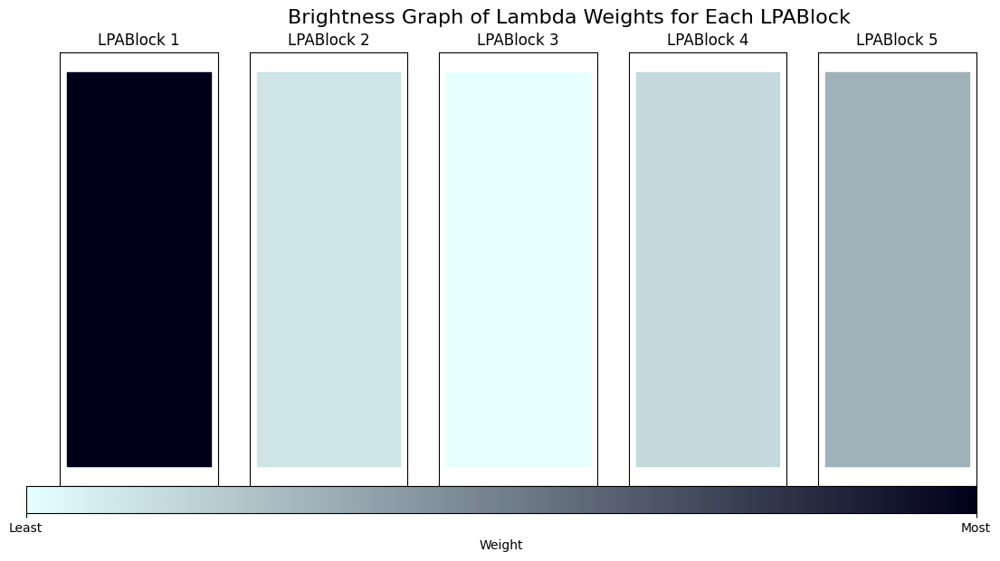

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colorbar import ColorbarBase

from matplotlib.colors import LinearSegmentedColormap
model=combined_model
lambda_weights = model.lambda_weights.detach().cpu().numpy()

# Find the range of weights
min_weight = np.min(lambda_weights)
max_weight = np.max(lambda_weights)

# Scale weights to [0, 1]
scaled_weights = (lambda_weights - min_weight) / (max_weight - min_weight)

# Define a colormap
colors = [(0.9, 1.0, 1.0), (0.0, 0.0, 0.1)]  # Blue to purple
cmap = LinearSegmentedColormap.from_list('custom_cmap', colors, N=256)

# Plotting brightness graph for each LPABlock
plt.figure(figsize=(15, 6))

# Plotting lambda weights for each block
for i, weight in enumerate(scaled_weights, start=1):
    plt.subplot(1, 5, i)
    plt.fill_between([0, 1], [0, 0], [1, 1], color=cmap(weight))
    plt.title(f'LPABlock {i}')
    plt.xticks([])
    plt.yticks([])

# Add legend
plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
cbar_ax = plt.gcf().add_axes([0.1, 0.05, 0.7, 0.05])
cb = ColorbarBase(cbar_ax, cmap=cmap, orientation='horizontal')
cb.set_label('Weight')
cb.set_ticks([0, 1])
cb.set_ticklabels(['Least', 'Most'])

plt.suptitle('Brightness Graph of Lambda Weights for Each LPABlock', fontsize=16)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
print(model.lambda_weights)

Parameter containing:
tensor([0.9973, 0.9823, 0.9806, 0.9831, 0.9857], device='cuda:0',
       requires_grad=True)
